In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn.model_selection
from scipy import stats
import plotly.express as px
from scipy import stats
from scipy.stats import norm
import warnings
warnings.filterwarnings("ignore")

# Customer Value Prediction

## Exploratory data analysis

Let's start with basic EDA. Look at the data, their data types, distribution etc.

In [3]:
df = pd.read_csv(r'MCVA.csv')
df.head()

,Customer,State,Customer Lifetime Value,Response,Coverage,Education,Effective To Date,EmploymentStatus,Gender,Income,...,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Policy Type,Policy,Renew Offer Type,Sales Channel,Total Claim Amount,Vehicle Class,Vehicle Size
0,BU79786,Washington,2763.519279,No,Basic,Bachelor,2/24/11,Employed,F,56274,...,5,0,1,Corporate Auto,Corporate L3,Offer1,Agent,384.811147,Two-Door Car,Medsize
1,QZ44356,Arizona,6979.535903,No,Extended,Bachelor,1/31/11,Unemployed,F,0,...,42,0,8,Personal Auto,Personal L3,Offer3,Agent,1131.464935,Four-Door Car,Medsize
2,AI49188,Nevada,12887.431650,No,Premium,Bachelor,2/19/11,Employed,F,48767,...,38,0,2,Personal Auto,Personal L3,Offer1,Agent,566.472247,Two-Door Car,Medsize
3,WW63253,California,7645.861827,No,Basic,Bachelor,1/20/11,Unemployed,M,0,...,65,0,7,Corporate Auto,Corporate L2,Offer1,Call Center,529.881344,SUV,Medsize
4,HB64268,Washington,2813.692575,No,Basic,Bachelor,2/3/11,Employed,M,43836,...,44,0,1,Personal Auto,Personal L1,Offer1,Agent,138.130879,Four-Door Car,Medsize


In [4]:
df['State'].value_counts()

California    3150
Oregon        2601
Arizona       1703
Nevada         882
Washington     798
Name: State, dtype: int64

In [14]:
df['EmploymentStatus'].value_counts(normalize=True)

Employed         0.623823
Unemployed       0.253668
Medical Leave    0.047296
Disabled         0.044340
Retired          0.030874
Name: EmploymentStatus, dtype: float64

<AxesSubplot:xlabel='Gender', ylabel='Income'>

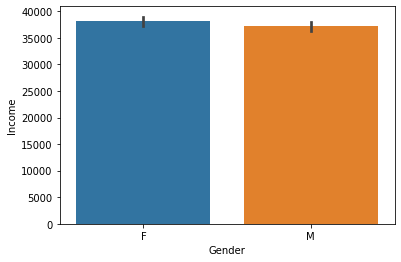

In [17]:
sns.barplot(data=df, y='Income', x='Gender')

In [3]:
df.shape

(9134, 24)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9134 entries, 0 to 9133
Data columns (total 24 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Customer                       9134 non-null   object 
 1   State                          9134 non-null   object 
 2   Customer Lifetime Value        9134 non-null   float64
 3   Response                       9134 non-null   object 
 4   Coverage                       9134 non-null   object 
 5   Education                      9134 non-null   object 
 6   Effective To Date              9134 non-null   object 
 7   EmploymentStatus               9134 non-null   object 
 8   Gender                         9134 non-null   object 
 9   Income                         9134 non-null   int64  
 10  Location Code                  9134 non-null   object 
 11  Marital Status                 9134 non-null   object 
 12  Monthly Premium Auto           9134 non-null   i

A lot of features are categorical. Let's see statistics for the features

In [5]:
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Customer,9134,9134,BU79786,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
State,9134,5,California,3150,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Customer Lifetime Value,9134.0,NaN,NaN,NaN,8004.940475,6870.967608,1898.007675,3994.251794,5780.182197,8962.167041,83325.38119
Response,9134,2,No,7826,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Coverage,9134,3,Basic,5568,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Education,9134,5,Bachelor,2748,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Effective To Date,9134,59,1/10/11,195,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EmploymentStatus,9134,5,Employed,5698,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Gender,9134,2,F,4658,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Income,9134.0,NaN,NaN,NaN,37657.380009,30379.904734,0.0,0.0,33889.5,62320.0,99981.0


In [6]:
df.columns

Index(['Customer', 'State', 'Customer Lifetime Value', 'Response', 'Coverage',
       'Education', 'Effective To Date', 'EmploymentStatus', 'Gender',
       'Income', 'Location Code', 'Marital Status', 'Monthly Premium Auto',
       'Months Since Last Claim', 'Months Since Policy Inception',
       'Number of Open Complaints', 'Number of Policies', 'Policy Type',
       'Policy', 'Renew Offer Type', 'Sales Channel', 'Total Claim Amount',
       'Vehicle Class', 'Vehicle Size'],
      dtype='object')

We will split features to categorical and numerical features

In [7]:
cat_features= ['State', 'Response', 'Coverage',
                   'Education', 'EmploymentStatus', 'Gender',
                    'Location Code', 'Marital Status',
                   'Policy', 'Renew Offer Type', 'Sales Channel',
                   'Vehicle Class', 'Vehicle Size', 'Policy Type', 'Number of Policies', 'Number of Open Complaints']

In [8]:
num_features=['Months Since Last Claim', 'Months Since Policy Inception','Income', 'Monthly Premium Auto', 'Total Claim Amount']

In [9]:
df['Effective To Date'] = df['Effective To Date'].astype(dtype='datetime64[ns]')
df['Effective To Date'].describe()

C:\Users\Т\AppData\Local\Temp\ipykernel_3908\640707500.py:2: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  df['Effective To Date'].describe()


count                    9134
unique                     59
top       2011-01-10 00:00:00
freq                      195
first     2011-01-01 00:00:00
last      2011-02-28 00:00:00
Name: Effective To Date, dtype: object

Effective date seems to be useless in this scenario because all the entries have small variance.

Let's see scatterplots for numerical data.

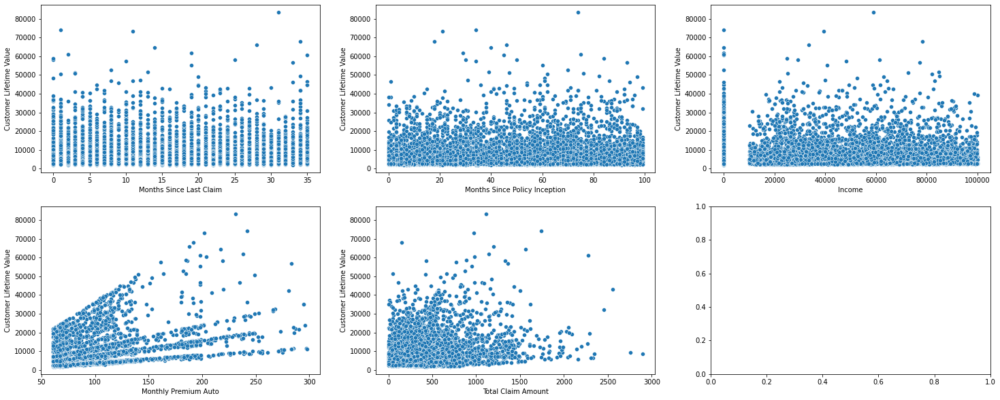

In [10]:
fig,axes=plt.subplots(2, 3, figsize=(25,10))

y=0
for feature in num_features:
    i, j = divmod(y,3)
    sns.scatterplot(x=feature, y='Customer Lifetime Value', data =df, ax=axes[i,j])
    y+=1

Monthly Premium Auto have a strong linear correlation with CLV. In addition, income has interesting distribution, with none of the income values between 1-15k. 
Next, distribution plots for the numerical values

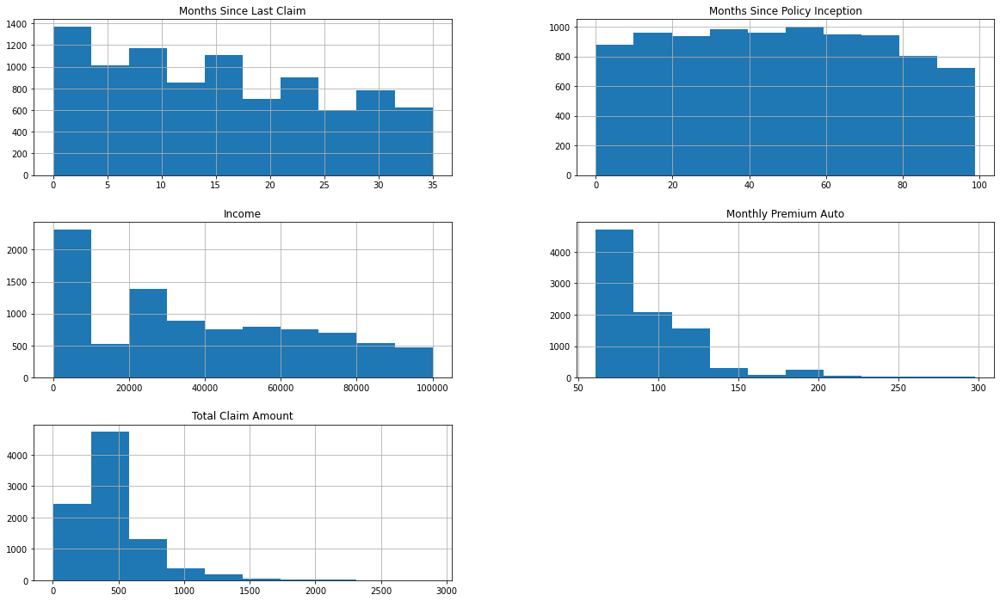

In [11]:
df[num_features].hist(figsize=(20,12));

What about categorical features? Let's look at value counts

In [12]:
for feature in cat_features:
    print(df[feature].value_counts())
    print('\n')

California    3150
Oregon        2601
Arizona       1703
Nevada         882
Washington     798
Name: State, dtype: int64


No     7826
Yes    1308
Name: Response, dtype: int64


Basic       5568
Extended    2742
Premium      824
Name: Coverage, dtype: int64


Bachelor                2748
College                 2681
High School or Below    2622
Master                   741
Doctor                   342
Name: Education, dtype: int64


Employed         5698
Unemployed       2317
Medical Leave     432
Disabled          405
Retired           282
Name: EmploymentStatus, dtype: int64


F    4658
M    4476
Name: Gender, dtype: int64


Suburban    5779
Rural       1773
Urban       1582
Name: Location Code, dtype: int64


Married     5298
Single      2467
Divorced    1369
Name: Marital Status, dtype: int64


Personal L3     3426
Personal L2     2122
Personal L1     1240
Corporate L3    1014
Corporate L2     595
Corporate L1     359
Special L2       164
Special L3       148
Special L1        66
N

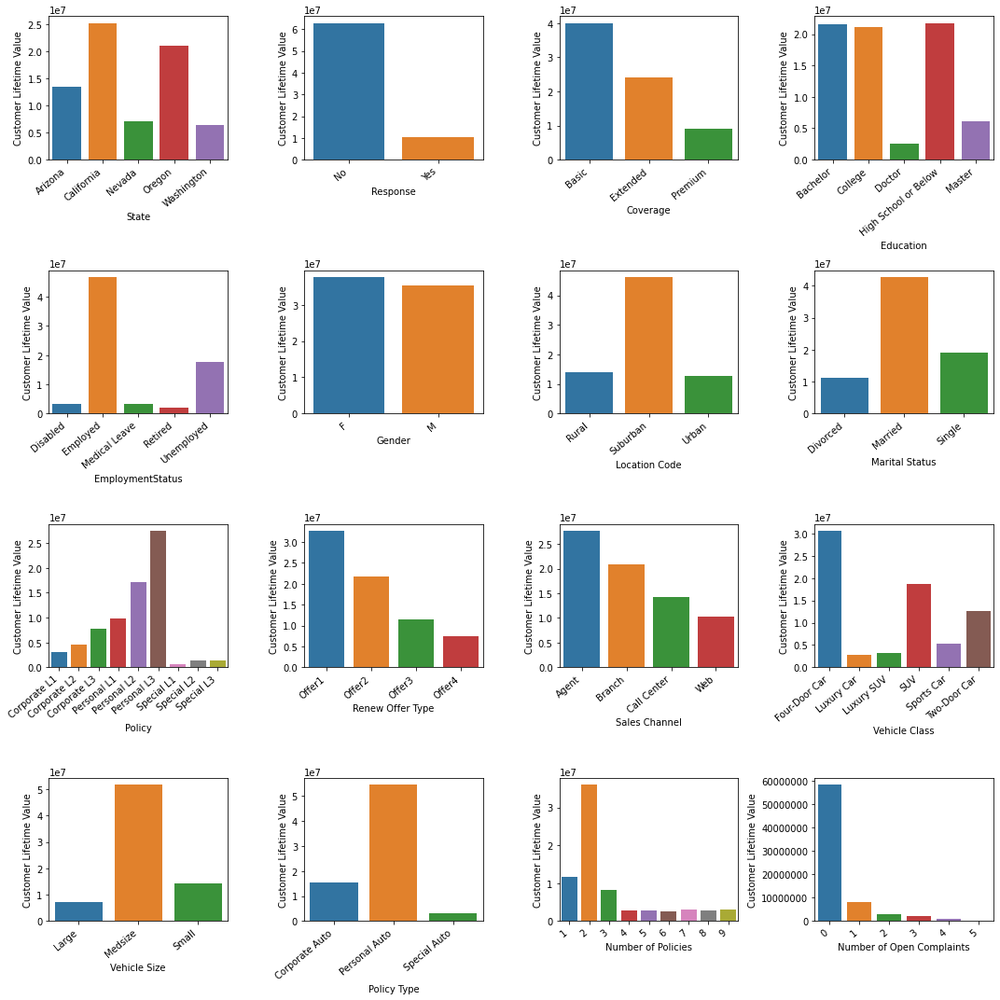

In [13]:
fig, axes = plt.subplots(4, 4, figsize=(15, 15))
y = 0
for feature in cat_features:
    i, j = divmod(y, 4)
    graph_df = df.groupby(by=feature).sum()
    graph_df.reset_index(inplace=True)
    pic = sns.barplot(x=feature, y='Customer Lifetime Value', data=graph_df, ax=axes[i, j])
    pic.set_xticklabels(pic.get_xticklabels(), rotation=40, ha="right")
    plt.ticklabel_format(style='plain', axis='y')
    y += 1
fig.tight_layout()

As we can see, most of the CLV comes from Personal policies, personal autos, usually with 2 policies.

Look at the weighted graphs.

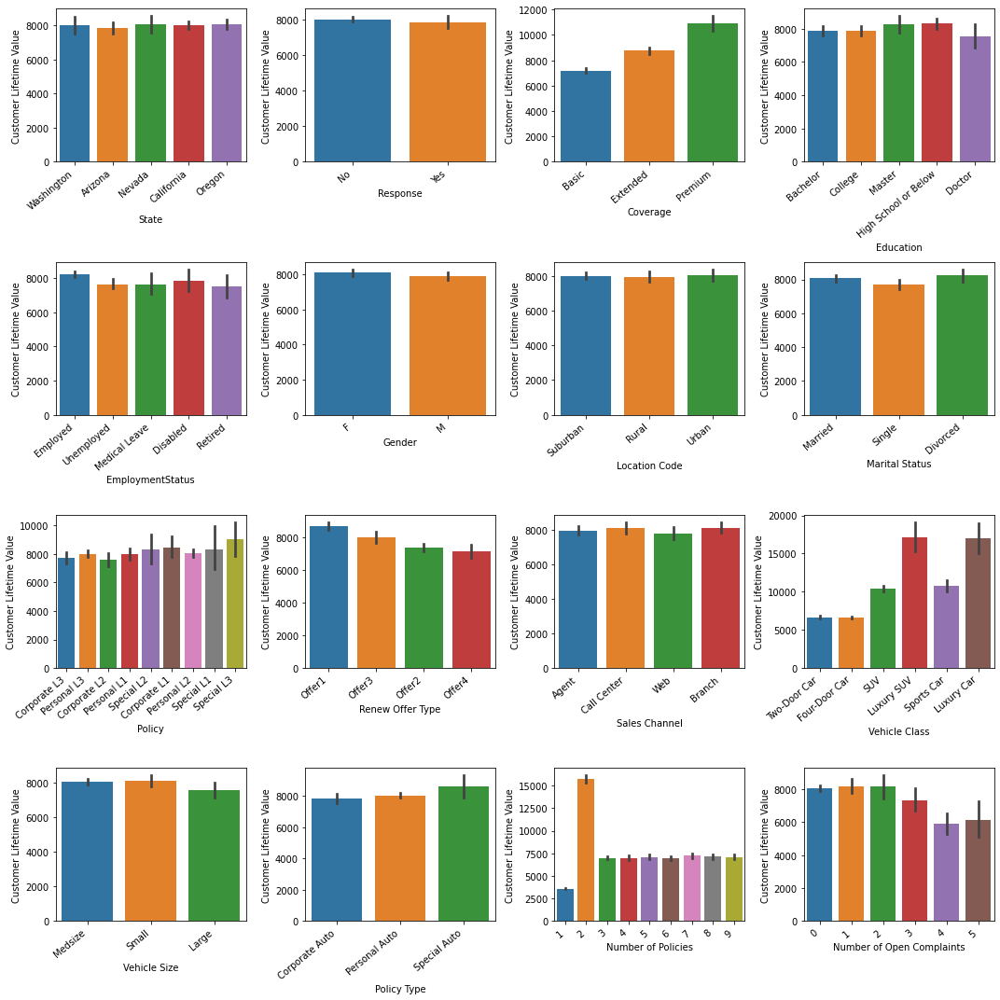

In [14]:
fig, axes = plt.subplots(4, 4, figsize=(15,15))
y=0
for feature in cat_features:
    i, j = divmod(y,4)
    graph_df=df.groupby(by=feature).mean()
    graph_df.reset_index(inplace=True)
    ax=sns.barplot(x=feature, y='Customer Lifetime Value', data=df, ax=axes[i,j])
    plt.ticklabel_format(style='plain', axis='y')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
    y+=1
fig.tight_layout()

Here we can see, that most of the value comes from luxury suvs and luxury cars

<AxesSubplot:xlabel='Vehicle Class', ylabel='Customer Lifetime Value'>

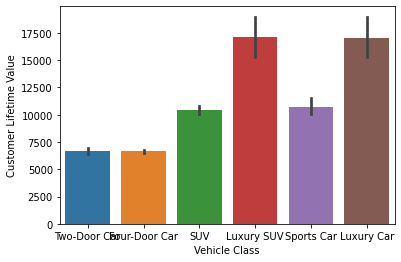

In [15]:
sns.barplot(x='Vehicle Class', y='Customer Lifetime Value', data=df)

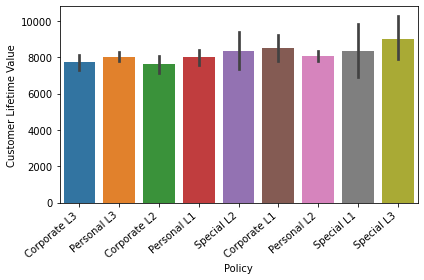

In [16]:
ax = sns.barplot(x='Policy', y='Customer Lifetime Value', data=df)

ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.tight_layout()
plt.show()

 Lets look at the target feature.

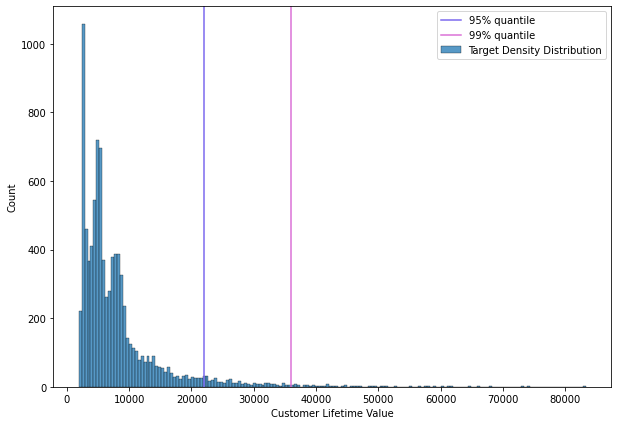

In [17]:
plt.subplots(figsize=(10,7))
sns.histplot(df['Customer Lifetime Value'], label='Target Density Distribution')
plt.axvline(df['Customer Lifetime Value'].quantile(0.95), label='95% quantile', c='mediumslateblue')
plt.axvline(df['Customer Lifetime Value'].quantile(0.99), label='99% quantile', c='orchid')
plt.legend()
plt.show()

We notice that CLV is heavily rightskewed. Let's see the amount of value that brings top 5% of the customers

In [85]:
df[df['Customer Lifetime Value'] > df['Customer Lifetime Value'].quantile(0.95)]['Customer Lifetime Value'].sum()/df['Customer Lifetime Value'].sum()

0.1923095267545042

Around 19%. That's quite a lot!
Let's remove outliers and look at the box plots

In [19]:
zscore=stats.zscore
df_out=df.copy()
df_out['CLV_zscore'] = (df['Customer Lifetime Value'] - df['Customer Lifetime Value'].mean())/df['Customer Lifetime Value'].std(ddof=0)
df_out=df_out[df_out['CLV_zscore'] < 3]
df_out.shape

(8923, 25)

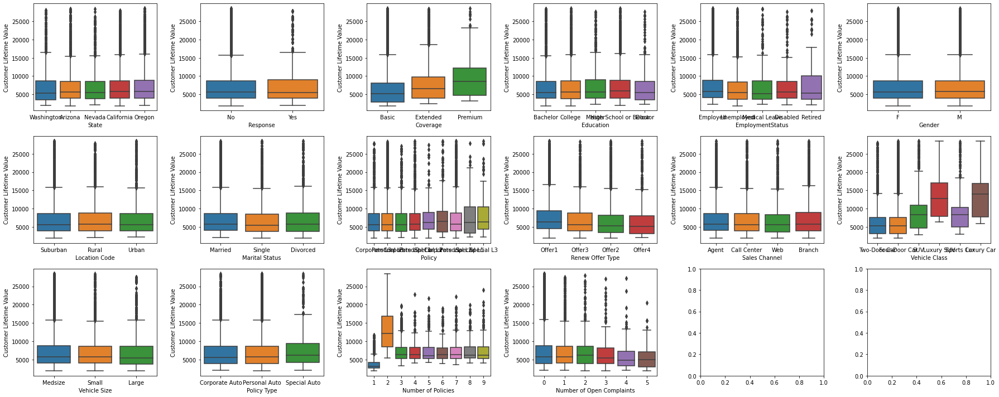

In [20]:

fig, axes = plt.subplots(3, 6, figsize=(25,10))
y=0
for feature in cat_features:
    i, j = divmod(y,6)
    sns.boxplot(x=feature, y='Customer Lifetime Value', data=df_out, ax=axes[i, j])
    y+=1
fig.tight_layout()

## Data processing

Moving on to data processing, where we need to prepare data for the modelling.

In [21]:
df.head()

,Customer,State,Customer Lifetime Value,Response,Coverage,Education,Effective To Date,EmploymentStatus,Gender,Income,...,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Policy Type,Policy,Renew Offer Type,Sales Channel,Total Claim Amount,Vehicle Class,Vehicle Size
0,BU79786,Washington,2763.519279,No,Basic,Bachelor,2011-02-24,Employed,F,56274,...,5,0,1,Corporate Auto,Corporate L3,Offer1,Agent,384.811147,Two-Door Car,Medsize
1,QZ44356,Arizona,6979.535903,No,Extended,Bachelor,2011-01-31,Unemployed,F,0,...,42,0,8,Personal Auto,Personal L3,Offer3,Agent,1131.464935,Four-Door Car,Medsize
2,AI49188,Nevada,12887.431650,No,Premium,Bachelor,2011-02-19,Employed,F,48767,...,38,0,2,Personal Auto,Personal L3,Offer1,Agent,566.472247,Two-Door Car,Medsize
3,WW63253,California,7645.861827,No,Basic,Bachelor,2011-01-20,Unemployed,M,0,...,65,0,7,Corporate Auto,Corporate L2,Offer1,Call Center,529.881344,SUV,Medsize
4,HB64268,Washington,2813.692575,No,Basic,Bachelor,2011-02-03,Employed,M,43836,...,44,0,1,Personal Auto,Personal L1,Offer1,Agent,138.130879,Four-Door Car,Medsize


Let's drop two useless features

In [22]:
df=df.drop(['Customer', 'Effective To Date'], axis = 1)

In [23]:
df.shape

(9134, 22)

Encoding categorical features

In [24]:
from sklearn.preprocessing import LabelEncoder
features_to_encode = cat_features= ['State', 'Response', 'Coverage',
                                    'Education', 'EmploymentStatus', 'Gender',
                                    'Location Code', 'Marital Status',
                                    'Policy', 'Renew Offer Type', 'Sales Channel',
                                    'Vehicle Class', 'Vehicle Size', 'Policy Type']
label_encoder=LabelEncoder()
df_le=df.copy()
for feature in cat_features:
    df_le[feature]= label_encoder.fit_transform(df[feature])

df_le.head()

,State,Customer Lifetime Value,Response,Coverage,Education,EmploymentStatus,Gender,Income,Location Code,Marital Status,...,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Policy Type,Policy,Renew Offer Type,Sales Channel,Total Claim Amount,Vehicle Class,Vehicle Size
0,4,2763.519279,0,0,0,1,0,56274,1,1,...,5,0,1,0,2,0,0,384.811147,5,1
1,0,6979.535903,0,1,0,4,0,0,1,2,...,42,0,8,1,5,2,0,1131.464935,0,1
2,2,12887.431650,0,2,0,1,0,48767,1,1,...,38,0,2,1,5,0,0,566.472247,5,1
3,1,7645.861827,0,0,0,4,1,0,1,1,...,65,0,7,0,1,0,2,529.881344,3,1
4,4,2813.692575,0,0,0,1,1,43836,0,2,...,44,0,1,1,3,0,0,138.130879,0,1


One hot encoding method

In [25]:
df_ohe=pd.get_dummies(df)
df_ohe.head()

,Customer Lifetime Value,Income,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Total Claim Amount,State_Arizona,State_California,...,Sales Channel_Web,Vehicle Class_Four-Door Car,Vehicle Class_Luxury Car,Vehicle Class_Luxury SUV,Vehicle Class_SUV,Vehicle Class_Sports Car,Vehicle Class_Two-Door Car,Vehicle Size_Large,Vehicle Size_Medsize,Vehicle Size_Small
0,2763.519279,56274,69,32,5,0,1,384.811147,0,0,...,0,0,0,0,0,0,1,0,1,0
1,6979.535903,0,94,13,42,0,8,1131.464935,1,0,...,0,1,0,0,0,0,0,0,1,0
2,12887.431650,48767,108,18,38,0,2,566.472247,0,0,...,0,0,0,0,0,0,1,0,1,0
3,7645.861827,0,106,18,65,0,7,529.881344,0,1,...,0,0,0,0,1,0,0,0,1,0
4,2813.692575,43836,73,12,44,0,1,138.130879,0,0,...,0,1,0,0,0,0,0,0,1,0


Removing outliers

In [26]:
z = np.abs(stats.zscore(df_le))
df_o=df_le[(z < 3).all(axis=1)]
df_o.shape

(8470, 22)

Since we encoded target features. Let's look at correlating features

<AxesSubplot:>

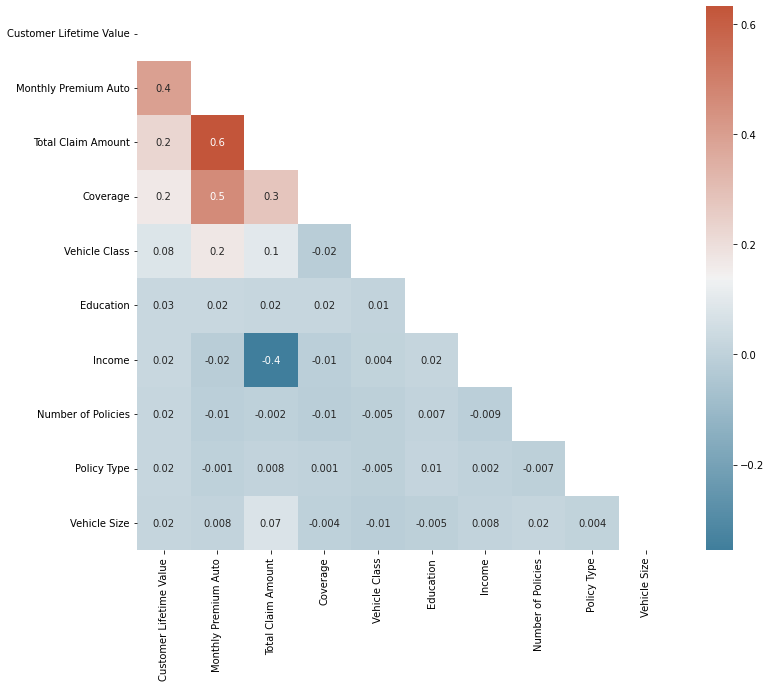

In [27]:
k = 10
corr_le = df_le.corr()
cols = corr_le.nlargest(k, 'Customer Lifetime Value')['Customer Lifetime Value'].index.tolist()
df_le_corr=df_le[cols].corr()

f, ax = plt.subplots(figsize=(12, 10))

mask = np.triu(np.ones_like(df_le_corr, dtype=bool))

cmap = sns.diverging_palette(230, 20, as_cmap=True)

sns.heatmap(df_le_corr, annot=True, mask = mask, cmap=cmap, fmt='.1g')

<AxesSubplot:>

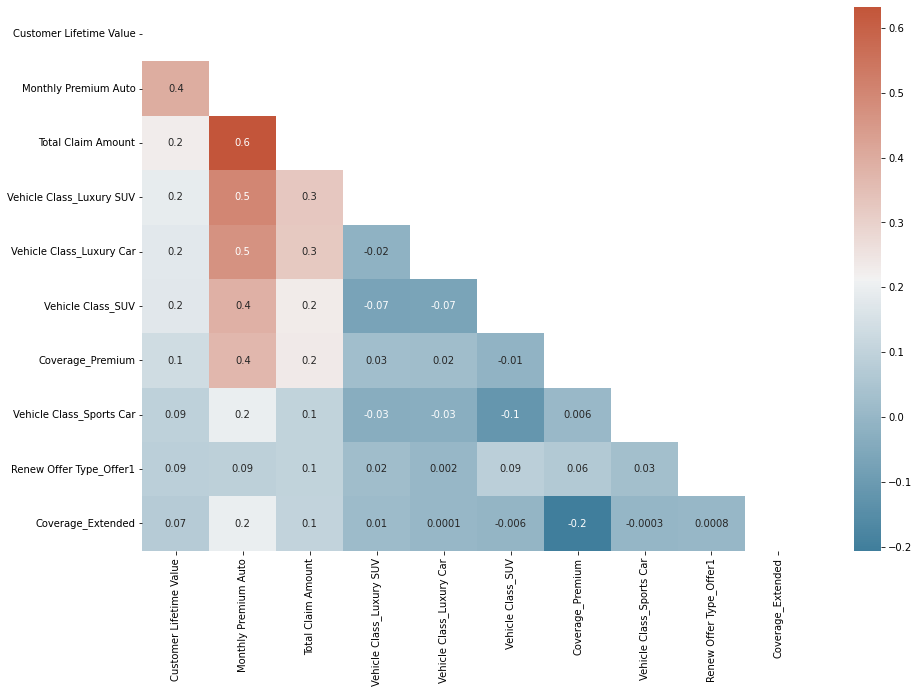

In [80]:
k = 10
corr_ohe = df_ohe.corr()
cols = corr_ohe.nlargest(k, 'Customer Lifetime Value')['Customer Lifetime Value'].index.tolist()
hm_corr=df_ohe[cols].corr()
f, ax = plt.subplots(figsize=(15, 10))

mask = np.triu(np.ones_like(hm_corr, dtype=bool))

cmap = sns.diverging_palette(230, 20, as_cmap=True)

sns.heatmap(hm_corr, annot=True, mask = mask, cmap=cmap, fmt='.1g')

## Let's build our training models!

First thing, let's split our data. We will use Label encoded model first, because it will be faster.

In [29]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.linear_model import ElasticNet
from sklearn.preprocessing import StandardScaler
from sklearn.compose import TransformedTargetRegressor
from sklearn.pipeline import Pipeline
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor

C:\Users\Т\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


In [30]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(df_o.drop(['Customer Lifetime Value'], axis=1), df_o['Customer Lifetime Value'], test_size=0.2, random_state=63)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((6776, 21), (1694, 21), (6776,), (1694,))

Baseline: Linear regression

In [31]:
%%time

lr=ElasticNet(warm_start=1, random_state=63)
scaler = StandardScaler()
pipeline = Pipeline(steps=[('normalize', scaler), ('model', lr)])
wrapped_model = TransformedTargetRegressor(regressor=pipeline, transformer=scaler)

wrapped_model.fit(X_train, y_train)

lr_pred=mean_squared_error(y_test, wrapped_model.predict(X_test), squared=False)
print(lr_pred)

4772.06789495128
CPU times: total: 31.2 ms
Wall time: 34 ms


Moving on to Boosting algorithms

In [32]:
%%time

algos=[GradientBoostingRegressor(), XGBRegressor(), LGBMRegressor(), CatBoostRegressor()]
res=[]

for algo in algos:
    algo.fit(X_train, y_train)
    algo_pred = mean_squared_error(y_test, algo.predict(X_test), squared=False)
    res.append(algo_pred)


C:\Users\Т\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\data.py:262: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


Learning rate set to 0.054867
0:	learn: 4698.2473361	total: 163ms	remaining: 2m 42s
1:	learn: 4528.2884719	total: 170ms	remaining: 1m 24s
2:	learn: 4374.8336151	total: 179ms	remaining: 59.4s
3:	learn: 4226.5626544	total: 187ms	remaining: 46.5s
4:	learn: 4089.5144650	total: 192ms	remaining: 38.2s
5:	learn: 3967.5113372	total: 198ms	remaining: 32.8s
6:	learn: 3851.0230680	total: 204ms	remaining: 28.9s
7:	learn: 3742.7078347	total: 209ms	remaining: 25.9s
8:	learn: 3642.4005379	total: 215ms	remaining: 23.7s
9:	learn: 3550.6166548	total: 220ms	remaining: 21.8s
10:	learn: 3468.9367420	total: 226ms	remaining: 20.3s
11:	learn: 3389.4544462	total: 233ms	remaining: 19.2s
12:	learn: 3320.3614015	total: 238ms	remaining: 18.1s
13:	learn: 3252.4896321	total: 242ms	remaining: 17.1s
14:	learn: 3189.7447912	total: 248ms	remaining: 16.3s
15:	learn: 3134.2677883	total: 252ms	remaining: 15.5s
16:	learn: 3082.6215831	total: 256ms	remaining: 14.8s
17:	learn: 3033.2758643	total: 261ms	remaining: 14.2s
18:	le

157:	learn: 2320.5730222	total: 909ms	remaining: 4.84s
158:	learn: 2320.0183907	total: 914ms	remaining: 4.83s
159:	learn: 2318.8475462	total: 919ms	remaining: 4.83s
160:	learn: 2317.4696493	total: 924ms	remaining: 4.82s
161:	learn: 2316.1603605	total: 929ms	remaining: 4.81s
162:	learn: 2314.8875513	total: 936ms	remaining: 4.8s
163:	learn: 2314.3390743	total: 942ms	remaining: 4.8s
164:	learn: 2311.8835214	total: 949ms	remaining: 4.8s
165:	learn: 2310.3942277	total: 954ms	remaining: 4.79s
166:	learn: 2307.6521442	total: 959ms	remaining: 4.78s
167:	learn: 2306.7112766	total: 963ms	remaining: 4.77s
168:	learn: 2305.8388875	total: 967ms	remaining: 4.76s
169:	learn: 2304.8961660	total: 971ms	remaining: 4.74s
170:	learn: 2303.4070737	total: 976ms	remaining: 4.73s
171:	learn: 2302.4886271	total: 980ms	remaining: 4.72s
172:	learn: 2300.8050908	total: 984ms	remaining: 4.7s
173:	learn: 2299.1067271	total: 988ms	remaining: 4.69s
174:	learn: 2297.5866688	total: 992ms	remaining: 4.68s
175:	learn: 22

319:	learn: 2115.6655484	total: 1.64s	remaining: 3.48s
320:	learn: 2114.7300585	total: 1.64s	remaining: 3.48s
321:	learn: 2113.5724862	total: 1.65s	remaining: 3.47s
322:	learn: 2112.9409885	total: 1.65s	remaining: 3.46s
323:	learn: 2110.6737957	total: 1.66s	remaining: 3.46s
324:	learn: 2109.1307373	total: 1.66s	remaining: 3.46s
325:	learn: 2108.0443130	total: 1.67s	remaining: 3.45s
326:	learn: 2107.0592548	total: 1.68s	remaining: 3.45s
327:	learn: 2105.3945861	total: 1.68s	remaining: 3.44s
328:	learn: 2104.2669294	total: 1.68s	remaining: 3.44s
329:	learn: 2103.0869057	total: 1.69s	remaining: 3.43s
330:	learn: 2102.1148368	total: 1.69s	remaining: 3.42s
331:	learn: 2101.2361216	total: 1.7s	remaining: 3.42s
332:	learn: 2099.7778839	total: 1.7s	remaining: 3.41s
333:	learn: 2098.5141723	total: 1.71s	remaining: 3.4s
334:	learn: 2097.1055236	total: 1.71s	remaining: 3.4s
335:	learn: 2096.0287269	total: 1.72s	remaining: 3.39s
336:	learn: 2095.1539557	total: 1.72s	remaining: 3.38s
337:	learn: 20

487:	learn: 1962.7075707	total: 2.51s	remaining: 2.64s
488:	learn: 1961.8589056	total: 2.52s	remaining: 2.63s
489:	learn: 1961.5599121	total: 2.52s	remaining: 2.63s
490:	learn: 1960.9414891	total: 2.53s	remaining: 2.62s
491:	learn: 1960.3029978	total: 2.54s	remaining: 2.62s
492:	learn: 1959.3343974	total: 2.54s	remaining: 2.62s
493:	learn: 1958.9872382	total: 2.55s	remaining: 2.61s
494:	learn: 1958.2550370	total: 2.56s	remaining: 2.61s
495:	learn: 1957.8433107	total: 2.56s	remaining: 2.6s
496:	learn: 1957.2423227	total: 2.57s	remaining: 2.6s
497:	learn: 1956.1517033	total: 2.57s	remaining: 2.59s
498:	learn: 1955.8071974	total: 2.57s	remaining: 2.58s
499:	learn: 1955.0242108	total: 2.58s	remaining: 2.58s
500:	learn: 1954.4168500	total: 2.58s	remaining: 2.57s
501:	learn: 1953.7026091	total: 2.59s	remaining: 2.57s
502:	learn: 1953.3862649	total: 2.59s	remaining: 2.56s
503:	learn: 1952.8983971	total: 2.6s	remaining: 2.55s
504:	learn: 1952.0393510	total: 2.6s	remaining: 2.55s
505:	learn: 19

657:	learn: 1846.6242501	total: 3.41s	remaining: 1.77s
658:	learn: 1845.3481358	total: 3.41s	remaining: 1.77s
659:	learn: 1844.4070831	total: 3.42s	remaining: 1.76s
660:	learn: 1842.6291594	total: 3.43s	remaining: 1.76s
661:	learn: 1841.4567991	total: 3.43s	remaining: 1.75s
662:	learn: 1840.7761042	total: 3.44s	remaining: 1.75s
663:	learn: 1840.2697129	total: 3.45s	remaining: 1.75s
664:	learn: 1838.5757342	total: 3.46s	remaining: 1.74s
665:	learn: 1837.6779079	total: 3.46s	remaining: 1.74s
666:	learn: 1836.7539849	total: 3.46s	remaining: 1.73s
667:	learn: 1836.1529672	total: 3.47s	remaining: 1.73s
668:	learn: 1835.2685363	total: 3.48s	remaining: 1.72s
669:	learn: 1834.9533787	total: 3.48s	remaining: 1.71s
670:	learn: 1834.3661953	total: 3.49s	remaining: 1.71s
671:	learn: 1833.5931753	total: 3.49s	remaining: 1.7s
672:	learn: 1832.9559891	total: 3.5s	remaining: 1.7s
673:	learn: 1832.3681417	total: 3.5s	remaining: 1.69s
674:	learn: 1831.7822278	total: 3.51s	remaining: 1.69s
675:	learn: 18

835:	learn: 1728.6684323	total: 4.46s	remaining: 876ms
836:	learn: 1727.8575326	total: 4.47s	remaining: 870ms
837:	learn: 1727.5659915	total: 4.47s	remaining: 865ms
838:	learn: 1727.0181319	total: 4.48s	remaining: 860ms
839:	learn: 1726.2762735	total: 4.48s	remaining: 854ms
840:	learn: 1725.6803357	total: 4.49s	remaining: 849ms
841:	learn: 1725.2952751	total: 4.5s	remaining: 844ms
842:	learn: 1724.4804232	total: 4.5s	remaining: 839ms
843:	learn: 1723.6501895	total: 4.51s	remaining: 834ms
844:	learn: 1722.4749203	total: 4.51s	remaining: 828ms
845:	learn: 1722.1018314	total: 4.52s	remaining: 823ms
846:	learn: 1721.4153030	total: 4.52s	remaining: 817ms
847:	learn: 1720.7445537	total: 4.53s	remaining: 812ms
848:	learn: 1720.0635968	total: 4.53s	remaining: 806ms
849:	learn: 1719.9978041	total: 4.54s	remaining: 801ms
850:	learn: 1719.6319608	total: 4.54s	remaining: 795ms
851:	learn: 1718.8367304	total: 4.54s	remaining: 790ms
852:	learn: 1717.8602482	total: 4.55s	remaining: 784ms
853:	learn: 

992:	learn: 1640.6406232	total: 5.35s	remaining: 37.7ms
993:	learn: 1640.5614432	total: 5.36s	remaining: 32.3ms
994:	learn: 1639.9089107	total: 5.36s	remaining: 26.9ms
995:	learn: 1639.3226658	total: 5.37s	remaining: 21.6ms
996:	learn: 1639.1086633	total: 5.37s	remaining: 16.2ms
997:	learn: 1638.6838209	total: 5.38s	remaining: 10.8ms
998:	learn: 1637.8442144	total: 5.38s	remaining: 5.39ms
999:	learn: 1636.6682488	total: 5.39s	remaining: 0us
CPU times: total: 21.7 s
Wall time: 8.88 s


In [33]:
result=pd.DataFrame(data=res, index= ['sklearnGB', 'XGBoost', 'LGBM', 'Catboost'], columns=['MRSE before parameter hyper tuning'])
result

,MRSE before parameter hyper tuning
sklearnGB,2392.554582
XGBoost,2417.956259
LGBM,2286.360448
Catboost,2280.519892


As we can see, Out of the box results for our models. CatBoost takes the crown, Light GBM is close second, XGBoost on the other hand, has disappointing results out of the box.
Now lets work on hyper-parameters of these models and see how can we improve on them.

In [34]:
from sklearn.model_selection import GridSearchCV
hp_tuning_res= []

In [35]:
%%time
param_grid_1={'n_estimators':[500, 1000],
              'learning_rate': [0.01, 0.05],
              'min_samples_split':[80,100,200],
              'min_samples_leaf':[5,7,10],
              'max_depth': [7,8,9,12]}
gbr = GradientBoostingRegressor(max_features='sqrt',subsample=0.8,random_state=63, n_iter_no_change=10,)
sk_gbr_cv= GridSearchCV(gbr, param_grid_1, scoring='neg_root_mean_squared_error', n_jobs=-1, cv=5, verbose=2, )
sk_gbr_cv.fit(X_train, y_train)

Fitting 5 folds for each of 144 candidates, totalling 720 fits
CPU times: total: 10.5 s
Wall time: 14min 15s


GridSearchCV(cv=5,
             estimator=GradientBoostingRegressor(max_features='sqrt',
                                                 n_iter_no_change=10,
                                                 random_state=63,
                                                 subsample=0.8),
             n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.05],
                         'max_depth': [7, 8, 9, 12],
                         'min_samples_leaf': [5, 7, 10],
                         'min_samples_split': [80, 100, 200],
                         'n_estimators': [500, 1000]},
             scoring='neg_root_mean_squared_error', verbose=2)

In [36]:
sk_gbr_cv.best_score_, sk_gbr_cv.best_params_

(-2490.5960252556692,
 {'learning_rate': 0.01,
  'max_depth': 8,
  'min_samples_leaf': 5,
  'min_samples_split': 80,
  'n_estimators': 1000})

In [37]:
sk_tuned_res=mean_squared_error(y_test, sk_gbr_cv.best_estimator_.predict(X_test), squared=False)
hp_tuning_res.append(sk_tuned_res)

In [39]:
hp_tuning_res

[2296.0366511585457]

Let's move on to the XGB

In [40]:
def my_grid_search(algo, params):
    algo_cv= GridSearchCV(algo, params, scoring='neg_root_mean_squared_error', n_jobs=-1, cv=5, verbose=2)
    algo_cv.fit(X_train, y_train)
    algo_cv_res=mean_squared_error(y_test, algo_cv.best_estimator_.predict(X_test), squared=False)
    return algo_cv.best_score_, algo_cv.best_params_, algo_cv_res


In [41]:
%%time
params1 = { 'max_depth': [1,4,8,10],
           'learning_rate': [0.01, 0.05, 0.1],
           'n_estimators': [500, 750, 1000],
           'colsample_bytree': [0.3, 0.7],
           }


xgb = XGBRegressor( random_state=63, n_jobs=-1, subsample=0.8)
xgb_cv=my_grid_search(xgb, params1)

Fitting 5 folds for each of 72 candidates, totalling 360 fits


C:\Users\Т\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\data.py:262: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


CPU times: total: 37.4 s
Wall time: 23min 20s


In [45]:
hp_tuning_res.append(xgb_cv[2])

In [46]:
hp_tuning_res

[2296.0366511585457, 2253.533083476638]

XGBoost improved significantly.

On to the LGBM hyper parameter tuning, before hand were made a lot tuning, so here is the most recent batch of hyper tuning.

In [47]:
%%time
lgbm_params = { 'learning_rate' : [0.01, 0.02, 0.05],
               'num_iterations': [80,90,100],
               'max_depth': [i for i in range(6,12)],
                'boosting_type' : ['dart', 'gbdt', 'goss', 'rf']}

lgbm = LGBMRegressor( random_state=63, n_jobs=-1,verbose=3, feature_pre_filter=True)
lgbm_cv=my_grid_search(lgbm, lgbm_params)

Fitting 5 folds for each of 216 candidates, totalling 1080 fits


C:\Users\Т\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
270 fits failed out of a total of 1080.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
270 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\Т\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Т\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\sklearn.py", line 895, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "C:\Users\Т\AppData\Local\Programs\Python\Python39\lib\site-

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Debug] Dataset::GetMultiBinFromSparseFeatures: sparse rate 0.747904
[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.322954
[LightGBM] [Debug] init for col-wise cost 0.001262 seconds, init for row-wise cost 0.002231 seconds
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001861 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Debug] Using Sparse Multi-Val Bin
[LightGBM] [Info] Total Bins 835
[LightGBM] [Info] Number of data points in the train set: 6776, number of used features: 21
[Li

In [50]:
hp_tuning_res.append(lgbm_cv[2])

In [51]:
hp_tuning_res

[2296.0366511585457, 2253.533083476638, 2281.286539528324]

Interesting thing, that LGBM uses significantly less number of trees, let's see if such small number of trees really is the best amount of trees for this algo

In [54]:
lgbm_cv

(-2487.4374586878635,
 {'boosting_type': 'goss',
  'learning_rate': 0.05,
  'max_depth': 10,
  'num_iterations': 100},
 2281.286539528324)

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002048 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001108 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001382 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001731 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001492 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000860 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000875 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000875 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000881 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001037 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly se

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001157 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001523 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001517 seconds.
You can set `force_row_wise=true` to remove 

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001352 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000898 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000856 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `for

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001476 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003072 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading,

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000818 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading,

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001219 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (n

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (n

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (n

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (n

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000865 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000865 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000934 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001295 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feat

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feat

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feat

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth >

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000845 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000865 seconds.
You can set `force_row_wise=

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth >

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000859 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `for

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading,

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001284 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001123 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading,

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

Text(0.5, 1.0, 'Test')

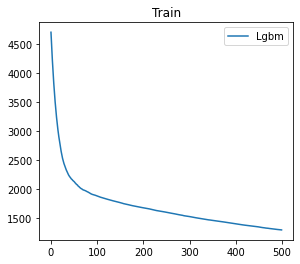

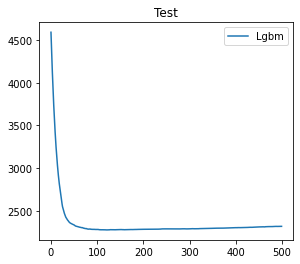

In [55]:
err_train_skl_gb=[]
err_test_skl_gb=[]

MAX_ESTIMATORS=500

g_lgbm = LGBMRegressor(learning_rate=0.05,random_state=63, max_depth= 10, boosting_type='goss', verbose=0)

for i in range(1, MAX_ESTIMATORS+1):
    g_lgbm.n_estimators = i
    g_lgbm.fit(X_train, y_train)
    err_train_skl_gb.append(mean_squared_error(y_train, g_lgbm.predict(X_train), squared=False))
    err_test_skl_gb.append(mean_squared_error(y_test, g_lgbm.predict(X_test), squared=False))

plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.plot(err_train_skl_gb, label='Lgbm')
plt.legend()
plt.title('Train')

plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 2)
plt.plot(err_test_skl_gb, label='Lgbm')
plt.legend()
plt.title('Test')

We see that loss on test batch increases slightly on big number of estimators.

Last one on the chopping block: Catboost! Let's see if we can improve on already good working out of the box model.

In [56]:
model = CatBoostRegressor(random_state=63)
grid = {'iterations': [200,500,750,1000],
        'learning_rate': [0.01, 0.05, 0.1],
        'depth': [1, 6, 8],
        'l2_leaf_reg': [0.2, 0.5, 1, 3], }
cb_cv_results=model.grid_search(grid,X=X_train, y=y_train, cv=5)


0:	learn: 8588.5437735	test: 8662.1490285	best: 8662.1490285 (0)	total: 2.7ms	remaining: 538ms
1:	learn: 8521.5444832	test: 8595.7785863	best: 8595.7785863 (1)	total: 4.66ms	remaining: 461ms
2:	learn: 8455.3632610	test: 8530.2090965	best: 8530.2090965 (2)	total: 6.25ms	remaining: 410ms
3:	learn: 8389.9924148	test: 8465.4329450	best: 8465.4329450 (3)	total: 7.78ms	remaining: 381ms
4:	learn: 8325.4243153	test: 8401.4425805	best: 8401.4425805 (4)	total: 9.33ms	remaining: 364ms
5:	learn: 8261.6513950	test: 8338.2305141	best: 8338.2305141 (5)	total: 11ms	remaining: 355ms
6:	learn: 8198.6661471	test: 8275.7893175	best: 8275.7893175 (6)	total: 12.7ms	remaining: 349ms
7:	learn: 8136.4611249	test: 8214.1116231	best: 8214.1116231 (7)	total: 14.6ms	remaining: 350ms
8:	learn: 8075.0289406	test: 8153.1901227	best: 8153.1901227 (8)	total: 16.2ms	remaining: 343ms
9:	learn: 8014.3622645	test: 8093.0175665	best: 8093.0175665 (9)	total: 17.7ms	remaining: 337ms
10:	learn: 7954.4538242	test: 8033.5867626	

103:	learn: 4839.7161801	test: 4903.7544850	best: 4903.7544850 (103)	total: 181ms	remaining: 167ms
104:	learn: 4823.8697954	test: 4887.5447252	best: 4887.5447252 (104)	total: 183ms	remaining: 166ms
105:	learn: 4808.1655255	test: 4870.8886921	best: 4870.8886921 (105)	total: 185ms	remaining: 164ms
106:	learn: 4792.2232438	test: 4854.5290637	best: 4854.5290637 (106)	total: 187ms	remaining: 163ms
107:	learn: 4776.5465638	test: 4838.4298647	best: 4838.4298647 (107)	total: 189ms	remaining: 161ms
108:	learn: 4761.4255678	test: 4822.3701974	best: 4822.3701974 (108)	total: 191ms	remaining: 159ms
109:	learn: 4746.5587182	test: 4806.5771751	best: 4806.5771751 (109)	total: 193ms	remaining: 158ms
110:	learn: 4731.4528731	test: 4791.0513694	best: 4791.0513694 (110)	total: 194ms	remaining: 156ms
111:	learn: 4716.6006721	test: 4775.7744534	best: 4775.7744534 (111)	total: 196ms	remaining: 154ms
112:	learn: 4701.9984904	test: 4760.7429586	best: 4760.7429586 (112)	total: 198ms	remaining: 153ms
113:	learn

1:	learn: 8001.8831660	test: 8080.6388220	best: 8080.6388220 (1)	total: 3.81ms	remaining: 377ms
2:	learn: 7704.7016356	test: 7785.7068975	best: 7785.7068975 (2)	total: 6.45ms	remaining: 424ms
3:	learn: 7426.2907965	test: 7509.1277986	best: 7509.1277986 (3)	total: 8.39ms	remaining: 411ms
4:	learn: 7165.7428187	test: 7250.0052987	best: 7250.0052987 (4)	total: 10.3ms	remaining: 401ms
5:	learn: 6922.1825407	test: 7007.4765987	best: 7007.4765987 (5)	total: 12.1ms	remaining: 391ms
6:	learn: 6694.7651304	test: 6780.7101328	best: 6780.7101328 (6)	total: 13.9ms	remaining: 383ms
7:	learn: 6482.6740360	test: 6568.9036344	best: 6568.9036344 (7)	total: 15.7ms	remaining: 376ms
8:	learn: 6285.1192363	test: 6371.2824689	best: 6371.2824689 (8)	total: 17.5ms	remaining: 372ms
9:	learn: 6112.4513478	test: 6196.3615030	best: 6196.3615030 (9)	total: 19.5ms	remaining: 370ms
10:	learn: 5939.5577262	test: 6022.9506840	best: 6022.9506840 (10)	total: 21.4ms	remaining: 368ms
11:	learn: 5779.0813163	test: 5861.649

93:	learn: 3230.3375688	test: 3234.7223842	best: 3234.7223842 (93)	total: 176ms	remaining: 198ms
94:	learn: 3223.2308232	test: 3228.8292530	best: 3228.8292530 (94)	total: 178ms	remaining: 197ms
95:	learn: 3215.4937726	test: 3220.5227310	best: 3220.5227310 (95)	total: 180ms	remaining: 195ms
96:	learn: 3208.8684282	test: 3214.5038909	best: 3214.5038909 (96)	total: 182ms	remaining: 193ms
97:	learn: 3201.8466807	test: 3206.9385282	best: 3206.9385282 (97)	total: 183ms	remaining: 191ms
98:	learn: 3193.5314740	test: 3198.9944196	best: 3198.9944196 (98)	total: 185ms	remaining: 189ms
99:	learn: 3186.0083080	test: 3191.8163170	best: 3191.8163170 (99)	total: 187ms	remaining: 187ms
100:	learn: 3180.0060916	test: 3186.9355209	best: 3186.9355209 (100)	total: 189ms	remaining: 185ms
101:	learn: 3173.1888896	test: 3180.4436076	best: 3180.4436076 (101)	total: 191ms	remaining: 183ms
102:	learn: 3165.4218585	test: 3172.1574153	best: 3172.1574153 (102)	total: 193ms	remaining: 181ms
103:	learn: 3158.3956522

191:	learn: 2791.3658838	test: 2829.4096839	best: 2829.4096839 (191)	total: 345ms	remaining: 14.4ms
192:	learn: 2789.0478106	test: 2827.3838565	best: 2827.3838565 (192)	total: 348ms	remaining: 12.6ms
193:	learn: 2787.0236822	test: 2826.4002034	best: 2826.4002034 (193)	total: 350ms	remaining: 10.8ms
194:	learn: 2784.8194697	test: 2824.7080184	best: 2824.7080184 (194)	total: 351ms	remaining: 9.01ms
195:	learn: 2782.5355765	test: 2823.4612943	best: 2823.4612943 (195)	total: 353ms	remaining: 7.21ms
196:	learn: 2780.2325115	test: 2821.0331288	best: 2821.0331288 (196)	total: 356ms	remaining: 5.42ms
197:	learn: 2778.1523372	test: 2818.8355593	best: 2818.8355593 (197)	total: 358ms	remaining: 3.62ms
198:	learn: 2776.0855007	test: 2817.7560351	best: 2817.7560351 (198)	total: 360ms	remaining: 1.81ms
199:	learn: 2773.6983806	test: 2815.6721429	best: 2815.6721429 (199)	total: 362ms	remaining: 0us

bestTest = 2815.672143
bestIteration = 199

1:	loss: 2815.6721429	best: 2815.6721429 (1)	total: 798ms	

93:	learn: 2789.3917253	test: 2830.5196578	best: 2830.5196578 (93)	total: 152ms	remaining: 171ms
94:	learn: 2784.6409774	test: 2825.5622791	best: 2825.5622791 (94)	total: 155ms	remaining: 171ms
95:	learn: 2780.0328712	test: 2821.4995466	best: 2821.4995466 (95)	total: 157ms	remaining: 170ms
96:	learn: 2775.6154598	test: 2819.6018049	best: 2819.6018049 (96)	total: 159ms	remaining: 169ms
97:	learn: 2771.1985321	test: 2814.9770369	best: 2814.9770369 (97)	total: 161ms	remaining: 167ms
98:	learn: 2766.9214801	test: 2811.2405663	best: 2811.2405663 (98)	total: 163ms	remaining: 166ms
99:	learn: 2762.7818345	test: 2808.0558413	best: 2808.0558413 (99)	total: 165ms	remaining: 165ms
100:	learn: 2758.6692777	test: 2803.7621569	best: 2803.7621569 (100)	total: 167ms	remaining: 163ms
101:	learn: 2754.6955992	test: 2800.3081889	best: 2800.3081889 (101)	total: 168ms	remaining: 162ms
102:	learn: 2750.8859385	test: 2796.3464912	best: 2796.3464912 (102)	total: 170ms	remaining: 160ms
103:	learn: 2747.2071278

54:	learn: 5981.8233842	test: 6065.6957462	best: 6065.6957462 (54)	total: 107ms	remaining: 281ms
55:	learn: 5948.9213569	test: 6032.6638499	best: 6032.6638499 (55)	total: 110ms	remaining: 282ms
56:	learn: 5921.0706927	test: 6004.4191081	best: 6004.4191081 (56)	total: 112ms	remaining: 282ms
57:	learn: 5890.9593185	test: 5974.0491820	best: 5974.0491820 (57)	total: 114ms	remaining: 280ms
58:	learn: 5859.3235427	test: 5942.2621613	best: 5942.2621613 (58)	total: 116ms	remaining: 278ms
59:	learn: 5828.1505966	test: 5910.9264599	best: 5910.9264599 (59)	total: 119ms	remaining: 278ms
60:	learn: 5797.4352536	test: 5880.0370009	best: 5880.0370009 (60)	total: 121ms	remaining: 276ms
61:	learn: 5771.5948929	test: 5853.7900170	best: 5853.7900170 (61)	total: 123ms	remaining: 273ms
62:	learn: 5741.7137386	test: 5823.7179839	best: 5823.7179839 (62)	total: 125ms	remaining: 271ms
63:	learn: 5714.0233105	test: 5795.6422737	best: 5795.6422737 (63)	total: 128ms	remaining: 272ms
64:	learn: 5684.9425229	test: 

18:	learn: 4952.6657039	test: 5019.9272143	best: 5019.9272143 (18)	total: 38.4ms	remaining: 365ms
19:	learn: 4867.9643935	test: 4930.5842857	best: 4930.5842857 (19)	total: 41.4ms	remaining: 373ms
20:	learn: 4789.4384832	test: 4850.1786803	best: 4850.1786803 (20)	total: 43.8ms	remaining: 373ms
21:	learn: 4707.7781268	test: 4766.5994677	best: 4766.5994677 (21)	total: 46.1ms	remaining: 373ms
22:	learn: 4632.8429625	test: 4689.6095339	best: 4689.6095339 (22)	total: 48.4ms	remaining: 373ms
23:	learn: 4564.1568326	test: 4618.7534224	best: 4618.7534224 (23)	total: 50.6ms	remaining: 371ms
24:	learn: 4501.2669307	test: 4553.5981682	best: 4553.5981682 (24)	total: 54ms	remaining: 378ms
25:	learn: 4447.3923871	test: 4497.8057201	best: 4497.8057201 (25)	total: 55.8ms	remaining: 373ms
26:	learn: 4391.6895280	test: 4438.1640797	best: 4438.1640797 (26)	total: 57.6ms	remaining: 369ms
27:	learn: 4339.8880434	test: 4384.1482517	best: 4384.1482517 (27)	total: 59.3ms	remaining: 364ms
28:	learn: 4290.945890

104:	learn: 3152.6021866	test: 3160.4936764	best: 3160.4936764 (104)	total: 210ms	remaining: 190ms
105:	learn: 3145.5450261	test: 3153.8003628	best: 3153.8003628 (105)	total: 213ms	remaining: 188ms
106:	learn: 3138.7204598	test: 3146.4972308	best: 3146.4972308 (106)	total: 215ms	remaining: 187ms
107:	learn: 3131.9078642	test: 3140.0467632	best: 3140.0467632 (107)	total: 217ms	remaining: 185ms
108:	learn: 3125.3134941	test: 3133.0017530	best: 3133.0017530 (108)	total: 220ms	remaining: 183ms
109:	learn: 3118.7372849	test: 3126.7854073	best: 3126.7854073 (109)	total: 221ms	remaining: 181ms
110:	learn: 3112.3660367	test: 3119.9903601	best: 3119.9903601 (110)	total: 224ms	remaining: 180ms
111:	learn: 3106.0183439	test: 3113.9997946	best: 3113.9997946 (111)	total: 226ms	remaining: 178ms
112:	learn: 3099.8633540	test: 3107.4467969	best: 3107.4467969 (112)	total: 228ms	remaining: 175ms
113:	learn: 3093.7365936	test: 3101.6740220	best: 3101.6740220 (113)	total: 229ms	remaining: 173ms
114:	learn

31:	learn: 3489.8166441	test: 3491.8130849	best: 3491.8130849 (31)	total: 75.1ms	remaining: 394ms
32:	learn: 3468.1070713	test: 3472.6120188	best: 3472.6120188 (32)	total: 77.7ms	remaining: 393ms
33:	learn: 3445.6535297	test: 3448.3939765	best: 3448.3939765 (33)	total: 79.5ms	remaining: 388ms
34:	learn: 3423.4793431	test: 3426.2078303	best: 3426.2078303 (34)	total: 81.3ms	remaining: 384ms
35:	learn: 3403.9300588	test: 3407.8742072	best: 3407.8742072 (35)	total: 83.1ms	remaining: 379ms
36:	learn: 3383.2336155	test: 3385.5869519	best: 3385.5869519 (36)	total: 85.1ms	remaining: 375ms
37:	learn: 3362.8319038	test: 3365.4360412	best: 3365.4360412 (37)	total: 86.9ms	remaining: 371ms
38:	learn: 3343.6560598	test: 3344.8530480	best: 3344.8530480 (38)	total: 88.7ms	remaining: 366ms
39:	learn: 3328.1809321	test: 3331.4913089	best: 3331.4913089 (39)	total: 90.5ms	remaining: 362ms
40:	learn: 3314.2225029	test: 3321.3202269	best: 3321.3202269 (40)	total: 92.3ms	remaining: 358ms
41:	learn: 3295.4504

118:	learn: 2701.7127176	test: 2757.7305775	best: 2757.7305775 (118)	total: 252ms	remaining: 171ms
119:	learn: 2699.2727547	test: 2755.2135477	best: 2755.2135477 (119)	total: 255ms	remaining: 170ms
120:	learn: 2696.8490607	test: 2754.4647655	best: 2754.4647655 (120)	total: 257ms	remaining: 168ms
121:	learn: 2694.4426857	test: 2753.8272794	best: 2753.8272794 (121)	total: 259ms	remaining: 165ms
122:	learn: 2692.0976581	test: 2751.8925354	best: 2751.8925354 (122)	total: 260ms	remaining: 163ms
123:	learn: 2689.8255723	test: 2749.5435392	best: 2749.5435392 (123)	total: 262ms	remaining: 161ms
124:	learn: 2687.6090262	test: 2748.0029801	best: 2748.0029801 (124)	total: 264ms	remaining: 159ms
125:	learn: 2685.4332994	test: 2746.2208058	best: 2746.2208058 (125)	total: 266ms	remaining: 156ms
126:	learn: 2683.3236226	test: 2744.0461826	best: 2744.0461826 (126)	total: 268ms	remaining: 154ms
127:	learn: 2681.3608375	test: 2743.5939053	best: 2743.5939053 (127)	total: 270ms	remaining: 152ms
128:	learn

5:	learn: 8261.7438367	test: 8338.3226398	best: 8338.3226398 (5)	total: 11.9ms	remaining: 385ms
6:	learn: 8198.7726620	test: 8275.8954852	best: 8275.8954852 (6)	total: 14.1ms	remaining: 387ms
7:	learn: 8136.5813462	test: 8214.2314722	best: 8214.2314722 (7)	total: 15.9ms	remaining: 382ms
8:	learn: 8075.1625069	test: 8153.3232978	best: 8153.3232978 (8)	total: 17.8ms	remaining: 377ms
9:	learn: 8014.5088197	test: 8093.1637174	best: 8093.1637174 (9)	total: 19.6ms	remaining: 372ms
10:	learn: 7954.6130173	test: 8033.7455443	best: 8033.7455443 (10)	total: 21.4ms	remaining: 368ms
11:	learn: 7895.4678887	test: 7975.0616486	best: 7975.0616486 (11)	total: 23.7ms	remaining: 372ms
12:	learn: 7837.0662783	test: 7917.1049566	best: 7917.1049566 (12)	total: 25.6ms	remaining: 368ms
13:	learn: 7779.4010853	test: 7859.8684496	best: 7859.8684496 (13)	total: 27.5ms	remaining: 365ms
14:	learn: 7722.4652625	test: 7803.3451637	best: 7803.3451637 (14)	total: 29.4ms	remaining: 362ms
15:	learn: 7666.2518155	test: 

90:	learn: 5071.6646079	test: 5142.0098562	best: 5142.0098562 (90)	total: 184ms	remaining: 220ms
91:	learn: 5051.9857179	test: 5121.9522552	best: 5121.9522552 (91)	total: 186ms	remaining: 218ms
92:	learn: 5032.6236549	test: 5102.2045253	best: 5102.2045253 (92)	total: 188ms	remaining: 216ms
93:	learn: 5014.2937131	test: 5082.8656393	best: 5082.8656393 (93)	total: 189ms	remaining: 213ms
94:	learn: 4996.0003881	test: 5064.1916652	best: 5064.1916652 (94)	total: 191ms	remaining: 211ms
95:	learn: 4977.3932184	test: 5045.1939864	best: 5045.1939864 (95)	total: 193ms	remaining: 209ms
96:	learn: 4959.5316679	test: 5026.8861122	best: 5026.8861122 (96)	total: 195ms	remaining: 207ms
97:	learn: 4941.4573949	test: 5008.4131029	best: 5008.4131029 (97)	total: 196ms	remaining: 204ms
98:	learn: 4923.6783133	test: 4990.2290793	best: 4990.2290793 (98)	total: 198ms	remaining: 202ms
99:	learn: 4906.1904144	test: 4972.3301986	best: 4972.3301986 (99)	total: 200ms	remaining: 200ms
100:	learn: 4889.3226108	test:

184:	learn: 4028.0138252	test: 4054.3875039	best: 4054.3875039 (184)	total: 357ms	remaining: 28.9ms
185:	learn: 4022.5275277	test: 4048.8894059	best: 4048.8894059 (185)	total: 359ms	remaining: 27ms
186:	learn: 4016.4987790	test: 4042.4947355	best: 4042.4947355 (186)	total: 361ms	remaining: 25.1ms
187:	learn: 4010.6448879	test: 4036.1941029	best: 4036.1941029 (187)	total: 362ms	remaining: 23.1ms
188:	learn: 4004.7411252	test: 4029.9278765	best: 4029.9278765 (188)	total: 364ms	remaining: 21.2ms
189:	learn: 3999.0083919	test: 4023.7585271	best: 4023.7585271 (189)	total: 366ms	remaining: 19.3ms
190:	learn: 3993.9487861	test: 4018.6070325	best: 4018.6070325 (190)	total: 368ms	remaining: 17.3ms
191:	learn: 3988.2138348	test: 4012.5140543	best: 4012.5140543 (191)	total: 370ms	remaining: 15.4ms
192:	learn: 3982.5849624	test: 4006.5275210	best: 4006.5275210 (192)	total: 372ms	remaining: 13.5ms
193:	learn: 3977.0603414	test: 4000.6456629	best: 4000.6456629 (193)	total: 373ms	remaining: 11.5ms
19

76:	learn: 3374.4911424	test: 3372.5290827	best: 3372.5290827 (76)	total: 140ms	remaining: 223ms
77:	learn: 3365.6236293	test: 3364.8893708	best: 3364.8893708 (77)	total: 142ms	remaining: 222ms
78:	learn: 3356.6530211	test: 3356.0447362	best: 3356.0447362 (78)	total: 144ms	remaining: 220ms
79:	learn: 3346.5200948	test: 3345.2008474	best: 3345.2008474 (79)	total: 146ms	remaining: 218ms
80:	learn: 3337.3483272	test: 3335.3568788	best: 3335.3568788 (80)	total: 147ms	remaining: 216ms
81:	learn: 3328.1104941	test: 3326.2967790	best: 3326.2967790 (81)	total: 149ms	remaining: 214ms
82:	learn: 3319.7509523	test: 3318.1044591	best: 3318.1044591 (82)	total: 151ms	remaining: 213ms
83:	learn: 3310.3624443	test: 3308.0873591	best: 3308.0873591 (83)	total: 153ms	remaining: 211ms
84:	learn: 3302.6143989	test: 3302.0246100	best: 3302.0246100 (84)	total: 154ms	remaining: 209ms
85:	learn: 3295.0788624	test: 3296.9530566	best: 3296.9530566 (85)	total: 156ms	remaining: 207ms
86:	learn: 3286.5283754	test: 

172:	learn: 2841.4018103	test: 2872.5240700	best: 2872.5240700 (172)	total: 313ms	remaining: 48.8ms
173:	learn: 2838.7112110	test: 2870.1351160	best: 2870.1351160 (173)	total: 315ms	remaining: 47.1ms
174:	learn: 2835.9936919	test: 2868.8404576	best: 2868.8404576 (174)	total: 317ms	remaining: 45.3ms
175:	learn: 2833.2920525	test: 2867.1915463	best: 2867.1915463 (175)	total: 319ms	remaining: 43.5ms
176:	learn: 2830.1634366	test: 2863.8894581	best: 2863.8894581 (176)	total: 321ms	remaining: 41.7ms
177:	learn: 2827.3367585	test: 2860.9002488	best: 2860.9002488 (177)	total: 322ms	remaining: 39.8ms
178:	learn: 2824.7831358	test: 2858.1942922	best: 2858.1942922 (178)	total: 324ms	remaining: 38ms
179:	learn: 2821.8280935	test: 2855.5728642	best: 2855.5728642 (179)	total: 326ms	remaining: 36.2ms
180:	learn: 2818.8650652	test: 2853.7960463	best: 2853.7960463 (180)	total: 328ms	remaining: 34.4ms
181:	learn: 2816.1885201	test: 2851.4290607	best: 2851.4290607 (181)	total: 329ms	remaining: 32.6ms
18

66:	learn: 2974.1947485	test: 2998.7117745	best: 2998.7117745 (66)	total: 120ms	remaining: 238ms
67:	learn: 2964.6469616	test: 2988.5001236	best: 2988.5001236 (67)	total: 122ms	remaining: 237ms
68:	learn: 2954.9873638	test: 2979.6011427	best: 2979.6011427 (68)	total: 124ms	remaining: 235ms
69:	learn: 2946.0865883	test: 2970.1135075	best: 2970.1135075 (69)	total: 126ms	remaining: 233ms
70:	learn: 2937.1366714	test: 2961.8946915	best: 2961.8946915 (70)	total: 127ms	remaining: 232ms
71:	learn: 2930.1221449	test: 2957.3311831	best: 2957.3311831 (71)	total: 129ms	remaining: 230ms
72:	learn: 2921.7528824	test: 2948.4060908	best: 2948.4060908 (72)	total: 131ms	remaining: 228ms
73:	learn: 2913.4514176	test: 2940.8202157	best: 2940.8202157 (73)	total: 133ms	remaining: 226ms
74:	learn: 2906.7092655	test: 2934.6941587	best: 2934.6941587 (74)	total: 135ms	remaining: 225ms
75:	learn: 2897.9742305	test: 2925.4727102	best: 2925.4727102 (75)	total: 136ms	remaining: 223ms
76:	learn: 2891.5879093	test: 

159:	learn: 2635.4641131	test: 2713.0765103	best: 2713.0765103 (159)	total: 292ms	remaining: 73ms
160:	learn: 2634.5203689	test: 2712.3741298	best: 2712.3741298 (160)	total: 294ms	remaining: 71.2ms
161:	learn: 2633.5861443	test: 2712.4761300	best: 2712.3741298 (160)	total: 296ms	remaining: 69.4ms
162:	learn: 2632.6711218	test: 2711.5575081	best: 2711.5575081 (162)	total: 298ms	remaining: 67.6ms
163:	learn: 2631.7629516	test: 2711.4645637	best: 2711.4645637 (163)	total: 300ms	remaining: 65.8ms
164:	learn: 2630.8684901	test: 2710.9658621	best: 2710.9658621 (164)	total: 301ms	remaining: 63.9ms
165:	learn: 2629.9927612	test: 2710.3256492	best: 2710.3256492 (165)	total: 303ms	remaining: 62.1ms
166:	learn: 2629.1945085	test: 2710.3455947	best: 2710.3256492 (165)	total: 305ms	remaining: 60.2ms
167:	learn: 2628.3394707	test: 2709.4986981	best: 2709.4986981 (167)	total: 307ms	remaining: 58.4ms
168:	learn: 2627.5276175	test: 2708.9111963	best: 2708.9111963 (168)	total: 308ms	remaining: 56.6ms
16

50:	learn: 6117.4694766	test: 6202.0660967	best: 6202.0660967 (50)	total: 95.6ms	remaining: 279ms
51:	learn: 6082.6987119	test: 6167.2072542	best: 6167.2072542 (51)	total: 98ms	remaining: 279ms
52:	learn: 6050.4745148	test: 6134.5828322	best: 6134.5828322 (52)	total: 99.9ms	remaining: 277ms
53:	learn: 6016.6078499	test: 6100.6109293	best: 6100.6109293 (53)	total: 102ms	remaining: 275ms
54:	learn: 5983.2285154	test: 6067.1142717	best: 6067.1142717 (54)	total: 104ms	remaining: 273ms
55:	learn: 5950.3311379	test: 6034.0876279	best: 6034.0876279 (55)	total: 105ms	remaining: 271ms
56:	learn: 5922.4856619	test: 6005.8498099	best: 6005.8498099 (56)	total: 107ms	remaining: 269ms
57:	learn: 5892.3852524	test: 5975.4910738	best: 5975.4910738 (57)	total: 109ms	remaining: 267ms
58:	learn: 5860.7527056	test: 5943.7079024	best: 5943.7079024 (58)	total: 111ms	remaining: 265ms
59:	learn: 5829.5825266	test: 5912.3755973	best: 5912.3755973 (59)	total: 113ms	remaining: 263ms
60:	learn: 5798.8694994	test:

145:	learn: 4320.3166411	test: 4362.6032025	best: 4362.6032025 (145)	total: 268ms	remaining: 99.1ms
146:	learn: 4311.0103250	test: 4352.6064449	best: 4352.6064449 (146)	total: 270ms	remaining: 97.4ms
147:	learn: 4301.6823972	test: 4342.8622737	best: 4342.8622737 (147)	total: 272ms	remaining: 95.5ms
148:	learn: 4292.6065855	test: 4333.1088244	best: 4333.1088244 (148)	total: 274ms	remaining: 93.7ms
149:	learn: 4283.9843463	test: 4324.3910299	best: 4324.3910299 (149)	total: 275ms	remaining: 91.8ms
150:	learn: 4274.9852202	test: 4314.9788753	best: 4314.9788753 (150)	total: 277ms	remaining: 90ms
151:	learn: 4266.2316366	test: 4305.5670608	best: 4305.5670608 (151)	total: 279ms	remaining: 88.1ms
152:	learn: 4257.4512809	test: 4296.3762266	best: 4296.3762266 (152)	total: 281ms	remaining: 86.3ms
153:	learn: 4248.9109506	test: 4287.1902155	best: 4287.1902155 (153)	total: 283ms	remaining: 84.4ms
154:	learn: 4240.9220615	test: 4278.9841496	best: 4278.9841496 (154)	total: 284ms	remaining: 82.6ms
15

40:	learn: 3890.3145227	test: 3907.4873408	best: 3907.4873408 (40)	total: 74ms	remaining: 287ms
41:	learn: 3867.0541074	test: 3882.5513884	best: 3882.5513884 (41)	total: 76.2ms	remaining: 287ms
42:	learn: 3843.2738398	test: 3857.1677945	best: 3857.1677945 (42)	total: 78ms	remaining: 285ms
43:	learn: 3821.6830403	test: 3833.9994406	best: 3833.9994406 (43)	total: 79.8ms	remaining: 283ms
44:	learn: 3800.2256968	test: 3811.1357480	best: 3811.1357480 (44)	total: 81.6ms	remaining: 281ms
45:	learn: 3780.3826906	test: 3789.8061191	best: 3789.8061191 (45)	total: 83.4ms	remaining: 279ms
46:	learn: 3760.6155457	test: 3768.8175726	best: 3768.8175726 (46)	total: 85.2ms	remaining: 277ms
47:	learn: 3744.0003579	test: 3752.9277033	best: 3752.9277033 (47)	total: 87ms	remaining: 275ms
48:	learn: 3726.5176985	test: 3734.4240790	best: 3734.4240790 (48)	total: 88.7ms	remaining: 273ms
49:	learn: 3708.1832250	test: 3714.7460586	best: 3714.7460586 (49)	total: 90.5ms	remaining: 271ms
50:	learn: 3691.5564811	te

127:	learn: 3019.0923663	test: 3036.9174075	best: 3036.9174075 (127)	total: 240ms	remaining: 135ms
128:	learn: 3013.8711843	test: 3031.3433286	best: 3031.3433286 (128)	total: 242ms	remaining: 133ms
129:	learn: 3008.6404983	test: 3026.4934754	best: 3026.4934754 (129)	total: 244ms	remaining: 131ms
130:	learn: 3004.3755060	test: 3023.9068788	best: 3023.9068788 (130)	total: 246ms	remaining: 130ms
131:	learn: 2999.6384990	test: 3019.5353688	best: 3019.5353688 (131)	total: 248ms	remaining: 128ms
132:	learn: 2995.3563922	test: 3015.5931720	best: 3015.5931720 (132)	total: 250ms	remaining: 126ms
133:	learn: 2989.6757942	test: 3009.5614337	best: 3009.5614337 (133)	total: 252ms	remaining: 124ms
134:	learn: 2984.5390680	test: 3004.0957620	best: 3004.0957620 (134)	total: 254ms	remaining: 122ms
135:	learn: 2980.2489271	test: 3000.7385129	best: 3000.7385129 (135)	total: 256ms	remaining: 120ms
136:	learn: 2975.5898702	test: 2995.7710905	best: 2995.7710905 (136)	total: 258ms	remaining: 119ms
137:	learn

91:	learn: 2800.0753690	test: 2839.5357095	best: 2839.5357095 (91)	total: 194ms	remaining: 227ms
92:	learn: 2795.1255310	test: 2836.7887273	best: 2836.7887273 (92)	total: 196ms	remaining: 226ms
93:	learn: 2789.9375158	test: 2832.1767230	best: 2832.1767230 (93)	total: 198ms	remaining: 223ms
94:	learn: 2785.3605224	test: 2827.3967722	best: 2827.3967722 (94)	total: 200ms	remaining: 221ms
95:	learn: 2780.5787728	test: 2823.1644724	best: 2823.1644724 (95)	total: 202ms	remaining: 219ms
96:	learn: 2776.1759472	test: 2821.2515584	best: 2821.2515584 (96)	total: 204ms	remaining: 217ms
97:	learn: 2771.8995987	test: 2816.7712211	best: 2816.7712211 (97)	total: 206ms	remaining: 214ms
98:	learn: 2767.4801955	test: 2812.8944856	best: 2812.8944856 (98)	total: 208ms	remaining: 212ms
99:	learn: 2763.5003632	test: 2808.7416401	best: 2808.7416401 (99)	total: 209ms	remaining: 209ms
100:	learn: 2759.4784150	test: 2806.6921873	best: 2806.6921873 (100)	total: 211ms	remaining: 207ms
101:	learn: 2755.3841767	tes

178:	learn: 2620.6588854	test: 2704.9157836	best: 2704.9157836 (178)	total: 363ms	remaining: 42.6ms
179:	learn: 2620.0364722	test: 2704.8447920	best: 2704.8447920 (179)	total: 365ms	remaining: 40.6ms
180:	learn: 2619.4057996	test: 2704.2315460	best: 2704.2315460 (180)	total: 367ms	remaining: 38.5ms
181:	learn: 2618.7822771	test: 2703.9448667	best: 2703.9448667 (181)	total: 369ms	remaining: 36.5ms
182:	learn: 2618.1789162	test: 2704.0697969	best: 2703.9448667 (181)	total: 371ms	remaining: 34.5ms
183:	learn: 2617.5798464	test: 2703.6580024	best: 2703.6580024 (183)	total: 373ms	remaining: 32.4ms
184:	learn: 2616.9939315	test: 2703.0946944	best: 2703.0946944 (184)	total: 375ms	remaining: 30.4ms
185:	learn: 2616.3939541	test: 2702.9906298	best: 2702.9906298 (185)	total: 376ms	remaining: 28.3ms
186:	learn: 2615.8301982	test: 2702.8658422	best: 2702.8658422 (186)	total: 378ms	remaining: 26.3ms
187:	learn: 2615.2775864	test: 2702.4932854	best: 2702.4932854 (187)	total: 380ms	remaining: 24.3ms


67:	learn: 5600.1075066	test: 5680.8386757	best: 5680.8386757 (67)	total: 131ms	remaining: 829ms
68:	learn: 5572.7308996	test: 5653.2147458	best: 5653.2147458 (68)	total: 133ms	remaining: 832ms
69:	learn: 5545.7679189	test: 5625.9943441	best: 5625.9943441 (69)	total: 135ms	remaining: 829ms
70:	learn: 5519.2136547	test: 5599.1727221	best: 5599.1727221 (70)	total: 137ms	remaining: 828ms
71:	learn: 5496.1216511	test: 5575.6291516	best: 5575.6291516 (71)	total: 139ms	remaining: 826ms
72:	learn: 5470.3051109	test: 5549.5312032	best: 5549.5312032 (72)	total: 141ms	remaining: 822ms
73:	learn: 5444.8835127	test: 5523.8186823	best: 5523.8186823 (73)	total: 143ms	remaining: 821ms
74:	learn: 5419.8520720	test: 5498.4869697	best: 5498.4869697 (74)	total: 145ms	remaining: 820ms
75:	learn: 5395.2060369	test: 5473.5314794	best: 5473.5314794 (75)	total: 147ms	remaining: 819ms
76:	learn: 5372.3328132	test: 5449.6040453	best: 5449.6040453 (76)	total: 149ms	remaining: 819ms
77:	learn: 5348.3379788	test: 

156:	learn: 4224.6508805	test: 4262.4646385	best: 4262.4646385 (156)	total: 302ms	remaining: 660ms
157:	learn: 4216.3598567	test: 4253.7670711	best: 4253.7670711 (157)	total: 305ms	remaining: 659ms
158:	learn: 4208.3016880	test: 4245.0955115	best: 4245.0955115 (158)	total: 306ms	remaining: 657ms
159:	learn: 4200.3888662	test: 4236.5789152	best: 4236.5789152 (159)	total: 308ms	remaining: 655ms
160:	learn: 4192.3395829	test: 4228.1297261	best: 4228.1297261 (160)	total: 310ms	remaining: 653ms
161:	learn: 4184.4354466	test: 4219.8247509	best: 4219.8247509 (161)	total: 312ms	remaining: 651ms
162:	learn: 4176.6740789	test: 4211.6617054	best: 4211.6617054 (162)	total: 313ms	remaining: 648ms
163:	learn: 4169.0328264	test: 4203.4338593	best: 4203.4338593 (163)	total: 315ms	remaining: 646ms
164:	learn: 4161.9708506	test: 4196.1952408	best: 4196.1952408 (164)	total: 317ms	remaining: 644ms
165:	learn: 4154.5450360	test: 4188.1985721	best: 4188.1985721 (165)	total: 319ms	remaining: 642ms
166:	learn

249:	learn: 3736.2865322	test: 3745.9446431	best: 3745.9446431 (249)	total: 473ms	remaining: 473ms
250:	learn: 3732.8134989	test: 3742.2786176	best: 3742.2786176 (250)	total: 476ms	remaining: 472ms
251:	learn: 3729.4064359	test: 3738.6820953	best: 3738.6820953 (251)	total: 477ms	remaining: 470ms
252:	learn: 3726.0641461	test: 3735.1538207	best: 3735.1538207 (252)	total: 479ms	remaining: 468ms
253:	learn: 3722.5178054	test: 3731.3415725	best: 3731.3415725 (253)	total: 481ms	remaining: 466ms
254:	learn: 3719.3160496	test: 3728.1443559	best: 3728.1443559 (254)	total: 483ms	remaining: 464ms
255:	learn: 3715.8496138	test: 3724.4134944	best: 3724.4134944 (255)	total: 485ms	remaining: 462ms
256:	learn: 3712.4490149	test: 3720.7499020	best: 3720.7499020 (256)	total: 487ms	remaining: 460ms
257:	learn: 3709.1130581	test: 3717.1523967	best: 3717.1523967 (257)	total: 488ms	remaining: 458ms
258:	learn: 3706.0475546	test: 3714.0916244	best: 3714.0916244 (258)	total: 490ms	remaining: 456ms
259:	learn

340:	learn: 3488.3547638	test: 3489.9042886	best: 3489.9042886 (340)	total: 646ms	remaining: 301ms
341:	learn: 3486.0974628	test: 3487.6282712	best: 3487.6282712 (341)	total: 649ms	remaining: 300ms
342:	learn: 3483.7917432	test: 3485.1434912	best: 3485.1434912 (342)	total: 650ms	remaining: 298ms
343:	learn: 3481.5304222	test: 3482.7047336	best: 3482.7047336 (343)	total: 652ms	remaining: 296ms
344:	learn: 3479.3126719	test: 3480.3111603	best: 3480.3111603 (344)	total: 654ms	remaining: 294ms
345:	learn: 3477.1376790	test: 3477.9619479	best: 3477.9619479 (345)	total: 656ms	remaining: 292ms
346:	learn: 3474.8249792	test: 3475.6369570	best: 3475.6369570 (346)	total: 658ms	remaining: 290ms
347:	learn: 3472.5568043	test: 3473.3569179	best: 3473.3569179 (347)	total: 660ms	remaining: 288ms
348:	learn: 3470.3745543	test: 3471.0029530	best: 3471.0029530 (348)	total: 661ms	remaining: 286ms
349:	learn: 3468.1255230	test: 3468.7439218	best: 3468.7439218 (349)	total: 663ms	remaining: 284ms
350:	learn

431:	learn: 3312.3878767	test: 3314.3339673	best: 3314.3339673 (431)	total: 819ms	remaining: 129ms
432:	learn: 3310.6310396	test: 3312.6226498	best: 3312.6226498 (432)	total: 822ms	remaining: 127ms
433:	learn: 3308.8996151	test: 3310.7630903	best: 3310.7630903 (433)	total: 824ms	remaining: 125ms
434:	learn: 3307.1551953	test: 3309.0647225	best: 3309.0647225 (434)	total: 825ms	remaining: 123ms
435:	learn: 3305.4445934	test: 3307.3995686	best: 3307.3995686 (435)	total: 827ms	remaining: 121ms
436:	learn: 3303.9783298	test: 3306.2845443	best: 3306.2845443 (436)	total: 829ms	remaining: 120ms
437:	learn: 3302.3013023	test: 3304.6532073	best: 3304.6532073 (437)	total: 831ms	remaining: 118ms
438:	learn: 3300.5374743	test: 3302.7619162	best: 3302.7619162 (438)	total: 833ms	remaining: 116ms
439:	learn: 3298.8715973	test: 3301.1422361	best: 3301.1422361 (439)	total: 835ms	remaining: 114ms
440:	learn: 3297.2380520	test: 3299.5542770	best: 3299.5542770 (440)	total: 837ms	remaining: 112ms
441:	learn

19:	learn: 4867.7929819	test: 4930.4083552	best: 4930.4083552 (19)	total: 38.6ms	remaining: 925ms
20:	learn: 4789.2689285	test: 4850.0044902	best: 4850.0044902 (20)	total: 40.7ms	remaining: 928ms
21:	learn: 4707.6138679	test: 4766.4302373	best: 4766.4302373 (21)	total: 42.5ms	remaining: 923ms
22:	learn: 4632.6842890	test: 4689.4455641	best: 4689.4455641 (22)	total: 44.1ms	remaining: 914ms
23:	learn: 4564.0039524	test: 4618.5949363	best: 4618.5949363 (23)	total: 45.9ms	remaining: 911ms
24:	learn: 4501.1199780	test: 4553.4453188	best: 4553.4453188 (24)	total: 47.8ms	remaining: 908ms
25:	learn: 4447.2504514	test: 4497.6578567	best: 4497.6578567 (25)	total: 49.6ms	remaining: 904ms
26:	learn: 4391.5509270	test: 4438.0195839	best: 4438.0195839 (26)	total: 51.4ms	remaining: 901ms
27:	learn: 4339.7550331	test: 4384.0091245	best: 4384.0091245 (27)	total: 53.4ms	remaining: 901ms
28:	learn: 4290.8160948	test: 4331.4816139	best: 4331.4816139 (28)	total: 55.3ms	remaining: 898ms
29:	learn: 4249.6315

111:	learn: 3105.9010469	test: 3113.8990375	best: 3113.8990375 (111)	total: 212ms	remaining: 734ms
112:	learn: 3099.7461727	test: 3107.3460442	best: 3107.3460442 (112)	total: 214ms	remaining: 734ms
113:	learn: 3093.6194210	test: 3101.5734435	best: 3101.5734435 (113)	total: 216ms	remaining: 732ms
114:	learn: 3087.9101170	test: 3097.9095120	best: 3097.9095120 (114)	total: 218ms	remaining: 730ms
115:	learn: 3082.6960917	test: 3094.7800692	best: 3094.7800692 (115)	total: 220ms	remaining: 728ms
116:	learn: 3076.7230466	test: 3088.3897605	best: 3088.3897605 (116)	total: 222ms	remaining: 726ms
117:	learn: 3070.7864529	test: 3082.8360104	best: 3082.8360104 (117)	total: 224ms	remaining: 724ms
118:	learn: 3065.0172633	test: 3076.6738935	best: 3076.6738935 (118)	total: 225ms	remaining: 722ms
119:	learn: 3059.2875966	test: 3071.3223570	best: 3071.3223570 (119)	total: 227ms	remaining: 720ms
120:	learn: 3053.7159684	test: 3065.3811904	best: 3065.3811904 (120)	total: 230ms	remaining: 721ms
121:	learn

202:	learn: 2767.3141342	test: 2809.7418591	best: 2809.7418591 (202)	total: 384ms	remaining: 561ms
203:	learn: 2765.2997963	test: 2808.3941011	best: 2808.3941011 (203)	total: 386ms	remaining: 560ms
204:	learn: 2763.2208028	test: 2806.2105732	best: 2806.2105732 (204)	total: 388ms	remaining: 558ms
205:	learn: 2761.2168335	test: 2804.4809145	best: 2804.4809145 (205)	total: 390ms	remaining: 556ms
206:	learn: 2759.2151308	test: 2802.3822709	best: 2802.3822709 (206)	total: 392ms	remaining: 554ms
207:	learn: 2757.2835559	test: 2800.7194806	best: 2800.7194806 (207)	total: 393ms	remaining: 552ms
208:	learn: 2755.3563032	test: 2798.7025328	best: 2798.7025328 (208)	total: 395ms	remaining: 550ms
209:	learn: 2753.5113953	test: 2797.4924266	best: 2797.4924266 (209)	total: 397ms	remaining: 548ms
210:	learn: 2751.6493489	test: 2795.8960446	best: 2795.8960446 (210)	total: 399ms	remaining: 546ms
211:	learn: 2749.8172064	test: 2794.9898351	best: 2794.9898351 (211)	total: 401ms	remaining: 544ms
212:	learn

286:	learn: 2660.0926130	test: 2726.5290763	best: 2726.5290763 (286)	total: 554ms	remaining: 411ms
287:	learn: 2659.3447711	test: 2725.9489186	best: 2725.9489186 (287)	total: 557ms	remaining: 410ms
288:	learn: 2658.6135708	test: 2725.4656304	best: 2725.4656304 (288)	total: 559ms	remaining: 408ms
289:	learn: 2657.8651540	test: 2724.6949273	best: 2724.6949273 (289)	total: 561ms	remaining: 406ms
290:	learn: 2657.1443109	test: 2724.1389761	best: 2724.1389761 (290)	total: 563ms	remaining: 404ms
291:	learn: 2656.4413746	test: 2724.0845279	best: 2724.0845279 (291)	total: 565ms	remaining: 402ms
292:	learn: 2655.7207615	test: 2723.3410995	best: 2723.3410995 (292)	total: 567ms	remaining: 400ms
293:	learn: 2655.0261493	test: 2722.8092198	best: 2722.8092198 (293)	total: 568ms	remaining: 398ms
294:	learn: 2654.3329655	test: 2722.0954654	best: 2722.0954654 (294)	total: 570ms	remaining: 396ms
295:	learn: 2653.6768430	test: 2721.8281187	best: 2721.8281187 (295)	total: 572ms	remaining: 394ms
296:	learn

379:	learn: 2616.5397712	test: 2700.5335960	best: 2700.5335960 (379)	total: 727ms	remaining: 230ms
380:	learn: 2616.2810961	test: 2700.3682579	best: 2700.3682579 (380)	total: 729ms	remaining: 228ms
381:	learn: 2615.9777256	test: 2700.0698011	best: 2700.0698011 (381)	total: 731ms	remaining: 226ms
382:	learn: 2615.7039009	test: 2699.8006128	best: 2699.8006128 (382)	total: 733ms	remaining: 224ms
383:	learn: 2615.4453694	test: 2699.8833368	best: 2699.8006128 (382)	total: 735ms	remaining: 222ms
384:	learn: 2615.1735828	test: 2699.9610050	best: 2699.8006128 (382)	total: 737ms	remaining: 220ms
385:	learn: 2614.9235608	test: 2699.6019405	best: 2699.6019405 (385)	total: 739ms	remaining: 218ms
386:	learn: 2614.6640253	test: 2699.6260274	best: 2699.6019405 (385)	total: 740ms	remaining: 216ms
387:	learn: 2614.3957650	test: 2699.4535912	best: 2699.4535912 (387)	total: 742ms	remaining: 214ms
388:	learn: 2614.1354740	test: 2699.3993617	best: 2699.3993617 (388)	total: 744ms	remaining: 212ms
389:	learn

468:	learn: 2599.0902632	test: 2693.1301608	best: 2693.1301608 (468)	total: 897ms	remaining: 59.3ms
469:	learn: 2598.9538094	test: 2693.0619308	best: 2693.0619308 (469)	total: 899ms	remaining: 57.4ms
470:	learn: 2598.8161902	test: 2692.9314280	best: 2692.9314280 (470)	total: 902ms	remaining: 55.6ms
471:	learn: 2598.6919815	test: 2692.8139398	best: 2692.8139398 (471)	total: 904ms	remaining: 53.6ms
472:	learn: 2598.5610341	test: 2692.7630502	best: 2692.7630502 (472)	total: 906ms	remaining: 51.7ms
473:	learn: 2598.4365820	test: 2692.8458596	best: 2692.7630502 (472)	total: 908ms	remaining: 49.8ms
474:	learn: 2598.2964878	test: 2692.7754302	best: 2692.7630502 (472)	total: 910ms	remaining: 47.9ms
475:	learn: 2598.1679830	test: 2692.8192477	best: 2692.7630502 (472)	total: 912ms	remaining: 46ms
476:	learn: 2598.0518948	test: 2692.8928183	best: 2692.7630502 (472)	total: 914ms	remaining: 44.1ms
477:	learn: 2597.9313264	test: 2692.7791391	best: 2692.7630502 (472)	total: 916ms	remaining: 42.2ms
47

124:	learn: 2687.3900940	test: 2747.2522498	best: 2747.2522498 (124)	total: 270ms	remaining: 809ms
125:	learn: 2685.2132875	test: 2745.4688495	best: 2745.4688495 (125)	total: 272ms	remaining: 807ms
126:	learn: 2683.1030574	test: 2743.2933901	best: 2743.2933901 (126)	total: 274ms	remaining: 805ms
127:	learn: 2681.1416454	test: 2742.8442671	best: 2742.8442671 (127)	total: 276ms	remaining: 803ms
128:	learn: 2679.1303110	test: 2741.2073564	best: 2741.2073564 (128)	total: 278ms	remaining: 800ms
129:	learn: 2677.1566229	test: 2740.2049862	best: 2740.2049862 (129)	total: 280ms	remaining: 798ms
130:	learn: 2675.1829096	test: 2738.1696636	best: 2738.1696636 (130)	total: 282ms	remaining: 795ms
131:	learn: 2673.3205474	test: 2736.6715252	best: 2736.6715252 (131)	total: 284ms	remaining: 792ms
132:	learn: 2671.4975393	test: 2734.7993226	best: 2734.7993226 (132)	total: 286ms	remaining: 790ms
133:	learn: 2669.7734623	test: 2733.4239823	best: 2733.4239823 (133)	total: 288ms	remaining: 788ms
134:	learn

218:	learn: 2601.9649176	test: 2695.4815491	best: 2695.4815491 (218)	total: 444ms	remaining: 569ms
219:	learn: 2601.6459833	test: 2695.1852243	best: 2695.1852243 (219)	total: 446ms	remaining: 568ms
220:	learn: 2601.3344283	test: 2695.1870851	best: 2695.1852243 (219)	total: 448ms	remaining: 566ms
221:	learn: 2601.0333757	test: 2695.0206546	best: 2695.0206546 (221)	total: 450ms	remaining: 563ms
222:	learn: 2600.7381766	test: 2694.7466762	best: 2694.7466762 (222)	total: 451ms	remaining: 561ms
223:	learn: 2600.4497019	test: 2694.3096563	best: 2694.3096563 (223)	total: 453ms	remaining: 558ms
224:	learn: 2600.1714339	test: 2694.1615458	best: 2694.1615458 (224)	total: 455ms	remaining: 556ms
225:	learn: 2599.8776565	test: 2694.1629467	best: 2694.1615458 (224)	total: 457ms	remaining: 554ms
226:	learn: 2599.5937827	test: 2694.1388536	best: 2694.1388536 (226)	total: 459ms	remaining: 552ms
227:	learn: 2599.3106189	test: 2694.0176674	best: 2694.0176674 (227)	total: 460ms	remaining: 549ms
228:	learn

309:	learn: 2584.3526230	test: 2691.7108480	best: 2691.1209735 (304)	total: 618ms	remaining: 379ms
310:	learn: 2584.2259413	test: 2691.4902672	best: 2691.1209735 (304)	total: 620ms	remaining: 377ms
311:	learn: 2584.1064574	test: 2691.5271836	best: 2691.1209735 (304)	total: 622ms	remaining: 375ms
312:	learn: 2583.9881571	test: 2691.2378439	best: 2691.1209735 (304)	total: 624ms	remaining: 373ms
313:	learn: 2583.8649945	test: 2691.0854433	best: 2691.0854433 (313)	total: 626ms	remaining: 371ms
314:	learn: 2583.7432539	test: 2690.9773614	best: 2690.9773614 (314)	total: 628ms	remaining: 369ms
315:	learn: 2583.6175217	test: 2690.8745300	best: 2690.8745300 (315)	total: 630ms	remaining: 367ms
316:	learn: 2583.4953959	test: 2690.9268988	best: 2690.8745300 (315)	total: 631ms	remaining: 364ms
317:	learn: 2583.3815944	test: 2691.0723815	best: 2690.8745300 (315)	total: 633ms	remaining: 362ms
318:	learn: 2583.2649781	test: 2691.1086270	best: 2690.8745300 (315)	total: 635ms	remaining: 360ms
319:	learn

404:	learn: 2575.6524434	test: 2690.1492663	best: 2690.0703121 (391)	total: 795ms	remaining: 186ms
405:	learn: 2575.5869946	test: 2690.2073754	best: 2690.0703121 (391)	total: 797ms	remaining: 185ms
406:	learn: 2575.5217859	test: 2690.3022085	best: 2690.0703121 (391)	total: 799ms	remaining: 183ms
407:	learn: 2575.4496588	test: 2690.4330176	best: 2690.0703121 (391)	total: 801ms	remaining: 181ms
408:	learn: 2575.3800511	test: 2690.4915225	best: 2690.0703121 (391)	total: 803ms	remaining: 179ms
409:	learn: 2575.3079937	test: 2690.5146653	best: 2690.0703121 (391)	total: 805ms	remaining: 177ms
410:	learn: 2575.2406294	test: 2690.3899187	best: 2690.0703121 (391)	total: 806ms	remaining: 175ms
411:	learn: 2575.1661476	test: 2690.2389452	best: 2690.0703121 (391)	total: 808ms	remaining: 173ms
412:	learn: 2575.1014597	test: 2690.4105661	best: 2690.0703121 (391)	total: 810ms	remaining: 171ms
413:	learn: 2575.0313154	test: 2690.2161037	best: 2690.0703121 (391)	total: 812ms	remaining: 169ms
414:	learn

495:	learn: 2570.1441348	test: 2689.1760760	best: 2689.0593392 (482)	total: 962ms	remaining: 7.76ms
496:	learn: 2570.0949789	test: 2689.2643088	best: 2689.0593392 (482)	total: 965ms	remaining: 5.82ms
497:	learn: 2570.0417366	test: 2689.3205671	best: 2689.0593392 (482)	total: 967ms	remaining: 3.88ms
498:	learn: 2569.9902809	test: 2689.3524526	best: 2689.0593392 (482)	total: 968ms	remaining: 1.94ms
499:	learn: 2569.9423498	test: 2689.2099378	best: 2689.0593392 (482)	total: 970ms	remaining: 0us

bestTest = 2689.059339
bestIteration = 482

14:	loss: 2689.0593392	best: 2689.0593392 (14)	total: 8.28s	remaining: 1m 11s
0:	learn: 8588.5499197	test: 8662.1551491	best: 8662.1551491 (0)	total: 1.97ms	remaining: 983ms
1:	learn: 8521.5566257	test: 8595.7906800	best: 8595.7906800 (1)	total: 5.5ms	remaining: 1.37s
2:	learn: 8455.3812521	test: 8530.2270179	best: 8530.2270179 (2)	total: 7.69ms	remaining: 1.27s
3:	learn: 8390.0161088	test: 8465.4565507	best: 8465.4565507 (3)	total: 9.88ms	remaining: 1.2

126:	learn: 4519.6543598	test: 4571.5242784	best: 4571.5242784 (126)	total: 323ms	remaining: 950ms
127:	learn: 4508.2342030	test: 4559.7605101	best: 4559.7605101 (127)	total: 326ms	remaining: 949ms
128:	learn: 4496.3966734	test: 4547.4898277	best: 4547.4898277 (128)	total: 328ms	remaining: 945ms
129:	learn: 4484.7643583	test: 4535.4213456	best: 4535.4213456 (129)	total: 330ms	remaining: 940ms
130:	learn: 4473.7341722	test: 4524.2196536	best: 4524.2196536 (130)	total: 335ms	remaining: 943ms
131:	learn: 4462.4202196	test: 4512.1098616	best: 4512.1098616 (131)	total: 337ms	remaining: 939ms
132:	learn: 4451.3034750	test: 4500.2088214	best: 4500.2088214 (132)	total: 339ms	remaining: 935ms
133:	learn: 4440.2006300	test: 4488.6758788	best: 4488.6758788 (133)	total: 341ms	remaining: 931ms
134:	learn: 4429.2916940	test: 4477.3342270	best: 4477.3342270 (134)	total: 343ms	remaining: 926ms
135:	learn: 4419.0893095	test: 4466.9014864	best: 4466.9014864 (135)	total: 344ms	remaining: 922ms
136:	learn

210:	learn: 3892.4606378	test: 3911.0494895	best: 3911.0494895 (210)	total: 494ms	remaining: 677ms
211:	learn: 3887.8342440	test: 3906.0909711	best: 3906.0909711 (211)	total: 497ms	remaining: 676ms
212:	learn: 3883.6896752	test: 3901.9519113	best: 3901.9519113 (212)	total: 500ms	remaining: 674ms
213:	learn: 3878.9508173	test: 3896.8890889	best: 3896.8890889 (213)	total: 502ms	remaining: 671ms
214:	learn: 3874.4388011	test: 3892.0578829	best: 3892.0578829 (214)	total: 505ms	remaining: 669ms
215:	learn: 3869.7837117	test: 3887.0822422	best: 3887.0822422 (215)	total: 507ms	remaining: 666ms
216:	learn: 3865.3509859	test: 3882.3383553	best: 3882.3383553 (216)	total: 508ms	remaining: 663ms
217:	learn: 3860.7772244	test: 3877.4474475	best: 3877.4474475 (217)	total: 510ms	remaining: 660ms
218:	learn: 3856.4214399	test: 3872.7883889	best: 3872.7883889 (218)	total: 512ms	remaining: 657ms
219:	learn: 3852.1475424	test: 3868.2165264	best: 3868.2165264 (219)	total: 515ms	remaining: 655ms
220:	learn

351:	learn: 3464.2858094	test: 3465.4751184	best: 3465.4751184 (351)	total: 824ms	remaining: 347ms
352:	learn: 3462.3501116	test: 3463.7905463	best: 3463.7905463 (352)	total: 827ms	remaining: 344ms
353:	learn: 3460.4812600	test: 3462.2084619	best: 3462.2084619 (353)	total: 830ms	remaining: 342ms
354:	learn: 3458.3192280	test: 3459.8740635	best: 3459.8740635 (354)	total: 832ms	remaining: 340ms
355:	learn: 3456.0931428	test: 3457.6453811	best: 3457.6453811 (355)	total: 834ms	remaining: 337ms
356:	learn: 3454.2618413	test: 3456.0999240	best: 3456.0999240 (356)	total: 836ms	remaining: 335ms
357:	learn: 3452.0792494	test: 3453.9165743	best: 3453.9165743 (357)	total: 838ms	remaining: 332ms
358:	learn: 3449.9387434	test: 3451.7755361	best: 3451.7755361 (358)	total: 841ms	remaining: 330ms
359:	learn: 3447.7450209	test: 3449.4111132	best: 3449.4111132 (359)	total: 843ms	remaining: 328ms
360:	learn: 3445.6212032	test: 3447.2883701	best: 3447.2883701 (360)	total: 845ms	remaining: 325ms
361:	learn

490:	learn: 3219.6304688	test: 3224.6571638	best: 3224.6571638 (490)	total: 1.16s	remaining: 21.4ms
491:	learn: 3218.1396135	test: 3223.2280669	best: 3223.2280669 (491)	total: 1.17s	remaining: 19ms
492:	learn: 3216.6270317	test: 3221.6086086	best: 3221.6086086 (492)	total: 1.17s	remaining: 16.6ms
493:	learn: 3215.1438534	test: 3220.0198347	best: 3220.0198347 (493)	total: 1.17s	remaining: 14.2ms
494:	learn: 3213.6440749	test: 3218.5829623	best: 3218.5829623 (494)	total: 1.17s	remaining: 11.8ms
495:	learn: 3212.1734568	test: 3217.1743595	best: 3217.1743595 (495)	total: 1.17s	remaining: 9.47ms
496:	learn: 3210.8198475	test: 3216.0373029	best: 3216.0373029 (496)	total: 1.18s	remaining: 7.1ms
497:	learn: 3209.3269171	test: 3214.4391142	best: 3214.4391142 (497)	total: 1.18s	remaining: 4.73ms
498:	learn: 3207.8654586	test: 3213.0403067	best: 3213.0403067 (498)	total: 1.18s	remaining: 2.36ms
499:	learn: 3206.4324313	test: 3211.6690424	best: 3211.6690424 (499)	total: 1.18s	remaining: 0us

bestT

140:	learn: 2956.5401340	test: 2977.9101051	best: 2977.9101051 (140)	total: 314ms	remaining: 799ms
141:	learn: 2952.0452141	test: 2973.1462657	best: 2973.1462657 (141)	total: 317ms	remaining: 799ms
142:	learn: 2947.7235964	test: 2969.1784882	best: 2969.1784882 (142)	total: 319ms	remaining: 796ms
143:	learn: 2943.9021153	test: 2966.8038016	best: 2966.8038016 (143)	total: 321ms	remaining: 794ms
144:	learn: 2939.5595124	test: 2962.1944815	best: 2962.1944815 (144)	total: 323ms	remaining: 791ms
145:	learn: 2935.6347083	test: 2958.0199508	best: 2958.0199508 (145)	total: 325ms	remaining: 788ms
146:	learn: 2931.1937629	test: 2953.9549362	best: 2953.9549362 (146)	total: 327ms	remaining: 785ms
147:	learn: 2927.1799428	test: 2950.2908326	best: 2950.2908326 (147)	total: 329ms	remaining: 782ms
148:	learn: 2923.1541568	test: 2947.0875987	best: 2947.0875987 (148)	total: 330ms	remaining: 778ms
149:	learn: 2919.0846569	test: 2942.7730966	best: 2942.7730966 (149)	total: 332ms	remaining: 775ms
150:	learn

248:	learn: 2695.7469088	test: 2751.0187805	best: 2751.0187805 (248)	total: 495ms	remaining: 499ms
249:	learn: 2694.5177609	test: 2750.0091612	best: 2750.0091612 (249)	total: 498ms	remaining: 498ms
250:	learn: 2693.3875010	test: 2749.1740454	best: 2749.1740454 (250)	total: 500ms	remaining: 496ms
251:	learn: 2692.2667056	test: 2748.8623565	best: 2748.8623565 (251)	total: 502ms	remaining: 494ms
252:	learn: 2691.1565971	test: 2747.9583982	best: 2747.9583982 (252)	total: 504ms	remaining: 492ms
253:	learn: 2690.0251607	test: 2746.7830422	best: 2746.7830422 (253)	total: 505ms	remaining: 489ms
254:	learn: 2688.9551094	test: 2745.9149717	best: 2745.9149717 (254)	total: 507ms	remaining: 487ms
255:	learn: 2687.8670725	test: 2744.7867855	best: 2744.7867855 (255)	total: 509ms	remaining: 485ms
256:	learn: 2686.8309360	test: 2744.4397819	best: 2744.4397819 (256)	total: 511ms	remaining: 483ms
257:	learn: 2685.7977223	test: 2743.6037030	best: 2743.6037030 (257)	total: 512ms	remaining: 481ms
258:	learn

409:	learn: 2609.0598117	test: 2696.5817578	best: 2696.5812203 (408)	total: 832ms	remaining: 183ms
410:	learn: 2608.8482000	test: 2696.5530885	best: 2696.5530885 (410)	total: 834ms	remaining: 181ms
411:	learn: 2608.6358570	test: 2696.4252373	best: 2696.4252373 (411)	total: 836ms	remaining: 179ms
412:	learn: 2608.4264346	test: 2696.4251544	best: 2696.4251544 (412)	total: 838ms	remaining: 177ms
413:	learn: 2608.2097406	test: 2696.5577349	best: 2696.4251544 (412)	total: 840ms	remaining: 174ms
414:	learn: 2608.0045143	test: 2696.2569636	best: 2696.2569636 (414)	total: 842ms	remaining: 172ms
415:	learn: 2607.7903387	test: 2696.0489818	best: 2696.0489818 (415)	total: 843ms	remaining: 170ms
416:	learn: 2607.5963378	test: 2696.1540947	best: 2696.0489818 (415)	total: 845ms	remaining: 168ms
417:	learn: 2607.3915147	test: 2696.0319375	best: 2696.0319375 (417)	total: 847ms	remaining: 166ms
418:	learn: 2607.1927538	test: 2696.0000466	best: 2696.0000466 (418)	total: 849ms	remaining: 164ms
419:	learn

15:	learn: 4131.7842512	test: 4163.0961859	best: 4163.0961859 (15)	total: 25.7ms	remaining: 778ms
16:	learn: 4061.3175084	test: 4087.1967074	best: 4087.1967074 (16)	total: 28.4ms	remaining: 806ms
17:	learn: 3996.9955663	test: 4023.5241462	best: 4023.5241462 (17)	total: 30.4ms	remaining: 813ms
18:	learn: 3943.3738893	test: 3968.7992626	best: 3968.7992626 (18)	total: 32.2ms	remaining: 814ms
19:	learn: 3895.5394292	test: 3917.4702282	best: 3917.4702282 (19)	total: 33.9ms	remaining: 813ms
20:	learn: 3842.0617259	test: 3860.5926549	best: 3860.5926549 (20)	total: 35.6ms	remaining: 812ms
21:	learn: 3798.1913705	test: 3813.4287846	best: 3813.4287846 (21)	total: 37.3ms	remaining: 811ms
22:	learn: 3757.5440945	test: 3770.3347879	best: 3770.3347879 (22)	total: 39ms	remaining: 810ms
23:	learn: 3720.2962545	test: 3730.1485320	best: 3730.1485320 (23)	total: 40.8ms	remaining: 809ms
24:	learn: 3685.4264389	test: 3693.4888599	best: 3693.4888599 (24)	total: 42.6ms	remaining: 810ms
25:	learn: 3654.428243

116:	learn: 2706.8843685	test: 2762.5752351	best: 2762.5752351 (116)	total: 195ms	remaining: 639ms
117:	learn: 2704.2469579	test: 2759.8433188	best: 2759.8433188 (117)	total: 198ms	remaining: 640ms
118:	learn: 2701.7127176	test: 2757.7305775	best: 2757.7305775 (118)	total: 200ms	remaining: 639ms
119:	learn: 2699.2727547	test: 2755.2135477	best: 2755.2135477 (119)	total: 201ms	remaining: 638ms
120:	learn: 2696.8490607	test: 2754.4647655	best: 2754.4647655 (120)	total: 203ms	remaining: 636ms
121:	learn: 2694.4426857	test: 2753.8272794	best: 2753.8272794 (121)	total: 205ms	remaining: 635ms
122:	learn: 2692.0976581	test: 2751.8925354	best: 2751.8925354 (122)	total: 207ms	remaining: 634ms
123:	learn: 2689.8255723	test: 2749.5435392	best: 2749.5435392 (123)	total: 208ms	remaining: 632ms
124:	learn: 2687.6090262	test: 2748.0029801	best: 2748.0029801 (124)	total: 210ms	remaining: 631ms
125:	learn: 2685.4332994	test: 2746.2208058	best: 2746.2208058 (125)	total: 212ms	remaining: 629ms
126:	learn

221:	learn: 2601.1419026	test: 2695.5103985	best: 2695.5103985 (221)	total: 367ms	remaining: 459ms
222:	learn: 2600.8464446	test: 2695.2365180	best: 2695.2365180 (222)	total: 369ms	remaining: 459ms
223:	learn: 2600.5610900	test: 2694.8043340	best: 2694.8043340 (223)	total: 371ms	remaining: 457ms
224:	learn: 2600.2746711	test: 2694.7798845	best: 2694.7798845 (224)	total: 373ms	remaining: 456ms
225:	learn: 2599.9787351	test: 2694.7822218	best: 2694.7798845 (224)	total: 375ms	remaining: 454ms
226:	learn: 2599.7051159	test: 2695.0106818	best: 2694.7798845 (224)	total: 376ms	remaining: 453ms
227:	learn: 2599.4238632	test: 2694.8906418	best: 2694.7798845 (224)	total: 378ms	remaining: 451ms
228:	learn: 2599.1434153	test: 2694.7409288	best: 2694.7409288 (228)	total: 380ms	remaining: 450ms
229:	learn: 2598.8693933	test: 2694.4895767	best: 2694.4895767 (229)	total: 382ms	remaining: 448ms
230:	learn: 2598.5872904	test: 2694.7492494	best: 2694.4895767 (229)	total: 383ms	remaining: 447ms
231:	learn

335:	learn: 2581.5444690	test: 2691.2309625	best: 2691.2241571 (334)	total: 550ms	remaining: 269ms
336:	learn: 2581.4438070	test: 2691.1440063	best: 2691.1440063 (336)	total: 553ms	remaining: 267ms
337:	learn: 2581.3488788	test: 2691.3310743	best: 2691.1440063 (336)	total: 555ms	remaining: 266ms
338:	learn: 2581.2524552	test: 2691.3868720	best: 2691.1440063 (336)	total: 557ms	remaining: 264ms
339:	learn: 2581.1602034	test: 2691.5272021	best: 2691.1440063 (336)	total: 559ms	remaining: 263ms
340:	learn: 2581.0641627	test: 2691.2846671	best: 2691.1440063 (336)	total: 560ms	remaining: 261ms
341:	learn: 2580.9670013	test: 2691.3290028	best: 2691.1440063 (336)	total: 562ms	remaining: 260ms
342:	learn: 2580.8642642	test: 2691.2565679	best: 2691.1440063 (336)	total: 564ms	remaining: 258ms
343:	learn: 2580.7624727	test: 2691.3057189	best: 2691.1440063 (336)	total: 565ms	remaining: 256ms
344:	learn: 2580.6704974	test: 2691.2341401	best: 2691.1440063 (336)	total: 567ms	remaining: 255ms
345:	learn

442:	learn: 2573.2262509	test: 2690.1502111	best: 2690.0924121 (441)	total: 723ms	remaining: 93ms
443:	learn: 2573.1626019	test: 2689.9680608	best: 2689.9680608 (443)	total: 724ms	remaining: 91.4ms
444:	learn: 2573.1079862	test: 2690.0257786	best: 2689.9680608 (443)	total: 727ms	remaining: 89.8ms
445:	learn: 2573.0510344	test: 2689.8460685	best: 2689.8460685 (445)	total: 728ms	remaining: 88.2ms
446:	learn: 2572.9928644	test: 2689.7333731	best: 2689.7333731 (446)	total: 730ms	remaining: 86.6ms
447:	learn: 2572.9282661	test: 2689.8279373	best: 2689.7333731 (446)	total: 732ms	remaining: 84.9ms
448:	learn: 2572.8649877	test: 2689.7801827	best: 2689.7333731 (446)	total: 734ms	remaining: 83.3ms
449:	learn: 2572.8037501	test: 2689.8082110	best: 2689.7333731 (446)	total: 735ms	remaining: 81.7ms
450:	learn: 2572.7489550	test: 2689.6513868	best: 2689.6513868 (450)	total: 737ms	remaining: 80.1ms
451:	learn: 2572.6873269	test: 2689.6135641	best: 2689.6135641 (451)	total: 739ms	remaining: 78.5ms
45

43:	learn: 6374.2085852	test: 6459.0602116	best: 6459.0602116 (43)	total: 70ms	remaining: 725ms
44:	learn: 6335.7925790	test: 6420.6455468	best: 6420.6455468 (44)	total: 72.6ms	remaining: 734ms
45:	learn: 6297.9134431	test: 6382.7545216	best: 6382.7545216 (45)	total: 76.2ms	remaining: 752ms
46:	learn: 6260.5654889	test: 6345.3815750	best: 6345.3815750 (46)	total: 78ms	remaining: 752ms
47:	learn: 6223.7430634	test: 6308.5211834	best: 6308.5211834 (47)	total: 79.8ms	remaining: 751ms
48:	learn: 6187.4405484	test: 6272.1678596	best: 6272.1678596 (48)	total: 81.6ms	remaining: 751ms
49:	learn: 6151.6523606	test: 6236.3161529	best: 6236.3161529 (49)	total: 83.4ms	remaining: 751ms
50:	learn: 6116.3729511	test: 6200.9606489	best: 6200.9606489 (50)	total: 85.2ms	remaining: 750ms
51:	learn: 6081.5968055	test: 6166.0959689	best: 6166.0959689 (51)	total: 87ms	remaining: 750ms
52:	learn: 6049.3591809	test: 6133.4577266	best: 6133.4577266 (52)	total: 88.9ms	remaining: 750ms
53:	learn: 6015.4879810	te

143:	learn: 4338.4542594	test: 4382.6164852	best: 4382.6164852 (143)	total: 240ms	remaining: 594ms
144:	learn: 4328.8547964	test: 4372.3109944	best: 4372.3109944 (144)	total: 243ms	remaining: 595ms
145:	learn: 4319.3330265	test: 4362.3670174	best: 4362.3670174 (145)	total: 245ms	remaining: 594ms
146:	learn: 4309.9719922	test: 4352.3129873	best: 4352.3129873 (146)	total: 247ms	remaining: 593ms
147:	learn: 4300.6856694	test: 4342.6068430	best: 4342.6068430 (147)	total: 249ms	remaining: 592ms
148:	learn: 4291.5558148	test: 4332.7969322	best: 4332.7969322 (148)	total: 250ms	remaining: 590ms
149:	learn: 4282.9937848	test: 4324.1352422	best: 4324.1352422 (149)	total: 252ms	remaining: 588ms
150:	learn: 4274.0355782	test: 4314.7605269	best: 4314.7605269 (150)	total: 254ms	remaining: 587ms
151:	learn: 4265.2285872	test: 4305.2930567	best: 4305.2930567 (151)	total: 256ms	remaining: 586ms
152:	learn: 4256.4883055	test: 4296.1388988	best: 4296.1388988 (152)	total: 258ms	remaining: 584ms
153:	learn

258:	learn: 3705.7798443	test: 3714.5441716	best: 3714.5441716 (258)	total: 427ms	remaining: 397ms
259:	learn: 3702.4644813	test: 3711.0620116	best: 3711.0620116 (259)	total: 429ms	remaining: 396ms
260:	learn: 3699.2121890	test: 3707.6460215	best: 3707.6460215 (260)	total: 431ms	remaining: 395ms
261:	learn: 3696.4325292	test: 3704.9417926	best: 3704.9417926 (261)	total: 433ms	remaining: 393ms
262:	learn: 3693.1300625	test: 3701.3819093	best: 3701.3819093 (262)	total: 435ms	remaining: 392ms
263:	learn: 3689.9314266	test: 3698.0274835	best: 3698.0274835 (263)	total: 436ms	remaining: 390ms
264:	learn: 3686.7937297	test: 3694.7369102	best: 3694.7369102 (264)	total: 438ms	remaining: 389ms
265:	learn: 3683.5132610	test: 3691.2034184	best: 3691.2034184 (265)	total: 440ms	remaining: 387ms
266:	learn: 3680.7576666	test: 3688.4872235	best: 3688.4872235 (266)	total: 442ms	remaining: 386ms
267:	learn: 3677.6697516	test: 3685.2541856	best: 3685.2541856 (267)	total: 444ms	remaining: 384ms
268:	learn

372:	learn: 3420.8078637	test: 3422.7703363	best: 3422.7703363 (372)	total: 612ms	remaining: 208ms
373:	learn: 3418.8096452	test: 3420.7827113	best: 3420.7827113 (373)	total: 614ms	remaining: 207ms
374:	learn: 3416.8500428	test: 3418.8337162	best: 3418.8337162 (374)	total: 616ms	remaining: 205ms
375:	learn: 3415.0702908	test: 3417.3086178	best: 3417.3086178 (375)	total: 618ms	remaining: 204ms
376:	learn: 3412.9267237	test: 3415.0044018	best: 3415.0044018 (376)	total: 620ms	remaining: 202ms
377:	learn: 3410.8244897	test: 3412.7431275	best: 3412.7431275 (377)	total: 622ms	remaining: 201ms
378:	learn: 3408.7628157	test: 3410.5240085	best: 3410.5240085 (378)	total: 623ms	remaining: 199ms
379:	learn: 3406.7409423	test: 3408.3462719	best: 3408.3462719 (379)	total: 625ms	remaining: 197ms
380:	learn: 3404.7581234	test: 3406.2091582	best: 3406.2091582 (380)	total: 627ms	remaining: 196ms
381:	learn: 3402.7176535	test: 3404.1868313	best: 3404.1868313 (381)	total: 629ms	remaining: 194ms
382:	learn

479:	learn: 3236.0095426	test: 3241.4241328	best: 3241.4241328 (479)	total: 784ms	remaining: 32.7ms
480:	learn: 3234.4374633	test: 3239.7396684	best: 3239.7396684 (480)	total: 786ms	remaining: 31.1ms
481:	learn: 3232.9153693	test: 3238.2766927	best: 3238.2766927 (481)	total: 789ms	remaining: 29.4ms
482:	learn: 3231.3543018	test: 3236.6045434	best: 3236.6045434 (482)	total: 790ms	remaining: 27.8ms
483:	learn: 3229.8423366	test: 3235.1518906	best: 3235.1518906 (483)	total: 792ms	remaining: 26.2ms
484:	learn: 3228.3597611	test: 3233.7277892	best: 3233.7277892 (484)	total: 794ms	remaining: 24.6ms
485:	learn: 3226.7902995	test: 3232.0485206	best: 3232.0485206 (485)	total: 796ms	remaining: 22.9ms
486:	learn: 3225.3172950	test: 3230.6341822	best: 3230.6341822 (486)	total: 797ms	remaining: 21.3ms
487:	learn: 3223.7591140	test: 3228.9674850	best: 3228.9674850 (487)	total: 799ms	remaining: 19.6ms
488:	learn: 3222.2311968	test: 3227.3323485	best: 3227.3323485 (488)	total: 801ms	remaining: 18ms
48

78:	learn: 3356.6530211	test: 3356.0447362	best: 3356.0447362 (78)	total: 125ms	remaining: 667ms
79:	learn: 3346.5200948	test: 3345.2008474	best: 3345.2008474 (79)	total: 127ms	remaining: 667ms
80:	learn: 3337.3483272	test: 3335.3568788	best: 3335.3568788 (80)	total: 129ms	remaining: 667ms
81:	learn: 3328.1104941	test: 3326.2967790	best: 3326.2967790 (81)	total: 131ms	remaining: 667ms
82:	learn: 3319.7509523	test: 3318.1044591	best: 3318.1044591 (82)	total: 133ms	remaining: 667ms
83:	learn: 3310.3624443	test: 3308.0873591	best: 3308.0873591 (83)	total: 134ms	remaining: 666ms
84:	learn: 3302.6143989	test: 3302.0246100	best: 3302.0246100 (84)	total: 136ms	remaining: 665ms
85:	learn: 3295.0788624	test: 3296.9530566	best: 3296.9530566 (85)	total: 138ms	remaining: 664ms
86:	learn: 3286.5283754	test: 3287.7610959	best: 3287.7610959 (86)	total: 141ms	remaining: 669ms
87:	learn: 3277.9024353	test: 3279.3969144	best: 3279.3969144 (87)	total: 143ms	remaining: 669ms
88:	learn: 3270.0976800	test: 

191:	learn: 2791.6716191	test: 2831.0627823	best: 2831.0627823 (191)	total: 313ms	remaining: 502ms
192:	learn: 2789.2841847	test: 2828.5517905	best: 2828.5517905 (192)	total: 316ms	remaining: 502ms
193:	learn: 2787.3453297	test: 2827.6267168	best: 2827.6267168 (193)	total: 318ms	remaining: 502ms
194:	learn: 2785.0231730	test: 2825.6005763	best: 2825.6005763 (194)	total: 320ms	remaining: 501ms
195:	learn: 2782.7894508	test: 2824.3911964	best: 2824.3911964 (195)	total: 322ms	remaining: 500ms
196:	learn: 2780.4841738	test: 2821.9653450	best: 2821.9653450 (196)	total: 324ms	remaining: 498ms
197:	learn: 2778.4074745	test: 2820.2900448	best: 2820.2900448 (197)	total: 326ms	remaining: 497ms
198:	learn: 2776.4811740	test: 2819.3141017	best: 2819.3141017 (198)	total: 327ms	remaining: 495ms
199:	learn: 2774.2304662	test: 2817.3529840	best: 2817.3529840 (199)	total: 329ms	remaining: 494ms
200:	learn: 2772.0021939	test: 2815.0120756	best: 2815.0120756 (200)	total: 331ms	remaining: 492ms
201:	learn

286:	learn: 2660.2806534	test: 2727.0111005	best: 2727.0111005 (286)	total: 475ms	remaining: 352ms
287:	learn: 2659.5305416	test: 2726.4288744	best: 2726.4288744 (287)	total: 477ms	remaining: 351ms
288:	learn: 2658.8069235	test: 2726.3557222	best: 2726.3557222 (288)	total: 479ms	remaining: 350ms
289:	learn: 2658.0607829	test: 2725.5849726	best: 2725.5849726 (289)	total: 481ms	remaining: 348ms
290:	learn: 2657.3379717	test: 2725.0280815	best: 2725.0280815 (290)	total: 482ms	remaining: 347ms
291:	learn: 2656.6200960	test: 2724.2879411	best: 2724.2879411 (291)	total: 484ms	remaining: 345ms
292:	learn: 2655.9230590	test: 2723.9558320	best: 2723.9558320 (292)	total: 486ms	remaining: 343ms
293:	learn: 2655.2258637	test: 2723.4217546	best: 2723.4217546 (293)	total: 488ms	remaining: 342ms
294:	learn: 2654.5339212	test: 2722.7075932	best: 2722.7075932 (294)	total: 490ms	remaining: 340ms
295:	learn: 2653.8548959	test: 2722.6566912	best: 2722.6566912 (295)	total: 492ms	remaining: 339ms
296:	learn

385:	learn: 2615.0611232	test: 2699.7605602	best: 2699.7605602 (385)	total: 648ms	remaining: 191ms
386:	learn: 2614.7941747	test: 2699.4972379	best: 2699.4972379 (386)	total: 650ms	remaining: 190ms
387:	learn: 2614.5297359	test: 2699.4251653	best: 2699.4251653 (387)	total: 652ms	remaining: 188ms
388:	learn: 2614.2672954	test: 2699.4809577	best: 2699.4251653 (387)	total: 654ms	remaining: 187ms
389:	learn: 2614.0111398	test: 2699.4571976	best: 2699.4251653 (387)	total: 655ms	remaining: 185ms
390:	learn: 2613.7501565	test: 2699.4013803	best: 2699.4013803 (390)	total: 657ms	remaining: 183ms
391:	learn: 2613.5047782	test: 2699.4901450	best: 2699.4013803 (390)	total: 659ms	remaining: 182ms
392:	learn: 2613.2626529	test: 2699.2523644	best: 2699.2523644 (392)	total: 661ms	remaining: 180ms
393:	learn: 2612.9915709	test: 2699.0775723	best: 2699.0775723 (393)	total: 663ms	remaining: 178ms
394:	learn: 2612.7468852	test: 2698.9235440	best: 2698.9235440 (394)	total: 665ms	remaining: 177ms
395:	learn

482:	learn: 2597.4095144	test: 2693.0873018	best: 2692.9010710 (478)	total: 821ms	remaining: 28.9ms
483:	learn: 2597.2881929	test: 2693.0298511	best: 2692.9010710 (478)	total: 824ms	remaining: 27.2ms
484:	learn: 2597.1683740	test: 2692.9946730	best: 2692.9010710 (478)	total: 826ms	remaining: 25.5ms
485:	learn: 2597.0440482	test: 2692.8783888	best: 2692.8783888 (485)	total: 828ms	remaining: 23.9ms
486:	learn: 2596.9228392	test: 2692.8681059	best: 2692.8681059 (486)	total: 830ms	remaining: 22.2ms
487:	learn: 2596.8109234	test: 2692.7632784	best: 2692.7632784 (487)	total: 832ms	remaining: 20.4ms
488:	learn: 2596.6867686	test: 2692.7043233	best: 2692.7043233 (488)	total: 833ms	remaining: 18.7ms
489:	learn: 2596.5646813	test: 2692.7007390	best: 2692.7007390 (489)	total: 835ms	remaining: 17ms
490:	learn: 2596.4467944	test: 2692.6592763	best: 2692.6592763 (490)	total: 837ms	remaining: 15.3ms
491:	learn: 2596.3251497	test: 2692.7026294	best: 2692.6592763 (490)	total: 839ms	remaining: 13.6ms
49

81:	learn: 2856.8452846	test: 2886.3699353	best: 2886.3699353 (81)	total: 136ms	remaining: 691ms
82:	learn: 2850.5028694	test: 2880.6539253	best: 2880.6539253 (82)	total: 138ms	remaining: 695ms
83:	learn: 2843.8240323	test: 2875.7034332	best: 2875.7034332 (83)	total: 141ms	remaining: 696ms
84:	learn: 2837.5924388	test: 2872.3717687	best: 2872.3717687 (84)	total: 142ms	remaining: 695ms
85:	learn: 2832.7338326	test: 2869.7073734	best: 2869.7073734 (85)	total: 144ms	remaining: 694ms
86:	learn: 2826.9853721	test: 2863.6095188	best: 2863.6095188 (86)	total: 146ms	remaining: 693ms
87:	learn: 2820.9842794	test: 2860.0512126	best: 2860.0512126 (87)	total: 148ms	remaining: 693ms
88:	learn: 2815.0484071	test: 2854.7463042	best: 2854.7463042 (88)	total: 150ms	remaining: 691ms
89:	learn: 2810.2307403	test: 2850.4734574	best: 2850.4734574 (89)	total: 152ms	remaining: 691ms
90:	learn: 2804.2019987	test: 2844.1572726	best: 2844.1572726 (90)	total: 154ms	remaining: 691ms
91:	learn: 2799.3087247	test: 

173:	learn: 2623.7347048	test: 2706.2073160	best: 2706.2073160 (173)	total: 311ms	remaining: 583ms
174:	learn: 2623.0383463	test: 2705.7176982	best: 2705.7176982 (174)	total: 315ms	remaining: 584ms
175:	learn: 2622.3488494	test: 2705.9125389	best: 2705.7176982 (174)	total: 317ms	remaining: 584ms
176:	learn: 2621.6865994	test: 2705.7878040	best: 2705.7176982 (174)	total: 321ms	remaining: 587ms
177:	learn: 2621.0024627	test: 2705.1152502	best: 2705.1152502 (177)	total: 325ms	remaining: 589ms
178:	learn: 2620.3598334	test: 2704.6713481	best: 2704.6713481 (178)	total: 327ms	remaining: 587ms
179:	learn: 2619.7390114	test: 2704.6008569	best: 2704.6008569 (179)	total: 330ms	remaining: 587ms
180:	learn: 2619.1073709	test: 2703.9832529	best: 2703.9832529 (180)	total: 332ms	remaining: 585ms
181:	learn: 2618.4760247	test: 2704.1441833	best: 2703.9832529 (180)	total: 334ms	remaining: 583ms
182:	learn: 2617.8718612	test: 2704.2709516	best: 2703.9832529 (180)	total: 336ms	remaining: 582ms
183:	learn

347:	learn: 2580.2568182	test: 2691.2043329	best: 2690.9615774 (338)	total: 658ms	remaining: 287ms
348:	learn: 2580.1539275	test: 2691.1239196	best: 2690.9615774 (338)	total: 661ms	remaining: 286ms
349:	learn: 2580.0572165	test: 2691.3111060	best: 2690.9615774 (338)	total: 663ms	remaining: 284ms
350:	learn: 2579.9648619	test: 2691.3595473	best: 2690.9615774 (338)	total: 664ms	remaining: 282ms
351:	learn: 2579.8713394	test: 2691.1839716	best: 2690.9615774 (338)	total: 666ms	remaining: 280ms
352:	learn: 2579.7837189	test: 2691.1223263	best: 2690.9615774 (338)	total: 668ms	remaining: 278ms
353:	learn: 2579.6883927	test: 2691.1767469	best: 2690.9615774 (338)	total: 670ms	remaining: 276ms
354:	learn: 2579.5983176	test: 2691.1636960	best: 2690.9615774 (338)	total: 671ms	remaining: 274ms
355:	learn: 2579.5076296	test: 2691.1893128	best: 2690.9615774 (338)	total: 673ms	remaining: 272ms
356:	learn: 2579.4155318	test: 2691.1994305	best: 2690.9615774 (338)	total: 675ms	remaining: 270ms
357:	learn

449:	learn: 2572.6874888	test: 2689.7278096	best: 2689.6657874 (445)	total: 828ms	remaining: 92ms
450:	learn: 2572.6238804	test: 2689.7134319	best: 2689.6657874 (445)	total: 830ms	remaining: 90.2ms
451:	learn: 2572.5598071	test: 2689.8835335	best: 2689.6657874 (445)	total: 832ms	remaining: 88.4ms
452:	learn: 2572.5014450	test: 2689.8487694	best: 2689.6657874 (445)	total: 834ms	remaining: 86.5ms
453:	learn: 2572.4344183	test: 2689.8392537	best: 2689.6657874 (445)	total: 836ms	remaining: 84.7ms
454:	learn: 2572.3766298	test: 2689.7138924	best: 2689.6657874 (445)	total: 838ms	remaining: 82.8ms
455:	learn: 2572.3177008	test: 2689.8459718	best: 2689.6657874 (445)	total: 839ms	remaining: 81ms
456:	learn: 2572.2632639	test: 2689.9958077	best: 2689.6657874 (445)	total: 841ms	remaining: 79.1ms
457:	learn: 2572.2070115	test: 2690.0215173	best: 2689.6657874 (445)	total: 843ms	remaining: 77.3ms
458:	learn: 2572.1431676	test: 2690.1154250	best: 2689.6657874 (445)	total: 845ms	remaining: 75.5ms
459:

122:	learn: 4569.1562800	test: 4622.4372907	best: 4622.4372907 (122)	total: 246ms	remaining: 753ms
123:	learn: 4556.8202634	test: 4609.9131252	best: 4609.9131252 (123)	total: 248ms	remaining: 752ms
124:	learn: 4544.6969480	test: 4597.6037975	best: 4597.6037975 (124)	total: 250ms	remaining: 750ms
125:	learn: 4532.5385720	test: 4584.6129828	best: 4584.6129828 (125)	total: 252ms	remaining: 747ms
126:	learn: 4520.3960795	test: 4572.0379713	best: 4572.0379713 (126)	total: 254ms	remaining: 745ms
127:	learn: 4508.9261497	test: 4560.2204952	best: 4560.2204952 (127)	total: 255ms	remaining: 742ms
128:	learn: 4497.1371904	test: 4547.9957104	best: 4547.9957104 (128)	total: 257ms	remaining: 739ms
129:	learn: 4485.5448330	test: 4535.5935978	best: 4535.5935978 (129)	total: 259ms	remaining: 737ms
130:	learn: 4474.4522149	test: 4524.3346121	best: 4524.3346121 (130)	total: 261ms	remaining: 734ms
131:	learn: 4463.1992647	test: 4512.2907377	best: 4512.2907377 (131)	total: 262ms	remaining: 731ms
132:	learn

219:	learn: 3852.3966109	test: 3868.3058690	best: 3868.3058690 (219)	total: 414ms	remaining: 527ms
220:	learn: 3847.9527440	test: 3863.5499210	best: 3863.5499210 (220)	total: 417ms	remaining: 526ms
221:	learn: 3843.5922440	test: 3858.8783541	best: 3858.8783541 (221)	total: 419ms	remaining: 524ms
222:	learn: 3839.7130446	test: 3854.9573252	best: 3854.9573252 (222)	total: 420ms	remaining: 522ms
223:	learn: 3835.4900885	test: 3850.4492548	best: 3850.4492548 (223)	total: 422ms	remaining: 520ms
224:	learn: 3831.2277709	test: 3845.8796354	best: 3845.8796354 (224)	total: 424ms	remaining: 518ms
225:	learn: 3827.0750612	test: 3841.4492779	best: 3841.4492779 (225)	total: 426ms	remaining: 516ms
226:	learn: 3823.0005340	test: 3837.1020065	best: 3837.1020065 (226)	total: 428ms	remaining: 514ms
227:	learn: 3819.0027935	test: 3832.8363487	best: 3832.8363487 (227)	total: 429ms	remaining: 512ms
228:	learn: 3814.7907463	test: 3828.3248334	best: 3828.3248334 (228)	total: 431ms	remaining: 510ms
229:	learn

332:	learn: 3507.0052517	test: 3508.8343848	best: 3508.8343848 (332)	total: 598ms	remaining: 300ms
333:	learn: 3504.9555743	test: 3507.0025380	best: 3507.0025380 (333)	total: 600ms	remaining: 298ms
334:	learn: 3502.6860016	test: 3504.5478745	best: 3504.5478745 (334)	total: 602ms	remaining: 297ms
335:	learn: 3500.2691254	test: 3502.1069859	best: 3502.1069859 (335)	total: 604ms	remaining: 295ms
336:	learn: 3497.8986734	test: 3499.7131601	best: 3499.7131601 (336)	total: 606ms	remaining: 293ms
337:	learn: 3495.6231508	test: 3497.2552390	best: 3497.2552390 (337)	total: 608ms	remaining: 291ms
338:	learn: 3493.2734839	test: 3494.8843451	best: 3494.8843451 (338)	total: 610ms	remaining: 290ms
339:	learn: 3491.2740792	test: 3493.1157603	best: 3493.1157603 (339)	total: 611ms	remaining: 288ms
340:	learn: 3488.9713450	test: 3490.7935812	best: 3490.7935812 (340)	total: 613ms	remaining: 286ms
341:	learn: 3486.7129106	test: 3488.5162537	best: 3488.5162537 (341)	total: 615ms	remaining: 284ms
342:	learn

429:	learn: 3316.6990419	test: 3319.0060588	best: 3319.0060588 (429)	total: 758ms	remaining: 123ms
430:	learn: 3314.9784354	test: 3317.1554951	best: 3317.1554951 (430)	total: 761ms	remaining: 122ms
431:	learn: 3313.1866336	test: 3315.4098989	best: 3315.4098989 (431)	total: 763ms	remaining: 120ms
432:	learn: 3311.4295079	test: 3313.6983774	best: 3313.6983774 (432)	total: 764ms	remaining: 118ms
433:	learn: 3309.6988372	test: 3311.8392872	best: 3311.8392872 (433)	total: 766ms	remaining: 117ms
434:	learn: 3307.9541328	test: 3310.1407208	best: 3310.1407208 (434)	total: 768ms	remaining: 115ms
435:	learn: 3306.2432156	test: 3308.4753382	best: 3308.4753382 (435)	total: 770ms	remaining: 113ms
436:	learn: 3304.7926867	test: 3307.3723780	best: 3307.3723780 (436)	total: 772ms	remaining: 111ms
437:	learn: 3303.1153101	test: 3305.7407683	best: 3305.7407683 (437)	total: 773ms	remaining: 109ms
438:	learn: 3301.3523042	test: 3303.8500210	best: 3303.8500210 (438)	total: 775ms	remaining: 108ms
439:	learn

30:	learn: 4208.6318978	test: 4245.3062581	best: 4245.3062581 (30)	total: 54.1ms	remaining: 819ms
31:	learn: 4166.7661899	test: 4201.4165369	best: 4201.4165369 (31)	total: 56.7ms	remaining: 829ms
32:	learn: 4128.6144778	test: 4161.2188586	best: 4161.2188586 (32)	total: 58.5ms	remaining: 827ms
33:	learn: 4092.1968311	test: 4122.0263509	best: 4122.0263509 (33)	total: 60.3ms	remaining: 827ms
34:	learn: 4058.2230848	test: 4086.0940198	best: 4086.0940198 (34)	total: 62.2ms	remaining: 826ms
35:	learn: 4025.6983858	test: 4051.0882699	best: 4051.0882699 (35)	total: 64ms	remaining: 825ms
36:	learn: 3996.1146364	test: 4019.2262861	best: 4019.2262861 (36)	total: 66.7ms	remaining: 835ms
37:	learn: 3969.2233289	test: 3990.2453527	best: 3990.2453527 (37)	total: 69.2ms	remaining: 841ms
38:	learn: 3939.4709845	test: 3958.7821646	best: 3958.7821646 (38)	total: 71.2ms	remaining: 842ms
39:	learn: 3916.4062131	test: 3935.2693554	best: 3935.2693554 (39)	total: 73.3ms	remaining: 842ms
40:	learn: 3890.314522

129:	learn: 3008.6404983	test: 3026.4934754	best: 3026.4934754 (129)	total: 233ms	remaining: 664ms
130:	learn: 3004.3755060	test: 3023.9068788	best: 3023.9068788 (130)	total: 236ms	remaining: 664ms
131:	learn: 2999.6384990	test: 3019.5353688	best: 3019.5353688 (131)	total: 238ms	remaining: 662ms
132:	learn: 2995.3563922	test: 3015.5931720	best: 3015.5931720 (132)	total: 239ms	remaining: 661ms
133:	learn: 2989.6757942	test: 3009.5614337	best: 3009.5614337 (133)	total: 241ms	remaining: 659ms
134:	learn: 2984.5390680	test: 3004.0957620	best: 3004.0957620 (134)	total: 243ms	remaining: 657ms
135:	learn: 2980.2489271	test: 3000.7385129	best: 3000.7385129 (135)	total: 245ms	remaining: 655ms
136:	learn: 2975.5898702	test: 2995.7710905	best: 2995.7710905 (136)	total: 247ms	remaining: 654ms
137:	learn: 2971.3782222	test: 2991.2703919	best: 2991.2703919 (137)	total: 248ms	remaining: 652ms
138:	learn: 2967.1362237	test: 2988.4419317	best: 2988.4419317 (138)	total: 251ms	remaining: 651ms
139:	learn

213:	learn: 2747.0440728	test: 2794.8259925	best: 2794.8259925 (213)	total: 402ms	remaining: 537ms
214:	learn: 2745.1943743	test: 2793.2354108	best: 2793.2354108 (214)	total: 406ms	remaining: 538ms
215:	learn: 2743.4411182	test: 2791.4028975	best: 2791.4028975 (215)	total: 408ms	remaining: 537ms
216:	learn: 2741.6613306	test: 2789.8766314	best: 2789.8766314 (216)	total: 410ms	remaining: 535ms
217:	learn: 2739.9707249	test: 2788.1129789	best: 2788.1129789 (217)	total: 412ms	remaining: 533ms
218:	learn: 2738.2581706	test: 2786.6484804	best: 2786.6484804 (218)	total: 414ms	remaining: 531ms
219:	learn: 2736.6281595	test: 2784.9513501	best: 2784.9513501 (219)	total: 415ms	remaining: 529ms
220:	learn: 2734.9802690	test: 2783.5461758	best: 2783.5461758 (220)	total: 417ms	remaining: 527ms
221:	learn: 2733.3173961	test: 2782.4634146	best: 2782.4634146 (221)	total: 419ms	remaining: 525ms
222:	learn: 2731.8278506	test: 2781.9144642	best: 2781.9144642 (222)	total: 421ms	remaining: 523ms
223:	learn

324:	learn: 2637.4505560	test: 2713.4576137	best: 2713.4576137 (324)	total: 585ms	remaining: 315ms
325:	learn: 2636.9538078	test: 2712.9522407	best: 2712.9522407 (325)	total: 587ms	remaining: 313ms
326:	learn: 2636.4708714	test: 2712.5995731	best: 2712.5995731 (326)	total: 589ms	remaining: 312ms
327:	learn: 2635.9960899	test: 2712.4421018	best: 2712.4421018 (327)	total: 591ms	remaining: 310ms
328:	learn: 2635.5164335	test: 2711.9537381	best: 2711.9537381 (328)	total: 593ms	remaining: 308ms
329:	learn: 2635.0680406	test: 2711.7057483	best: 2711.7057483 (329)	total: 595ms	remaining: 307ms
330:	learn: 2634.6027312	test: 2711.3686882	best: 2711.3686882 (330)	total: 597ms	remaining: 305ms
331:	learn: 2634.1532704	test: 2711.4279913	best: 2711.3686882 (330)	total: 599ms	remaining: 303ms
332:	learn: 2633.6901633	test: 2710.9574884	best: 2710.9574884 (332)	total: 600ms	remaining: 301ms
333:	learn: 2633.2498958	test: 2710.9441840	best: 2710.9441840 (333)	total: 602ms	remaining: 299ms
334:	learn

431:	learn: 2605.1770760	test: 2696.7549776	best: 2696.6537984 (430)	total: 758ms	remaining: 119ms
432:	learn: 2605.0021484	test: 2696.7744270	best: 2696.6537984 (430)	total: 761ms	remaining: 118ms
433:	learn: 2604.8359018	test: 2696.5298277	best: 2696.5298277 (433)	total: 763ms	remaining: 116ms
434:	learn: 2604.6493584	test: 2696.3494973	best: 2696.3494973 (434)	total: 765ms	remaining: 114ms
435:	learn: 2604.4725451	test: 2696.2484230	best: 2696.2484230 (435)	total: 767ms	remaining: 113ms
436:	learn: 2604.2993888	test: 2696.2718527	best: 2696.2484230 (435)	total: 768ms	remaining: 111ms
437:	learn: 2604.1200434	test: 2696.0989736	best: 2696.0989736 (437)	total: 770ms	remaining: 109ms
438:	learn: 2603.9507958	test: 2696.0896072	best: 2696.0896072 (438)	total: 772ms	remaining: 107ms
439:	learn: 2603.7835504	test: 2696.2248653	best: 2696.0896072 (438)	total: 773ms	remaining: 105ms
440:	learn: 2603.6173296	test: 2696.1760603	best: 2696.0896072 (438)	total: 775ms	remaining: 104ms
441:	learn

28:	learn: 3566.7021297	test: 3571.7260345	best: 3571.7260345 (28)	total: 50.5ms	remaining: 821ms
29:	learn: 3539.6660138	test: 3544.0353226	best: 3544.0353226 (29)	total: 52.5ms	remaining: 823ms
30:	learn: 3514.9149409	test: 3517.2725139	best: 3517.2725139 (30)	total: 54.3ms	remaining: 822ms
31:	learn: 3490.4737416	test: 3492.4658944	best: 3492.4658944 (31)	total: 56.2ms	remaining: 822ms
32:	learn: 3468.7553594	test: 3473.2528579	best: 3473.2528579 (32)	total: 58ms	remaining: 820ms
33:	learn: 3446.3001252	test: 3449.0327115	best: 3449.0327115 (33)	total: 59.8ms	remaining: 819ms
34:	learn: 3424.1323491	test: 3426.8499693	best: 3426.8499693 (34)	total: 61.5ms	remaining: 818ms
35:	learn: 3404.5767700	test: 3408.5081771	best: 3408.5081771 (35)	total: 63.3ms	remaining: 816ms
36:	learn: 3383.8800922	test: 3386.2202818	best: 3386.2202818 (36)	total: 65.1ms	remaining: 815ms
37:	learn: 3363.4845413	test: 3366.0729236	best: 3366.0729236 (37)	total: 66.9ms	remaining: 813ms
38:	learn: 3344.308515

164:	learn: 2631.1917397	test: 2710.9457211	best: 2710.9457211 (164)	total: 394ms	remaining: 800ms
165:	learn: 2630.3136874	test: 2710.3038199	best: 2710.3038199 (165)	total: 396ms	remaining: 797ms
166:	learn: 2629.4587725	test: 2709.4536094	best: 2709.4536094 (166)	total: 399ms	remaining: 795ms
167:	learn: 2628.6466863	test: 2708.8675308	best: 2708.8675308 (167)	total: 401ms	remaining: 792ms
168:	learn: 2627.8572313	test: 2708.0866615	best: 2708.0866615 (168)	total: 405ms	remaining: 794ms
169:	learn: 2627.0534501	test: 2708.1111668	best: 2708.0866615 (168)	total: 407ms	remaining: 791ms
170:	learn: 2626.2854868	test: 2707.7143042	best: 2707.7143042 (170)	total: 409ms	remaining: 788ms
171:	learn: 2625.5333453	test: 2707.1780456	best: 2707.1780456 (171)	total: 411ms	remaining: 784ms
172:	learn: 2624.7991247	test: 2706.4563934	best: 2706.4563934 (172)	total: 413ms	remaining: 781ms
173:	learn: 2624.0817165	test: 2706.1926998	best: 2706.1926998 (173)	total: 415ms	remaining: 777ms
174:	learn

252:	learn: 2593.5559820	test: 2694.4129254	best: 2694.3916032 (251)	total: 560ms	remaining: 547ms
253:	learn: 2593.3610647	test: 2694.4201854	best: 2694.3916032 (251)	total: 562ms	remaining: 545ms
254:	learn: 2593.1436574	test: 2694.5709341	best: 2694.3916032 (251)	total: 564ms	remaining: 542ms
255:	learn: 2592.9345937	test: 2694.4754199	best: 2694.3916032 (251)	total: 566ms	remaining: 539ms
256:	learn: 2592.7311246	test: 2694.2932574	best: 2694.2932574 (256)	total: 567ms	remaining: 536ms
257:	learn: 2592.5312817	test: 2694.1070276	best: 2694.1070276 (257)	total: 569ms	remaining: 534ms
258:	learn: 2592.3412331	test: 2694.0244194	best: 2694.0244194 (258)	total: 571ms	remaining: 531ms
259:	learn: 2592.1345254	test: 2694.0373766	best: 2694.0244194 (258)	total: 573ms	remaining: 529ms
260:	learn: 2591.9482190	test: 2693.9876416	best: 2693.9876416 (260)	total: 574ms	remaining: 526ms
261:	learn: 2591.7542789	test: 2694.0263620	best: 2693.9876416 (260)	total: 576ms	remaining: 523ms
262:	learn

411:	learn: 2575.2609097	test: 2691.1340304	best: 2690.7766121 (368)	total: 897ms	remaining: 192ms
412:	learn: 2575.1900566	test: 2691.0832881	best: 2690.7766121 (368)	total: 899ms	remaining: 189ms
413:	learn: 2575.1214596	test: 2691.0396247	best: 2690.7766121 (368)	total: 901ms	remaining: 187ms
414:	learn: 2575.0475554	test: 2691.0586571	best: 2690.7766121 (368)	total: 902ms	remaining: 185ms
415:	learn: 2574.9741509	test: 2691.0399882	best: 2690.7766121 (368)	total: 904ms	remaining: 183ms
416:	learn: 2574.9066613	test: 2690.9971453	best: 2690.7766121 (368)	total: 906ms	remaining: 180ms
417:	learn: 2574.8445547	test: 2690.8243925	best: 2690.7766121 (368)	total: 908ms	remaining: 178ms
418:	learn: 2574.7702641	test: 2690.7170179	best: 2690.7170179 (418)	total: 909ms	remaining: 176ms
419:	learn: 2574.7062624	test: 2690.7187513	best: 2690.7170179 (418)	total: 911ms	remaining: 174ms
420:	learn: 2574.6494829	test: 2690.8084979	best: 2690.7170179 (418)	total: 913ms	remaining: 171ms
421:	learn

17:	learn: 7555.7260782	test: 7637.7478374	best: 7637.7478374 (17)	total: 29.9ms	remaining: 1.22s
18:	learn: 7508.5866903	test: 7590.4521840	best: 7590.4521840 (18)	total: 32.7ms	remaining: 1.26s
19:	learn: 7455.0935503	test: 7537.3004536	best: 7537.3004536 (19)	total: 34.6ms	remaining: 1.26s
20:	learn: 7402.2897596	test: 7484.8223645	best: 7484.8223645 (20)	total: 36.5ms	remaining: 1.27s
21:	learn: 7350.1686142	test: 7433.0113030	best: 7433.0113030 (21)	total: 38.3ms	remaining: 1.27s
22:	learn: 7298.7234582	test: 7381.8607044	best: 7381.8607044 (22)	total: 40.1ms	remaining: 1.27s
23:	learn: 7247.9476825	test: 7331.3640524	best: 7331.3640524 (23)	total: 41.8ms	remaining: 1.26s
24:	learn: 7197.8347246	test: 7281.5148780	best: 7281.5148780 (24)	total: 43.6ms	remaining: 1.26s
25:	learn: 7154.8729329	test: 7238.3406022	best: 7238.3406022 (25)	total: 45.5ms	remaining: 1.27s
26:	learn: 7105.9800985	test: 7189.6890778	best: 7189.6890778 (26)	total: 47.4ms	remaining: 1.27s
27:	learn: 7057.7315

121:	learn: 4580.7997620	test: 4635.1447136	best: 4635.1447136 (121)	total: 200ms	remaining: 1.03s
122:	learn: 4568.1577805	test: 4621.6488018	best: 4621.6488018 (122)	total: 203ms	remaining: 1.03s
123:	learn: 4555.8835361	test: 4609.1884064	best: 4609.1884064 (123)	total: 205ms	remaining: 1.03s
124:	learn: 4543.8213564	test: 4596.9421866	best: 4596.9421866 (124)	total: 207ms	remaining: 1.03s
125:	learn: 4531.7042628	test: 4583.9977048	best: 4583.9977048 (125)	total: 208ms	remaining: 1.03s
126:	learn: 4519.5134374	test: 4571.3770899	best: 4571.3770899 (126)	total: 210ms	remaining: 1.03s
127:	learn: 4508.0937919	test: 4559.6138280	best: 4559.6138280 (127)	total: 212ms	remaining: 1.03s
128:	learn: 4496.2573642	test: 4547.3441948	best: 4547.3441948 (128)	total: 214ms	remaining: 1.03s
129:	learn: 4484.6261540	test: 4535.2767658	best: 4535.2767658 (129)	total: 215ms	remaining: 1.03s
130:	learn: 4473.5967428	test: 4524.0758652	best: 4524.0758652 (130)	total: 217ms	remaining: 1.03s
131:	learn

224:	learn: 3830.8200596	test: 3845.6311212	best: 3845.6311212 (224)	total: 371ms	remaining: 865ms
225:	learn: 3826.5830396	test: 3841.0884971	best: 3841.0884971 (225)	total: 373ms	remaining: 866ms
226:	learn: 3822.4595684	test: 3836.6912463	best: 3836.6912463 (226)	total: 376ms	remaining: 866ms
227:	learn: 3818.4138280	test: 3832.3765692	best: 3832.3765692 (227)	total: 378ms	remaining: 864ms
228:	learn: 3814.2357082	test: 3827.8984543	best: 3827.8984543 (228)	total: 379ms	remaining: 863ms
229:	learn: 3810.2553367	test: 3823.6562717	best: 3823.6562717 (229)	total: 381ms	remaining: 862ms
230:	learn: 3806.5152179	test: 3819.8739731	best: 3819.8739731 (230)	total: 383ms	remaining: 860ms
231:	learn: 3803.0022192	test: 3816.6192351	best: 3816.6192351 (231)	total: 385ms	remaining: 859ms
232:	learn: 3798.9337586	test: 3812.2538511	best: 3812.2538511 (232)	total: 387ms	remaining: 858ms
233:	learn: 3795.0593375	test: 3808.1329043	best: 3808.1329043 (233)	total: 389ms	remaining: 857ms
234:	learn

336:	learn: 3497.3219318	test: 3498.8435458	best: 3498.8435458 (336)	total: 555ms	remaining: 680ms
337:	learn: 3495.0457237	test: 3496.3859139	best: 3496.3859139 (337)	total: 557ms	remaining: 680ms
338:	learn: 3492.6968352	test: 3494.0156763	best: 3494.0156763 (338)	total: 560ms	remaining: 678ms
339:	learn: 3490.6563892	test: 3492.2251796	best: 3492.2251796 (339)	total: 561ms	remaining: 677ms
340:	learn: 3488.3547638	test: 3489.9042886	best: 3489.9042886 (340)	total: 563ms	remaining: 675ms
341:	learn: 3486.0974628	test: 3487.6282712	best: 3487.6282712 (341)	total: 565ms	remaining: 674ms
342:	learn: 3483.7917432	test: 3485.1434912	best: 3485.1434912 (342)	total: 566ms	remaining: 672ms
343:	learn: 3481.5304222	test: 3482.7047336	best: 3482.7047336 (343)	total: 568ms	remaining: 670ms
344:	learn: 3479.3126719	test: 3480.3111603	best: 3480.3111603 (344)	total: 570ms	remaining: 669ms
345:	learn: 3477.1376790	test: 3477.9619479	best: 3477.9619479 (345)	total: 572ms	remaining: 667ms
346:	learn

442:	learn: 3294.0174671	test: 3296.5078428	best: 3296.5078428 (442)	total: 726ms	remaining: 503ms
443:	learn: 3292.4741431	test: 3295.2095249	best: 3295.2095249 (443)	total: 729ms	remaining: 502ms
444:	learn: 3290.9678882	test: 3293.9463599	best: 3293.9463599 (444)	total: 731ms	remaining: 501ms
445:	learn: 3289.3441936	test: 3292.3703794	best: 3292.3703794 (445)	total: 733ms	remaining: 500ms
446:	learn: 3287.8877535	test: 3291.1545093	best: 3291.1545093 (446)	total: 735ms	remaining: 498ms
447:	learn: 3286.2952162	test: 3289.6095435	best: 3289.6095435 (447)	total: 736ms	remaining: 496ms
448:	learn: 3284.7336187	test: 3288.0948766	best: 3288.0948766 (448)	total: 738ms	remaining: 495ms
449:	learn: 3282.9281470	test: 3286.1637624	best: 3286.1637624 (449)	total: 740ms	remaining: 493ms
450:	learn: 3281.1576372	test: 3284.2690591	best: 3284.2690591 (450)	total: 742ms	remaining: 492ms
451:	learn: 3279.4214301	test: 3282.4100913	best: 3282.4100913 (451)	total: 744ms	remaining: 490ms
452:	learn

543:	learn: 3146.4629431	test: 3154.7812974	best: 3154.7812974 (543)	total: 892ms	remaining: 338ms
544:	learn: 3145.1267850	test: 3153.5165036	best: 3153.5165036 (544)	total: 895ms	remaining: 337ms
545:	learn: 3143.8143668	test: 3152.1117917	best: 3152.1117917 (545)	total: 897ms	remaining: 335ms
546:	learn: 3142.6126168	test: 3151.1268266	best: 3151.1268266 (546)	total: 898ms	remaining: 333ms
547:	learn: 3141.2853532	test: 3149.8711673	best: 3149.8711673 (547)	total: 900ms	remaining: 332ms
548:	learn: 3139.9808266	test: 3148.4747673	best: 3148.4747673 (548)	total: 902ms	remaining: 330ms
549:	learn: 3138.6627104	test: 3147.2281765	best: 3147.2281765 (549)	total: 904ms	remaining: 329ms
550:	learn: 3137.3702853	test: 3146.0062549	best: 3146.0062549 (550)	total: 906ms	remaining: 327ms
551:	learn: 3136.1030607	test: 3144.8085268	best: 3144.8085268 (551)	total: 908ms	remaining: 326ms
552:	learn: 3134.8605548	test: 3143.6345255	best: 3143.6345255 (552)	total: 909ms	remaining: 324ms
553:	learn

651:	learn: 3022.7699530	test: 3038.0455497	best: 3038.0455497 (651)	total: 1.07s	remaining: 161ms
652:	learn: 3021.7567808	test: 3037.1063707	best: 3037.1063707 (652)	total: 1.07s	remaining: 159ms
653:	learn: 3020.7377874	test: 3036.0199190	best: 3036.0199190 (653)	total: 1.07s	remaining: 157ms
654:	learn: 3019.7315642	test: 3035.0874720	best: 3035.0874720 (654)	total: 1.07s	remaining: 156ms
655:	learn: 3018.7450378	test: 3034.1736790	best: 3034.1736790 (655)	total: 1.08s	remaining: 154ms
656:	learn: 3017.7778289	test: 3033.2781761	best: 3033.2781761 (656)	total: 1.08s	remaining: 153ms
657:	learn: 3016.7404094	test: 3032.1740361	best: 3032.1740361 (657)	total: 1.08s	remaining: 151ms
658:	learn: 3015.7232865	test: 3031.0910497	best: 3031.0910497 (658)	total: 1.08s	remaining: 149ms
659:	learn: 3014.7964612	test: 3030.4837401	best: 3030.4837401 (659)	total: 1.08s	remaining: 148ms
660:	learn: 3013.7828399	test: 3029.6838334	best: 3029.6838334 (660)	total: 1.08s	remaining: 146ms
661:	learn

11:	learn: 5779.0813163	test: 5861.6497688	best: 5861.6497688 (11)	total: 19.6ms	remaining: 1.21s
12:	learn: 5630.3250446	test: 5711.7813219	best: 5711.7813219 (12)	total: 22.3ms	remaining: 1.26s
13:	learn: 5492.6140132	test: 5572.6909926	best: 5572.6909926 (13)	total: 24.2ms	remaining: 1.27s
14:	learn: 5369.0503805	test: 5446.7330531	best: 5446.7330531 (14)	total: 26.2ms	remaining: 1.28s
15:	learn: 5249.7330525	test: 5325.7113333	best: 5325.7113333 (15)	total: 28ms	remaining: 1.28s
16:	learn: 5143.8187900	test: 5214.5071633	best: 5214.5071633 (16)	total: 29.8ms	remaining: 1.28s
17:	learn: 5044.2799986	test: 5113.6673056	best: 5113.6673056 (17)	total: 31.7ms	remaining: 1.29s
18:	learn: 4952.4910421	test: 5019.7482359	best: 5019.7482359 (18)	total: 34.1ms	remaining: 1.31s
19:	learn: 4867.7929819	test: 4930.4083552	best: 4930.4083552 (19)	total: 38.4ms	remaining: 1.4s
20:	learn: 4789.2689285	test: 4850.0044902	best: 4850.0044902 (20)	total: 41.2ms	remaining: 1.43s
21:	learn: 4707.6138679

111:	learn: 3105.9010469	test: 3113.8990375	best: 3113.8990375 (111)	total: 193ms	remaining: 1.1s
112:	learn: 3099.7461727	test: 3107.3460442	best: 3107.3460442 (112)	total: 195ms	remaining: 1.1s
113:	learn: 3093.6194210	test: 3101.5734435	best: 3101.5734435 (113)	total: 197ms	remaining: 1.1s
114:	learn: 3087.9101170	test: 3097.9095120	best: 3097.9095120 (114)	total: 199ms	remaining: 1.1s
115:	learn: 3082.6960917	test: 3094.7800692	best: 3094.7800692 (115)	total: 201ms	remaining: 1.1s
116:	learn: 3076.7230466	test: 3088.3897605	best: 3088.3897605 (116)	total: 203ms	remaining: 1.1s
117:	learn: 3070.7864529	test: 3082.8360104	best: 3082.8360104 (117)	total: 204ms	remaining: 1.09s
118:	learn: 3065.0172633	test: 3076.6738935	best: 3076.6738935 (118)	total: 206ms	remaining: 1.09s
119:	learn: 3059.2875966	test: 3071.3223570	best: 3071.3223570 (119)	total: 208ms	remaining: 1.09s
120:	learn: 3053.7159684	test: 3065.3811904	best: 3065.3811904 (120)	total: 210ms	remaining: 1.09s
121:	learn: 3048

213:	learn: 2746.1536673	test: 2791.4989715	best: 2791.4989715 (213)	total: 361ms	remaining: 905ms
214:	learn: 2744.5098989	test: 2790.8772912	best: 2790.8772912 (214)	total: 364ms	remaining: 906ms
215:	learn: 2742.7122951	test: 2788.9929147	best: 2788.9929147 (215)	total: 366ms	remaining: 905ms
216:	learn: 2740.9771825	test: 2787.5155521	best: 2787.5155521 (216)	total: 368ms	remaining: 904ms
217:	learn: 2739.2466544	test: 2785.7047169	best: 2785.7047169 (217)	total: 370ms	remaining: 902ms
218:	learn: 2737.5746079	test: 2784.2851787	best: 2784.2851787 (218)	total: 371ms	remaining: 901ms
219:	learn: 2735.9086752	test: 2782.5451049	best: 2782.5451049 (219)	total: 373ms	remaining: 899ms
220:	learn: 2734.1915301	test: 2781.4525697	best: 2781.4525697 (220)	total: 375ms	remaining: 898ms
221:	learn: 2732.6262331	test: 2780.3285984	best: 2780.3285984 (221)	total: 377ms	remaining: 896ms
222:	learn: 2731.0114832	test: 2778.9638033	best: 2778.9638033 (222)	total: 379ms	remaining: 895ms
223:	learn

319:	learn: 2639.4412473	test: 2712.4434169	best: 2712.4434169 (319)	total: 534ms	remaining: 718ms
320:	learn: 2638.9178731	test: 2712.2072039	best: 2712.2072039 (320)	total: 536ms	remaining: 717ms
321:	learn: 2638.4208933	test: 2712.0400528	best: 2712.0400528 (321)	total: 538ms	remaining: 715ms
322:	learn: 2637.9211748	test: 2712.0793901	best: 2712.0400528 (321)	total: 540ms	remaining: 714ms
323:	learn: 2637.4358798	test: 2711.9253071	best: 2711.9253071 (323)	total: 543ms	remaining: 714ms
324:	learn: 2636.9374005	test: 2711.5619728	best: 2711.5619728 (324)	total: 544ms	remaining: 712ms
325:	learn: 2636.4396339	test: 2711.0539977	best: 2711.0539977 (325)	total: 546ms	remaining: 710ms
326:	learn: 2635.9596696	test: 2710.7063615	best: 2710.7063615 (326)	total: 548ms	remaining: 709ms
327:	learn: 2635.4910673	test: 2710.6567786	best: 2710.6567786 (327)	total: 550ms	remaining: 707ms
328:	learn: 2635.0112258	test: 2710.1692369	best: 2710.1692369 (328)	total: 551ms	remaining: 706ms
329:	learn

423:	learn: 2606.2954824	test: 2695.9764821	best: 2695.9587074 (422)	total: 707ms	remaining: 544ms
424:	learn: 2606.1043346	test: 2695.8654006	best: 2695.8654006 (424)	total: 709ms	remaining: 543ms
425:	learn: 2605.9177865	test: 2695.5907145	best: 2695.5907145 (425)	total: 712ms	remaining: 541ms
426:	learn: 2605.7417456	test: 2695.6584546	best: 2695.5907145 (425)	total: 713ms	remaining: 540ms
427:	learn: 2605.5512688	test: 2695.4748565	best: 2695.4748565 (427)	total: 715ms	remaining: 538ms
428:	learn: 2605.3613122	test: 2695.4550812	best: 2695.4550812 (428)	total: 717ms	remaining: 536ms
429:	learn: 2605.1740123	test: 2695.4301153	best: 2695.4301153 (429)	total: 719ms	remaining: 535ms
430:	learn: 2604.9899134	test: 2695.3247960	best: 2695.3247960 (430)	total: 720ms	remaining: 533ms
431:	learn: 2604.8162223	test: 2695.4104901	best: 2695.3247960 (430)	total: 722ms	remaining: 532ms
432:	learn: 2604.6435684	test: 2695.4273026	best: 2695.3247960 (430)	total: 724ms	remaining: 530ms
433:	learn

529:	learn: 2592.2449922	test: 2692.0751998	best: 2691.9765218 (528)	total: 881ms	remaining: 366ms
530:	learn: 2592.1537720	test: 2692.0818592	best: 2691.9765218 (528)	total: 884ms	remaining: 364ms
531:	learn: 2592.0626623	test: 2692.1018247	best: 2691.9765218 (528)	total: 885ms	remaining: 363ms
532:	learn: 2591.9695664	test: 2692.1388941	best: 2691.9765218 (528)	total: 887ms	remaining: 361ms
533:	learn: 2591.8727321	test: 2692.0495769	best: 2691.9765218 (528)	total: 889ms	remaining: 360ms
534:	learn: 2591.7905157	test: 2692.1252920	best: 2691.9765218 (528)	total: 891ms	remaining: 358ms
535:	learn: 2591.7011570	test: 2692.0522048	best: 2691.9765218 (528)	total: 893ms	remaining: 356ms
536:	learn: 2591.6090520	test: 2692.1058232	best: 2691.9765218 (528)	total: 896ms	remaining: 355ms
537:	learn: 2591.5201581	test: 2692.1950596	best: 2691.9765218 (528)	total: 898ms	remaining: 354ms
538:	learn: 2591.4320204	test: 2692.1750177	best: 2691.9765218 (528)	total: 900ms	remaining: 352ms
539:	learn

621:	learn: 2585.1583263	test: 2690.3917930	best: 2690.3917930 (621)	total: 1.05s	remaining: 216ms
622:	learn: 2585.0938194	test: 2690.3358581	best: 2690.3358581 (622)	total: 1.05s	remaining: 215ms
623:	learn: 2585.0267437	test: 2690.4259321	best: 2690.3358581 (622)	total: 1.06s	remaining: 213ms
624:	learn: 2584.9617344	test: 2690.4098591	best: 2690.3358581 (622)	total: 1.06s	remaining: 212ms
625:	learn: 2584.9022677	test: 2690.2638401	best: 2690.2638401 (625)	total: 1.06s	remaining: 210ms
626:	learn: 2584.8437985	test: 2690.3121658	best: 2690.2638401 (625)	total: 1.06s	remaining: 209ms
627:	learn: 2584.7808764	test: 2690.2634664	best: 2690.2634664 (627)	total: 1.07s	remaining: 207ms
628:	learn: 2584.7229719	test: 2690.3363799	best: 2690.2634664 (627)	total: 1.07s	remaining: 206ms
629:	learn: 2584.6605722	test: 2690.2824956	best: 2690.2634664 (627)	total: 1.07s	remaining: 204ms
630:	learn: 2584.5981776	test: 2690.2048674	best: 2690.2048674 (630)	total: 1.07s	remaining: 202ms
631:	learn

30:	learn: 3514.1848944	test: 3516.5432537	best: 3516.5432537 (30)	total: 75.4ms	remaining: 1.75s
31:	learn: 3489.7377433	test: 3491.7347060	best: 3491.7347060 (31)	total: 77.9ms	remaining: 1.75s
32:	learn: 3468.0292285	test: 3472.5350772	best: 3472.5350772 (32)	total: 79.8ms	remaining: 1.73s
33:	learn: 3445.5758881	test: 3448.3172854	best: 3448.3172854 (33)	total: 81.7ms	remaining: 1.72s
34:	learn: 3423.4009307	test: 3426.1307291	best: 3426.1307291 (34)	total: 83.5ms	remaining: 1.71s
35:	learn: 3403.8524043	test: 3407.7980888	best: 3407.7980888 (35)	total: 85.4ms	remaining: 1.69s
36:	learn: 3383.1559880	test: 3385.5109092	best: 3385.5109092 (36)	total: 88.5ms	remaining: 1.7s
37:	learn: 3362.7535361	test: 3365.3595713	best: 3365.3595713 (37)	total: 92.6ms	remaining: 1.73s
38:	learn: 3343.5777134	test: 3344.7766587	best: 3344.7766587 (38)	total: 94.4ms	remaining: 1.72s
39:	learn: 3328.0996218	test: 3331.4124924	best: 3331.4124924 (39)	total: 96.1ms	remaining: 1.71s
40:	learn: 3314.12977

198:	learn: 2609.5470634	test: 2698.7079938	best: 2698.5748060 (197)	total: 414ms	remaining: 1.15s
199:	learn: 2609.1145953	test: 2698.0777172	best: 2698.0777172 (199)	total: 418ms	remaining: 1.15s
200:	learn: 2608.6800758	test: 2698.0957522	best: 2698.0777172 (199)	total: 421ms	remaining: 1.15s
201:	learn: 2608.2606387	test: 2697.9513358	best: 2697.9513358 (201)	total: 424ms	remaining: 1.15s
202:	learn: 2607.8213825	test: 2697.6753944	best: 2697.6753944 (202)	total: 426ms	remaining: 1.15s
203:	learn: 2607.4145830	test: 2697.7074287	best: 2697.6753944 (202)	total: 427ms	remaining: 1.14s
204:	learn: 2606.9775214	test: 2697.2900657	best: 2697.2900657 (204)	total: 429ms	remaining: 1.14s
205:	learn: 2606.5710941	test: 2697.0412344	best: 2697.0412344 (205)	total: 431ms	remaining: 1.14s
206:	learn: 2606.2218775	test: 2696.5228537	best: 2696.5228537 (206)	total: 433ms	remaining: 1.13s
207:	learn: 2605.8185088	test: 2696.1392330	best: 2696.1392330 (207)	total: 434ms	remaining: 1.13s
208:	learn

378:	learn: 2577.6008232	test: 2690.3632638	best: 2690.2363130 (368)	total: 760ms	remaining: 744ms
379:	learn: 2577.5215265	test: 2690.2488105	best: 2690.2363130 (368)	total: 762ms	remaining: 742ms
380:	learn: 2577.4471721	test: 2690.3471453	best: 2690.2363130 (368)	total: 764ms	remaining: 740ms
381:	learn: 2577.3727707	test: 2690.5098798	best: 2690.2363130 (368)	total: 766ms	remaining: 738ms
382:	learn: 2577.2934100	test: 2690.2979744	best: 2690.2363130 (368)	total: 768ms	remaining: 736ms
383:	learn: 2577.2137706	test: 2690.2766592	best: 2690.2363130 (368)	total: 770ms	remaining: 733ms
384:	learn: 2577.1350702	test: 2690.4432836	best: 2690.2363130 (368)	total: 771ms	remaining: 731ms
385:	learn: 2577.0584085	test: 2690.4397362	best: 2690.2363130 (368)	total: 773ms	remaining: 729ms
386:	learn: 2576.9764851	test: 2690.3783963	best: 2690.2363130 (368)	total: 775ms	remaining: 727ms
387:	learn: 2576.8968266	test: 2690.3114050	best: 2690.2363130 (368)	total: 777ms	remaining: 725ms
388:	learn

489:	learn: 2570.4679047	test: 2689.3475190	best: 2689.0593392 (482)	total: 946ms	remaining: 502ms
490:	learn: 2570.4101805	test: 2689.3415646	best: 2689.0593392 (482)	total: 949ms	remaining: 500ms
491:	learn: 2570.3581265	test: 2689.3495797	best: 2689.0593392 (482)	total: 950ms	remaining: 498ms
492:	learn: 2570.2997782	test: 2689.3093887	best: 2689.0593392 (482)	total: 952ms	remaining: 496ms
493:	learn: 2570.2534330	test: 2689.2122222	best: 2689.0593392 (482)	total: 954ms	remaining: 494ms
494:	learn: 2570.1991175	test: 2689.1808711	best: 2689.0593392 (482)	total: 956ms	remaining: 492ms
495:	learn: 2570.1441348	test: 2689.1760760	best: 2689.0593392 (482)	total: 957ms	remaining: 490ms
496:	learn: 2570.0949789	test: 2689.2643088	best: 2689.0593392 (482)	total: 959ms	remaining: 488ms
497:	learn: 2570.0417366	test: 2689.3205671	best: 2689.0593392 (482)	total: 961ms	remaining: 486ms
498:	learn: 2569.9902809	test: 2689.3524526	best: 2689.0593392 (482)	total: 963ms	remaining: 484ms
499:	learn

594:	learn: 2565.4663737	test: 2689.1461559	best: 2688.8405007 (580)	total: 1.11s	remaining: 291ms
595:	learn: 2565.4256802	test: 2689.0096896	best: 2688.8405007 (580)	total: 1.12s	remaining: 289ms
596:	learn: 2565.3844669	test: 2688.9776911	best: 2688.8405007 (580)	total: 1.12s	remaining: 287ms
597:	learn: 2565.3396937	test: 2688.9489642	best: 2688.8405007 (580)	total: 1.12s	remaining: 285ms
598:	learn: 2565.2994825	test: 2688.9278342	best: 2688.8405007 (580)	total: 1.12s	remaining: 283ms
599:	learn: 2565.2623737	test: 2688.8429613	best: 2688.8405007 (580)	total: 1.13s	remaining: 281ms
600:	learn: 2565.2263893	test: 2688.9236441	best: 2688.8405007 (580)	total: 1.13s	remaining: 279ms
601:	learn: 2565.1809149	test: 2688.7491537	best: 2688.7491537 (601)	total: 1.13s	remaining: 278ms
602:	learn: 2565.1359460	test: 2688.8573857	best: 2688.7491537 (601)	total: 1.13s	remaining: 276ms
603:	learn: 2565.0930429	test: 2689.0215067	best: 2688.7491537 (601)	total: 1.13s	remaining: 274ms
604:	learn

701:	learn: 2561.3233353	test: 2689.5890210	best: 2688.6885498 (677)	total: 1.29s	remaining: 88.3ms
702:	learn: 2561.2862633	test: 2689.4594903	best: 2688.6885498 (677)	total: 1.29s	remaining: 86.5ms
703:	learn: 2561.2483435	test: 2689.4623034	best: 2688.6885498 (677)	total: 1.3s	remaining: 84.7ms
704:	learn: 2561.2100856	test: 2689.4425376	best: 2688.6885498 (677)	total: 1.3s	remaining: 82.8ms
705:	learn: 2561.1796710	test: 2689.4533381	best: 2688.6885498 (677)	total: 1.3s	remaining: 81ms
706:	learn: 2561.1434863	test: 2689.5238197	best: 2688.6885498 (677)	total: 1.3s	remaining: 79.2ms
707:	learn: 2561.1075677	test: 2689.6633072	best: 2688.6885498 (677)	total: 1.3s	remaining: 77.3ms
708:	learn: 2561.0725511	test: 2689.5514739	best: 2688.6885498 (677)	total: 1.3s	remaining: 75.5ms
709:	learn: 2561.0402476	test: 2689.4653849	best: 2688.6885498 (677)	total: 1.31s	remaining: 73.6ms
710:	learn: 2561.0012026	test: 2689.4677161	best: 2688.6885498 (677)	total: 1.31s	remaining: 71.8ms
711:	lea

97:	learn: 4942.0704079	test: 5008.9694986	best: 5008.9694986 (97)	total: 237ms	remaining: 1.57s
98:	learn: 4924.2273945	test: 4990.7264225	best: 4990.7264225 (98)	total: 242ms	remaining: 1.59s
99:	learn: 4906.6764436	test: 4972.7692977	best: 4972.7692977 (99)	total: 244ms	remaining: 1.58s
100:	learn: 4889.8631988	test: 4955.7026721	best: 4955.7026721 (100)	total: 247ms	remaining: 1.58s
101:	learn: 4873.3301872	test: 4938.1981229	best: 4938.1981229 (101)	total: 249ms	remaining: 1.58s
102:	learn: 4856.4631686	test: 4920.9218417	best: 4920.9218417 (102)	total: 251ms	remaining: 1.57s
103:	learn: 4839.8747160	test: 4903.9184887	best: 4903.9184887 (103)	total: 253ms	remaining: 1.57s
104:	learn: 4824.0279304	test: 4887.7083466	best: 4887.7083466 (104)	total: 254ms	remaining: 1.56s
105:	learn: 4808.3230786	test: 4871.0517730	best: 4871.0517730 (105)	total: 256ms	remaining: 1.55s
106:	learn: 4792.3797636	test: 4854.6911823	best: 4854.6911823 (106)	total: 258ms	remaining: 1.55s
107:	learn: 4776

191:	learn: 3989.2175644	test: 4013.5272308	best: 4013.5272308 (191)	total: 414ms	remaining: 1.2s
192:	learn: 3983.5345791	test: 4007.4868858	best: 4007.4868858 (192)	total: 417ms	remaining: 1.2s
193:	learn: 3977.9567906	test: 4001.5521395	best: 4001.5521395 (193)	total: 418ms	remaining: 1.2s
194:	learn: 3972.4823843	test: 3995.7212341	best: 3995.7212341 (194)	total: 421ms	remaining: 1.2s
195:	learn: 3967.5518448	test: 3990.6990083	best: 3990.6990083 (195)	total: 423ms	remaining: 1.19s
196:	learn: 3962.0870882	test: 3984.8283999	best: 3984.8283999 (196)	total: 424ms	remaining: 1.19s
197:	learn: 3956.7638904	test: 3979.1525400	best: 3979.1525400 (197)	total: 426ms	remaining: 1.19s
198:	learn: 3951.9976532	test: 3974.4859895	best: 3974.4859895 (198)	total: 428ms	remaining: 1.18s
199:	learn: 3947.3617259	test: 3969.8365516	best: 3969.8365516 (199)	total: 430ms	remaining: 1.18s
200:	learn: 3942.0859893	test: 3964.1747612	best: 3964.1747612 (200)	total: 432ms	remaining: 1.18s
201:	learn: 39

278:	learn: 3644.9919121	test: 3650.4137507	best: 3650.4137507 (278)	total: 577ms	remaining: 974ms
279:	learn: 3642.0874786	test: 3647.3912375	best: 3647.3912375 (279)	total: 579ms	remaining: 973ms
280:	learn: 3639.0780867	test: 3644.1473177	best: 3644.1473177 (280)	total: 582ms	remaining: 971ms
281:	learn: 3636.1261547	test: 3640.9624224	best: 3640.9624224 (281)	total: 584ms	remaining: 968ms
282:	learn: 3633.2319605	test: 3637.9562065	best: 3637.9562065 (282)	total: 586ms	remaining: 967ms
283:	learn: 3630.3136719	test: 3634.8076904	best: 3634.8076904 (283)	total: 588ms	remaining: 964ms
284:	learn: 3627.7262719	test: 3632.4150936	best: 3632.4150936 (284)	total: 589ms	remaining: 962ms
285:	learn: 3624.8719625	test: 3629.4550715	best: 3629.4550715 (285)	total: 591ms	remaining: 959ms
286:	learn: 3621.9927782	test: 3626.3485805	best: 3626.3485805 (286)	total: 593ms	remaining: 957ms
287:	learn: 3619.1686573	test: 3623.2987329	best: 3623.2987329 (287)	total: 595ms	remaining: 954ms
288:	learn

451:	learn: 3279.5110721	test: 3282.4951459	best: 3282.4951459 (451)	total: 926ms	remaining: 611ms
452:	learn: 3278.0903408	test: 3281.4632205	best: 3281.4632205 (452)	total: 929ms	remaining: 609ms
453:	learn: 3276.7306768	test: 3280.4564610	best: 3280.4564610 (453)	total: 931ms	remaining: 607ms
454:	learn: 3275.3674614	test: 3279.5703553	best: 3279.5703553 (454)	total: 932ms	remaining: 605ms
455:	learn: 3273.7736306	test: 3278.0282606	best: 3278.0282606 (455)	total: 934ms	remaining: 602ms
456:	learn: 3272.0461787	test: 3276.1770981	best: 3276.1770981 (456)	total: 936ms	remaining: 600ms
457:	learn: 3270.7162181	test: 3275.0905513	best: 3275.0905513 (457)	total: 938ms	remaining: 598ms
458:	learn: 3269.0208067	test: 3273.2720827	best: 3273.2720827 (458)	total: 939ms	remaining: 596ms
459:	learn: 3267.3582733	test: 3271.4879097	best: 3271.4879097 (459)	total: 941ms	remaining: 593ms
460:	learn: 3266.0812663	test: 3270.5199341	best: 3270.5199341 (460)	total: 943ms	remaining: 591ms
461:	learn

547:	learn: 3141.3955709	test: 3149.9679179	best: 3149.9679179 (547)	total: 1.09s	remaining: 404ms
548:	learn: 3140.0910288	test: 3148.5715175	best: 3148.5715175 (548)	total: 1.1s	remaining: 402ms
549:	learn: 3138.7729240	test: 3147.3249067	best: 3147.3249067 (549)	total: 1.1s	remaining: 400ms
550:	learn: 3137.4805071	test: 3146.1029625	best: 3146.1029625 (550)	total: 1.1s	remaining: 398ms
551:	learn: 3136.2132876	test: 3144.9052093	best: 3144.9052093 (551)	total: 1.1s	remaining: 396ms
552:	learn: 3134.9707838	test: 3143.7311805	best: 3143.7311805 (552)	total: 1.1s	remaining: 394ms
553:	learn: 3133.6253827	test: 3142.2948165	best: 3142.2948165 (553)	total: 1.11s	remaining: 391ms
554:	learn: 3132.4095537	test: 3141.3090866	best: 3141.3090866 (554)	total: 1.11s	remaining: 389ms
555:	learn: 3131.0894317	test: 3139.8989749	best: 3139.8989749 (555)	total: 1.11s	remaining: 387ms
556:	learn: 3129.9182417	test: 3138.9419602	best: 3138.9419602 (556)	total: 1.11s	remaining: 385ms
557:	learn: 312

631:	learn: 3043.7813971	test: 3058.2287876	best: 3058.2287876 (631)	total: 1.26s	remaining: 235ms
632:	learn: 3042.7478144	test: 3057.2678681	best: 3057.2678681 (632)	total: 1.26s	remaining: 234ms
633:	learn: 3041.7103220	test: 3056.3813053	best: 3056.3813053 (633)	total: 1.27s	remaining: 232ms
634:	learn: 3040.7281392	test: 3055.7571016	best: 3055.7571016 (634)	total: 1.27s	remaining: 230ms
635:	learn: 3039.6163199	test: 3054.5704686	best: 3054.5704686 (635)	total: 1.27s	remaining: 228ms
636:	learn: 3038.5884643	test: 3053.6157385	best: 3053.6157385 (636)	total: 1.27s	remaining: 226ms
637:	learn: 3037.4848082	test: 3052.4381591	best: 3052.4381591 (637)	total: 1.27s	remaining: 224ms
638:	learn: 3036.4635510	test: 3051.4898507	best: 3051.4898507 (638)	total: 1.28s	remaining: 222ms
639:	learn: 3035.3679963	test: 3050.3212559	best: 3050.3212559 (639)	total: 1.28s	remaining: 220ms
640:	learn: 3034.3533052	test: 3049.3793354	best: 3049.3793354 (640)	total: 1.28s	remaining: 218ms
641:	learn

719:	learn: 2960.3894721	test: 2982.3648860	best: 2982.3648860 (719)	total: 1.43s	remaining: 59.7ms
720:	learn: 2959.5069435	test: 2981.4236093	best: 2981.4236093 (720)	total: 1.44s	remaining: 57.7ms
721:	learn: 2958.6342667	test: 2980.6251327	best: 2980.6251327 (721)	total: 1.44s	remaining: 55.7ms
722:	learn: 2957.8824805	test: 2979.9524275	best: 2979.9524275 (722)	total: 1.44s	remaining: 53.8ms
723:	learn: 2957.0264751	test: 2979.1698563	best: 2979.1698563 (723)	total: 1.44s	remaining: 51.8ms
724:	learn: 2956.1872603	test: 2978.4030499	best: 2978.4030499 (724)	total: 1.44s	remaining: 49.8ms
725:	learn: 2955.2884841	test: 2977.4457547	best: 2977.4457547 (725)	total: 1.45s	remaining: 47.8ms
726:	learn: 2954.4614346	test: 2976.8121689	best: 2976.8121689 (726)	total: 1.45s	remaining: 45.8ms
727:	learn: 2953.6272022	test: 2976.0503203	best: 2976.0503203 (727)	total: 1.45s	remaining: 43.8ms
728:	learn: 2952.8093391	test: 2975.3038314	best: 2975.3038314 (728)	total: 1.45s	remaining: 41.8ms


56:	learn: 3603.7513766	test: 3607.3457504	best: 3607.3457504 (56)	total: 111ms	remaining: 1.35s
57:	learn: 3588.7255231	test: 3591.1758583	best: 3591.1758583 (57)	total: 113ms	remaining: 1.35s
58:	learn: 3575.7410651	test: 3577.7781746	best: 3577.7781746 (58)	total: 115ms	remaining: 1.34s
59:	learn: 3561.5257020	test: 3562.4842801	best: 3562.4842801 (59)	total: 117ms	remaining: 1.34s
60:	learn: 3548.6472072	test: 3548.5695280	best: 3548.5695280 (60)	total: 119ms	remaining: 1.34s
61:	learn: 3535.6795940	test: 3535.3129115	best: 3535.3129115 (61)	total: 121ms	remaining: 1.34s
62:	learn: 3525.1352556	test: 3525.9005700	best: 3525.9005700 (62)	total: 123ms	remaining: 1.34s
63:	learn: 3513.4670321	test: 3514.0210925	best: 3514.0210925 (63)	total: 125ms	remaining: 1.34s
64:	learn: 3500.6455464	test: 3500.2176152	best: 3500.2176152 (64)	total: 126ms	remaining: 1.33s
65:	learn: 3489.0334787	test: 3487.6666646	best: 3487.6666646 (65)	total: 128ms	remaining: 1.33s
66:	learn: 3477.2390895	test: 

154:	learn: 2900.2190859	test: 2924.7116014	best: 2924.7116014 (154)	total: 285ms	remaining: 1.09s
155:	learn: 2896.7017693	test: 2922.4047482	best: 2922.4047482 (155)	total: 287ms	remaining: 1.09s
156:	learn: 2893.0799816	test: 2919.1251573	best: 2919.1251573 (156)	total: 289ms	remaining: 1.09s
157:	learn: 2889.4091221	test: 2915.2415749	best: 2915.2415749 (157)	total: 290ms	remaining: 1.09s
158:	learn: 2885.9129017	test: 2912.0813450	best: 2912.0813450 (158)	total: 292ms	remaining: 1.09s
159:	learn: 2882.7538575	test: 2909.2352740	best: 2909.2352740 (159)	total: 294ms	remaining: 1.08s
160:	learn: 2879.0022078	test: 2905.2859357	best: 2905.2859357 (160)	total: 296ms	remaining: 1.08s
161:	learn: 2875.6120640	test: 2901.7111229	best: 2901.7111229 (161)	total: 298ms	remaining: 1.08s
162:	learn: 2872.3391916	test: 2898.7631964	best: 2898.7631964 (162)	total: 300ms	remaining: 1.08s
163:	learn: 2869.1396241	test: 2896.1488936	best: 2896.1488936 (163)	total: 301ms	remaining: 1.08s
164:	learn

257:	learn: 2685.7977223	test: 2743.6037030	best: 2743.6037030 (257)	total: 459ms	remaining: 876ms
258:	learn: 2684.7507473	test: 2742.5210630	best: 2742.5210630 (258)	total: 462ms	remaining: 876ms
259:	learn: 2683.7110583	test: 2742.2646122	best: 2742.2646122 (259)	total: 464ms	remaining: 875ms
260:	learn: 2682.7145300	test: 2741.4634340	best: 2741.4634340 (260)	total: 467ms	remaining: 875ms
261:	learn: 2681.7065494	test: 2740.4189508	best: 2740.4189508 (261)	total: 469ms	remaining: 874ms
262:	learn: 2680.6927789	test: 2740.1751859	best: 2740.1751859 (262)	total: 471ms	remaining: 872ms
263:	learn: 2679.7242295	test: 2739.7167091	best: 2739.7167091 (263)	total: 473ms	remaining: 870ms
264:	learn: 2678.7619352	test: 2738.9463437	best: 2738.9463437 (264)	total: 474ms	remaining: 868ms
265:	learn: 2677.8399181	test: 2738.4639959	best: 2738.4639959 (265)	total: 476ms	remaining: 866ms
266:	learn: 2676.8633188	test: 2737.4487522	best: 2737.4487522 (266)	total: 478ms	remaining: 865ms
267:	learn

358:	learn: 2622.9351395	test: 2703.6736264	best: 2703.6255140 (357)	total: 634ms	remaining: 691ms
359:	learn: 2622.5900022	test: 2703.3311667	best: 2703.3311667 (359)	total: 637ms	remaining: 690ms
360:	learn: 2622.2464062	test: 2703.2111878	best: 2703.2111878 (360)	total: 639ms	remaining: 689ms
361:	learn: 2621.9153845	test: 2702.9866021	best: 2702.9866021 (361)	total: 641ms	remaining: 687ms
362:	learn: 2621.5907783	test: 2702.9415359	best: 2702.9415359 (362)	total: 642ms	remaining: 685ms
363:	learn: 2621.2584827	test: 2702.6120868	best: 2702.6120868 (363)	total: 645ms	remaining: 684ms
364:	learn: 2620.9396414	test: 2702.3973934	best: 2702.3973934 (364)	total: 647ms	remaining: 682ms
365:	learn: 2620.6146389	test: 2702.4539247	best: 2702.3973934 (364)	total: 648ms	remaining: 680ms
366:	learn: 2620.3039326	test: 2702.4875905	best: 2702.3973934 (364)	total: 650ms	remaining: 679ms
367:	learn: 2620.0028177	test: 2702.3499727	best: 2702.3499727 (367)	total: 652ms	remaining: 677ms
368:	learn

469:	learn: 2598.8630364	test: 2693.0192031	best: 2693.0067477 (467)	total: 816ms	remaining: 486ms
470:	learn: 2598.7376235	test: 2693.0814619	best: 2693.0067477 (467)	total: 819ms	remaining: 485ms
471:	learn: 2598.5998186	test: 2692.9519828	best: 2692.9519828 (471)	total: 821ms	remaining: 483ms
472:	learn: 2598.4686638	test: 2692.9014093	best: 2692.9014093 (472)	total: 822ms	remaining: 482ms
473:	learn: 2598.3403030	test: 2692.9204812	best: 2692.9014093 (472)	total: 824ms	remaining: 480ms
474:	learn: 2598.2079305	test: 2692.8550450	best: 2692.8550450 (474)	total: 826ms	remaining: 478ms
475:	learn: 2598.0792398	test: 2692.8594404	best: 2692.8550450 (474)	total: 828ms	remaining: 476ms
476:	learn: 2597.9464832	test: 2692.7350080	best: 2692.7350080 (476)	total: 830ms	remaining: 475ms
477:	learn: 2597.8266617	test: 2692.6230543	best: 2692.6230543 (477)	total: 832ms	remaining: 473ms
478:	learn: 2597.6913691	test: 2692.5557355	best: 2692.5557355 (478)	total: 833ms	remaining: 471ms
479:	learn

566:	learn: 2588.9690778	test: 2690.7045511	best: 2690.6532781 (562)	total: 981ms	remaining: 317ms
567:	learn: 2588.8893435	test: 2690.6332769	best: 2690.6332769 (567)	total: 983ms	remaining: 315ms
568:	learn: 2588.8028798	test: 2690.6023843	best: 2690.6023843 (568)	total: 986ms	remaining: 314ms
569:	learn: 2588.7302810	test: 2690.6771340	best: 2690.6023843 (568)	total: 987ms	remaining: 312ms
570:	learn: 2588.6511010	test: 2690.6639907	best: 2690.6023843 (568)	total: 989ms	remaining: 310ms
571:	learn: 2588.5739078	test: 2690.7173254	best: 2690.6023843 (568)	total: 992ms	remaining: 309ms
572:	learn: 2588.4992158	test: 2690.7603430	best: 2690.6023843 (568)	total: 994ms	remaining: 307ms
573:	learn: 2588.4227793	test: 2690.7735549	best: 2690.6023843 (568)	total: 995ms	remaining: 305ms
574:	learn: 2588.3444160	test: 2690.7483879	best: 2690.6023843 (568)	total: 997ms	remaining: 304ms
575:	learn: 2588.2626505	test: 2690.6752949	best: 2690.6023843 (568)	total: 999ms	remaining: 302ms
576:	learn

659:	learn: 2582.8410413	test: 2689.4644824	best: 2689.4644824 (659)	total: 1.15s	remaining: 157ms
660:	learn: 2582.7846368	test: 2689.4824846	best: 2689.4644824 (659)	total: 1.16s	remaining: 156ms
661:	learn: 2582.7306357	test: 2689.4920220	best: 2689.4644824 (659)	total: 1.16s	remaining: 154ms
662:	learn: 2582.6761462	test: 2689.5807207	best: 2689.4644824 (659)	total: 1.16s	remaining: 152ms
663:	learn: 2582.6229093	test: 2689.6073043	best: 2689.4644824 (659)	total: 1.16s	remaining: 150ms
664:	learn: 2582.5735348	test: 2689.4843058	best: 2689.4644824 (659)	total: 1.16s	remaining: 149ms
665:	learn: 2582.5213044	test: 2689.3915376	best: 2689.3915376 (665)	total: 1.16s	remaining: 147ms
666:	learn: 2582.4673299	test: 2689.4140417	best: 2689.3915376 (665)	total: 1.17s	remaining: 145ms
667:	learn: 2582.4142028	test: 2689.4901768	best: 2689.3915376 (665)	total: 1.17s	remaining: 143ms
668:	learn: 2582.3627378	test: 2689.5616580	best: 2689.3915376 (665)	total: 1.17s	remaining: 142ms
669:	learn

749:	learn: 2578.5898217	test: 2689.4879047	best: 2689.0808385 (726)	total: 1.33s	remaining: 0us

bestTest = 2689.080838
bestIteration = 726

28:	loss: 2689.0808385	best: 2688.6885498 (26)	total: 24.8s	remaining: 1m 38s
0:	learn: 7985.3772569	test: 8064.2652801	best: 8064.2652801 (0)	total: 2.27ms	remaining: 1.7s
1:	learn: 7397.3713870	test: 7480.3818834	best: 7480.3818834 (1)	total: 4.29ms	remaining: 1.6s
2:	learn: 6884.3509955	test: 6969.7764422	best: 6969.7764422 (2)	total: 6.64ms	remaining: 1.65s
3:	learn: 6438.8950335	test: 6525.1403080	best: 6525.1403080 (3)	total: 8.69ms	remaining: 1.62s
4:	learn: 6054.0831718	test: 6139.6836362	best: 6139.6836362 (4)	total: 10.8ms	remaining: 1.61s
5:	learn: 5723.4395955	test: 5807.0811027	best: 5807.0811027 (5)	total: 12.9ms	remaining: 1.6s
6:	learn: 5440.8991363	test: 5521.4368443	best: 5521.4368443 (6)	total: 14.7ms	remaining: 1.56s
7:	learn: 5206.2123457	test: 5284.3783668	best: 5284.3783668 (7)	total: 16.8ms	remaining: 1.56s
8:	learn: 5003.

158:	learn: 2636.5165706	test: 2713.5459515	best: 2713.5459515 (158)	total: 334ms	remaining: 1.24s
159:	learn: 2635.5209576	test: 2712.5446337	best: 2712.5446337 (159)	total: 338ms	remaining: 1.25s
160:	learn: 2634.5816132	test: 2711.8535414	best: 2711.8535414 (160)	total: 341ms	remaining: 1.25s
161:	learn: 2633.6491226	test: 2711.9641002	best: 2711.8535414 (160)	total: 344ms	remaining: 1.25s
162:	learn: 2632.7285191	test: 2711.0351965	best: 2711.0351965 (162)	total: 346ms	remaining: 1.25s
163:	learn: 2631.8165224	test: 2710.9419072	best: 2710.9419072 (163)	total: 348ms	remaining: 1.25s
164:	learn: 2630.9455668	test: 2710.3115216	best: 2710.3115216 (164)	total: 350ms	remaining: 1.24s
165:	learn: 2630.1062335	test: 2709.8618846	best: 2709.8618846 (165)	total: 352ms	remaining: 1.24s
166:	learn: 2629.2489606	test: 2709.0032041	best: 2709.0032041 (166)	total: 354ms	remaining: 1.23s
167:	learn: 2628.4417740	test: 2708.4279606	best: 2708.4279606 (167)	total: 357ms	remaining: 1.24s
168:	learn

317:	learn: 2583.4943389	test: 2691.4973430	best: 2691.4973430 (317)	total: 669ms	remaining: 908ms
318:	learn: 2583.3753620	test: 2691.5485232	best: 2691.4973430 (317)	total: 675ms	remaining: 912ms
319:	learn: 2583.2551786	test: 2691.3999712	best: 2691.3999712 (319)	total: 677ms	remaining: 910ms
320:	learn: 2583.1552736	test: 2691.5050177	best: 2691.3999712 (319)	total: 679ms	remaining: 907ms
321:	learn: 2583.0498174	test: 2691.3179155	best: 2691.3179155 (321)	total: 680ms	remaining: 904ms
322:	learn: 2582.9369463	test: 2691.3934018	best: 2691.3179155 (321)	total: 682ms	remaining: 902ms
323:	learn: 2582.8312818	test: 2691.6050841	best: 2691.3179155 (321)	total: 684ms	remaining: 899ms
324:	learn: 2582.7163574	test: 2691.3992576	best: 2691.3179155 (321)	total: 686ms	remaining: 897ms
325:	learn: 2582.6042228	test: 2691.3101798	best: 2691.3101798 (325)	total: 688ms	remaining: 895ms
326:	learn: 2582.5008684	test: 2691.4795731	best: 2691.3101798 (325)	total: 690ms	remaining: 893ms
327:	learn

403:	learn: 2575.7957055	test: 2690.6001634	best: 2690.5382875 (373)	total: 840ms	remaining: 720ms
404:	learn: 2575.7273042	test: 2690.6962716	best: 2690.5382875 (373)	total: 843ms	remaining: 718ms
405:	learn: 2575.6554674	test: 2690.5662482	best: 2690.5382875 (373)	total: 845ms	remaining: 716ms
406:	learn: 2575.5845500	test: 2690.7544501	best: 2690.5382875 (373)	total: 847ms	remaining: 714ms
407:	learn: 2575.5137751	test: 2690.7036273	best: 2690.5382875 (373)	total: 849ms	remaining: 711ms
408:	learn: 2575.4469451	test: 2690.7649984	best: 2690.5382875 (373)	total: 850ms	remaining: 709ms
409:	learn: 2575.3736534	test: 2690.7884083	best: 2690.5382875 (373)	total: 853ms	remaining: 707ms
410:	learn: 2575.3058034	test: 2690.8455760	best: 2690.5382875 (373)	total: 855ms	remaining: 705ms
411:	learn: 2575.2400137	test: 2690.9415071	best: 2690.5382875 (373)	total: 857ms	remaining: 703ms
412:	learn: 2575.1763489	test: 2691.1109082	best: 2690.5382875 (373)	total: 859ms	remaining: 701ms
413:	learn

576:	learn: 2566.3155298	test: 2689.7920155	best: 2689.2229140 (542)	total: 1.19s	remaining: 358ms
577:	learn: 2566.2739137	test: 2689.7600749	best: 2689.2229140 (542)	total: 1.2s	remaining: 356ms
578:	learn: 2566.2301259	test: 2689.6284968	best: 2689.2229140 (542)	total: 1.2s	remaining: 354ms
579:	learn: 2566.1807956	test: 2689.6262991	best: 2689.2229140 (542)	total: 1.2s	remaining: 352ms
580:	learn: 2566.1380285	test: 2689.4584598	best: 2689.2229140 (542)	total: 1.2s	remaining: 350ms
581:	learn: 2566.0929545	test: 2689.6077117	best: 2689.2229140 (542)	total: 1.2s	remaining: 348ms
582:	learn: 2566.0456910	test: 2689.4572244	best: 2689.2229140 (542)	total: 1.21s	remaining: 345ms
583:	learn: 2566.0010669	test: 2689.4684177	best: 2689.2229140 (542)	total: 1.21s	remaining: 343ms
584:	learn: 2565.9568155	test: 2689.5643815	best: 2689.2229140 (542)	total: 1.21s	remaining: 341ms
585:	learn: 2565.9109814	test: 2689.7084508	best: 2689.2229140 (542)	total: 1.21s	remaining: 339ms
586:	learn: 256

734:	learn: 2560.2022919	test: 2689.9237121	best: 2689.2229140 (542)	total: 1.53s	remaining: 31.1ms
735:	learn: 2560.1690652	test: 2689.7782547	best: 2689.2229140 (542)	total: 1.53s	remaining: 29.1ms
736:	learn: 2560.1366336	test: 2689.8332635	best: 2689.2229140 (542)	total: 1.53s	remaining: 27ms
737:	learn: 2560.1086495	test: 2689.7627407	best: 2689.2229140 (542)	total: 1.53s	remaining: 24.9ms
738:	learn: 2560.0762467	test: 2689.8397676	best: 2689.2229140 (542)	total: 1.53s	remaining: 22.8ms
739:	learn: 2560.0391325	test: 2690.0243216	best: 2689.2229140 (542)	total: 1.53s	remaining: 20.7ms
740:	learn: 2560.0054324	test: 2690.1610394	best: 2689.2229140 (542)	total: 1.54s	remaining: 18.7ms
741:	learn: 2559.9725363	test: 2690.0542739	best: 2689.2229140 (542)	total: 1.54s	remaining: 16.6ms
742:	learn: 2559.9416954	test: 2689.9306976	best: 2689.2229140 (542)	total: 1.54s	remaining: 14.5ms
743:	learn: 2559.9095628	test: 2689.9319185	best: 2689.2229140 (542)	total: 1.54s	remaining: 12.4ms
74

114:	learn: 4673.6449810	test: 4731.2497376	best: 4731.2497376 (114)	total: 306ms	remaining: 1.69s
115:	learn: 4659.8477792	test: 4717.0462976	best: 4717.0462976 (115)	total: 308ms	remaining: 1.69s
116:	learn: 4646.3770872	test: 4703.1885327	best: 4703.1885327 (116)	total: 310ms	remaining: 1.68s
117:	learn: 4632.7407631	test: 4689.1176088	best: 4689.1176088 (117)	total: 313ms	remaining: 1.67s
118:	learn: 4619.3366625	test: 4675.2749704	best: 4675.2749704 (118)	total: 314ms	remaining: 1.67s
119:	learn: 4606.1491810	test: 4661.2073976	best: 4661.2073976 (119)	total: 316ms	remaining: 1.66s
120:	learn: 4593.1873069	test: 4647.3776421	best: 4647.3776421 (120)	total: 322ms	remaining: 1.67s
121:	learn: 4580.6202789	test: 4634.5029827	best: 4634.5029827 (121)	total: 325ms	remaining: 1.67s
122:	learn: 4568.1384261	test: 4621.8938481	best: 4621.8938481 (122)	total: 327ms	remaining: 1.67s
123:	learn: 4555.8720605	test: 4609.4420273	best: 4609.4420273 (123)	total: 329ms	remaining: 1.66s
124:	learn

201:	learn: 3936.0277466	test: 3957.7540693	best: 3957.7540693 (201)	total: 474ms	remaining: 1.28s
202:	learn: 3930.8207757	test: 3952.1688549	best: 3952.1688549 (202)	total: 476ms	remaining: 1.28s
203:	learn: 3925.7106891	test: 3946.6869748	best: 3946.6869748 (203)	total: 478ms	remaining: 1.28s
204:	learn: 3920.6957981	test: 3941.3066455	best: 3941.3066455 (204)	total: 480ms	remaining: 1.27s
205:	learn: 3915.7744399	test: 3936.0261096	best: 3936.0261096 (205)	total: 482ms	remaining: 1.27s
206:	learn: 3910.7851054	test: 3930.7019453	best: 3930.7019453 (206)	total: 483ms	remaining: 1.27s
207:	learn: 3905.9553713	test: 3925.5217832	best: 3925.5217832 (207)	total: 485ms	remaining: 1.26s
208:	learn: 3901.0582659	test: 3920.2933343	best: 3920.2933343 (208)	total: 487ms	remaining: 1.26s
209:	learn: 3896.3174042	test: 3915.2106463	best: 3915.2106463 (209)	total: 489ms	remaining: 1.26s
210:	learn: 3891.5097918	test: 3910.0751721	best: 3910.0751721 (210)	total: 491ms	remaining: 1.25s
211:	learn

353:	learn: 3460.2323931	test: 3462.6504210	best: 3462.6504210 (353)	total: 822ms	remaining: 920ms
354:	learn: 3458.0642773	test: 3460.3096715	best: 3460.3096715 (354)	total: 825ms	remaining: 918ms
355:	learn: 3455.8447717	test: 3458.0875477	best: 3458.0875477 (355)	total: 827ms	remaining: 915ms
356:	learn: 3454.0183338	test: 3456.5472583	best: 3456.5472583 (356)	total: 829ms	remaining: 912ms
357:	learn: 3451.8422001	test: 3454.3703389	best: 3454.3703389 (357)	total: 830ms	remaining: 909ms
358:	learn: 3449.7080238	test: 3452.2356002	best: 3452.2356002 (358)	total: 832ms	remaining: 906ms
359:	learn: 3447.5083607	test: 3449.8649698	best: 3449.8649698 (359)	total: 834ms	remaining: 903ms
360:	learn: 3445.3907593	test: 3447.7484108	best: 3447.7484108 (360)	total: 836ms	remaining: 900ms
361:	learn: 3443.3140193	test: 3445.6729012	best: 3445.6729012 (361)	total: 837ms	remaining: 898ms
362:	learn: 3441.2773755	test: 3443.6376701	best: 3443.6376701 (362)	total: 839ms	remaining: 894ms
363:	learn

495:	learn: 3212.0880315	test: 3217.7181695	best: 3217.7181695 (495)	total: 1.16s	remaining: 594ms
496:	learn: 3210.6679792	test: 3216.4342120	best: 3216.4342120 (496)	total: 1.16s	remaining: 592ms
497:	learn: 3209.1689357	test: 3214.8298902	best: 3214.8298902 (497)	total: 1.16s	remaining: 589ms
498:	learn: 3207.6990309	test: 3213.2559726	best: 3213.2559726 (498)	total: 1.17s	remaining: 587ms
499:	learn: 3206.2255369	test: 3211.8457236	best: 3211.8457236 (499)	total: 1.17s	remaining: 584ms
500:	learn: 3204.7806969	test: 3210.4632289	best: 3210.4632289 (500)	total: 1.17s	remaining: 581ms
501:	learn: 3203.4508029	test: 3209.6011323	best: 3209.6011323 (501)	total: 1.17s	remaining: 579ms
502:	learn: 3202.0854138	test: 3208.4750366	best: 3208.4750366 (502)	total: 1.17s	remaining: 576ms
503:	learn: 3200.6051670	test: 3206.8907750	best: 3206.8907750 (503)	total: 1.18s	remaining: 574ms
504:	learn: 3199.1690548	test: 3205.5182593	best: 3205.5182593 (504)	total: 1.18s	remaining: 572ms
505:	learn

587:	learn: 3092.2615559	test: 3103.6238019	best: 3103.6238019 (587)	total: 1.33s	remaining: 366ms
588:	learn: 3091.0975120	test: 3102.3789397	best: 3102.3789397 (588)	total: 1.33s	remaining: 364ms
589:	learn: 3089.8929218	test: 3101.2483392	best: 3101.2483392 (589)	total: 1.33s	remaining: 362ms
590:	learn: 3088.7365689	test: 3100.0121117	best: 3100.0121117 (590)	total: 1.33s	remaining: 359ms
591:	learn: 3087.5404990	test: 3098.8898601	best: 3098.8898601 (591)	total: 1.34s	remaining: 357ms
592:	learn: 3086.3677719	test: 3097.7898957	best: 3097.7898957 (592)	total: 1.34s	remaining: 355ms
593:	learn: 3085.2041839	test: 3096.5473105	best: 3096.5473105 (593)	total: 1.34s	remaining: 352ms
594:	learn: 3084.0395215	test: 3095.4552521	best: 3095.4552521 (594)	total: 1.34s	remaining: 350ms
595:	learn: 3082.8838737	test: 3094.2215452	best: 3094.2215452 (595)	total: 1.34s	remaining: 347ms
596:	learn: 3081.7272244	test: 3093.1373391	best: 3093.1373391 (596)	total: 1.35s	remaining: 345ms
597:	learn

677:	learn: 2997.8383823	test: 3016.6922138	best: 3016.6922138 (677)	total: 1.5s	remaining: 159ms
678:	learn: 2996.8574124	test: 3015.6467060	best: 3015.6467060 (678)	total: 1.5s	remaining: 157ms
679:	learn: 2995.9487176	test: 3015.0260557	best: 3015.0260557 (679)	total: 1.5s	remaining: 155ms
680:	learn: 2994.9866290	test: 3014.0004408	best: 3014.0004408 (680)	total: 1.51s	remaining: 153ms
681:	learn: 2994.0433777	test: 3012.9944670	best: 3012.9944670 (681)	total: 1.51s	remaining: 150ms
682:	learn: 2993.1646748	test: 3012.4775964	best: 3012.4775964 (682)	total: 1.51s	remaining: 148ms
683:	learn: 2992.3578612	test: 3011.9630153	best: 3011.9630153 (683)	total: 1.51s	remaining: 146ms
684:	learn: 2991.3742041	test: 3011.0550154	best: 3011.0550154 (684)	total: 1.51s	remaining: 144ms
685:	learn: 2990.4098003	test: 3010.1651940	best: 3010.1651940 (685)	total: 1.52s	remaining: 141ms
686:	learn: 2989.6493359	test: 3009.5532934	best: 3009.5532934 (686)	total: 1.52s	remaining: 139ms
687:	learn: 2

30:	learn: 4207.8187618	test: 4244.4548691	best: 4244.4548691 (30)	total: 49.1ms	remaining: 1.14s
31:	learn: 4165.9836549	test: 4200.5947855	best: 4200.5947855 (31)	total: 51.1ms	remaining: 1.15s
32:	learn: 4128.6650720	test: 4160.4322314	best: 4160.4322314 (32)	total: 53.2ms	remaining: 1.15s
33:	learn: 4097.7002166	test: 4129.5191203	best: 4129.5191203 (33)	total: 55ms	remaining: 1.16s
34:	learn: 4062.2220231	test: 4092.0744026	best: 4092.0744026 (34)	total: 56.7ms	remaining: 1.16s
35:	learn: 4030.6072096	test: 4058.0635402	best: 4058.0635402 (35)	total: 58.5ms	remaining: 1.16s
36:	learn: 4001.8594722	test: 4027.1172564	best: 4027.1172564 (36)	total: 60.2ms	remaining: 1.16s
37:	learn: 3970.4011632	test: 3993.8478885	best: 3993.8478885 (37)	total: 62ms	remaining: 1.16s
38:	learn: 3941.7936185	test: 3963.4371858	best: 3963.4371858 (38)	total: 63.7ms	remaining: 1.16s
39:	learn: 3919.4885606	test: 3940.6198898	best: 3940.6198898 (39)	total: 65.4ms	remaining: 1.16s
40:	learn: 3894.4572888	

134:	learn: 2984.2245689	test: 3002.3028771	best: 3002.3028771 (134)	total: 222ms	remaining: 1.01s
135:	learn: 2979.9664012	test: 2998.9776762	best: 2998.9776762 (135)	total: 225ms	remaining: 1.01s
136:	learn: 2975.9488583	test: 2994.6715958	best: 2994.6715958 (136)	total: 226ms	remaining: 1.01s
137:	learn: 2970.4839138	test: 2989.6241863	best: 2989.6241863 (137)	total: 228ms	remaining: 1.01s
138:	learn: 2966.2622407	test: 2986.8148324	best: 2986.8148324 (138)	total: 230ms	remaining: 1.01s
139:	learn: 2961.3077272	test: 2982.2465369	best: 2982.2465369 (139)	total: 232ms	remaining: 1.01s
140:	learn: 2956.8289675	test: 2978.1267171	best: 2978.1267171 (140)	total: 234ms	remaining: 1.01s
141:	learn: 2952.3353510	test: 2973.3643660	best: 2973.3643660 (141)	total: 235ms	remaining: 1.01s
142:	learn: 2948.0111205	test: 2969.3929798	best: 2969.3929798 (142)	total: 237ms	remaining: 1.01s
143:	learn: 2944.1915744	test: 2967.0152682	best: 2967.0152682 (143)	total: 239ms	remaining: 1.01s
144:	learn

227:	learn: 2723.5154926	test: 2773.0075026	best: 2773.0075026 (227)	total: 394ms	remaining: 903ms
228:	learn: 2722.0378856	test: 2772.3569769	best: 2772.3569769 (228)	total: 397ms	remaining: 904ms
229:	learn: 2720.5519343	test: 2770.8062526	best: 2770.8062526 (229)	total: 399ms	remaining: 902ms
230:	learn: 2719.0963574	test: 2769.5862950	best: 2769.5862950 (230)	total: 401ms	remaining: 901ms
231:	learn: 2717.6654615	test: 2768.0958092	best: 2768.0958092 (231)	total: 403ms	remaining: 899ms
232:	learn: 2716.2793460	test: 2767.2805749	best: 2767.2805749 (232)	total: 404ms	remaining: 897ms
233:	learn: 2714.8773688	test: 2766.1114265	best: 2766.1114265 (233)	total: 406ms	remaining: 896ms
234:	learn: 2713.5208332	test: 2765.3890930	best: 2765.3890930 (234)	total: 408ms	remaining: 895ms
235:	learn: 2712.1354832	test: 2763.9401099	best: 2763.9401099 (235)	total: 410ms	remaining: 894ms
236:	learn: 2710.7810773	test: 2762.8152533	best: 2762.8152533 (236)	total: 412ms	remaining: 892ms
237:	learn

323:	learn: 2637.6218503	test: 2712.4864943	best: 2712.4864943 (323)	total: 566ms	remaining: 744ms
324:	learn: 2637.1230534	test: 2712.1224657	best: 2712.1224657 (324)	total: 569ms	remaining: 744ms
325:	learn: 2636.6264673	test: 2711.6156741	best: 2711.6156741 (325)	total: 571ms	remaining: 742ms
326:	learn: 2636.1462378	test: 2711.2673935	best: 2711.2673935 (326)	total: 573ms	remaining: 741ms
327:	learn: 2635.6829372	test: 2711.1279592	best: 2711.1279592 (327)	total: 574ms	remaining: 739ms
328:	learn: 2635.2035524	test: 2710.6383242	best: 2710.6383242 (328)	total: 576ms	remaining: 737ms
329:	learn: 2634.7459035	test: 2710.3863737	best: 2710.3863737 (329)	total: 578ms	remaining: 736ms
330:	learn: 2634.2831353	test: 2710.0535109	best: 2710.0535109 (330)	total: 580ms	remaining: 734ms
331:	learn: 2633.8324435	test: 2710.1130802	best: 2710.0535109 (330)	total: 581ms	remaining: 732ms
332:	learn: 2633.3696747	test: 2709.6414053	best: 2709.6414053 (332)	total: 583ms	remaining: 730ms
333:	learn

427:	learn: 2605.6755146	test: 2695.8641255	best: 2695.8641255 (427)	total: 745ms	remaining: 560ms
428:	learn: 2605.5010723	test: 2695.9995316	best: 2695.8641255 (427)	total: 747ms	remaining: 559ms
429:	learn: 2605.3120403	test: 2695.8899066	best: 2695.8641255 (427)	total: 750ms	remaining: 558ms
430:	learn: 2605.1440590	test: 2695.6391684	best: 2695.6391684 (430)	total: 752ms	remaining: 556ms
431:	learn: 2604.9505719	test: 2695.4518675	best: 2695.4518675 (431)	total: 754ms	remaining: 555ms
432:	learn: 2604.7685033	test: 2695.3479504	best: 2695.3479504 (432)	total: 755ms	remaining: 553ms
433:	learn: 2604.5825873	test: 2695.1685356	best: 2695.1685356 (433)	total: 757ms	remaining: 551ms
434:	learn: 2604.4071951	test: 2695.0697224	best: 2695.0697224 (434)	total: 759ms	remaining: 550ms
435:	learn: 2604.2302121	test: 2695.1250199	best: 2695.0697224 (434)	total: 761ms	remaining: 548ms
436:	learn: 2604.0632485	test: 2695.1523798	best: 2695.0697224 (434)	total: 763ms	remaining: 547ms
437:	learn

514:	learn: 2593.8178820	test: 2692.2919256	best: 2692.2919256 (514)	total: 912ms	remaining: 416ms
515:	learn: 2593.7159062	test: 2692.3078850	best: 2692.2919256 (514)	total: 915ms	remaining: 415ms
516:	learn: 2593.6153563	test: 2692.2667578	best: 2692.2667578 (516)	total: 916ms	remaining: 413ms
517:	learn: 2593.5108160	test: 2692.1695842	best: 2692.1695842 (517)	total: 918ms	remaining: 411ms
518:	learn: 2593.4125104	test: 2692.1453160	best: 2692.1453160 (518)	total: 920ms	remaining: 409ms
519:	learn: 2593.3155680	test: 2692.1724190	best: 2692.1453160 (518)	total: 922ms	remaining: 408ms
520:	learn: 2593.2135895	test: 2692.2423402	best: 2692.1453160 (518)	total: 923ms	remaining: 406ms
521:	learn: 2593.1123856	test: 2692.2915632	best: 2692.1453160 (518)	total: 925ms	remaining: 404ms
522:	learn: 2593.0139202	test: 2692.3793548	best: 2692.1453160 (518)	total: 927ms	remaining: 402ms
523:	learn: 2592.9183516	test: 2692.3539706	best: 2692.1453160 (518)	total: 929ms	remaining: 401ms
524:	learn

608:	learn: 2586.1040714	test: 2690.7841156	best: 2690.7841156 (608)	total: 1.08s	remaining: 251ms
609:	learn: 2586.0398962	test: 2690.8087132	best: 2690.7841156 (608)	total: 1.09s	remaining: 249ms
610:	learn: 2585.9716933	test: 2690.7554370	best: 2690.7554370 (610)	total: 1.09s	remaining: 248ms
611:	learn: 2585.9059658	test: 2690.7797939	best: 2690.7554370 (610)	total: 1.09s	remaining: 246ms
612:	learn: 2585.8431775	test: 2690.8168273	best: 2690.7554370 (610)	total: 1.09s	remaining: 244ms
613:	learn: 2585.7791521	test: 2690.8007352	best: 2690.7554370 (610)	total: 1.09s	remaining: 242ms
614:	learn: 2585.7085791	test: 2690.7388897	best: 2690.7388897 (614)	total: 1.09s	remaining: 240ms
615:	learn: 2585.6441434	test: 2690.8124818	best: 2690.7388897 (614)	total: 1.1s	remaining: 239ms
616:	learn: 2585.5780245	test: 2690.8883977	best: 2690.7388897 (614)	total: 1.1s	remaining: 237ms
617:	learn: 2585.5140411	test: 2690.9038688	best: 2690.7388897 (614)	total: 1.1s	remaining: 235ms
618:	learn: 2

707:	learn: 2580.6196812	test: 2689.7816391	best: 2689.7816391 (707)	total: 1.26s	remaining: 74.6ms
708:	learn: 2580.5759347	test: 2689.6634004	best: 2689.6634004 (708)	total: 1.26s	remaining: 73ms
709:	learn: 2580.5284941	test: 2689.6735423	best: 2689.6634004 (708)	total: 1.26s	remaining: 71.2ms
710:	learn: 2580.4811657	test: 2689.6391846	best: 2689.6391846 (710)	total: 1.27s	remaining: 69.5ms
711:	learn: 2580.4345746	test: 2689.6956267	best: 2689.6391846 (710)	total: 1.27s	remaining: 67.7ms
712:	learn: 2580.3880729	test: 2689.7175438	best: 2689.6391846 (710)	total: 1.27s	remaining: 65.9ms
713:	learn: 2580.3375610	test: 2689.6756572	best: 2689.6391846 (710)	total: 1.27s	remaining: 64.2ms
714:	learn: 2580.2914340	test: 2689.6802976	best: 2689.6391846 (710)	total: 1.27s	remaining: 62.4ms
715:	learn: 2580.2421719	test: 2689.5894571	best: 2689.5894571 (715)	total: 1.27s	remaining: 60.6ms
716:	learn: 2580.1953668	test: 2689.6824824	best: 2689.5894571 (715)	total: 1.28s	remaining: 58.8ms
71

97:	learn: 2771.1692948	test: 2816.3009776	best: 2816.3009776 (97)	total: 232ms	remaining: 1.54s
98:	learn: 2766.7539084	test: 2812.4299789	best: 2812.4299789 (98)	total: 234ms	remaining: 1.54s
99:	learn: 2762.7786050	test: 2808.2789638	best: 2808.2789638 (99)	total: 236ms	remaining: 1.53s
100:	learn: 2758.7648028	test: 2806.2369492	best: 2806.2369492 (100)	total: 240ms	remaining: 1.54s
101:	learn: 2754.6746070	test: 2802.6609053	best: 2802.6609053 (101)	total: 242ms	remaining: 1.53s
102:	learn: 2751.1571130	test: 2801.3011780	best: 2801.3011780 (102)	total: 243ms	remaining: 1.53s
103:	learn: 2747.4447814	test: 2797.4191123	best: 2797.4191123 (103)	total: 245ms	remaining: 1.52s
104:	learn: 2743.6625654	test: 2794.1448698	best: 2794.1448698 (104)	total: 248ms	remaining: 1.52s
105:	learn: 2740.2124575	test: 2790.5514165	best: 2790.5514165 (105)	total: 250ms	remaining: 1.52s
106:	learn: 2736.7223448	test: 2787.5462943	best: 2787.5462943 (106)	total: 252ms	remaining: 1.51s
107:	learn: 2733

281:	learn: 2588.1964542	test: 2692.3942816	best: 2692.3520173 (280)	total: 582ms	remaining: 965ms
282:	learn: 2588.0527733	test: 2692.5054210	best: 2692.3520173 (280)	total: 584ms	remaining: 964ms
283:	learn: 2587.9190829	test: 2692.5430833	best: 2692.3520173 (280)	total: 586ms	remaining: 961ms
284:	learn: 2587.7689987	test: 2692.7141118	best: 2692.3520173 (280)	total: 588ms	remaining: 959ms
285:	learn: 2587.6239953	test: 2692.8617321	best: 2692.3520173 (280)	total: 590ms	remaining: 957ms
286:	learn: 2587.4733644	test: 2692.8376800	best: 2692.3520173 (280)	total: 591ms	remaining: 954ms
287:	learn: 2587.3235996	test: 2692.6523721	best: 2692.3520173 (280)	total: 593ms	remaining: 951ms
288:	learn: 2587.1701981	test: 2692.5991316	best: 2692.3520173 (280)	total: 595ms	remaining: 949ms
289:	learn: 2587.0320270	test: 2692.5797583	best: 2692.3520173 (280)	total: 597ms	remaining: 947ms
290:	learn: 2586.8817274	test: 2692.6125085	best: 2692.3520173 (280)	total: 599ms	remaining: 944ms
291:	learn

373:	learn: 2577.9772621	test: 2690.2804337	best: 2690.2804337 (373)	total: 747ms	remaining: 751ms
374:	learn: 2577.8901739	test: 2690.2161382	best: 2690.2161382 (374)	total: 749ms	remaining: 749ms
375:	learn: 2577.8111595	test: 2690.1051645	best: 2690.1051645 (375)	total: 751ms	remaining: 747ms
376:	learn: 2577.7363598	test: 2690.2025412	best: 2690.1051645 (375)	total: 753ms	remaining: 745ms
377:	learn: 2577.6556708	test: 2690.3697793	best: 2690.1051645 (375)	total: 755ms	remaining: 743ms
378:	learn: 2577.5781378	test: 2690.5081503	best: 2690.1051645 (375)	total: 757ms	remaining: 741ms
379:	learn: 2577.4975476	test: 2690.5542225	best: 2690.1051645 (375)	total: 758ms	remaining: 738ms
380:	learn: 2577.4171010	test: 2690.7185418	best: 2690.1051645 (375)	total: 760ms	remaining: 736ms
381:	learn: 2577.3444067	test: 2690.6632703	best: 2690.1051645 (375)	total: 762ms	remaining: 734ms
382:	learn: 2577.2668550	test: 2690.8412764	best: 2690.1051645 (375)	total: 764ms	remaining: 732ms
383:	learn

458:	learn: 2572.1431676	test: 2690.1154250	best: 2689.6657874 (445)	total: 919ms	remaining: 583ms
459:	learn: 2572.0846884	test: 2690.1198612	best: 2689.6657874 (445)	total: 921ms	remaining: 581ms
460:	learn: 2572.0233034	test: 2690.1256283	best: 2689.6657874 (445)	total: 923ms	remaining: 579ms
461:	learn: 2571.9680070	test: 2690.0850879	best: 2689.6657874 (445)	total: 925ms	remaining: 577ms
462:	learn: 2571.9088276	test: 2690.1385267	best: 2689.6657874 (445)	total: 927ms	remaining: 575ms
463:	learn: 2571.8510419	test: 2690.2623134	best: 2689.6657874 (445)	total: 929ms	remaining: 573ms
464:	learn: 2571.7894629	test: 2690.2201389	best: 2689.6657874 (445)	total: 931ms	remaining: 571ms
465:	learn: 2571.7352504	test: 2690.2776896	best: 2689.6657874 (445)	total: 934ms	remaining: 569ms
466:	learn: 2571.6797978	test: 2690.1210208	best: 2689.6657874 (445)	total: 936ms	remaining: 567ms
467:	learn: 2571.6227889	test: 2690.0332471	best: 2689.6657874 (445)	total: 938ms	remaining: 565ms
468:	learn

624:	learn: 2564.1208114	test: 2690.1568620	best: 2689.2869019 (535)	total: 1.25s	remaining: 251ms
625:	learn: 2564.0813616	test: 2690.1301668	best: 2689.2869019 (535)	total: 1.26s	remaining: 249ms
626:	learn: 2564.0362819	test: 2689.9566281	best: 2689.2869019 (535)	total: 1.26s	remaining: 247ms
627:	learn: 2563.9948291	test: 2689.9918723	best: 2689.2869019 (535)	total: 1.26s	remaining: 245ms
628:	learn: 2563.9594014	test: 2690.0975735	best: 2689.2869019 (535)	total: 1.26s	remaining: 243ms
629:	learn: 2563.9194444	test: 2690.2024746	best: 2689.2869019 (535)	total: 1.26s	remaining: 241ms
630:	learn: 2563.8856141	test: 2690.1799905	best: 2689.2869019 (535)	total: 1.26s	remaining: 239ms
631:	learn: 2563.8376395	test: 2690.0743305	best: 2689.2869019 (535)	total: 1.27s	remaining: 237ms
632:	learn: 2563.8015667	test: 2690.2198739	best: 2689.2869019 (535)	total: 1.27s	remaining: 235ms
633:	learn: 2563.7639641	test: 2690.0646846	best: 2689.2869019 (535)	total: 1.27s	remaining: 232ms
634:	learn

726:	learn: 2560.3251496	test: 2690.2988884	best: 2689.2869019 (535)	total: 1.43s	remaining: 45.2ms
727:	learn: 2560.2899610	test: 2690.4000152	best: 2689.2869019 (535)	total: 1.43s	remaining: 43.2ms
728:	learn: 2560.2540943	test: 2690.4037620	best: 2689.2869019 (535)	total: 1.43s	remaining: 41.3ms
729:	learn: 2560.2222252	test: 2690.3802039	best: 2689.2869019 (535)	total: 1.43s	remaining: 39.3ms
730:	learn: 2560.1851208	test: 2690.2124472	best: 2689.2869019 (535)	total: 1.44s	remaining: 37.3ms
731:	learn: 2560.1524478	test: 2690.1916027	best: 2689.2869019 (535)	total: 1.44s	remaining: 35.4ms
732:	learn: 2560.1198706	test: 2690.1763432	best: 2689.2869019 (535)	total: 1.44s	remaining: 33.4ms
733:	learn: 2560.0824444	test: 2690.1792481	best: 2689.2869019 (535)	total: 1.44s	remaining: 31.4ms
734:	learn: 2560.0503132	test: 2690.1929830	best: 2689.2869019 (535)	total: 1.44s	remaining: 29.5ms
735:	learn: 2560.0155788	test: 2690.0687990	best: 2689.2869019 (535)	total: 1.45s	remaining: 27.5ms


79:	learn: 5304.3272739	test: 5379.9497884	best: 5379.9497884 (79)	total: 138ms	remaining: 1.16s
80:	learn: 5281.3267791	test: 5356.6179539	best: 5356.6179539 (80)	total: 141ms	remaining: 1.17s
81:	learn: 5258.6859697	test: 5333.6374299	best: 5333.6374299 (81)	total: 143ms	remaining: 1.17s
82:	learn: 5237.5524333	test: 5311.4621587	best: 5311.4621587 (82)	total: 146ms	remaining: 1.18s
83:	learn: 5215.5130219	test: 5289.0770836	best: 5289.0770836 (83)	total: 148ms	remaining: 1.17s
84:	learn: 5194.8008827	test: 5267.8920281	best: 5267.8920281 (84)	total: 150ms	remaining: 1.17s
85:	learn: 5174.1877194	test: 5246.8776372	best: 5246.8776372 (85)	total: 152ms	remaining: 1.17s
86:	learn: 5153.0382266	test: 5225.3708660	best: 5225.3708660 (86)	total: 153ms	remaining: 1.17s
87:	learn: 5132.7986062	test: 5204.9151621	best: 5204.9151621 (87)	total: 155ms	remaining: 1.17s
88:	learn: 5113.1168874	test: 5184.7814076	best: 5184.7814076 (88)	total: 157ms	remaining: 1.17s
89:	learn: 5093.8775319	test: 

189:	learn: 3999.9072479	test: 4024.0093775	best: 4024.0093775 (189)	total: 323ms	remaining: 951ms
190:	learn: 3994.8070108	test: 4018.8193483	best: 4018.8193483 (190)	total: 325ms	remaining: 952ms
191:	learn: 3989.0432321	test: 4012.6998222	best: 4012.6998222 (191)	total: 327ms	remaining: 951ms
192:	learn: 3983.3859597	test: 4006.6871466	best: 4006.6871466 (192)	total: 329ms	remaining: 949ms
193:	learn: 3977.8333614	test: 4000.7795471	best: 4000.7795471 (193)	total: 331ms	remaining: 948ms
194:	learn: 3972.3836320	test: 3994.9752748	best: 3994.9752748 (194)	total: 332ms	remaining: 946ms
195:	learn: 3967.3708082	test: 3989.8713001	best: 3989.8713001 (195)	total: 334ms	remaining: 945ms
196:	learn: 3961.9169700	test: 3984.0101255	best: 3984.0101255 (196)	total: 336ms	remaining: 943ms
197:	learn: 3956.6184066	test: 3978.3608897	best: 3978.3608897 (197)	total: 337ms	remaining: 941ms
198:	learn: 3951.7583218	test: 3973.6045778	best: 3973.6045778 (198)	total: 340ms	remaining: 940ms
199:	learn

348:	learn: 3470.9930290	test: 3471.8927476	best: 3471.8927476 (348)	total: 655ms	remaining: 753ms
349:	learn: 3468.7430584	test: 3469.6326119	best: 3469.6326119 (349)	total: 658ms	remaining: 752ms
350:	learn: 3466.7752571	test: 3468.0014713	best: 3468.0014713 (350)	total: 660ms	remaining: 750ms
351:	learn: 3464.8403882	test: 3466.2985837	best: 3466.2985837 (351)	total: 662ms	remaining: 748ms
352:	learn: 3462.9016685	test: 3464.6108310	best: 3464.6108310 (352)	total: 663ms	remaining: 746ms
353:	learn: 3461.0385904	test: 3463.0339332	best: 3463.0339332 (353)	total: 665ms	remaining: 744ms
354:	learn: 3458.8775591	test: 3460.7003712	best: 3460.7003712 (354)	total: 667ms	remaining: 742ms
355:	learn: 3456.6505229	test: 3458.4706045	best: 3458.4706045 (355)	total: 669ms	remaining: 740ms
356:	learn: 3454.8248321	test: 3456.9301799	best: 3456.9301799 (356)	total: 671ms	remaining: 738ms
357:	learn: 3452.6412763	test: 3454.7457323	best: 3454.7457323 (357)	total: 672ms	remaining: 736ms
358:	learn

444:	learn: 3291.7231400	test: 3294.8035161	best: 3294.8035161 (444)	total: 828ms	remaining: 568ms
445:	learn: 3290.0464219	test: 3293.1763184	best: 3293.1763184 (445)	total: 831ms	remaining: 566ms
446:	learn: 3288.5934759	test: 3291.9635964	best: 3291.9635964 (446)	total: 833ms	remaining: 565ms
447:	learn: 3286.9488646	test: 3290.3683482	best: 3290.3683482 (447)	total: 835ms	remaining: 563ms
448:	learn: 3285.3361454	test: 3288.8043260	best: 3288.8043260 (448)	total: 837ms	remaining: 561ms
449:	learn: 3283.8653667	test: 3287.5794509	best: 3287.5794509 (449)	total: 839ms	remaining: 559ms
450:	learn: 3282.1136089	test: 3285.7023614	best: 3285.7023614 (450)	total: 841ms	remaining: 557ms
451:	learn: 3280.3957603	test: 3283.8606161	best: 3283.8606161 (451)	total: 843ms	remaining: 556ms
452:	learn: 3279.0023491	test: 3282.8506780	best: 3282.8506780 (452)	total: 845ms	remaining: 554ms
453:	learn: 3277.6564033	test: 3281.8557298	best: 3281.8557298 (453)	total: 847ms	remaining: 552ms
454:	learn

545:	learn: 3144.8118093	test: 3153.5437888	best: 3153.5437888 (545)	total: 1s	remaining: 375ms
546:	learn: 3143.5961971	test: 3152.5485577	best: 3152.5485577 (546)	total: 1s	remaining: 373ms
547:	learn: 3142.2747965	test: 3151.2985894	best: 3151.2985894 (547)	total: 1.01s	remaining: 372ms
548:	learn: 3140.9655626	test: 3149.8968542	best: 3149.8968542 (548)	total: 1.01s	remaining: 370ms
549:	learn: 3139.6531970	test: 3148.6558469	best: 3148.6558469 (549)	total: 1.01s	remaining: 368ms
550:	learn: 3138.3663848	test: 3147.4393751	best: 3147.4393751 (550)	total: 1.01s	remaining: 367ms
551:	learn: 3137.1046386	test: 3146.2469662	best: 3146.2469662 (551)	total: 1.02s	remaining: 365ms
552:	learn: 3135.8674796	test: 3145.0781563	best: 3145.0781563 (552)	total: 1.02s	remaining: 363ms
553:	learn: 3134.5175512	test: 3143.6366217	best: 3143.6366217 (553)	total: 1.02s	remaining: 361ms
554:	learn: 3133.2957646	test: 3142.6467656	best: 3142.6467656 (554)	total: 1.02s	remaining: 360ms
555:	learn: 3131

633:	learn: 3042.8683799	test: 3058.3837397	best: 3058.3837397 (633)	total: 1.17s	remaining: 215ms
634:	learn: 3041.9244855	test: 3057.7871516	best: 3057.7871516 (634)	total: 1.18s	remaining: 213ms
635:	learn: 3040.8760376	test: 3056.8129379	best: 3056.8129379 (635)	total: 1.18s	remaining: 211ms
636:	learn: 3039.8480788	test: 3055.8581606	best: 3055.8581606 (636)	total: 1.18s	remaining: 209ms
637:	learn: 3038.7276484	test: 3054.6621712	best: 3054.6621712 (637)	total: 1.18s	remaining: 207ms
638:	learn: 3037.7061785	test: 3053.7137127	best: 3053.7137127 (638)	total: 1.18s	remaining: 206ms
639:	learn: 3036.5940557	test: 3052.5269261	best: 3052.5269261 (639)	total: 1.19s	remaining: 204ms
640:	learn: 3035.5790450	test: 3051.5847551	best: 3051.5847551 (640)	total: 1.19s	remaining: 202ms
641:	learn: 3034.5838801	test: 3050.6613986	best: 3050.6613986 (641)	total: 1.19s	remaining: 200ms
642:	learn: 3033.4665883	test: 3049.4702846	best: 3049.4702846 (642)	total: 1.19s	remaining: 198ms
643:	learn

20:	learn: 4790.8511417	test: 4851.6299296	best: 4851.6299296 (20)	total: 48.7ms	remaining: 1.69s
21:	learn: 4709.1467133	test: 4768.0094454	best: 4768.0094454 (21)	total: 52.3ms	remaining: 1.73s
22:	learn: 4634.1650601	test: 4690.9757290	best: 4690.9757290 (22)	total: 59.2ms	remaining: 1.87s
23:	learn: 4565.4307057	test: 4620.0739721	best: 4620.0739721 (23)	total: 63.3ms	remaining: 1.91s
24:	learn: 4502.4914550	test: 4554.8717929	best: 4554.8717929 (24)	total: 65.5ms	remaining: 1.9s
25:	learn: 4448.5751555	test: 4499.0378491	best: 4499.0378491 (25)	total: 67.7ms	remaining: 1.88s
26:	learn: 4392.8445293	test: 4439.3681723	best: 4439.3681723 (26)	total: 70ms	remaining: 1.88s
27:	learn: 4340.9964846	test: 4385.3076357	best: 4385.3076357 (27)	total: 72.3ms	remaining: 1.86s
28:	learn: 4292.0275587	test: 4332.7492271	best: 4332.7492271 (28)	total: 74.7ms	remaining: 1.86s
29:	learn: 4250.8001083	test: 4290.6238695	best: 4290.6238695 (29)	total: 77.2ms	remaining: 1.85s
30:	learn: 4208.6318978

180:	learn: 2819.4217085	test: 2856.1461794	best: 2856.1461794 (180)	total: 392ms	remaining: 1.23s
181:	learn: 2816.7112957	test: 2853.7417488	best: 2853.7417488 (181)	total: 396ms	remaining: 1.23s
182:	learn: 2814.1469995	test: 2851.9318790	best: 2851.9318790 (182)	total: 400ms	remaining: 1.24s
183:	learn: 2811.6919741	test: 2849.7648811	best: 2849.7648811 (183)	total: 403ms	remaining: 1.24s
184:	learn: 2808.9143549	test: 2846.8537744	best: 2846.8537744 (184)	total: 405ms	remaining: 1.24s
185:	learn: 2806.7490172	test: 2845.5700125	best: 2845.5700125 (185)	total: 407ms	remaining: 1.23s
186:	learn: 2804.3010087	test: 2843.7039158	best: 2843.7039158 (186)	total: 409ms	remaining: 1.23s
187:	learn: 2801.9209027	test: 2841.6109228	best: 2841.6109228 (187)	total: 412ms	remaining: 1.23s
188:	learn: 2799.2441479	test: 2838.7987246	best: 2838.7987246 (188)	total: 414ms	remaining: 1.23s
189:	learn: 2796.9402637	test: 2836.7770852	best: 2836.7770852 (189)	total: 416ms	remaining: 1.23s
190:	learn

358:	learn: 2623.4477899	test: 2705.5906866	best: 2705.5465937 (357)	total: 732ms	remaining: 797ms
359:	learn: 2623.1261728	test: 2705.4818961	best: 2705.4818961 (359)	total: 734ms	remaining: 796ms
360:	learn: 2622.7811083	test: 2705.2440250	best: 2705.2440250 (360)	total: 736ms	remaining: 794ms
361:	learn: 2622.4348594	test: 2704.9005470	best: 2704.9005470 (361)	total: 738ms	remaining: 791ms
362:	learn: 2622.1115970	test: 2704.8529759	best: 2704.8529759 (362)	total: 740ms	remaining: 789ms
363:	learn: 2621.7792199	test: 2704.6254722	best: 2704.6254722 (363)	total: 742ms	remaining: 786ms
364:	learn: 2621.4544604	test: 2704.5766140	best: 2704.5766140 (364)	total: 743ms	remaining: 784ms
365:	learn: 2621.1210259	test: 2704.2454959	best: 2704.2454959 (365)	total: 745ms	remaining: 782ms
366:	learn: 2620.8116256	test: 2704.2768026	best: 2704.2454959 (365)	total: 747ms	remaining: 779ms
367:	learn: 2620.5099077	test: 2704.1371589	best: 2704.1371589 (367)	total: 749ms	remaining: 777ms
368:	learn

459:	learn: 2600.6716524	test: 2694.9945923	best: 2694.9945923 (459)	total: 920ms	remaining: 580ms
460:	learn: 2600.5366205	test: 2694.8664967	best: 2694.8664967 (460)	total: 922ms	remaining: 578ms
461:	learn: 2600.3865303	test: 2694.7860643	best: 2694.7860643 (461)	total: 924ms	remaining: 576ms
462:	learn: 2600.2511650	test: 2694.7805290	best: 2694.7805290 (462)	total: 926ms	remaining: 574ms
463:	learn: 2600.1110420	test: 2694.7670064	best: 2694.7670064 (463)	total: 927ms	remaining: 572ms
464:	learn: 2599.9754552	test: 2694.7652405	best: 2694.7652405 (464)	total: 929ms	remaining: 570ms
465:	learn: 2599.8368853	test: 2694.8213840	best: 2694.7652405 (464)	total: 931ms	remaining: 567ms
466:	learn: 2599.7024874	test: 2694.8394024	best: 2694.7652405 (464)	total: 933ms	remaining: 565ms
467:	learn: 2599.5664765	test: 2694.8762507	best: 2694.7652405 (464)	total: 935ms	remaining: 563ms
468:	learn: 2599.4293168	test: 2694.8805396	best: 2694.7652405 (464)	total: 937ms	remaining: 561ms
469:	learn

620:	learn: 2585.5193514	test: 2691.3228486	best: 2691.3228486 (620)	total: 1.24s	remaining: 257ms
621:	learn: 2585.4577113	test: 2691.4099851	best: 2691.3228486 (620)	total: 1.24s	remaining: 255ms
622:	learn: 2585.3942457	test: 2691.4828292	best: 2691.3228486 (620)	total: 1.24s	remaining: 253ms
623:	learn: 2585.3336663	test: 2691.5583087	best: 2691.3228486 (620)	total: 1.25s	remaining: 252ms
624:	learn: 2585.2705446	test: 2691.5099382	best: 2691.3228486 (620)	total: 1.25s	remaining: 251ms
625:	learn: 2585.2105707	test: 2691.3666904	best: 2691.3228486 (620)	total: 1.25s	remaining: 249ms
626:	learn: 2585.1482696	test: 2691.2897089	best: 2691.2897089 (626)	total: 1.26s	remaining: 247ms
627:	learn: 2585.0853666	test: 2691.2416264	best: 2691.2416264 (627)	total: 1.26s	remaining: 245ms
628:	learn: 2585.0199284	test: 2691.2240589	best: 2691.2240589 (628)	total: 1.26s	remaining: 243ms
629:	learn: 2584.9628053	test: 2691.2961054	best: 2691.2240589 (628)	total: 1.26s	remaining: 241ms
630:	learn

712:	learn: 2580.5808853	test: 2690.9304018	best: 2690.8918149 (667)	total: 1.41s	remaining: 73.4ms
713:	learn: 2580.5340959	test: 2690.9514571	best: 2690.8918149 (667)	total: 1.42s	remaining: 71.4ms
714:	learn: 2580.4870658	test: 2690.9554849	best: 2690.8918149 (667)	total: 1.42s	remaining: 69.4ms
715:	learn: 2580.4425705	test: 2690.9212107	best: 2690.8918149 (667)	total: 1.42s	remaining: 67.4ms
716:	learn: 2580.3939542	test: 2690.8810347	best: 2690.8810347 (716)	total: 1.42s	remaining: 65.4ms
717:	learn: 2580.3480349	test: 2690.8484059	best: 2690.8484059 (717)	total: 1.42s	remaining: 63.4ms
718:	learn: 2580.3050703	test: 2690.7359541	best: 2690.7359541 (718)	total: 1.42s	remaining: 61.4ms
719:	learn: 2580.2662398	test: 2690.6310691	best: 2690.6310691 (719)	total: 1.43s	remaining: 59.4ms
720:	learn: 2580.2206051	test: 2690.6379162	best: 2690.6310691 (719)	total: 1.43s	remaining: 57.5ms
721:	learn: 2580.1740785	test: 2690.6325049	best: 2690.6310691 (719)	total: 1.43s	remaining: 55.5ms


102:	learn: 2751.8846719	test: 2801.7611426	best: 2801.7611426 (102)	total: 260ms	remaining: 1.64s
103:	learn: 2748.1667213	test: 2797.8747448	best: 2797.8747448 (103)	total: 262ms	remaining: 1.63s
104:	learn: 2744.3812575	test: 2794.5966115	best: 2794.5966115 (104)	total: 264ms	remaining: 1.62s
105:	learn: 2740.8734964	test: 2791.8523482	best: 2791.8523482 (105)	total: 266ms	remaining: 1.61s
106:	learn: 2737.4007732	test: 2788.2290675	best: 2788.2290675 (106)	total: 268ms	remaining: 1.61s
107:	learn: 2733.8980649	test: 2785.2181445	best: 2785.2181445 (107)	total: 270ms	remaining: 1.6s
108:	learn: 2730.6730615	test: 2781.8668789	best: 2781.8668789 (108)	total: 272ms	remaining: 1.6s
109:	learn: 2727.4393491	test: 2779.1029365	best: 2779.1029365 (109)	total: 274ms	remaining: 1.59s
110:	learn: 2724.4460596	test: 2776.0054405	best: 2776.0054405 (110)	total: 275ms	remaining: 1.58s
111:	learn: 2721.2912872	test: 2774.0316000	best: 2774.0316000 (111)	total: 277ms	remaining: 1.58s
112:	learn: 

205:	learn: 2606.8370381	test: 2698.2873214	best: 2698.1721521 (203)	total: 444ms	remaining: 1.17s
206:	learn: 2606.4944370	test: 2697.7754068	best: 2697.7754068 (206)	total: 446ms	remaining: 1.17s
207:	learn: 2606.0913699	test: 2697.3909505	best: 2697.3909505 (207)	total: 448ms	remaining: 1.17s
208:	learn: 2605.7064879	test: 2697.4181535	best: 2697.3909505 (207)	total: 450ms	remaining: 1.16s
209:	learn: 2605.3268828	test: 2697.5732809	best: 2697.3909505 (207)	total: 451ms	remaining: 1.16s
210:	learn: 2604.9499361	test: 2697.3467971	best: 2697.3467971 (210)	total: 453ms	remaining: 1.16s
211:	learn: 2604.5738813	test: 2696.9899468	best: 2696.9899468 (211)	total: 455ms	remaining: 1.15s
212:	learn: 2604.2060914	test: 2697.0178610	best: 2696.9899468 (211)	total: 457ms	remaining: 1.15s
213:	learn: 2603.8375538	test: 2696.9893635	best: 2696.9893635 (213)	total: 459ms	remaining: 1.15s
214:	learn: 2603.4946349	test: 2697.1240877	best: 2696.9893635 (213)	total: 461ms	remaining: 1.15s
215:	learn

301:	learn: 2585.4711395	test: 2691.9189751	best: 2691.9189751 (301)	total: 615ms	remaining: 913ms
302:	learn: 2585.3438416	test: 2691.9102261	best: 2691.9102261 (302)	total: 617ms	remaining: 910ms
303:	learn: 2585.2232772	test: 2691.7014043	best: 2691.7014043 (303)	total: 619ms	remaining: 908ms
304:	learn: 2585.1006571	test: 2691.5478965	best: 2691.5478965 (304)	total: 620ms	remaining: 905ms
305:	learn: 2584.9761745	test: 2691.7220894	best: 2691.5478965 (304)	total: 622ms	remaining: 903ms
306:	learn: 2584.8485057	test: 2691.6096042	best: 2691.5478965 (304)	total: 624ms	remaining: 900ms
307:	learn: 2584.7334862	test: 2691.7537740	best: 2691.5478965 (304)	total: 626ms	remaining: 898ms
308:	learn: 2584.6126192	test: 2691.7391328	best: 2691.5478965 (304)	total: 627ms	remaining: 896ms
309:	learn: 2584.4894692	test: 2691.6497381	best: 2691.5478965 (304)	total: 629ms	remaining: 893ms
310:	learn: 2584.3560123	test: 2691.7175013	best: 2691.5478965 (304)	total: 631ms	remaining: 891ms
311:	learn

430:	learn: 2574.0063057	test: 2690.7757162	best: 2690.4857999 (425)	total: 945ms	remaining: 699ms
431:	learn: 2573.9370255	test: 2690.5812197	best: 2690.4857999 (425)	total: 947ms	remaining: 697ms
432:	learn: 2573.8696247	test: 2690.3999384	best: 2690.3999384 (432)	total: 949ms	remaining: 695ms
433:	learn: 2573.8024729	test: 2690.3535367	best: 2690.3535367 (433)	total: 955ms	remaining: 695ms
434:	learn: 2573.7480630	test: 2690.4417135	best: 2690.3535367 (433)	total: 958ms	remaining: 694ms
435:	learn: 2573.6804226	test: 2690.4263136	best: 2690.3535367 (433)	total: 960ms	remaining: 692ms
436:	learn: 2573.6183111	test: 2690.3114104	best: 2690.3114104 (436)	total: 962ms	remaining: 689ms
437:	learn: 2573.5489634	test: 2690.1683182	best: 2690.1683182 (437)	total: 965ms	remaining: 687ms
438:	learn: 2573.4817366	test: 2690.0686815	best: 2690.0686815 (438)	total: 970ms	remaining: 687ms
439:	learn: 2573.4240435	test: 2689.9058330	best: 2689.9058330 (439)	total: 972ms	remaining: 685ms
440:	learn

554:	learn: 2567.3591892	test: 2689.6124534	best: 2689.4008855 (543)	total: 1.28s	remaining: 450ms
555:	learn: 2567.3087280	test: 2689.6105750	best: 2689.4008855 (543)	total: 1.28s	remaining: 447ms
556:	learn: 2567.2626666	test: 2689.5074684	best: 2689.4008855 (543)	total: 1.28s	remaining: 445ms
557:	learn: 2567.2146598	test: 2689.5363772	best: 2689.4008855 (543)	total: 1.28s	remaining: 442ms
558:	learn: 2567.1665955	test: 2689.5694851	best: 2689.4008855 (543)	total: 1.29s	remaining: 440ms
559:	learn: 2567.1242358	test: 2689.7075783	best: 2689.4008855 (543)	total: 1.29s	remaining: 437ms
560:	learn: 2567.0815367	test: 2689.6098352	best: 2689.4008855 (543)	total: 1.29s	remaining: 435ms
561:	learn: 2567.0380492	test: 2689.7602332	best: 2689.4008855 (543)	total: 1.29s	remaining: 433ms
562:	learn: 2566.9961269	test: 2689.8426299	best: 2689.4008855 (543)	total: 1.29s	remaining: 430ms
563:	learn: 2566.9465320	test: 2689.8716333	best: 2689.4008855 (543)	total: 1.3s	remaining: 428ms
564:	learn:

648:	learn: 2563.3534224	test: 2689.9389455	best: 2689.3316833 (596)	total: 1.45s	remaining: 226ms
649:	learn: 2563.3150856	test: 2689.9856682	best: 2689.3316833 (596)	total: 1.45s	remaining: 223ms
650:	learn: 2563.2727694	test: 2689.9631809	best: 2689.3316833 (596)	total: 1.45s	remaining: 221ms
651:	learn: 2563.2323286	test: 2689.9654019	best: 2689.3316833 (596)	total: 1.45s	remaining: 219ms
652:	learn: 2563.1912752	test: 2689.9438299	best: 2689.3316833 (596)	total: 1.46s	remaining: 216ms
653:	learn: 2563.1541224	test: 2690.0402887	best: 2689.3316833 (596)	total: 1.46s	remaining: 214ms
654:	learn: 2563.1123568	test: 2690.0756440	best: 2689.3316833 (596)	total: 1.46s	remaining: 212ms
655:	learn: 2563.0718730	test: 2689.9126759	best: 2689.3316833 (596)	total: 1.46s	remaining: 210ms
656:	learn: 2563.0281749	test: 2690.0768518	best: 2689.3316833 (596)	total: 1.46s	remaining: 207ms
657:	learn: 2562.9891659	test: 2689.9175918	best: 2689.3316833 (596)	total: 1.47s	remaining: 205ms
658:	learn

47:	learn: 6223.3117138	test: 6308.0867845	best: 6308.0867845 (47)	total: 95.5ms	remaining: 1.89s
48:	learn: 6187.0065124	test: 6271.7306022	best: 6271.7306022 (48)	total: 97.6ms	remaining: 1.89s
49:	learn: 6151.2158205	test: 6235.8762158	best: 6235.8762158 (49)	total: 100ms	remaining: 1.9s
50:	learn: 6115.9340858	test: 6200.5182071	best: 6200.5182071 (50)	total: 103ms	remaining: 1.91s
51:	learn: 6081.1557901	test: 6165.6511941	best: 6165.6511941 (51)	total: 105ms	remaining: 1.91s
52:	learn: 6048.9127906	test: 6133.0074197	best: 6133.0074197 (52)	total: 107ms	remaining: 1.91s
53:	learn: 6015.0397792	test: 6099.0285178	best: 6099.0285178 (53)	total: 109ms	remaining: 1.91s
54:	learn: 5981.6546742	test: 6065.5254257	best: 6065.5254257 (54)	total: 111ms	remaining: 1.9s
55:	learn: 5948.7520899	test: 6032.4929000	best: 6032.4929000 (55)	total: 115ms	remaining: 1.95s
56:	learn: 5920.9007993	test: 6004.2473226	best: 6004.2473226 (56)	total: 118ms	remaining: 1.94s
57:	learn: 5890.7881093	test: 

212:	learn: 3883.6024851	test: 3901.8595258	best: 3901.8595258 (212)	total: 435ms	remaining: 1.61s
213:	learn: 3878.8640830	test: 3896.7971556	best: 3896.7971556 (213)	total: 437ms	remaining: 1.61s
214:	learn: 3874.3523259	test: 3891.9662639	best: 3891.9662639 (214)	total: 439ms	remaining: 1.6s
215:	learn: 3869.6976781	test: 3886.9910617	best: 3886.9910617 (215)	total: 441ms	remaining: 1.6s
216:	learn: 3865.2652007	test: 3882.2474785	best: 3882.2474785 (216)	total: 443ms	remaining: 1.6s
217:	learn: 3860.6918669	test: 3877.3569960	best: 3877.3569960 (217)	total: 445ms	remaining: 1.59s
218:	learn: 3856.3363204	test: 3872.6982306	best: 3872.6982306 (218)	total: 447ms	remaining: 1.59s
219:	learn: 3852.0626649	test: 3868.1266651	best: 3868.1266651 (219)	total: 448ms	remaining: 1.59s
220:	learn: 3847.5610641	test: 3863.3136905	best: 3863.3136905 (220)	total: 450ms	remaining: 1.59s
221:	learn: 3843.1439231	test: 3858.5861728	best: 3858.5861728 (221)	total: 452ms	remaining: 1.58s
222:	learn: 3

306:	learn: 3568.6053216	test: 3570.8298501	best: 3570.8298501 (306)	total: 611ms	remaining: 1.38s
307:	learn: 3565.9318967	test: 3568.0916955	best: 3568.0916955 (307)	total: 614ms	remaining: 1.38s
308:	learn: 3563.6137550	test: 3565.9870290	best: 3565.9870290 (308)	total: 617ms	remaining: 1.38s
309:	learn: 3560.9958320	test: 3563.3075295	best: 3563.3075295 (309)	total: 619ms	remaining: 1.38s
310:	learn: 3558.4846028	test: 3560.5944618	best: 3560.5944618 (310)	total: 622ms	remaining: 1.38s
311:	learn: 3556.4440569	test: 3558.8357096	best: 3558.8357096 (311)	total: 623ms	remaining: 1.37s
312:	learn: 3554.1103961	test: 3556.5716606	best: 3556.5716606 (312)	total: 625ms	remaining: 1.37s
313:	learn: 3551.5261529	test: 3553.9330064	best: 3553.9330064 (313)	total: 627ms	remaining: 1.37s
314:	learn: 3548.9915066	test: 3551.3451223	best: 3551.3451223 (314)	total: 629ms	remaining: 1.37s
315:	learn: 3546.4849718	test: 3548.6389239	best: 3548.6389239 (315)	total: 631ms	remaining: 1.36s
316:	learn

390:	learn: 3386.3381412	test: 3387.9838727	best: 3387.9838727 (390)	total: 780ms	remaining: 1.22s
391:	learn: 3384.4609311	test: 3386.1294260	best: 3386.1294260 (391)	total: 783ms	remaining: 1.21s
392:	learn: 3382.4167129	test: 3383.9336278	best: 3383.9336278 (392)	total: 784ms	remaining: 1.21s
393:	learn: 3380.4119717	test: 3381.7788876	best: 3381.7788876 (393)	total: 786ms	remaining: 1.21s
394:	learn: 3378.5241793	test: 3379.9161281	best: 3379.9161281 (394)	total: 790ms	remaining: 1.21s
395:	learn: 3376.6729270	test: 3378.0896687	best: 3378.0896687 (395)	total: 791ms	remaining: 1.21s
396:	learn: 3374.6602410	test: 3375.9288857	best: 3375.9288857 (396)	total: 793ms	remaining: 1.21s
397:	learn: 3372.8215963	test: 3374.1160119	best: 3374.1160119 (397)	total: 795ms	remaining: 1.2s
398:	learn: 3370.8246106	test: 3371.9726521	best: 3371.9726521 (398)	total: 797ms	remaining: 1.2s
399:	learn: 3368.8662129	test: 3369.8694312	best: 3369.8694312 (399)	total: 799ms	remaining: 1.2s
400:	learn: 3

499:	learn: 3206.3306297	test: 3211.5764024	best: 3211.5764024 (499)	total: 967ms	remaining: 967ms
500:	learn: 3204.9254746	test: 3210.2321639	best: 3210.2321639 (500)	total: 969ms	remaining: 965ms
501:	learn: 3203.5896051	test: 3209.3671693	best: 3209.3671693 (501)	total: 971ms	remaining: 963ms
502:	learn: 3202.3700948	test: 3208.6098501	best: 3208.6098501 (502)	total: 973ms	remaining: 961ms
503:	learn: 3200.8484049	test: 3206.9824119	best: 3206.9824119 (503)	total: 975ms	remaining: 959ms
504:	learn: 3199.3562918	test: 3205.3858285	best: 3205.3858285 (504)	total: 976ms	remaining: 957ms
505:	learn: 3197.9319253	test: 3204.0909901	best: 3204.0909901 (505)	total: 978ms	remaining: 955ms
506:	learn: 3196.5157883	test: 3202.7387718	best: 3202.7387718 (506)	total: 980ms	remaining: 953ms
507:	learn: 3195.1272212	test: 3201.4132157	best: 3201.4132157 (507)	total: 982ms	remaining: 951ms
508:	learn: 3193.6262794	test: 3199.8086610	best: 3199.8086610 (508)	total: 983ms	remaining: 949ms
509:	learn

601:	learn: 3076.1558759	test: 3087.8339675	best: 3087.8339675 (601)	total: 1.14s	remaining: 752ms
602:	learn: 3075.0212202	test: 3086.7722760	best: 3086.7722760 (602)	total: 1.14s	remaining: 751ms
603:	learn: 3073.9984252	test: 3086.1484834	best: 3086.1484834 (603)	total: 1.14s	remaining: 750ms
604:	learn: 3072.8471043	test: 3084.9190524	best: 3084.9190524 (604)	total: 1.15s	remaining: 748ms
605:	learn: 3071.7199063	test: 3083.8650398	best: 3083.8650398 (605)	total: 1.15s	remaining: 746ms
606:	learn: 3070.5766102	test: 3082.6445611	best: 3082.6445611 (606)	total: 1.15s	remaining: 744ms
607:	learn: 3069.4499026	test: 3081.7351799	best: 3081.7351799 (607)	total: 1.15s	remaining: 742ms
608:	learn: 3068.3298518	test: 3080.6882167	best: 3080.6882167 (608)	total: 1.15s	remaining: 740ms
609:	learn: 3067.2869548	test: 3080.0291650	best: 3080.0291650 (609)	total: 1.16s	remaining: 739ms
610:	learn: 3066.1883703	test: 3079.0032360	best: 3079.0032360 (610)	total: 1.16s	remaining: 737ms
611:	learn

758:	learn: 2928.2413369	test: 2952.3627173	best: 2952.3627173 (758)	total: 1.47s	remaining: 467ms
759:	learn: 2927.4629179	test: 2951.5313150	best: 2951.5313150 (759)	total: 1.47s	remaining: 465ms
760:	learn: 2926.6983540	test: 2950.9524713	best: 2950.9524713 (760)	total: 1.47s	remaining: 463ms
761:	learn: 2925.8771764	test: 2950.2066370	best: 2950.2066370 (761)	total: 1.48s	remaining: 461ms
762:	learn: 2925.1036749	test: 2949.3805920	best: 2949.3805920 (762)	total: 1.48s	remaining: 459ms
763:	learn: 2924.3462672	test: 2948.7511844	best: 2948.7511844 (763)	total: 1.48s	remaining: 457ms
764:	learn: 2923.6392232	test: 2948.3562193	best: 2948.3562193 (764)	total: 1.48s	remaining: 455ms
765:	learn: 2922.8234820	test: 2947.6159715	best: 2947.6159715 (765)	total: 1.48s	remaining: 453ms
766:	learn: 2922.1300465	test: 2947.2321809	best: 2947.2321809 (766)	total: 1.49s	remaining: 451ms
767:	learn: 2921.3883090	test: 2946.6640809	best: 2946.6640809 (767)	total: 1.49s	remaining: 449ms
768:	learn

858:	learn: 2858.8325175	test: 2891.0303620	best: 2891.0303620 (858)	total: 1.64s	remaining: 269ms
859:	learn: 2858.1728371	test: 2890.4414221	best: 2890.4414221 (859)	total: 1.64s	remaining: 267ms
860:	learn: 2857.5291080	test: 2890.0428177	best: 2890.0428177 (860)	total: 1.64s	remaining: 265ms
861:	learn: 2856.8820756	test: 2889.4654924	best: 2889.4654924 (861)	total: 1.65s	remaining: 263ms
862:	learn: 2856.2615330	test: 2888.8044701	best: 2888.8044701 (862)	total: 1.65s	remaining: 261ms
863:	learn: 2855.6192668	test: 2888.2316295	best: 2888.2316295 (863)	total: 1.65s	remaining: 259ms
864:	learn: 2854.9896405	test: 2887.6704825	best: 2887.6704825 (864)	total: 1.65s	remaining: 258ms
865:	learn: 2854.4120403	test: 2887.2539158	best: 2887.2539158 (865)	total: 1.65s	remaining: 256ms
866:	learn: 2853.7944875	test: 2886.7040441	best: 2886.7040441 (866)	total: 1.65s	remaining: 254ms
867:	learn: 2853.1622449	test: 2886.0316585	best: 2886.0316585 (867)	total: 1.66s	remaining: 252ms
868:	learn

968:	learn: 2798.6634779	test: 2838.4215726	best: 2838.4215726 (968)	total: 1.82s	remaining: 58.3ms
969:	learn: 2798.1742641	test: 2837.9027788	best: 2837.9027788 (969)	total: 1.82s	remaining: 56.5ms
970:	learn: 2797.6998807	test: 2837.6379234	best: 2837.6379234 (970)	total: 1.83s	remaining: 54.6ms
971:	learn: 2797.2138987	test: 2837.2136460	best: 2837.2136460 (971)	total: 1.83s	remaining: 52.7ms
972:	learn: 2796.7375050	test: 2836.7981322	best: 2836.7981322 (972)	total: 1.83s	remaining: 50.8ms
973:	learn: 2796.2456517	test: 2836.2771844	best: 2836.2771844 (973)	total: 1.83s	remaining: 48.9ms
974:	learn: 2795.7725959	test: 2835.8647756	best: 2835.8647756 (974)	total: 1.83s	remaining: 47ms
975:	learn: 2795.3088754	test: 2835.4608930	best: 2835.4608930 (975)	total: 1.83s	remaining: 45.1ms
976:	learn: 2794.8146670	test: 2834.9379870	best: 2834.9379870 (976)	total: 1.84s	remaining: 43.3ms
977:	learn: 2794.3302077	test: 2834.4251818	best: 2834.4251818 (977)	total: 1.84s	remaining: 41.4ms
97

66:	learn: 3477.1609001	test: 3475.6808623	best: 3475.6808623 (66)	total: 110ms	remaining: 1.53s
67:	learn: 3466.0375902	test: 3463.6736893	best: 3463.6736893 (67)	total: 112ms	remaining: 1.53s
68:	learn: 3454.7523126	test: 3452.3272986	best: 3452.3272986 (68)	total: 114ms	remaining: 1.53s
69:	learn: 3444.0816065	test: 3440.8250397	best: 3440.8250397 (69)	total: 115ms	remaining: 1.53s
70:	learn: 3434.3090115	test: 3432.0110775	best: 3432.0110775 (70)	total: 117ms	remaining: 1.53s
71:	learn: 3425.4404522	test: 3424.7713744	best: 3424.7713744 (71)	total: 118ms	remaining: 1.53s
72:	learn: 3415.7990284	test: 3414.3176819	best: 3414.3176819 (72)	total: 120ms	remaining: 1.52s
73:	learn: 3404.4139701	test: 3403.0174221	best: 3403.0174221 (73)	total: 122ms	remaining: 1.52s
74:	learn: 3394.1060896	test: 3392.7925939	best: 3392.7925939 (74)	total: 123ms	remaining: 1.52s
75:	learn: 3384.1939043	test: 3382.1206478	best: 3382.1206478 (75)	total: 125ms	remaining: 1.51s
76:	learn: 3374.2805703	test: 

160:	learn: 2878.8784818	test: 2905.1932785	best: 2905.1932785 (160)	total: 279ms	remaining: 1.45s
161:	learn: 2875.4886497	test: 2901.6185837	best: 2901.6185837 (161)	total: 282ms	remaining: 1.46s
162:	learn: 2872.2160347	test: 2898.6710701	best: 2898.6710701 (162)	total: 285ms	remaining: 1.46s
163:	learn: 2869.0173708	test: 2896.0576750	best: 2896.0576750 (163)	total: 287ms	remaining: 1.46s
164:	learn: 2866.0056491	test: 2894.1695114	best: 2894.1695114 (164)	total: 290ms	remaining: 1.47s
165:	learn: 2863.0273376	test: 2892.5838812	best: 2892.5838812 (165)	total: 293ms	remaining: 1.47s
166:	learn: 2859.7457049	test: 2889.1040237	best: 2889.1040237 (166)	total: 295ms	remaining: 1.47s
167:	learn: 2856.5701165	test: 2886.2663948	best: 2886.2663948 (167)	total: 297ms	remaining: 1.47s
168:	learn: 2853.7010905	test: 2883.7125513	best: 2883.7125513 (168)	total: 299ms	remaining: 1.47s
169:	learn: 2850.3451131	test: 2880.1717897	best: 2880.1717897 (169)	total: 300ms	remaining: 1.47s
170:	learn

331:	learn: 2633.6298366	test: 2709.1084387	best: 2709.1084387 (331)	total: 624ms	remaining: 1.25s
332:	learn: 2633.1842875	test: 2708.7901095	best: 2708.7901095 (332)	total: 626ms	remaining: 1.25s
333:	learn: 2632.7395487	test: 2708.3397046	best: 2708.3397046 (333)	total: 628ms	remaining: 1.25s
334:	learn: 2632.2980823	test: 2708.1567546	best: 2708.1567546 (334)	total: 630ms	remaining: 1.25s
335:	learn: 2631.8594258	test: 2708.1820224	best: 2708.1567546 (334)	total: 631ms	remaining: 1.25s
336:	learn: 2631.4296814	test: 2707.8767810	best: 2707.8767810 (336)	total: 633ms	remaining: 1.25s
337:	learn: 2631.0075832	test: 2707.9486446	best: 2707.8767810 (336)	total: 635ms	remaining: 1.24s
338:	learn: 2630.5872742	test: 2707.9527194	best: 2707.8767810 (336)	total: 637ms	remaining: 1.24s
339:	learn: 2630.1573565	test: 2707.5194586	best: 2707.5194586 (339)	total: 638ms	remaining: 1.24s
340:	learn: 2629.7435019	test: 2707.2269657	best: 2707.2269657 (340)	total: 640ms	remaining: 1.24s
341:	learn

435:	learn: 2604.1123204	test: 2694.8975144	best: 2694.8975144 (435)	total: 798ms	remaining: 1.03s
436:	learn: 2603.9427769	test: 2694.9245042	best: 2694.8975144 (435)	total: 801ms	remaining: 1.03s
437:	learn: 2603.7745698	test: 2695.0088238	best: 2694.8975144 (435)	total: 802ms	remaining: 1.03s
438:	learn: 2603.5971213	test: 2694.8380907	best: 2694.8380907 (438)	total: 804ms	remaining: 1.03s
439:	learn: 2603.4387047	test: 2694.9751597	best: 2694.8380907 (438)	total: 806ms	remaining: 1.02s
440:	learn: 2603.2675785	test: 2694.9647779	best: 2694.8380907 (438)	total: 808ms	remaining: 1.02s
441:	learn: 2603.0972299	test: 2694.8699234	best: 2694.8380907 (438)	total: 809ms	remaining: 1.02s
442:	learn: 2602.9261060	test: 2694.7056404	best: 2694.7056404 (442)	total: 811ms	remaining: 1.02s
443:	learn: 2602.7641715	test: 2694.7655331	best: 2694.7056404 (442)	total: 813ms	remaining: 1.02s
444:	learn: 2602.6110149	test: 2694.5347650	best: 2694.5347650 (444)	total: 814ms	remaining: 1.01s
445:	learn

536:	learn: 2591.6090520	test: 2692.1058232	best: 2691.9765218 (528)	total: 964ms	remaining: 831ms
537:	learn: 2591.5201581	test: 2692.1950596	best: 2691.9765218 (528)	total: 966ms	remaining: 829ms
538:	learn: 2591.4320204	test: 2692.1750177	best: 2691.9765218 (528)	total: 968ms	remaining: 828ms
539:	learn: 2591.3391982	test: 2692.2481819	best: 2691.9765218 (528)	total: 970ms	remaining: 826ms
540:	learn: 2591.2490126	test: 2692.2143933	best: 2691.9765218 (528)	total: 971ms	remaining: 824ms
541:	learn: 2591.1650204	test: 2692.0770539	best: 2691.9765218 (528)	total: 973ms	remaining: 822ms
542:	learn: 2591.0713016	test: 2691.9911875	best: 2691.9765218 (528)	total: 975ms	remaining: 820ms
543:	learn: 2590.9803365	test: 2691.9077391	best: 2691.9077391 (543)	total: 976ms	remaining: 819ms
544:	learn: 2590.8891159	test: 2691.9179559	best: 2691.9077391 (543)	total: 978ms	remaining: 817ms
545:	learn: 2590.8064025	test: 2691.9502315	best: 2691.9077391 (543)	total: 980ms	remaining: 815ms
546:	learn

649:	learn: 2583.4880684	test: 2690.2995927	best: 2690.1516042 (646)	total: 1.15s	remaining: 619ms
650:	learn: 2583.4304889	test: 2690.1982524	best: 2690.1516042 (646)	total: 1.15s	remaining: 617ms
651:	learn: 2583.3731107	test: 2690.2238735	best: 2690.1516042 (646)	total: 1.15s	remaining: 616ms
652:	learn: 2583.3165354	test: 2690.1534914	best: 2690.1516042 (646)	total: 1.16s	remaining: 614ms
653:	learn: 2583.2630288	test: 2690.1468650	best: 2690.1468650 (653)	total: 1.16s	remaining: 612ms
654:	learn: 2583.2071455	test: 2690.1042440	best: 2690.1042440 (654)	total: 1.16s	remaining: 610ms
655:	learn: 2583.1482576	test: 2690.0541865	best: 2690.0541865 (655)	total: 1.16s	remaining: 609ms
656:	learn: 2583.0937297	test: 2690.0562084	best: 2690.0541865 (655)	total: 1.16s	remaining: 607ms
657:	learn: 2583.0357919	test: 2690.0443644	best: 2690.0443644 (657)	total: 1.16s	remaining: 605ms
658:	learn: 2582.9791420	test: 2689.9965043	best: 2689.9965043 (658)	total: 1.17s	remaining: 603ms
659:	learn

750:	learn: 2578.6401558	test: 2689.7619490	best: 2689.6749953 (732)	total: 1.32s	remaining: 438ms
751:	learn: 2578.5975178	test: 2689.7294574	best: 2689.6749953 (732)	total: 1.32s	remaining: 437ms
752:	learn: 2578.5543315	test: 2689.6942565	best: 2689.6749953 (732)	total: 1.33s	remaining: 435ms
753:	learn: 2578.5115679	test: 2689.6603233	best: 2689.6603233 (753)	total: 1.33s	remaining: 433ms
754:	learn: 2578.4699137	test: 2689.7337951	best: 2689.6603233 (753)	total: 1.33s	remaining: 432ms
755:	learn: 2578.4299927	test: 2689.7062129	best: 2689.6603233 (753)	total: 1.33s	remaining: 430ms
756:	learn: 2578.3873259	test: 2689.7294848	best: 2689.6603233 (753)	total: 1.33s	remaining: 428ms
757:	learn: 2578.3491893	test: 2689.6198918	best: 2689.6198918 (757)	total: 1.33s	remaining: 426ms
758:	learn: 2578.3120272	test: 2689.6689717	best: 2689.6198918 (757)	total: 1.34s	remaining: 424ms
759:	learn: 2578.2733589	test: 2689.6382118	best: 2689.6198918 (757)	total: 1.34s	remaining: 423ms
760:	learn

853:	learn: 2574.8542880	test: 2689.3380122	best: 2689.1558143 (846)	total: 1.49s	remaining: 255ms
854:	learn: 2574.8209618	test: 2689.2759050	best: 2689.1558143 (846)	total: 1.49s	remaining: 253ms
855:	learn: 2574.7897660	test: 2689.2297520	best: 2689.1558143 (846)	total: 1.5s	remaining: 252ms
856:	learn: 2574.7578291	test: 2689.3127573	best: 2689.1558143 (846)	total: 1.5s	remaining: 250ms
857:	learn: 2574.7243135	test: 2689.3772838	best: 2689.1558143 (846)	total: 1.5s	remaining: 248ms
858:	learn: 2574.6928716	test: 2689.3528108	best: 2689.1558143 (846)	total: 1.5s	remaining: 246ms
859:	learn: 2574.6595636	test: 2689.2596511	best: 2689.1558143 (846)	total: 1.5s	remaining: 245ms
860:	learn: 2574.6263586	test: 2689.3447610	best: 2689.1558143 (846)	total: 1.5s	remaining: 243ms
861:	learn: 2574.5927497	test: 2689.4251958	best: 2689.1558143 (846)	total: 1.5s	remaining: 241ms
862:	learn: 2574.5591054	test: 2689.3989666	best: 2689.1558143 (846)	total: 1.51s	remaining: 239ms
863:	learn: 2574.

957:	learn: 2571.7120104	test: 2688.7184730	best: 2688.6157344 (954)	total: 1.66s	remaining: 72.8ms
958:	learn: 2571.6848803	test: 2688.6980467	best: 2688.6157344 (954)	total: 1.66s	remaining: 71.1ms
959:	learn: 2571.6542849	test: 2688.6782675	best: 2688.6157344 (954)	total: 1.67s	remaining: 69.4ms
960:	learn: 2571.6255054	test: 2688.6828620	best: 2688.6157344 (954)	total: 1.67s	remaining: 67.7ms
961:	learn: 2571.5975179	test: 2688.6397813	best: 2688.6157344 (954)	total: 1.67s	remaining: 66ms
962:	learn: 2571.5696458	test: 2688.6374835	best: 2688.6157344 (954)	total: 1.67s	remaining: 64.2ms
963:	learn: 2571.5405854	test: 2688.6877289	best: 2688.6157344 (954)	total: 1.67s	remaining: 62.5ms
964:	learn: 2571.5122440	test: 2688.6674191	best: 2688.6157344 (954)	total: 1.68s	remaining: 60.8ms
965:	learn: 2571.4860487	test: 2688.7456437	best: 2688.6157344 (954)	total: 1.68s	remaining: 59ms
966:	learn: 2571.4569337	test: 2688.7270357	best: 2688.6157344 (954)	total: 1.68s	remaining: 57.3ms
967:

63:	learn: 3003.4482929	test: 3026.0391084	best: 3026.0391084 (63)	total: 100ms	remaining: 1.46s
64:	learn: 2994.4912882	test: 3019.0502995	best: 3019.0502995 (64)	total: 103ms	remaining: 1.48s
65:	learn: 2984.2592823	test: 3008.0699164	best: 3008.0699164 (65)	total: 105ms	remaining: 1.48s
66:	learn: 2973.8343328	test: 2998.4370546	best: 2998.4370546 (66)	total: 107ms	remaining: 1.49s
67:	learn: 2964.2877008	test: 2988.2254299	best: 2988.2254299 (67)	total: 109ms	remaining: 1.49s
68:	learn: 2954.6287129	test: 2979.3281764	best: 2979.3281764 (68)	total: 111ms	remaining: 1.5s
69:	learn: 2945.7292325	test: 2969.8407506	best: 2969.8407506 (69)	total: 113ms	remaining: 1.5s
70:	learn: 2936.7801319	test: 2961.6237657	best: 2961.6237657 (70)	total: 114ms	remaining: 1.5s
71:	learn: 2928.4269084	test: 2956.1234105	best: 2956.1234105 (71)	total: 116ms	remaining: 1.5s
72:	learn: 2920.1107666	test: 2947.3081125	best: 2947.3081125 (72)	total: 118ms	remaining: 1.5s
73:	learn: 2911.7718026	test: 2939.

167:	learn: 2628.2507549	test: 2707.8360215	best: 2707.8360215 (167)	total: 275ms	remaining: 1.36s
168:	learn: 2627.4633287	test: 2707.0556889	best: 2707.0556889 (168)	total: 278ms	remaining: 1.37s
169:	learn: 2626.6605105	test: 2707.0804059	best: 2707.0556889 (168)	total: 280ms	remaining: 1.36s
170:	learn: 2625.9057643	test: 2706.7021379	best: 2706.7021379 (170)	total: 281ms	remaining: 1.36s
171:	learn: 2625.1571530	test: 2706.1723853	best: 2706.1723853 (171)	total: 283ms	remaining: 1.36s
172:	learn: 2624.4250136	test: 2705.4513847	best: 2705.4513847 (172)	total: 285ms	remaining: 1.36s
173:	learn: 2623.7155398	test: 2705.1076446	best: 2705.1076446 (173)	total: 287ms	remaining: 1.36s
174:	learn: 2623.0217090	test: 2704.6235897	best: 2704.6235897 (174)	total: 288ms	remaining: 1.36s
175:	learn: 2622.3186783	test: 2704.8212970	best: 2704.6235897 (174)	total: 290ms	remaining: 1.36s
176:	learn: 2621.6343886	test: 2704.5872546	best: 2704.5872546 (176)	total: 292ms	remaining: 1.36s
177:	learn

266:	learn: 2590.6841605	test: 2692.4850148	best: 2692.4850148 (266)	total: 443ms	remaining: 1.22s
267:	learn: 2590.5258343	test: 2692.1353615	best: 2692.1353615 (267)	total: 446ms	remaining: 1.22s
268:	learn: 2590.3487427	test: 2692.0646420	best: 2692.0646420 (268)	total: 447ms	remaining: 1.22s
269:	learn: 2590.1678819	test: 2692.1134611	best: 2692.0646420 (268)	total: 449ms	remaining: 1.21s
270:	learn: 2589.9882627	test: 2692.2607037	best: 2692.0646420 (268)	total: 451ms	remaining: 1.21s
271:	learn: 2589.8143069	test: 2692.4226352	best: 2692.0646420 (268)	total: 453ms	remaining: 1.21s
272:	learn: 2589.6351517	test: 2692.2670515	best: 2692.0646420 (268)	total: 454ms	remaining: 1.21s
273:	learn: 2589.4715033	test: 2692.2050719	best: 2692.0646420 (268)	total: 456ms	remaining: 1.21s
274:	learn: 2589.3065665	test: 2692.0635121	best: 2692.0635121 (274)	total: 458ms	remaining: 1.21s
275:	learn: 2589.1422202	test: 2692.1054509	best: 2692.0635121 (274)	total: 460ms	remaining: 1.21s
276:	learn

367:	learn: 2578.4978077	test: 2690.2931379	best: 2690.2776789 (366)	total: 611ms	remaining: 1.05s
368:	learn: 2578.4129654	test: 2690.2363130	best: 2690.2363130 (368)	total: 614ms	remaining: 1.05s
369:	learn: 2578.3349614	test: 2690.3446064	best: 2690.2363130 (368)	total: 616ms	remaining: 1.05s
370:	learn: 2578.2475951	test: 2690.5029682	best: 2690.2363130 (368)	total: 618ms	remaining: 1.05s
371:	learn: 2578.1709554	test: 2690.5600687	best: 2690.2363130 (368)	total: 619ms	remaining: 1.04s
372:	learn: 2578.0892640	test: 2690.5903168	best: 2690.2363130 (368)	total: 621ms	remaining: 1.04s
373:	learn: 2578.0102970	test: 2690.6194480	best: 2690.2363130 (368)	total: 623ms	remaining: 1.04s
374:	learn: 2577.9305165	test: 2690.8012379	best: 2690.2363130 (368)	total: 625ms	remaining: 1.04s
375:	learn: 2577.8468524	test: 2690.6369843	best: 2690.2363130 (368)	total: 626ms	remaining: 1.04s
376:	learn: 2577.7717102	test: 2690.4376439	best: 2690.2363130 (368)	total: 628ms	remaining: 1.04s
377:	learn

479:	learn: 2571.0108793	test: 2689.3016790	best: 2689.1820280 (447)	total: 796ms	remaining: 862ms
480:	learn: 2570.9586277	test: 2689.3514646	best: 2689.1820280 (447)	total: 799ms	remaining: 862ms
481:	learn: 2570.8989124	test: 2689.2220774	best: 2689.1820280 (447)	total: 801ms	remaining: 860ms
482:	learn: 2570.8455419	test: 2689.0593392	best: 2689.0593392 (482)	total: 802ms	remaining: 859ms
483:	learn: 2570.7873020	test: 2689.1146755	best: 2689.0593392 (482)	total: 804ms	remaining: 857ms
484:	learn: 2570.7350125	test: 2689.2048321	best: 2689.0593392 (482)	total: 806ms	remaining: 856ms
485:	learn: 2570.6822569	test: 2689.3656359	best: 2689.0593392 (482)	total: 808ms	remaining: 854ms
486:	learn: 2570.6309886	test: 2689.2818077	best: 2689.0593392 (482)	total: 809ms	remaining: 853ms
487:	learn: 2570.5750626	test: 2689.4202509	best: 2689.0593392 (482)	total: 811ms	remaining: 851ms
488:	learn: 2570.5225838	test: 2689.3793458	best: 2689.0593392 (482)	total: 813ms	remaining: 849ms
489:	learn

583:	learn: 2565.9410334	test: 2689.0160956	best: 2688.8405007 (580)	total: 968ms	remaining: 690ms
584:	learn: 2565.9039625	test: 2689.0974133	best: 2688.8405007 (580)	total: 971ms	remaining: 689ms
585:	learn: 2565.8626675	test: 2689.2025948	best: 2688.8405007 (580)	total: 973ms	remaining: 687ms
586:	learn: 2565.8126646	test: 2689.0465850	best: 2688.8405007 (580)	total: 975ms	remaining: 686ms
587:	learn: 2565.7706321	test: 2688.9545987	best: 2688.8405007 (580)	total: 976ms	remaining: 684ms
588:	learn: 2565.7253342	test: 2688.9893833	best: 2688.8405007 (580)	total: 978ms	remaining: 683ms
589:	learn: 2565.6789009	test: 2689.0190622	best: 2688.8405007 (580)	total: 980ms	remaining: 681ms
590:	learn: 2565.6384361	test: 2688.9978633	best: 2688.8405007 (580)	total: 982ms	remaining: 679ms
591:	learn: 2565.5912313	test: 2688.9965676	best: 2688.8405007 (580)	total: 983ms	remaining: 678ms
592:	learn: 2565.5520723	test: 2689.0796752	best: 2688.8405007 (580)	total: 985ms	remaining: 676ms
593:	learn

685:	learn: 2561.8833929	test: 2689.0649476	best: 2688.6885498 (677)	total: 1.14s	remaining: 521ms
686:	learn: 2561.8490484	test: 2689.1444234	best: 2688.6885498 (677)	total: 1.14s	remaining: 519ms
687:	learn: 2561.8140163	test: 2689.2373599	best: 2688.6885498 (677)	total: 1.14s	remaining: 518ms
688:	learn: 2561.7817673	test: 2689.3643889	best: 2688.6885498 (677)	total: 1.14s	remaining: 516ms
689:	learn: 2561.7467881	test: 2689.2151006	best: 2688.6885498 (677)	total: 1.15s	remaining: 515ms
690:	learn: 2561.7089306	test: 2689.1193626	best: 2688.6885498 (677)	total: 1.15s	remaining: 513ms
691:	learn: 2561.6683578	test: 2689.2835955	best: 2688.6885498 (677)	total: 1.15s	remaining: 511ms
692:	learn: 2561.6364094	test: 2689.4250066	best: 2688.6885498 (677)	total: 1.15s	remaining: 510ms
693:	learn: 2561.5987231	test: 2689.4614318	best: 2688.6885498 (677)	total: 1.15s	remaining: 508ms
694:	learn: 2561.5634434	test: 2689.4757896	best: 2688.6885498 (677)	total: 1.15s	remaining: 507ms
695:	learn

790:	learn: 2558.4060891	test: 2689.3128773	best: 2688.6885498 (677)	total: 1.31s	remaining: 348ms
791:	learn: 2558.3767033	test: 2689.1668054	best: 2688.6885498 (677)	total: 1.32s	remaining: 346ms
792:	learn: 2558.3404670	test: 2689.2670741	best: 2688.6885498 (677)	total: 1.32s	remaining: 344ms
793:	learn: 2558.3093872	test: 2689.3642806	best: 2688.6885498 (677)	total: 1.32s	remaining: 343ms
794:	learn: 2558.2806070	test: 2689.4908864	best: 2688.6885498 (677)	total: 1.32s	remaining: 341ms
795:	learn: 2558.2483092	test: 2689.3478701	best: 2688.6885498 (677)	total: 1.32s	remaining: 340ms
796:	learn: 2558.2177060	test: 2689.2329413	best: 2688.6885498 (677)	total: 1.33s	remaining: 338ms
797:	learn: 2558.1885493	test: 2689.3262875	best: 2688.6885498 (677)	total: 1.33s	remaining: 337ms
798:	learn: 2558.1570127	test: 2689.4795879	best: 2688.6885498 (677)	total: 1.33s	remaining: 335ms
799:	learn: 2558.1260253	test: 2689.4751329	best: 2688.6885498 (677)	total: 1.33s	remaining: 334ms
800:	learn

883:	learn: 2555.6612217	test: 2689.2828129	best: 2688.6885498 (677)	total: 1.48s	remaining: 194ms
884:	learn: 2555.6366019	test: 2689.2701496	best: 2688.6885498 (677)	total: 1.48s	remaining: 193ms
885:	learn: 2555.6075012	test: 2689.2570831	best: 2688.6885498 (677)	total: 1.48s	remaining: 191ms
886:	learn: 2555.5780266	test: 2689.1739621	best: 2688.6885498 (677)	total: 1.49s	remaining: 189ms
887:	learn: 2555.5525721	test: 2689.2916443	best: 2688.6885498 (677)	total: 1.49s	remaining: 188ms
888:	learn: 2555.5276919	test: 2689.4034745	best: 2688.6885498 (677)	total: 1.49s	remaining: 186ms
889:	learn: 2555.4952891	test: 2689.2604264	best: 2688.6885498 (677)	total: 1.49s	remaining: 184ms
890:	learn: 2555.4653812	test: 2689.3572866	best: 2688.6885498 (677)	total: 1.49s	remaining: 183ms
891:	learn: 2555.4403688	test: 2689.2696012	best: 2688.6885498 (677)	total: 1.5s	remaining: 181ms
892:	learn: 2555.4080107	test: 2689.2009320	best: 2688.6885498 (677)	total: 1.5s	remaining: 179ms
893:	learn: 

994:	learn: 2552.7676207	test: 2688.9134987	best: 2688.6885498 (677)	total: 1.66s	remaining: 8.37ms
995:	learn: 2552.7447934	test: 2688.9030269	best: 2688.6885498 (677)	total: 1.67s	remaining: 6.7ms
996:	learn: 2552.7147639	test: 2688.9012230	best: 2688.6885498 (677)	total: 1.67s	remaining: 5.02ms
997:	learn: 2552.6901727	test: 2688.9164822	best: 2688.6885498 (677)	total: 1.67s	remaining: 3.35ms
998:	learn: 2552.6637660	test: 2688.8554671	best: 2688.6885498 (677)	total: 1.67s	remaining: 1.67ms
999:	learn: 2552.6413844	test: 2688.8858409	best: 2688.6885498 (677)	total: 1.67s	remaining: 0us

bestTest = 2688.68855
bestIteration = 677

38:	loss: 2688.6885498	best: 2688.3902651 (37)	total: 42.2s	remaining: 1m 53s
0:	learn: 8588.5499197	test: 8662.1551491	best: 8662.1551491 (0)	total: 1.65ms	remaining: 1.65s
1:	learn: 8521.5566257	test: 8595.7906800	best: 8595.7906800 (1)	total: 3.78ms	remaining: 1.89s
2:	learn: 8455.3812521	test: 8530.2270179	best: 8530.2270179 (2)	total: 5.63ms	remaining: 

93:	learn: 5014.9453136	test: 5083.4412003	best: 5083.4412003 (93)	total: 154ms	remaining: 1.49s
94:	learn: 4996.7023156	test: 5064.8218604	best: 5064.8218604 (94)	total: 157ms	remaining: 1.5s
95:	learn: 4978.0295369	test: 5045.7636544	best: 5045.7636544 (95)	total: 159ms	remaining: 1.5s
96:	learn: 4960.2095000	test: 5027.5023755	best: 5027.5023755 (96)	total: 161ms	remaining: 1.5s
97:	learn: 4942.0704079	test: 5008.9694986	best: 5008.9694986 (97)	total: 163ms	remaining: 1.5s
98:	learn: 4924.2273945	test: 4990.7264225	best: 4990.7264225 (98)	total: 164ms	remaining: 1.49s
99:	learn: 4906.6764436	test: 4972.7692977	best: 4972.7692977 (99)	total: 166ms	remaining: 1.49s
100:	learn: 4889.8631988	test: 4955.7026721	best: 4955.7026721 (100)	total: 168ms	remaining: 1.49s
101:	learn: 4873.3301872	test: 4938.1981229	best: 4938.1981229 (101)	total: 169ms	remaining: 1.49s
102:	learn: 4856.4631686	test: 4920.9218417	best: 4920.9218417 (102)	total: 171ms	remaining: 1.49s
103:	learn: 4839.8747160	tes

198:	learn: 3951.9976532	test: 3974.4859895	best: 3974.4859895 (198)	total: 329ms	remaining: 1.33s
199:	learn: 3947.3617259	test: 3969.8365516	best: 3969.8365516 (199)	total: 332ms	remaining: 1.33s
200:	learn: 3942.0859893	test: 3964.1747612	best: 3964.1747612 (200)	total: 334ms	remaining: 1.33s
201:	learn: 3936.9459600	test: 3958.6877319	best: 3958.6877319 (201)	total: 336ms	remaining: 1.32s
202:	learn: 3931.7709096	test: 3953.1359392	best: 3953.1359392 (202)	total: 337ms	remaining: 1.32s
203:	learn: 3926.6922083	test: 3947.6869265	best: 3947.6869265 (203)	total: 339ms	remaining: 1.32s
204:	learn: 3921.7081751	test: 3942.3389179	best: 3942.3389179 (204)	total: 341ms	remaining: 1.32s
205:	learn: 3916.8171546	test: 3937.0901635	best: 3937.0901635 (205)	total: 343ms	remaining: 1.32s
206:	learn: 3911.7769688	test: 3931.7150136	best: 3931.7150136 (206)	total: 344ms	remaining: 1.32s
207:	learn: 3906.9768661	test: 3926.5658588	best: 3926.5658588 (207)	total: 346ms	remaining: 1.32s
208:	learn

308:	learn: 3563.6862792	test: 3566.0618909	best: 3566.0618909 (308)	total: 512ms	remaining: 1.14s
309:	learn: 3561.0684040	test: 3563.3823950	best: 3563.3823950 (309)	total: 514ms	remaining: 1.14s
310:	learn: 3558.5571010	test: 3560.6692451	best: 3560.6692451 (310)	total: 516ms	remaining: 1.14s
311:	learn: 3556.5177003	test: 3558.9114149	best: 3558.9114149 (311)	total: 518ms	remaining: 1.14s
312:	learn: 3554.1839925	test: 3556.6472914	best: 3556.6472914 (312)	total: 520ms	remaining: 1.14s
313:	learn: 3551.5998004	test: 3554.0086435	best: 3554.0086435 (313)	total: 522ms	remaining: 1.14s
314:	learn: 3549.0651990	test: 3551.4207603	best: 3551.4207603 (314)	total: 524ms	remaining: 1.14s
315:	learn: 3546.5586052	test: 3548.7144956	best: 3548.7144956 (315)	total: 526ms	remaining: 1.14s
316:	learn: 3544.0480322	test: 3546.1534416	best: 3546.1534416 (316)	total: 527ms	remaining: 1.14s
317:	learn: 3541.5649509	test: 3543.4730420	best: 3543.4730420 (317)	total: 529ms	remaining: 1.13s
318:	learn

406:	learn: 3356.0327776	test: 3356.9896291	best: 3356.9896291 (406)	total: 682ms	remaining: 994ms
407:	learn: 3354.0939145	test: 3354.9107434	best: 3354.9107434 (407)	total: 685ms	remaining: 993ms
408:	learn: 3352.1925388	test: 3352.8708603	best: 3352.8708603 (408)	total: 687ms	remaining: 992ms
409:	learn: 3350.3279458	test: 3350.8692598	best: 3350.8692598 (409)	total: 688ms	remaining: 991ms
410:	learn: 3348.6488163	test: 3349.3120943	best: 3349.3120943 (410)	total: 690ms	remaining: 989ms
411:	learn: 3346.8279751	test: 3347.5256285	best: 3347.5256285 (411)	total: 692ms	remaining: 987ms
412:	learn: 3345.0424002	test: 3345.7740256	best: 3345.7740256 (412)	total: 694ms	remaining: 986ms
413:	learn: 3343.1681791	test: 3343.7642202	best: 3343.7642202 (413)	total: 695ms	remaining: 984ms
414:	learn: 3341.3302274	test: 3341.7921683	best: 3341.7921683 (414)	total: 697ms	remaining: 983ms
415:	learn: 3339.7372685	test: 3340.4451448	best: 3340.4451448 (415)	total: 699ms	remaining: 981ms
416:	learn

508:	learn: 3193.7325790	test: 3199.9039019	best: 3199.9039019 (508)	total: 853ms	remaining: 823ms
509:	learn: 3192.3527749	test: 3198.5871726	best: 3198.5871726 (509)	total: 856ms	remaining: 822ms
510:	learn: 3190.8627787	test: 3196.9947993	best: 3196.9947993 (510)	total: 858ms	remaining: 821ms
511:	learn: 3189.6703861	test: 3196.1365182	best: 3196.1365182 (511)	total: 860ms	remaining: 819ms
512:	learn: 3188.2993817	test: 3194.8292884	best: 3194.8292884 (512)	total: 861ms	remaining: 818ms
513:	learn: 3186.8187894	test: 3193.2467065	best: 3193.2467065 (513)	total: 863ms	remaining: 816ms
514:	learn: 3185.4528490	test: 3192.0169066	best: 3192.0169066 (514)	total: 865ms	remaining: 815ms
515:	learn: 3183.9999875	test: 3190.4629914	best: 3190.4629914 (515)	total: 867ms	remaining: 813ms
516:	learn: 3182.5753883	test: 3188.9385700	best: 3188.9385700 (516)	total: 868ms	remaining: 811ms
517:	learn: 3181.1764112	test: 3187.6059216	best: 3187.6059216 (517)	total: 870ms	remaining: 810ms
518:	learn

609:	learn: 3067.3598177	test: 3079.9206546	best: 3079.9206546 (609)	total: 1.02s	remaining: 653ms
610:	learn: 3066.2609147	test: 3078.8940661	best: 3078.8940661 (610)	total: 1.02s	remaining: 652ms
611:	learn: 3065.1100423	test: 3077.6665019	best: 3077.6665019 (611)	total: 1.02s	remaining: 650ms
612:	learn: 3064.0957028	test: 3076.8427703	best: 3076.8427703 (612)	total: 1.03s	remaining: 649ms
613:	learn: 3063.0036271	test: 3075.8230853	best: 3075.8230853 (613)	total: 1.03s	remaining: 647ms
614:	learn: 3061.9106935	test: 3074.8537292	best: 3074.8537292 (614)	total: 1.03s	remaining: 646ms
615:	learn: 3060.8706141	test: 3074.1995164	best: 3074.1995164 (615)	total: 1.03s	remaining: 644ms
616:	learn: 3059.9114163	test: 3073.6244600	best: 3073.6244600 (616)	total: 1.03s	remaining: 642ms
617:	learn: 3058.8396273	test: 3072.6252748	best: 3072.6252748 (617)	total: 1.04s	remaining: 641ms
618:	learn: 3057.7887982	test: 3071.6460182	best: 3071.6460182 (618)	total: 1.04s	remaining: 639ms
619:	learn

723:	learn: 2957.0264751	test: 2979.1698563	best: 2979.1698563 (723)	total: 1.21s	remaining: 461ms
724:	learn: 2956.1872603	test: 2978.4030499	best: 2978.4030499 (724)	total: 1.21s	remaining: 460ms
725:	learn: 2955.2884841	test: 2977.4457547	best: 2977.4457547 (725)	total: 1.21s	remaining: 458ms
726:	learn: 2954.4614346	test: 2976.8121689	best: 2976.8121689 (726)	total: 1.22s	remaining: 457ms
727:	learn: 2953.6272022	test: 2976.0503203	best: 2976.0503203 (727)	total: 1.22s	remaining: 455ms
728:	learn: 2952.8093391	test: 2975.3038314	best: 2975.3038314 (728)	total: 1.22s	remaining: 453ms
729:	learn: 2951.9059976	test: 2974.3424558	best: 2974.3424558 (729)	total: 1.22s	remaining: 452ms
730:	learn: 2951.0203603	test: 2973.3995196	best: 2973.3995196 (730)	total: 1.22s	remaining: 450ms
731:	learn: 2950.1968549	test: 2972.6479566	best: 2972.6479566 (731)	total: 1.22s	remaining: 448ms
732:	learn: 2949.3177889	test: 2971.7122920	best: 2971.7122920 (732)	total: 1.23s	remaining: 447ms
733:	learn

824:	learn: 2881.0221942	test: 2911.1764156	best: 2911.1764156 (824)	total: 1.38s	remaining: 293ms
825:	learn: 2880.4240812	test: 2910.8593203	best: 2910.8593203 (825)	total: 1.38s	remaining: 291ms
826:	learn: 2879.7248551	test: 2910.1142791	best: 2910.1142791 (826)	total: 1.38s	remaining: 290ms
827:	learn: 2879.0393757	test: 2909.3835508	best: 2909.3835508 (827)	total: 1.39s	remaining: 288ms
828:	learn: 2878.3526511	test: 2908.9495252	best: 2908.9495252 (828)	total: 1.39s	remaining: 286ms
829:	learn: 2877.6624698	test: 2908.3299493	best: 2908.3299493 (829)	total: 1.39s	remaining: 285ms
830:	learn: 2876.9858597	test: 2907.7229747	best: 2907.7229747 (830)	total: 1.39s	remaining: 283ms
831:	learn: 2876.2963877	test: 2906.9889204	best: 2906.9889204 (831)	total: 1.39s	remaining: 281ms
832:	learn: 2875.7292208	test: 2906.6691420	best: 2906.6691420 (832)	total: 1.39s	remaining: 280ms
833:	learn: 2875.0571160	test: 2906.0667049	best: 2906.0667049 (833)	total: 1.4s	remaining: 278ms
834:	learn:

924:	learn: 2821.0821508	test: 2858.0959793	best: 2858.0959793 (924)	total: 1.55s	remaining: 126ms
925:	learn: 2820.5385814	test: 2857.6171885	best: 2857.6171885 (925)	total: 1.55s	remaining: 124ms
926:	learn: 2820.0057251	test: 2857.1482386	best: 2857.1482386 (926)	total: 1.55s	remaining: 122ms
927:	learn: 2819.5190697	test: 2856.7968005	best: 2856.7968005 (927)	total: 1.56s	remaining: 121ms
928:	learn: 2818.9695602	test: 2856.2128939	best: 2856.2128939 (928)	total: 1.56s	remaining: 119ms
929:	learn: 2818.4308796	test: 2855.6402360	best: 2855.6402360 (929)	total: 1.56s	remaining: 117ms
930:	learn: 2817.9028165	test: 2855.0786097	best: 2855.0786097 (930)	total: 1.56s	remaining: 116ms
931:	learn: 2817.3599384	test: 2854.6007703	best: 2854.6007703 (931)	total: 1.56s	remaining: 114ms
932:	learn: 2816.8355710	test: 2854.0432519	best: 2854.0432519 (932)	total: 1.56s	remaining: 112ms
933:	learn: 2816.2967027	test: 2853.5691561	best: 2853.5691561 (933)	total: 1.57s	remaining: 111ms
934:	learn

18:	learn: 4952.6657039	test: 5019.9272143	best: 5019.9272143 (18)	total: 30.7ms	remaining: 1.58s
19:	learn: 4867.9643935	test: 4930.5842857	best: 4930.5842857 (19)	total: 33.2ms	remaining: 1.63s
20:	learn: 4789.4384832	test: 4850.1786803	best: 4850.1786803 (20)	total: 35ms	remaining: 1.63s
21:	learn: 4707.7781268	test: 4766.5994677	best: 4766.5994677 (21)	total: 36.8ms	remaining: 1.64s
22:	learn: 4632.8429625	test: 4689.6095339	best: 4689.6095339 (22)	total: 38.5ms	remaining: 1.64s
23:	learn: 4564.1568326	test: 4618.7534224	best: 4618.7534224 (23)	total: 40.2ms	remaining: 1.64s
24:	learn: 4501.2669307	test: 4553.5981682	best: 4553.5981682 (24)	total: 42ms	remaining: 1.64s
25:	learn: 4447.3923871	test: 4497.8057201	best: 4497.8057201 (25)	total: 43.7ms	remaining: 1.64s
26:	learn: 4391.6895280	test: 4438.1640797	best: 4438.1640797 (26)	total: 45.5ms	remaining: 1.64s
27:	learn: 4339.8880434	test: 4384.1482517	best: 4384.1482517 (27)	total: 47.2ms	remaining: 1.64s
28:	learn: 4290.9458908	

129:	learn: 3007.4864283	test: 3024.5035239	best: 3024.5035239 (129)	total: 216ms	remaining: 1.44s
130:	learn: 3003.3751235	test: 3022.1509066	best: 3022.1509066 (130)	total: 218ms	remaining: 1.45s
131:	learn: 2998.6838970	test: 3017.8211931	best: 3017.8211931 (131)	total: 221ms	remaining: 1.45s
132:	learn: 2993.2606135	test: 3012.0475236	best: 3012.0475236 (132)	total: 222ms	remaining: 1.45s
133:	learn: 2988.3575386	test: 3006.8161127	best: 3006.8161127 (133)	total: 224ms	remaining: 1.45s
134:	learn: 2983.9254955	test: 3002.0763285	best: 3002.0763285 (134)	total: 226ms	remaining: 1.45s
135:	learn: 2979.6694468	test: 2998.7511445	best: 2998.7511445 (135)	total: 228ms	remaining: 1.45s
136:	learn: 2975.6504324	test: 2994.4433923	best: 2994.4433923 (136)	total: 229ms	remaining: 1.45s
137:	learn: 2970.1886825	test: 2989.4003112	best: 2989.4003112 (137)	total: 231ms	remaining: 1.44s
138:	learn: 2965.9676024	test: 2986.5903408	best: 2986.5903408 (138)	total: 233ms	remaining: 1.44s
139:	learn

231:	learn: 2717.4710320	test: 2768.4505067	best: 2768.4505067 (231)	total: 389ms	remaining: 1.29s
232:	learn: 2716.0158650	test: 2766.9320058	best: 2766.9320058 (232)	total: 392ms	remaining: 1.29s
233:	learn: 2714.6297889	test: 2765.7749200	best: 2765.7749200 (233)	total: 393ms	remaining: 1.29s
234:	learn: 2713.3046239	test: 2765.0658956	best: 2765.0658956 (234)	total: 395ms	remaining: 1.29s
235:	learn: 2711.9026517	test: 2763.6009617	best: 2763.6009617 (235)	total: 397ms	remaining: 1.28s
236:	learn: 2710.5626615	test: 2762.4868378	best: 2762.4868378 (236)	total: 399ms	remaining: 1.28s
237:	learn: 2709.2137719	test: 2761.0798813	best: 2761.0798813 (237)	total: 400ms	remaining: 1.28s
238:	learn: 2707.9224447	test: 2760.0098214	best: 2760.0098214 (238)	total: 402ms	remaining: 1.28s
239:	learn: 2706.6246095	test: 2758.6585817	best: 2758.6585817 (239)	total: 404ms	remaining: 1.28s
240:	learn: 2705.3648909	test: 2758.2684709	best: 2758.2684709 (240)	total: 406ms	remaining: 1.28s
241:	learn

322:	learn: 2637.8581125	test: 2711.7005276	best: 2711.6603166 (321)	total: 558ms	remaining: 1.17s
323:	learn: 2637.3693378	test: 2711.5364825	best: 2711.5364825 (323)	total: 561ms	remaining: 1.17s
324:	learn: 2636.8726507	test: 2711.1739502	best: 2711.1739502 (324)	total: 563ms	remaining: 1.17s
325:	learn: 2636.3728547	test: 2710.6658919	best: 2710.6658919 (325)	total: 565ms	remaining: 1.17s
326:	learn: 2635.8944977	test: 2710.3189139	best: 2710.3189139 (326)	total: 567ms	remaining: 1.17s
327:	learn: 2635.4139049	test: 2709.8314361	best: 2709.8314361 (327)	total: 569ms	remaining: 1.17s
328:	learn: 2634.9537314	test: 2709.8764544	best: 2709.8314361 (327)	total: 571ms	remaining: 1.16s
329:	learn: 2634.4848128	test: 2709.8280823	best: 2709.8280823 (329)	total: 572ms	remaining: 1.16s
330:	learn: 2634.0236531	test: 2709.4963104	best: 2709.4963104 (330)	total: 574ms	remaining: 1.16s
331:	learn: 2633.5600246	test: 2709.0263272	best: 2709.0263272 (331)	total: 577ms	remaining: 1.16s
332:	learn

410:	learn: 2608.8482000	test: 2696.5530885	best: 2696.5530885 (410)	total: 728ms	remaining: 1.04s
411:	learn: 2608.6358570	test: 2696.4252373	best: 2696.4252373 (411)	total: 730ms	remaining: 1.04s
412:	learn: 2608.4264346	test: 2696.4251544	best: 2696.4251544 (412)	total: 733ms	remaining: 1.04s
413:	learn: 2608.2097406	test: 2696.5577349	best: 2696.4251544 (412)	total: 735ms	remaining: 1.04s
414:	learn: 2608.0045143	test: 2696.2569636	best: 2696.2569636 (414)	total: 737ms	remaining: 1.04s
415:	learn: 2607.7903387	test: 2696.0489818	best: 2696.0489818 (415)	total: 739ms	remaining: 1.04s
416:	learn: 2607.5963378	test: 2696.1540947	best: 2696.0489818 (415)	total: 741ms	remaining: 1.04s
417:	learn: 2607.3915147	test: 2696.0319375	best: 2696.0319375 (417)	total: 744ms	remaining: 1.03s
418:	learn: 2607.1927538	test: 2696.0000466	best: 2696.0000466 (418)	total: 746ms	remaining: 1.03s
419:	learn: 2607.0017435	test: 2695.9822239	best: 2695.9822239 (419)	total: 748ms	remaining: 1.03s
420:	learn

511:	learn: 2593.9351511	test: 2691.9134206	best: 2691.9134206 (511)	total: 909ms	remaining: 866ms
512:	learn: 2593.8322643	test: 2691.8167209	best: 2691.8167209 (512)	total: 912ms	remaining: 865ms
513:	learn: 2593.7238758	test: 2691.7161970	best: 2691.7161970 (513)	total: 913ms	remaining: 864ms
514:	learn: 2593.6241032	test: 2691.7179808	best: 2691.7161970 (513)	total: 915ms	remaining: 862ms
515:	learn: 2593.5223358	test: 2691.7349150	best: 2691.7161970 (513)	total: 917ms	remaining: 860ms
516:	learn: 2593.4261282	test: 2691.7089595	best: 2691.7089595 (516)	total: 919ms	remaining: 859ms
517:	learn: 2593.3245690	test: 2691.6675743	best: 2691.6675743 (517)	total: 921ms	remaining: 857ms
518:	learn: 2593.2272607	test: 2691.6428714	best: 2691.6428714 (518)	total: 922ms	remaining: 855ms
519:	learn: 2593.1232220	test: 2691.5461552	best: 2691.5461552 (519)	total: 924ms	remaining: 853ms
520:	learn: 2593.0208655	test: 2691.6172079	best: 2691.5461552 (519)	total: 926ms	remaining: 851ms
521:	learn

607:	learn: 2585.9737699	test: 2690.1921658	best: 2690.0358069 (592)	total: 1.07s	remaining: 690ms
608:	learn: 2585.9056913	test: 2690.0786875	best: 2690.0358069 (592)	total: 1.07s	remaining: 689ms
609:	learn: 2585.8368671	test: 2690.1517357	best: 2690.0358069 (592)	total: 1.07s	remaining: 687ms
610:	learn: 2585.7709537	test: 2690.1017991	best: 2690.0358069 (592)	total: 1.08s	remaining: 685ms
611:	learn: 2585.7055387	test: 2690.1271592	best: 2690.0358069 (592)	total: 1.08s	remaining: 683ms
612:	learn: 2585.6413802	test: 2690.1619166	best: 2690.0358069 (592)	total: 1.08s	remaining: 682ms
613:	learn: 2585.5800593	test: 2690.0556696	best: 2690.0358069 (592)	total: 1.08s	remaining: 680ms
614:	learn: 2585.5171085	test: 2690.0456293	best: 2690.0358069 (592)	total: 1.08s	remaining: 678ms
615:	learn: 2585.4515283	test: 2689.9886076	best: 2689.9886076 (615)	total: 1.08s	remaining: 677ms
616:	learn: 2585.3897633	test: 2690.0774824	best: 2689.9886076 (615)	total: 1.09s	remaining: 675ms
617:	learn

718:	learn: 2579.9403620	test: 2689.1470773	best: 2689.0929751 (713)	total: 1.25s	remaining: 489ms
719:	learn: 2579.8941145	test: 2689.1591033	best: 2689.0929751 (713)	total: 1.25s	remaining: 487ms
720:	learn: 2579.8471287	test: 2689.1635276	best: 2689.0929751 (713)	total: 1.25s	remaining: 486ms
721:	learn: 2579.7996105	test: 2689.2000735	best: 2689.0929751 (713)	total: 1.26s	remaining: 484ms
722:	learn: 2579.7523248	test: 2689.1945444	best: 2689.0929751 (713)	total: 1.26s	remaining: 482ms
723:	learn: 2579.7112666	test: 2689.1615526	best: 2689.0929751 (713)	total: 1.26s	remaining: 480ms
724:	learn: 2579.6645792	test: 2689.1889709	best: 2689.0929751 (713)	total: 1.26s	remaining: 479ms
725:	learn: 2579.6225190	test: 2689.1116756	best: 2689.0929751 (713)	total: 1.26s	remaining: 477ms
726:	learn: 2579.5779764	test: 2689.0808385	best: 2689.0808385 (726)	total: 1.27s	remaining: 476ms
727:	learn: 2579.5327497	test: 2689.1506461	best: 2689.0808385 (726)	total: 1.27s	remaining: 474ms
728:	learn

819:	learn: 2575.9333757	test: 2688.8596433	best: 2688.8596433 (819)	total: 1.42s	remaining: 312ms
820:	learn: 2575.8968876	test: 2688.8313287	best: 2688.8313287 (820)	total: 1.42s	remaining: 311ms
821:	learn: 2575.8614632	test: 2688.8212663	best: 2688.8212663 (821)	total: 1.43s	remaining: 309ms
822:	learn: 2575.8244030	test: 2688.8216235	best: 2688.8212663 (821)	total: 1.43s	remaining: 307ms
823:	learn: 2575.7875423	test: 2688.7972407	best: 2688.7972407 (823)	total: 1.43s	remaining: 305ms
824:	learn: 2575.7556592	test: 2688.7003667	best: 2688.7003667 (824)	total: 1.43s	remaining: 304ms
825:	learn: 2575.7240907	test: 2688.6922581	best: 2688.6922581 (825)	total: 1.43s	remaining: 302ms
826:	learn: 2575.6903867	test: 2688.7399175	best: 2688.6922581 (825)	total: 1.44s	remaining: 300ms
827:	learn: 2575.6545771	test: 2688.6881967	best: 2688.6881967 (827)	total: 1.44s	remaining: 299ms
828:	learn: 2575.6194121	test: 2688.6610854	best: 2688.6610854 (828)	total: 1.44s	remaining: 297ms
829:	learn

921:	learn: 2572.6702087	test: 2688.7574836	best: 2688.3987672 (846)	total: 1.59s	remaining: 135ms
922:	learn: 2572.6396679	test: 2688.7110760	best: 2688.3987672 (846)	total: 1.6s	remaining: 133ms
923:	learn: 2572.6127970	test: 2688.6926311	best: 2688.3987672 (846)	total: 1.6s	remaining: 132ms
924:	learn: 2572.5849071	test: 2688.6861502	best: 2688.3987672 (846)	total: 1.6s	remaining: 130ms
925:	learn: 2572.5576107	test: 2688.6990943	best: 2688.3987672 (846)	total: 1.6s	remaining: 128ms
926:	learn: 2572.5292055	test: 2688.7444165	best: 2688.3987672 (846)	total: 1.6s	remaining: 126ms
927:	learn: 2572.4978625	test: 2688.7244816	best: 2688.3987672 (846)	total: 1.6s	remaining: 125ms
928:	learn: 2572.4671685	test: 2688.7282439	best: 2688.3987672 (846)	total: 1.61s	remaining: 123ms
929:	learn: 2572.4381209	test: 2688.7090171	best: 2688.3987672 (846)	total: 1.61s	remaining: 121ms
930:	learn: 2572.4089358	test: 2688.7271831	best: 2688.3987672 (846)	total: 1.61s	remaining: 119ms
931:	learn: 2572

22:	learn: 3757.5440945	test: 3770.3347879	best: 3770.3347879 (22)	total: 38.8ms	remaining: 1.65s
23:	learn: 3720.2962545	test: 3730.1485320	best: 3730.1485320 (23)	total: 41.4ms	remaining: 1.69s
24:	learn: 3685.4264389	test: 3693.4888599	best: 3693.4888599 (24)	total: 43.6ms	remaining: 1.7s
25:	learn: 3654.4282438	test: 3665.3810290	best: 3665.3810290 (25)	total: 45.3ms	remaining: 1.7s
26:	learn: 3627.0083830	test: 3636.7463171	best: 3636.7463171 (26)	total: 47.1ms	remaining: 1.7s
27:	learn: 3593.4579428	test: 3600.7487843	best: 3600.7487843 (27)	total: 48.8ms	remaining: 1.7s
28:	learn: 3566.0496315	test: 3571.0696984	best: 3571.0696984 (28)	total: 50.6ms	remaining: 1.69s
29:	learn: 3539.0089949	test: 3543.3785997	best: 3543.3785997 (29)	total: 52.8ms	remaining: 1.71s
30:	learn: 3514.2631551	test: 3516.6214238	best: 3516.6214238 (30)	total: 54.6ms	remaining: 1.71s
31:	learn: 3489.8166441	test: 3491.8130849	best: 3491.8130849 (31)	total: 56.2ms	remaining: 1.7s
32:	learn: 3468.1070713	t

125:	learn: 2685.4332994	test: 2746.2208058	best: 2746.2208058 (125)	total: 211ms	remaining: 1.46s
126:	learn: 2683.3236226	test: 2744.0461826	best: 2744.0461826 (126)	total: 213ms	remaining: 1.47s
127:	learn: 2681.3608375	test: 2743.5939053	best: 2743.5939053 (127)	total: 215ms	remaining: 1.47s
128:	learn: 2679.3504560	test: 2741.9580782	best: 2741.9580782 (128)	total: 217ms	remaining: 1.47s
129:	learn: 2677.3778135	test: 2740.9571046	best: 2740.9571046 (129)	total: 219ms	remaining: 1.46s
130:	learn: 2675.4046278	test: 2738.9225774	best: 2738.9225774 (130)	total: 221ms	remaining: 1.46s
131:	learn: 2673.5431089	test: 2737.4253962	best: 2737.4253962 (131)	total: 222ms	remaining: 1.46s
132:	learn: 2671.7205890	test: 2735.5539167	best: 2735.5539167 (132)	total: 224ms	remaining: 1.46s
133:	learn: 2669.9972587	test: 2734.1794249	best: 2734.1794249 (133)	total: 226ms	remaining: 1.46s
134:	learn: 2668.1852578	test: 2733.6774856	best: 2733.6774856 (134)	total: 228ms	remaining: 1.46s
135:	learn

227:	learn: 2599.4238632	test: 2694.8906418	best: 2694.7798845 (224)	total: 382ms	remaining: 1.29s
228:	learn: 2599.1434153	test: 2694.7409288	best: 2694.7409288 (228)	total: 384ms	remaining: 1.29s
229:	learn: 2598.8693933	test: 2694.4895767	best: 2694.4895767 (229)	total: 386ms	remaining: 1.29s
230:	learn: 2598.5872904	test: 2694.7492494	best: 2694.4895767 (229)	total: 388ms	remaining: 1.29s
231:	learn: 2598.3227010	test: 2694.8873555	best: 2694.4895767 (229)	total: 389ms	remaining: 1.29s
232:	learn: 2598.0631117	test: 2694.7533987	best: 2694.4895767 (229)	total: 391ms	remaining: 1.29s
233:	learn: 2597.8170144	test: 2694.8077364	best: 2694.4895767 (229)	total: 393ms	remaining: 1.29s
234:	learn: 2597.5627836	test: 2694.5764172	best: 2694.4895767 (229)	total: 395ms	remaining: 1.28s
235:	learn: 2597.3237527	test: 2694.5154359	best: 2694.4895767 (229)	total: 396ms	remaining: 1.28s
236:	learn: 2597.0853981	test: 2694.5024814	best: 2694.4895767 (229)	total: 398ms	remaining: 1.28s
237:	learn

340:	learn: 2581.0641627	test: 2691.2846671	best: 2691.1440063 (336)	total: 568ms	remaining: 1.1s
341:	learn: 2580.9670013	test: 2691.3290028	best: 2691.1440063 (336)	total: 571ms	remaining: 1.1s
342:	learn: 2580.8642642	test: 2691.2565679	best: 2691.1440063 (336)	total: 572ms	remaining: 1.1s
343:	learn: 2580.7624727	test: 2691.3057189	best: 2691.1440063 (336)	total: 574ms	remaining: 1.09s
344:	learn: 2580.6704974	test: 2691.2341401	best: 2691.1440063 (336)	total: 576ms	remaining: 1.09s
345:	learn: 2580.5692383	test: 2691.4090261	best: 2691.1440063 (336)	total: 578ms	remaining: 1.09s
346:	learn: 2580.4724277	test: 2691.4312280	best: 2691.1440063 (336)	total: 579ms	remaining: 1.09s
347:	learn: 2580.3786164	test: 2691.4175617	best: 2691.1440063 (336)	total: 581ms	remaining: 1.09s
348:	learn: 2580.2847538	test: 2691.1828386	best: 2691.1440063 (336)	total: 583ms	remaining: 1.09s
349:	learn: 2580.1803851	test: 2691.1008183	best: 2691.1008183 (349)	total: 584ms	remaining: 1.08s
350:	learn: 2

443:	learn: 2573.1626019	test: 2689.9680608	best: 2689.9680608 (443)	total: 740ms	remaining: 927ms
444:	learn: 2573.1079862	test: 2690.0257786	best: 2689.9680608 (443)	total: 743ms	remaining: 926ms
445:	learn: 2573.0510344	test: 2689.8460685	best: 2689.8460685 (445)	total: 745ms	remaining: 925ms
446:	learn: 2572.9928644	test: 2689.7333731	best: 2689.7333731 (446)	total: 746ms	remaining: 923ms
447:	learn: 2572.9282661	test: 2689.8279373	best: 2689.7333731 (446)	total: 748ms	remaining: 922ms
448:	learn: 2572.8649877	test: 2689.7801827	best: 2689.7333731 (446)	total: 750ms	remaining: 920ms
449:	learn: 2572.8037501	test: 2689.8082110	best: 2689.7333731 (446)	total: 752ms	remaining: 919ms
450:	learn: 2572.7489550	test: 2689.6513868	best: 2689.6513868 (450)	total: 753ms	remaining: 917ms
451:	learn: 2572.6873269	test: 2689.6135641	best: 2689.6135641 (451)	total: 755ms	remaining: 916ms
452:	learn: 2572.6260657	test: 2689.6384053	best: 2689.6135641 (451)	total: 757ms	remaining: 914ms
453:	learn

544:	learn: 2567.7825122	test: 2689.5058048	best: 2689.2229140 (542)	total: 909ms	remaining: 759ms
545:	learn: 2567.7325869	test: 2689.5334182	best: 2689.2229140 (542)	total: 911ms	remaining: 758ms
546:	learn: 2567.6854205	test: 2689.5830503	best: 2689.2229140 (542)	total: 914ms	remaining: 757ms
547:	learn: 2567.6369216	test: 2689.6326011	best: 2689.2229140 (542)	total: 915ms	remaining: 755ms
548:	learn: 2567.5929832	test: 2689.7182424	best: 2689.2229140 (542)	total: 917ms	remaining: 753ms
549:	learn: 2567.5459082	test: 2689.7286043	best: 2689.2229140 (542)	total: 919ms	remaining: 752ms
550:	learn: 2567.4981046	test: 2689.6975461	best: 2689.2229140 (542)	total: 920ms	remaining: 750ms
551:	learn: 2567.4535691	test: 2689.7366587	best: 2689.2229140 (542)	total: 923ms	remaining: 749ms
552:	learn: 2567.4103279	test: 2689.7910012	best: 2689.2229140 (542)	total: 926ms	remaining: 748ms
553:	learn: 2567.3638849	test: 2689.6539210	best: 2689.2229140 (542)	total: 929ms	remaining: 748ms
554:	learn

643:	learn: 2563.5185204	test: 2690.0485922	best: 2689.2229140 (542)	total: 1.08s	remaining: 598ms
644:	learn: 2563.4779260	test: 2689.8882353	best: 2689.2229140 (542)	total: 1.08s	remaining: 597ms
645:	learn: 2563.4355739	test: 2689.7605675	best: 2689.2229140 (542)	total: 1.08s	remaining: 595ms
646:	learn: 2563.3997307	test: 2689.8622160	best: 2689.2229140 (542)	total: 1.09s	remaining: 593ms
647:	learn: 2563.3607595	test: 2689.8603200	best: 2689.2229140 (542)	total: 1.09s	remaining: 592ms
648:	learn: 2563.3189492	test: 2689.7640228	best: 2689.2229140 (542)	total: 1.09s	remaining: 590ms
649:	learn: 2563.2775989	test: 2689.7387894	best: 2689.2229140 (542)	total: 1.09s	remaining: 588ms
650:	learn: 2563.2401191	test: 2689.7517555	best: 2689.2229140 (542)	total: 1.09s	remaining: 587ms
651:	learn: 2563.2009963	test: 2689.8894648	best: 2689.2229140 (542)	total: 1.1s	remaining: 585ms
652:	learn: 2563.1617657	test: 2689.7550936	best: 2689.2229140 (542)	total: 1.1s	remaining: 584ms
653:	learn: 

752:	learn: 2559.6132804	test: 2689.9444529	best: 2689.2229140 (542)	total: 1.26s	remaining: 414ms
753:	learn: 2559.5757822	test: 2689.7875522	best: 2689.2229140 (542)	total: 1.26s	remaining: 413ms
754:	learn: 2559.5437558	test: 2689.9158287	best: 2689.2229140 (542)	total: 1.27s	remaining: 411ms
755:	learn: 2559.5082467	test: 2689.7642058	best: 2689.2229140 (542)	total: 1.27s	remaining: 410ms
756:	learn: 2559.4762849	test: 2689.7696364	best: 2689.2229140 (542)	total: 1.27s	remaining: 408ms
757:	learn: 2559.4376954	test: 2689.7493680	best: 2689.2229140 (542)	total: 1.27s	remaining: 406ms
758:	learn: 2559.4056598	test: 2689.9033246	best: 2689.2229140 (542)	total: 1.27s	remaining: 405ms
759:	learn: 2559.3712867	test: 2689.9031315	best: 2689.2229140 (542)	total: 1.28s	remaining: 403ms
760:	learn: 2559.3401068	test: 2689.8354139	best: 2689.2229140 (542)	total: 1.28s	remaining: 402ms
761:	learn: 2559.3097033	test: 2689.8029425	best: 2689.2229140 (542)	total: 1.28s	remaining: 400ms
762:	learn

853:	learn: 2556.5182407	test: 2689.6255992	best: 2689.2229140 (542)	total: 1.43s	remaining: 245ms
854:	learn: 2556.4928808	test: 2689.6961572	best: 2689.2229140 (542)	total: 1.44s	remaining: 244ms
855:	learn: 2556.4622738	test: 2689.6760500	best: 2689.2229140 (542)	total: 1.44s	remaining: 242ms
856:	learn: 2556.4339936	test: 2689.6600485	best: 2689.2229140 (542)	total: 1.44s	remaining: 240ms
857:	learn: 2556.4068649	test: 2689.6425138	best: 2689.2229140 (542)	total: 1.44s	remaining: 239ms
858:	learn: 2556.3812868	test: 2689.7068271	best: 2689.2229140 (542)	total: 1.44s	remaining: 237ms
859:	learn: 2556.3579853	test: 2689.6442762	best: 2689.2229140 (542)	total: 1.45s	remaining: 235ms
860:	learn: 2556.3269119	test: 2689.5694282	best: 2689.2229140 (542)	total: 1.45s	remaining: 234ms
861:	learn: 2556.2999374	test: 2689.5723670	best: 2689.2229140 (542)	total: 1.45s	remaining: 232ms
862:	learn: 2556.2702904	test: 2689.4356375	best: 2689.2229140 (542)	total: 1.45s	remaining: 230ms
863:	learn

956:	learn: 2553.7214634	test: 2689.4547273	best: 2689.0287178 (948)	total: 1.6s	remaining: 72.2ms
957:	learn: 2553.6960832	test: 2689.5049649	best: 2689.0287178 (948)	total: 1.61s	remaining: 70.5ms
958:	learn: 2553.6667299	test: 2689.5029574	best: 2689.0287178 (948)	total: 1.61s	remaining: 68.9ms
959:	learn: 2553.6409482	test: 2689.5738119	best: 2689.0287178 (948)	total: 1.61s	remaining: 67.2ms
960:	learn: 2553.6157019	test: 2689.5641355	best: 2689.0287178 (948)	total: 1.61s	remaining: 65.5ms
961:	learn: 2553.5911357	test: 2689.6515442	best: 2689.0287178 (948)	total: 1.61s	remaining: 63.8ms
962:	learn: 2553.5667509	test: 2689.5940543	best: 2689.0287178 (948)	total: 1.62s	remaining: 62.1ms
963:	learn: 2553.5422606	test: 2689.4717296	best: 2689.0287178 (948)	total: 1.62s	remaining: 60.5ms
964:	learn: 2553.5209744	test: 2689.5377701	best: 2689.0287178 (948)	total: 1.62s	remaining: 58.8ms
965:	learn: 2553.4917048	test: 2689.6652995	best: 2689.0287178 (948)	total: 1.62s	remaining: 57.1ms
9

54:	learn: 5982.1045227	test: 6065.9795673	best: 6065.9795673 (54)	total: 87.8ms	remaining: 1.51s
55:	learn: 5949.2034241	test: 6032.9487203	best: 6032.9487203 (55)	total: 90.6ms	remaining: 1.53s
56:	learn: 5921.3538021	test: 6004.7053690	best: 6004.7053690 (56)	total: 92.3ms	remaining: 1.53s
57:	learn: 5891.2446208	test: 5974.3376808	best: 5974.3376808 (57)	total: 94.2ms	remaining: 1.53s
58:	learn: 5859.6094894	test: 5942.5514286	best: 5942.5514286 (58)	total: 96ms	remaining: 1.53s
59:	learn: 5828.4370951	test: 5911.2164050	best: 5911.2164050 (59)	total: 97.8ms	remaining: 1.53s
60:	learn: 5797.7222137	test: 5880.3275352	best: 5880.3275352 (60)	total: 99.6ms	remaining: 1.53s
61:	learn: 5771.8824587	test: 5854.0818411	best: 5854.0818411 (61)	total: 101ms	remaining: 1.53s
62:	learn: 5742.0015938	test: 5824.0102290	best: 5824.0102290 (62)	total: 103ms	remaining: 1.53s
63:	learn: 5714.3128891	test: 5795.9363188	best: 5795.9363188 (63)	total: 105ms	remaining: 1.54s
64:	learn: 5685.2322264	t

161:	learn: 4184.1515093	test: 4219.7637671	best: 4219.7637671 (161)	total: 272ms	remaining: 1.41s
162:	learn: 4176.3833572	test: 4211.5939092	best: 4211.5939092 (162)	total: 274ms	remaining: 1.41s
163:	learn: 4168.7434667	test: 4203.3683894	best: 4203.3683894 (163)	total: 276ms	remaining: 1.41s
164:	learn: 4161.6949812	test: 4196.1434245	best: 4196.1434245 (164)	total: 278ms	remaining: 1.41s
165:	learn: 4154.2705249	test: 4188.1490557	best: 4188.1490557 (165)	total: 279ms	remaining: 1.4s
166:	learn: 4146.7972653	test: 4180.2810162	best: 4180.2810162 (166)	total: 281ms	remaining: 1.4s
167:	learn: 4139.5438695	test: 4172.4694020	best: 4172.4694020 (167)	total: 283ms	remaining: 1.4s
168:	learn: 4132.4224171	test: 4164.7986665	best: 4164.7986665 (168)	total: 285ms	remaining: 1.4s
169:	learn: 4125.4307084	test: 4157.2664928	best: 4157.2664928 (169)	total: 286ms	remaining: 1.4s
170:	learn: 4118.7374229	test: 4150.3705775	best: 4150.3705775 (170)	total: 288ms	remaining: 1.4s
171:	learn: 4111

265:	learn: 3683.5132610	test: 3691.2034184	best: 3691.2034184 (265)	total: 443ms	remaining: 1.22s
266:	learn: 3680.7576666	test: 3688.4872235	best: 3688.4872235 (266)	total: 446ms	remaining: 1.22s
267:	learn: 3677.6697516	test: 3685.2541856	best: 3685.2541856 (267)	total: 447ms	remaining: 1.22s
268:	learn: 3674.6407478	test: 3682.0827935	best: 3682.0827935 (268)	total: 449ms	remaining: 1.22s
269:	learn: 3671.6695764	test: 3678.9719220	best: 3678.9719220 (269)	total: 451ms	remaining: 1.22s
270:	learn: 3668.3978352	test: 3675.4527770	best: 3675.4527770 (270)	total: 453ms	remaining: 1.22s
271:	learn: 3665.1883459	test: 3671.9974035	best: 3671.9974035 (271)	total: 455ms	remaining: 1.22s
272:	learn: 3662.2311206	test: 3668.9069570	best: 3668.9069570 (272)	total: 456ms	remaining: 1.21s
273:	learn: 3659.0611655	test: 3665.4939316	best: 3665.4939316 (273)	total: 458ms	remaining: 1.21s
274:	learn: 3656.3123339	test: 3662.9336762	best: 3662.9336762 (274)	total: 460ms	remaining: 1.21s
275:	learn

364:	learn: 3437.2562692	test: 3439.6996831	best: 3439.6996831 (364)	total: 608ms	remaining: 1.06s
365:	learn: 3435.0686725	test: 3437.3444395	best: 3437.3444395 (365)	total: 611ms	remaining: 1.06s
366:	learn: 3432.9232395	test: 3435.0329856	best: 3435.0329856 (366)	total: 613ms	remaining: 1.06s
367:	learn: 3430.8536553	test: 3432.9702458	best: 3432.9702458 (367)	total: 615ms	remaining: 1.06s
368:	learn: 3428.7252962	test: 3430.6777750	best: 3430.6777750 (368)	total: 617ms	remaining: 1.05s
369:	learn: 3426.6379922	test: 3428.4279643	best: 3428.4279643 (369)	total: 618ms	remaining: 1.05s
370:	learn: 3424.5599193	test: 3426.3595068	best: 3426.3595068 (370)	total: 620ms	remaining: 1.05s
371:	learn: 3422.5219607	test: 3424.3311997	best: 3424.3311997 (371)	total: 622ms	remaining: 1.05s
372:	learn: 3420.8078637	test: 3422.7703363	best: 3422.7703363 (372)	total: 624ms	remaining: 1.05s
373:	learn: 3418.8096452	test: 3420.7827113	best: 3420.7827113 (373)	total: 626ms	remaining: 1.05s
374:	learn

469:	learn: 3251.5421717	test: 3256.6536737	best: 3256.6536737 (469)	total: 783ms	remaining: 883ms
470:	learn: 3249.9671567	test: 3255.1357580	best: 3255.1357580 (470)	total: 786ms	remaining: 883ms
471:	learn: 3248.3525881	test: 3253.4045885	best: 3253.4045885 (471)	total: 788ms	remaining: 881ms
472:	learn: 3246.7693569	test: 3251.7061171	best: 3251.7061171 (472)	total: 790ms	remaining: 880ms
473:	learn: 3245.2168695	test: 3250.0397346	best: 3250.0397346 (473)	total: 791ms	remaining: 878ms
474:	learn: 3243.6123923	test: 3248.4947155	best: 3248.4947155 (474)	total: 793ms	remaining: 877ms
475:	learn: 3242.2409832	test: 3247.5899219	best: 3247.5899219 (475)	total: 795ms	remaining: 875ms
476:	learn: 3240.6980549	test: 3245.9333626	best: 3245.9333626 (476)	total: 796ms	remaining: 873ms
477:	learn: 3239.1044739	test: 3244.4003932	best: 3244.4003932 (477)	total: 798ms	remaining: 872ms
478:	learn: 3237.5418320	test: 3242.8975080	best: 3242.8975080 (478)	total: 800ms	remaining: 870ms
479:	learn

580:	learn: 3100.5667535	test: 3111.6550141	best: 3111.6550141 (580)	total: 967ms	remaining: 697ms
581:	learn: 3099.3248616	test: 3110.3294157	best: 3110.3294157 (581)	total: 970ms	remaining: 696ms
582:	learn: 3098.1071898	test: 3109.0290882	best: 3109.0290882 (582)	total: 972ms	remaining: 695ms
583:	learn: 3096.9132747	test: 3107.7535548	best: 3107.7535548 (583)	total: 974ms	remaining: 694ms
584:	learn: 3095.7657926	test: 3106.7395018	best: 3106.7395018 (584)	total: 975ms	remaining: 692ms
585:	learn: 3094.6465036	test: 3106.0173413	best: 3106.0173413 (585)	total: 977ms	remaining: 690ms
586:	learn: 3093.4487729	test: 3104.8928613	best: 3104.8928613 (586)	total: 979ms	remaining: 689ms
587:	learn: 3092.2615559	test: 3103.6238019	best: 3103.6238019 (587)	total: 981ms	remaining: 687ms
588:	learn: 3091.0975120	test: 3102.3789397	best: 3102.3789397 (588)	total: 982ms	remaining: 686ms
589:	learn: 3089.8929218	test: 3101.2483392	best: 3101.2483392 (589)	total: 984ms	remaining: 684ms
590:	learn

680:	learn: 2994.9866290	test: 3014.0004408	best: 3014.0004408 (680)	total: 1.14s	remaining: 535ms
681:	learn: 2994.0433777	test: 3012.9944670	best: 3012.9944670 (681)	total: 1.15s	remaining: 534ms
682:	learn: 2993.1646748	test: 3012.4775964	best: 3012.4775964 (682)	total: 1.15s	remaining: 532ms
683:	learn: 2992.3578612	test: 3011.9630153	best: 3011.9630153 (683)	total: 1.15s	remaining: 531ms
684:	learn: 2991.3742041	test: 3011.0550154	best: 3011.0550154 (684)	total: 1.15s	remaining: 529ms
685:	learn: 2990.4098003	test: 3010.1651940	best: 3010.1651940 (685)	total: 1.15s	remaining: 527ms
686:	learn: 2989.6493359	test: 3009.5532934	best: 3009.5532934 (686)	total: 1.15s	remaining: 526ms
687:	learn: 2988.8400937	test: 3009.0184202	best: 3009.0184202 (687)	total: 1.16s	remaining: 524ms
688:	learn: 2987.8946488	test: 3008.1471096	best: 3008.1471096 (688)	total: 1.16s	remaining: 523ms
689:	learn: 2986.9305977	test: 3007.1195004	best: 3007.1195004 (689)	total: 1.16s	remaining: 521ms
690:	learn

780:	learn: 2911.7991059	test: 2938.0048753	best: 2938.0048753 (780)	total: 1.31s	remaining: 368ms
781:	learn: 2911.0129575	test: 2937.2922624	best: 2937.2922624 (781)	total: 1.31s	remaining: 366ms
782:	learn: 2910.2840992	test: 2936.5154389	best: 2936.5154389 (782)	total: 1.31s	remaining: 365ms
783:	learn: 2909.5038413	test: 2935.8084199	best: 2935.8084199 (783)	total: 1.32s	remaining: 363ms
784:	learn: 2908.7389013	test: 2935.1157040	best: 2935.1157040 (784)	total: 1.32s	remaining: 361ms
785:	learn: 2908.0053818	test: 2934.3347787	best: 2934.3347787 (785)	total: 1.32s	remaining: 360ms
786:	learn: 2907.4418211	test: 2934.0391869	best: 2934.0391869 (786)	total: 1.32s	remaining: 358ms
787:	learn: 2906.7226993	test: 2933.2734310	best: 2933.2734310 (787)	total: 1.32s	remaining: 356ms
788:	learn: 2906.0382949	test: 2932.9037353	best: 2932.9037353 (788)	total: 1.33s	remaining: 355ms
789:	learn: 2905.3331223	test: 2932.3759561	best: 2932.3759561 (789)	total: 1.33s	remaining: 353ms
790:	learn

881:	learn: 2845.2240880	test: 2880.0479626	best: 2880.0479626 (881)	total: 1.48s	remaining: 198ms
882:	learn: 2844.7297012	test: 2879.7960644	best: 2879.7960644 (882)	total: 1.49s	remaining: 197ms
883:	learn: 2844.1299528	test: 2879.2631550	best: 2879.2631550 (883)	total: 1.49s	remaining: 195ms
884:	learn: 2843.5977757	test: 2878.8836026	best: 2878.8836026 (884)	total: 1.49s	remaining: 193ms
885:	learn: 2843.0237243	test: 2878.4032888	best: 2878.4032888 (885)	total: 1.49s	remaining: 192ms
886:	learn: 2842.4191495	test: 2877.7598307	best: 2877.7598307 (886)	total: 1.49s	remaining: 190ms
887:	learn: 2841.8264757	test: 2877.1287480	best: 2877.1287480 (887)	total: 1.49s	remaining: 188ms
888:	learn: 2841.2289024	test: 2876.7668009	best: 2876.7668009 (888)	total: 1.5s	remaining: 187ms
889:	learn: 2840.7122523	test: 2876.4007554	best: 2876.4007554 (889)	total: 1.5s	remaining: 185ms
890:	learn: 2840.1283448	test: 2876.0497587	best: 2876.0497587 (890)	total: 1.5s	remaining: 183ms
891:	learn: 2

991:	learn: 2788.0850104	test: 2829.5608885	best: 2829.5608885 (991)	total: 1.67s	remaining: 13.4ms
992:	learn: 2787.6271373	test: 2829.1625188	best: 2829.1625188 (992)	total: 1.67s	remaining: 11.8ms
993:	learn: 2787.1771507	test: 2828.6865984	best: 2828.6865984 (993)	total: 1.67s	remaining: 10.1ms
994:	learn: 2786.7360445	test: 2828.2198749	best: 2828.2198749 (994)	total: 1.67s	remaining: 8.41ms
995:	learn: 2786.2758712	test: 2827.8195101	best: 2827.8195101 (995)	total: 1.68s	remaining: 6.73ms
996:	learn: 2785.8247781	test: 2827.4274276	best: 2827.4274276 (996)	total: 1.68s	remaining: 5.04ms
997:	learn: 2785.3811263	test: 2826.9585183	best: 2826.9585183 (997)	total: 1.68s	remaining: 3.36ms
998:	learn: 2784.9188105	test: 2826.7026314	best: 2826.7026314 (998)	total: 1.68s	remaining: 1.68ms
999:	learn: 2784.4656156	test: 2826.4537079	best: 2826.4537079 (999)	total: 1.68s	remaining: 0us

bestTest = 2826.453708
bestIteration = 999

42:	loss: 2826.4537079	best: 2688.1975711 (40)	total: 49.5

88:	learn: 3270.0976800	test: 3271.8366548	best: 3271.8366548 (88)	total: 149ms	remaining: 1.52s
89:	learn: 3261.3258211	test: 3262.4612426	best: 3262.4612426 (89)	total: 151ms	remaining: 1.53s
90:	learn: 3254.5160871	test: 3257.8741982	best: 3257.8741982 (90)	total: 153ms	remaining: 1.53s
91:	learn: 3246.5645322	test: 3249.3257726	best: 3249.3257726 (91)	total: 155ms	remaining: 1.53s
92:	learn: 3238.7357731	test: 3242.7644550	best: 3242.7644550 (92)	total: 157ms	remaining: 1.53s
93:	learn: 3230.6481962	test: 3234.9951721	best: 3234.9951721 (93)	total: 159ms	remaining: 1.53s
94:	learn: 3223.5384479	test: 3229.0988801	best: 3229.0988801 (94)	total: 160ms	remaining: 1.53s
95:	learn: 3215.8014133	test: 3220.7926712	best: 3220.7926712 (95)	total: 162ms	remaining: 1.52s
96:	learn: 3209.1723567	test: 3214.7699982	best: 3214.7699982 (96)	total: 164ms	remaining: 1.52s
97:	learn: 3202.1503834	test: 3207.2046831	best: 3207.2046831 (97)	total: 166ms	remaining: 1.52s
98:	learn: 3193.8359250	test: 

188:	learn: 2798.7965362	test: 2836.0715670	best: 2836.0715670 (188)	total: 320ms	remaining: 1.37s
189:	learn: 2796.3941790	test: 2833.9658358	best: 2833.9658358 (189)	total: 322ms	remaining: 1.37s
190:	learn: 2794.1554517	test: 2832.4647365	best: 2832.4647365 (190)	total: 324ms	remaining: 1.37s
191:	learn: 2791.6716191	test: 2831.0627823	best: 2831.0627823 (191)	total: 326ms	remaining: 1.37s
192:	learn: 2789.2841847	test: 2828.5517905	best: 2828.5517905 (192)	total: 328ms	remaining: 1.37s
193:	learn: 2787.3453297	test: 2827.6267168	best: 2827.6267168 (193)	total: 330ms	remaining: 1.37s
194:	learn: 2785.0231730	test: 2825.6005763	best: 2825.6005763 (194)	total: 331ms	remaining: 1.37s
195:	learn: 2782.7894508	test: 2824.3911964	best: 2824.3911964 (195)	total: 333ms	remaining: 1.36s
196:	learn: 2780.4841738	test: 2821.9653450	best: 2821.9653450 (196)	total: 335ms	remaining: 1.36s
197:	learn: 2778.4074745	test: 2820.2900448	best: 2820.2900448 (197)	total: 337ms	remaining: 1.36s
198:	learn

285:	learn: 2661.0328893	test: 2727.1024572	best: 2727.1024572 (285)	total: 489ms	remaining: 1.22s
286:	learn: 2660.2806534	test: 2727.0111005	best: 2727.0111005 (286)	total: 492ms	remaining: 1.22s
287:	learn: 2659.5305416	test: 2726.4288744	best: 2726.4288744 (287)	total: 494ms	remaining: 1.22s
288:	learn: 2658.8069235	test: 2726.3557222	best: 2726.3557222 (288)	total: 496ms	remaining: 1.22s
289:	learn: 2658.0607829	test: 2725.5849726	best: 2725.5849726 (289)	total: 498ms	remaining: 1.22s
290:	learn: 2657.3379717	test: 2725.0280815	best: 2725.0280815 (290)	total: 499ms	remaining: 1.22s
291:	learn: 2656.6200960	test: 2724.2879411	best: 2724.2879411 (291)	total: 501ms	remaining: 1.21s
292:	learn: 2655.9230590	test: 2723.9558320	best: 2723.9558320 (292)	total: 503ms	remaining: 1.21s
293:	learn: 2655.2258637	test: 2723.4217546	best: 2723.4217546 (293)	total: 504ms	remaining: 1.21s
294:	learn: 2654.5339212	test: 2722.7075932	best: 2722.7075932 (294)	total: 506ms	remaining: 1.21s
295:	learn

398:	learn: 2611.7796065	test: 2698.5777754	best: 2698.5777754 (398)	total: 676ms	remaining: 1.02s
399:	learn: 2611.5544624	test: 2698.2516288	best: 2698.2516288 (399)	total: 679ms	remaining: 1.02s
400:	learn: 2611.3186624	test: 2698.1055580	best: 2698.1055580 (400)	total: 681ms	remaining: 1.02s
401:	learn: 2611.0777086	test: 2697.8693311	best: 2697.8693311 (401)	total: 682ms	remaining: 1.01s
402:	learn: 2610.8541422	test: 2697.8214205	best: 2697.8214205 (402)	total: 684ms	remaining: 1.01s
403:	learn: 2610.6316347	test: 2697.8731628	best: 2697.8214205 (402)	total: 686ms	remaining: 1.01s
404:	learn: 2610.3974734	test: 2697.8311216	best: 2697.8214205 (402)	total: 687ms	remaining: 1.01s
405:	learn: 2610.1701028	test: 2697.6916692	best: 2697.6916692 (405)	total: 689ms	remaining: 1.01s
406:	learn: 2609.9378328	test: 2697.4644565	best: 2697.4644565 (406)	total: 691ms	remaining: 1.01s
407:	learn: 2609.7187895	test: 2697.3315548	best: 2697.3315548 (407)	total: 693ms	remaining: 1s
408:	learn: 2

501:	learn: 2595.1994832	test: 2692.8796464	best: 2692.6592763 (490)	total: 848ms	remaining: 841ms
502:	learn: 2595.0931294	test: 2692.8463142	best: 2692.6592763 (490)	total: 851ms	remaining: 841ms
503:	learn: 2594.9774862	test: 2692.7383923	best: 2692.6592763 (490)	total: 853ms	remaining: 839ms
504:	learn: 2594.8694210	test: 2692.7469989	best: 2692.6592763 (490)	total: 855ms	remaining: 838ms
505:	learn: 2594.7599487	test: 2692.6992215	best: 2692.6592763 (490)	total: 856ms	remaining: 836ms
506:	learn: 2594.6579583	test: 2692.7729054	best: 2692.6592763 (490)	total: 858ms	remaining: 834ms
507:	learn: 2594.5591645	test: 2692.6153073	best: 2692.6153073 (507)	total: 860ms	remaining: 833ms
508:	learn: 2594.4578676	test: 2692.5208017	best: 2692.5208017 (508)	total: 862ms	remaining: 831ms
509:	learn: 2594.3449939	test: 2692.4157539	best: 2692.4157539 (509)	total: 863ms	remaining: 829ms
510:	learn: 2594.2377951	test: 2692.4303002	best: 2692.4157539 (509)	total: 865ms	remaining: 828ms
511:	learn

602:	learn: 2586.5006516	test: 2691.1991935	best: 2691.0156787 (592)	total: 1.02s	remaining: 669ms
603:	learn: 2586.4305979	test: 2691.1127922	best: 2691.0156787 (592)	total: 1.02s	remaining: 668ms
604:	learn: 2586.3685449	test: 2691.1598003	best: 2691.0156787 (592)	total: 1.02s	remaining: 667ms
605:	learn: 2586.2971495	test: 2691.1393502	best: 2691.0156787 (592)	total: 1.02s	remaining: 665ms
606:	learn: 2586.2354733	test: 2690.9952954	best: 2690.9952954 (606)	total: 1.02s	remaining: 663ms
607:	learn: 2586.1696267	test: 2690.9375650	best: 2690.9375650 (607)	total: 1.03s	remaining: 662ms
608:	learn: 2586.1040714	test: 2690.7841156	best: 2690.7841156 (608)	total: 1.03s	remaining: 660ms
609:	learn: 2586.0398962	test: 2690.8087132	best: 2690.7841156 (608)	total: 1.03s	remaining: 658ms
610:	learn: 2585.9716933	test: 2690.7554370	best: 2690.7554370 (610)	total: 1.03s	remaining: 657ms
611:	learn: 2585.9059658	test: 2690.7797939	best: 2690.7554370 (610)	total: 1.03s	remaining: 655ms
612:	learn

714:	learn: 2580.2914340	test: 2689.6802976	best: 2689.6391846 (710)	total: 1.2s	remaining: 479ms
715:	learn: 2580.2421719	test: 2689.5894571	best: 2689.5894571 (715)	total: 1.2s	remaining: 478ms
716:	learn: 2580.1953668	test: 2689.6824824	best: 2689.5894571 (715)	total: 1.21s	remaining: 476ms
717:	learn: 2580.1488653	test: 2689.7093366	best: 2689.5894571 (715)	total: 1.21s	remaining: 474ms
718:	learn: 2580.1033017	test: 2689.6721803	best: 2689.5894571 (715)	total: 1.21s	remaining: 473ms
719:	learn: 2580.0591370	test: 2689.5886338	best: 2689.5886338 (719)	total: 1.21s	remaining: 471ms
720:	learn: 2580.0148512	test: 2689.6137313	best: 2689.5886338 (719)	total: 1.21s	remaining: 469ms
721:	learn: 2579.9693299	test: 2689.6211191	best: 2689.5886338 (719)	total: 1.21s	remaining: 468ms
722:	learn: 2579.9240380	test: 2689.6168669	best: 2689.5886338 (719)	total: 1.22s	remaining: 466ms
723:	learn: 2579.8829562	test: 2689.5838220	best: 2689.5838220 (723)	total: 1.22s	remaining: 464ms
724:	learn: 

806:	learn: 2576.5645572	test: 2689.6884571	best: 2689.4947648 (729)	total: 1.36s	remaining: 326ms
807:	learn: 2576.5263583	test: 2689.7132391	best: 2689.4947648 (729)	total: 1.36s	remaining: 324ms
808:	learn: 2576.4923804	test: 2689.6887182	best: 2689.4947648 (729)	total: 1.37s	remaining: 323ms
809:	learn: 2576.4537632	test: 2689.7002476	best: 2689.4947648 (729)	total: 1.37s	remaining: 321ms
810:	learn: 2576.4189092	test: 2689.7129167	best: 2689.4947648 (729)	total: 1.37s	remaining: 319ms
811:	learn: 2576.3827495	test: 2689.6607411	best: 2689.4947648 (729)	total: 1.37s	remaining: 317ms
812:	learn: 2576.3499883	test: 2689.7074883	best: 2689.4947648 (729)	total: 1.37s	remaining: 316ms
813:	learn: 2576.3137566	test: 2689.6420049	best: 2689.4947648 (729)	total: 1.37s	remaining: 314ms
814:	learn: 2576.2770717	test: 2689.6511840	best: 2689.4947648 (729)	total: 1.38s	remaining: 312ms
815:	learn: 2576.2453630	test: 2689.6428915	best: 2689.4947648 (729)	total: 1.38s	remaining: 311ms
816:	learn

914:	learn: 2573.0375284	test: 2689.5661377	best: 2689.1619843 (847)	total: 1.56s	remaining: 145ms
915:	learn: 2573.0072181	test: 2689.5437758	best: 2689.1619843 (847)	total: 1.56s	remaining: 143ms
916:	learn: 2572.9796017	test: 2689.4564708	best: 2689.1619843 (847)	total: 1.56s	remaining: 142ms
917:	learn: 2572.9512260	test: 2689.4497589	best: 2689.1619843 (847)	total: 1.56s	remaining: 140ms
918:	learn: 2572.9225380	test: 2689.3682078	best: 2689.1619843 (847)	total: 1.57s	remaining: 138ms
919:	learn: 2572.8936316	test: 2689.3804916	best: 2689.1619843 (847)	total: 1.57s	remaining: 136ms
920:	learn: 2572.8645360	test: 2689.4084420	best: 2689.1619843 (847)	total: 1.57s	remaining: 135ms
921:	learn: 2572.8340138	test: 2689.4540248	best: 2689.1619843 (847)	total: 1.57s	remaining: 133ms
922:	learn: 2572.8080529	test: 2689.3778354	best: 2689.1619843 (847)	total: 1.57s	remaining: 131ms
923:	learn: 2572.7793548	test: 2689.3577906	best: 2689.1619843 (847)	total: 1.57s	remaining: 130ms
924:	learn

14:	learn: 4212.7074871	test: 4248.1656648	best: 4248.1656648 (14)	total: 24.4ms	remaining: 1.6s
15:	learn: 4131.9808690	test: 4163.3011615	best: 4163.3011615 (15)	total: 27ms	remaining: 1.66s
16:	learn: 4061.5042623	test: 4087.3909476	best: 4087.3909476 (16)	total: 28.9ms	remaining: 1.67s
17:	learn: 3997.1721921	test: 4023.7071587	best: 4023.7071587 (17)	total: 30.7ms	remaining: 1.67s
18:	learn: 3943.5431848	test: 3968.9741687	best: 3968.9741687 (18)	total: 32.4ms	remaining: 1.67s
19:	learn: 3895.7010363	test: 3917.6363647	best: 3917.6363647 (19)	total: 34.2ms	remaining: 1.67s
20:	learn: 3842.2164713	test: 3860.7521426	best: 3860.7521426 (20)	total: 35.9ms	remaining: 1.67s
21:	learn: 3798.3389354	test: 3813.5811757	best: 3813.5811757 (21)	total: 37.6ms	remaining: 1.67s
22:	learn: 3757.6890203	test: 3770.4834179	best: 3770.4834179 (22)	total: 39.4ms	remaining: 1.67s
23:	learn: 3720.4362622	test: 3730.2922548	best: 3730.2922548 (23)	total: 41.5ms	remaining: 1.69s
24:	learn: 3685.5651397

114:	learn: 2712.1765322	test: 2766.6319849	best: 2766.6319849 (114)	total: 198ms	remaining: 1.52s
115:	learn: 2709.4092280	test: 2764.3085649	best: 2764.3085649 (115)	total: 200ms	remaining: 1.52s
116:	learn: 2706.7115248	test: 2763.2122271	best: 2763.2122271 (116)	total: 202ms	remaining: 1.52s
117:	learn: 2704.1054941	test: 2760.5074945	best: 2760.5074945 (117)	total: 204ms	remaining: 1.52s
118:	learn: 2701.5384699	test: 2758.3609786	best: 2758.3609786 (118)	total: 206ms	remaining: 1.52s
119:	learn: 2699.1236687	test: 2755.8649384	best: 2755.8649384 (119)	total: 209ms	remaining: 1.53s
120:	learn: 2696.6932556	test: 2755.1094405	best: 2755.1094405 (120)	total: 210ms	remaining: 1.53s
121:	learn: 2694.3338503	test: 2754.4571614	best: 2754.4571614 (121)	total: 212ms	remaining: 1.53s
122:	learn: 2691.9614134	test: 2752.4950331	best: 2752.4950331 (122)	total: 214ms	remaining: 1.53s
123:	learn: 2689.7098882	test: 2750.1619481	best: 2750.1619481 (123)	total: 216ms	remaining: 1.53s
124:	learn

221:	learn: 2601.0483742	test: 2695.6573618	best: 2695.6573618 (221)	total: 379ms	remaining: 1.33s
222:	learn: 2600.7526743	test: 2695.3845886	best: 2695.3845886 (222)	total: 382ms	remaining: 1.33s
223:	learn: 2600.4661925	test: 2694.9516501	best: 2694.9516501 (223)	total: 384ms	remaining: 1.33s
224:	learn: 2600.1782724	test: 2694.9243675	best: 2694.9243675 (224)	total: 386ms	remaining: 1.33s
225:	learn: 2599.8826386	test: 2694.9238096	best: 2694.9238096 (225)	total: 388ms	remaining: 1.33s
226:	learn: 2599.6187916	test: 2695.1542278	best: 2694.9238096 (225)	total: 389ms	remaining: 1.32s
227:	learn: 2599.3379839	test: 2695.0338630	best: 2694.9238096 (225)	total: 391ms	remaining: 1.32s
228:	learn: 2599.0561497	test: 2694.8806687	best: 2694.8806687 (228)	total: 393ms	remaining: 1.32s
229:	learn: 2598.7818413	test: 2694.6303003	best: 2694.6303003 (229)	total: 394ms	remaining: 1.32s
230:	learn: 2598.5007591	test: 2694.6291282	best: 2694.6291282 (230)	total: 396ms	remaining: 1.32s
231:	learn

323:	learn: 2582.7123492	test: 2691.5779835	best: 2691.5779835 (323)	total: 552ms	remaining: 1.15s
324:	learn: 2582.6053579	test: 2691.5979891	best: 2691.5779835 (323)	total: 555ms	remaining: 1.15s
325:	learn: 2582.4916471	test: 2691.5708423	best: 2691.5708423 (325)	total: 557ms	remaining: 1.15s
326:	learn: 2582.3886021	test: 2691.7395107	best: 2691.5708423 (325)	total: 559ms	remaining: 1.15s
327:	learn: 2582.2740894	test: 2691.6569577	best: 2691.5708423 (325)	total: 561ms	remaining: 1.15s
328:	learn: 2582.1575924	test: 2691.5624831	best: 2691.5624831 (328)	total: 563ms	remaining: 1.15s
329:	learn: 2582.0615618	test: 2691.3226221	best: 2691.3226221 (329)	total: 565ms	remaining: 1.15s
330:	learn: 2581.9526383	test: 2691.4844913	best: 2691.3226221 (329)	total: 566ms	remaining: 1.14s
331:	learn: 2581.8449120	test: 2691.3952109	best: 2691.3226221 (329)	total: 568ms	remaining: 1.14s
332:	learn: 2581.7481498	test: 2691.1514140	best: 2691.1514140 (332)	total: 570ms	remaining: 1.14s
333:	learn

423:	learn: 2574.3438551	test: 2690.1603096	best: 2690.1051645 (375)	total: 726ms	remaining: 986ms
424:	learn: 2574.2702007	test: 2690.2639589	best: 2690.1051645 (375)	total: 728ms	remaining: 985ms
425:	learn: 2574.2002755	test: 2690.0678838	best: 2690.0678838 (425)	total: 730ms	remaining: 984ms
426:	learn: 2574.1330515	test: 2690.0988253	best: 2690.0678838 (425)	total: 732ms	remaining: 982ms
427:	learn: 2574.0640370	test: 2690.1203655	best: 2690.0678838 (425)	total: 734ms	remaining: 980ms
428:	learn: 2573.9993502	test: 2690.1037007	best: 2690.0678838 (425)	total: 735ms	remaining: 979ms
429:	learn: 2573.9339737	test: 2690.0634950	best: 2690.0634950 (429)	total: 737ms	remaining: 977ms
430:	learn: 2573.8667413	test: 2689.9815223	best: 2689.9815223 (430)	total: 739ms	remaining: 975ms
431:	learn: 2573.8025091	test: 2690.0385570	best: 2689.9815223 (430)	total: 741ms	remaining: 974ms
432:	learn: 2573.7335609	test: 2690.0216633	best: 2689.9815223 (430)	total: 743ms	remaining: 972ms
433:	learn

523:	learn: 2568.6658489	test: 2689.7740785	best: 2689.6657874 (445)	total: 893ms	remaining: 811ms
524:	learn: 2568.6115003	test: 2689.6094267	best: 2689.6094267 (524)	total: 896ms	remaining: 810ms
525:	learn: 2568.5629619	test: 2689.6813418	best: 2689.6094267 (524)	total: 898ms	remaining: 809ms
526:	learn: 2568.5133807	test: 2689.6510283	best: 2689.6094267 (524)	total: 899ms	remaining: 807ms
527:	learn: 2568.4602284	test: 2689.6830809	best: 2689.6094267 (524)	total: 901ms	remaining: 805ms
528:	learn: 2568.4186353	test: 2689.6780976	best: 2689.6094267 (524)	total: 903ms	remaining: 804ms
529:	learn: 2568.3727710	test: 2689.6463820	best: 2689.6094267 (524)	total: 905ms	remaining: 802ms
530:	learn: 2568.3237214	test: 2689.8175515	best: 2689.6094267 (524)	total: 906ms	remaining: 800ms
531:	learn: 2568.2773805	test: 2689.9264133	best: 2689.6094267 (524)	total: 908ms	remaining: 799ms
532:	learn: 2568.2221226	test: 2689.7301644	best: 2689.6094267 (524)	total: 910ms	remaining: 797ms
533:	learn

632:	learn: 2563.8015667	test: 2690.2198739	best: 2689.2869019 (535)	total: 1.07s	remaining: 623ms
633:	learn: 2563.7639641	test: 2690.0646846	best: 2689.2869019 (535)	total: 1.08s	remaining: 622ms
634:	learn: 2563.7188863	test: 2690.2625787	best: 2689.2869019 (535)	total: 1.08s	remaining: 620ms
635:	learn: 2563.6777025	test: 2690.2713586	best: 2689.2869019 (535)	total: 1.08s	remaining: 619ms
636:	learn: 2563.6374404	test: 2690.3304295	best: 2689.2869019 (535)	total: 1.08s	remaining: 617ms
637:	learn: 2563.6017077	test: 2690.3597918	best: 2689.2869019 (535)	total: 1.08s	remaining: 616ms
638:	learn: 2563.5579464	test: 2690.2609291	best: 2689.2869019 (535)	total: 1.09s	remaining: 614ms
639:	learn: 2563.5216741	test: 2690.2996448	best: 2689.2869019 (535)	total: 1.09s	remaining: 612ms
640:	learn: 2563.4829952	test: 2690.1293745	best: 2689.2869019 (535)	total: 1.09s	remaining: 611ms
641:	learn: 2563.4418593	test: 2689.9652094	best: 2689.2869019 (535)	total: 1.09s	remaining: 609ms
642:	learn

733:	learn: 2560.0824444	test: 2690.1792481	best: 2689.2869019 (535)	total: 1.25s	remaining: 452ms
734:	learn: 2560.0503132	test: 2690.1929830	best: 2689.2869019 (535)	total: 1.25s	remaining: 450ms
735:	learn: 2560.0155788	test: 2690.0687990	best: 2689.2869019 (535)	total: 1.25s	remaining: 449ms
736:	learn: 2559.9834143	test: 2690.1224927	best: 2689.2869019 (535)	total: 1.25s	remaining: 447ms
737:	learn: 2559.9473472	test: 2690.0474634	best: 2689.2869019 (535)	total: 1.25s	remaining: 446ms
738:	learn: 2559.9170078	test: 2690.1222266	best: 2689.2869019 (535)	total: 1.26s	remaining: 444ms
739:	learn: 2559.8833375	test: 2690.2994239	best: 2689.2869019 (535)	total: 1.26s	remaining: 442ms
740:	learn: 2559.8494327	test: 2690.2785622	best: 2689.2869019 (535)	total: 1.26s	remaining: 441ms
741:	learn: 2559.8143499	test: 2690.1285744	best: 2689.2869019 (535)	total: 1.26s	remaining: 439ms
742:	learn: 2559.7804133	test: 2690.0446936	best: 2689.2869019 (535)	total: 1.26s	remaining: 437ms
743:	learn

834:	learn: 2556.9223146	test: 2690.0876680	best: 2689.2869019 (535)	total: 1.42s	remaining: 280ms
835:	learn: 2556.8939093	test: 2690.2027629	best: 2689.2869019 (535)	total: 1.42s	remaining: 279ms
836:	learn: 2556.8688752	test: 2690.2537171	best: 2689.2869019 (535)	total: 1.42s	remaining: 277ms
837:	learn: 2556.8399725	test: 2690.2558310	best: 2689.2869019 (535)	total: 1.42s	remaining: 275ms
838:	learn: 2556.8097010	test: 2690.1420159	best: 2689.2869019 (535)	total: 1.43s	remaining: 274ms
839:	learn: 2556.7791181	test: 2689.9919218	best: 2689.2869019 (535)	total: 1.43s	remaining: 272ms
840:	learn: 2556.7486247	test: 2689.9391587	best: 2689.2869019 (535)	total: 1.43s	remaining: 270ms
841:	learn: 2556.7221201	test: 2689.9230198	best: 2689.2869019 (535)	total: 1.43s	remaining: 268ms
842:	learn: 2556.6935183	test: 2689.8921944	best: 2689.2869019 (535)	total: 1.43s	remaining: 267ms
843:	learn: 2556.6705429	test: 2689.8419903	best: 2689.2869019 (535)	total: 1.43s	remaining: 265ms
844:	learn

931:	learn: 2554.2200854	test: 2690.2442080	best: 2689.2869019 (535)	total: 1.59s	remaining: 116ms
932:	learn: 2554.1937275	test: 2690.3375602	best: 2689.2869019 (535)	total: 1.59s	remaining: 114ms
933:	learn: 2554.1683384	test: 2690.2134722	best: 2689.2869019 (535)	total: 1.59s	remaining: 112ms
934:	learn: 2554.1379759	test: 2690.3430177	best: 2689.2869019 (535)	total: 1.59s	remaining: 111ms
935:	learn: 2554.1111785	test: 2690.3420809	best: 2689.2869019 (535)	total: 1.59s	remaining: 109ms
936:	learn: 2554.0868160	test: 2690.3800669	best: 2689.2869019 (535)	total: 1.6s	remaining: 107ms
937:	learn: 2554.0622331	test: 2690.3643304	best: 2689.2869019 (535)	total: 1.6s	remaining: 106ms
938:	learn: 2554.0356560	test: 2690.4845920	best: 2689.2869019 (535)	total: 1.6s	remaining: 104ms
939:	learn: 2554.0073348	test: 2690.3519524	best: 2689.2869019 (535)	total: 1.6s	remaining: 102ms
940:	learn: 2553.9848907	test: 2690.3813920	best: 2689.2869019 (535)	total: 1.6s	remaining: 101ms
941:	learn: 255

37:	learn: 6610.6473056	test: 6696.0406557	best: 6696.0406557 (37)	total: 60.7ms	remaining: 1.54s
38:	learn: 6569.0895274	test: 6654.5500988	best: 6654.5500988 (38)	total: 63.5ms	remaining: 1.56s
39:	learn: 6531.1129164	test: 6616.2264916	best: 6616.2264916 (39)	total: 65.5ms	remaining: 1.57s
40:	learn: 6493.7523978	test: 6578.5242452	best: 6578.5242452 (40)	total: 67.3ms	remaining: 1.57s
41:	learn: 6453.7014599	test: 6538.5154474	best: 6538.5154474 (41)	total: 69ms	remaining: 1.57s
42:	learn: 6414.2041519	test: 6499.0466870	best: 6499.0466870 (42)	total: 70.7ms	remaining: 1.57s
43:	learn: 6375.2546872	test: 6460.1122997	best: 6460.1122997 (43)	total: 72.5ms	remaining: 1.57s
44:	learn: 6336.8473151	test: 6421.7066588	best: 6421.7066588 (44)	total: 74.2ms	remaining: 1.57s
45:	learn: 6298.9763209	test: 6383.8241755	best: 6383.8241755 (45)	total: 76ms	remaining: 1.58s
46:	learn: 6261.6360255	test: 6346.4592979	best: 6346.4592979 (46)	total: 77.9ms	remaining: 1.58s
47:	learn: 6224.8207850	

135:	learn: 4419.7640948	test: 4466.9958674	best: 4466.9958674 (135)	total: 231ms	remaining: 1.47s
136:	learn: 4409.1206283	test: 4455.9223713	best: 4455.9223713 (136)	total: 234ms	remaining: 1.48s
137:	learn: 4398.6637947	test: 4445.0331625	best: 4445.0331625 (137)	total: 236ms	remaining: 1.48s
138:	learn: 4388.8687367	test: 4434.9733587	best: 4434.9733587 (138)	total: 238ms	remaining: 1.47s
139:	learn: 4378.6052647	test: 4423.9641946	best: 4423.9641946 (139)	total: 240ms	remaining: 1.47s
140:	learn: 4368.5224445	test: 4413.1467518	best: 4413.1467518 (140)	total: 242ms	remaining: 1.47s
141:	learn: 4358.5270035	test: 4402.7257431	best: 4402.7257431 (141)	total: 243ms	remaining: 1.47s
142:	learn: 4348.6978700	test: 4392.1752045	best: 4392.1752045 (142)	total: 245ms	remaining: 1.47s
143:	learn: 4339.4249306	test: 4382.8333672	best: 4382.8333672 (143)	total: 247ms	remaining: 1.47s
144:	learn: 4329.8808699	test: 4372.5859726	best: 4372.5859726 (144)	total: 249ms	remaining: 1.47s
145:	learn

237:	learn: 3780.3786173	test: 3792.7073661	best: 3792.7073661 (237)	total: 404ms	remaining: 1.29s
238:	learn: 3776.4957388	test: 3788.5361951	best: 3788.5361951 (238)	total: 406ms	remaining: 1.29s
239:	learn: 3772.7921813	test: 3784.6061029	best: 3784.6061029 (239)	total: 408ms	remaining: 1.29s
240:	learn: 3768.9679777	test: 3780.4968239	best: 3780.4968239 (240)	total: 410ms	remaining: 1.29s
241:	learn: 3765.2160348	test: 3776.4611020	best: 3776.4611020 (241)	total: 412ms	remaining: 1.29s
242:	learn: 3761.5524719	test: 3772.5796265	best: 3772.5796265 (242)	total: 414ms	remaining: 1.29s
243:	learn: 3758.2613225	test: 3769.2526830	best: 3769.2526830 (243)	total: 416ms	remaining: 1.29s
244:	learn: 3754.9301874	test: 3766.1421466	best: 3766.1421466 (244)	total: 417ms	remaining: 1.29s
245:	learn: 3751.2658742	test: 3762.1982031	best: 3762.1982031 (245)	total: 419ms	remaining: 1.28s
246:	learn: 3747.6892467	test: 3758.4168649	best: 3758.4168649 (246)	total: 421ms	remaining: 1.28s
247:	learn

336:	learn: 3497.8986734	test: 3499.7131601	best: 3499.7131601 (336)	total: 574ms	remaining: 1.13s
337:	learn: 3495.6231508	test: 3497.2552390	best: 3497.2552390 (337)	total: 577ms	remaining: 1.13s
338:	learn: 3493.2734839	test: 3494.8843451	best: 3494.8843451 (338)	total: 579ms	remaining: 1.13s
339:	learn: 3491.2740792	test: 3493.1157603	best: 3493.1157603 (339)	total: 581ms	remaining: 1.13s
340:	learn: 3488.9713450	test: 3490.7935812	best: 3490.7935812 (340)	total: 582ms	remaining: 1.13s
341:	learn: 3486.7129106	test: 3488.5162537	best: 3488.5162537 (341)	total: 584ms	remaining: 1.12s
342:	learn: 3484.4082877	test: 3486.0324026	best: 3486.0324026 (342)	total: 586ms	remaining: 1.12s
343:	learn: 3482.1479951	test: 3483.5945015	best: 3483.5945015 (343)	total: 589ms	remaining: 1.12s
344:	learn: 3479.9312071	test: 3481.2017150	best: 3481.2017150 (344)	total: 591ms	remaining: 1.12s
345:	learn: 3477.7571124	test: 3478.8532216	best: 3478.8532216 (345)	total: 593ms	remaining: 1.12s
346:	learn

441:	learn: 3296.2192799	test: 3298.5132441	best: 3298.5132441 (441)	total: 757ms	remaining: 956ms
442:	learn: 3294.7651324	test: 3297.3581929	best: 3297.3581929 (442)	total: 760ms	remaining: 956ms
443:	learn: 3293.2257373	test: 3296.0635465	best: 3296.0635465 (443)	total: 762ms	remaining: 954ms
444:	learn: 3291.7231400	test: 3294.8035161	best: 3294.8035161 (444)	total: 764ms	remaining: 953ms
445:	learn: 3290.0464219	test: 3293.1763184	best: 3293.1763184 (445)	total: 766ms	remaining: 951ms
446:	learn: 3288.5934759	test: 3291.9635964	best: 3291.9635964 (446)	total: 767ms	remaining: 949ms
447:	learn: 3286.9488646	test: 3290.3683482	best: 3290.3683482 (447)	total: 769ms	remaining: 948ms
448:	learn: 3285.3361454	test: 3288.8043260	best: 3288.8043260 (448)	total: 771ms	remaining: 946ms
449:	learn: 3283.8653667	test: 3287.5794509	best: 3287.5794509 (449)	total: 773ms	remaining: 944ms
450:	learn: 3282.1136089	test: 3285.7023614	best: 3285.7023614 (450)	total: 774ms	remaining: 943ms
451:	learn

544:	learn: 3146.1290127	test: 3154.9539132	best: 3154.9539132 (544)	total: 934ms	remaining: 779ms
545:	learn: 3144.8118093	test: 3153.5437888	best: 3153.5437888 (545)	total: 936ms	remaining: 778ms
546:	learn: 3143.5961971	test: 3152.5485577	best: 3152.5485577 (546)	total: 938ms	remaining: 777ms
547:	learn: 3142.2747965	test: 3151.2985894	best: 3151.2985894 (547)	total: 940ms	remaining: 775ms
548:	learn: 3140.9655626	test: 3149.8968542	best: 3149.8968542 (548)	total: 942ms	remaining: 773ms
549:	learn: 3139.6531970	test: 3148.6558469	best: 3148.6558469 (549)	total: 943ms	remaining: 772ms
550:	learn: 3138.3663848	test: 3147.4393751	best: 3147.4393751 (550)	total: 945ms	remaining: 770ms
551:	learn: 3137.1046386	test: 3146.2469662	best: 3146.2469662 (551)	total: 947ms	remaining: 769ms
552:	learn: 3135.8674796	test: 3145.0781563	best: 3145.0781563 (552)	total: 949ms	remaining: 767ms
553:	learn: 3134.5175512	test: 3143.6366217	best: 3143.6366217 (553)	total: 951ms	remaining: 765ms
554:	learn

644:	learn: 3031.4783763	test: 3047.8020059	best: 3047.8020059 (644)	total: 1.1s	remaining: 607ms
645:	learn: 3030.4035542	test: 3046.6547363	best: 3046.6547363 (645)	total: 1.1s	remaining: 605ms
646:	learn: 3029.3497234	test: 3045.5293691	best: 3045.5293691 (646)	total: 1.11s	remaining: 604ms
647:	learn: 3028.3206433	test: 3044.5747968	best: 3044.5747968 (647)	total: 1.11s	remaining: 602ms
648:	learn: 3027.2742074	test: 3043.4576690	best: 3043.4576690 (648)	total: 1.11s	remaining: 600ms
649:	learn: 3026.2759095	test: 3042.7608196	best: 3042.7608196 (649)	total: 1.11s	remaining: 599ms
650:	learn: 3025.2531789	test: 3041.8123175	best: 3041.8123175 (650)	total: 1.11s	remaining: 597ms
651:	learn: 3024.2137159	test: 3040.7032143	best: 3040.7032143 (651)	total: 1.11s	remaining: 595ms
652:	learn: 3023.1979171	test: 3039.7614324	best: 3039.7614324 (652)	total: 1.12s	remaining: 594ms
653:	learn: 3022.1657506	test: 3038.6604559	best: 3038.6604559 (653)	total: 1.12s	remaining: 592ms
654:	learn: 

743:	learn: 2941.9245050	test: 2966.7605407	best: 2966.7605407 (743)	total: 1.27s	remaining: 437ms
744:	learn: 2941.0774453	test: 2965.8561074	best: 2965.8561074 (744)	total: 1.27s	remaining: 435ms
745:	learn: 2940.2455268	test: 2965.0984761	best: 2965.0984761 (745)	total: 1.27s	remaining: 434ms
746:	learn: 2939.4044706	test: 2964.2007214	best: 2964.2007214 (746)	total: 1.27s	remaining: 432ms
747:	learn: 2938.5798960	test: 2963.3201529	best: 2963.3201529 (747)	total: 1.28s	remaining: 430ms
748:	learn: 2937.7728234	test: 2962.6226869	best: 2962.6226869 (748)	total: 1.28s	remaining: 429ms
749:	learn: 2936.9638935	test: 2961.7582634	best: 2961.7582634 (749)	total: 1.28s	remaining: 427ms
750:	learn: 2936.1164011	test: 2960.9865277	best: 2960.9865277 (750)	total: 1.28s	remaining: 425ms
751:	learn: 2935.2855168	test: 2960.2303459	best: 2960.2303459 (751)	total: 1.28s	remaining: 424ms
752:	learn: 2934.5131281	test: 2959.6356643	best: 2959.6356643 (752)	total: 1.29s	remaining: 422ms
753:	learn

844:	learn: 2868.9975485	test: 2901.1318099	best: 2901.1318099 (844)	total: 1.44s	remaining: 265ms
845:	learn: 2868.3452841	test: 2900.5485613	best: 2900.5485613 (845)	total: 1.45s	remaining: 263ms
846:	learn: 2867.6762184	test: 2899.8361110	best: 2899.8361110 (846)	total: 1.45s	remaining: 261ms
847:	learn: 2867.0202982	test: 2899.1373397	best: 2899.1373397 (847)	total: 1.45s	remaining: 260ms
848:	learn: 2866.3642796	test: 2898.5507681	best: 2898.5507681 (848)	total: 1.45s	remaining: 258ms
849:	learn: 2865.7855407	test: 2898.1320289	best: 2898.1320289 (849)	total: 1.45s	remaining: 256ms
850:	learn: 2865.1423411	test: 2897.5574904	best: 2897.5574904 (850)	total: 1.46s	remaining: 255ms
851:	learn: 2864.6491347	test: 2897.2459387	best: 2897.2459387 (851)	total: 1.46s	remaining: 253ms
852:	learn: 2864.0215965	test: 2896.7167392	best: 2896.7167392 (852)	total: 1.46s	remaining: 251ms
853:	learn: 2863.3609581	test: 2896.0131054	best: 2896.0131054 (853)	total: 1.46s	remaining: 250ms
854:	learn

950:	learn: 2808.8190041	test: 2847.4631882	best: 2847.4631882 (950)	total: 1.63s	remaining: 83.8ms
951:	learn: 2808.3383841	test: 2847.2073113	best: 2847.2073113 (951)	total: 1.63s	remaining: 82.1ms
952:	learn: 2807.8387426	test: 2846.7698157	best: 2846.7698157 (952)	total: 1.63s	remaining: 80.5ms
953:	learn: 2807.3209817	test: 2846.2206548	best: 2846.2206548 (953)	total: 1.63s	remaining: 78.8ms
954:	learn: 2806.8498441	test: 2845.8454672	best: 2845.8454672 (954)	total: 1.64s	remaining: 77.1ms
955:	learn: 2806.3426250	test: 2845.5549658	best: 2845.5549658 (955)	total: 1.64s	remaining: 75.4ms
956:	learn: 2805.8460917	test: 2845.1204119	best: 2845.1204119 (956)	total: 1.64s	remaining: 73.7ms
957:	learn: 2805.3317968	test: 2844.5751017	best: 2844.5751017 (957)	total: 1.64s	remaining: 72ms
958:	learn: 2804.8789343	test: 2844.2638112	best: 2844.2638112 (958)	total: 1.65s	remaining: 70.3ms
959:	learn: 2804.3746396	test: 2843.7287637	best: 2843.7287637 (959)	total: 1.65s	remaining: 68.6ms
96

45:	learn: 3780.3826906	test: 3789.8061191	best: 3789.8061191 (45)	total: 73.4ms	remaining: 1.52s
46:	learn: 3760.6155457	test: 3768.8175726	best: 3768.8175726 (46)	total: 76.1ms	remaining: 1.54s
47:	learn: 3744.0003579	test: 3752.9277033	best: 3752.9277033 (47)	total: 77.9ms	remaining: 1.54s
48:	learn: 3726.5176985	test: 3734.4240790	best: 3734.4240790 (48)	total: 79.7ms	remaining: 1.54s
49:	learn: 3708.1832250	test: 3714.7460586	best: 3714.7460586 (49)	total: 81.4ms	remaining: 1.54s
50:	learn: 3691.5564811	test: 3696.8121642	best: 3696.8121642 (50)	total: 83.1ms	remaining: 1.54s
51:	learn: 3674.7878362	test: 3679.2215205	best: 3679.2215205 (51)	total: 84.9ms	remaining: 1.55s
52:	learn: 3659.5865689	test: 3663.2739900	best: 3663.2739900 (52)	total: 86.8ms	remaining: 1.55s
53:	learn: 3643.5147940	test: 3646.0098696	best: 3646.0098696 (53)	total: 88.7ms	remaining: 1.55s
54:	learn: 3628.9473580	test: 3630.2886875	best: 3630.2886875 (54)	total: 90.7ms	remaining: 1.56s
55:	learn: 3615.5746

144:	learn: 2940.6476023	test: 2963.9627926	best: 2963.9627926 (144)	total: 243ms	remaining: 1.43s
145:	learn: 2936.8175440	test: 2959.8838405	best: 2959.8838405 (145)	total: 246ms	remaining: 1.44s
146:	learn: 2932.2797648	test: 2955.7293667	best: 2955.7293667 (146)	total: 248ms	remaining: 1.44s
147:	learn: 2928.1778762	test: 2951.9840508	best: 2951.9840508 (147)	total: 250ms	remaining: 1.44s
148:	learn: 2924.2023006	test: 2948.8297305	best: 2948.8297305 (148)	total: 252ms	remaining: 1.44s
149:	learn: 2920.2193229	test: 2944.6023601	best: 2944.6023601 (149)	total: 254ms	remaining: 1.44s
150:	learn: 2916.2608616	test: 2940.9969394	best: 2940.9969394 (150)	total: 255ms	remaining: 1.44s
151:	learn: 2912.4174549	test: 2936.9247172	best: 2936.9247172 (151)	total: 257ms	remaining: 1.43s
152:	learn: 2908.6007163	test: 2933.4543975	best: 2933.4543975 (152)	total: 259ms	remaining: 1.43s
153:	learn: 2904.8924008	test: 2929.5322029	best: 2929.5322029 (153)	total: 261ms	remaining: 1.43s
154:	learn

254:	learn: 2689.7002658	test: 2748.9964359	best: 2748.9964359 (254)	total: 429ms	remaining: 1.25s
255:	learn: 2688.6007322	test: 2748.0995556	best: 2748.0995556 (255)	total: 431ms	remaining: 1.25s
256:	learn: 2687.5356541	test: 2746.9937531	best: 2746.9937531 (256)	total: 433ms	remaining: 1.25s
257:	learn: 2686.4774897	test: 2746.1338996	best: 2746.1338996 (257)	total: 435ms	remaining: 1.25s
258:	learn: 2685.4516705	test: 2745.0708908	best: 2745.0708908 (258)	total: 436ms	remaining: 1.25s
259:	learn: 2684.4285124	test: 2744.5174987	best: 2744.5174987 (259)	total: 438ms	remaining: 1.25s
260:	learn: 2683.4101474	test: 2743.6946882	best: 2743.6946882 (260)	total: 439ms	remaining: 1.24s
261:	learn: 2682.4183366	test: 2742.6659517	best: 2742.6659517 (261)	total: 441ms	remaining: 1.24s
262:	learn: 2681.4094394	test: 2742.4193413	best: 2742.4193413 (262)	total: 442ms	remaining: 1.24s
263:	learn: 2680.4351072	test: 2741.9576517	best: 2741.9576517 (263)	total: 444ms	remaining: 1.24s
264:	learn

356:	learn: 2624.1635878	test: 2705.8142700	best: 2705.8142700 (356)	total: 601ms	remaining: 1.08s
357:	learn: 2623.7819258	test: 2705.5465937	best: 2705.5465937 (357)	total: 604ms	remaining: 1.08s
358:	learn: 2623.4477899	test: 2705.5906866	best: 2705.5465937 (357)	total: 605ms	remaining: 1.08s
359:	learn: 2623.1261728	test: 2705.4818961	best: 2705.4818961 (359)	total: 607ms	remaining: 1.08s
360:	learn: 2622.7811083	test: 2705.2440250	best: 2705.2440250 (360)	total: 609ms	remaining: 1.08s
361:	learn: 2622.4348594	test: 2704.9005470	best: 2704.9005470 (361)	total: 611ms	remaining: 1.08s
362:	learn: 2622.1115970	test: 2704.8529759	best: 2704.8529759 (362)	total: 612ms	remaining: 1.07s
363:	learn: 2621.7792199	test: 2704.6254722	best: 2704.6254722 (363)	total: 614ms	remaining: 1.07s
364:	learn: 2621.4544604	test: 2704.5766140	best: 2704.5766140 (364)	total: 616ms	remaining: 1.07s
365:	learn: 2621.1210259	test: 2704.2454959	best: 2704.2454959 (365)	total: 618ms	remaining: 1.07s
366:	learn

455:	learn: 2601.2476241	test: 2695.1412301	best: 2695.1412301 (455)	total: 770ms	remaining: 918ms
456:	learn: 2601.1110235	test: 2695.2769751	best: 2695.1412301 (455)	total: 773ms	remaining: 918ms
457:	learn: 2600.9647520	test: 2695.1988152	best: 2695.1412301 (455)	total: 775ms	remaining: 917ms
458:	learn: 2600.8151499	test: 2695.0565550	best: 2695.0565550 (458)	total: 776ms	remaining: 915ms
459:	learn: 2600.6716524	test: 2694.9945923	best: 2694.9945923 (459)	total: 778ms	remaining: 913ms
460:	learn: 2600.5366205	test: 2694.8664967	best: 2694.8664967 (460)	total: 780ms	remaining: 912ms
461:	learn: 2600.3865303	test: 2694.7860643	best: 2694.7860643 (461)	total: 781ms	remaining: 910ms
462:	learn: 2600.2511650	test: 2694.7805290	best: 2694.7805290 (462)	total: 783ms	remaining: 908ms
463:	learn: 2600.1110420	test: 2694.7670064	best: 2694.7670064 (463)	total: 785ms	remaining: 907ms
464:	learn: 2599.9754552	test: 2694.7652405	best: 2694.7652405 (464)	total: 787ms	remaining: 905ms
465:	learn

555:	learn: 2590.2715317	test: 2692.1600296	best: 2692.1600296 (555)	total: 942ms	remaining: 752ms
556:	learn: 2590.1899671	test: 2692.2018703	best: 2692.1600296 (555)	total: 945ms	remaining: 751ms
557:	learn: 2590.1034354	test: 2692.2304052	best: 2692.1600296 (555)	total: 947ms	remaining: 750ms
558:	learn: 2590.0164830	test: 2692.2110064	best: 2692.1600296 (555)	total: 948ms	remaining: 748ms
559:	learn: 2589.9362565	test: 2692.2979412	best: 2692.1600296 (555)	total: 950ms	remaining: 747ms
560:	learn: 2589.8537302	test: 2692.2228166	best: 2692.1600296 (555)	total: 952ms	remaining: 745ms
561:	learn: 2589.7740192	test: 2692.2749326	best: 2692.1600296 (555)	total: 953ms	remaining: 743ms
562:	learn: 2589.6901899	test: 2692.2872813	best: 2692.1600296 (555)	total: 955ms	remaining: 741ms
563:	learn: 2589.6090336	test: 2692.3092118	best: 2692.1600296 (555)	total: 957ms	remaining: 740ms
564:	learn: 2589.5272346	test: 2692.2356629	best: 2692.1600296 (555)	total: 959ms	remaining: 738ms
565:	learn

668:	learn: 2582.7442759	test: 2690.9627725	best: 2690.8918149 (667)	total: 1.13s	remaining: 558ms
669:	learn: 2582.6931397	test: 2690.9729667	best: 2690.8918149 (667)	total: 1.13s	remaining: 556ms
670:	learn: 2582.6408001	test: 2690.9077678	best: 2690.8918149 (667)	total: 1.13s	remaining: 555ms
671:	learn: 2582.5921689	test: 2690.9928350	best: 2690.8918149 (667)	total: 1.13s	remaining: 553ms
672:	learn: 2582.5420220	test: 2690.9562083	best: 2690.8918149 (667)	total: 1.14s	remaining: 552ms
673:	learn: 2582.4862042	test: 2690.9091112	best: 2690.8918149 (667)	total: 1.14s	remaining: 550ms
674:	learn: 2582.4326151	test: 2690.9845040	best: 2690.8918149 (667)	total: 1.14s	remaining: 548ms
675:	learn: 2582.3880635	test: 2691.0336781	best: 2690.8918149 (667)	total: 1.14s	remaining: 547ms
676:	learn: 2582.3343330	test: 2691.0238627	best: 2690.8918149 (667)	total: 1.14s	remaining: 545ms
677:	learn: 2582.2833000	test: 2691.0505922	best: 2690.8918149 (667)	total: 1.14s	remaining: 543ms
678:	learn

769:	learn: 2578.1733215	test: 2690.3727558	best: 2690.3727558 (769)	total: 1.3s	remaining: 387ms
770:	learn: 2578.1338537	test: 2690.3863988	best: 2690.3727558 (769)	total: 1.3s	remaining: 386ms
771:	learn: 2578.0941206	test: 2690.3846141	best: 2690.3727558 (769)	total: 1.3s	remaining: 384ms
772:	learn: 2578.0533941	test: 2690.4068276	best: 2690.3727558 (769)	total: 1.3s	remaining: 383ms
773:	learn: 2578.0152888	test: 2690.4208583	best: 2690.3727558 (769)	total: 1.3s	remaining: 381ms
774:	learn: 2577.9741398	test: 2690.4477891	best: 2690.3727558 (769)	total: 1.31s	remaining: 379ms
775:	learn: 2577.9332913	test: 2690.4150281	best: 2690.3727558 (769)	total: 1.31s	remaining: 378ms
776:	learn: 2577.8949828	test: 2690.4992486	best: 2690.3727558 (769)	total: 1.31s	remaining: 376ms
777:	learn: 2577.8520977	test: 2690.4175287	best: 2690.3727558 (769)	total: 1.31s	remaining: 374ms
778:	learn: 2577.8107471	test: 2690.4979398	best: 2690.3727558 (769)	total: 1.31s	remaining: 373ms
779:	learn: 257

871:	learn: 2574.5707949	test: 2690.1022072	best: 2689.9290830 (829)	total: 1.47s	remaining: 216ms
872:	learn: 2574.5408187	test: 2690.1642610	best: 2689.9290830 (829)	total: 1.47s	remaining: 214ms
873:	learn: 2574.5092378	test: 2690.1178934	best: 2689.9290830 (829)	total: 1.47s	remaining: 212ms
874:	learn: 2574.4758522	test: 2690.2025295	best: 2689.9290830 (829)	total: 1.48s	remaining: 211ms
875:	learn: 2574.4450118	test: 2690.2262356	best: 2689.9290830 (829)	total: 1.48s	remaining: 209ms
876:	learn: 2574.4123321	test: 2690.2284387	best: 2689.9290830 (829)	total: 1.48s	remaining: 207ms
877:	learn: 2574.3803351	test: 2690.2070789	best: 2689.9290830 (829)	total: 1.48s	remaining: 206ms
878:	learn: 2574.3453293	test: 2690.1797784	best: 2689.9290830 (829)	total: 1.48s	remaining: 204ms
879:	learn: 2574.3134701	test: 2690.1950538	best: 2689.9290830 (829)	total: 1.48s	remaining: 202ms
880:	learn: 2574.2826933	test: 2690.2595062	best: 2689.9290830 (829)	total: 1.49s	remaining: 201ms
881:	learn

971:	learn: 2571.6420334	test: 2689.7046783	best: 2689.6299236 (967)	total: 1.64s	remaining: 47.2ms
972:	learn: 2571.6164409	test: 2689.7802821	best: 2689.6299236 (967)	total: 1.64s	remaining: 45.5ms
973:	learn: 2571.5917780	test: 2689.7311275	best: 2689.6299236 (967)	total: 1.64s	remaining: 43.8ms
974:	learn: 2571.5639044	test: 2689.6706943	best: 2689.6299236 (967)	total: 1.64s	remaining: 42.2ms
975:	learn: 2571.5362124	test: 2689.6507988	best: 2689.6299236 (967)	total: 1.65s	remaining: 40.5ms
976:	learn: 2571.5096532	test: 2689.7104439	best: 2689.6299236 (967)	total: 1.65s	remaining: 38.8ms
977:	learn: 2571.4805706	test: 2689.7070251	best: 2689.6299236 (967)	total: 1.65s	remaining: 37.1ms
978:	learn: 2571.4543203	test: 2689.7050947	best: 2689.6299236 (967)	total: 1.65s	remaining: 35.4ms
979:	learn: 2571.4287840	test: 2689.7794640	best: 2689.6299236 (967)	total: 1.65s	remaining: 33.7ms
980:	learn: 2571.3975135	test: 2689.7592212	best: 2689.6299236 (967)	total: 1.65s	remaining: 32ms
98

75:	learn: 2898.8222692	test: 2926.1091199	best: 2926.1091199 (75)	total: 127ms	remaining: 1.54s
76:	learn: 2892.4326408	test: 2920.3196063	best: 2920.3196063 (76)	total: 130ms	remaining: 1.55s
77:	learn: 2885.1620094	test: 2914.9406946	best: 2914.9406946 (77)	total: 132ms	remaining: 1.56s
78:	learn: 2877.1354798	test: 2906.4897861	best: 2906.4897861 (78)	total: 134ms	remaining: 1.56s
79:	learn: 2870.6156423	test: 2899.5998653	best: 2899.5998653 (79)	total: 135ms	remaining: 1.56s
80:	learn: 2863.7384620	test: 2893.3760630	best: 2893.3760630 (80)	total: 137ms	remaining: 1.55s
81:	learn: 2857.6536793	test: 2886.9714626	best: 2886.9714626 (81)	total: 139ms	remaining: 1.55s
82:	learn: 2851.3077510	test: 2881.2502079	best: 2881.2502079 (82)	total: 141ms	remaining: 1.55s
83:	learn: 2844.6202423	test: 2876.2907065	best: 2876.2907065 (83)	total: 142ms	remaining: 1.55s
84:	learn: 2838.4158924	test: 2872.9511291	best: 2872.9511291 (84)	total: 144ms	remaining: 1.55s
85:	learn: 2833.5303641	test: 

177:	learn: 2621.3034230	test: 2705.3637079	best: 2705.3637079 (177)	total: 299ms	remaining: 1.38s
178:	learn: 2620.6588854	test: 2704.9157836	best: 2704.9157836 (178)	total: 302ms	remaining: 1.38s
179:	learn: 2620.0364722	test: 2704.8447920	best: 2704.8447920 (179)	total: 304ms	remaining: 1.38s
180:	learn: 2619.4057996	test: 2704.2315460	best: 2704.2315460 (180)	total: 306ms	remaining: 1.38s
181:	learn: 2618.7822771	test: 2703.9448667	best: 2703.9448667 (181)	total: 307ms	remaining: 1.38s
182:	learn: 2618.1789162	test: 2704.0697969	best: 2703.9448667 (181)	total: 309ms	remaining: 1.38s
183:	learn: 2617.5798464	test: 2703.6580024	best: 2703.6580024 (183)	total: 311ms	remaining: 1.38s
184:	learn: 2616.9939315	test: 2703.0946944	best: 2703.0946944 (184)	total: 313ms	remaining: 1.38s
185:	learn: 2616.3939541	test: 2702.9906298	best: 2702.9906298 (185)	total: 315ms	remaining: 1.38s
186:	learn: 2615.8301982	test: 2702.8658422	best: 2702.8658422 (186)	total: 316ms	remaining: 1.38s
187:	learn

279:	learn: 2588.6608603	test: 2693.0087889	best: 2693.0087889 (279)	total: 473ms	remaining: 1.22s
280:	learn: 2588.5138408	test: 2692.7622727	best: 2692.7622727 (280)	total: 475ms	remaining: 1.22s
281:	learn: 2588.3625530	test: 2692.9378350	best: 2692.7622727 (280)	total: 476ms	remaining: 1.21s
282:	learn: 2588.2136389	test: 2692.9834519	best: 2692.7622727 (280)	total: 478ms	remaining: 1.21s
283:	learn: 2588.0601903	test: 2692.9570265	best: 2692.7622727 (280)	total: 480ms	remaining: 1.21s
284:	learn: 2587.9003448	test: 2692.8115069	best: 2692.7622727 (280)	total: 482ms	remaining: 1.21s
285:	learn: 2587.7563297	test: 2692.9594148	best: 2692.7622727 (280)	total: 483ms	remaining: 1.21s
286:	learn: 2587.6120304	test: 2692.7807572	best: 2692.7622727 (280)	total: 485ms	remaining: 1.21s
287:	learn: 2587.4598565	test: 2692.7264979	best: 2692.7264979 (287)	total: 487ms	remaining: 1.2s
288:	learn: 2587.3078072	test: 2692.7586331	best: 2692.7264979 (287)	total: 489ms	remaining: 1.2s
289:	learn: 

379:	learn: 2577.6177718	test: 2691.1362828	best: 2690.7766121 (368)	total: 638ms	remaining: 1.04s
380:	learn: 2577.5420241	test: 2691.1914192	best: 2690.7766121 (368)	total: 641ms	remaining: 1.04s
381:	learn: 2577.4624585	test: 2691.3550605	best: 2690.7766121 (368)	total: 643ms	remaining: 1.04s
382:	learn: 2577.3843116	test: 2691.1507943	best: 2690.7766121 (368)	total: 644ms	remaining: 1.04s
383:	learn: 2577.3031277	test: 2691.0855707	best: 2690.7766121 (368)	total: 646ms	remaining: 1.04s
384:	learn: 2577.2240415	test: 2690.8735525	best: 2690.7766121 (368)	total: 648ms	remaining: 1.03s
385:	learn: 2577.1460152	test: 2690.8667858	best: 2690.7766121 (368)	total: 650ms	remaining: 1.03s
386:	learn: 2577.0633159	test: 2690.8058887	best: 2690.7766121 (368)	total: 651ms	remaining: 1.03s
387:	learn: 2576.9898786	test: 2690.8659856	best: 2690.7766121 (368)	total: 653ms	remaining: 1.03s
388:	learn: 2576.9153791	test: 2691.0488597	best: 2690.7766121 (368)	total: 655ms	remaining: 1.03s
389:	learn

490:	learn: 2570.5224151	test: 2689.9815860	best: 2689.8949609 (440)	total: 824ms	remaining: 855ms
491:	learn: 2570.4599324	test: 2690.2040933	best: 2689.8949609 (440)	total: 827ms	remaining: 854ms
492:	learn: 2570.4154584	test: 2690.1979530	best: 2689.8949609 (440)	total: 829ms	remaining: 852ms
493:	learn: 2570.3651319	test: 2690.0521794	best: 2689.8949609 (440)	total: 831ms	remaining: 851ms
494:	learn: 2570.3097091	test: 2690.0188244	best: 2689.8949609 (440)	total: 832ms	remaining: 849ms
495:	learn: 2570.2487246	test: 2690.0128394	best: 2689.8949609 (440)	total: 834ms	remaining: 848ms
496:	learn: 2570.1942765	test: 2689.9802104	best: 2689.8949609 (440)	total: 836ms	remaining: 846ms
497:	learn: 2570.1354518	test: 2689.9752834	best: 2689.8949609 (440)	total: 838ms	remaining: 844ms
498:	learn: 2570.0830194	test: 2689.9369186	best: 2689.8949609 (440)	total: 839ms	remaining: 843ms
499:	learn: 2570.0295292	test: 2689.9936682	best: 2689.8949609 (440)	total: 841ms	remaining: 841ms
500:	learn

590:	learn: 2565.7367577	test: 2689.5882498	best: 2689.4008855 (543)	total: 997ms	remaining: 690ms
591:	learn: 2565.6864307	test: 2689.4028035	best: 2689.4008855 (543)	total: 1s	remaining: 690ms
592:	learn: 2565.6500222	test: 2689.4813869	best: 2689.4008855 (543)	total: 1s	remaining: 689ms
593:	learn: 2565.6053181	test: 2689.6430956	best: 2689.4008855 (543)	total: 1.01s	remaining: 688ms
594:	learn: 2565.5586300	test: 2689.6429698	best: 2689.4008855 (543)	total: 1.01s	remaining: 687ms
595:	learn: 2565.5174344	test: 2689.5053720	best: 2689.4008855 (543)	total: 1.01s	remaining: 685ms
596:	learn: 2565.4720402	test: 2689.3316833	best: 2689.3316833 (596)	total: 1.01s	remaining: 684ms
597:	learn: 2565.4273248	test: 2689.5000582	best: 2689.3316833 (596)	total: 1.01s	remaining: 682ms
598:	learn: 2565.3803409	test: 2689.4735405	best: 2689.3316833 (596)	total: 1.02s	remaining: 680ms
599:	learn: 2565.3463284	test: 2689.3959584	best: 2689.3316833 (596)	total: 1.02s	remaining: 679ms
600:	learn: 2565

687:	learn: 2561.8646601	test: 2690.1926216	best: 2689.3316833 (596)	total: 1.16s	remaining: 528ms
688:	learn: 2561.8268477	test: 2690.0618717	best: 2689.3316833 (596)	total: 1.17s	remaining: 527ms
689:	learn: 2561.7887617	test: 2690.1650716	best: 2689.3316833 (596)	total: 1.17s	remaining: 525ms
690:	learn: 2561.7513869	test: 2690.1461366	best: 2689.3316833 (596)	total: 1.17s	remaining: 524ms
691:	learn: 2561.7153476	test: 2689.9943597	best: 2689.3316833 (596)	total: 1.17s	remaining: 522ms
692:	learn: 2561.6790653	test: 2689.8292237	best: 2689.3316833 (596)	total: 1.17s	remaining: 520ms
693:	learn: 2561.6411595	test: 2689.7691484	best: 2689.3316833 (596)	total: 1.18s	remaining: 519ms
694:	learn: 2561.6053367	test: 2689.8684697	best: 2689.3316833 (596)	total: 1.18s	remaining: 517ms
695:	learn: 2561.5706141	test: 2689.9901750	best: 2689.3316833 (596)	total: 1.18s	remaining: 515ms
696:	learn: 2561.5326535	test: 2689.9934985	best: 2689.3316833 (596)	total: 1.18s	remaining: 514ms
697:	learn

879:	learn: 2555.7825960	test: 2690.1705384	best: 2689.3316833 (596)	total: 1.51s	remaining: 206ms
880:	learn: 2555.7580148	test: 2690.2622217	best: 2689.3316833 (596)	total: 1.51s	remaining: 205ms
881:	learn: 2555.7313462	test: 2690.2923407	best: 2689.3316833 (596)	total: 1.51s	remaining: 203ms
882:	learn: 2555.7048351	test: 2690.2799605	best: 2689.3316833 (596)	total: 1.52s	remaining: 201ms
883:	learn: 2555.6781892	test: 2690.3163151	best: 2689.3316833 (596)	total: 1.52s	remaining: 199ms
884:	learn: 2555.6481801	test: 2690.2532493	best: 2689.3316833 (596)	total: 1.52s	remaining: 198ms
885:	learn: 2555.6201668	test: 2690.1095581	best: 2689.3316833 (596)	total: 1.52s	remaining: 196ms
886:	learn: 2555.5911240	test: 2690.1068271	best: 2689.3316833 (596)	total: 1.52s	remaining: 194ms
887:	learn: 2555.5624172	test: 2690.2296382	best: 2689.3316833 (596)	total: 1.52s	remaining: 192ms
888:	learn: 2555.5356122	test: 2690.3433883	best: 2689.3316833 (596)	total: 1.53s	remaining: 191ms
889:	learn

979:	learn: 2553.1332780	test: 2689.6844678	best: 2689.3127743 (953)	total: 1.68s	remaining: 34.4ms
980:	learn: 2553.1084182	test: 2689.6732725	best: 2689.3127743 (953)	total: 1.69s	remaining: 32.7ms
981:	learn: 2553.0830973	test: 2689.5286889	best: 2689.3127743 (953)	total: 1.69s	remaining: 30.9ms
982:	learn: 2553.0573553	test: 2689.4523093	best: 2689.3127743 (953)	total: 1.69s	remaining: 29.2ms
983:	learn: 2553.0296141	test: 2689.4513650	best: 2689.3127743 (953)	total: 1.69s	remaining: 27.5ms
984:	learn: 2553.0044009	test: 2689.4394562	best: 2689.3127743 (953)	total: 1.69s	remaining: 25.8ms
985:	learn: 2552.9771430	test: 2689.4480300	best: 2689.3127743 (953)	total: 1.7s	remaining: 24.1ms
986:	learn: 2552.9521236	test: 2689.4885308	best: 2689.3127743 (953)	total: 1.7s	remaining: 22.4ms
987:	learn: 2552.9272809	test: 2689.5029096	best: 2689.3127743 (953)	total: 1.7s	remaining: 20.6ms
988:	learn: 2552.9056954	test: 2689.5548230	best: 2689.3127743 (953)	total: 1.7s	remaining: 18.9ms
989:

67:	learn: 4983.7348589	test: 5008.1423900	best: 5008.1423900 (67)	total: 322ms	remaining: 625ms
68:	learn: 4947.7352616	test: 4972.2835869	best: 4972.2835869 (68)	total: 328ms	remaining: 622ms
69:	learn: 4912.2342741	test: 4936.5820508	best: 4936.5820508 (69)	total: 333ms	remaining: 618ms
70:	learn: 4879.0970849	test: 4903.1370782	best: 4903.1370782 (70)	total: 337ms	remaining: 612ms
71:	learn: 4844.3932936	test: 4868.3499505	best: 4868.3499505 (71)	total: 342ms	remaining: 608ms
72:	learn: 4810.3857373	test: 4834.0522521	best: 4834.0522521 (72)	total: 347ms	remaining: 604ms
73:	learn: 4777.3945504	test: 4801.1987492	best: 4801.1987492 (73)	total: 352ms	remaining: 599ms
74:	learn: 4744.5042200	test: 4768.1952992	best: 4768.1952992 (74)	total: 357ms	remaining: 594ms
75:	learn: 4710.7336163	test: 4734.4011726	best: 4734.4011726 (75)	total: 361ms	remaining: 590ms
76:	learn: 4678.2704316	test: 4701.7988386	best: 4701.7988386 (76)	total: 366ms	remaining: 585ms
77:	learn: 4646.4021265	test: 

188:	learn: 2867.8383427	test: 2946.1128368	best: 2946.1128368 (188)	total: 886ms	remaining: 51.6ms
189:	learn: 2862.0171768	test: 2941.0799841	best: 2941.0799841 (189)	total: 891ms	remaining: 46.9ms
190:	learn: 2856.1314895	test: 2936.0136733	best: 2936.0136733 (190)	total: 896ms	remaining: 42.2ms
191:	learn: 2849.7285158	test: 2930.4430816	best: 2930.4430816 (191)	total: 901ms	remaining: 37.5ms
192:	learn: 2843.6959692	test: 2924.9240906	best: 2924.9240906 (192)	total: 906ms	remaining: 32.9ms
193:	learn: 2837.3719293	test: 2919.3970264	best: 2919.3970264 (193)	total: 911ms	remaining: 28.2ms
194:	learn: 2831.2508996	test: 2914.0113939	best: 2914.0113939 (194)	total: 920ms	remaining: 23.6ms
195:	learn: 2825.3965218	test: 2908.6088444	best: 2908.6088444 (195)	total: 925ms	remaining: 18.9ms
196:	learn: 2819.6772953	test: 2903.9858852	best: 2903.9858852 (196)	total: 929ms	remaining: 14.2ms
197:	learn: 2814.3069445	test: 2899.3504923	best: 2899.3504923 (197)	total: 934ms	remaining: 9.43ms


105:	learn: 2378.9849495	test: 2596.7010350	best: 2596.7010350 (105)	total: 495ms	remaining: 439ms
106:	learn: 2376.9990498	test: 2595.7653362	best: 2595.7653362 (106)	total: 500ms	remaining: 434ms
107:	learn: 2373.1288617	test: 2595.0528388	best: 2595.0528388 (107)	total: 505ms	remaining: 430ms
108:	learn: 2369.1911695	test: 2592.1866225	best: 2592.1866225 (108)	total: 511ms	remaining: 426ms
109:	learn: 2366.2328084	test: 2589.0203582	best: 2589.0203582 (109)	total: 516ms	remaining: 422ms
110:	learn: 2363.9992091	test: 2588.2337358	best: 2588.2337358 (110)	total: 521ms	remaining: 417ms
111:	learn: 2362.4214904	test: 2588.5943858	best: 2588.2337358 (110)	total: 525ms	remaining: 413ms
112:	learn: 2359.4881905	test: 2585.4871622	best: 2585.4871622 (112)	total: 530ms	remaining: 408ms
113:	learn: 2355.2714796	test: 2580.2398736	best: 2580.2398736 (113)	total: 535ms	remaining: 403ms
114:	learn: 2353.4724306	test: 2579.8863296	best: 2579.8863296 (114)	total: 541ms	remaining: 400ms
115:	learn

24:	learn: 2620.9811354	test: 2732.1016654	best: 2732.1016654 (24)	total: 109ms	remaining: 763ms
25:	learn: 2604.5089812	test: 2718.4104414	best: 2718.4104414 (25)	total: 114ms	remaining: 762ms
26:	learn: 2583.6723912	test: 2700.7341642	best: 2700.7341642 (26)	total: 119ms	remaining: 761ms
27:	learn: 2569.4190613	test: 2690.1460990	best: 2690.1460990 (27)	total: 124ms	remaining: 760ms
28:	learn: 2552.6624617	test: 2680.3228068	best: 2680.3228068 (28)	total: 129ms	remaining: 760ms
29:	learn: 2543.0393867	test: 2674.8280804	best: 2674.8280804 (29)	total: 136ms	remaining: 773ms
30:	learn: 2531.9436364	test: 2672.4315231	best: 2672.4315231 (30)	total: 141ms	remaining: 769ms
31:	learn: 2518.5345993	test: 2662.4794458	best: 2662.4794458 (31)	total: 146ms	remaining: 766ms
32:	learn: 2503.1162602	test: 2652.7688281	best: 2652.7688281 (32)	total: 151ms	remaining: 764ms
33:	learn: 2488.7535894	test: 2646.3576836	best: 2646.3576836 (33)	total: 156ms	remaining: 764ms
34:	learn: 2476.9779587	test: 

145:	learn: 2016.9748645	test: 2537.1349624	best: 2533.7615235 (137)	total: 675ms	remaining: 250ms
146:	learn: 2015.4303960	test: 2537.1916367	best: 2533.7615235 (137)	total: 680ms	remaining: 245ms
147:	learn: 2011.4937038	test: 2538.1258459	best: 2533.7615235 (137)	total: 685ms	remaining: 241ms
148:	learn: 2008.8035458	test: 2538.6697293	best: 2533.7615235 (137)	total: 690ms	remaining: 236ms
149:	learn: 2006.7985791	test: 2538.6131930	best: 2533.7615235 (137)	total: 695ms	remaining: 232ms
150:	learn: 2004.1273122	test: 2538.5991899	best: 2533.7615235 (137)	total: 700ms	remaining: 227ms
151:	learn: 2002.0015723	test: 2537.6559796	best: 2533.7615235 (137)	total: 705ms	remaining: 223ms
152:	learn: 1997.6250185	test: 2536.0000006	best: 2533.7615235 (137)	total: 715ms	remaining: 220ms
153:	learn: 1993.8757269	test: 2533.9186120	best: 2533.7615235 (137)	total: 720ms	remaining: 215ms
154:	learn: 1990.4289110	test: 2532.4006100	best: 2532.4006100 (154)	total: 725ms	remaining: 210ms
155:	learn

60:	learn: 5251.2456325	test: 5277.6616569	best: 5277.6616569 (60)	total: 298ms	remaining: 680ms
61:	learn: 5213.9446645	test: 5239.7468323	best: 5239.7468323 (61)	total: 303ms	remaining: 675ms
62:	learn: 5175.7498838	test: 5201.1894530	best: 5201.1894530 (62)	total: 307ms	remaining: 668ms
63:	learn: 5137.7462917	test: 5162.6981562	best: 5162.6981562 (63)	total: 312ms	remaining: 663ms
64:	learn: 5100.2743706	test: 5124.9682888	best: 5124.9682888 (64)	total: 317ms	remaining: 659ms
65:	learn: 5062.6781848	test: 5087.3701912	best: 5087.3701912 (65)	total: 322ms	remaining: 655ms
66:	learn: 5027.4751968	test: 5051.8831172	best: 5051.8831172 (66)	total: 327ms	remaining: 649ms
67:	learn: 4990.9908624	test: 5015.1122403	best: 5015.1122403 (67)	total: 332ms	remaining: 644ms
68:	learn: 4955.0424112	test: 4979.3021248	best: 4979.3021248 (68)	total: 337ms	remaining: 639ms
69:	learn: 4919.6117614	test: 4943.6425417	best: 4943.6425417 (69)	total: 341ms	remaining: 634ms
70:	learn: 4886.4285482	test: 

180:	learn: 2925.5807294	test: 2996.0579238	best: 2996.0579238 (180)	total: 855ms	remaining: 89.7ms
181:	learn: 2918.5919901	test: 2989.5821456	best: 2989.5821456 (181)	total: 860ms	remaining: 85ms
182:	learn: 2911.9702210	test: 2983.7719140	best: 2983.7719140 (182)	total: 865ms	remaining: 80.4ms
183:	learn: 2905.4570361	test: 2978.1543425	best: 2978.1543425 (183)	total: 870ms	remaining: 75.7ms
184:	learn: 2898.9465728	test: 2972.1873247	best: 2972.1873247 (184)	total: 875ms	remaining: 71ms
185:	learn: 2892.1601262	test: 2966.0571161	best: 2966.0571161 (185)	total: 881ms	remaining: 66.3ms
186:	learn: 2885.9327309	test: 2960.7591064	best: 2960.7591064 (186)	total: 885ms	remaining: 61.6ms
187:	learn: 2879.1740911	test: 2954.3751134	best: 2954.3751134 (187)	total: 890ms	remaining: 56.8ms
188:	learn: 2873.4788985	test: 2949.4666498	best: 2949.4666498 (188)	total: 895ms	remaining: 52.1ms
189:	learn: 2867.6237663	test: 2944.4012776	best: 2944.4012776 (189)	total: 901ms	remaining: 47.4ms
190:

96:	learn: 2406.4149881	test: 2610.5327438	best: 2609.9117076 (94)	total: 470ms	remaining: 499ms
97:	learn: 2404.1899682	test: 2610.5364725	best: 2609.9117076 (94)	total: 474ms	remaining: 493ms
98:	learn: 2401.7610124	test: 2609.1525252	best: 2609.1525252 (98)	total: 479ms	remaining: 488ms
99:	learn: 2399.6696672	test: 2608.2191311	best: 2608.2191311 (99)	total: 484ms	remaining: 484ms
100:	learn: 2397.5595960	test: 2607.0585001	best: 2607.0585001 (100)	total: 491ms	remaining: 481ms
101:	learn: 2394.9454407	test: 2607.2151634	best: 2607.0585001 (100)	total: 496ms	remaining: 476ms
102:	learn: 2393.4697557	test: 2606.7526551	best: 2606.7526551 (102)	total: 500ms	remaining: 471ms
103:	learn: 2391.1677896	test: 2603.4346050	best: 2603.4346050 (103)	total: 505ms	remaining: 466ms
104:	learn: 2389.2423176	test: 2603.6503699	best: 2603.4346050 (103)	total: 510ms	remaining: 461ms
105:	learn: 2387.3407386	test: 2603.2682784	best: 2603.2682784 (105)	total: 514ms	remaining: 456ms
106:	learn: 2384.8

180:	learn: 2228.7169322	test: 2562.7882369	best: 2562.4665820 (179)	total: 859ms	remaining: 90.1ms
181:	learn: 2226.0566770	test: 2561.6909509	best: 2561.6909509 (181)	total: 864ms	remaining: 85.4ms
182:	learn: 2223.6842404	test: 2562.3714094	best: 2561.6909509 (181)	total: 869ms	remaining: 80.7ms
183:	learn: 2220.3464694	test: 2561.9297112	best: 2561.6909509 (181)	total: 874ms	remaining: 76ms
184:	learn: 2217.9317706	test: 2560.5412487	best: 2560.5412487 (184)	total: 879ms	remaining: 71.3ms
185:	learn: 2214.5425997	test: 2561.6654091	best: 2560.5412487 (184)	total: 884ms	remaining: 66.5ms
186:	learn: 2210.7015470	test: 2560.5028016	best: 2560.5028016 (186)	total: 889ms	remaining: 61.8ms
187:	learn: 2207.5889220	test: 2557.2381721	best: 2557.2381721 (187)	total: 894ms	remaining: 57.1ms
188:	learn: 2206.9823483	test: 2557.2735704	best: 2557.2381721 (187)	total: 901ms	remaining: 52.4ms
189:	learn: 2204.6814151	test: 2556.4224495	best: 2556.4224495 (189)	total: 905ms	remaining: 47.6ms
19

103:	learn: 2168.9000668	test: 2550.2918581	best: 2550.2918581 (103)	total: 486ms	remaining: 449ms
104:	learn: 2165.2405194	test: 2550.4907577	best: 2550.2918581 (103)	total: 491ms	remaining: 444ms
105:	learn: 2163.0330767	test: 2550.8632792	best: 2550.2918581 (103)	total: 496ms	remaining: 440ms
106:	learn: 2160.0214485	test: 2550.3041142	best: 2550.2918581 (103)	total: 501ms	remaining: 435ms
107:	learn: 2154.6971772	test: 2548.3940752	best: 2548.3940752 (107)	total: 506ms	remaining: 431ms
108:	learn: 2152.1289021	test: 2547.6977142	best: 2547.6977142 (108)	total: 514ms	remaining: 429ms
109:	learn: 2149.6019181	test: 2547.9651076	best: 2547.6977142 (108)	total: 518ms	remaining: 424ms
110:	learn: 2144.7767256	test: 2547.9573822	best: 2547.6977142 (108)	total: 523ms	remaining: 420ms
111:	learn: 2139.9461921	test: 2544.2628091	best: 2544.2628091 (111)	total: 528ms	remaining: 415ms
112:	learn: 2135.6194816	test: 2541.7491169	best: 2541.7491169 (112)	total: 533ms	remaining: 410ms
113:	learn

22:	learn: 7101.5761287	test: 7147.8663214	best: 7147.8663214 (22)	total: 102ms	remaining: 787ms
23:	learn: 7042.9101505	test: 7088.1649131	best: 7088.1649131 (23)	total: 108ms	remaining: 791ms
24:	learn: 6983.4279187	test: 7027.8032656	best: 7027.8032656 (24)	total: 115ms	remaining: 804ms
25:	learn: 6926.4140048	test: 6969.9865439	best: 6969.9865439 (25)	total: 120ms	remaining: 802ms
26:	learn: 6870.1534047	test: 6913.1235847	best: 6913.1235847 (26)	total: 125ms	remaining: 799ms
27:	learn: 6815.0609459	test: 6857.2206186	best: 6857.2206186 (27)	total: 130ms	remaining: 796ms
28:	learn: 6757.7419769	test: 6799.4006961	best: 6799.4006961 (28)	total: 134ms	remaining: 792ms
29:	learn: 6701.6684082	test: 6742.5931177	best: 6742.5931177 (29)	total: 139ms	remaining: 788ms
30:	learn: 6646.3944358	test: 6686.9738754	best: 6686.9738754 (30)	total: 144ms	remaining: 783ms
31:	learn: 6592.1255458	test: 6632.0404390	best: 6632.0404390 (31)	total: 149ms	remaining: 782ms
32:	learn: 6537.7914232	test: 

141:	learn: 3313.7519433	test: 3355.8903644	best: 3355.8903644 (141)	total: 665ms	remaining: 272ms
142:	learn: 3301.1483808	test: 3343.8733432	best: 3343.8733432 (142)	total: 670ms	remaining: 267ms
143:	learn: 3288.5944545	test: 3331.9985257	best: 3331.9985257 (143)	total: 677ms	remaining: 263ms
144:	learn: 3275.5492034	test: 3319.5210128	best: 3319.5210128 (144)	total: 682ms	remaining: 259ms
145:	learn: 3264.2278577	test: 3308.4449420	best: 3308.4449420 (145)	total: 686ms	remaining: 254ms
146:	learn: 3252.2907509	test: 3297.4779090	best: 3297.4779090 (146)	total: 691ms	remaining: 249ms
147:	learn: 3241.4686859	test: 3287.3898747	best: 3287.3898747 (147)	total: 696ms	remaining: 245ms
148:	learn: 3230.6253678	test: 3277.5949175	best: 3277.5949175 (148)	total: 701ms	remaining: 240ms
149:	learn: 3219.0968781	test: 3266.5975101	best: 3266.5975101 (149)	total: 705ms	remaining: 235ms
150:	learn: 3207.7824593	test: 3256.0336796	best: 3256.0336796 (150)	total: 710ms	remaining: 230ms
151:	learn

59:	learn: 2547.6606024	test: 2672.5537181	best: 2672.5537181 (59)	total: 276ms	remaining: 643ms
60:	learn: 2541.7323053	test: 2668.3340087	best: 2668.3340087 (60)	total: 281ms	remaining: 640ms
61:	learn: 2537.2758158	test: 2665.6736568	best: 2665.6736568 (61)	total: 286ms	remaining: 636ms
62:	learn: 2532.0919423	test: 2661.9651446	best: 2661.9651446 (62)	total: 291ms	remaining: 633ms
63:	learn: 2528.1515396	test: 2658.9513231	best: 2658.9513231 (63)	total: 296ms	remaining: 629ms
64:	learn: 2520.1893331	test: 2653.3310453	best: 2653.3310453 (64)	total: 304ms	remaining: 632ms
65:	learn: 2513.8635520	test: 2650.8847410	best: 2650.8847410 (65)	total: 309ms	remaining: 627ms
66:	learn: 2508.0820365	test: 2649.4436053	best: 2649.4436053 (66)	total: 314ms	remaining: 624ms
67:	learn: 2505.1511200	test: 2648.1686268	best: 2648.1686268 (67)	total: 321ms	remaining: 622ms
68:	learn: 2501.8774747	test: 2646.1399411	best: 2646.1399411 (68)	total: 326ms	remaining: 619ms
69:	learn: 2497.0711173	test: 

179:	learn: 2243.9069194	test: 2561.8129494	best: 2561.8129494 (179)	total: 836ms	remaining: 92.9ms
180:	learn: 2242.1140358	test: 2562.1440626	best: 2561.8129494 (179)	total: 841ms	remaining: 88.3ms
181:	learn: 2241.0395800	test: 2562.3164767	best: 2561.8129494 (179)	total: 846ms	remaining: 83.7ms
182:	learn: 2239.2776758	test: 2562.8534688	best: 2561.8129494 (179)	total: 852ms	remaining: 79.2ms
183:	learn: 2237.3715533	test: 2562.1335285	best: 2561.8129494 (179)	total: 857ms	remaining: 74.6ms
184:	learn: 2235.8942380	test: 2563.0162544	best: 2561.8129494 (179)	total: 862ms	remaining: 69.9ms
185:	learn: 2234.6149788	test: 2562.4639450	best: 2561.8129494 (179)	total: 867ms	remaining: 65.3ms
186:	learn: 2230.6654630	test: 2561.1833562	best: 2561.1833562 (186)	total: 872ms	remaining: 60.6ms
187:	learn: 2229.7466076	test: 2560.7224595	best: 2560.7224595 (187)	total: 876ms	remaining: 55.9ms
188:	learn: 2228.9944922	test: 2561.1449791	best: 2560.7224595 (187)	total: 881ms	remaining: 51.3ms


99:	learn: 2203.6971500	test: 2565.5240530	best: 2564.2055810 (96)	total: 462ms	remaining: 462ms
100:	learn: 2201.4871021	test: 2565.9501240	best: 2564.2055810 (96)	total: 467ms	remaining: 458ms
101:	learn: 2198.3281346	test: 2565.7551248	best: 2564.2055810 (96)	total: 472ms	remaining: 453ms
102:	learn: 2193.1452356	test: 2566.6811493	best: 2564.2055810 (96)	total: 478ms	remaining: 450ms
103:	learn: 2188.7580660	test: 2560.6073274	best: 2560.6073274 (103)	total: 484ms	remaining: 447ms
104:	learn: 2185.5287778	test: 2560.4633947	best: 2560.4633947 (104)	total: 489ms	remaining: 443ms
105:	learn: 2183.5148743	test: 2560.5837189	best: 2560.4633947 (104)	total: 494ms	remaining: 438ms
106:	learn: 2176.7008044	test: 2565.1616463	best: 2560.4633947 (104)	total: 499ms	remaining: 433ms
107:	learn: 2174.8286317	test: 2565.3535467	best: 2560.4633947 (104)	total: 503ms	remaining: 429ms
108:	learn: 2172.6911132	test: 2562.7035630	best: 2560.4633947 (104)	total: 508ms	remaining: 424ms
109:	learn: 216

184:	learn: 1962.2876625	test: 2536.7777388	best: 2533.3602054 (158)	total: 856ms	remaining: 69.4ms
185:	learn: 1957.3454912	test: 2537.1157062	best: 2533.3602054 (158)	total: 861ms	remaining: 64.8ms
186:	learn: 1954.8517657	test: 2537.6778000	best: 2533.3602054 (158)	total: 866ms	remaining: 60.2ms
187:	learn: 1953.3830419	test: 2537.9041668	best: 2533.3602054 (158)	total: 871ms	remaining: 55.6ms
188:	learn: 1951.2962513	test: 2537.7121619	best: 2533.3602054 (158)	total: 876ms	remaining: 51ms
189:	learn: 1948.6899379	test: 2538.8707425	best: 2533.3602054 (158)	total: 884ms	remaining: 46.5ms
190:	learn: 1946.7727351	test: 2538.7064481	best: 2533.3602054 (158)	total: 888ms	remaining: 41.9ms
191:	learn: 1944.5370482	test: 2538.4594611	best: 2533.3602054 (158)	total: 893ms	remaining: 37.2ms
192:	learn: 1941.9175806	test: 2539.4132506	best: 2533.3602054 (158)	total: 897ms	remaining: 32.5ms
193:	learn: 1940.7670979	test: 2539.8381165	best: 2533.3602054 (158)	total: 902ms	remaining: 27.9ms
19

96:	learn: 4183.3010812	test: 4205.7908685	best: 4205.7908685 (96)	total: 478ms	remaining: 507ms
97:	learn: 4158.8100505	test: 4181.5724931	best: 4181.5724931 (97)	total: 483ms	remaining: 503ms
98:	learn: 4134.5300632	test: 4157.3799041	best: 4157.3799041 (98)	total: 488ms	remaining: 498ms
99:	learn: 4111.5302650	test: 4135.2866175	best: 4135.2866175 (99)	total: 494ms	remaining: 494ms
100:	learn: 4087.1868787	test: 4111.1910589	best: 4111.1910589 (100)	total: 501ms	remaining: 491ms
101:	learn: 4064.5458544	test: 4088.6965625	best: 4088.6965625 (101)	total: 506ms	remaining: 487ms
102:	learn: 4041.3700588	test: 4065.6054040	best: 4065.6054040 (102)	total: 511ms	remaining: 482ms
103:	learn: 4019.0897384	test: 4043.3238042	best: 4043.3238042 (103)	total: 516ms	remaining: 476ms
104:	learn: 3996.3358101	test: 4020.7032714	best: 4020.7032714 (104)	total: 521ms	remaining: 471ms
105:	learn: 3974.5215234	test: 3998.8414940	best: 3998.8414940 (105)	total: 525ms	remaining: 466ms
106:	learn: 3952.4

15:	learn: 4595.4258597	test: 4611.4411940	best: 4611.4411940 (15)	total: 70.3ms	remaining: 809ms
16:	learn: 4447.0051144	test: 4462.7777906	best: 4462.7777906 (16)	total: 76.3ms	remaining: 822ms
17:	learn: 4314.1591721	test: 4330.4883155	best: 4330.4883155 (17)	total: 81.5ms	remaining: 824ms
18:	learn: 4183.8458990	test: 4200.2815166	best: 4200.2815166 (18)	total: 86.5ms	remaining: 824ms
19:	learn: 4069.4718726	test: 4085.6421978	best: 4085.6421978 (19)	total: 91.5ms	remaining: 824ms
20:	learn: 3956.0674773	test: 3972.7751371	best: 3972.7751371 (20)	total: 96.6ms	remaining: 824ms
21:	learn: 3847.6442923	test: 3866.5691721	best: 3866.5691721 (21)	total: 101ms	remaining: 818ms
22:	learn: 3749.0202073	test: 3768.7455538	best: 3768.7455538 (22)	total: 106ms	remaining: 815ms
23:	learn: 3657.5665993	test: 3677.8606008	best: 3677.8606008 (23)	total: 111ms	remaining: 814ms
24:	learn: 3576.3759957	test: 3598.0889935	best: 3598.0889935 (24)	total: 116ms	remaining: 810ms
25:	learn: 3498.3026012	

134:	learn: 2351.1757178	test: 2581.0361433	best: 2581.0361433 (134)	total: 628ms	remaining: 302ms
135:	learn: 2349.7071376	test: 2580.2682713	best: 2580.2682713 (135)	total: 633ms	remaining: 298ms
136:	learn: 2348.2972439	test: 2580.1544056	best: 2580.1544056 (136)	total: 638ms	remaining: 293ms
137:	learn: 2346.9240647	test: 2578.7325499	best: 2578.7325499 (137)	total: 643ms	remaining: 289ms
138:	learn: 2345.0599576	test: 2578.7273635	best: 2578.7273635 (138)	total: 648ms	remaining: 284ms
139:	learn: 2343.5442680	test: 2578.4032482	best: 2578.4032482 (139)	total: 654ms	remaining: 280ms
140:	learn: 2341.2706882	test: 2575.9312135	best: 2575.9312135 (140)	total: 659ms	remaining: 276ms
141:	learn: 2336.6664901	test: 2577.9879424	best: 2575.9312135 (140)	total: 668ms	remaining: 273ms
142:	learn: 2335.2783612	test: 2577.7821865	best: 2575.9312135 (140)	total: 672ms	remaining: 268ms
143:	learn: 2332.4744192	test: 2577.6066959	best: 2575.9312135 (140)	total: 677ms	remaining: 263ms
144:	learn

16:	learn: 2982.0983826	test: 3033.2564725	best: 3033.2564725 (16)	total: 74.2ms	remaining: 798ms
17:	learn: 2913.1417986	test: 2970.6411802	best: 2970.6411802 (17)	total: 79.1ms	remaining: 800ms
18:	learn: 2851.5113545	test: 2915.4069185	best: 2915.4069185 (18)	total: 84.4ms	remaining: 804ms
19:	learn: 2804.4826976	test: 2875.9567845	best: 2875.9567845 (19)	total: 89.4ms	remaining: 805ms
20:	learn: 2763.5023678	test: 2839.7491655	best: 2839.7491655 (20)	total: 94.4ms	remaining: 805ms
21:	learn: 2719.6197384	test: 2803.4753992	best: 2803.4753992 (21)	total: 104ms	remaining: 838ms
22:	learn: 2689.5203963	test: 2778.7955167	best: 2778.7955167 (22)	total: 108ms	remaining: 834ms
23:	learn: 2660.9133748	test: 2756.8954057	best: 2756.8954057 (23)	total: 113ms	remaining: 829ms
24:	learn: 2640.4745162	test: 2741.3383135	best: 2741.3383135 (24)	total: 118ms	remaining: 824ms
25:	learn: 2623.3320684	test: 2726.7989208	best: 2726.7989208 (25)	total: 122ms	remaining: 819ms
26:	learn: 2604.0197847	t

135:	learn: 2132.4135349	test: 2549.8262545	best: 2549.8262545 (135)	total: 633ms	remaining: 298ms
136:	learn: 2130.8064521	test: 2550.3993796	best: 2549.8262545 (135)	total: 637ms	remaining: 293ms
137:	learn: 2126.1577664	test: 2546.5512066	best: 2546.5512066 (137)	total: 643ms	remaining: 289ms
138:	learn: 2123.7797436	test: 2546.3232497	best: 2546.3232497 (138)	total: 649ms	remaining: 285ms
139:	learn: 2118.4147557	test: 2546.4607197	best: 2546.3232497 (138)	total: 654ms	remaining: 280ms
140:	learn: 2115.2256468	test: 2546.4417844	best: 2546.3232497 (138)	total: 659ms	remaining: 276ms
141:	learn: 2113.1626197	test: 2545.2825043	best: 2545.2825043 (141)	total: 664ms	remaining: 271ms
142:	learn: 2109.8077495	test: 2544.6825212	best: 2544.6825212 (142)	total: 668ms	remaining: 266ms
143:	learn: 2107.9272608	test: 2545.2548679	best: 2544.6825212 (142)	total: 673ms	remaining: 262ms
144:	learn: 2105.2141374	test: 2545.3443835	best: 2544.6825212 (142)	total: 678ms	remaining: 257ms
145:	learn

17:	learn: 7395.5816229	test: 7446.2981997	best: 7446.2981997 (17)	total: 80.3ms	remaining: 2.15s
18:	learn: 7333.5766419	test: 7383.5142798	best: 7383.5142798 (18)	total: 85.3ms	remaining: 2.16s
19:	learn: 7272.7247307	test: 7321.7281333	best: 7321.7281333 (19)	total: 90.4ms	remaining: 2.17s
20:	learn: 7212.5462152	test: 7260.7659445	best: 7260.7659445 (20)	total: 96.4ms	remaining: 2.2s
21:	learn: 7150.7176767	test: 7198.2115763	best: 7198.2115763 (21)	total: 102ms	remaining: 2.21s
22:	learn: 7091.2701065	test: 7137.6126568	best: 7137.6126568 (22)	total: 111ms	remaining: 2.3s
23:	learn: 7032.2712092	test: 7077.6294108	best: 7077.6294108 (23)	total: 116ms	remaining: 2.29s
24:	learn: 6972.4378985	test: 7016.7971030	best: 7016.7971030 (24)	total: 120ms	remaining: 2.29s
25:	learn: 6914.9855646	test: 6958.6157621	best: 6958.6157621 (25)	total: 125ms	remaining: 2.28s
26:	learn: 6858.4905758	test: 6901.5157941	best: 6901.5157941 (26)	total: 130ms	remaining: 2.27s
27:	learn: 6803.0691634	test

138:	learn: 3336.5637888	test: 3381.3340134	best: 3381.3340134 (138)	total: 654ms	remaining: 1.7s
139:	learn: 3322.9497178	test: 3368.2141527	best: 3368.2141527 (139)	total: 660ms	remaining: 1.7s
140:	learn: 3309.5298831	test: 3355.0533136	best: 3355.0533136 (140)	total: 666ms	remaining: 1.69s
141:	learn: 3295.9931166	test: 3342.2503056	best: 3342.2503056 (141)	total: 671ms	remaining: 1.69s
142:	learn: 3283.4244402	test: 3330.3168351	best: 3330.3168351 (142)	total: 676ms	remaining: 1.69s
143:	learn: 3270.8225129	test: 3318.4658459	best: 3318.4658459 (143)	total: 683ms	remaining: 1.69s
144:	learn: 3257.6415764	test: 3306.2212136	best: 3306.2212136 (144)	total: 688ms	remaining: 1.68s
145:	learn: 3246.4884432	test: 3295.3315930	best: 3295.3315930 (145)	total: 691ms	remaining: 1.68s
146:	learn: 3234.3755432	test: 3284.1394484	best: 3284.1394484 (146)	total: 696ms	remaining: 1.67s
147:	learn: 3223.6501790	test: 3274.1503053	best: 3274.1503053 (147)	total: 700ms	remaining: 1.67s
148:	learn: 

260:	learn: 2603.0449407	test: 2722.9924274	best: 2722.9924274 (260)	total: 1.22s	remaining: 1.11s
261:	learn: 2600.7263715	test: 2721.1513801	best: 2721.1513801 (261)	total: 1.22s	remaining: 1.11s
262:	learn: 2598.6596736	test: 2719.6608857	best: 2719.6608857 (262)	total: 1.23s	remaining: 1.11s
263:	learn: 2596.9042384	test: 2718.1319685	best: 2718.1319685 (263)	total: 1.23s	remaining: 1.1s
264:	learn: 2594.2182719	test: 2716.2973741	best: 2716.2973741 (264)	total: 1.24s	remaining: 1.1s
265:	learn: 2592.3876493	test: 2714.9659708	best: 2714.9659708 (265)	total: 1.24s	remaining: 1.09s
266:	learn: 2590.8773606	test: 2713.8412585	best: 2713.8412585 (266)	total: 1.25s	remaining: 1.09s
267:	learn: 2588.9077498	test: 2712.6382127	best: 2712.6382127 (267)	total: 1.25s	remaining: 1.08s
268:	learn: 2586.8839702	test: 2711.0471331	best: 2711.0471331 (268)	total: 1.26s	remaining: 1.08s
269:	learn: 2584.9090368	test: 2709.6980625	best: 2709.6980625 (269)	total: 1.26s	remaining: 1.07s
270:	learn: 

382:	learn: 2456.6294635	test: 2636.8766310	best: 2636.8766310 (382)	total: 1.79s	remaining: 547ms
383:	learn: 2455.4424595	test: 2636.8612823	best: 2636.8612823 (383)	total: 1.79s	remaining: 542ms
384:	learn: 2454.7418120	test: 2636.5463767	best: 2636.5463767 (384)	total: 1.8s	remaining: 538ms
385:	learn: 2453.5729804	test: 2635.3957948	best: 2635.3957948 (385)	total: 1.8s	remaining: 533ms
386:	learn: 2451.7295788	test: 2634.9400987	best: 2634.9400987 (386)	total: 1.81s	remaining: 529ms
387:	learn: 2451.0745762	test: 2634.6952683	best: 2634.6952683 (387)	total: 1.81s	remaining: 524ms
388:	learn: 2450.2357369	test: 2634.2382080	best: 2634.2382080 (388)	total: 1.82s	remaining: 520ms
389:	learn: 2449.0499401	test: 2633.6130692	best: 2633.6130692 (389)	total: 1.82s	remaining: 515ms
390:	learn: 2448.3860935	test: 2633.4340368	best: 2633.4340368 (390)	total: 1.83s	remaining: 510ms
391:	learn: 2447.4962293	test: 2632.6320252	best: 2632.6320252 (391)	total: 1.83s	remaining: 505ms
392:	learn: 

1:	learn: 7921.5070740	test: 7980.3193210	best: 7980.3193210 (1)	total: 9.81ms	remaining: 2.44s
2:	learn: 7586.5095273	test: 7638.9551310	best: 7638.9551310 (2)	total: 20.9ms	remaining: 3.46s
3:	learn: 7257.4812055	test: 7304.8923828	best: 7304.8923828 (3)	total: 26.7ms	remaining: 3.31s
4:	learn: 6956.2007517	test: 6998.3952862	best: 6998.3952862 (4)	total: 31.7ms	remaining: 3.14s
5:	learn: 6663.2092685	test: 6701.7094319	best: 6701.7094319 (5)	total: 37.1ms	remaining: 3.05s
6:	learn: 6386.3951846	test: 6421.1077595	best: 6421.1077595 (6)	total: 42.6ms	remaining: 3s
7:	learn: 6125.4474709	test: 6157.4334990	best: 6157.4334990 (7)	total: 47.2ms	remaining: 2.9s
8:	learn: 5879.7481296	test: 5908.3105296	best: 5908.3105296 (8)	total: 51.9ms	remaining: 2.83s
9:	learn: 5646.9570076	test: 5671.8120054	best: 5671.8120054 (9)	total: 56.7ms	remaining: 2.78s
10:	learn: 5431.8977517	test: 5454.9631169	best: 5454.9631169 (10)	total: 61.9ms	remaining: 2.75s
11:	learn: 5225.0014249	test: 5244.4431483

121:	learn: 2343.7493604	test: 2578.3049876	best: 2577.9447205 (120)	total: 574ms	remaining: 1.78s
122:	learn: 2340.2966128	test: 2576.6516888	best: 2576.6516888 (122)	total: 579ms	remaining: 1.77s
123:	learn: 2338.9036320	test: 2576.3261693	best: 2576.3261693 (123)	total: 584ms	remaining: 1.77s
124:	learn: 2337.3222046	test: 2575.9075319	best: 2575.9075319 (124)	total: 589ms	remaining: 1.77s
125:	learn: 2334.3974735	test: 2575.9182748	best: 2575.9075319 (124)	total: 594ms	remaining: 1.76s
126:	learn: 2332.0353433	test: 2575.5658746	best: 2575.5658746 (126)	total: 599ms	remaining: 1.76s
127:	learn: 2330.3153310	test: 2575.7035653	best: 2575.5658746 (126)	total: 605ms	remaining: 1.76s
128:	learn: 2327.9372165	test: 2575.9551574	best: 2575.5658746 (126)	total: 610ms	remaining: 1.75s
129:	learn: 2326.2000802	test: 2575.7231847	best: 2575.5658746 (126)	total: 615ms	remaining: 1.75s
130:	learn: 2324.1081098	test: 2575.4509276	best: 2575.4509276 (130)	total: 619ms	remaining: 1.74s
131:	learn

237:	learn: 2115.3137442	test: 2544.1479666	best: 2544.1479666 (237)	total: 1.12s	remaining: 1.23s
238:	learn: 2112.5459439	test: 2542.7269200	best: 2542.7269200 (238)	total: 1.12s	remaining: 1.23s
239:	learn: 2111.1527848	test: 2542.8243581	best: 2542.7269200 (238)	total: 1.13s	remaining: 1.22s
240:	learn: 2109.6576569	test: 2543.4793225	best: 2542.7269200 (238)	total: 1.13s	remaining: 1.22s
241:	learn: 2108.1853821	test: 2544.0310440	best: 2542.7269200 (238)	total: 1.14s	remaining: 1.22s
242:	learn: 2107.1228825	test: 2544.0447741	best: 2542.7269200 (238)	total: 1.15s	remaining: 1.22s
243:	learn: 2105.6856258	test: 2544.0207661	best: 2542.7269200 (238)	total: 1.15s	remaining: 1.21s
244:	learn: 2104.6993490	test: 2544.1737849	best: 2542.7269200 (238)	total: 1.16s	remaining: 1.21s
245:	learn: 2103.5433263	test: 2544.1126351	best: 2542.7269200 (238)	total: 1.16s	remaining: 1.2s
246:	learn: 2101.7379118	test: 2545.1628546	best: 2542.7269200 (238)	total: 1.17s	remaining: 1.2s
247:	learn: 

356:	learn: 1934.3834717	test: 2529.6002053	best: 2526.8902254 (338)	total: 1.68s	remaining: 672ms
357:	learn: 1933.5138878	test: 2529.9771366	best: 2526.8902254 (338)	total: 1.68s	remaining: 668ms
358:	learn: 1932.6114321	test: 2530.3625427	best: 2526.8902254 (338)	total: 1.69s	remaining: 665ms
359:	learn: 1931.7854898	test: 2530.6578327	best: 2526.8902254 (338)	total: 1.7s	remaining: 660ms
360:	learn: 1930.2537558	test: 2530.4246399	best: 2526.8902254 (338)	total: 1.7s	remaining: 656ms
361:	learn: 1929.5178886	test: 2530.4254321	best: 2526.8902254 (338)	total: 1.71s	remaining: 651ms
362:	learn: 1928.5534979	test: 2530.3508623	best: 2526.8902254 (338)	total: 1.71s	remaining: 646ms
363:	learn: 1927.1746582	test: 2531.0717684	best: 2526.8902254 (338)	total: 1.72s	remaining: 642ms
364:	learn: 1925.5087576	test: 2531.2763099	best: 2526.8902254 (338)	total: 1.72s	remaining: 637ms
365:	learn: 1924.5564876	test: 2531.5575047	best: 2526.8902254 (338)	total: 1.73s	remaining: 632ms
366:	learn: 

475:	learn: 1782.8157731	test: 2530.1157855	best: 2526.8902254 (338)	total: 2.24s	remaining: 113ms
476:	learn: 1782.1136775	test: 2530.4866855	best: 2526.8902254 (338)	total: 2.24s	remaining: 108ms
477:	learn: 1780.9430992	test: 2531.0393928	best: 2526.8902254 (338)	total: 2.25s	remaining: 104ms
478:	learn: 1779.6142890	test: 2531.5203978	best: 2526.8902254 (338)	total: 2.25s	remaining: 98.8ms
479:	learn: 1777.4598255	test: 2530.9604393	best: 2526.8902254 (338)	total: 2.26s	remaining: 94.2ms
480:	learn: 1776.9420660	test: 2530.9504162	best: 2526.8902254 (338)	total: 2.27s	remaining: 89.5ms
481:	learn: 1775.5684261	test: 2531.8012262	best: 2526.8902254 (338)	total: 2.27s	remaining: 84.8ms
482:	learn: 1774.3758319	test: 2532.1372210	best: 2526.8902254 (338)	total: 2.28s	remaining: 80.1ms
483:	learn: 1773.4213372	test: 2532.1178721	best: 2526.8902254 (338)	total: 2.28s	remaining: 75.4ms
484:	learn: 1772.3062480	test: 2532.3321361	best: 2526.8902254 (338)	total: 2.29s	remaining: 70.7ms
485

98:	learn: 2183.5704908	test: 2552.7720805	best: 2552.7720805 (98)	total: 454ms	remaining: 1.84s
99:	learn: 2178.2927653	test: 2553.6362682	best: 2552.7720805 (98)	total: 464ms	remaining: 1.85s
100:	learn: 2176.3701016	test: 2552.5732926	best: 2552.5732926 (100)	total: 468ms	remaining: 1.85s
101:	learn: 2171.5435499	test: 2549.3376406	best: 2549.3376406 (101)	total: 473ms	remaining: 1.85s
102:	learn: 2169.8551395	test: 2549.1993521	best: 2549.1993521 (102)	total: 478ms	remaining: 1.84s
103:	learn: 2162.4722449	test: 2549.6602394	best: 2549.1993521 (102)	total: 483ms	remaining: 1.84s
104:	learn: 2159.6912008	test: 2552.0786896	best: 2549.1993521 (102)	total: 488ms	remaining: 1.83s
105:	learn: 2155.0969463	test: 2549.6473699	best: 2549.1993521 (102)	total: 493ms	remaining: 1.83s
106:	learn: 2151.4008941	test: 2550.4395002	best: 2549.1993521 (102)	total: 498ms	remaining: 1.83s
107:	learn: 2147.8694585	test: 2550.0435677	best: 2549.1993521 (102)	total: 503ms	remaining: 1.82s
108:	learn: 21

218:	learn: 1814.5450072	test: 2529.7986495	best: 2524.6975566 (159)	total: 1.02s	remaining: 1.31s
219:	learn: 1812.3477184	test: 2529.9608668	best: 2524.6975566 (159)	total: 1.03s	remaining: 1.31s
220:	learn: 1809.1026248	test: 2530.8444244	best: 2524.6975566 (159)	total: 1.03s	remaining: 1.3s
221:	learn: 1806.3323825	test: 2531.7071336	best: 2524.6975566 (159)	total: 1.04s	remaining: 1.3s
222:	learn: 1804.6657510	test: 2531.3735567	best: 2524.6975566 (159)	total: 1.04s	remaining: 1.29s
223:	learn: 1802.8037621	test: 2531.3729576	best: 2524.6975566 (159)	total: 1.05s	remaining: 1.29s
224:	learn: 1800.4946930	test: 2531.6481032	best: 2524.6975566 (159)	total: 1.05s	remaining: 1.29s
225:	learn: 1797.8761699	test: 2532.9072961	best: 2524.6975566 (159)	total: 1.06s	remaining: 1.28s
226:	learn: 1795.8163113	test: 2533.0816756	best: 2524.6975566 (159)	total: 1.06s	remaining: 1.28s
227:	learn: 1792.2963328	test: 2534.1823464	best: 2524.6975566 (159)	total: 1.07s	remaining: 1.27s
228:	learn: 

302:	learn: 1628.0114891	test: 2544.1509572	best: 2524.6975566 (159)	total: 1.41s	remaining: 916ms
303:	learn: 1625.3824162	test: 2542.0602495	best: 2524.6975566 (159)	total: 1.41s	remaining: 912ms
304:	learn: 1623.5835152	test: 2541.2062265	best: 2524.6975566 (159)	total: 1.42s	remaining: 907ms
305:	learn: 1622.2065459	test: 2541.6662670	best: 2524.6975566 (159)	total: 1.42s	remaining: 903ms
306:	learn: 1620.9984201	test: 2540.8918576	best: 2524.6975566 (159)	total: 1.43s	remaining: 899ms
307:	learn: 1618.8578954	test: 2543.0703830	best: 2524.6975566 (159)	total: 1.44s	remaining: 895ms
308:	learn: 1615.9885141	test: 2543.6010126	best: 2524.6975566 (159)	total: 1.44s	remaining: 890ms
309:	learn: 1614.4125233	test: 2543.7020992	best: 2524.6975566 (159)	total: 1.44s	remaining: 886ms
310:	learn: 1612.2830882	test: 2544.4411356	best: 2524.6975566 (159)	total: 1.45s	remaining: 881ms
311:	learn: 1610.2105091	test: 2544.7094734	best: 2524.6975566 (159)	total: 1.45s	remaining: 876ms
312:	learn

418:	learn: 1410.8979135	test: 2558.8844717	best: 2524.6975566 (159)	total: 1.96s	remaining: 378ms
419:	learn: 1409.2113116	test: 2558.7881482	best: 2524.6975566 (159)	total: 1.96s	remaining: 374ms
420:	learn: 1408.0787679	test: 2558.2609241	best: 2524.6975566 (159)	total: 1.97s	remaining: 369ms
421:	learn: 1406.5018201	test: 2559.9044374	best: 2524.6975566 (159)	total: 1.97s	remaining: 365ms
422:	learn: 1405.8738587	test: 2559.9395243	best: 2524.6975566 (159)	total: 1.98s	remaining: 360ms
423:	learn: 1403.7525056	test: 2560.4410876	best: 2524.6975566 (159)	total: 1.98s	remaining: 355ms
424:	learn: 1402.2755736	test: 2560.2000571	best: 2524.6975566 (159)	total: 1.99s	remaining: 351ms
425:	learn: 1400.7983485	test: 2560.4919455	best: 2524.6975566 (159)	total: 1.99s	remaining: 346ms
426:	learn: 1398.9797342	test: 2560.6864614	best: 2524.6975566 (159)	total: 2s	remaining: 341ms
427:	learn: 1397.5251951	test: 2562.2335974	best: 2524.6975566 (159)	total: 2s	remaining: 337ms
428:	learn: 1396

0:	learn: 8580.4205908	test: 8651.9216284	best: 8651.9216284 (0)	total: 9.49ms	remaining: 4.74s
1:	learn: 8505.8422221	test: 8575.8638339	best: 8575.8638339 (1)	total: 12.9ms	remaining: 3.22s
2:	learn: 8432.2337825	test: 8500.8162432	best: 8500.8162432 (2)	total: 18.3ms	remaining: 3.03s
3:	learn: 8357.1306651	test: 8424.4726266	best: 8424.4726266 (3)	total: 23.5ms	remaining: 2.91s
4:	learn: 8284.5333203	test: 8350.5727265	best: 8350.5727265 (4)	total: 28.5ms	remaining: 2.82s
5:	learn: 8211.0708535	test: 8275.9824589	best: 8275.9824589 (5)	total: 33.2ms	remaining: 2.74s
6:	learn: 8140.0425819	test: 8203.6308319	best: 8203.6308319 (6)	total: 37.9ms	remaining: 2.67s
7:	learn: 8067.9535753	test: 8130.3965951	best: 8130.3965951 (7)	total: 42.4ms	remaining: 2.6s
8:	learn: 7996.7236125	test: 8057.9489645	best: 8057.9489645 (8)	total: 46.8ms	remaining: 2.55s
9:	learn: 7926.0704470	test: 7985.9268540	best: 7985.9268540 (9)	total: 51.8ms	remaining: 2.54s
10:	learn: 7857.3898952	test: 7916.146330

122:	learn: 3589.8877541	test: 3624.7652786	best: 3624.7652786 (122)	total: 580ms	remaining: 1.78s
123:	learn: 3572.7235824	test: 3607.8006110	best: 3607.8006110 (123)	total: 585ms	remaining: 1.77s
124:	learn: 3555.8597745	test: 3591.0290608	best: 3591.0290608 (124)	total: 590ms	remaining: 1.77s
125:	learn: 3539.2285705	test: 3574.5390292	best: 3574.5390292 (125)	total: 595ms	remaining: 1.77s
126:	learn: 3522.4364972	test: 3558.4820637	best: 3558.4820637 (126)	total: 600ms	remaining: 1.76s
127:	learn: 3506.2307303	test: 3542.8443112	best: 3542.8443112 (127)	total: 605ms	remaining: 1.76s
128:	learn: 3490.0902189	test: 3527.2814651	best: 3527.2814651 (128)	total: 611ms	remaining: 1.76s
129:	learn: 3475.7052156	test: 3513.8063466	best: 3513.8063466 (129)	total: 616ms	remaining: 1.75s
130:	learn: 3459.9575639	test: 3498.5936598	best: 3498.5936598 (130)	total: 621ms	remaining: 1.75s
131:	learn: 3444.5907801	test: 3483.8315370	best: 3483.8315370 (131)	total: 625ms	remaining: 1.74s
132:	learn

239:	learn: 2660.8043260	test: 2766.7788392	best: 2766.7788392 (239)	total: 1.13s	remaining: 1.22s
240:	learn: 2658.4876550	test: 2764.8000567	best: 2764.8000567 (240)	total: 1.13s	remaining: 1.22s
241:	learn: 2655.2961388	test: 2762.3795964	best: 2762.3795964 (241)	total: 1.14s	remaining: 1.21s
242:	learn: 2652.7039504	test: 2760.2989612	best: 2760.2989612 (242)	total: 1.14s	remaining: 1.21s
243:	learn: 2650.0611609	test: 2758.2834593	best: 2758.2834593 (243)	total: 1.15s	remaining: 1.21s
244:	learn: 2647.1849802	test: 2755.8446771	best: 2755.8446771 (244)	total: 1.16s	remaining: 1.2s
245:	learn: 2644.9464833	test: 2754.1313574	best: 2754.1313574 (245)	total: 1.16s	remaining: 1.2s
246:	learn: 2641.9017299	test: 2751.5372963	best: 2751.5372963 (246)	total: 1.17s	remaining: 1.19s
247:	learn: 2638.6566345	test: 2749.4742483	best: 2749.4742483 (247)	total: 1.17s	remaining: 1.19s
248:	learn: 2636.2313302	test: 2747.8974328	best: 2747.8974328 (248)	total: 1.18s	remaining: 1.19s
249:	learn: 

360:	learn: 2476.9231714	test: 2643.3768916	best: 2643.3768916 (360)	total: 1.69s	remaining: 650ms
361:	learn: 2476.4465594	test: 2643.1469315	best: 2643.1469315 (361)	total: 1.69s	remaining: 646ms
362:	learn: 2475.6226119	test: 2642.8581838	best: 2642.8581838 (362)	total: 1.7s	remaining: 641ms
363:	learn: 2474.4852714	test: 2642.3185915	best: 2642.3185915 (363)	total: 1.7s	remaining: 637ms
364:	learn: 2473.8877002	test: 2642.0890596	best: 2642.0890596 (364)	total: 1.71s	remaining: 632ms
365:	learn: 2472.7966991	test: 2641.3913919	best: 2641.3913919 (365)	total: 1.72s	remaining: 629ms
366:	learn: 2472.3712339	test: 2641.1622296	best: 2641.1622296 (366)	total: 1.72s	remaining: 624ms
367:	learn: 2471.8374679	test: 2640.9616000	best: 2640.9616000 (367)	total: 1.73s	remaining: 620ms
368:	learn: 2471.6924308	test: 2640.8645340	best: 2640.8645340 (368)	total: 1.73s	remaining: 614ms
369:	learn: 2471.1279120	test: 2640.7265310	best: 2640.7265310 (369)	total: 1.73s	remaining: 609ms
370:	learn: 

480:	learn: 2398.4475210	test: 2610.3682648	best: 2610.3682648 (480)	total: 2.26s	remaining: 89.3ms
481:	learn: 2398.2396817	test: 2610.3109300	best: 2610.3109300 (481)	total: 2.26s	remaining: 84.6ms
482:	learn: 2397.9008315	test: 2610.2407940	best: 2610.2407940 (482)	total: 2.27s	remaining: 79.9ms
483:	learn: 2397.5348714	test: 2610.1482818	best: 2610.1482818 (483)	total: 2.27s	remaining: 75.2ms
484:	learn: 2396.9001775	test: 2610.1547181	best: 2610.1482818 (483)	total: 2.28s	remaining: 70.5ms
485:	learn: 2396.1814275	test: 2609.9874261	best: 2609.9874261 (485)	total: 2.29s	remaining: 65.8ms
486:	learn: 2395.9353182	test: 2610.0358617	best: 2609.9874261 (485)	total: 2.29s	remaining: 61.1ms
487:	learn: 2395.2164511	test: 2610.2055024	best: 2609.9874261 (485)	total: 2.29s	remaining: 56.4ms
488:	learn: 2394.7190419	test: 2610.3420361	best: 2609.9874261 (485)	total: 2.3s	remaining: 51.7ms
489:	learn: 2394.3719330	test: 2610.3269731	best: 2609.9874261 (485)	total: 2.3s	remaining: 47ms
490:

100:	learn: 2397.5595960	test: 2607.0585001	best: 2607.0585001 (100)	total: 458ms	remaining: 1.81s
101:	learn: 2394.9454407	test: 2607.2151634	best: 2607.0585001 (100)	total: 463ms	remaining: 1.81s
102:	learn: 2393.4697557	test: 2606.7526551	best: 2606.7526551 (102)	total: 468ms	remaining: 1.8s
103:	learn: 2391.1677896	test: 2603.4346050	best: 2603.4346050 (103)	total: 473ms	remaining: 1.8s
104:	learn: 2389.2423176	test: 2603.6503699	best: 2603.4346050 (103)	total: 478ms	remaining: 1.8s
105:	learn: 2387.3407386	test: 2603.2682784	best: 2603.2682784 (105)	total: 485ms	remaining: 1.8s
106:	learn: 2384.8098871	test: 2603.2592064	best: 2603.2592064 (106)	total: 490ms	remaining: 1.8s
107:	learn: 2382.1112695	test: 2603.1676311	best: 2603.1676311 (107)	total: 495ms	remaining: 1.79s
108:	learn: 2378.9051673	test: 2602.7547576	best: 2602.7547576 (108)	total: 505ms	remaining: 1.81s
109:	learn: 2376.5814212	test: 2602.4355714	best: 2602.4355714 (109)	total: 509ms	remaining: 1.81s
110:	learn: 237

222:	learn: 2146.5745626	test: 2554.5142224	best: 2551.1271063 (208)	total: 1.03s	remaining: 1.28s
223:	learn: 2144.4534630	test: 2555.8109399	best: 2551.1271063 (208)	total: 1.04s	remaining: 1.28s
224:	learn: 2143.4282318	test: 2555.8562747	best: 2551.1271063 (208)	total: 1.04s	remaining: 1.27s
225:	learn: 2142.3132754	test: 2555.8190278	best: 2551.1271063 (208)	total: 1.05s	remaining: 1.27s
226:	learn: 2139.2121754	test: 2554.0848162	best: 2551.1271063 (208)	total: 1.05s	remaining: 1.27s
227:	learn: 2137.4527617	test: 2553.5651052	best: 2551.1271063 (208)	total: 1.06s	remaining: 1.26s
228:	learn: 2136.4454422	test: 2553.6505146	best: 2551.1271063 (208)	total: 1.06s	remaining: 1.26s
229:	learn: 2135.4916915	test: 2553.6325669	best: 2551.1271063 (208)	total: 1.07s	remaining: 1.25s
230:	learn: 2134.0702682	test: 2553.3904614	best: 2551.1271063 (208)	total: 1.07s	remaining: 1.25s
231:	learn: 2130.7114175	test: 2553.5088652	best: 2551.1271063 (208)	total: 1.08s	remaining: 1.24s
232:	learn

343:	learn: 1967.9226660	test: 2520.0865590	best: 2519.9070152 (342)	total: 1.59s	remaining: 723ms
344:	learn: 1966.5801405	test: 2520.1027153	best: 2519.9070152 (342)	total: 1.6s	remaining: 718ms
345:	learn: 1965.2858325	test: 2519.3123792	best: 2519.3123792 (345)	total: 1.6s	remaining: 714ms
346:	learn: 1963.6976030	test: 2519.2771927	best: 2519.2771927 (346)	total: 1.61s	remaining: 709ms
347:	learn: 1961.3427647	test: 2517.6201683	best: 2517.6201683 (347)	total: 1.61s	remaining: 705ms
348:	learn: 1959.5318389	test: 2517.6843320	best: 2517.6201683 (347)	total: 1.62s	remaining: 700ms
349:	learn: 1958.3396782	test: 2517.9294678	best: 2517.6201683 (347)	total: 1.62s	remaining: 696ms
350:	learn: 1956.2751132	test: 2517.0775973	best: 2517.0775973 (350)	total: 1.63s	remaining: 691ms
351:	learn: 1955.3157392	test: 2516.9985971	best: 2516.9985971 (351)	total: 1.63s	remaining: 686ms
352:	learn: 1954.0867638	test: 2515.9078777	best: 2515.9078777 (352)	total: 1.64s	remaining: 682ms
353:	learn: 

463:	learn: 1826.1396281	test: 2513.0635907	best: 2510.4231906 (434)	total: 2.16s	remaining: 168ms
464:	learn: 1825.1570225	test: 2513.3259198	best: 2510.4231906 (434)	total: 2.16s	remaining: 163ms
465:	learn: 1823.7771108	test: 2512.8918404	best: 2510.4231906 (434)	total: 2.17s	remaining: 158ms
466:	learn: 1822.8982065	test: 2512.8808742	best: 2510.4231906 (434)	total: 2.17s	remaining: 154ms
467:	learn: 1822.2889348	test: 2512.9975921	best: 2510.4231906 (434)	total: 2.18s	remaining: 149ms
468:	learn: 1821.6607627	test: 2512.7997102	best: 2510.4231906 (434)	total: 2.18s	remaining: 144ms
469:	learn: 1820.8747783	test: 2512.5051516	best: 2510.4231906 (434)	total: 2.19s	remaining: 140ms
470:	learn: 1820.0092697	test: 2511.8138991	best: 2510.4231906 (434)	total: 2.2s	remaining: 135ms
471:	learn: 1818.8688590	test: 2512.1631782	best: 2510.4231906 (434)	total: 2.2s	remaining: 131ms
472:	learn: 1818.0020303	test: 2512.0018863	best: 2510.4231906 (434)	total: 2.21s	remaining: 126ms
473:	learn: 

79:	learn: 2255.1580665	test: 2572.7049241	best: 2567.2612167 (73)	total: 381ms	remaining: 2s
80:	learn: 2248.3223509	test: 2572.9665582	best: 2567.2612167 (73)	total: 386ms	remaining: 1.99s
81:	learn: 2245.8566085	test: 2572.9823311	best: 2567.2612167 (73)	total: 392ms	remaining: 2s
82:	learn: 2241.9708790	test: 2571.9572569	best: 2567.2612167 (73)	total: 397ms	remaining: 1.99s
83:	learn: 2235.9985679	test: 2568.4187300	best: 2567.2612167 (73)	total: 402ms	remaining: 1.99s
84:	learn: 2233.2227602	test: 2568.4068832	best: 2567.2612167 (73)	total: 407ms	remaining: 1.99s
85:	learn: 2229.8867314	test: 2568.4811451	best: 2567.2612167 (73)	total: 412ms	remaining: 1.98s
86:	learn: 2227.1430712	test: 2568.8645791	best: 2567.2612167 (73)	total: 416ms	remaining: 1.97s
87:	learn: 2223.3690398	test: 2566.9761741	best: 2566.9761741 (87)	total: 420ms	remaining: 1.97s
88:	learn: 2220.0201812	test: 2567.7989748	best: 2566.9761741 (87)	total: 426ms	remaining: 1.97s
89:	learn: 2217.7653200	test: 2565.3

200:	learn: 1881.2826943	test: 2535.1321031	best: 2533.0896979 (198)	total: 942ms	remaining: 1.4s
201:	learn: 1880.0104394	test: 2535.2554540	best: 2533.0896979 (198)	total: 947ms	remaining: 1.4s
202:	learn: 1876.3604522	test: 2534.9940959	best: 2533.0896979 (198)	total: 952ms	remaining: 1.39s
203:	learn: 1874.7005131	test: 2534.8182238	best: 2533.0896979 (198)	total: 958ms	remaining: 1.39s
204:	learn: 1872.7728945	test: 2533.1196842	best: 2533.0896979 (198)	total: 963ms	remaining: 1.39s
205:	learn: 1870.0655079	test: 2532.7236871	best: 2532.7236871 (205)	total: 968ms	remaining: 1.38s
206:	learn: 1868.9491038	test: 2533.5246171	best: 2532.7236871 (205)	total: 973ms	remaining: 1.38s
207:	learn: 1867.3217415	test: 2533.7668038	best: 2532.7236871 (205)	total: 977ms	remaining: 1.37s
208:	learn: 1865.0677592	test: 2533.9142255	best: 2532.7236871 (205)	total: 982ms	remaining: 1.37s
209:	learn: 1863.5203467	test: 2531.8499352	best: 2531.8499352 (209)	total: 987ms	remaining: 1.36s
210:	learn: 

319:	learn: 1633.8654350	test: 2537.9311996	best: 2529.3894752 (211)	total: 1.5s	remaining: 845ms
320:	learn: 1631.7156538	test: 2537.3976739	best: 2529.3894752 (211)	total: 1.51s	remaining: 840ms
321:	learn: 1628.3492241	test: 2537.5941192	best: 2529.3894752 (211)	total: 1.51s	remaining: 836ms
322:	learn: 1626.3043301	test: 2538.4802581	best: 2529.3894752 (211)	total: 1.52s	remaining: 831ms
323:	learn: 1623.8754884	test: 2539.6848731	best: 2529.3894752 (211)	total: 1.52s	remaining: 827ms
324:	learn: 1621.5786740	test: 2540.1724229	best: 2529.3894752 (211)	total: 1.53s	remaining: 822ms
325:	learn: 1619.7214884	test: 2540.8070057	best: 2529.3894752 (211)	total: 1.53s	remaining: 820ms
326:	learn: 1618.6773047	test: 2540.9159050	best: 2529.3894752 (211)	total: 1.54s	remaining: 815ms
327:	learn: 1617.5119343	test: 2540.8080251	best: 2529.3894752 (211)	total: 1.54s	remaining: 810ms
328:	learn: 1616.2715096	test: 2540.6047731	best: 2529.3894752 (211)	total: 1.55s	remaining: 805ms
329:	learn:

402:	learn: 1496.6882783	test: 2547.5955496	best: 2529.3894752 (211)	total: 1.88s	remaining: 454ms
403:	learn: 1494.5683604	test: 2547.7978566	best: 2529.3894752 (211)	total: 1.89s	remaining: 449ms
404:	learn: 1494.1887490	test: 2547.8355729	best: 2529.3894752 (211)	total: 1.89s	remaining: 444ms
405:	learn: 1492.9371851	test: 2547.6971866	best: 2529.3894752 (211)	total: 1.9s	remaining: 440ms
406:	learn: 1490.6664689	test: 2547.1719939	best: 2529.3894752 (211)	total: 1.91s	remaining: 436ms
407:	learn: 1489.5239164	test: 2546.7339329	best: 2529.3894752 (211)	total: 1.91s	remaining: 431ms
408:	learn: 1488.3808677	test: 2546.7742378	best: 2529.3894752 (211)	total: 1.92s	remaining: 427ms
409:	learn: 1487.2221685	test: 2546.6306622	best: 2529.3894752 (211)	total: 1.92s	remaining: 422ms
410:	learn: 1484.7567588	test: 2547.2167403	best: 2529.3894752 (211)	total: 1.93s	remaining: 417ms
411:	learn: 1483.8768339	test: 2547.4547558	best: 2529.3894752 (211)	total: 1.93s	remaining: 412ms
412:	learn:

485:	learn: 1376.8501092	test: 2549.4127203	best: 2529.3894752 (211)	total: 2.27s	remaining: 65.5ms
486:	learn: 1374.7465090	test: 2549.9795760	best: 2529.3894752 (211)	total: 2.28s	remaining: 60.8ms
487:	learn: 1372.3481578	test: 2550.3695210	best: 2529.3894752 (211)	total: 2.28s	remaining: 56.2ms
488:	learn: 1370.7639905	test: 2551.4129533	best: 2529.3894752 (211)	total: 2.29s	remaining: 51.5ms
489:	learn: 1369.9364619	test: 2551.5617664	best: 2529.3894752 (211)	total: 2.29s	remaining: 46.8ms
490:	learn: 1368.7562491	test: 2552.1403615	best: 2529.3894752 (211)	total: 2.3s	remaining: 42.2ms
491:	learn: 1368.0307823	test: 2552.0862253	best: 2529.3894752 (211)	total: 2.3s	remaining: 37.5ms
492:	learn: 1366.3046767	test: 2551.5916943	best: 2529.3894752 (211)	total: 2.31s	remaining: 32.8ms
493:	learn: 1362.1784173	test: 2550.9916702	best: 2529.3894752 (211)	total: 2.31s	remaining: 28.1ms
494:	learn: 1360.9299703	test: 2552.3296833	best: 2529.3894752 (211)	total: 2.32s	remaining: 23.4ms
49

104:	learn: 3949.3949564	test: 3976.9152823	best: 3976.9152823 (104)	total: 493ms	remaining: 1.85s
105:	learn: 3928.5150238	test: 3956.1360033	best: 3956.1360033 (105)	total: 498ms	remaining: 1.85s
106:	learn: 3906.8531890	test: 3934.9685351	best: 3934.9685351 (106)	total: 503ms	remaining: 1.85s
107:	learn: 3885.0608559	test: 3913.3555234	best: 3913.3555234 (107)	total: 508ms	remaining: 1.84s
108:	learn: 3864.4101533	test: 3892.8963723	best: 3892.8963723 (108)	total: 514ms	remaining: 1.84s
109:	learn: 3843.6951059	test: 3872.2094371	best: 3872.2094371 (109)	total: 519ms	remaining: 1.84s
110:	learn: 3822.6551629	test: 3851.8194511	best: 3851.8194511 (110)	total: 524ms	remaining: 1.84s
111:	learn: 3802.7039577	test: 3832.1924976	best: 3832.1924976 (111)	total: 529ms	remaining: 1.83s
112:	learn: 3782.7221121	test: 3812.5347757	best: 3812.5347757 (112)	total: 534ms	remaining: 1.83s
113:	learn: 3763.4537196	test: 3793.4243567	best: 3793.4243567 (113)	total: 538ms	remaining: 1.82s
114:	learn

187:	learn: 2888.0019744	test: 2960.8331052	best: 2960.8331052 (187)	total: 879ms	remaining: 1.46s
188:	learn: 2882.2857966	test: 2955.8878981	best: 2955.8878981 (188)	total: 885ms	remaining: 1.46s
189:	learn: 2876.3778085	test: 2950.7677383	best: 2950.7677383 (189)	total: 892ms	remaining: 1.45s
190:	learn: 2870.3899969	test: 2945.6126164	best: 2945.6126164 (190)	total: 899ms	remaining: 1.45s
191:	learn: 2863.9495043	test: 2939.9634404	best: 2939.9634404 (191)	total: 905ms	remaining: 1.45s
192:	learn: 2857.8503879	test: 2934.3594968	best: 2934.3594968 (192)	total: 911ms	remaining: 1.45s
193:	learn: 2851.4531432	test: 2928.7375081	best: 2928.7375081 (193)	total: 916ms	remaining: 1.45s
194:	learn: 2845.2816015	test: 2923.2454448	best: 2923.2454448 (194)	total: 921ms	remaining: 1.44s
195:	learn: 2839.9906186	test: 2918.4669024	best: 2918.4669024 (195)	total: 926ms	remaining: 1.44s
196:	learn: 2834.6226748	test: 2914.0375537	best: 2914.0375537 (196)	total: 931ms	remaining: 1.43s
197:	learn

308:	learn: 2534.5949581	test: 2676.8571670	best: 2676.8571670 (308)	total: 1.44s	remaining: 892ms
309:	learn: 2533.0980578	test: 2676.0582209	best: 2676.0582209 (309)	total: 1.45s	remaining: 888ms
310:	learn: 2531.3796623	test: 2674.9189553	best: 2674.9189553 (310)	total: 1.45s	remaining: 884ms
311:	learn: 2530.5694692	test: 2674.2462568	best: 2674.2462568 (311)	total: 1.46s	remaining: 879ms
312:	learn: 2528.8871570	test: 2672.8506005	best: 2672.8506005 (312)	total: 1.46s	remaining: 875ms
313:	learn: 2527.4168014	test: 2671.7850195	best: 2671.7850195 (313)	total: 1.47s	remaining: 870ms
314:	learn: 2526.4872803	test: 2671.1857969	best: 2671.1857969 (314)	total: 1.47s	remaining: 865ms
315:	learn: 2524.9514987	test: 2670.5169445	best: 2670.5169445 (315)	total: 1.48s	remaining: 864ms
316:	learn: 2523.7832190	test: 2669.3826636	best: 2669.3826636 (316)	total: 1.49s	remaining: 860ms
317:	learn: 2522.3707975	test: 2668.8441898	best: 2668.8441898 (317)	total: 1.49s	remaining: 855ms
318:	learn

426:	learn: 2436.9818827	test: 2622.4071418	best: 2622.3354420 (425)	total: 2s	remaining: 342ms
427:	learn: 2436.0614460	test: 2622.1301272	best: 2622.1301272 (427)	total: 2s	remaining: 337ms
428:	learn: 2435.9434327	test: 2622.0495132	best: 2622.0495132 (428)	total: 2.01s	remaining: 332ms
429:	learn: 2435.4631050	test: 2621.8929788	best: 2621.8929788 (429)	total: 2.01s	remaining: 327ms
430:	learn: 2435.3549107	test: 2621.8790057	best: 2621.8790057 (430)	total: 2.01s	remaining: 322ms
431:	learn: 2434.9936865	test: 2621.7056892	best: 2621.7056892 (431)	total: 2.02s	remaining: 318ms
432:	learn: 2434.4368990	test: 2621.7540853	best: 2621.7056892 (431)	total: 2.02s	remaining: 313ms
433:	learn: 2434.1636951	test: 2621.7151379	best: 2621.7056892 (431)	total: 2.03s	remaining: 309ms
434:	learn: 2433.4286929	test: 2621.6209087	best: 2621.6209087 (434)	total: 2.03s	remaining: 304ms
435:	learn: 2432.9864510	test: 2621.4415565	best: 2621.4415565 (435)	total: 2.04s	remaining: 299ms
436:	learn: 2432

9:	learn: 5662.8613291	test: 5687.7738782	best: 5687.7738782 (9)	total: 43.8ms	remaining: 2.15s
10:	learn: 5449.4566284	test: 5471.9542840	best: 5471.9542840 (10)	total: 48.8ms	remaining: 2.17s
11:	learn: 5243.3309410	test: 5262.1986596	best: 5262.1986596 (11)	total: 53.9ms	remaining: 2.19s
12:	learn: 5053.8827957	test: 5072.6220797	best: 5072.6220797 (12)	total: 58.9ms	remaining: 2.21s
13:	learn: 4883.2884735	test: 4900.5610078	best: 4900.5610078 (13)	total: 64ms	remaining: 2.22s
14:	learn: 4713.0246881	test: 4728.7330173	best: 4728.7330173 (14)	total: 69.7ms	remaining: 2.25s
15:	learn: 4551.4970232	test: 4568.6737222	best: 4568.6737222 (15)	total: 74.7ms	remaining: 2.26s
16:	learn: 4410.3889902	test: 4426.1535737	best: 4426.1535737 (16)	total: 79.4ms	remaining: 2.26s
17:	learn: 4277.8641512	test: 4293.8068109	best: 4293.8068109 (17)	total: 89.6ms	remaining: 2.4s
18:	learn: 4146.8024005	test: 4162.8363271	best: 4162.8363271 (18)	total: 94.3ms	remaining: 2.39s
19:	learn: 4033.9783046	t

125:	learn: 2343.7296440	test: 2588.0930448	best: 2588.0930448 (125)	total: 592ms	remaining: 1.76s
126:	learn: 2342.0421255	test: 2587.7160849	best: 2587.7160849 (126)	total: 601ms	remaining: 1.76s
127:	learn: 2340.3831557	test: 2587.8677030	best: 2587.7160849 (126)	total: 607ms	remaining: 1.76s
128:	learn: 2337.5631750	test: 2584.4913695	best: 2584.4913695 (128)	total: 612ms	remaining: 1.76s
129:	learn: 2335.8590183	test: 2584.2768267	best: 2584.2768267 (129)	total: 617ms	remaining: 1.75s
130:	learn: 2333.5313800	test: 2583.3843754	best: 2583.3843754 (130)	total: 622ms	remaining: 1.75s
131:	learn: 2332.3663255	test: 2583.2436598	best: 2583.2436598 (131)	total: 626ms	remaining: 1.75s
132:	learn: 2331.3559577	test: 2582.7956560	best: 2582.7956560 (132)	total: 631ms	remaining: 1.74s
133:	learn: 2328.2162442	test: 2582.2024013	best: 2582.2024013 (133)	total: 636ms	remaining: 1.74s
134:	learn: 2327.1388111	test: 2581.3727322	best: 2581.3727322 (134)	total: 641ms	remaining: 1.73s
135:	learn

208:	learn: 2196.2977879	test: 2556.0727943	best: 2555.3247245 (205)	total: 977ms	remaining: 1.36s
209:	learn: 2195.2548187	test: 2556.4554078	best: 2555.3247245 (205)	total: 982ms	remaining: 1.35s
210:	learn: 2192.8065005	test: 2557.3902193	best: 2555.3247245 (205)	total: 987ms	remaining: 1.35s
211:	learn: 2191.1435842	test: 2557.3576410	best: 2555.3247245 (205)	total: 992ms	remaining: 1.35s
212:	learn: 2188.3809386	test: 2557.4711165	best: 2555.3247245 (205)	total: 998ms	remaining: 1.34s
213:	learn: 2186.8704216	test: 2556.1893993	best: 2555.3247245 (205)	total: 1s	remaining: 1.34s
214:	learn: 2184.7967819	test: 2555.2875497	best: 2555.2875497 (214)	total: 1.01s	remaining: 1.34s
215:	learn: 2183.8701936	test: 2555.5756200	best: 2555.2875497 (214)	total: 1.01s	remaining: 1.33s
216:	learn: 2182.3339539	test: 2555.4296768	best: 2555.2875497 (214)	total: 1.02s	remaining: 1.33s
217:	learn: 2181.3739591	test: 2555.7706132	best: 2555.2875497 (214)	total: 1.02s	remaining: 1.32s
218:	learn: 2

330:	learn: 2014.0190087	test: 2534.0678255	best: 2532.7740668 (317)	total: 1.55s	remaining: 792ms
331:	learn: 2012.4765959	test: 2532.2415267	best: 2532.2415267 (331)	total: 1.55s	remaining: 787ms
332:	learn: 2011.6376150	test: 2531.9136412	best: 2531.9136412 (332)	total: 1.56s	remaining: 783ms
333:	learn: 2009.3806660	test: 2531.1093452	best: 2531.1093452 (333)	total: 1.56s	remaining: 778ms
334:	learn: 2007.7220450	test: 2529.0042435	best: 2529.0042435 (334)	total: 1.57s	remaining: 774ms
335:	learn: 2006.6452275	test: 2529.0232652	best: 2529.0042435 (334)	total: 1.58s	remaining: 770ms
336:	learn: 2005.6542268	test: 2529.3972425	best: 2529.0042435 (334)	total: 1.58s	remaining: 765ms
337:	learn: 2004.6101794	test: 2529.2320557	best: 2529.0042435 (334)	total: 1.59s	remaining: 760ms
338:	learn: 2003.1335257	test: 2530.1500416	best: 2529.0042435 (334)	total: 1.59s	remaining: 756ms
339:	learn: 2002.4187514	test: 2530.1214808	best: 2529.0042435 (334)	total: 1.59s	remaining: 751ms
340:	learn

443:	learn: 1882.5906094	test: 2526.4818451	best: 2526.0511380 (415)	total: 2.1s	remaining: 265ms
444:	learn: 1881.7951803	test: 2525.9924254	best: 2525.9924254 (444)	total: 2.1s	remaining: 260ms
445:	learn: 1881.1872506	test: 2525.6720679	best: 2525.6720679 (445)	total: 2.11s	remaining: 255ms
446:	learn: 1880.2257915	test: 2525.5390014	best: 2525.5390014 (446)	total: 2.12s	remaining: 251ms
447:	learn: 1879.3715169	test: 2525.5756712	best: 2525.5390014 (446)	total: 2.12s	remaining: 246ms
448:	learn: 1877.9902603	test: 2525.5661314	best: 2525.5390014 (446)	total: 2.13s	remaining: 241ms
449:	learn: 1877.4893663	test: 2525.2341849	best: 2525.2341849 (449)	total: 2.13s	remaining: 237ms
450:	learn: 1876.2826104	test: 2525.3630156	best: 2525.2341849 (449)	total: 2.13s	remaining: 232ms
451:	learn: 1874.6841310	test: 2525.4602803	best: 2525.2341849 (449)	total: 2.14s	remaining: 227ms
452:	learn: 1873.7898852	test: 2525.9009100	best: 2525.2341849 (449)	total: 2.14s	remaining: 222ms
453:	learn: 

62:	learn: 2336.1805999	test: 2579.7505310	best: 2578.8783013 (60)	total: 299ms	remaining: 2.07s
63:	learn: 2327.4934587	test: 2579.6259010	best: 2578.8783013 (60)	total: 304ms	remaining: 2.07s
64:	learn: 2321.8670477	test: 2579.1037856	best: 2578.8783013 (60)	total: 309ms	remaining: 2.06s
65:	learn: 2318.4875795	test: 2578.8204276	best: 2578.8204276 (65)	total: 313ms	remaining: 2.06s
66:	learn: 2314.8483543	test: 2578.4643383	best: 2578.4643383 (66)	total: 318ms	remaining: 2.06s
67:	learn: 2312.2425487	test: 2578.8312751	best: 2578.4643383 (66)	total: 323ms	remaining: 2.05s
68:	learn: 2308.7404943	test: 2579.1736531	best: 2578.4643383 (66)	total: 328ms	remaining: 2.05s
69:	learn: 2305.0368624	test: 2578.5455613	best: 2578.4643383 (66)	total: 333ms	remaining: 2.04s
70:	learn: 2300.7137113	test: 2578.7871212	best: 2578.4643383 (66)	total: 337ms	remaining: 2.04s
71:	learn: 2296.5274299	test: 2576.8722060	best: 2576.8722060 (71)	total: 342ms	remaining: 2.03s
72:	learn: 2294.1975315	test: 

183:	learn: 1963.6151841	test: 2536.1583632	best: 2533.3602054 (158)	total: 858ms	remaining: 1.47s
184:	learn: 1962.2876625	test: 2536.7777388	best: 2533.3602054 (158)	total: 863ms	remaining: 1.47s
185:	learn: 1957.3454912	test: 2537.1157062	best: 2533.3602054 (158)	total: 868ms	remaining: 1.46s
186:	learn: 1954.8517657	test: 2537.6778000	best: 2533.3602054 (158)	total: 873ms	remaining: 1.46s
187:	learn: 1953.3830419	test: 2537.9041668	best: 2533.3602054 (158)	total: 878ms	remaining: 1.46s
188:	learn: 1951.2962513	test: 2537.7121619	best: 2533.3602054 (158)	total: 883ms	remaining: 1.45s
189:	learn: 1948.6899379	test: 2538.8707425	best: 2533.3602054 (158)	total: 888ms	remaining: 1.45s
190:	learn: 1946.7727351	test: 2538.7064481	best: 2533.3602054 (158)	total: 892ms	remaining: 1.44s
191:	learn: 1944.5370482	test: 2538.4594611	best: 2533.3602054 (158)	total: 897ms	remaining: 1.44s
192:	learn: 1941.9175806	test: 2539.4132506	best: 2533.3602054 (158)	total: 902ms	remaining: 1.43s
193:	learn

303:	learn: 1710.9901444	test: 2532.9744811	best: 2531.2791065 (288)	total: 1.42s	remaining: 917ms
304:	learn: 1708.9584149	test: 2532.3963858	best: 2531.2791065 (288)	total: 1.43s	remaining: 912ms
305:	learn: 1707.4189791	test: 2530.9866276	best: 2530.9866276 (305)	total: 1.43s	remaining: 908ms
306:	learn: 1705.7861993	test: 2530.3874376	best: 2530.3874376 (306)	total: 1.44s	remaining: 905ms
307:	learn: 1704.0684292	test: 2530.5625710	best: 2530.3874376 (306)	total: 1.44s	remaining: 900ms
308:	learn: 1702.8466016	test: 2530.2275195	best: 2530.2275195 (308)	total: 1.45s	remaining: 896ms
309:	learn: 1700.5272413	test: 2530.3784465	best: 2530.2275195 (308)	total: 1.45s	remaining: 891ms
310:	learn: 1699.1222984	test: 2530.0293325	best: 2530.0293325 (310)	total: 1.46s	remaining: 886ms
311:	learn: 1698.1657470	test: 2530.1743126	best: 2530.0293325 (310)	total: 1.46s	remaining: 881ms
312:	learn: 1695.0757320	test: 2531.2404094	best: 2530.0293325 (310)	total: 1.47s	remaining: 877ms
313:	learn

423:	learn: 1515.2065800	test: 2547.3515145	best: 2529.2673344 (324)	total: 1.98s	remaining: 355ms
424:	learn: 1514.3040926	test: 2547.4243229	best: 2529.2673344 (324)	total: 1.99s	remaining: 351ms
425:	learn: 1513.2714146	test: 2547.6110693	best: 2529.2673344 (324)	total: 1.99s	remaining: 346ms
426:	learn: 1511.9269245	test: 2547.9606747	best: 2529.2673344 (324)	total: 2.01s	remaining: 343ms
427:	learn: 1510.3159837	test: 2548.3109227	best: 2529.2673344 (324)	total: 2.01s	remaining: 339ms
428:	learn: 1509.0442300	test: 2548.2835210	best: 2529.2673344 (324)	total: 2.02s	remaining: 334ms
429:	learn: 1507.7704327	test: 2549.0960230	best: 2529.2673344 (324)	total: 2.02s	remaining: 329ms
430:	learn: 1506.6139298	test: 2549.3272324	best: 2529.2673344 (324)	total: 2.03s	remaining: 325ms
431:	learn: 1504.8459998	test: 2549.3511350	best: 2529.2673344 (324)	total: 2.03s	remaining: 320ms
432:	learn: 1503.2267547	test: 2549.4556263	best: 2529.2673344 (324)	total: 2.04s	remaining: 315ms
433:	learn

33:	learn: 6512.0833744	test: 6550.6679702	best: 6550.6679702 (33)	total: 154ms	remaining: 2.11s
34:	learn: 6458.9499888	test: 6496.8346257	best: 6496.8346257 (34)	total: 159ms	remaining: 2.11s
35:	learn: 6407.0963504	test: 6444.4852202	best: 6444.4852202 (35)	total: 164ms	remaining: 2.11s
36:	learn: 6357.8815764	test: 6394.7403990	best: 6394.7403990 (36)	total: 169ms	remaining: 2.11s
37:	learn: 6307.7970032	test: 6343.7098296	best: 6343.7098296 (37)	total: 172ms	remaining: 2.09s
38:	learn: 6257.2111206	test: 6292.3150952	best: 6292.3150952 (38)	total: 177ms	remaining: 2.1s
39:	learn: 6207.4122775	test: 6241.6779592	best: 6241.6779592 (39)	total: 183ms	remaining: 2.1s
40:	learn: 6158.4686610	test: 6192.0803733	best: 6192.0803733 (40)	total: 187ms	remaining: 2.1s
41:	learn: 6111.1504265	test: 6144.1394813	best: 6144.1394813 (41)	total: 192ms	remaining: 2.09s
42:	learn: 6065.3447368	test: 6097.6755983	best: 6097.6755983 (42)	total: 197ms	remaining: 2.09s
43:	learn: 6019.6098495	test: 605

154:	learn: 3200.0069851	test: 3247.6991830	best: 3247.6991830 (154)	total: 731ms	remaining: 1.63s
155:	learn: 3189.2429932	test: 3237.3294237	best: 3237.3294237 (155)	total: 736ms	remaining: 1.62s
156:	learn: 3177.7911743	test: 3226.6918342	best: 3226.6918342 (156)	total: 741ms	remaining: 1.62s
157:	learn: 3167.3910211	test: 3217.0196894	best: 3217.0196894 (157)	total: 747ms	remaining: 1.61s
158:	learn: 3157.4352396	test: 3207.5876220	best: 3207.5876220 (158)	total: 752ms	remaining: 1.61s
159:	learn: 3146.8703151	test: 3197.5362367	best: 3197.5362367 (159)	total: 758ms	remaining: 1.61s
160:	learn: 3136.9225147	test: 3188.3256759	best: 3188.3256759 (160)	total: 763ms	remaining: 1.61s
161:	learn: 3126.6447091	test: 3178.8009908	best: 3178.8009908 (161)	total: 768ms	remaining: 1.6s
162:	learn: 3116.8121798	test: 3169.5470466	best: 3169.5470466 (162)	total: 773ms	remaining: 1.6s
163:	learn: 3107.6518201	test: 3160.9424969	best: 3160.9424969 (163)	total: 778ms	remaining: 1.59s
164:	learn: 

272:	learn: 2608.0335490	test: 2722.9263707	best: 2722.9263707 (272)	total: 1.29s	remaining: 1.07s
273:	learn: 2605.8424525	test: 2721.3645001	best: 2721.3645001 (273)	total: 1.3s	remaining: 1.07s
274:	learn: 2603.5698185	test: 2719.7817476	best: 2719.7817476 (274)	total: 1.3s	remaining: 1.07s
275:	learn: 2601.4312157	test: 2718.4919270	best: 2718.4919270 (275)	total: 1.31s	remaining: 1.06s
276:	learn: 2599.3058668	test: 2716.6224675	best: 2716.6224675 (276)	total: 1.31s	remaining: 1.06s
277:	learn: 2597.4735055	test: 2715.1799097	best: 2715.1799097 (277)	total: 1.32s	remaining: 1.05s
278:	learn: 2595.6829657	test: 2713.8473985	best: 2713.8473985 (278)	total: 1.32s	remaining: 1.05s
279:	learn: 2593.3740902	test: 2712.2922992	best: 2712.2922992 (279)	total: 1.33s	remaining: 1.04s
280:	learn: 2591.6459076	test: 2711.0625088	best: 2711.0625088 (280)	total: 1.33s	remaining: 1.04s
281:	learn: 2589.8463084	test: 2709.8245680	best: 2709.8245680 (281)	total: 1.34s	remaining: 1.03s
282:	learn: 

391:	learn: 2481.1628053	test: 2643.9365091	best: 2643.9365091 (391)	total: 1.85s	remaining: 509ms
392:	learn: 2480.7106718	test: 2643.7196384	best: 2643.7196384 (392)	total: 1.85s	remaining: 504ms
393:	learn: 2480.0144501	test: 2643.2059790	best: 2643.2059790 (393)	total: 1.86s	remaining: 500ms
394:	learn: 2478.8889227	test: 2642.5182342	best: 2642.5182342 (394)	total: 1.86s	remaining: 495ms
395:	learn: 2478.3598009	test: 2642.2178303	best: 2642.2178303 (395)	total: 1.87s	remaining: 491ms
396:	learn: 2477.6649085	test: 2641.5382436	best: 2641.5382436 (396)	total: 1.87s	remaining: 486ms
397:	learn: 2477.3555795	test: 2641.4551897	best: 2641.4551897 (397)	total: 1.88s	remaining: 481ms
398:	learn: 2476.8942057	test: 2641.3749927	best: 2641.3749927 (398)	total: 1.88s	remaining: 477ms
399:	learn: 2475.8096310	test: 2641.4925424	best: 2641.3749927 (398)	total: 1.89s	remaining: 472ms
400:	learn: 2475.3214147	test: 2641.1595357	best: 2641.1595357 (400)	total: 1.89s	remaining: 467ms
401:	learn

474:	learn: 2433.6924019	test: 2623.7259675	best: 2623.7259675 (474)	total: 2.23s	remaining: 117ms
475:	learn: 2433.3886498	test: 2623.6375828	best: 2623.6375828 (475)	total: 2.23s	remaining: 113ms
476:	learn: 2433.1575178	test: 2623.4856592	best: 2623.4856592 (476)	total: 2.24s	remaining: 108ms
477:	learn: 2432.8648660	test: 2623.3968612	best: 2623.3968612 (477)	total: 2.25s	remaining: 103ms
478:	learn: 2432.5626115	test: 2623.3163934	best: 2623.3163934 (478)	total: 2.25s	remaining: 98.7ms
479:	learn: 2431.8057555	test: 2622.8998592	best: 2622.8998592 (479)	total: 2.25s	remaining: 94ms
480:	learn: 2431.2605221	test: 2622.8326320	best: 2622.8326320 (480)	total: 2.26s	remaining: 89.3ms
481:	learn: 2430.9047521	test: 2622.7924100	best: 2622.7924100 (481)	total: 2.27s	remaining: 84.6ms
482:	learn: 2430.2545332	test: 2622.6200458	best: 2622.6200458 (482)	total: 2.27s	remaining: 79.9ms
483:	learn: 2429.8538064	test: 2622.1079642	best: 2622.1079642 (483)	total: 2.27s	remaining: 75.2ms
484:	l

89:	learn: 2447.7240605	test: 2623.5027812	best: 2623.5027812 (89)	total: 428ms	remaining: 1.95s
90:	learn: 2444.8591629	test: 2622.3304161	best: 2622.3304161 (90)	total: 437ms	remaining: 1.96s
91:	learn: 2443.0882404	test: 2622.1656782	best: 2622.1656782 (91)	total: 442ms	remaining: 1.96s
92:	learn: 2439.1973064	test: 2621.0221547	best: 2621.0221547 (92)	total: 447ms	remaining: 1.96s
93:	learn: 2435.8534315	test: 2620.6844674	best: 2620.6844674 (93)	total: 452ms	remaining: 1.95s
94:	learn: 2434.5961308	test: 2620.3441093	best: 2620.3441093 (94)	total: 457ms	remaining: 1.95s
95:	learn: 2432.7243660	test: 2619.9691445	best: 2619.9691445 (95)	total: 461ms	remaining: 1.94s
96:	learn: 2429.3417458	test: 2620.1367377	best: 2619.9691445 (95)	total: 466ms	remaining: 1.94s
97:	learn: 2426.9643925	test: 2619.1140729	best: 2619.1140729 (97)	total: 475ms	remaining: 1.95s
98:	learn: 2424.2116858	test: 2616.8459880	best: 2616.8459880 (98)	total: 479ms	remaining: 1.94s
99:	learn: 2422.0907925	test: 

204:	learn: 2233.6616286	test: 2552.3517753	best: 2551.5491773 (202)	total: 969ms	remaining: 1.39s
205:	learn: 2232.5185174	test: 2552.0315112	best: 2551.5491773 (202)	total: 976ms	remaining: 1.39s
206:	learn: 2231.8786563	test: 2552.1010744	best: 2551.5491773 (202)	total: 981ms	remaining: 1.39s
207:	learn: 2229.9023704	test: 2550.6706288	best: 2550.6706288 (207)	total: 986ms	remaining: 1.38s
208:	learn: 2228.2363199	test: 2551.0490903	best: 2550.6706288 (207)	total: 991ms	remaining: 1.38s
209:	learn: 2225.7857837	test: 2549.1990074	best: 2549.1990074 (209)	total: 996ms	remaining: 1.38s
210:	learn: 2224.0807999	test: 2549.9392228	best: 2549.1990074 (209)	total: 1s	remaining: 1.37s
211:	learn: 2223.1659133	test: 2550.1404122	best: 2549.1990074 (209)	total: 1s	remaining: 1.36s
212:	learn: 2221.6070746	test: 2549.9481461	best: 2549.1990074 (209)	total: 1.01s	remaining: 1.36s
213:	learn: 2220.6857006	test: 2549.7339455	best: 2549.1990074 (209)	total: 1.01s	remaining: 1.36s
214:	learn: 2218

322:	learn: 2079.7388945	test: 2521.3166607	best: 2520.7454119 (321)	total: 1.52s	remaining: 835ms
323:	learn: 2078.5845971	test: 2521.3766792	best: 2520.7454119 (321)	total: 1.53s	remaining: 830ms
324:	learn: 2077.8298917	test: 2521.4982129	best: 2520.7454119 (321)	total: 1.53s	remaining: 826ms
325:	learn: 2077.1652260	test: 2521.1236043	best: 2520.7454119 (321)	total: 1.54s	remaining: 823ms
326:	learn: 2075.9261876	test: 2521.7462122	best: 2520.7454119 (321)	total: 1.55s	remaining: 818ms
327:	learn: 2074.9747045	test: 2521.7305817	best: 2520.7454119 (321)	total: 1.55s	remaining: 813ms
328:	learn: 2073.7676938	test: 2521.6800778	best: 2520.7454119 (321)	total: 1.56s	remaining: 809ms
329:	learn: 2071.8670569	test: 2521.1462664	best: 2520.7454119 (321)	total: 1.56s	remaining: 804ms
330:	learn: 2069.5385667	test: 2521.7248816	best: 2520.7454119 (321)	total: 1.56s	remaining: 799ms
331:	learn: 2069.0121038	test: 2522.0656023	best: 2520.7454119 (321)	total: 1.57s	remaining: 795ms
332:	learn

446:	learn: 1964.4789378	test: 2524.2015374	best: 2520.7454119 (321)	total: 2.1s	remaining: 250ms
447:	learn: 1963.4872874	test: 2524.1732342	best: 2520.7454119 (321)	total: 2.11s	remaining: 245ms
448:	learn: 1962.4362608	test: 2523.9131668	best: 2520.7454119 (321)	total: 2.13s	remaining: 242ms
449:	learn: 1961.8205758	test: 2523.9088982	best: 2520.7454119 (321)	total: 2.13s	remaining: 237ms
450:	learn: 1960.8511794	test: 2524.0124761	best: 2520.7454119 (321)	total: 2.14s	remaining: 232ms
451:	learn: 1960.1523076	test: 2524.2848801	best: 2520.7454119 (321)	total: 2.14s	remaining: 227ms
452:	learn: 1959.4542535	test: 2524.8066770	best: 2520.7454119 (321)	total: 2.15s	remaining: 223ms
453:	learn: 1958.7923041	test: 2524.8606889	best: 2520.7454119 (321)	total: 2.15s	remaining: 218ms
454:	learn: 1957.9259186	test: 2524.9300362	best: 2520.7454119 (321)	total: 2.15s	remaining: 213ms
455:	learn: 1957.1716613	test: 2524.9451220	best: 2520.7454119 (321)	total: 2.16s	remaining: 208ms
456:	learn:

62:	learn: 2366.0453614	test: 2591.5292165	best: 2590.9136581 (61)	total: 290ms	remaining: 2.01s
63:	learn: 2362.6466044	test: 2592.2450323	best: 2590.9136581 (61)	total: 294ms	remaining: 2.01s
64:	learn: 2356.8444498	test: 2595.0657764	best: 2590.9136581 (61)	total: 300ms	remaining: 2s
65:	learn: 2351.2621894	test: 2589.7459127	best: 2589.7459127 (65)	total: 305ms	remaining: 2s
66:	learn: 2347.9644317	test: 2589.4760976	best: 2589.4760976 (66)	total: 310ms	remaining: 2s
67:	learn: 2345.3915915	test: 2588.2636532	best: 2588.2636532 (67)	total: 318ms	remaining: 2.02s
68:	learn: 2338.7718945	test: 2585.4772642	best: 2585.4772642 (68)	total: 322ms	remaining: 2.01s
69:	learn: 2335.4482623	test: 2584.3265464	best: 2584.3265464 (69)	total: 327ms	remaining: 2.01s
70:	learn: 2333.6195567	test: 2584.7471403	best: 2584.3265464 (69)	total: 332ms	remaining: 2.01s
71:	learn: 2330.5211681	test: 2584.3327843	best: 2584.3265464 (69)	total: 337ms	remaining: 2s
72:	learn: 2328.8866944	test: 2584.2968806

178:	learn: 2025.4146064	test: 2537.8420766	best: 2537.8420766 (178)	total: 845ms	remaining: 1.51s
179:	learn: 2022.2312224	test: 2537.6206466	best: 2537.6206466 (179)	total: 850ms	remaining: 1.51s
180:	learn: 2020.9057294	test: 2538.0378517	best: 2537.6206466 (179)	total: 856ms	remaining: 1.51s
181:	learn: 2018.7511055	test: 2537.7715144	best: 2537.6206466 (179)	total: 861ms	remaining: 1.5s
182:	learn: 2016.5447107	test: 2537.2891746	best: 2537.2891746 (182)	total: 866ms	remaining: 1.5s
183:	learn: 2014.7627906	test: 2537.4951398	best: 2537.2891746 (182)	total: 871ms	remaining: 1.5s
184:	learn: 2012.9234637	test: 2537.2819979	best: 2537.2819979 (184)	total: 876ms	remaining: 1.49s
185:	learn: 2009.7361318	test: 2536.2876567	best: 2536.2876567 (185)	total: 881ms	remaining: 1.49s
186:	learn: 2008.1649671	test: 2536.2468155	best: 2536.2468155 (186)	total: 885ms	remaining: 1.48s
187:	learn: 2006.1994270	test: 2537.2334022	best: 2536.2468155 (186)	total: 891ms	remaining: 1.48s
188:	learn: 2

298:	learn: 1806.5241104	test: 2547.5288702	best: 2535.6532589 (200)	total: 1.41s	remaining: 945ms
299:	learn: 1803.8112511	test: 2546.7503098	best: 2535.6532589 (200)	total: 1.41s	remaining: 940ms
300:	learn: 1802.1038582	test: 2546.8575518	best: 2535.6532589 (200)	total: 1.41s	remaining: 935ms
301:	learn: 1799.7124341	test: 2546.9851373	best: 2535.6532589 (200)	total: 1.42s	remaining: 931ms
302:	learn: 1798.4177377	test: 2546.9092649	best: 2535.6532589 (200)	total: 1.43s	remaining: 927ms
303:	learn: 1797.2293180	test: 2546.9028666	best: 2535.6532589 (200)	total: 1.43s	remaining: 923ms
304:	learn: 1796.2543390	test: 2546.9987203	best: 2535.6532589 (200)	total: 1.44s	remaining: 919ms
305:	learn: 1794.8995667	test: 2546.9264612	best: 2535.6532589 (200)	total: 1.44s	remaining: 914ms
306:	learn: 1792.9056864	test: 2546.5741188	best: 2535.6532589 (200)	total: 1.45s	remaining: 910ms
307:	learn: 1791.6696080	test: 2546.0482456	best: 2535.6532589 (200)	total: 1.45s	remaining: 905ms
308:	learn

416:	learn: 1621.4098063	test: 2558.0193026	best: 2535.6532589 (200)	total: 1.97s	remaining: 391ms
417:	learn: 1620.1967527	test: 2558.2201512	best: 2535.6532589 (200)	total: 1.97s	remaining: 386ms
418:	learn: 1619.2085551	test: 2558.9375421	best: 2535.6532589 (200)	total: 1.97s	remaining: 382ms
419:	learn: 1618.4819845	test: 2558.8891315	best: 2535.6532589 (200)	total: 1.98s	remaining: 377ms
420:	learn: 1617.4156213	test: 2559.0766252	best: 2535.6532589 (200)	total: 1.98s	remaining: 372ms
421:	learn: 1615.8454717	test: 2559.0782136	best: 2535.6532589 (200)	total: 1.99s	remaining: 368ms
422:	learn: 1614.3330304	test: 2560.1473609	best: 2535.6532589 (200)	total: 1.99s	remaining: 363ms
423:	learn: 1613.5622890	test: 2559.5281246	best: 2535.6532589 (200)	total: 2s	remaining: 359ms
424:	learn: 1611.3524806	test: 2561.0223283	best: 2535.6532589 (200)	total: 2.01s	remaining: 354ms
425:	learn: 1610.5942795	test: 2561.0615322	best: 2535.6532589 (200)	total: 2.01s	remaining: 350ms
426:	learn: 1

38:	learn: 6213.2323517	test: 6248.3618210	best: 6248.3618210 (38)	total: 178ms	remaining: 3.24s
39:	learn: 6162.6800164	test: 6197.0426541	best: 6197.0426541 (39)	total: 183ms	remaining: 3.25s
40:	learn: 6112.8197901	test: 6146.5494874	best: 6146.5494874 (40)	total: 194ms	remaining: 3.35s
41:	learn: 6064.9253400	test: 6098.0095000	best: 6098.0095000 (41)	total: 199ms	remaining: 3.35s
42:	learn: 6018.4962705	test: 6051.0398437	best: 6051.0398437 (42)	total: 204ms	remaining: 3.35s
43:	learn: 5971.9381763	test: 6004.1602489	best: 6004.1602489 (43)	total: 209ms	remaining: 3.35s
44:	learn: 5924.7529313	test: 5956.7031555	best: 5956.7031555 (44)	total: 214ms	remaining: 3.35s
45:	learn: 5878.0132279	test: 5909.3923013	best: 5909.3923013 (45)	total: 218ms	remaining: 3.34s
46:	learn: 5831.9221484	test: 5862.9491789	best: 5862.9491789 (46)	total: 223ms	remaining: 3.33s
47:	learn: 5785.8784715	test: 5816.9637177	best: 5816.9637177 (47)	total: 232ms	remaining: 3.4s
48:	learn: 5742.8172407	test: 5

153:	learn: 3156.6991623	test: 3211.6406266	best: 3211.6406266 (153)	total: 743ms	remaining: 2.88s
154:	learn: 3145.9077714	test: 3200.8902232	best: 3200.8902232 (154)	total: 750ms	remaining: 2.88s
155:	learn: 3135.2654245	test: 3190.6975409	best: 3190.6975409 (155)	total: 755ms	remaining: 2.87s
156:	learn: 3124.1352463	test: 3180.4376126	best: 3180.4376126 (156)	total: 760ms	remaining: 2.87s
157:	learn: 3114.8112358	test: 3172.1903593	best: 3172.1903593 (157)	total: 765ms	remaining: 2.87s
158:	learn: 3105.0018214	test: 3162.9710912	best: 3162.9710912 (158)	total: 770ms	remaining: 2.86s
159:	learn: 3094.8719796	test: 3153.3965812	best: 3153.3965812 (159)	total: 777ms	remaining: 2.87s
160:	learn: 3085.0242048	test: 3144.5074457	best: 3144.5074457 (160)	total: 788ms	remaining: 2.88s
161:	learn: 3075.0247253	test: 3135.3601375	best: 3135.3601375 (161)	total: 793ms	remaining: 2.88s
162:	learn: 3065.5674662	test: 3126.5769046	best: 3126.5769046 (162)	total: 797ms	remaining: 2.87s
163:	learn

266:	learn: 2590.8773606	test: 2713.8412585	best: 2713.8412585 (266)	total: 1.29s	remaining: 2.33s
267:	learn: 2588.9077498	test: 2712.6382127	best: 2712.6382127 (267)	total: 1.3s	remaining: 2.33s
268:	learn: 2586.8839702	test: 2711.0471331	best: 2711.0471331 (268)	total: 1.31s	remaining: 2.34s
269:	learn: 2584.9090368	test: 2709.6980625	best: 2709.6980625 (269)	total: 1.31s	remaining: 2.34s
270:	learn: 2583.3879161	test: 2708.6096872	best: 2708.6096872 (270)	total: 1.32s	remaining: 2.33s
271:	learn: 2581.7071337	test: 2707.7927110	best: 2707.7927110 (271)	total: 1.32s	remaining: 2.33s
272:	learn: 2580.2152594	test: 2706.9049006	best: 2706.9049006 (272)	total: 1.33s	remaining: 2.32s
273:	learn: 2578.1235737	test: 2705.4449270	best: 2705.4449270 (273)	total: 1.33s	remaining: 2.32s
274:	learn: 2575.8031373	test: 2704.3237768	best: 2704.3237768 (274)	total: 1.34s	remaining: 2.31s
275:	learn: 2573.6281021	test: 2702.7609126	best: 2702.7609126 (275)	total: 1.34s	remaining: 2.31s
276:	learn:

383:	learn: 2455.4424595	test: 2636.8612823	best: 2636.8612823 (383)	total: 1.84s	remaining: 1.76s
384:	learn: 2454.7418120	test: 2636.5463767	best: 2636.5463767 (384)	total: 1.85s	remaining: 1.75s
385:	learn: 2453.5729804	test: 2635.3957948	best: 2635.3957948 (385)	total: 1.86s	remaining: 1.75s
386:	learn: 2451.7295788	test: 2634.9400987	best: 2634.9400987 (386)	total: 1.86s	remaining: 1.75s
387:	learn: 2451.0745762	test: 2634.6952683	best: 2634.6952683 (387)	total: 1.87s	remaining: 1.74s
388:	learn: 2450.2357369	test: 2634.2382080	best: 2634.2382080 (388)	total: 1.87s	remaining: 1.74s
389:	learn: 2449.0499401	test: 2633.6130692	best: 2633.6130692 (389)	total: 1.88s	remaining: 1.73s
390:	learn: 2448.3860935	test: 2633.4340368	best: 2633.4340368 (390)	total: 1.88s	remaining: 1.73s
391:	learn: 2447.4962293	test: 2632.6320252	best: 2632.6320252 (391)	total: 1.89s	remaining: 1.73s
392:	learn: 2446.7373404	test: 2632.5217735	best: 2632.5217735 (392)	total: 1.89s	remaining: 1.72s
393:	learn

501:	learn: 2381.3275752	test: 2608.5352025	best: 2608.5352025 (501)	total: 2.42s	remaining: 1.19s
502:	learn: 2380.7578838	test: 2608.2651674	best: 2608.2651674 (502)	total: 2.42s	remaining: 1.19s
503:	learn: 2379.8040522	test: 2607.6301938	best: 2607.6301938 (503)	total: 2.43s	remaining: 1.19s
504:	learn: 2379.2165085	test: 2607.6008027	best: 2607.6008027 (504)	total: 2.43s	remaining: 1.18s
505:	learn: 2378.8154878	test: 2607.3405350	best: 2607.3405350 (505)	total: 2.44s	remaining: 1.18s
506:	learn: 2378.3579890	test: 2607.2040425	best: 2607.2040425 (506)	total: 2.45s	remaining: 1.17s
507:	learn: 2378.1079121	test: 2607.1104865	best: 2607.1104865 (507)	total: 2.45s	remaining: 1.17s
508:	learn: 2377.5261284	test: 2606.5993586	best: 2606.5993586 (508)	total: 2.46s	remaining: 1.16s
509:	learn: 2377.1287814	test: 2606.5722670	best: 2606.5722670 (509)	total: 2.46s	remaining: 1.16s
510:	learn: 2376.7569447	test: 2606.5487984	best: 2606.5487984 (510)	total: 2.46s	remaining: 1.15s
511:	learn

624:	learn: 2323.0778097	test: 2591.4808037	best: 2591.3342738 (621)	total: 3s	remaining: 599ms
625:	learn: 2322.8628709	test: 2591.5715115	best: 2591.3342738 (621)	total: 3s	remaining: 595ms
626:	learn: 2322.2063287	test: 2591.2057446	best: 2591.2057446 (626)	total: 3.01s	remaining: 590ms
627:	learn: 2321.9677028	test: 2591.1008356	best: 2591.1008356 (627)	total: 3.01s	remaining: 585ms
628:	learn: 2321.4298112	test: 2591.0336662	best: 2591.0336662 (628)	total: 3.02s	remaining: 580ms
629:	learn: 2321.1961531	test: 2590.5726049	best: 2590.5726049 (629)	total: 3.02s	remaining: 576ms
630:	learn: 2320.6689861	test: 2589.9649796	best: 2589.9649796 (630)	total: 3.03s	remaining: 571ms
631:	learn: 2320.2495489	test: 2589.9014660	best: 2589.9014660 (631)	total: 3.03s	remaining: 566ms
632:	learn: 2320.0899582	test: 2589.9101151	best: 2589.9014660 (631)	total: 3.04s	remaining: 561ms
633:	learn: 2319.6684904	test: 2589.7833764	best: 2589.7833764 (633)	total: 3.04s	remaining: 556ms
634:	learn: 2319

746:	learn: 2270.7171996	test: 2578.5668375	best: 2578.1317990 (737)	total: 3.57s	remaining: 14.3ms
747:	learn: 2270.0877957	test: 2578.0694880	best: 2578.0694880 (747)	total: 3.58s	remaining: 9.56ms
748:	learn: 2269.6921889	test: 2578.2032858	best: 2578.0694880 (747)	total: 3.58s	remaining: 4.78ms
749:	learn: 2269.2224870	test: 2578.1068157	best: 2578.0694880 (747)	total: 3.59s	remaining: 0us

bestTest = 2578.069488
bestIteration = 747

72:	loss: 2578.0694880	best: 2510.4231906 (64)	total: 1m 43s	remaining: 1m 40s
0:	learn: 8276.6186359	test: 8342.4371459	best: 8342.4371459 (0)	total: 5.69ms	remaining: 4.26s
1:	learn: 7921.5070740	test: 7980.3193210	best: 7980.3193210 (1)	total: 8.82ms	remaining: 3.3s
2:	learn: 7586.5095273	test: 7638.9551310	best: 7638.9551310 (2)	total: 13.6ms	remaining: 3.39s
3:	learn: 7257.4812055	test: 7304.8923828	best: 7304.8923828 (3)	total: 18.3ms	remaining: 3.42s
4:	learn: 6956.2007517	test: 6998.3952862	best: 6998.3952862 (4)	total: 23.2ms	remaining: 3.45s


115:	learn: 2351.9343856	test: 2579.9978199	best: 2579.8863296 (114)	total: 540ms	remaining: 2.95s
116:	learn: 2350.8702103	test: 2579.9113638	best: 2579.8863296 (114)	total: 546ms	remaining: 2.95s
117:	learn: 2349.6855793	test: 2579.4663367	best: 2579.4663367 (117)	total: 551ms	remaining: 2.95s
118:	learn: 2348.7702922	test: 2578.9343407	best: 2578.9343407 (118)	total: 556ms	remaining: 2.95s
119:	learn: 2347.0757216	test: 2578.9363092	best: 2578.9343407 (118)	total: 561ms	remaining: 2.94s
120:	learn: 2345.3347674	test: 2577.9447205	best: 2577.9447205 (120)	total: 567ms	remaining: 2.95s
121:	learn: 2343.7493604	test: 2578.3049876	best: 2577.9447205 (120)	total: 571ms	remaining: 2.94s
122:	learn: 2340.2966128	test: 2576.6516888	best: 2576.6516888 (122)	total: 576ms	remaining: 2.94s
123:	learn: 2338.9036320	test: 2576.3261693	best: 2576.3261693 (123)	total: 581ms	remaining: 2.93s
124:	learn: 2337.3222046	test: 2575.9075319	best: 2575.9075319 (124)	total: 585ms	remaining: 2.92s
125:	learn

236:	learn: 2117.0221923	test: 2544.4033277	best: 2544.4033277 (236)	total: 1.11s	remaining: 2.41s
237:	learn: 2115.3137442	test: 2544.1479666	best: 2544.1479666 (237)	total: 1.12s	remaining: 2.4s
238:	learn: 2112.5459439	test: 2542.7269200	best: 2542.7269200 (238)	total: 1.12s	remaining: 2.4s
239:	learn: 2111.1527848	test: 2542.8243581	best: 2542.7269200 (238)	total: 1.13s	remaining: 2.4s
240:	learn: 2109.6576569	test: 2543.4793225	best: 2542.7269200 (238)	total: 1.13s	remaining: 2.39s
241:	learn: 2108.1853821	test: 2544.0310440	best: 2542.7269200 (238)	total: 1.14s	remaining: 2.39s
242:	learn: 2107.1228825	test: 2544.0447741	best: 2542.7269200 (238)	total: 1.14s	remaining: 2.38s
243:	learn: 2105.6856258	test: 2544.0207661	best: 2542.7269200 (238)	total: 1.15s	remaining: 2.38s
244:	learn: 2104.6993490	test: 2544.1737849	best: 2542.7269200 (238)	total: 1.15s	remaining: 2.38s
245:	learn: 2103.5433263	test: 2544.1126351	best: 2542.7269200 (238)	total: 1.16s	remaining: 2.37s
246:	learn: 2

356:	learn: 1934.3834717	test: 2529.6002053	best: 2526.8902254 (338)	total: 1.69s	remaining: 1.86s
357:	learn: 1933.5138878	test: 2529.9771366	best: 2526.8902254 (338)	total: 1.69s	remaining: 1.85s
358:	learn: 1932.6114321	test: 2530.3625427	best: 2526.8902254 (338)	total: 1.7s	remaining: 1.85s
359:	learn: 1931.7854898	test: 2530.6578327	best: 2526.8902254 (338)	total: 1.7s	remaining: 1.84s
360:	learn: 1930.2537558	test: 2530.4246399	best: 2526.8902254 (338)	total: 1.71s	remaining: 1.84s
361:	learn: 1929.5178886	test: 2530.4254321	best: 2526.8902254 (338)	total: 1.71s	remaining: 1.83s
362:	learn: 1928.5534979	test: 2530.3508623	best: 2526.8902254 (338)	total: 1.72s	remaining: 1.83s
363:	learn: 1927.1746582	test: 2531.0717684	best: 2526.8902254 (338)	total: 1.72s	remaining: 1.83s
364:	learn: 1925.5087576	test: 2531.2763099	best: 2526.8902254 (338)	total: 1.73s	remaining: 1.82s
365:	learn: 1924.5564876	test: 2531.5575047	best: 2526.8902254 (338)	total: 1.73s	remaining: 1.82s
366:	learn: 

474:	learn: 1783.7845903	test: 2530.0080840	best: 2526.8902254 (338)	total: 2.25s	remaining: 1.3s
475:	learn: 1782.8157731	test: 2530.1157855	best: 2526.8902254 (338)	total: 2.25s	remaining: 1.3s
476:	learn: 1782.1136775	test: 2530.4866855	best: 2526.8902254 (338)	total: 2.25s	remaining: 1.29s
477:	learn: 1780.9430992	test: 2531.0393928	best: 2526.8902254 (338)	total: 2.26s	remaining: 1.29s
478:	learn: 1779.6142890	test: 2531.5203978	best: 2526.8902254 (338)	total: 2.27s	remaining: 1.28s
479:	learn: 1777.4598255	test: 2530.9604393	best: 2526.8902254 (338)	total: 2.27s	remaining: 1.28s
480:	learn: 1776.9420660	test: 2530.9504162	best: 2526.8902254 (338)	total: 2.28s	remaining: 1.27s
481:	learn: 1775.5684261	test: 2531.8012262	best: 2526.8902254 (338)	total: 2.28s	remaining: 1.27s
482:	learn: 1774.3758319	test: 2532.1372210	best: 2526.8902254 (338)	total: 2.29s	remaining: 1.26s
483:	learn: 1773.4213372	test: 2532.1178721	best: 2526.8902254 (338)	total: 2.29s	remaining: 1.26s
484:	learn: 

588:	learn: 1657.7497616	test: 2540.1810546	best: 2526.8902254 (338)	total: 2.79s	remaining: 763ms
589:	learn: 1656.7670345	test: 2540.5662920	best: 2526.8902254 (338)	total: 2.8s	remaining: 758ms
590:	learn: 1656.2942230	test: 2540.5039958	best: 2526.8902254 (338)	total: 2.8s	remaining: 753ms
591:	learn: 1655.2391908	test: 2540.8315075	best: 2526.8902254 (338)	total: 2.8s	remaining: 749ms
592:	learn: 1654.2922855	test: 2541.2264844	best: 2526.8902254 (338)	total: 2.81s	remaining: 744ms
593:	learn: 1653.2890365	test: 2541.0483510	best: 2526.8902254 (338)	total: 2.81s	remaining: 739ms
594:	learn: 1651.8579127	test: 2541.7848027	best: 2526.8902254 (338)	total: 2.82s	remaining: 735ms
595:	learn: 1650.9384351	test: 2542.5196587	best: 2526.8902254 (338)	total: 2.82s	remaining: 730ms
596:	learn: 1650.2235997	test: 2542.6710764	best: 2526.8902254 (338)	total: 2.83s	remaining: 725ms
597:	learn: 1649.3707155	test: 2542.8192861	best: 2526.8902254 (338)	total: 2.83s	remaining: 721ms
598:	learn: 1

712:	learn: 1539.3260745	test: 2547.6252678	best: 2526.8902254 (338)	total: 3.37s	remaining: 175ms
713:	learn: 1538.4600731	test: 2547.8814102	best: 2526.8902254 (338)	total: 3.38s	remaining: 170ms
714:	learn: 1537.6513867	test: 2547.6481949	best: 2526.8902254 (338)	total: 3.38s	remaining: 166ms
715:	learn: 1536.8820594	test: 2547.6499323	best: 2526.8902254 (338)	total: 3.39s	remaining: 161ms
716:	learn: 1536.1199697	test: 2547.7034529	best: 2526.8902254 (338)	total: 3.39s	remaining: 156ms
717:	learn: 1534.5388578	test: 2547.5203943	best: 2526.8902254 (338)	total: 3.4s	remaining: 151ms
718:	learn: 1533.9591257	test: 2547.6931173	best: 2526.8902254 (338)	total: 3.4s	remaining: 147ms
719:	learn: 1532.9223955	test: 2547.6315425	best: 2526.8902254 (338)	total: 3.41s	remaining: 142ms
720:	learn: 1531.8764141	test: 2547.4287415	best: 2526.8902254 (338)	total: 3.41s	remaining: 137ms
721:	learn: 1530.7540532	test: 2547.0793522	best: 2526.8902254 (338)	total: 3.42s	remaining: 132ms
722:	learn: 

82:	learn: 2235.9544268	test: 2568.7445654	best: 2566.8037599 (75)	total: 380ms	remaining: 3.05s
83:	learn: 2232.1986473	test: 2566.5405480	best: 2566.5405480 (83)	total: 386ms	remaining: 3.06s
84:	learn: 2229.5737679	test: 2566.8739880	best: 2566.5405480 (83)	total: 390ms	remaining: 3.05s
85:	learn: 2226.3848756	test: 2565.6886063	best: 2565.6886063 (85)	total: 395ms	remaining: 3.05s
86:	learn: 2222.9796426	test: 2565.9955354	best: 2565.6886063 (85)	total: 400ms	remaining: 3.05s
87:	learn: 2220.4693408	test: 2566.8315896	best: 2565.6886063 (85)	total: 405ms	remaining: 3.05s
88:	learn: 2216.9646716	test: 2567.3731586	best: 2565.6886063 (85)	total: 411ms	remaining: 3.05s
89:	learn: 2213.0761091	test: 2564.3014901	best: 2564.3014901 (89)	total: 415ms	remaining: 3.05s
90:	learn: 2209.8727962	test: 2564.2527623	best: 2564.2527623 (90)	total: 420ms	remaining: 3.04s
91:	learn: 2205.0803576	test: 2562.0402942	best: 2562.0402942 (91)	total: 427ms	remaining: 3.05s
92:	learn: 2200.9095793	test: 

205:	learn: 1846.0199625	test: 2527.9297942	best: 2524.6975566 (159)	total: 959ms	remaining: 2.53s
206:	learn: 1842.8327194	test: 2529.4178824	best: 2524.6975566 (159)	total: 964ms	remaining: 2.53s
207:	learn: 1839.4867953	test: 2530.5990524	best: 2524.6975566 (159)	total: 969ms	remaining: 2.52s
208:	learn: 1837.1003076	test: 2530.5784468	best: 2524.6975566 (159)	total: 974ms	remaining: 2.52s
209:	learn: 1833.6108432	test: 2531.1764068	best: 2524.6975566 (159)	total: 979ms	remaining: 2.52s
210:	learn: 1832.0037824	test: 2530.9922316	best: 2524.6975566 (159)	total: 984ms	remaining: 2.51s
211:	learn: 1830.1184724	test: 2531.6512910	best: 2524.6975566 (159)	total: 989ms	remaining: 2.51s
212:	learn: 1828.3946246	test: 2531.5260417	best: 2524.6975566 (159)	total: 994ms	remaining: 2.5s
213:	learn: 1827.0089095	test: 2531.1389374	best: 2524.6975566 (159)	total: 998ms	remaining: 2.5s
214:	learn: 1824.2130767	test: 2532.4381969	best: 2524.6975566 (159)	total: 1s	remaining: 2.5s
215:	learn: 1822

324:	learn: 1580.9561368	test: 2548.3673645	best: 2524.6975566 (159)	total: 1.52s	remaining: 1.98s
325:	learn: 1577.9395959	test: 2548.5859392	best: 2524.6975566 (159)	total: 1.52s	remaining: 1.98s
326:	learn: 1575.7551552	test: 2549.1333089	best: 2524.6975566 (159)	total: 1.52s	remaining: 1.97s
327:	learn: 1574.2174866	test: 2548.9075343	best: 2524.6975566 (159)	total: 1.53s	remaining: 1.97s
328:	learn: 1572.1795407	test: 2549.7420604	best: 2524.6975566 (159)	total: 1.53s	remaining: 1.96s
329:	learn: 1569.4630872	test: 2550.0367137	best: 2524.6975566 (159)	total: 1.54s	remaining: 1.96s
330:	learn: 1567.3277399	test: 2551.0065161	best: 2524.6975566 (159)	total: 1.54s	remaining: 1.96s
331:	learn: 1565.8946490	test: 2551.4395392	best: 2524.6975566 (159)	total: 1.55s	remaining: 1.95s
332:	learn: 1564.0014006	test: 2551.5950399	best: 2524.6975566 (159)	total: 1.55s	remaining: 1.95s
333:	learn: 1561.8497013	test: 2552.5991083	best: 2524.6975566 (159)	total: 1.56s	remaining: 1.94s
334:	learn

443:	learn: 1373.1195713	test: 2566.8327302	best: 2524.6975566 (159)	total: 2.08s	remaining: 1.43s
444:	learn: 1371.5135121	test: 2566.9174308	best: 2524.6975566 (159)	total: 2.08s	remaining: 1.43s
445:	learn: 1370.2720425	test: 2566.3034444	best: 2524.6975566 (159)	total: 2.09s	remaining: 1.42s
446:	learn: 1369.5821760	test: 2565.7772061	best: 2524.6975566 (159)	total: 2.09s	remaining: 1.42s
447:	learn: 1368.6605136	test: 2565.7556163	best: 2524.6975566 (159)	total: 2.1s	remaining: 1.42s
448:	learn: 1366.6282166	test: 2566.9355192	best: 2524.6975566 (159)	total: 2.1s	remaining: 1.41s
449:	learn: 1365.3940459	test: 2566.8694348	best: 2524.6975566 (159)	total: 2.11s	remaining: 1.41s
450:	learn: 1364.1670481	test: 2566.4423731	best: 2524.6975566 (159)	total: 2.11s	remaining: 1.4s
451:	learn: 1362.6227139	test: 2566.4490657	best: 2524.6975566 (159)	total: 2.12s	remaining: 1.4s
452:	learn: 1360.5511278	test: 2566.7734140	best: 2524.6975566 (159)	total: 2.12s	remaining: 1.39s
453:	learn: 13

560:	learn: 1210.3992796	test: 2575.5009864	best: 2524.6975566 (159)	total: 2.63s	remaining: 885ms
561:	learn: 1209.3684087	test: 2575.3606819	best: 2524.6975566 (159)	total: 2.63s	remaining: 880ms
562:	learn: 1208.0501475	test: 2575.3039908	best: 2524.6975566 (159)	total: 2.63s	remaining: 875ms
563:	learn: 1207.1859320	test: 2575.2888565	best: 2524.6975566 (159)	total: 2.64s	remaining: 871ms
564:	learn: 1206.5317047	test: 2575.2453721	best: 2524.6975566 (159)	total: 2.65s	remaining: 867ms
565:	learn: 1205.4499158	test: 2575.2576075	best: 2524.6975566 (159)	total: 2.65s	remaining: 862ms
566:	learn: 1204.7132149	test: 2575.1695939	best: 2524.6975566 (159)	total: 2.65s	remaining: 857ms
567:	learn: 1204.0705134	test: 2574.7812872	best: 2524.6975566 (159)	total: 2.66s	remaining: 852ms
568:	learn: 1202.0000964	test: 2574.5214035	best: 2524.6975566 (159)	total: 2.66s	remaining: 848ms
569:	learn: 1199.9398500	test: 2574.4857258	best: 2524.6975566 (159)	total: 2.67s	remaining: 843ms
570:	learn

679:	learn: 1075.1015973	test: 2586.3324375	best: 2524.6975566 (159)	total: 3.18s	remaining: 328ms
680:	learn: 1074.0885441	test: 2586.3661965	best: 2524.6975566 (159)	total: 3.19s	remaining: 323ms
681:	learn: 1072.7364297	test: 2588.0327816	best: 2524.6975566 (159)	total: 3.2s	remaining: 319ms
682:	learn: 1071.5571140	test: 2586.2803890	best: 2524.6975566 (159)	total: 3.2s	remaining: 314ms
683:	learn: 1069.6974759	test: 2586.1453830	best: 2524.6975566 (159)	total: 3.21s	remaining: 310ms
684:	learn: 1069.2456627	test: 2585.7162040	best: 2524.6975566 (159)	total: 3.21s	remaining: 305ms
685:	learn: 1067.7202196	test: 2586.2086021	best: 2524.6975566 (159)	total: 3.22s	remaining: 300ms
686:	learn: 1066.8821390	test: 2585.8411835	best: 2524.6975566 (159)	total: 3.22s	remaining: 295ms
687:	learn: 1066.2310079	test: 2585.8432709	best: 2524.6975566 (159)	total: 3.23s	remaining: 291ms
688:	learn: 1065.6358391	test: 2585.9687508	best: 2524.6975566 (159)	total: 3.23s	remaining: 286ms
689:	learn: 

47:	learn: 5792.3324269	test: 5823.2851086	best: 5823.2851086 (47)	total: 226ms	remaining: 3.31s
48:	learn: 5749.2441078	test: 5779.5230758	best: 5779.5230758 (48)	total: 232ms	remaining: 3.32s
49:	learn: 5705.0832829	test: 5735.2375210	best: 5735.2375210 (49)	total: 237ms	remaining: 3.32s
50:	learn: 5660.7370376	test: 5690.7162680	best: 5690.7162680 (50)	total: 242ms	remaining: 3.32s
51:	learn: 5617.0196570	test: 5647.1519787	best: 5647.1519787 (51)	total: 250ms	remaining: 3.35s
52:	learn: 5573.2783941	test: 5602.9276983	best: 5602.9276983 (52)	total: 255ms	remaining: 3.36s
53:	learn: 5531.3754272	test: 5561.2365613	best: 5561.2365613 (53)	total: 261ms	remaining: 3.36s
54:	learn: 5489.3546909	test: 5518.7931221	best: 5518.7931221 (54)	total: 266ms	remaining: 3.35s
55:	learn: 5447.6703508	test: 5476.8775326	best: 5476.8775326 (55)	total: 271ms	remaining: 3.35s
56:	learn: 5406.2486665	test: 5434.8848084	best: 5434.8848084 (56)	total: 275ms	remaining: 3.35s
57:	learn: 5366.8631051	test: 

162:	learn: 3072.4501228	test: 3131.2017824	best: 3131.2017824 (162)	total: 786ms	remaining: 2.83s
163:	learn: 3063.2622853	test: 3122.6999971	best: 3122.6999971 (163)	total: 791ms	remaining: 2.83s
164:	learn: 3053.7868694	test: 3113.9765310	best: 3113.9765310 (164)	total: 795ms	remaining: 2.82s
165:	learn: 3044.8199195	test: 3105.5083724	best: 3105.5083724 (165)	total: 800ms	remaining: 2.81s
166:	learn: 3035.4135348	test: 3096.9299044	best: 3096.9299044 (166)	total: 807ms	remaining: 2.81s
167:	learn: 3027.2338011	test: 3089.1726187	best: 3089.1726187 (167)	total: 812ms	remaining: 2.81s
168:	learn: 3019.1492681	test: 3081.8980043	best: 3081.8980043 (168)	total: 817ms	remaining: 2.81s
169:	learn: 3011.1554797	test: 3074.7435153	best: 3074.7435153 (169)	total: 821ms	remaining: 2.8s
170:	learn: 3002.2631473	test: 3066.3783336	best: 3066.3783336 (170)	total: 826ms	remaining: 2.8s
171:	learn: 2994.0386353	test: 3058.7399018	best: 3058.7399018 (171)	total: 831ms	remaining: 2.79s
172:	learn: 

279:	learn: 2569.7393389	test: 2699.7569607	best: 2699.7569607 (279)	total: 1.34s	remaining: 2.26s
280:	learn: 2567.6997697	test: 2698.5631881	best: 2698.5631881 (280)	total: 1.35s	remaining: 2.25s
281:	learn: 2565.7363011	test: 2697.5071564	best: 2697.5071564 (281)	total: 1.35s	remaining: 2.25s
282:	learn: 2563.7527955	test: 2696.8018935	best: 2696.8018935 (282)	total: 1.36s	remaining: 2.25s
283:	learn: 2562.3320060	test: 2695.8166069	best: 2695.8166069 (283)	total: 1.37s	remaining: 2.24s
284:	learn: 2561.1380794	test: 2694.8838090	best: 2694.8838090 (284)	total: 1.37s	remaining: 2.24s
285:	learn: 2559.9792952	test: 2693.8990238	best: 2693.8990238 (285)	total: 1.38s	remaining: 2.23s
286:	learn: 2558.4829473	test: 2692.7818549	best: 2692.7818549 (286)	total: 1.38s	remaining: 2.23s
287:	learn: 2556.8255873	test: 2691.5839011	best: 2691.5839011 (287)	total: 1.39s	remaining: 2.22s
288:	learn: 2555.6015939	test: 2690.8696986	best: 2690.8696986 (288)	total: 1.39s	remaining: 2.22s
289:	learn

399:	learn: 2446.4329721	test: 2629.4585975	best: 2629.2965665 (398)	total: 1.9s	remaining: 1.67s
400:	learn: 2445.9491723	test: 2629.1044235	best: 2629.1044235 (400)	total: 1.91s	remaining: 1.66s
401:	learn: 2445.1700521	test: 2628.8819287	best: 2628.8819287 (401)	total: 1.91s	remaining: 1.66s
402:	learn: 2444.4901538	test: 2628.6555691	best: 2628.6555691 (402)	total: 1.92s	remaining: 1.65s
403:	learn: 2443.6905028	test: 2628.4160061	best: 2628.4160061 (403)	total: 1.92s	remaining: 1.65s
404:	learn: 2443.1831814	test: 2628.2712925	best: 2628.2712925 (404)	total: 1.93s	remaining: 1.64s
405:	learn: 2442.6570073	test: 2627.9237501	best: 2627.9237501 (405)	total: 1.93s	remaining: 1.64s
406:	learn: 2441.7806582	test: 2627.1470698	best: 2627.1470698 (406)	total: 1.94s	remaining: 1.63s
407:	learn: 2441.2225528	test: 2626.9994608	best: 2626.9994608 (407)	total: 1.95s	remaining: 1.63s
408:	learn: 2440.8950693	test: 2627.0294247	best: 2626.9994608 (407)	total: 1.95s	remaining: 1.63s
409:	learn:

519:	learn: 2378.1066881	test: 2605.9757219	best: 2605.9296756 (518)	total: 2.47s	remaining: 1.09s
520:	learn: 2377.2294253	test: 2605.8276288	best: 2605.8276288 (520)	total: 2.47s	remaining: 1.09s
521:	learn: 2376.9261354	test: 2605.8273081	best: 2605.8273081 (521)	total: 2.48s	remaining: 1.08s
522:	learn: 2376.6533806	test: 2605.7755635	best: 2605.7755635 (522)	total: 2.48s	remaining: 1.08s
523:	learn: 2375.7015145	test: 2604.8662044	best: 2604.8662044 (523)	total: 2.49s	remaining: 1.07s
524:	learn: 2375.4427909	test: 2604.8624055	best: 2604.8624055 (524)	total: 2.5s	remaining: 1.07s
525:	learn: 2375.1689182	test: 2604.8385642	best: 2604.8385642 (525)	total: 2.5s	remaining: 1.06s
526:	learn: 2374.6621478	test: 2604.7347337	best: 2604.7347337 (526)	total: 2.5s	remaining: 1.06s
527:	learn: 2374.1283732	test: 2604.7595342	best: 2604.7347337 (526)	total: 2.51s	remaining: 1.05s
528:	learn: 2373.4151299	test: 2604.0168253	best: 2604.0168253 (528)	total: 2.51s	remaining: 1.05s
529:	learn: 2

634:	learn: 2324.2222699	test: 2589.9592159	best: 2589.9592159 (634)	total: 3.01s	remaining: 545ms
635:	learn: 2323.8853755	test: 2589.9319044	best: 2589.9319044 (635)	total: 3.02s	remaining: 541ms
636:	learn: 2323.5158848	test: 2589.9224113	best: 2589.9224113 (636)	total: 3.02s	remaining: 536ms
637:	learn: 2323.3520189	test: 2589.8511916	best: 2589.8511916 (637)	total: 3.02s	remaining: 531ms
638:	learn: 2322.9427099	test: 2589.6964222	best: 2589.6964222 (638)	total: 3.03s	remaining: 527ms
639:	learn: 2322.4085661	test: 2589.7572488	best: 2589.6964222 (638)	total: 3.04s	remaining: 522ms
640:	learn: 2321.7637768	test: 2589.9594535	best: 2589.6964222 (638)	total: 3.04s	remaining: 517ms
641:	learn: 2321.1878477	test: 2589.9288026	best: 2589.6964222 (638)	total: 3.05s	remaining: 513ms
642:	learn: 2320.9958313	test: 2589.9282647	best: 2589.6964222 (638)	total: 3.05s	remaining: 508ms
643:	learn: 2320.6049931	test: 2589.6931439	best: 2589.6931439 (643)	total: 3.06s	remaining: 503ms
644:	learn

1:	learn: 7922.5627793	test: 7981.2944815	best: 7981.2944815 (1)	total: 8.05ms	remaining: 3.01s
2:	learn: 7588.3402335	test: 7640.6799010	best: 7640.6799010 (2)	total: 13.4ms	remaining: 3.33s
3:	learn: 7260.3605851	test: 7307.7551295	best: 7307.7551295 (3)	total: 18.7ms	remaining: 3.49s
4:	learn: 6959.7814499	test: 7002.0587683	best: 7002.0587683 (4)	total: 23.8ms	remaining: 3.54s
5:	learn: 6667.4993380	test: 6705.9216621	best: 6705.9216621 (5)	total: 28.8ms	remaining: 3.58s
6:	learn: 6391.5911206	test: 6426.3169273	best: 6426.3169273 (6)	total: 33.9ms	remaining: 3.6s
7:	learn: 6131.0598073	test: 6163.0074449	best: 6163.0074449 (7)	total: 39.5ms	remaining: 3.66s
8:	learn: 5885.5326256	test: 5914.0821328	best: 5914.0821328 (8)	total: 44.1ms	remaining: 3.63s
9:	learn: 5653.1043466	test: 5677.9498891	best: 5677.9498891 (9)	total: 48.8ms	remaining: 3.61s
10:	learn: 5438.7184686	test: 5461.5107715	best: 5461.5107715 (10)	total: 53.9ms	remaining: 3.62s
11:	learn: 5232.1028960	test: 5251.2673

120:	learn: 2353.7687510	test: 2593.9865697	best: 2593.9865697 (120)	total: 571ms	remaining: 2.97s
121:	learn: 2351.6553817	test: 2594.3642442	best: 2593.9865697 (120)	total: 577ms	remaining: 2.97s
122:	learn: 2348.1426692	test: 2592.5791489	best: 2592.5791489 (122)	total: 582ms	remaining: 2.97s
123:	learn: 2345.5567052	test: 2592.8391065	best: 2592.5791489 (122)	total: 587ms	remaining: 2.96s
124:	learn: 2343.8723079	test: 2593.1234376	best: 2592.5791489 (122)	total: 592ms	remaining: 2.96s
125:	learn: 2340.9492164	test: 2590.5161909	best: 2590.5161909 (125)	total: 597ms	remaining: 2.96s
126:	learn: 2338.1383066	test: 2588.9151318	best: 2588.9151318 (126)	total: 602ms	remaining: 2.95s
127:	learn: 2336.3655334	test: 2588.8097955	best: 2588.8097955 (127)	total: 607ms	remaining: 2.95s
128:	learn: 2333.9919396	test: 2589.6255861	best: 2588.8097955 (127)	total: 613ms	remaining: 2.95s
129:	learn: 2332.4528773	test: 2589.7625329	best: 2588.8097955 (127)	total: 618ms	remaining: 2.95s
130:	learn

241:	learn: 2113.9566101	test: 2553.8385839	best: 2551.1271063 (208)	total: 1.14s	remaining: 2.4s
242:	learn: 2111.7481526	test: 2553.1410635	best: 2551.1271063 (208)	total: 1.15s	remaining: 2.4s
243:	learn: 2110.2628726	test: 2552.6909635	best: 2551.1271063 (208)	total: 1.15s	remaining: 2.39s
244:	learn: 2108.4996985	test: 2553.1993024	best: 2551.1271063 (208)	total: 1.16s	remaining: 2.39s
245:	learn: 2105.5820129	test: 2553.1900152	best: 2551.1271063 (208)	total: 1.16s	remaining: 2.38s
246:	learn: 2103.1475393	test: 2551.1584307	best: 2551.1271063 (208)	total: 1.17s	remaining: 2.38s
247:	learn: 2101.4786021	test: 2551.3261917	best: 2551.1271063 (208)	total: 1.17s	remaining: 2.38s
248:	learn: 2100.2949752	test: 2551.5375173	best: 2551.1271063 (208)	total: 1.18s	remaining: 2.37s
249:	learn: 2099.3649953	test: 2551.8797030	best: 2551.1271063 (208)	total: 1.18s	remaining: 2.37s
250:	learn: 2098.3430884	test: 2551.9048920	best: 2551.1271063 (208)	total: 1.19s	remaining: 2.36s
251:	learn: 

359:	learn: 1945.7645696	test: 2516.5067280	best: 2515.9078777 (352)	total: 1.71s	remaining: 1.85s
360:	learn: 1944.4913247	test: 2516.7807720	best: 2515.9078777 (352)	total: 1.71s	remaining: 1.84s
361:	learn: 1943.2093378	test: 2516.8520668	best: 2515.9078777 (352)	total: 1.72s	remaining: 1.84s
362:	learn: 1942.1373178	test: 2517.0321106	best: 2515.9078777 (352)	total: 1.72s	remaining: 1.83s
363:	learn: 1940.7303047	test: 2516.7994472	best: 2515.9078777 (352)	total: 1.73s	remaining: 1.83s
364:	learn: 1939.6122237	test: 2515.7982219	best: 2515.7982219 (364)	total: 1.73s	remaining: 1.83s
365:	learn: 1938.6415147	test: 2515.8120685	best: 2515.7982219 (364)	total: 1.74s	remaining: 1.82s
366:	learn: 1937.3072264	test: 2515.5503757	best: 2515.5503757 (366)	total: 1.74s	remaining: 1.82s
367:	learn: 1935.9820773	test: 2515.9549735	best: 2515.5503757 (366)	total: 1.75s	remaining: 1.81s
368:	learn: 1935.4665490	test: 2516.0409878	best: 2515.5503757 (366)	total: 1.75s	remaining: 1.81s
369:	learn

442:	learn: 1847.1558960	test: 2511.5196507	best: 2510.4231906 (434)	total: 2.09s	remaining: 1.45s
443:	learn: 1846.2484981	test: 2511.4368762	best: 2510.4231906 (434)	total: 2.1s	remaining: 1.45s
444:	learn: 1844.5543118	test: 2511.7118432	best: 2510.4231906 (434)	total: 2.1s	remaining: 1.44s
445:	learn: 1843.9590410	test: 2511.9124503	best: 2510.4231906 (434)	total: 2.11s	remaining: 1.44s
446:	learn: 1842.9707390	test: 2511.7025305	best: 2510.4231906 (434)	total: 2.11s	remaining: 1.43s
447:	learn: 1842.0732903	test: 2511.7799971	best: 2510.4231906 (434)	total: 2.12s	remaining: 1.43s
448:	learn: 1841.4360614	test: 2511.5762382	best: 2510.4231906 (434)	total: 2.12s	remaining: 1.42s
449:	learn: 1840.6801901	test: 2510.8502462	best: 2510.4231906 (434)	total: 2.13s	remaining: 1.42s
450:	learn: 1839.6389215	test: 2511.3165430	best: 2510.4231906 (434)	total: 2.13s	remaining: 1.41s
451:	learn: 1838.6535920	test: 2511.2230758	best: 2510.4231906 (434)	total: 2.14s	remaining: 1.41s
452:	learn: 

565:	learn: 1727.5185547	test: 2512.7095462	best: 2510.4231906 (434)	total: 2.66s	remaining: 866ms
566:	learn: 1726.4883894	test: 2512.8164524	best: 2510.4231906 (434)	total: 2.67s	remaining: 861ms
567:	learn: 1724.1500743	test: 2513.7436476	best: 2510.4231906 (434)	total: 2.67s	remaining: 857ms
568:	learn: 1722.8025176	test: 2513.7356843	best: 2510.4231906 (434)	total: 2.68s	remaining: 852ms
569:	learn: 1722.1548506	test: 2512.8344850	best: 2510.4231906 (434)	total: 2.68s	remaining: 848ms
570:	learn: 1721.3396111	test: 2512.8671850	best: 2510.4231906 (434)	total: 2.69s	remaining: 843ms
571:	learn: 1720.5177234	test: 2512.8385820	best: 2510.4231906 (434)	total: 2.69s	remaining: 838ms
572:	learn: 1719.5688953	test: 2513.1236238	best: 2510.4231906 (434)	total: 2.7s	remaining: 834ms
573:	learn: 1718.7340165	test: 2513.0627587	best: 2510.4231906 (434)	total: 2.7s	remaining: 829ms
574:	learn: 1717.9015603	test: 2513.3256931	best: 2510.4231906 (434)	total: 2.71s	remaining: 824ms
575:	learn: 

684:	learn: 1615.1963824	test: 2518.0403554	best: 2510.4231906 (434)	total: 3.22s	remaining: 306ms
685:	learn: 1614.1070121	test: 2518.1682899	best: 2510.4231906 (434)	total: 3.23s	remaining: 301ms
686:	learn: 1613.1151845	test: 2517.5209238	best: 2510.4231906 (434)	total: 3.23s	remaining: 296ms
687:	learn: 1612.5990407	test: 2517.0985353	best: 2510.4231906 (434)	total: 3.24s	remaining: 292ms
688:	learn: 1611.6840657	test: 2517.3591710	best: 2510.4231906 (434)	total: 3.24s	remaining: 287ms
689:	learn: 1611.0898178	test: 2517.0797353	best: 2510.4231906 (434)	total: 3.25s	remaining: 282ms
690:	learn: 1610.1598812	test: 2517.1231930	best: 2510.4231906 (434)	total: 3.25s	remaining: 278ms
691:	learn: 1609.1035705	test: 2516.8862270	best: 2510.4231906 (434)	total: 3.26s	remaining: 273ms
692:	learn: 1608.3470522	test: 2517.1852639	best: 2510.4231906 (434)	total: 3.26s	remaining: 268ms
693:	learn: 1607.6946131	test: 2517.1401436	best: 2510.4231906 (434)	total: 3.27s	remaining: 264ms
694:	learn

50:	learn: 2385.2272189	test: 2595.9303264	best: 2595.9303264 (50)	total: 235ms	remaining: 3.22s
51:	learn: 2382.0914279	test: 2593.6366777	best: 2593.6366777 (51)	total: 240ms	remaining: 3.22s
52:	learn: 2379.9003536	test: 2593.8213270	best: 2593.6366777 (51)	total: 244ms	remaining: 3.21s
53:	learn: 2372.2591428	test: 2587.7039344	best: 2587.7039344 (53)	total: 249ms	remaining: 3.21s
54:	learn: 2367.7516546	test: 2586.7580147	best: 2586.7580147 (54)	total: 254ms	remaining: 3.21s
55:	learn: 2362.6358455	test: 2584.8308774	best: 2584.8308774 (55)	total: 259ms	remaining: 3.21s
56:	learn: 2359.2533993	test: 2581.9276132	best: 2581.9276132 (56)	total: 266ms	remaining: 3.23s
57:	learn: 2353.9462996	test: 2578.9995465	best: 2578.9995465 (57)	total: 270ms	remaining: 3.23s
58:	learn: 2349.2496733	test: 2575.9384014	best: 2575.9384014 (58)	total: 275ms	remaining: 3.22s
59:	learn: 2342.1942532	test: 2576.0532146	best: 2575.9384014 (58)	total: 280ms	remaining: 3.22s
60:	learn: 2336.1776116	test: 

167:	learn: 1967.6626747	test: 2542.6434296	best: 2536.6721578 (130)	total: 783ms	remaining: 2.71s
168:	learn: 1964.6770848	test: 2539.2242079	best: 2536.6721578 (130)	total: 788ms	remaining: 2.71s
169:	learn: 1961.3737179	test: 2534.7342656	best: 2534.7342656 (169)	total: 793ms	remaining: 2.7s
170:	learn: 1958.3248025	test: 2535.1005188	best: 2534.7342656 (169)	total: 797ms	remaining: 2.7s
171:	learn: 1956.4552236	test: 2535.2410107	best: 2534.7342656 (169)	total: 802ms	remaining: 2.7s
172:	learn: 1953.9367262	test: 2535.9301921	best: 2534.7342656 (169)	total: 807ms	remaining: 2.69s
173:	learn: 1950.0909189	test: 2539.2097966	best: 2534.7342656 (169)	total: 812ms	remaining: 2.69s
174:	learn: 1947.5153649	test: 2539.1018287	best: 2534.7342656 (169)	total: 816ms	remaining: 2.68s
175:	learn: 1945.9467816	test: 2539.1778775	best: 2534.7342656 (169)	total: 821ms	remaining: 2.68s
176:	learn: 1942.4010775	test: 2538.6098089	best: 2534.7342656 (169)	total: 828ms	remaining: 2.68s
177:	learn: 1

278:	learn: 1719.7482051	test: 2536.5594283	best: 2529.3894752 (211)	total: 1.32s	remaining: 2.24s
279:	learn: 1718.2809190	test: 2536.9090290	best: 2529.3894752 (211)	total: 1.33s	remaining: 2.23s
280:	learn: 1715.5467457	test: 2536.9326056	best: 2529.3894752 (211)	total: 1.33s	remaining: 2.22s
281:	learn: 1714.2866864	test: 2537.3407553	best: 2529.3894752 (211)	total: 1.34s	remaining: 2.22s
282:	learn: 1712.7652126	test: 2537.6945155	best: 2529.3894752 (211)	total: 1.34s	remaining: 2.21s
283:	learn: 1709.9526300	test: 2535.7119870	best: 2529.3894752 (211)	total: 1.35s	remaining: 2.22s
284:	learn: 1708.2197350	test: 2535.8050349	best: 2529.3894752 (211)	total: 1.36s	remaining: 2.21s
285:	learn: 1706.2222436	test: 2535.9457785	best: 2529.3894752 (211)	total: 1.36s	remaining: 2.21s
286:	learn: 1703.2107000	test: 2535.9654469	best: 2529.3894752 (211)	total: 1.37s	remaining: 2.21s
287:	learn: 1700.9875703	test: 2536.2057987	best: 2529.3894752 (211)	total: 1.37s	remaining: 2.2s
288:	learn:

397:	learn: 1506.0030371	test: 2547.2661564	best: 2529.3894752 (211)	total: 1.88s	remaining: 1.67s
398:	learn: 1504.0524617	test: 2547.1351721	best: 2529.3894752 (211)	total: 1.89s	remaining: 1.66s
399:	learn: 1502.3661331	test: 2547.4979934	best: 2529.3894752 (211)	total: 1.89s	remaining: 1.66s
400:	learn: 1499.6372529	test: 2547.9922563	best: 2529.3894752 (211)	total: 1.9s	remaining: 1.65s
401:	learn: 1498.3223065	test: 2548.1170694	best: 2529.3894752 (211)	total: 1.9s	remaining: 1.65s
402:	learn: 1496.6882783	test: 2547.5955496	best: 2529.3894752 (211)	total: 1.91s	remaining: 1.64s
403:	learn: 1494.5683604	test: 2547.7978566	best: 2529.3894752 (211)	total: 1.92s	remaining: 1.64s
404:	learn: 1494.1887490	test: 2547.8355729	best: 2529.3894752 (211)	total: 1.92s	remaining: 1.64s
405:	learn: 1492.9371851	test: 2547.6971866	best: 2529.3894752 (211)	total: 1.93s	remaining: 1.63s
406:	learn: 1490.6664689	test: 2547.1719939	best: 2529.3894752 (211)	total: 1.93s	remaining: 1.63s
407:	learn: 

516:	learn: 1331.3577597	test: 2557.7969742	best: 2529.3894752 (211)	total: 2.44s	remaining: 1.1s
517:	learn: 1329.3113829	test: 2559.7082117	best: 2529.3894752 (211)	total: 2.44s	remaining: 1.09s
518:	learn: 1328.5440971	test: 2559.5475008	best: 2529.3894752 (211)	total: 2.45s	remaining: 1.09s
519:	learn: 1327.8521874	test: 2559.6566015	best: 2529.3894752 (211)	total: 2.46s	remaining: 1.09s
520:	learn: 1326.4841639	test: 2559.8121454	best: 2529.3894752 (211)	total: 2.46s	remaining: 1.08s
521:	learn: 1324.5226775	test: 2559.2619249	best: 2529.3894752 (211)	total: 2.47s	remaining: 1.08s
522:	learn: 1323.0655148	test: 2559.5308057	best: 2529.3894752 (211)	total: 2.47s	remaining: 1.07s
523:	learn: 1322.3537128	test: 2559.8200235	best: 2529.3894752 (211)	total: 2.48s	remaining: 1.07s
524:	learn: 1321.5670362	test: 2560.4204172	best: 2529.3894752 (211)	total: 2.48s	remaining: 1.06s
525:	learn: 1320.7520993	test: 2560.6721621	best: 2529.3894752 (211)	total: 2.48s	remaining: 1.06s
526:	learn:

636:	learn: 1194.0763760	test: 2569.6400334	best: 2529.3894752 (211)	total: 3s	remaining: 532ms
637:	learn: 1192.7460028	test: 2569.4198269	best: 2529.3894752 (211)	total: 3s	remaining: 527ms
638:	learn: 1191.9507733	test: 2569.3456126	best: 2529.3894752 (211)	total: 3.01s	remaining: 523ms
639:	learn: 1190.8269402	test: 2569.8049934	best: 2529.3894752 (211)	total: 3.02s	remaining: 518ms
640:	learn: 1189.8154910	test: 2569.8633030	best: 2529.3894752 (211)	total: 3.02s	remaining: 514ms
641:	learn: 1189.0345009	test: 2569.4260194	best: 2529.3894752 (211)	total: 3.03s	remaining: 510ms
642:	learn: 1188.1209195	test: 2569.3146140	best: 2529.3894752 (211)	total: 3.03s	remaining: 505ms
643:	learn: 1187.5789846	test: 2569.1346326	best: 2529.3894752 (211)	total: 3.04s	remaining: 500ms
644:	learn: 1186.2591196	test: 2569.3651398	best: 2529.3894752 (211)	total: 3.04s	remaining: 495ms
645:	learn: 1185.7213845	test: 2569.4059401	best: 2529.3894752 (211)	total: 3.05s	remaining: 491ms
646:	learn: 1184

4:	learn: 8285.9065124	test: 8351.9913640	best: 8351.9913640 (4)	total: 34.2ms	remaining: 5.09s
5:	learn: 8212.7584862	test: 8277.6783221	best: 8277.6783221 (5)	total: 39.3ms	remaining: 4.87s
6:	learn: 8142.0894871	test: 8205.7347957	best: 8205.7347957 (6)	total: 44.2ms	remaining: 4.69s
7:	learn: 8070.2396014	test: 8132.6978856	best: 8132.6978856 (7)	total: 49.4ms	remaining: 4.58s
8:	learn: 7999.4097049	test: 8060.5113585	best: 8060.5113585 (8)	total: 54.5ms	remaining: 4.49s
9:	learn: 7929.0678081	test: 7988.8148647	best: 7988.8148647 (9)	total: 59.7ms	remaining: 4.42s
10:	learn: 7860.7583984	test: 7919.3219872	best: 7919.3219872 (10)	total: 64.5ms	remaining: 4.33s
11:	learn: 7791.7169293	test: 7848.9939820	best: 7848.9939820 (11)	total: 69.1ms	remaining: 4.25s
12:	learn: 7724.6421016	test: 7780.9658298	best: 7780.9658298 (12)	total: 76.1ms	remaining: 4.32s
13:	learn: 7659.8426699	test: 7715.1147537	best: 7715.1147537 (13)	total: 82.4ms	remaining: 4.33s
14:	learn: 7594.9456140	test: 76

122:	learn: 3600.8783507	test: 3634.0220766	best: 3634.0220766 (122)	total: 598ms	remaining: 3.05s
123:	learn: 3583.7004121	test: 3617.0333380	best: 3617.0333380 (123)	total: 603ms	remaining: 3.04s
124:	learn: 3566.8084025	test: 3600.2114828	best: 3600.2114828 (124)	total: 610ms	remaining: 3.05s
125:	learn: 3550.1840136	test: 3583.7156262	best: 3583.7156262 (125)	total: 615ms	remaining: 3.04s
126:	learn: 3533.3701285	test: 3567.6081939	best: 3567.6081939 (126)	total: 620ms	remaining: 3.04s
127:	learn: 3517.1626808	test: 3551.9343372	best: 3551.9343372 (127)	total: 626ms	remaining: 3.04s
128:	learn: 3501.0323809	test: 3536.3343787	best: 3536.3343787 (128)	total: 631ms	remaining: 3.04s
129:	learn: 3486.6250339	test: 3522.8182654	best: 3522.8182654 (129)	total: 636ms	remaining: 3.03s
130:	learn: 3471.5308215	test: 3508.4324745	best: 3508.4324745 (130)	total: 641ms	remaining: 3.03s
131:	learn: 3456.1381083	test: 3493.6134549	best: 3493.6134549 (131)	total: 646ms	remaining: 3.02s
132:	learn

241:	learn: 2660.8228513	test: 2765.7857965	best: 2765.7857965 (241)	total: 1.16s	remaining: 2.43s
242:	learn: 2658.2043306	test: 2763.6691134	best: 2763.6691134 (242)	total: 1.16s	remaining: 2.43s
243:	learn: 2655.5453741	test: 2761.6256822	best: 2761.6256822 (243)	total: 1.17s	remaining: 2.42s
244:	learn: 2652.6454576	test: 2759.1377120	best: 2759.1377120 (244)	total: 1.18s	remaining: 2.42s
245:	learn: 2650.3825900	test: 2757.3926456	best: 2757.3926456 (245)	total: 1.18s	remaining: 2.42s
246:	learn: 2647.5892130	test: 2754.9955285	best: 2754.9955285 (246)	total: 1.19s	remaining: 2.42s
247:	learn: 2644.6175757	test: 2752.6617717	best: 2752.6617717 (247)	total: 1.19s	remaining: 2.42s
248:	learn: 2642.1629414	test: 2751.0300433	best: 2751.0300433 (248)	total: 1.2s	remaining: 2.41s
249:	learn: 2638.6750402	test: 2748.7254957	best: 2748.7254957 (249)	total: 1.2s	remaining: 2.41s
250:	learn: 2636.9759687	test: 2747.2116576	best: 2747.2116576 (250)	total: 1.21s	remaining: 2.4s
251:	learn: 2

359:	learn: 2483.3805354	test: 2646.1356667	best: 2646.1356667 (359)	total: 1.72s	remaining: 1.86s
360:	learn: 2482.5244330	test: 2645.8901733	best: 2645.8901733 (360)	total: 1.73s	remaining: 1.86s
361:	learn: 2482.0397859	test: 2645.6518782	best: 2645.6518782 (361)	total: 1.73s	remaining: 1.85s
362:	learn: 2481.1514794	test: 2645.4138835	best: 2645.4138835 (362)	total: 1.73s	remaining: 1.85s
363:	learn: 2480.0546881	test: 2644.8839726	best: 2644.8839726 (363)	total: 1.74s	remaining: 1.84s
364:	learn: 2479.4652841	test: 2644.6526160	best: 2644.6526160 (364)	total: 1.75s	remaining: 1.84s
365:	learn: 2478.8914631	test: 2644.2216636	best: 2644.2216636 (365)	total: 1.75s	remaining: 1.83s
366:	learn: 2478.4657267	test: 2643.9955314	best: 2643.9955314 (366)	total: 1.75s	remaining: 1.83s
367:	learn: 2477.9331866	test: 2643.7963403	best: 2643.7963403 (367)	total: 1.76s	remaining: 1.82s
368:	learn: 2477.7835468	test: 2643.6936215	best: 2643.6936215 (368)	total: 1.76s	remaining: 1.82s
369:	learn

479:	learn: 2407.4678884	test: 2612.2101672	best: 2612.2101672 (479)	total: 2.28s	remaining: 1.28s
480:	learn: 2407.1183372	test: 2612.0948492	best: 2612.0948492 (480)	total: 2.28s	remaining: 1.28s
481:	learn: 2406.9116078	test: 2612.0363149	best: 2612.0363149 (481)	total: 2.29s	remaining: 1.27s
482:	learn: 2406.4220396	test: 2611.9362860	best: 2611.9362860 (482)	total: 2.29s	remaining: 1.27s
483:	learn: 2406.0523449	test: 2611.8384740	best: 2611.8384740 (483)	total: 2.3s	remaining: 1.26s
484:	learn: 2405.4202486	test: 2611.8383555	best: 2611.8383555 (484)	total: 2.3s	remaining: 1.26s
485:	learn: 2404.6931387	test: 2611.3229073	best: 2611.3229073 (485)	total: 2.31s	remaining: 1.25s
486:	learn: 2404.2581172	test: 2611.2661150	best: 2611.2661150 (486)	total: 2.31s	remaining: 1.25s
487:	learn: 2403.5305552	test: 2611.4163779	best: 2611.2661150 (486)	total: 2.32s	remaining: 1.24s
488:	learn: 2403.1668287	test: 2611.4798550	best: 2611.2661150 (486)	total: 2.32s	remaining: 1.24s
489:	learn: 

601:	learn: 2352.8840437	test: 2596.1381354	best: 2596.1381354 (601)	total: 2.85s	remaining: 701ms
602:	learn: 2352.3463896	test: 2595.9919854	best: 2595.9919854 (602)	total: 2.86s	remaining: 697ms
603:	learn: 2351.7600748	test: 2595.8097004	best: 2595.8097004 (603)	total: 2.86s	remaining: 692ms
604:	learn: 2351.2238626	test: 2595.5206332	best: 2595.5206332 (604)	total: 2.87s	remaining: 688ms
605:	learn: 2350.9504085	test: 2595.4301955	best: 2595.4301955 (605)	total: 2.87s	remaining: 683ms
606:	learn: 2350.5047039	test: 2595.1649510	best: 2595.1649510 (606)	total: 2.88s	remaining: 678ms
607:	learn: 2349.7502670	test: 2594.8867917	best: 2594.8867917 (607)	total: 2.88s	remaining: 673ms
608:	learn: 2349.4621114	test: 2594.9556718	best: 2594.8867917 (607)	total: 2.89s	remaining: 669ms
609:	learn: 2349.3261050	test: 2594.9675948	best: 2594.8867917 (607)	total: 2.89s	remaining: 664ms
610:	learn: 2348.8806693	test: 2594.9134238	best: 2594.8867917 (607)	total: 2.9s	remaining: 659ms
611:	learn:

723:	learn: 2302.9480440	test: 2580.9447991	best: 2580.9447991 (723)	total: 3.43s	remaining: 123ms
724:	learn: 2302.6040989	test: 2580.9570156	best: 2580.9447991 (723)	total: 3.43s	remaining: 118ms
725:	learn: 2302.4054479	test: 2580.8922733	best: 2580.8922733 (725)	total: 3.44s	remaining: 114ms
726:	learn: 2301.8059898	test: 2580.9155963	best: 2580.8922733 (725)	total: 3.44s	remaining: 109ms
727:	learn: 2301.5149991	test: 2580.7171016	best: 2580.7171016 (727)	total: 3.45s	remaining: 104ms
728:	learn: 2300.9192692	test: 2580.8216119	best: 2580.7171016 (727)	total: 3.45s	remaining: 99.4ms
729:	learn: 2300.5537026	test: 2580.7092369	best: 2580.7092369 (729)	total: 3.46s	remaining: 94.7ms
730:	learn: 2300.3243237	test: 2580.6706272	best: 2580.6706272 (730)	total: 3.46s	remaining: 90ms
731:	learn: 2299.5496397	test: 2580.3666267	best: 2580.3666267 (731)	total: 3.46s	remaining: 85.2ms
732:	learn: 2299.1809035	test: 2580.7154568	best: 2580.3666267 (731)	total: 3.47s	remaining: 80.5ms
733:	le

91:	learn: 2419.8530347	test: 2611.4040131	best: 2611.4040131 (91)	total: 429ms	remaining: 3.07s
92:	learn: 2415.2533800	test: 2606.7657324	best: 2606.7657324 (92)	total: 434ms	remaining: 3.07s
93:	learn: 2412.0584909	test: 2606.6599629	best: 2606.6599629 (93)	total: 439ms	remaining: 3.07s
94:	learn: 2410.2710060	test: 2606.9250100	best: 2606.6599629 (93)	total: 444ms	remaining: 3.06s
95:	learn: 2407.4630697	test: 2607.8059402	best: 2606.6599629 (93)	total: 449ms	remaining: 3.06s
96:	learn: 2404.0590751	test: 2607.5239416	best: 2606.6599629 (93)	total: 457ms	remaining: 3.08s
97:	learn: 2402.2568310	test: 2606.7247203	best: 2606.6599629 (93)	total: 462ms	remaining: 3.07s
98:	learn: 2399.3698493	test: 2605.0952045	best: 2605.0952045 (98)	total: 466ms	remaining: 3.07s
99:	learn: 2397.3063677	test: 2605.0835016	best: 2605.0835016 (99)	total: 471ms	remaining: 3.06s
100:	learn: 2395.5929587	test: 2603.6818393	best: 2603.6818393 (100)	total: 476ms	remaining: 3.06s
101:	learn: 2394.0811510	tes

202:	learn: 2208.0109329	test: 2558.6878383	best: 2558.4874845 (201)	total: 989ms	remaining: 2.66s
203:	learn: 2206.7135728	test: 2558.8391494	best: 2558.4874845 (201)	total: 994ms	remaining: 2.66s
204:	learn: 2203.9381751	test: 2556.3777760	best: 2556.3777760 (204)	total: 999ms	remaining: 2.65s
205:	learn: 2202.6649339	test: 2555.3247245	best: 2555.3247245 (205)	total: 1s	remaining: 2.65s
206:	learn: 2200.7387355	test: 2555.9435725	best: 2555.3247245 (205)	total: 1.01s	remaining: 2.65s
207:	learn: 2197.6059389	test: 2555.7696225	best: 2555.3247245 (205)	total: 1.01s	remaining: 2.64s
208:	learn: 2196.2977879	test: 2556.0727943	best: 2555.3247245 (205)	total: 1.02s	remaining: 2.64s
209:	learn: 2195.2548187	test: 2556.4554078	best: 2555.3247245 (205)	total: 1.02s	remaining: 2.63s
210:	learn: 2192.8065005	test: 2557.3902193	best: 2555.3247245 (205)	total: 1.03s	remaining: 2.63s
211:	learn: 2191.1435842	test: 2557.3576410	best: 2555.3247245 (205)	total: 1.03s	remaining: 2.63s
212:	learn: 2

323:	learn: 2022.4796210	test: 2533.1178066	best: 2532.7740668 (317)	total: 1.56s	remaining: 2.06s
324:	learn: 2020.6346041	test: 2534.6563440	best: 2532.7740668 (317)	total: 1.57s	remaining: 2.05s
325:	learn: 2019.6006775	test: 2534.6771598	best: 2532.7740668 (317)	total: 1.58s	remaining: 2.05s
326:	learn: 2018.0666606	test: 2534.5052732	best: 2532.7740668 (317)	total: 1.58s	remaining: 2.04s
327:	learn: 2017.2896354	test: 2534.4276638	best: 2532.7740668 (317)	total: 1.59s	remaining: 2.04s
328:	learn: 2016.4517560	test: 2534.3500179	best: 2532.7740668 (317)	total: 1.59s	remaining: 2.04s
329:	learn: 2015.3271202	test: 2533.9286970	best: 2532.7740668 (317)	total: 1.6s	remaining: 2.03s
330:	learn: 2014.0190087	test: 2534.0678255	best: 2532.7740668 (317)	total: 1.6s	remaining: 2.03s
331:	learn: 2012.4765959	test: 2532.2415267	best: 2532.2415267 (331)	total: 1.6s	remaining: 2.02s
332:	learn: 2011.6376150	test: 2531.9136412	best: 2531.9136412 (332)	total: 1.61s	remaining: 2.02s
333:	learn: 2

445:	learn: 1881.1872506	test: 2525.6720679	best: 2525.6720679 (445)	total: 2.14s	remaining: 1.46s
446:	learn: 1880.2257915	test: 2525.5390014	best: 2525.5390014 (446)	total: 2.14s	remaining: 1.45s
447:	learn: 1879.3715169	test: 2525.5756712	best: 2525.5390014 (446)	total: 2.15s	remaining: 1.45s
448:	learn: 1877.9902603	test: 2525.5661314	best: 2525.5390014 (446)	total: 2.15s	remaining: 1.44s
449:	learn: 1877.4893663	test: 2525.2341849	best: 2525.2341849 (449)	total: 2.16s	remaining: 1.44s
450:	learn: 1876.2826104	test: 2525.3630156	best: 2525.2341849 (449)	total: 2.17s	remaining: 1.44s
451:	learn: 1874.6841310	test: 2525.4602803	best: 2525.2341849 (449)	total: 2.17s	remaining: 1.43s
452:	learn: 1873.7898852	test: 2525.9009100	best: 2525.2341849 (449)	total: 2.17s	remaining: 1.43s
453:	learn: 1873.4060504	test: 2525.9359681	best: 2525.2341849 (449)	total: 2.18s	remaining: 1.42s
454:	learn: 1872.5737613	test: 2525.9371394	best: 2525.2341849 (449)	total: 2.18s	remaining: 1.42s
455:	learn

563:	learn: 1761.6494897	test: 2533.8728813	best: 2525.2341849 (449)	total: 2.7s	remaining: 891ms
564:	learn: 1760.9780916	test: 2533.7909791	best: 2525.2341849 (449)	total: 2.71s	remaining: 886ms
565:	learn: 1759.0392685	test: 2534.7838766	best: 2525.2341849 (449)	total: 2.71s	remaining: 882ms
566:	learn: 1758.4737767	test: 2534.6806411	best: 2525.2341849 (449)	total: 2.72s	remaining: 877ms
567:	learn: 1758.0029303	test: 2534.8932207	best: 2525.2341849 (449)	total: 2.72s	remaining: 873ms
568:	learn: 1756.4704132	test: 2535.5291906	best: 2525.2341849 (449)	total: 2.73s	remaining: 868ms
569:	learn: 1755.5609661	test: 2534.9643622	best: 2525.2341849 (449)	total: 2.73s	remaining: 863ms
570:	learn: 1754.0795563	test: 2534.2254224	best: 2525.2341849 (449)	total: 2.74s	remaining: 858ms
571:	learn: 1753.2416042	test: 2534.1492708	best: 2525.2341849 (449)	total: 2.74s	remaining: 854ms
572:	learn: 1752.5941536	test: 2534.1397658	best: 2525.2341849 (449)	total: 2.75s	remaining: 849ms
573:	learn:

681:	learn: 1652.1582993	test: 2544.9633644	best: 2525.2341849 (449)	total: 3.26s	remaining: 325ms
682:	learn: 1651.3622805	test: 2545.0284648	best: 2525.2341849 (449)	total: 3.26s	remaining: 320ms
683:	learn: 1650.1858005	test: 2545.4506169	best: 2525.2341849 (449)	total: 3.27s	remaining: 315ms
684:	learn: 1649.4890671	test: 2545.5095920	best: 2525.2341849 (449)	total: 3.27s	remaining: 310ms
685:	learn: 1649.0836415	test: 2545.5049767	best: 2525.2341849 (449)	total: 3.28s	remaining: 306ms
686:	learn: 1648.4130926	test: 2545.3889175	best: 2525.2341849 (449)	total: 3.28s	remaining: 301ms
687:	learn: 1647.0492377	test: 2545.7143909	best: 2525.2341849 (449)	total: 3.29s	remaining: 296ms
688:	learn: 1645.4095952	test: 2546.9204697	best: 2525.2341849 (449)	total: 3.29s	remaining: 291ms
689:	learn: 1644.5204981	test: 2547.0477795	best: 2525.2341849 (449)	total: 3.3s	remaining: 287ms
690:	learn: 1643.7278077	test: 2546.9912884	best: 2525.2341849 (449)	total: 3.3s	remaining: 282ms
691:	learn: 

47:	learn: 2413.0575315	test: 2611.9458882	best: 2611.9458882 (47)	total: 224ms	remaining: 3.27s
48:	learn: 2410.5609468	test: 2611.3624484	best: 2611.3624484 (48)	total: 229ms	remaining: 3.27s
49:	learn: 2403.2971107	test: 2606.7395843	best: 2606.7395843 (49)	total: 234ms	remaining: 3.27s
50:	learn: 2395.0808831	test: 2601.4007287	best: 2601.4007287 (50)	total: 239ms	remaining: 3.27s
51:	learn: 2391.2639573	test: 2600.2921364	best: 2600.2921364 (51)	total: 244ms	remaining: 3.27s
52:	learn: 2388.7519266	test: 2600.1904845	best: 2600.1904845 (52)	total: 249ms	remaining: 3.27s
53:	learn: 2385.6106850	test: 2599.7936334	best: 2599.7936334 (53)	total: 255ms	remaining: 3.28s
54:	learn: 2380.0570885	test: 2598.8751436	best: 2598.8751436 (54)	total: 259ms	remaining: 3.27s
55:	learn: 2372.7556212	test: 2590.6856455	best: 2590.6856455 (55)	total: 264ms	remaining: 3.27s
56:	learn: 2369.7431668	test: 2588.1616572	best: 2588.1616572 (56)	total: 268ms	remaining: 3.26s
57:	learn: 2364.1701154	test: 

167:	learn: 2001.6889010	test: 2539.0205655	best: 2533.3602054 (158)	total: 791ms	remaining: 2.74s
168:	learn: 1999.4205262	test: 2537.9688851	best: 2533.3602054 (158)	total: 796ms	remaining: 2.74s
169:	learn: 1997.1110094	test: 2537.6889094	best: 2533.3602054 (158)	total: 801ms	remaining: 2.73s
170:	learn: 1994.4248060	test: 2538.7564954	best: 2533.3602054 (158)	total: 805ms	remaining: 2.73s
171:	learn: 1992.4386627	test: 2537.2499337	best: 2533.3602054 (158)	total: 810ms	remaining: 2.72s
172:	learn: 1988.5001839	test: 2535.9424259	best: 2533.3602054 (158)	total: 820ms	remaining: 2.73s
173:	learn: 1986.4429687	test: 2535.1696350	best: 2533.3602054 (158)	total: 825ms	remaining: 2.73s
174:	learn: 1983.3852553	test: 2535.7247738	best: 2533.3602054 (158)	total: 830ms	remaining: 2.73s
175:	learn: 1981.2673647	test: 2536.1679496	best: 2533.3602054 (158)	total: 835ms	remaining: 2.72s
176:	learn: 1979.6826952	test: 2536.5707335	best: 2533.3602054 (158)	total: 840ms	remaining: 2.72s
177:	learn

286:	learn: 1740.3072747	test: 2532.8005831	best: 2532.8005831 (286)	total: 1.36s	remaining: 2.19s
287:	learn: 1738.4187664	test: 2531.8760346	best: 2531.8760346 (287)	total: 1.36s	remaining: 2.19s
288:	learn: 1736.7681286	test: 2531.2791065	best: 2531.2791065 (288)	total: 1.37s	remaining: 2.19s
289:	learn: 1735.1774220	test: 2531.7161928	best: 2531.2791065 (288)	total: 1.38s	remaining: 2.18s
290:	learn: 1732.5573340	test: 2532.1388453	best: 2531.2791065 (288)	total: 1.38s	remaining: 2.18s
291:	learn: 1731.4752396	test: 2532.7232362	best: 2531.2791065 (288)	total: 1.39s	remaining: 2.17s
292:	learn: 1729.6651157	test: 2533.5222495	best: 2531.2791065 (288)	total: 1.39s	remaining: 2.17s
293:	learn: 1727.6631474	test: 2534.1357258	best: 2531.2791065 (288)	total: 1.4s	remaining: 2.16s
294:	learn: 1726.5841760	test: 2534.2278934	best: 2531.2791065 (288)	total: 1.4s	remaining: 2.16s
295:	learn: 1724.4407683	test: 2533.9762053	best: 2531.2791065 (288)	total: 1.41s	remaining: 2.16s
296:	learn: 

403:	learn: 1540.0136634	test: 2545.1564092	best: 2529.2673344 (324)	total: 1.92s	remaining: 1.64s
404:	learn: 1539.3404408	test: 2545.4199162	best: 2529.2673344 (324)	total: 1.92s	remaining: 1.64s
405:	learn: 1538.1139295	test: 2545.6945950	best: 2529.2673344 (324)	total: 1.93s	remaining: 1.63s
406:	learn: 1537.7312902	test: 2546.0659461	best: 2529.2673344 (324)	total: 1.93s	remaining: 1.63s
407:	learn: 1536.5695734	test: 2545.8510219	best: 2529.2673344 (324)	total: 1.94s	remaining: 1.62s
408:	learn: 1534.6081509	test: 2546.1486189	best: 2529.2673344 (324)	total: 1.95s	remaining: 1.62s
409:	learn: 1533.3581779	test: 2545.3006964	best: 2529.2673344 (324)	total: 1.95s	remaining: 1.62s
410:	learn: 1532.1464391	test: 2545.2661761	best: 2529.2673344 (324)	total: 1.96s	remaining: 1.61s
411:	learn: 1530.5658834	test: 2545.9565694	best: 2529.2673344 (324)	total: 1.96s	remaining: 1.61s
412:	learn: 1529.6015342	test: 2547.0221650	best: 2529.2673344 (324)	total: 1.97s	remaining: 1.6s
413:	learn:

524:	learn: 1391.4465675	test: 2554.2526392	best: 2529.2673344 (324)	total: 2.48s	remaining: 1.06s
525:	learn: 1390.9147550	test: 2554.3351976	best: 2529.2673344 (324)	total: 2.49s	remaining: 1.06s
526:	learn: 1389.4163672	test: 2554.1214889	best: 2529.2673344 (324)	total: 2.49s	remaining: 1.05s
527:	learn: 1387.8878802	test: 2554.6436571	best: 2529.2673344 (324)	total: 2.5s	remaining: 1.05s
528:	learn: 1386.7955250	test: 2554.6441447	best: 2529.2673344 (324)	total: 2.5s	remaining: 1.04s
529:	learn: 1385.8500855	test: 2555.0085759	best: 2529.2673344 (324)	total: 2.51s	remaining: 1.04s
530:	learn: 1384.4275126	test: 2555.8469511	best: 2529.2673344 (324)	total: 2.52s	remaining: 1.04s
531:	learn: 1383.4057367	test: 2555.6976978	best: 2529.2673344 (324)	total: 2.52s	remaining: 1.03s
532:	learn: 1382.5500731	test: 2555.4993970	best: 2529.2673344 (324)	total: 2.52s	remaining: 1.03s
533:	learn: 1381.7259078	test: 2555.1891325	best: 2529.2673344 (324)	total: 2.53s	remaining: 1.02s
534:	learn: 

642:	learn: 1261.2989602	test: 2564.2590809	best: 2529.2673344 (324)	total: 3.04s	remaining: 506ms
643:	learn: 1260.3085498	test: 2564.1604600	best: 2529.2673344 (324)	total: 3.04s	remaining: 501ms
644:	learn: 1258.2265326	test: 2564.7920258	best: 2529.2673344 (324)	total: 3.05s	remaining: 497ms
645:	learn: 1257.2729537	test: 2564.9351516	best: 2529.2673344 (324)	total: 3.06s	remaining: 492ms
646:	learn: 1256.2051707	test: 2565.3407843	best: 2529.2673344 (324)	total: 3.06s	remaining: 487ms
647:	learn: 1255.3572154	test: 2565.1643519	best: 2529.2673344 (324)	total: 3.06s	remaining: 483ms
648:	learn: 1254.4244032	test: 2565.2167324	best: 2529.2673344 (324)	total: 3.07s	remaining: 478ms
649:	learn: 1253.3162459	test: 2565.4474548	best: 2529.2673344 (324)	total: 3.08s	remaining: 473ms
650:	learn: 1252.1355263	test: 2566.1374948	best: 2529.2673344 (324)	total: 3.08s	remaining: 469ms
651:	learn: 1251.7951002	test: 2566.1804395	best: 2529.2673344 (324)	total: 3.08s	remaining: 464ms
652:	learn

9:	learn: 7939.5365715	test: 7999.4870122	best: 7999.4870122 (9)	total: 44.1ms	remaining: 3.26s
10:	learn: 7872.3971098	test: 7930.9450181	best: 7930.9450181 (10)	total: 49ms	remaining: 3.29s
11:	learn: 7804.2208586	test: 7861.4910382	best: 7861.4910382 (11)	total: 54.2ms	remaining: 3.33s
12:	learn: 7738.3309146	test: 7794.5609203	best: 7794.5609203 (12)	total: 59.3ms	remaining: 3.36s
13:	learn: 7674.5243056	test: 7729.9478970	best: 7729.9478970 (13)	total: 64.3ms	remaining: 3.38s
14:	learn: 7610.0094605	test: 7664.1647717	best: 7664.1647717 (14)	total: 69.5ms	remaining: 3.4s
15:	learn: 7545.1623609	test: 7598.2337845	best: 7598.2337845 (15)	total: 74.3ms	remaining: 3.41s
16:	learn: 7483.1071744	test: 7534.9564201	best: 7534.9564201 (16)	total: 82.3ms	remaining: 3.55s
17:	learn: 7421.2422508	test: 7472.3511092	best: 7472.3511092 (17)	total: 87.1ms	remaining: 3.54s
18:	learn: 7360.9072275	test: 7411.0502014	best: 7411.0502014 (18)	total: 92ms	remaining: 3.54s
19:	learn: 7301.1293254	tes

126:	learn: 3576.9936353	test: 3609.2280791	best: 3609.2280791 (126)	total: 606ms	remaining: 2.97s
127:	learn: 3560.7071037	test: 3593.3917158	best: 3593.3917158 (127)	total: 611ms	remaining: 2.97s
128:	learn: 3544.4156765	test: 3577.4864419	best: 3577.4864419 (128)	total: 617ms	remaining: 2.97s
129:	learn: 3529.8228575	test: 3563.7119159	best: 3563.7119159 (129)	total: 624ms	remaining: 2.98s
130:	learn: 3513.9362187	test: 3548.2775568	best: 3548.2775568 (130)	total: 629ms	remaining: 2.97s
131:	learn: 3498.4673249	test: 3533.2966422	best: 3533.2966422 (131)	total: 635ms	remaining: 2.97s
132:	learn: 3483.5691925	test: 3518.9876883	best: 3518.9876883 (132)	total: 640ms	remaining: 2.97s
133:	learn: 3468.0374542	test: 3503.9660819	best: 3503.9660819 (133)	total: 644ms	remaining: 2.96s
134:	learn: 3453.0970536	test: 3489.4041792	best: 3489.4041792 (134)	total: 649ms	remaining: 2.96s
135:	learn: 3438.3413453	test: 3474.9405099	best: 3474.9405099 (135)	total: 654ms	remaining: 2.95s
136:	learn

242:	learn: 2677.9492409	test: 2778.1141057	best: 2778.1141057 (242)	total: 1.16s	remaining: 2.42s
243:	learn: 2675.5750985	test: 2776.2308086	best: 2776.2308086 (243)	total: 1.17s	remaining: 2.42s
244:	learn: 2672.5471084	test: 2773.5802022	best: 2773.5802022 (244)	total: 1.17s	remaining: 2.41s
245:	learn: 2670.1750562	test: 2771.7283175	best: 2771.7283175 (245)	total: 1.18s	remaining: 2.41s
246:	learn: 2667.1426949	test: 2769.0044737	best: 2769.0044737 (246)	total: 1.18s	remaining: 2.4s
247:	learn: 2664.1200328	test: 2766.5922981	best: 2766.5922981 (247)	total: 1.19s	remaining: 2.4s
248:	learn: 2661.6119400	test: 2764.9346267	best: 2764.9346267 (248)	total: 1.19s	remaining: 2.4s
249:	learn: 2658.1691801	test: 2762.5567848	best: 2762.5567848 (249)	total: 1.2s	remaining: 2.39s
250:	learn: 2656.3016755	test: 2760.8842953	best: 2760.8842953 (250)	total: 1.2s	remaining: 2.38s
251:	learn: 2653.9192128	test: 2759.0658618	best: 2759.0658618 (251)	total: 1.2s	remaining: 2.38s
252:	learn: 2651

363:	learn: 2499.5939909	test: 2653.4853410	best: 2653.4853410 (363)	total: 1.72s	remaining: 1.83s
364:	learn: 2499.0851050	test: 2653.2827363	best: 2653.2827363 (364)	total: 1.73s	remaining: 1.82s
365:	learn: 2498.4894328	test: 2652.9514775	best: 2652.9514775 (365)	total: 1.73s	remaining: 1.82s
366:	learn: 2498.0385517	test: 2652.7670673	best: 2652.7670673 (366)	total: 1.74s	remaining: 1.81s
367:	learn: 2497.5082959	test: 2652.5670668	best: 2652.5670668 (367)	total: 1.74s	remaining: 1.81s
368:	learn: 2497.3389920	test: 2652.4449874	best: 2652.4449874 (368)	total: 1.75s	remaining: 1.8s
369:	learn: 2496.7718510	test: 2652.2866887	best: 2652.2866887 (369)	total: 1.75s	remaining: 1.8s
370:	learn: 2495.7822501	test: 2651.6389112	best: 2651.6389112 (370)	total: 1.75s	remaining: 1.79s
371:	learn: 2495.0059221	test: 2651.1769887	best: 2651.1769887 (371)	total: 1.76s	remaining: 1.79s
372:	learn: 2494.3679682	test: 2650.8917572	best: 2650.8917572 (372)	total: 1.76s	remaining: 1.78s
373:	learn: 

484:	learn: 2429.5351729	test: 2622.0837710	best: 2622.0837710 (484)	total: 2.3s	remaining: 1.25s
485:	learn: 2429.0481746	test: 2622.1392474	best: 2622.0837710 (484)	total: 2.3s	remaining: 1.25s
486:	learn: 2428.7591430	test: 2622.0835674	best: 2622.0835674 (486)	total: 2.31s	remaining: 1.25s
487:	learn: 2428.5049525	test: 2622.1005960	best: 2622.0835674 (486)	total: 2.31s	remaining: 1.24s
488:	learn: 2428.1795021	test: 2621.9899657	best: 2621.9899657 (488)	total: 2.32s	remaining: 1.24s
489:	learn: 2427.4249267	test: 2621.8905147	best: 2621.8905147 (489)	total: 2.32s	remaining: 1.23s
490:	learn: 2427.2474404	test: 2621.9102419	best: 2621.8905147 (489)	total: 2.33s	remaining: 1.23s
491:	learn: 2426.9303790	test: 2621.7859801	best: 2621.7859801 (491)	total: 2.33s	remaining: 1.22s
492:	learn: 2426.3670850	test: 2621.7014056	best: 2621.7014056 (492)	total: 2.34s	remaining: 1.22s
493:	learn: 2425.6985935	test: 2621.6687132	best: 2621.6687132 (493)	total: 2.34s	remaining: 1.21s
494:	learn: 

603:	learn: 2377.0107787	test: 2607.9096617	best: 2607.9096617 (603)	total: 2.86s	remaining: 692ms
604:	learn: 2376.8511653	test: 2607.9295406	best: 2607.9096617 (603)	total: 2.87s	remaining: 687ms
605:	learn: 2376.6283010	test: 2607.9644512	best: 2607.9096617 (603)	total: 2.87s	remaining: 682ms
606:	learn: 2376.3549505	test: 2607.8830279	best: 2607.8830279 (606)	total: 2.88s	remaining: 678ms
607:	learn: 2375.8020734	test: 2607.5786167	best: 2607.5786167 (607)	total: 2.88s	remaining: 673ms
608:	learn: 2375.1986992	test: 2607.7273129	best: 2607.5786167 (607)	total: 2.89s	remaining: 669ms
609:	learn: 2374.8439268	test: 2607.7362432	best: 2607.5786167 (607)	total: 2.89s	remaining: 664ms
610:	learn: 2374.6138197	test: 2607.6112189	best: 2607.5786167 (607)	total: 2.9s	remaining: 659ms
611:	learn: 2374.2915733	test: 2607.5630128	best: 2607.5630128 (611)	total: 2.9s	remaining: 654ms
612:	learn: 2374.0347633	test: 2607.5275805	best: 2607.5275805 (612)	total: 2.91s	remaining: 650ms
613:	learn: 

716:	learn: 2337.1764870	test: 2597.6063701	best: 2597.4690231 (715)	total: 3.42s	remaining: 157ms
717:	learn: 2336.9561436	test: 2597.5587218	best: 2597.4690231 (715)	total: 3.42s	remaining: 153ms
718:	learn: 2336.7928638	test: 2597.6400758	best: 2597.4690231 (715)	total: 3.43s	remaining: 148ms
719:	learn: 2336.3755648	test: 2597.4123278	best: 2597.4123278 (719)	total: 3.43s	remaining: 143ms
720:	learn: 2336.2093305	test: 2597.4084100	best: 2597.4084100 (720)	total: 3.44s	remaining: 138ms
721:	learn: 2335.9273392	test: 2597.3915018	best: 2597.3915018 (721)	total: 3.45s	remaining: 134ms
722:	learn: 2335.4832185	test: 2597.2664923	best: 2597.2664923 (722)	total: 3.45s	remaining: 129ms
723:	learn: 2335.2175872	test: 2597.2871520	best: 2597.2664923 (722)	total: 3.46s	remaining: 124ms
724:	learn: 2334.7109015	test: 2597.0865930	best: 2597.0865930 (724)	total: 3.46s	remaining: 119ms
725:	learn: 2334.5076123	test: 2597.1254567	best: 2597.0865930 (724)	total: 3.46s	remaining: 115ms
726:	learn

83:	learn: 2466.2407309	test: 2633.5558926	best: 2633.5558926 (83)	total: 396ms	remaining: 3.14s
84:	learn: 2464.0729146	test: 2632.6083045	best: 2632.6083045 (84)	total: 401ms	remaining: 3.14s
85:	learn: 2462.2680626	test: 2631.9815633	best: 2631.9815633 (85)	total: 406ms	remaining: 3.13s
86:	learn: 2460.6437162	test: 2632.0912629	best: 2631.9815633 (85)	total: 411ms	remaining: 3.13s
87:	learn: 2456.3342635	test: 2629.4461849	best: 2629.4461849 (87)	total: 416ms	remaining: 3.13s
88:	learn: 2451.3681797	test: 2626.1523191	best: 2626.1523191 (88)	total: 421ms	remaining: 3.13s
89:	learn: 2447.7240605	test: 2623.5027812	best: 2623.5027812 (89)	total: 426ms	remaining: 3.13s
90:	learn: 2444.8591629	test: 2622.3304161	best: 2622.3304161 (90)	total: 431ms	remaining: 3.12s
91:	learn: 2443.0882404	test: 2622.1656782	best: 2622.1656782 (91)	total: 435ms	remaining: 3.11s
92:	learn: 2439.1973064	test: 2621.0221547	best: 2621.0221547 (92)	total: 440ms	remaining: 3.11s
93:	learn: 2435.8534315	test: 

199:	learn: 2241.3393951	test: 2554.2935293	best: 2554.0861703 (197)	total: 945ms	remaining: 2.6s
200:	learn: 2239.1755443	test: 2552.1213270	best: 2552.1213270 (200)	total: 950ms	remaining: 2.6s
201:	learn: 2237.1601638	test: 2551.5831698	best: 2551.5831698 (201)	total: 955ms	remaining: 2.59s
202:	learn: 2236.4215842	test: 2551.5491773	best: 2551.5491773 (202)	total: 960ms	remaining: 2.59s
203:	learn: 2235.3348842	test: 2551.6180934	best: 2551.5491773 (202)	total: 965ms	remaining: 2.58s
204:	learn: 2233.6616286	test: 2552.3517753	best: 2551.5491773 (202)	total: 971ms	remaining: 2.58s
205:	learn: 2232.5185174	test: 2552.0315112	best: 2551.5491773 (202)	total: 976ms	remaining: 2.58s
206:	learn: 2231.8786563	test: 2552.1010744	best: 2551.5491773 (202)	total: 980ms	remaining: 2.57s
207:	learn: 2229.9023704	test: 2550.6706288	best: 2550.6706288 (207)	total: 985ms	remaining: 2.57s
208:	learn: 2228.2363199	test: 2551.0490903	best: 2550.6706288 (207)	total: 990ms	remaining: 2.56s
209:	learn: 

316:	learn: 2086.1156754	test: 2521.7625827	best: 2521.7066777 (315)	total: 1.5s	remaining: 2.05s
317:	learn: 2084.8305762	test: 2521.9405385	best: 2521.7066777 (315)	total: 1.5s	remaining: 2.04s
318:	learn: 2083.3602144	test: 2520.9021595	best: 2520.9021595 (318)	total: 1.51s	remaining: 2.04s
319:	learn: 2083.1134451	test: 2520.8861020	best: 2520.8861020 (319)	total: 1.52s	remaining: 2.04s
320:	learn: 2081.8496943	test: 2520.8122016	best: 2520.8122016 (320)	total: 1.52s	remaining: 2.03s
321:	learn: 2080.9300754	test: 2520.7454119	best: 2520.7454119 (321)	total: 1.53s	remaining: 2.03s
322:	learn: 2079.7388945	test: 2521.3166607	best: 2520.7454119 (321)	total: 1.53s	remaining: 2.02s
323:	learn: 2078.5845971	test: 2521.3766792	best: 2520.7454119 (321)	total: 1.54s	remaining: 2.02s
324:	learn: 2077.8298917	test: 2521.4982129	best: 2520.7454119 (321)	total: 1.54s	remaining: 2.01s
325:	learn: 2077.1652260	test: 2521.1236043	best: 2520.7454119 (321)	total: 1.55s	remaining: 2.01s
326:	learn: 

435:	learn: 1973.1713358	test: 2525.2473416	best: 2520.7454119 (321)	total: 2.06s	remaining: 1.48s
436:	learn: 1972.2597033	test: 2525.4641695	best: 2520.7454119 (321)	total: 2.06s	remaining: 1.48s
437:	learn: 1972.0521704	test: 2525.4588202	best: 2520.7454119 (321)	total: 2.07s	remaining: 1.47s
438:	learn: 1971.0970786	test: 2525.7744894	best: 2520.7454119 (321)	total: 2.07s	remaining: 1.47s
439:	learn: 1970.0685279	test: 2524.5891621	best: 2520.7454119 (321)	total: 2.08s	remaining: 1.46s
440:	learn: 1969.1820405	test: 2524.7820100	best: 2520.7454119 (321)	total: 2.08s	remaining: 1.46s
441:	learn: 1967.6418613	test: 2523.6668028	best: 2520.7454119 (321)	total: 2.09s	remaining: 1.46s
442:	learn: 1966.6489227	test: 2523.6752640	best: 2520.7454119 (321)	total: 2.09s	remaining: 1.45s
443:	learn: 1965.6875917	test: 2523.7785095	best: 2520.7454119 (321)	total: 2.1s	remaining: 1.45s
444:	learn: 1964.8409978	test: 2524.1909917	best: 2520.7454119 (321)	total: 2.1s	remaining: 1.44s
445:	learn: 

554:	learn: 1872.7444784	test: 2526.1414985	best: 2520.7454119 (321)	total: 2.62s	remaining: 921ms
555:	learn: 1871.6301784	test: 2525.3573471	best: 2520.7454119 (321)	total: 2.63s	remaining: 916ms
556:	learn: 1870.9536550	test: 2525.4757273	best: 2520.7454119 (321)	total: 2.63s	remaining: 912ms
557:	learn: 1870.5417602	test: 2525.3269363	best: 2520.7454119 (321)	total: 2.64s	remaining: 907ms
558:	learn: 1870.0084888	test: 2525.3427990	best: 2520.7454119 (321)	total: 2.64s	remaining: 902ms
559:	learn: 1869.5407969	test: 2525.3411899	best: 2520.7454119 (321)	total: 2.65s	remaining: 898ms
560:	learn: 1868.7529123	test: 2525.4745491	best: 2520.7454119 (321)	total: 2.65s	remaining: 893ms
561:	learn: 1867.6989906	test: 2525.2138955	best: 2520.7454119 (321)	total: 2.66s	remaining: 889ms
562:	learn: 1866.9049412	test: 2524.9961185	best: 2520.7454119 (321)	total: 2.66s	remaining: 884ms
563:	learn: 1866.3896145	test: 2525.1348112	best: 2520.7454119 (321)	total: 2.67s	remaining: 880ms
564:	learn

671:	learn: 1775.5695579	test: 2527.7845944	best: 2520.7454119 (321)	total: 3.18s	remaining: 369ms
672:	learn: 1774.9197029	test: 2528.1066631	best: 2520.7454119 (321)	total: 3.18s	remaining: 364ms
673:	learn: 1774.2752603	test: 2528.0471789	best: 2520.7454119 (321)	total: 3.19s	remaining: 360ms
674:	learn: 1773.5241869	test: 2527.3233658	best: 2520.7454119 (321)	total: 3.19s	remaining: 355ms
675:	learn: 1773.1832979	test: 2527.2253922	best: 2520.7454119 (321)	total: 3.2s	remaining: 350ms
676:	learn: 1772.4610412	test: 2527.6219807	best: 2520.7454119 (321)	total: 3.2s	remaining: 346ms
677:	learn: 1771.7638473	test: 2527.5113256	best: 2520.7454119 (321)	total: 3.21s	remaining: 341ms
678:	learn: 1771.1588137	test: 2527.3903352	best: 2520.7454119 (321)	total: 3.21s	remaining: 336ms
679:	learn: 1770.0309655	test: 2526.9492813	best: 2520.7454119 (321)	total: 3.22s	remaining: 331ms
680:	learn: 1769.3531935	test: 2526.9241015	best: 2520.7454119 (321)	total: 3.23s	remaining: 327ms
681:	learn: 

39:	learn: 2473.5620149	test: 2630.3330673	best: 2630.3330673 (39)	total: 189ms	remaining: 3.35s
40:	learn: 2464.6103062	test: 2625.1100749	best: 2625.1100749 (40)	total: 198ms	remaining: 3.43s
41:	learn: 2455.6830947	test: 2620.5434986	best: 2620.5434986 (41)	total: 204ms	remaining: 3.43s
42:	learn: 2450.6297314	test: 2618.7839572	best: 2618.7839572 (42)	total: 208ms	remaining: 3.42s
43:	learn: 2447.3062602	test: 2618.0956029	best: 2618.0956029 (43)	total: 213ms	remaining: 3.42s
44:	learn: 2440.6503230	test: 2614.9572196	best: 2614.9572196 (44)	total: 218ms	remaining: 3.42s
45:	learn: 2437.4282066	test: 2613.7032227	best: 2613.7032227 (45)	total: 223ms	remaining: 3.41s
46:	learn: 2433.3063651	test: 2613.5247317	best: 2613.5247317 (46)	total: 227ms	remaining: 3.4s
47:	learn: 2430.8297175	test: 2612.9647009	best: 2612.9647009 (47)	total: 232ms	remaining: 3.4s
48:	learn: 2427.6372444	test: 2611.2964700	best: 2611.2964700 (48)	total: 237ms	remaining: 3.39s
49:	learn: 2424.7743006	test: 26

161:	learn: 2069.8943927	test: 2541.9130139	best: 2540.8298958 (158)	total: 761ms	remaining: 2.76s
162:	learn: 2066.4949250	test: 2539.5788687	best: 2539.5788687 (162)	total: 767ms	remaining: 2.76s
163:	learn: 2061.8399268	test: 2540.4181685	best: 2539.5788687 (162)	total: 773ms	remaining: 2.76s
164:	learn: 2058.2250134	test: 2541.1399339	best: 2539.5788687 (162)	total: 779ms	remaining: 2.76s
165:	learn: 2056.4899175	test: 2541.2828650	best: 2539.5788687 (162)	total: 786ms	remaining: 2.76s
166:	learn: 2052.4114172	test: 2540.9873955	best: 2539.5788687 (162)	total: 795ms	remaining: 2.77s
167:	learn: 2051.9436037	test: 2540.9473142	best: 2539.5788687 (162)	total: 799ms	remaining: 2.77s
168:	learn: 2049.5824880	test: 2540.6605209	best: 2539.5788687 (162)	total: 805ms	remaining: 2.77s
169:	learn: 2045.4303402	test: 2541.6753382	best: 2539.5788687 (162)	total: 809ms	remaining: 2.76s
170:	learn: 2041.9598214	test: 2541.5741296	best: 2539.5788687 (162)	total: 814ms	remaining: 2.76s
171:	learn

278:	learn: 1843.6262515	test: 2544.2624439	best: 2535.6532589 (200)	total: 1.32s	remaining: 2.23s
279:	learn: 1841.7920442	test: 2545.1983100	best: 2535.6532589 (200)	total: 1.32s	remaining: 2.22s
280:	learn: 1840.1096447	test: 2545.2876419	best: 2535.6532589 (200)	total: 1.33s	remaining: 2.22s
281:	learn: 1839.0877967	test: 2545.8627395	best: 2535.6532589 (200)	total: 1.34s	remaining: 2.22s
282:	learn: 1835.7907369	test: 2545.0047198	best: 2535.6532589 (200)	total: 1.34s	remaining: 2.21s
283:	learn: 1833.5864739	test: 2544.8809548	best: 2535.6532589 (200)	total: 1.35s	remaining: 2.21s
284:	learn: 1831.0917274	test: 2545.0798068	best: 2535.6532589 (200)	total: 1.35s	remaining: 2.21s
285:	learn: 1830.4924872	test: 2545.4514662	best: 2535.6532589 (200)	total: 1.36s	remaining: 2.2s
286:	learn: 1828.2469880	test: 2545.6419874	best: 2535.6532589 (200)	total: 1.36s	remaining: 2.2s
287:	learn: 1827.0139998	test: 2545.9415251	best: 2535.6532589 (200)	total: 1.37s	remaining: 2.19s
288:	learn: 

398:	learn: 1646.4766257	test: 2554.1711198	best: 2535.6532589 (200)	total: 1.9s	remaining: 1.67s
399:	learn: 1644.3380408	test: 2553.9176358	best: 2535.6532589 (200)	total: 1.9s	remaining: 1.66s
400:	learn: 1642.9229034	test: 2553.4221966	best: 2535.6532589 (200)	total: 1.91s	remaining: 1.66s
401:	learn: 1641.7982448	test: 2554.3440956	best: 2535.6532589 (200)	total: 1.91s	remaining: 1.65s
402:	learn: 1639.0459108	test: 2554.2198727	best: 2535.6532589 (200)	total: 1.92s	remaining: 1.65s
403:	learn: 1637.0874069	test: 2554.3894630	best: 2535.6532589 (200)	total: 1.92s	remaining: 1.65s
404:	learn: 1636.4382609	test: 2554.3149678	best: 2535.6532589 (200)	total: 1.93s	remaining: 1.64s
405:	learn: 1635.1622119	test: 2554.8804413	best: 2535.6532589 (200)	total: 1.93s	remaining: 1.64s
406:	learn: 1632.6038985	test: 2556.4512450	best: 2535.6532589 (200)	total: 1.94s	remaining: 1.63s
407:	learn: 1632.3224227	test: 2556.5514443	best: 2535.6532589 (200)	total: 1.94s	remaining: 1.63s
408:	learn: 

516:	learn: 1498.3287609	test: 2566.0384425	best: 2535.6532589 (200)	total: 2.45s	remaining: 1.11s
517:	learn: 1497.6235561	test: 2566.0971186	best: 2535.6532589 (200)	total: 2.46s	remaining: 1.1s
518:	learn: 1497.3930339	test: 2566.1284558	best: 2535.6532589 (200)	total: 2.46s	remaining: 1.1s
519:	learn: 1495.5312263	test: 2567.3932238	best: 2535.6532589 (200)	total: 2.47s	remaining: 1.09s
520:	learn: 1493.9919064	test: 2567.4068747	best: 2535.6532589 (200)	total: 2.47s	remaining: 1.09s
521:	learn: 1493.0013600	test: 2568.7037929	best: 2535.6532589 (200)	total: 2.48s	remaining: 1.08s
522:	learn: 1491.4565053	test: 2569.8934364	best: 2535.6532589 (200)	total: 2.48s	remaining: 1.08s
523:	learn: 1489.2308514	test: 2569.3567771	best: 2535.6532589 (200)	total: 2.49s	remaining: 1.07s
524:	learn: 1488.7409823	test: 2569.5158033	best: 2535.6532589 (200)	total: 2.5s	remaining: 1.07s
525:	learn: 1488.0003588	test: 2569.4873471	best: 2535.6532589 (200)	total: 2.5s	remaining: 1.06s
526:	learn: 14

634:	learn: 1377.7454731	test: 2576.7409424	best: 2535.6532589 (200)	total: 3.02s	remaining: 547ms
635:	learn: 1376.1745505	test: 2576.5172988	best: 2535.6532589 (200)	total: 3.02s	remaining: 542ms
636:	learn: 1375.3459621	test: 2576.4853528	best: 2535.6532589 (200)	total: 3.03s	remaining: 538ms
637:	learn: 1374.8598606	test: 2576.2966062	best: 2535.6532589 (200)	total: 3.04s	remaining: 533ms
638:	learn: 1373.9234366	test: 2575.5112119	best: 2535.6532589 (200)	total: 3.04s	remaining: 528ms
639:	learn: 1372.5673926	test: 2575.3574365	best: 2535.6532589 (200)	total: 3.04s	remaining: 524ms
640:	learn: 1370.6836294	test: 2575.9464699	best: 2535.6532589 (200)	total: 3.05s	remaining: 519ms
641:	learn: 1370.3852640	test: 2575.7811257	best: 2535.6532589 (200)	total: 3.06s	remaining: 514ms
642:	learn: 1369.8958463	test: 2575.7846785	best: 2535.6532589 (200)	total: 3.06s	remaining: 509ms
643:	learn: 1368.7958422	test: 2576.0046112	best: 2535.6532589 (200)	total: 3.06s	remaining: 504ms
644:	learn

4:	learn: 8283.6779179	test: 8349.6913586	best: 8349.6913586 (4)	total: 30.5ms	remaining: 6.06s
5:	learn: 8210.0064572	test: 8274.9207518	best: 8274.9207518 (5)	total: 35.6ms	remaining: 5.89s
6:	learn: 8138.7442299	test: 8202.2923750	best: 8202.2923750 (6)	total: 40.6ms	remaining: 5.75s
7:	learn: 8066.4913201	test: 8128.9349803	best: 8128.9349803 (7)	total: 45.7ms	remaining: 5.66s
8:	learn: 7995.1378927	test: 8056.3504620	best: 8056.3504620 (8)	total: 50.7ms	remaining: 5.58s
9:	learn: 7924.2945765	test: 7984.1295670	best: 7984.1295670 (9)	total: 55.9ms	remaining: 5.53s
10:	learn: 7855.3652107	test: 7914.1618712	best: 7914.1618712 (10)	total: 60.6ms	remaining: 5.44s
11:	learn: 7785.9180340	test: 7843.4225113	best: 7843.4225113 (11)	total: 65.4ms	remaining: 5.38s
12:	learn: 7718.2813882	test: 7774.9115516	best: 7774.9115516 (12)	total: 70ms	remaining: 5.32s
13:	learn: 7653.0408555	test: 7708.4941548	best: 7708.4941548 (13)	total: 74.8ms	remaining: 5.27s
14:	learn: 7587.9934104	test: 7642

120:	learn: 3618.2795369	test: 3654.2582063	best: 3654.2582063 (120)	total: 592ms	remaining: 4.3s
121:	learn: 3600.3649566	test: 3636.7825786	best: 3636.7825786 (121)	total: 597ms	remaining: 4.29s
122:	learn: 3583.0860696	test: 3620.1754232	best: 3620.1754232 (122)	total: 602ms	remaining: 4.29s
123:	learn: 3565.9311533	test: 3603.2166566	best: 3603.2166566 (123)	total: 609ms	remaining: 4.3s
124:	learn: 3549.0973592	test: 3586.4915950	best: 3586.4915950 (124)	total: 614ms	remaining: 4.29s
125:	learn: 3532.4819578	test: 3570.0221135	best: 3570.0221135 (125)	total: 619ms	remaining: 4.29s
126:	learn: 3515.7000710	test: 3553.9943520	best: 3553.9943520 (126)	total: 624ms	remaining: 4.29s
127:	learn: 3499.5144639	test: 3538.3998695	best: 3538.3998695 (127)	total: 628ms	remaining: 4.28s
128:	learn: 3483.3820468	test: 3522.8682059	best: 3522.8682059 (128)	total: 633ms	remaining: 4.28s
129:	learn: 3469.0044456	test: 3509.4149911	best: 3509.4149911 (129)	total: 638ms	remaining: 4.27s
130:	learn: 

233:	learn: 2672.7138375	test: 2778.1252527	best: 2778.1252527 (233)	total: 1.14s	remaining: 3.73s
234:	learn: 2670.4893998	test: 2776.4932162	best: 2776.4932162 (234)	total: 1.15s	remaining: 3.73s
235:	learn: 2666.9146774	test: 2773.6467900	best: 2773.6467900 (235)	total: 1.15s	remaining: 3.73s
236:	learn: 2664.2627659	test: 2771.4138547	best: 2771.4138547 (236)	total: 1.16s	remaining: 3.73s
237:	learn: 2660.8302576	test: 2768.6755721	best: 2768.6755721 (237)	total: 1.16s	remaining: 3.73s
238:	learn: 2657.7797884	test: 2765.8400890	best: 2765.8400890 (238)	total: 1.17s	remaining: 3.72s
239:	learn: 2655.3406051	test: 2763.8806041	best: 2763.8806041 (239)	total: 1.17s	remaining: 3.72s
240:	learn: 2653.0811051	test: 2761.9828165	best: 2761.9828165 (240)	total: 1.18s	remaining: 3.71s
241:	learn: 2649.8961536	test: 2759.5764447	best: 2759.5764447 (241)	total: 1.18s	remaining: 3.71s
242:	learn: 2647.4152254	test: 2757.5182991	best: 2757.5182991 (242)	total: 1.19s	remaining: 3.7s
243:	learn:

356:	learn: 2475.2866244	test: 2644.9757637	best: 2644.9757637 (356)	total: 1.71s	remaining: 3.09s
357:	learn: 2474.1880363	test: 2644.3843084	best: 2644.3843084 (357)	total: 1.72s	remaining: 3.08s
358:	learn: 2473.7264389	test: 2644.1336759	best: 2644.1336759 (358)	total: 1.73s	remaining: 3.08s
359:	learn: 2472.8460026	test: 2643.8198812	best: 2643.8198812 (359)	total: 1.73s	remaining: 3.08s
360:	learn: 2471.9147615	test: 2643.5886915	best: 2643.5886915 (360)	total: 1.74s	remaining: 3.07s
361:	learn: 2471.4424815	test: 2643.3664888	best: 2643.3664888 (361)	total: 1.74s	remaining: 3.07s
362:	learn: 2470.5095540	test: 2643.1574394	best: 2643.1574394 (362)	total: 1.75s	remaining: 3.06s
363:	learn: 2469.3466266	test: 2642.6213949	best: 2642.6213949 (363)	total: 1.75s	remaining: 3.06s
364:	learn: 2468.7487370	test: 2642.4019887	best: 2642.4019887 (364)	total: 1.75s	remaining: 3.05s
365:	learn: 2467.6611263	test: 2641.7012107	best: 2641.7012107 (365)	total: 1.76s	remaining: 3.05s
366:	learn

473:	learn: 2394.7991927	test: 2611.1524021	best: 2611.1524021 (473)	total: 2.27s	remaining: 2.52s
474:	learn: 2393.8820629	test: 2610.9585810	best: 2610.9585810 (474)	total: 2.28s	remaining: 2.52s
475:	learn: 2393.5995839	test: 2610.9323378	best: 2610.9323378 (475)	total: 2.29s	remaining: 2.52s
476:	learn: 2393.1638734	test: 2610.7633433	best: 2610.7633433 (476)	total: 2.29s	remaining: 2.51s
477:	learn: 2392.7437783	test: 2610.0681427	best: 2610.0681427 (477)	total: 2.3s	remaining: 2.51s
478:	learn: 2392.4524030	test: 2610.0254755	best: 2610.0254755 (478)	total: 2.3s	remaining: 2.5s
479:	learn: 2391.8402077	test: 2609.7657837	best: 2609.7657837 (479)	total: 2.31s	remaining: 2.5s
480:	learn: 2391.5423966	test: 2609.8081021	best: 2609.7657837 (479)	total: 2.31s	remaining: 2.49s
481:	learn: 2390.7950262	test: 2609.5322337	best: 2609.5322337 (481)	total: 2.31s	remaining: 2.49s
482:	learn: 2390.4355632	test: 2609.4656568	best: 2609.4656568 (482)	total: 2.32s	remaining: 2.48s
483:	learn: 23

587:	learn: 2339.1382814	test: 2593.3576166	best: 2593.3576166 (587)	total: 2.83s	remaining: 1.99s
588:	learn: 2338.8455101	test: 2593.2662504	best: 2593.2662504 (588)	total: 2.84s	remaining: 1.98s
589:	learn: 2338.2162870	test: 2593.0530563	best: 2593.0530563 (589)	total: 2.85s	remaining: 1.98s
590:	learn: 2337.8544382	test: 2593.0968278	best: 2593.0530563 (589)	total: 2.85s	remaining: 1.97s
591:	learn: 2337.3687880	test: 2592.9612679	best: 2592.9612679 (591)	total: 2.85s	remaining: 1.97s
592:	learn: 2336.9800442	test: 2592.8406783	best: 2592.8406783 (592)	total: 2.86s	remaining: 1.96s
593:	learn: 2336.6000460	test: 2592.8128934	best: 2592.8128934 (593)	total: 2.86s	remaining: 1.96s
594:	learn: 2336.0204391	test: 2592.9220950	best: 2592.8128934 (593)	total: 2.87s	remaining: 1.95s
595:	learn: 2335.5105294	test: 2592.9482818	best: 2592.8128934 (593)	total: 2.87s	remaining: 1.95s
596:	learn: 2335.1137566	test: 2593.1135632	best: 2592.8128934 (593)	total: 2.88s	remaining: 1.94s
597:	learn

705:	learn: 2289.6023025	test: 2581.9401260	best: 2581.9401260 (705)	total: 3.39s	remaining: 1.41s
706:	learn: 2288.5539334	test: 2581.2527991	best: 2581.2527991 (706)	total: 3.4s	remaining: 1.41s
707:	learn: 2288.0954422	test: 2581.2101155	best: 2581.2101155 (707)	total: 3.4s	remaining: 1.4s
708:	learn: 2287.8127157	test: 2581.1885248	best: 2581.1885248 (708)	total: 3.41s	remaining: 1.4s
709:	learn: 2287.3791835	test: 2581.2850343	best: 2581.1885248 (708)	total: 3.41s	remaining: 1.39s
710:	learn: 2286.7644180	test: 2580.6673885	best: 2580.6673885 (710)	total: 3.42s	remaining: 1.39s
711:	learn: 2286.3242422	test: 2580.2959650	best: 2580.2959650 (711)	total: 3.42s	remaining: 1.39s
712:	learn: 2285.9858860	test: 2580.2420327	best: 2580.2420327 (712)	total: 3.43s	remaining: 1.38s
713:	learn: 2285.5922863	test: 2580.2834194	best: 2580.2420327 (712)	total: 3.43s	remaining: 1.38s
714:	learn: 2284.7269642	test: 2580.0741900	best: 2580.0741900 (714)	total: 3.44s	remaining: 1.37s
715:	learn: 22

827:	learn: 2236.8678760	test: 2572.2451242	best: 2572.0706326 (820)	total: 3.97s	remaining: 825ms
828:	learn: 2236.5926355	test: 2572.2740299	best: 2572.0706326 (820)	total: 3.98s	remaining: 820ms
829:	learn: 2236.1861887	test: 2572.2521167	best: 2572.0706326 (820)	total: 3.98s	remaining: 816ms
830:	learn: 2235.9755750	test: 2572.1377562	best: 2572.0706326 (820)	total: 3.99s	remaining: 811ms
831:	learn: 2235.6187997	test: 2571.9837917	best: 2571.9837917 (831)	total: 3.99s	remaining: 806ms
832:	learn: 2235.3571236	test: 2571.9594134	best: 2571.9594134 (832)	total: 4s	remaining: 802ms
833:	learn: 2234.9436851	test: 2571.8995481	best: 2571.8995481 (833)	total: 4s	remaining: 797ms
834:	learn: 2234.5086885	test: 2571.8998114	best: 2571.8995481 (833)	total: 4.01s	remaining: 792ms
835:	learn: 2234.0312468	test: 2571.8227121	best: 2571.8227121 (835)	total: 4.01s	remaining: 787ms
836:	learn: 2233.8281565	test: 2571.8496052	best: 2571.8227121 (835)	total: 4.02s	remaining: 783ms
837:	learn: 2233

944:	learn: 2193.0506166	test: 2560.8292281	best: 2560.8292281 (944)	total: 4.53s	remaining: 264ms
945:	learn: 2192.8384595	test: 2560.7919813	best: 2560.7919813 (945)	total: 4.53s	remaining: 259ms
946:	learn: 2192.4490647	test: 2560.8001944	best: 2560.7919813 (945)	total: 4.54s	remaining: 254ms
947:	learn: 2192.1551505	test: 2560.9037971	best: 2560.7919813 (945)	total: 4.55s	remaining: 249ms
948:	learn: 2191.7326586	test: 2560.8697289	best: 2560.7919813 (945)	total: 4.55s	remaining: 245ms
949:	learn: 2191.2291860	test: 2560.6082687	best: 2560.6082687 (949)	total: 4.56s	remaining: 240ms
950:	learn: 2190.7875482	test: 2560.7073475	best: 2560.6082687 (949)	total: 4.56s	remaining: 235ms
951:	learn: 2190.3172858	test: 2560.5301591	best: 2560.5301591 (951)	total: 4.57s	remaining: 230ms
952:	learn: 2189.9742171	test: 2560.5310976	best: 2560.5301591 (951)	total: 4.57s	remaining: 225ms
953:	learn: 2189.1960112	test: 2560.5663690	best: 2560.5301591 (951)	total: 4.58s	remaining: 221ms
954:	learn

58:	learn: 2546.0841928	test: 2672.6871683	best: 2672.6871683 (58)	total: 299ms	remaining: 4.77s
59:	learn: 2538.4106847	test: 2668.3826471	best: 2668.3826471 (59)	total: 309ms	remaining: 4.84s
60:	learn: 2532.2243786	test: 2664.0138658	best: 2664.0138658 (60)	total: 314ms	remaining: 4.84s
61:	learn: 2527.4804827	test: 2661.5024982	best: 2661.5024982 (61)	total: 319ms	remaining: 4.83s
62:	learn: 2522.1854288	test: 2657.8063555	best: 2657.8063555 (62)	total: 324ms	remaining: 4.82s
63:	learn: 2518.2101237	test: 2654.8967581	best: 2654.8967581 (63)	total: 329ms	remaining: 4.82s
64:	learn: 2510.3673733	test: 2649.5499092	best: 2649.5499092 (64)	total: 334ms	remaining: 4.81s
65:	learn: 2504.3011840	test: 2646.2380468	best: 2646.2380468 (65)	total: 339ms	remaining: 4.79s
66:	learn: 2498.4829904	test: 2644.9173071	best: 2644.9173071 (66)	total: 344ms	remaining: 4.78s
67:	learn: 2495.6899609	test: 2643.7524217	best: 2643.7524217 (67)	total: 349ms	remaining: 4.78s
68:	learn: 2493.0220880	test: 

176:	learn: 2226.5671383	test: 2558.8815345	best: 2557.8469188 (175)	total: 857ms	remaining: 3.98s
177:	learn: 2224.4535107	test: 2558.8670026	best: 2557.8469188 (175)	total: 863ms	remaining: 3.98s
178:	learn: 2223.1525455	test: 2558.8544390	best: 2557.8469188 (175)	total: 868ms	remaining: 3.98s
179:	learn: 2221.8437081	test: 2558.8374726	best: 2557.8469188 (175)	total: 874ms	remaining: 3.98s
180:	learn: 2220.5323606	test: 2558.7409329	best: 2557.8469188 (175)	total: 879ms	remaining: 3.98s
181:	learn: 2219.3844643	test: 2558.7936192	best: 2557.8469188 (175)	total: 884ms	remaining: 3.97s
182:	learn: 2216.1154146	test: 2557.6908255	best: 2557.6908255 (182)	total: 889ms	remaining: 3.97s
183:	learn: 2213.8669441	test: 2557.7628081	best: 2557.6908255 (182)	total: 894ms	remaining: 3.96s
184:	learn: 2212.0747816	test: 2558.9030827	best: 2557.6908255 (182)	total: 898ms	remaining: 3.96s
185:	learn: 2209.7492859	test: 2559.6140377	best: 2557.6908255 (182)	total: 903ms	remaining: 3.95s
186:	learn

290:	learn: 2028.6203251	test: 2530.1308202	best: 2529.9387201 (289)	total: 1.41s	remaining: 3.42s
291:	learn: 2026.2868728	test: 2531.0519437	best: 2529.9387201 (289)	total: 1.41s	remaining: 3.42s
292:	learn: 2024.4431059	test: 2531.1592050	best: 2529.9387201 (289)	total: 1.42s	remaining: 3.42s
293:	learn: 2022.7292515	test: 2531.1736687	best: 2529.9387201 (289)	total: 1.42s	remaining: 3.41s
294:	learn: 2021.7969374	test: 2531.1857145	best: 2529.9387201 (289)	total: 1.43s	remaining: 3.41s
295:	learn: 2020.7287929	test: 2531.7739490	best: 2529.9387201 (289)	total: 1.43s	remaining: 3.4s
296:	learn: 2018.7770532	test: 2530.2499599	best: 2529.9387201 (289)	total: 1.44s	remaining: 3.4s
297:	learn: 2016.9415462	test: 2528.3094188	best: 2528.3094188 (297)	total: 1.44s	remaining: 3.39s
298:	learn: 2015.1527072	test: 2528.5618776	best: 2528.3094188 (297)	total: 1.45s	remaining: 3.39s
299:	learn: 2014.2640061	test: 2528.6776479	best: 2528.3094188 (297)	total: 1.45s	remaining: 3.39s
300:	learn: 

405:	learn: 1870.1529321	test: 2531.6460037	best: 2526.8902254 (338)	total: 1.95s	remaining: 2.85s
406:	learn: 1868.7472910	test: 2531.3222628	best: 2526.8902254 (338)	total: 1.95s	remaining: 2.85s
407:	learn: 1867.4899899	test: 2531.1227548	best: 2526.8902254 (338)	total: 1.96s	remaining: 2.84s
408:	learn: 1866.2630709	test: 2531.4820523	best: 2526.8902254 (338)	total: 1.96s	remaining: 2.84s
409:	learn: 1864.5655448	test: 2530.4581897	best: 2526.8902254 (338)	total: 1.97s	remaining: 2.83s
410:	learn: 1863.7359748	test: 2530.5843261	best: 2526.8902254 (338)	total: 1.98s	remaining: 2.83s
411:	learn: 1862.0711858	test: 2530.0753776	best: 2526.8902254 (338)	total: 1.98s	remaining: 2.83s
412:	learn: 1860.2902271	test: 2529.5295157	best: 2526.8902254 (338)	total: 1.99s	remaining: 2.82s
413:	learn: 1858.7182010	test: 2529.5101308	best: 2526.8902254 (338)	total: 1.99s	remaining: 2.82s
414:	learn: 1857.0890293	test: 2529.3816477	best: 2526.8902254 (338)	total: 2s	remaining: 2.81s
415:	learn: 1

522:	learn: 1728.7316052	test: 2529.7937537	best: 2526.8902254 (338)	total: 2.5s	remaining: 2.29s
523:	learn: 1727.7231104	test: 2529.7225506	best: 2526.8902254 (338)	total: 2.51s	remaining: 2.28s
524:	learn: 1726.4627342	test: 2530.1683720	best: 2526.8902254 (338)	total: 2.52s	remaining: 2.28s
525:	learn: 1724.1878272	test: 2531.1660139	best: 2526.8902254 (338)	total: 2.52s	remaining: 2.27s
526:	learn: 1722.9500052	test: 2531.5731258	best: 2526.8902254 (338)	total: 2.52s	remaining: 2.27s
527:	learn: 1722.0734194	test: 2531.5239473	best: 2526.8902254 (338)	total: 2.53s	remaining: 2.26s
528:	learn: 1721.1141591	test: 2531.2489238	best: 2526.8902254 (338)	total: 2.54s	remaining: 2.26s
529:	learn: 1719.4707183	test: 2532.0459978	best: 2526.8902254 (338)	total: 2.54s	remaining: 2.25s
530:	learn: 1718.0596314	test: 2532.1225267	best: 2526.8902254 (338)	total: 2.54s	remaining: 2.25s
531:	learn: 1716.3444838	test: 2531.8693769	best: 2526.8902254 (338)	total: 2.55s	remaining: 2.24s
532:	learn:

640:	learn: 1607.0003869	test: 2546.8006632	best: 2526.8902254 (338)	total: 3.06s	remaining: 1.72s
641:	learn: 1606.2263602	test: 2546.9904800	best: 2526.8902254 (338)	total: 3.07s	remaining: 1.71s
642:	learn: 1605.5781497	test: 2547.2440588	best: 2526.8902254 (338)	total: 3.07s	remaining: 1.71s
643:	learn: 1604.6358029	test: 2547.3017705	best: 2526.8902254 (338)	total: 3.08s	remaining: 1.7s
644:	learn: 1603.8004306	test: 2546.9608821	best: 2526.8902254 (338)	total: 3.08s	remaining: 1.7s
645:	learn: 1602.7535339	test: 2546.6436997	best: 2526.8902254 (338)	total: 3.09s	remaining: 1.69s
646:	learn: 1601.3814355	test: 2547.0152611	best: 2526.8902254 (338)	total: 3.1s	remaining: 1.69s
647:	learn: 1600.4307585	test: 2547.0911164	best: 2526.8902254 (338)	total: 3.1s	remaining: 1.68s
648:	learn: 1599.1420916	test: 2547.2073526	best: 2526.8902254 (338)	total: 3.1s	remaining: 1.68s
649:	learn: 1597.6570718	test: 2548.2440371	best: 2526.8902254 (338)	total: 3.11s	remaining: 1.67s
650:	learn: 159

761:	learn: 1493.3838642	test: 2545.4126392	best: 2526.8902254 (338)	total: 3.64s	remaining: 1.14s
762:	learn: 1492.6164465	test: 2545.2539346	best: 2526.8902254 (338)	total: 3.65s	remaining: 1.13s
763:	learn: 1492.2484479	test: 2545.1738791	best: 2526.8902254 (338)	total: 3.65s	remaining: 1.13s
764:	learn: 1491.2147164	test: 2545.8336024	best: 2526.8902254 (338)	total: 3.66s	remaining: 1.12s
765:	learn: 1490.5042427	test: 2545.3939707	best: 2526.8902254 (338)	total: 3.66s	remaining: 1.12s
766:	learn: 1489.8229073	test: 2545.5546893	best: 2526.8902254 (338)	total: 3.67s	remaining: 1.11s
767:	learn: 1489.2069613	test: 2545.6729859	best: 2526.8902254 (338)	total: 3.67s	remaining: 1.11s
768:	learn: 1488.2072857	test: 2545.8248208	best: 2526.8902254 (338)	total: 3.68s	remaining: 1.1s
769:	learn: 1486.7550754	test: 2546.5710741	best: 2526.8902254 (338)	total: 3.68s	remaining: 1.1s
770:	learn: 1486.1806114	test: 2546.2490884	best: 2526.8902254 (338)	total: 3.69s	remaining: 1.09s
771:	learn: 

877:	learn: 1403.8583311	test: 2552.7027172	best: 2526.8902254 (338)	total: 4.2s	remaining: 584ms
878:	learn: 1403.4159338	test: 2552.7856751	best: 2526.8902254 (338)	total: 4.2s	remaining: 579ms
879:	learn: 1402.8654092	test: 2552.9960956	best: 2526.8902254 (338)	total: 4.21s	remaining: 574ms
880:	learn: 1401.9760432	test: 2553.4639875	best: 2526.8902254 (338)	total: 4.21s	remaining: 569ms
881:	learn: 1401.0215269	test: 2552.8614171	best: 2526.8902254 (338)	total: 4.22s	remaining: 565ms
882:	learn: 1400.1003226	test: 2552.6493287	best: 2526.8902254 (338)	total: 4.22s	remaining: 560ms
883:	learn: 1399.3257891	test: 2552.5479487	best: 2526.8902254 (338)	total: 4.23s	remaining: 555ms
884:	learn: 1398.6253698	test: 2552.7787136	best: 2526.8902254 (338)	total: 4.24s	remaining: 550ms
885:	learn: 1397.7159671	test: 2552.8427118	best: 2526.8902254 (338)	total: 4.24s	remaining: 546ms
886:	learn: 1396.8614892	test: 2553.0983873	best: 2526.8902254 (338)	total: 4.25s	remaining: 541ms
887:	learn: 

983:	learn: 1327.0610815	test: 2556.9144504	best: 2526.8902254 (338)	total: 4.75s	remaining: 77.2ms
984:	learn: 1325.1200435	test: 2557.1504970	best: 2526.8902254 (338)	total: 4.75s	remaining: 72.4ms
985:	learn: 1324.4267174	test: 2557.1378994	best: 2526.8902254 (338)	total: 4.76s	remaining: 67.6ms
986:	learn: 1323.5473697	test: 2557.2073902	best: 2526.8902254 (338)	total: 4.77s	remaining: 62.8ms
987:	learn: 1322.9582201	test: 2557.4820798	best: 2526.8902254 (338)	total: 4.77s	remaining: 58ms
988:	learn: 1322.2075366	test: 2557.4582744	best: 2526.8902254 (338)	total: 4.78s	remaining: 53.1ms
989:	learn: 1321.6709015	test: 2557.2756382	best: 2526.8902254 (338)	total: 4.78s	remaining: 48.3ms
990:	learn: 1321.0455609	test: 2557.3151649	best: 2526.8902254 (338)	total: 4.8s	remaining: 43.6ms
991:	learn: 1320.1495177	test: 2557.0557640	best: 2526.8902254 (338)	total: 4.8s	remaining: 38.7ms
992:	learn: 1319.4005146	test: 2557.2563918	best: 2526.8902254 (338)	total: 4.81s	remaining: 33.9ms
993:

79:	learn: 2253.4805077	test: 2572.1147262	best: 2566.8037599 (75)	total: 427ms	remaining: 4.91s
80:	learn: 2247.4651885	test: 2568.1866192	best: 2566.8037599 (75)	total: 432ms	remaining: 4.9s
81:	learn: 2241.3340038	test: 2567.7798312	best: 2566.8037599 (75)	total: 436ms	remaining: 4.88s
82:	learn: 2235.9544268	test: 2568.7445654	best: 2566.8037599 (75)	total: 441ms	remaining: 4.87s
83:	learn: 2232.1986473	test: 2566.5405480	best: 2566.5405480 (83)	total: 445ms	remaining: 4.86s
84:	learn: 2229.5737679	test: 2566.8739880	best: 2566.5405480 (83)	total: 450ms	remaining: 4.84s
85:	learn: 2226.3848756	test: 2565.6886063	best: 2565.6886063 (85)	total: 454ms	remaining: 4.83s
86:	learn: 2222.9796426	test: 2565.9955354	best: 2565.6886063 (85)	total: 459ms	remaining: 4.82s
87:	learn: 2220.4693408	test: 2566.8315896	best: 2565.6886063 (85)	total: 463ms	remaining: 4.8s
88:	learn: 2216.9646716	test: 2567.3731586	best: 2565.6886063 (85)	total: 468ms	remaining: 4.79s
89:	learn: 2213.0761091	test: 25

198:	learn: 1864.5465581	test: 2532.3191039	best: 2524.6975566 (159)	total: 974ms	remaining: 3.92s
199:	learn: 1861.5983609	test: 2532.8468902	best: 2524.6975566 (159)	total: 978ms	remaining: 3.91s
200:	learn: 1858.8543137	test: 2532.0475148	best: 2524.6975566 (159)	total: 983ms	remaining: 3.91s
201:	learn: 1855.0768525	test: 2527.4513853	best: 2524.6975566 (159)	total: 988ms	remaining: 3.9s
202:	learn: 1852.2450982	test: 2527.8778164	best: 2524.6975566 (159)	total: 992ms	remaining: 3.9s
203:	learn: 1848.8214667	test: 2528.6852476	best: 2524.6975566 (159)	total: 997ms	remaining: 3.89s
204:	learn: 1847.7956682	test: 2528.5697195	best: 2524.6975566 (159)	total: 1s	remaining: 3.88s
205:	learn: 1846.0199625	test: 2527.9297942	best: 2524.6975566 (159)	total: 1s	remaining: 3.88s
206:	learn: 1842.8327194	test: 2529.4178824	best: 2524.6975566 (159)	total: 1.01s	remaining: 3.87s
207:	learn: 1839.4867953	test: 2530.5990524	best: 2524.6975566 (159)	total: 1.01s	remaining: 3.86s
208:	learn: 1837.1

309:	learn: 1614.4125233	test: 2543.7020992	best: 2524.6975566 (159)	total: 1.5s	remaining: 3.33s
310:	learn: 1612.2830882	test: 2544.4411356	best: 2524.6975566 (159)	total: 1.5s	remaining: 3.33s
311:	learn: 1610.2105091	test: 2544.7094734	best: 2524.6975566 (159)	total: 1.5s	remaining: 3.32s
312:	learn: 1607.3702416	test: 2544.3160280	best: 2524.6975566 (159)	total: 1.51s	remaining: 3.31s
313:	learn: 1604.6932285	test: 2545.2378973	best: 2524.6975566 (159)	total: 1.51s	remaining: 3.31s
314:	learn: 1602.9423384	test: 2545.4949377	best: 2524.6975566 (159)	total: 1.52s	remaining: 3.31s
315:	learn: 1601.0176797	test: 2546.5918491	best: 2524.6975566 (159)	total: 1.52s	remaining: 3.3s
316:	learn: 1598.4461723	test: 2546.8789412	best: 2524.6975566 (159)	total: 1.53s	remaining: 3.29s
317:	learn: 1596.4486341	test: 2546.7048348	best: 2524.6975566 (159)	total: 1.53s	remaining: 3.29s
318:	learn: 1592.4423548	test: 2548.1229115	best: 2524.6975566 (159)	total: 1.54s	remaining: 3.28s
319:	learn: 15

425:	learn: 1400.7983485	test: 2560.4919455	best: 2524.6975566 (159)	total: 2.04s	remaining: 2.75s
426:	learn: 1398.9797342	test: 2560.6864614	best: 2524.6975566 (159)	total: 2.04s	remaining: 2.74s
427:	learn: 1397.5251951	test: 2562.2335974	best: 2524.6975566 (159)	total: 2.05s	remaining: 2.74s
428:	learn: 1396.9050698	test: 2562.0970596	best: 2524.6975566 (159)	total: 2.05s	remaining: 2.73s
429:	learn: 1395.2580437	test: 2562.6437943	best: 2524.6975566 (159)	total: 2.06s	remaining: 2.73s
430:	learn: 1394.6537470	test: 2562.8614675	best: 2524.6975566 (159)	total: 2.06s	remaining: 2.72s
431:	learn: 1393.4489055	test: 2562.7580513	best: 2524.6975566 (159)	total: 2.07s	remaining: 2.72s
432:	learn: 1392.4041777	test: 2562.7667682	best: 2524.6975566 (159)	total: 2.07s	remaining: 2.71s
433:	learn: 1391.0846212	test: 2563.5546820	best: 2524.6975566 (159)	total: 2.08s	remaining: 2.71s
434:	learn: 1389.1177138	test: 2563.9058638	best: 2524.6975566 (159)	total: 2.08s	remaining: 2.7s
435:	learn:

542:	learn: 1234.7310109	test: 2571.9699482	best: 2524.6975566 (159)	total: 2.58s	remaining: 2.17s
543:	learn: 1233.6440560	test: 2571.9127867	best: 2524.6975566 (159)	total: 2.59s	remaining: 2.17s
544:	learn: 1232.0980970	test: 2572.6598996	best: 2524.6975566 (159)	total: 2.59s	remaining: 2.16s
545:	learn: 1230.0287020	test: 2572.5039484	best: 2524.6975566 (159)	total: 2.6s	remaining: 2.16s
546:	learn: 1229.0686684	test: 2572.9044402	best: 2524.6975566 (159)	total: 2.6s	remaining: 2.15s
547:	learn: 1227.6718918	test: 2572.5304065	best: 2524.6975566 (159)	total: 2.6s	remaining: 2.15s
548:	learn: 1226.5254805	test: 2571.9180345	best: 2524.6975566 (159)	total: 2.61s	remaining: 2.14s
549:	learn: 1225.7591056	test: 2571.8868954	best: 2524.6975566 (159)	total: 2.61s	remaining: 2.14s
550:	learn: 1223.8768002	test: 2573.1586465	best: 2524.6975566 (159)	total: 2.62s	remaining: 2.13s
551:	learn: 1222.0064929	test: 2573.5019257	best: 2524.6975566 (159)	total: 2.62s	remaining: 2.13s
552:	learn: 1

656:	learn: 1102.9119195	test: 2584.8603715	best: 2524.6975566 (159)	total: 3.12s	remaining: 1.63s
657:	learn: 1100.2201753	test: 2585.5749847	best: 2524.6975566 (159)	total: 3.13s	remaining: 1.62s
658:	learn: 1099.1554425	test: 2586.9724930	best: 2524.6975566 (159)	total: 3.13s	remaining: 1.62s
659:	learn: 1098.0684593	test: 2586.8971968	best: 2524.6975566 (159)	total: 3.13s	remaining: 1.61s
660:	learn: 1097.0590734	test: 2587.0833214	best: 2524.6975566 (159)	total: 3.14s	remaining: 1.61s
661:	learn: 1096.4235769	test: 2587.0910716	best: 2524.6975566 (159)	total: 3.14s	remaining: 1.6s
662:	learn: 1095.2290308	test: 2588.1957317	best: 2524.6975566 (159)	total: 3.15s	remaining: 1.6s
663:	learn: 1093.0372026	test: 2588.7134528	best: 2524.6975566 (159)	total: 3.15s	remaining: 1.59s
664:	learn: 1092.0572877	test: 2587.9990826	best: 2524.6975566 (159)	total: 3.16s	remaining: 1.59s
665:	learn: 1090.8935354	test: 2588.0700968	best: 2524.6975566 (159)	total: 3.16s	remaining: 1.59s
666:	learn: 

776:	learn: 986.3959210	test: 2592.9895880	best: 2524.6975566 (159)	total: 3.67s	remaining: 1.05s
777:	learn: 985.3790557	test: 2593.4766300	best: 2524.6975566 (159)	total: 3.67s	remaining: 1.05s
778:	learn: 985.1627213	test: 2593.3901348	best: 2524.6975566 (159)	total: 3.68s	remaining: 1.04s
779:	learn: 984.7742737	test: 2593.3089567	best: 2524.6975566 (159)	total: 3.68s	remaining: 1.04s
780:	learn: 984.1716123	test: 2593.1907566	best: 2524.6975566 (159)	total: 3.69s	remaining: 1.03s
781:	learn: 983.2755820	test: 2592.8056730	best: 2524.6975566 (159)	total: 3.69s	remaining: 1.03s
782:	learn: 982.6733282	test: 2592.8781911	best: 2524.6975566 (159)	total: 3.7s	remaining: 1.02s
783:	learn: 980.9806348	test: 2593.1395471	best: 2524.6975566 (159)	total: 3.7s	remaining: 1.02s
784:	learn: 979.7898173	test: 2592.5491043	best: 2524.6975566 (159)	total: 3.71s	remaining: 1.01s
785:	learn: 978.0750886	test: 2592.1662488	best: 2524.6975566 (159)	total: 3.71s	remaining: 1.01s
786:	learn: 977.491095

894:	learn: 885.7294767	test: 2599.5977348	best: 2524.6975566 (159)	total: 4.21s	remaining: 495ms
895:	learn: 885.1142394	test: 2599.5452200	best: 2524.6975566 (159)	total: 4.22s	remaining: 490ms
896:	learn: 884.6849760	test: 2598.9770912	best: 2524.6975566 (159)	total: 4.22s	remaining: 485ms
897:	learn: 883.6226634	test: 2598.8647160	best: 2524.6975566 (159)	total: 4.23s	remaining: 480ms
898:	learn: 882.9252740	test: 2598.6793791	best: 2524.6975566 (159)	total: 4.23s	remaining: 476ms
899:	learn: 882.2185947	test: 2598.3814615	best: 2524.6975566 (159)	total: 4.24s	remaining: 471ms
900:	learn: 881.9372829	test: 2598.3760527	best: 2524.6975566 (159)	total: 4.24s	remaining: 466ms
901:	learn: 880.7222487	test: 2598.2193383	best: 2524.6975566 (159)	total: 4.25s	remaining: 461ms
902:	learn: 879.9545897	test: 2598.1934535	best: 2524.6975566 (159)	total: 4.25s	remaining: 457ms
903:	learn: 879.1397371	test: 2598.2766451	best: 2524.6975566 (159)	total: 4.26s	remaining: 452ms
904:	learn: 878.6518

997:	learn: 811.2774595	test: 2607.5091354	best: 2524.6975566 (159)	total: 4.74s	remaining: 9.51ms
998:	learn: 810.6572983	test: 2608.2474657	best: 2524.6975566 (159)	total: 4.75s	remaining: 4.75ms
999:	learn: 809.6913612	test: 2608.7393989	best: 2524.6975566 (159)	total: 4.75s	remaining: 0us

bestTest = 2524.697557
bestIteration = 159

86:	loss: 2524.6975566	best: 2510.4231906 (64)	total: 2m 39s	remaining: 1m 44s
0:	learn: 8580.4205908	test: 8651.9216284	best: 8651.9216284 (0)	total: 5ms	remaining: 5s
1:	learn: 8505.8422221	test: 8575.8638339	best: 8575.8638339 (1)	total: 8.12ms	remaining: 4.05s
2:	learn: 8432.2337825	test: 8500.8162432	best: 8500.8162432 (2)	total: 14ms	remaining: 4.64s
3:	learn: 8357.1306651	test: 8424.4726266	best: 8424.4726266 (3)	total: 19ms	remaining: 4.73s
4:	learn: 8284.5333203	test: 8350.5727265	best: 8350.5727265 (4)	total: 23.9ms	remaining: 4.75s
5:	learn: 8211.0708535	test: 8275.9824589	best: 8275.9824589 (5)	total: 28.9ms	remaining: 4.78s
6:	learn: 8140.0

99:	learn: 4051.8710164	test: 4078.7636578	best: 4078.7636578 (99)	total: 523ms	remaining: 4.71s
100:	learn: 4027.7515832	test: 4055.1463828	best: 4055.1463828 (100)	total: 528ms	remaining: 4.7s
101:	learn: 4005.2716917	test: 4033.0357173	best: 4033.0357173 (101)	total: 533ms	remaining: 4.69s
102:	learn: 3981.8945524	test: 4010.0844210	best: 4010.0844210 (102)	total: 537ms	remaining: 4.68s
103:	learn: 3958.8690103	test: 3987.3698113	best: 3987.3698113 (103)	total: 542ms	remaining: 4.67s
104:	learn: 3936.7209603	test: 3965.4381568	best: 3965.4381568 (104)	total: 547ms	remaining: 4.66s
105:	learn: 3915.8929625	test: 3944.7144914	best: 3944.7144914 (105)	total: 551ms	remaining: 4.65s
106:	learn: 3894.2020112	test: 3923.5532452	best: 3923.5532452 (106)	total: 556ms	remaining: 4.64s
107:	learn: 3872.3689817	test: 3901.9488837	best: 3901.9488837 (107)	total: 561ms	remaining: 4.63s
108:	learn: 3851.7232050	test: 3881.5312182	best: 3881.5312182 (108)	total: 566ms	remaining: 4.63s
109:	learn: 3

203:	learn: 2789.9529006	test: 2875.5211039	best: 2875.5211039 (203)	total: 1.07s	remaining: 4.16s
204:	learn: 2785.7136010	test: 2871.8143622	best: 2871.8143622 (204)	total: 1.07s	remaining: 4.16s
205:	learn: 2780.5369763	test: 2867.2821709	best: 2867.2821709 (205)	total: 1.08s	remaining: 4.16s
206:	learn: 2775.6585247	test: 2863.0717908	best: 2863.0717908 (206)	total: 1.09s	remaining: 4.16s
207:	learn: 2771.9067502	test: 2859.7730620	best: 2859.7730620 (207)	total: 1.09s	remaining: 4.16s
208:	learn: 2766.7890950	test: 2855.8609917	best: 2855.8609917 (208)	total: 1.1s	remaining: 4.15s
209:	learn: 2763.1020131	test: 2852.5526068	best: 2852.5526068 (209)	total: 1.11s	remaining: 4.17s
210:	learn: 2758.3726540	test: 2848.6388704	best: 2848.6388704 (210)	total: 1.11s	remaining: 4.16s
211:	learn: 2753.5473572	test: 2844.5430770	best: 2844.5430770 (211)	total: 1.12s	remaining: 4.15s
212:	learn: 2749.4340096	test: 2841.1519183	best: 2841.1519183 (212)	total: 1.12s	remaining: 4.14s
213:	learn:

321:	learn: 2512.7749515	test: 2665.2930984	best: 2665.2930984 (321)	total: 1.65s	remaining: 3.46s
322:	learn: 2511.8812609	test: 2664.6105679	best: 2664.6105679 (322)	total: 1.65s	remaining: 3.46s
323:	learn: 2510.8802234	test: 2664.0568134	best: 2664.0568134 (323)	total: 1.65s	remaining: 3.45s
324:	learn: 2509.6564414	test: 2663.1957369	best: 2663.1957369 (324)	total: 1.66s	remaining: 3.44s
325:	learn: 2508.4179952	test: 2662.7919099	best: 2662.7919099 (325)	total: 1.66s	remaining: 3.44s
326:	learn: 2507.6449183	test: 2662.2834067	best: 2662.2834067 (326)	total: 1.67s	remaining: 3.43s
327:	learn: 2506.7234331	test: 2661.5738358	best: 2661.5738358 (327)	total: 1.67s	remaining: 3.43s
328:	learn: 2505.6209218	test: 2660.0375173	best: 2660.0375173 (328)	total: 1.68s	remaining: 3.42s
329:	learn: 2504.5393906	test: 2659.7223595	best: 2659.7223595 (329)	total: 1.68s	remaining: 3.42s
330:	learn: 2503.2835195	test: 2659.0004372	best: 2659.0004372 (330)	total: 1.69s	remaining: 3.41s
331:	learn

438:	learn: 2422.2988162	test: 2618.2507925	best: 2618.2507925 (438)	total: 2.21s	remaining: 2.82s
439:	learn: 2421.9268576	test: 2618.1041148	best: 2618.1041148 (439)	total: 2.21s	remaining: 2.82s
440:	learn: 2421.6477685	test: 2618.0017222	best: 2618.0017222 (440)	total: 2.22s	remaining: 2.81s
441:	learn: 2421.0931493	test: 2617.7499010	best: 2617.7499010 (441)	total: 2.23s	remaining: 2.81s
442:	learn: 2420.1156275	test: 2617.5380002	best: 2617.5380002 (442)	total: 2.23s	remaining: 2.8s
443:	learn: 2419.4792957	test: 2617.5341793	best: 2617.5341793 (443)	total: 2.23s	remaining: 2.8s
444:	learn: 2418.1571448	test: 2616.6844483	best: 2616.6844483 (444)	total: 2.24s	remaining: 2.79s
445:	learn: 2417.7225582	test: 2616.5903729	best: 2616.5903729 (445)	total: 2.25s	remaining: 2.79s
446:	learn: 2416.6383497	test: 2615.7310766	best: 2615.7310766 (446)	total: 2.25s	remaining: 2.78s
447:	learn: 2416.1146222	test: 2615.4964916	best: 2615.4964916 (447)	total: 2.25s	remaining: 2.78s
448:	learn: 

559:	learn: 2358.4893601	test: 2599.4090051	best: 2599.4090051 (559)	total: 2.78s	remaining: 2.19s
560:	learn: 2358.3414020	test: 2599.3645050	best: 2599.3645050 (560)	total: 2.79s	remaining: 2.19s
561:	learn: 2357.7753191	test: 2599.3054956	best: 2599.3054956 (561)	total: 2.8s	remaining: 2.18s
562:	learn: 2357.0858293	test: 2599.2458034	best: 2599.2458034 (562)	total: 2.8s	remaining: 2.17s
563:	learn: 2356.6603921	test: 2599.2865148	best: 2599.2458034 (562)	total: 2.81s	remaining: 2.17s
564:	learn: 2356.3150027	test: 2599.0534657	best: 2599.0534657 (564)	total: 2.81s	remaining: 2.17s
565:	learn: 2355.7432772	test: 2598.8704212	best: 2598.8704212 (565)	total: 2.82s	remaining: 2.16s
566:	learn: 2355.2656679	test: 2598.7567286	best: 2598.7567286 (566)	total: 2.82s	remaining: 2.15s
567:	learn: 2354.9610399	test: 2598.6655675	best: 2598.6655675 (567)	total: 2.83s	remaining: 2.15s
568:	learn: 2354.1704857	test: 2597.7632644	best: 2597.7632644 (568)	total: 2.83s	remaining: 2.14s
569:	learn: 

676:	learn: 2305.4162583	test: 2584.3677337	best: 2584.0309070 (672)	total: 3.35s	remaining: 1.6s
677:	learn: 2305.1708374	test: 2584.3390354	best: 2584.0309070 (672)	total: 3.35s	remaining: 1.59s
678:	learn: 2304.5331529	test: 2584.5837545	best: 2584.0309070 (672)	total: 3.36s	remaining: 1.59s
679:	learn: 2304.1129232	test: 2584.2159700	best: 2584.0309070 (672)	total: 3.37s	remaining: 1.58s
680:	learn: 2303.7006196	test: 2584.1146341	best: 2584.0309070 (672)	total: 3.37s	remaining: 1.58s
681:	learn: 2303.4457792	test: 2584.1450470	best: 2584.0309070 (672)	total: 3.38s	remaining: 1.57s
682:	learn: 2303.0544125	test: 2583.9023034	best: 2583.9023034 (682)	total: 3.38s	remaining: 1.57s
683:	learn: 2302.5279506	test: 2584.0533757	best: 2583.9023034 (682)	total: 3.38s	remaining: 1.56s
684:	learn: 2302.2459242	test: 2583.9180021	best: 2583.9023034 (682)	total: 3.39s	remaining: 1.56s
685:	learn: 2301.8135659	test: 2583.9651274	best: 2583.9023034 (682)	total: 3.39s	remaining: 1.55s
686:	learn:

794:	learn: 2259.7208956	test: 2573.6079485	best: 2573.6079485 (794)	total: 3.9s	remaining: 1s
795:	learn: 2259.2876868	test: 2573.4108023	best: 2573.4108023 (795)	total: 3.9s	remaining: 1s
796:	learn: 2258.9807846	test: 2573.4722751	best: 2573.4108023 (795)	total: 3.92s	remaining: 997ms
797:	learn: 2258.6061914	test: 2573.5855663	best: 2573.4108023 (795)	total: 3.92s	remaining: 993ms
798:	learn: 2258.1407585	test: 2573.2326604	best: 2573.2326604 (798)	total: 3.93s	remaining: 988ms
799:	learn: 2257.7222312	test: 2572.9987180	best: 2572.9987180 (799)	total: 3.93s	remaining: 983ms
800:	learn: 2257.1939822	test: 2572.9376353	best: 2572.9376353 (800)	total: 3.94s	remaining: 978ms
801:	learn: 2257.0267844	test: 2572.9025358	best: 2572.9025358 (801)	total: 3.94s	remaining: 973ms
802:	learn: 2256.6489235	test: 2572.9633454	best: 2572.9025358 (801)	total: 3.94s	remaining: 968ms
803:	learn: 2256.3857015	test: 2573.0153522	best: 2572.9025358 (801)	total: 3.96s	remaining: 964ms
804:	learn: 2255.8

911:	learn: 2217.2917332	test: 2564.4316031	best: 2564.3758460 (908)	total: 4.46s	remaining: 431ms
912:	learn: 2217.0414598	test: 2564.4391589	best: 2564.3758460 (908)	total: 4.47s	remaining: 426ms
913:	learn: 2216.7701382	test: 2564.3584028	best: 2564.3584028 (913)	total: 4.47s	remaining: 421ms
914:	learn: 2216.3139205	test: 2564.4612408	best: 2564.3584028 (913)	total: 4.48s	remaining: 416ms
915:	learn: 2215.5997305	test: 2564.6817960	best: 2564.3584028 (913)	total: 4.48s	remaining: 411ms
916:	learn: 2215.2387942	test: 2564.5107025	best: 2564.3584028 (913)	total: 4.49s	remaining: 406ms
917:	learn: 2215.0147031	test: 2564.4266383	best: 2564.3584028 (913)	total: 4.49s	remaining: 401ms
918:	learn: 2214.5489841	test: 2564.3243651	best: 2564.3243651 (918)	total: 4.5s	remaining: 396ms
919:	learn: 2214.2428810	test: 2564.4042654	best: 2564.3243651 (918)	total: 4.5s	remaining: 392ms
920:	learn: 2213.9638813	test: 2564.3271174	best: 2564.3243651 (918)	total: 4.51s	remaining: 387ms
921:	learn: 

23:	learn: 3613.6090581	test: 3638.9073000	best: 3638.9073000 (23)	total: 114ms	remaining: 4.65s
24:	learn: 3528.6096862	test: 3555.5369605	best: 3555.5369605 (24)	total: 119ms	remaining: 4.66s
25:	learn: 3450.6890988	test: 3479.3369213	best: 3479.3369213 (25)	total: 126ms	remaining: 4.7s
26:	learn: 3375.8951568	test: 3406.1320329	best: 3406.1320329 (26)	total: 131ms	remaining: 4.71s
27:	learn: 3308.1403195	test: 3340.5192941	best: 3340.5192941 (27)	total: 136ms	remaining: 4.72s
28:	learn: 3241.3124915	test: 3277.8821076	best: 3277.8821076 (28)	total: 141ms	remaining: 4.72s
29:	learn: 3185.7094924	test: 3228.0613019	best: 3228.0613019 (29)	total: 146ms	remaining: 4.72s
30:	learn: 3134.4654757	test: 3181.3963921	best: 3181.3963921 (30)	total: 151ms	remaining: 4.71s
31:	learn: 3085.1819761	test: 3134.5873444	best: 3134.5873444 (31)	total: 156ms	remaining: 4.73s
32:	learn: 3038.7566652	test: 3091.6455281	best: 3091.6455281 (32)	total: 161ms	remaining: 4.72s
33:	learn: 2994.2499478	test: 3

141:	learn: 2304.0302875	test: 2585.3103615	best: 2583.8376908 (140)	total: 674ms	remaining: 4.07s
142:	learn: 2302.2486166	test: 2585.1130095	best: 2583.8376908 (140)	total: 679ms	remaining: 4.07s
143:	learn: 2299.4358953	test: 2585.1027762	best: 2583.8376908 (140)	total: 684ms	remaining: 4.07s
144:	learn: 2296.7027635	test: 2585.5945366	best: 2583.8376908 (140)	total: 689ms	remaining: 4.06s
145:	learn: 2294.9845849	test: 2585.1009635	best: 2583.8376908 (140)	total: 697ms	remaining: 4.08s
146:	learn: 2291.7498153	test: 2583.5986471	best: 2583.5986471 (146)	total: 702ms	remaining: 4.07s
147:	learn: 2290.4266138	test: 2582.8029191	best: 2582.8029191 (147)	total: 706ms	remaining: 4.07s
148:	learn: 2287.7717327	test: 2579.8381874	best: 2579.8381874 (148)	total: 711ms	remaining: 4.06s
149:	learn: 2285.9289467	test: 2579.3248113	best: 2579.3248113 (149)	total: 716ms	remaining: 4.05s
150:	learn: 2283.0490741	test: 2574.7264797	best: 2574.7264797 (150)	total: 720ms	remaining: 4.05s
151:	learn

257:	learn: 2086.5420449	test: 2545.4639836	best: 2545.4639836 (257)	total: 1.22s	remaining: 3.52s
258:	learn: 2085.1779835	test: 2545.4066316	best: 2545.4066316 (258)	total: 1.23s	remaining: 3.52s
259:	learn: 2084.3329346	test: 2545.5465490	best: 2545.4066316 (258)	total: 1.23s	remaining: 3.51s
260:	learn: 2083.1041086	test: 2546.0183718	best: 2545.4066316 (258)	total: 1.24s	remaining: 3.52s
261:	learn: 2081.6119018	test: 2545.9278264	best: 2545.4066316 (258)	total: 1.25s	remaining: 3.52s
262:	learn: 2080.8454512	test: 2545.9441104	best: 2545.4066316 (258)	total: 1.25s	remaining: 3.51s
263:	learn: 2079.5139106	test: 2545.3788403	best: 2545.3788403 (263)	total: 1.26s	remaining: 3.51s
264:	learn: 2078.4396289	test: 2544.5842913	best: 2544.5842913 (264)	total: 1.26s	remaining: 3.5s
265:	learn: 2076.8794183	test: 2544.2756367	best: 2544.2756367 (265)	total: 1.27s	remaining: 3.5s
266:	learn: 2074.9157212	test: 2542.8010432	best: 2542.8010432 (266)	total: 1.27s	remaining: 3.49s
267:	learn: 

371:	learn: 1931.3669282	test: 2515.9049278	best: 2515.3141287 (369)	total: 1.78s	remaining: 3s
372:	learn: 1930.1486795	test: 2515.6894701	best: 2515.3141287 (369)	total: 1.78s	remaining: 3s
373:	learn: 1928.6678197	test: 2515.0966948	best: 2515.0966948 (373)	total: 1.79s	remaining: 2.99s
374:	learn: 1927.7740385	test: 2514.7415572	best: 2514.7415572 (374)	total: 1.79s	remaining: 2.99s
375:	learn: 1926.7042320	test: 2515.0670449	best: 2514.7415572 (374)	total: 1.8s	remaining: 2.98s
376:	learn: 1925.7982230	test: 2515.0694528	best: 2514.7415572 (374)	total: 1.8s	remaining: 2.98s
377:	learn: 1924.5529097	test: 2515.0396679	best: 2514.7415572 (374)	total: 1.81s	remaining: 2.98s
378:	learn: 1923.6762828	test: 2515.0138719	best: 2514.7415572 (374)	total: 1.81s	remaining: 2.97s
379:	learn: 1922.5086109	test: 2515.0648182	best: 2514.7415572 (374)	total: 1.82s	remaining: 2.97s
380:	learn: 1921.4806297	test: 2515.2727067	best: 2514.7415572 (374)	total: 1.82s	remaining: 2.96s
381:	learn: 1919.8

490:	learn: 1799.0250268	test: 2512.4235282	best: 2510.4231906 (434)	total: 2.36s	remaining: 2.44s
491:	learn: 1798.0669851	test: 2512.4811443	best: 2510.4231906 (434)	total: 2.36s	remaining: 2.44s
492:	learn: 1796.8561135	test: 2513.2516624	best: 2510.4231906 (434)	total: 2.37s	remaining: 2.43s
493:	learn: 1795.6665347	test: 2513.9831484	best: 2510.4231906 (434)	total: 2.37s	remaining: 2.43s
494:	learn: 1794.7294449	test: 2514.0013449	best: 2510.4231906 (434)	total: 2.38s	remaining: 2.42s
495:	learn: 1793.7534515	test: 2514.0512354	best: 2510.4231906 (434)	total: 2.38s	remaining: 2.42s
496:	learn: 1793.1108381	test: 2514.0674889	best: 2510.4231906 (434)	total: 2.39s	remaining: 2.42s
497:	learn: 1792.2868109	test: 2514.2199876	best: 2510.4231906 (434)	total: 2.4s	remaining: 2.41s
498:	learn: 1791.7056180	test: 2514.1282804	best: 2510.4231906 (434)	total: 2.4s	remaining: 2.41s
499:	learn: 1790.7831580	test: 2514.2949200	best: 2510.4231906 (434)	total: 2.4s	remaining: 2.4s
500:	learn: 17

613:	learn: 1679.4539140	test: 2516.0931246	best: 2510.4231906 (434)	total: 2.93s	remaining: 1.84s
614:	learn: 1678.7248741	test: 2516.3706197	best: 2510.4231906 (434)	total: 2.93s	remaining: 1.84s
615:	learn: 1677.1677000	test: 2515.5355877	best: 2510.4231906 (434)	total: 2.94s	remaining: 1.83s
616:	learn: 1676.3692101	test: 2515.5556152	best: 2510.4231906 (434)	total: 2.95s	remaining: 1.83s
617:	learn: 1675.6266036	test: 2514.7685402	best: 2510.4231906 (434)	total: 2.96s	remaining: 1.83s
618:	learn: 1673.8987439	test: 2515.2495376	best: 2510.4231906 (434)	total: 2.96s	remaining: 1.82s
619:	learn: 1672.9302838	test: 2515.6299841	best: 2510.4231906 (434)	total: 2.97s	remaining: 1.82s
620:	learn: 1672.2401671	test: 2515.7089357	best: 2510.4231906 (434)	total: 2.98s	remaining: 1.82s
621:	learn: 1671.4878793	test: 2515.8756149	best: 2510.4231906 (434)	total: 2.98s	remaining: 1.81s
622:	learn: 1670.7874730	test: 2515.7620887	best: 2510.4231906 (434)	total: 2.98s	remaining: 1.81s
623:	learn

730:	learn: 1573.7504190	test: 2517.7030503	best: 2510.4231906 (434)	total: 3.49s	remaining: 1.28s
731:	learn: 1572.9897538	test: 2517.5304636	best: 2510.4231906 (434)	total: 3.5s	remaining: 1.28s
732:	learn: 1571.9633140	test: 2517.7785942	best: 2510.4231906 (434)	total: 3.5s	remaining: 1.27s
733:	learn: 1571.4399304	test: 2517.8080491	best: 2510.4231906 (434)	total: 3.51s	remaining: 1.27s
734:	learn: 1570.6173432	test: 2518.3541889	best: 2510.4231906 (434)	total: 3.51s	remaining: 1.27s
735:	learn: 1569.7567549	test: 2518.1379060	best: 2510.4231906 (434)	total: 3.52s	remaining: 1.26s
736:	learn: 1568.4802178	test: 2518.5917115	best: 2510.4231906 (434)	total: 3.52s	remaining: 1.26s
737:	learn: 1567.8701104	test: 2518.5733134	best: 2510.4231906 (434)	total: 3.53s	remaining: 1.25s
738:	learn: 1566.6538072	test: 2518.7157749	best: 2510.4231906 (434)	total: 3.54s	remaining: 1.25s
739:	learn: 1566.0931478	test: 2519.0926067	best: 2510.4231906 (434)	total: 3.54s	remaining: 1.24s
740:	learn: 

841:	learn: 1485.0517948	test: 2525.8458133	best: 2510.4231906 (434)	total: 4.03s	remaining: 757ms
842:	learn: 1484.3536900	test: 2525.7948942	best: 2510.4231906 (434)	total: 4.04s	remaining: 752ms
843:	learn: 1483.1075138	test: 2526.0903845	best: 2510.4231906 (434)	total: 4.04s	remaining: 747ms
844:	learn: 1482.7357981	test: 2526.0327288	best: 2510.4231906 (434)	total: 4.05s	remaining: 743ms
845:	learn: 1482.2367743	test: 2526.0356851	best: 2510.4231906 (434)	total: 4.05s	remaining: 738ms
846:	learn: 1481.4276822	test: 2525.3904331	best: 2510.4231906 (434)	total: 4.06s	remaining: 734ms
847:	learn: 1480.5725307	test: 2525.4031036	best: 2510.4231906 (434)	total: 4.07s	remaining: 729ms
848:	learn: 1479.9641631	test: 2525.7044979	best: 2510.4231906 (434)	total: 4.07s	remaining: 724ms
849:	learn: 1479.5026015	test: 2525.4803492	best: 2510.4231906 (434)	total: 4.08s	remaining: 719ms
850:	learn: 1478.8273795	test: 2525.4921317	best: 2510.4231906 (434)	total: 4.08s	remaining: 714ms
851:	learn

962:	learn: 1394.4671267	test: 2524.5861213	best: 2510.4231906 (434)	total: 4.61s	remaining: 177ms
963:	learn: 1393.9878834	test: 2524.5103576	best: 2510.4231906 (434)	total: 4.61s	remaining: 172ms
964:	learn: 1393.3908935	test: 2524.6721809	best: 2510.4231906 (434)	total: 4.62s	remaining: 168ms
965:	learn: 1392.7174567	test: 2524.9604993	best: 2510.4231906 (434)	total: 4.62s	remaining: 163ms
966:	learn: 1391.5639977	test: 2525.6087869	best: 2510.4231906 (434)	total: 4.63s	remaining: 158ms
967:	learn: 1390.1595967	test: 2525.0975356	best: 2510.4231906 (434)	total: 4.63s	remaining: 153ms
968:	learn: 1388.9709571	test: 2524.6248852	best: 2510.4231906 (434)	total: 4.64s	remaining: 148ms
969:	learn: 1388.5456038	test: 2524.2963476	best: 2510.4231906 (434)	total: 4.64s	remaining: 144ms
970:	learn: 1387.4822322	test: 2524.8748055	best: 2510.4231906 (434)	total: 4.65s	remaining: 139ms
971:	learn: 1386.5344095	test: 2524.8465635	best: 2510.4231906 (434)	total: 4.65s	remaining: 134ms
972:	learn

76:	learn: 2269.5843888	test: 2567.6188741	best: 2567.2612167 (73)	total: 380ms	remaining: 4.56s
77:	learn: 2263.6385700	test: 2570.5355368	best: 2567.2612167 (73)	total: 385ms	remaining: 4.55s
78:	learn: 2259.8577201	test: 2572.6233321	best: 2567.2612167 (73)	total: 390ms	remaining: 4.55s
79:	learn: 2255.1580665	test: 2572.7049241	best: 2567.2612167 (73)	total: 395ms	remaining: 4.54s
80:	learn: 2248.3223509	test: 2572.9665582	best: 2567.2612167 (73)	total: 401ms	remaining: 4.55s
81:	learn: 2245.8566085	test: 2572.9823311	best: 2567.2612167 (73)	total: 406ms	remaining: 4.55s
82:	learn: 2241.9708790	test: 2571.9572569	best: 2567.2612167 (73)	total: 411ms	remaining: 4.54s
83:	learn: 2235.9985679	test: 2568.4187300	best: 2567.2612167 (73)	total: 416ms	remaining: 4.53s
84:	learn: 2233.2227602	test: 2568.4068832	best: 2567.2612167 (73)	total: 420ms	remaining: 4.52s
85:	learn: 2229.8867314	test: 2568.4811451	best: 2567.2612167 (73)	total: 425ms	remaining: 4.52s
86:	learn: 2227.1430712	test: 

193:	learn: 1900.5185088	test: 2539.3218547	best: 2534.7342656 (169)	total: 937ms	remaining: 3.89s
194:	learn: 1898.0201268	test: 2539.6068703	best: 2534.7342656 (169)	total: 942ms	remaining: 3.89s
195:	learn: 1895.6900064	test: 2538.5169088	best: 2534.7342656 (169)	total: 947ms	remaining: 3.88s
196:	learn: 1893.0500839	test: 2535.7987974	best: 2534.7342656 (169)	total: 952ms	remaining: 3.88s
197:	learn: 1890.3581622	test: 2535.6955452	best: 2534.7342656 (169)	total: 957ms	remaining: 3.88s
198:	learn: 1888.0767257	test: 2533.0896979	best: 2533.0896979 (198)	total: 964ms	remaining: 3.88s
199:	learn: 1883.4296276	test: 2535.4939150	best: 2533.0896979 (198)	total: 969ms	remaining: 3.88s
200:	learn: 1881.2826943	test: 2535.1321031	best: 2533.0896979 (198)	total: 973ms	remaining: 3.87s
201:	learn: 1880.0104394	test: 2535.2554540	best: 2533.0896979 (198)	total: 978ms	remaining: 3.86s
202:	learn: 1876.3604522	test: 2534.9940959	best: 2533.0896979 (198)	total: 983ms	remaining: 3.86s
203:	learn

307:	learn: 1658.7800250	test: 2534.4767199	best: 2529.3894752 (211)	total: 1.48s	remaining: 3.33s
308:	learn: 1656.8151161	test: 2534.8865717	best: 2529.3894752 (211)	total: 1.49s	remaining: 3.32s
309:	learn: 1655.1480490	test: 2534.9696520	best: 2529.3894752 (211)	total: 1.49s	remaining: 3.32s
310:	learn: 1654.0710177	test: 2535.1579911	best: 2529.3894752 (211)	total: 1.5s	remaining: 3.32s
311:	learn: 1651.9170663	test: 2535.6684387	best: 2529.3894752 (211)	total: 1.5s	remaining: 3.31s
312:	learn: 1649.8305660	test: 2536.1722288	best: 2529.3894752 (211)	total: 1.51s	remaining: 3.31s
313:	learn: 1646.9128697	test: 2536.0662317	best: 2529.3894752 (211)	total: 1.51s	remaining: 3.3s
314:	learn: 1644.8825147	test: 2536.0171281	best: 2529.3894752 (211)	total: 1.52s	remaining: 3.3s
315:	learn: 1643.1853970	test: 2536.8099952	best: 2529.3894752 (211)	total: 1.52s	remaining: 3.29s
316:	learn: 1641.8365560	test: 2537.0256262	best: 2529.3894752 (211)	total: 1.52s	remaining: 3.29s
317:	learn: 16

424:	learn: 1464.4922951	test: 2549.0060650	best: 2529.3894752 (211)	total: 2.04s	remaining: 2.76s
425:	learn: 1463.5589858	test: 2548.7181591	best: 2529.3894752 (211)	total: 2.05s	remaining: 2.76s
426:	learn: 1462.5150636	test: 2548.6704757	best: 2529.3894752 (211)	total: 2.05s	remaining: 2.75s
427:	learn: 1460.7710439	test: 2548.3867181	best: 2529.3894752 (211)	total: 2.06s	remaining: 2.75s
428:	learn: 1459.2233609	test: 2548.1198898	best: 2529.3894752 (211)	total: 2.06s	remaining: 2.74s
429:	learn: 1457.8951079	test: 2547.8990829	best: 2529.3894752 (211)	total: 2.07s	remaining: 2.74s
430:	learn: 1456.0559678	test: 2548.0976474	best: 2529.3894752 (211)	total: 2.07s	remaining: 2.73s
431:	learn: 1454.9527433	test: 2548.1488404	best: 2529.3894752 (211)	total: 2.08s	remaining: 2.73s
432:	learn: 1453.5820049	test: 2548.1320133	best: 2529.3894752 (211)	total: 2.08s	remaining: 2.72s
433:	learn: 1451.3803230	test: 2546.7418482	best: 2529.3894752 (211)	total: 2.08s	remaining: 2.72s
434:	learn

544:	learn: 1295.4960460	test: 2559.9973370	best: 2529.3894752 (211)	total: 2.61s	remaining: 2.18s
545:	learn: 1294.0525531	test: 2559.8870552	best: 2529.3894752 (211)	total: 2.62s	remaining: 2.17s
546:	learn: 1292.5659377	test: 2560.4649170	best: 2529.3894752 (211)	total: 2.62s	remaining: 2.17s
547:	learn: 1291.6642506	test: 2560.9113806	best: 2529.3894752 (211)	total: 2.63s	remaining: 2.17s
548:	learn: 1290.0706038	test: 2562.8233066	best: 2529.3894752 (211)	total: 2.63s	remaining: 2.16s
549:	learn: 1289.0725400	test: 2562.8758939	best: 2529.3894752 (211)	total: 2.63s	remaining: 2.16s
550:	learn: 1288.2614273	test: 2562.6230400	best: 2529.3894752 (211)	total: 2.64s	remaining: 2.15s
551:	learn: 1286.8499516	test: 2562.7886257	best: 2529.3894752 (211)	total: 2.64s	remaining: 2.15s
552:	learn: 1286.3145285	test: 2562.9395780	best: 2529.3894752 (211)	total: 2.65s	remaining: 2.14s
553:	learn: 1285.6831856	test: 2562.4780671	best: 2529.3894752 (211)	total: 2.65s	remaining: 2.14s
554:	learn

661:	learn: 1166.6170120	test: 2568.5639598	best: 2529.3894752 (211)	total: 3.17s	remaining: 1.62s
662:	learn: 1164.5814438	test: 2568.8053732	best: 2529.3894752 (211)	total: 3.18s	remaining: 1.61s
663:	learn: 1163.0954615	test: 2568.9134348	best: 2529.3894752 (211)	total: 3.18s	remaining: 1.61s
664:	learn: 1161.5501755	test: 2569.3302240	best: 2529.3894752 (211)	total: 3.19s	remaining: 1.61s
665:	learn: 1161.1028414	test: 2569.7766162	best: 2529.3894752 (211)	total: 3.19s	remaining: 1.6s
666:	learn: 1160.1831824	test: 2569.6389801	best: 2529.3894752 (211)	total: 3.2s	remaining: 1.6s
667:	learn: 1159.6648724	test: 2570.2015671	best: 2529.3894752 (211)	total: 3.2s	remaining: 1.59s
668:	learn: 1157.4824452	test: 2570.4211511	best: 2529.3894752 (211)	total: 3.21s	remaining: 1.59s
669:	learn: 1156.8704566	test: 2571.0045067	best: 2529.3894752 (211)	total: 3.22s	remaining: 1.58s
670:	learn: 1155.2011576	test: 2571.9657697	best: 2529.3894752 (211)	total: 3.22s	remaining: 1.58s
671:	learn: 11

774:	learn: 1042.5082118	test: 2575.5648638	best: 2529.3894752 (211)	total: 3.72s	remaining: 1.08s
775:	learn: 1041.8241265	test: 2575.7974765	best: 2529.3894752 (211)	total: 3.73s	remaining: 1.08s
776:	learn: 1041.1562450	test: 2575.7696264	best: 2529.3894752 (211)	total: 3.73s	remaining: 1.07s
777:	learn: 1039.8759950	test: 2575.6662476	best: 2529.3894752 (211)	total: 3.74s	remaining: 1.07s
778:	learn: 1038.8601114	test: 2575.9545105	best: 2529.3894752 (211)	total: 3.74s	remaining: 1.06s
779:	learn: 1038.3605369	test: 2575.9749976	best: 2529.3894752 (211)	total: 3.75s	remaining: 1.06s
780:	learn: 1037.6293656	test: 2576.1804542	best: 2529.3894752 (211)	total: 3.75s	remaining: 1.05s
781:	learn: 1036.0652749	test: 2576.3062868	best: 2529.3894752 (211)	total: 3.76s	remaining: 1.05s
782:	learn: 1035.1312639	test: 2576.9160922	best: 2529.3894752 (211)	total: 3.76s	remaining: 1.04s
783:	learn: 1034.2466047	test: 2577.1825973	best: 2529.3894752 (211)	total: 3.77s	remaining: 1.04s
784:	learn

895:	learn: 952.4819314	test: 2583.6872789	best: 2529.3894752 (211)	total: 4.29s	remaining: 499ms
896:	learn: 952.0537194	test: 2583.4017529	best: 2529.3894752 (211)	total: 4.3s	remaining: 494ms
897:	learn: 951.2365916	test: 2583.4502731	best: 2529.3894752 (211)	total: 4.31s	remaining: 489ms
898:	learn: 950.3349143	test: 2583.4293709	best: 2529.3894752 (211)	total: 4.31s	remaining: 484ms
899:	learn: 949.6339416	test: 2583.3916630	best: 2529.3894752 (211)	total: 4.32s	remaining: 480ms
900:	learn: 949.3453206	test: 2583.3000859	best: 2529.3894752 (211)	total: 4.32s	remaining: 475ms
901:	learn: 948.0695992	test: 2582.9745107	best: 2529.3894752 (211)	total: 4.33s	remaining: 470ms
902:	learn: 947.6430499	test: 2583.3001087	best: 2529.3894752 (211)	total: 4.33s	remaining: 466ms
903:	learn: 947.1323714	test: 2583.2254584	best: 2529.3894752 (211)	total: 4.34s	remaining: 461ms
904:	learn: 946.2240679	test: 2583.2703801	best: 2529.3894752 (211)	total: 4.34s	remaining: 456ms
905:	learn: 945.70584

11:	learn: 7791.7169293	test: 7848.9939820	best: 7848.9939820 (11)	total: 52.5ms	remaining: 4.33s
12:	learn: 7724.6421016	test: 7780.9658298	best: 7780.9658298 (12)	total: 57.6ms	remaining: 4.37s
13:	learn: 7659.8426699	test: 7715.1147537	best: 7715.1147537 (13)	total: 62.9ms	remaining: 4.43s
14:	learn: 7594.9456140	test: 7648.9466306	best: 7648.9466306 (14)	total: 68.4ms	remaining: 4.49s
15:	learn: 7529.3848303	test: 7582.2362755	best: 7582.2362755 (15)	total: 73.4ms	remaining: 4.52s
16:	learn: 7466.3189488	test: 7517.9692335	best: 7517.9692335 (16)	total: 82.1ms	remaining: 4.75s
17:	learn: 7403.6824673	test: 7454.3596758	best: 7454.3596758 (17)	total: 87ms	remaining: 4.75s
18:	learn: 7342.2107215	test: 7392.0461149	best: 7392.0461149 (18)	total: 91.7ms	remaining: 4.74s
19:	learn: 7281.7149038	test: 7330.5981073	best: 7330.5981073 (19)	total: 96.4ms	remaining: 4.72s
20:	learn: 7221.9283057	test: 7270.0235674	best: 7270.0235674 (20)	total: 101ms	remaining: 4.71s
21:	learn: 7160.5683588

126:	learn: 3533.3701285	test: 3567.6081939	best: 3567.6081939 (126)	total: 613ms	remaining: 4.21s
127:	learn: 3517.1626808	test: 3551.9343372	best: 3551.9343372 (127)	total: 618ms	remaining: 4.21s
128:	learn: 3501.0323809	test: 3536.3343787	best: 3536.3343787 (128)	total: 623ms	remaining: 4.21s
129:	learn: 3486.6250339	test: 3522.8182654	best: 3522.8182654 (129)	total: 628ms	remaining: 4.2s
130:	learn: 3471.5308215	test: 3508.4324745	best: 3508.4324745 (130)	total: 633ms	remaining: 4.2s
131:	learn: 3456.1381083	test: 3493.6134549	best: 3493.6134549 (131)	total: 639ms	remaining: 4.2s
132:	learn: 3441.2101247	test: 3479.3304496	best: 3479.3304496 (132)	total: 643ms	remaining: 4.19s
133:	learn: 3426.4687334	test: 3464.9073335	best: 3464.9073335 (133)	total: 648ms	remaining: 4.19s
134:	learn: 3411.7288605	test: 3450.5720398	best: 3450.5720398 (134)	total: 653ms	remaining: 4.18s
135:	learn: 3396.8465438	test: 3436.2034634	best: 3436.2034634 (135)	total: 658ms	remaining: 4.18s
136:	learn: 3

247:	learn: 2644.6175757	test: 2752.6617717	best: 2752.6617717 (247)	total: 1.19s	remaining: 3.61s
248:	learn: 2642.1629414	test: 2751.0300433	best: 2751.0300433 (248)	total: 1.19s	remaining: 3.6s
249:	learn: 2638.6750402	test: 2748.7254957	best: 2748.7254957 (249)	total: 1.2s	remaining: 3.6s
250:	learn: 2636.9759687	test: 2747.2116576	best: 2747.2116576 (250)	total: 1.2s	remaining: 3.59s
251:	learn: 2634.6450831	test: 2745.2685932	best: 2745.2685932 (251)	total: 1.21s	remaining: 3.58s
252:	learn: 2632.2180474	test: 2743.4778257	best: 2743.4778257 (252)	total: 1.21s	remaining: 3.58s
253:	learn: 2629.7956655	test: 2741.1214501	best: 2741.1214501 (253)	total: 1.22s	remaining: 3.57s
254:	learn: 2627.7813082	test: 2739.5905459	best: 2739.5905459 (254)	total: 1.22s	remaining: 3.57s
255:	learn: 2626.0842574	test: 2738.0868227	best: 2738.0868227 (255)	total: 1.22s	remaining: 3.56s
256:	learn: 2623.2683991	test: 2735.9483823	best: 2735.9483823 (256)	total: 1.23s	remaining: 3.55s
257:	learn: 26

366:	learn: 2478.4657267	test: 2643.9955314	best: 2643.9955314 (366)	total: 1.75s	remaining: 3.01s
367:	learn: 2477.9331866	test: 2643.7963403	best: 2643.7963403 (367)	total: 1.75s	remaining: 3.01s
368:	learn: 2477.7835468	test: 2643.6936215	best: 2643.6936215 (368)	total: 1.75s	remaining: 3s
369:	learn: 2477.2196460	test: 2643.5516520	best: 2643.5516520 (369)	total: 1.76s	remaining: 2.99s
370:	learn: 2476.6117851	test: 2643.1081247	best: 2643.1081247 (370)	total: 1.76s	remaining: 2.99s
371:	learn: 2475.7618259	test: 2642.4291032	best: 2642.4291032 (371)	total: 1.77s	remaining: 2.98s
372:	learn: 2475.1448986	test: 2642.1616759	best: 2642.1616759 (372)	total: 1.77s	remaining: 2.98s
373:	learn: 2474.0211280	test: 2641.6446440	best: 2641.6446440 (373)	total: 1.78s	remaining: 2.98s
374:	learn: 2473.3591279	test: 2641.4490102	best: 2641.4490102 (374)	total: 1.78s	remaining: 2.97s
375:	learn: 2472.6641758	test: 2641.1298139	best: 2641.1298139 (375)	total: 1.79s	remaining: 2.96s
376:	learn: 2

489:	learn: 2402.8382921	test: 2611.4563314	best: 2611.2661150 (486)	total: 2.32s	remaining: 2.42s
490:	learn: 2402.3811978	test: 2611.4047023	best: 2611.2661150 (486)	total: 2.33s	remaining: 2.41s
491:	learn: 2401.9078630	test: 2611.2798401	best: 2611.2661150 (486)	total: 2.33s	remaining: 2.41s
492:	learn: 2401.1592834	test: 2610.8853734	best: 2610.8853734 (492)	total: 2.34s	remaining: 2.4s
493:	learn: 2400.6291212	test: 2610.9007483	best: 2610.8853734 (492)	total: 2.34s	remaining: 2.4s
494:	learn: 2399.7890404	test: 2610.1944033	best: 2610.1944033 (494)	total: 2.35s	remaining: 2.4s
495:	learn: 2399.4974003	test: 2610.1953098	best: 2610.1944033 (494)	total: 2.35s	remaining: 2.39s
496:	learn: 2398.8248674	test: 2610.1519742	best: 2610.1519742 (496)	total: 2.36s	remaining: 2.38s
497:	learn: 2397.8906230	test: 2609.7876140	best: 2609.7876140 (497)	total: 2.36s	remaining: 2.38s
498:	learn: 2397.4910828	test: 2609.5650675	best: 2609.5650675 (498)	total: 2.37s	remaining: 2.38s
499:	learn: 2

572:	learn: 2365.4865491	test: 2599.2809246	best: 2599.2809246 (572)	total: 2.71s	remaining: 2.02s
573:	learn: 2365.0669402	test: 2599.1071104	best: 2599.1071104 (573)	total: 2.71s	remaining: 2.01s
574:	learn: 2364.3660852	test: 2598.5295471	best: 2598.5295471 (574)	total: 2.71s	remaining: 2.01s
575:	learn: 2363.7880165	test: 2598.3837209	best: 2598.3837209 (575)	total: 2.72s	remaining: 2s
576:	learn: 2363.4687009	test: 2598.4555913	best: 2598.3837209 (575)	total: 2.73s	remaining: 2s
577:	learn: 2363.3078900	test: 2598.3894786	best: 2598.3837209 (575)	total: 2.73s	remaining: 1.99s
578:	learn: 2362.9871334	test: 2598.3666059	best: 2598.3666059 (578)	total: 2.74s	remaining: 1.99s
579:	learn: 2362.8626048	test: 2598.3516875	best: 2598.3516875 (579)	total: 2.74s	remaining: 1.98s
580:	learn: 2362.7344762	test: 2598.3804071	best: 2598.3516875 (579)	total: 2.75s	remaining: 1.98s
581:	learn: 2361.8532520	test: 2598.7929174	best: 2598.3516875 (579)	total: 2.75s	remaining: 1.98s
582:	learn: 2361

685:	learn: 2319.1528755	test: 2585.4955356	best: 2585.4955356 (685)	total: 3.25s	remaining: 1.49s
686:	learn: 2318.4581770	test: 2585.0917214	best: 2585.0917214 (686)	total: 3.25s	remaining: 1.48s
687:	learn: 2317.9926333	test: 2584.9516421	best: 2584.9516421 (687)	total: 3.26s	remaining: 1.48s
688:	learn: 2317.7016491	test: 2584.9383530	best: 2584.9383530 (688)	total: 3.26s	remaining: 1.47s
689:	learn: 2317.0527501	test: 2585.0069136	best: 2584.9383530 (688)	total: 3.27s	remaining: 1.47s
690:	learn: 2316.8012234	test: 2585.0019147	best: 2584.9383530 (688)	total: 3.27s	remaining: 1.46s
691:	learn: 2316.3511771	test: 2584.8473149	best: 2584.8473149 (691)	total: 3.28s	remaining: 1.46s
692:	learn: 2315.9715335	test: 2584.8583188	best: 2584.8473149 (691)	total: 3.28s	remaining: 1.45s
693:	learn: 2315.3772955	test: 2584.5001827	best: 2584.5001827 (693)	total: 3.29s	remaining: 1.45s
694:	learn: 2314.5204285	test: 2584.0044439	best: 2584.0044439 (694)	total: 3.29s	remaining: 1.44s
695:	learn

807:	learn: 2272.2236231	test: 2574.9785831	best: 2574.9751886 (805)	total: 3.82s	remaining: 908ms
808:	learn: 2271.8491947	test: 2574.6837018	best: 2574.6837018 (808)	total: 3.83s	remaining: 904ms
809:	learn: 2271.5189654	test: 2574.6522650	best: 2574.6522650 (809)	total: 3.84s	remaining: 900ms
810:	learn: 2271.1170283	test: 2574.6240547	best: 2574.6240547 (810)	total: 3.84s	remaining: 895ms
811:	learn: 2270.9553395	test: 2574.6033264	best: 2574.6033264 (811)	total: 3.85s	remaining: 891ms
812:	learn: 2270.5356070	test: 2574.6777020	best: 2574.6033264 (811)	total: 3.85s	remaining: 886ms
813:	learn: 2269.6851769	test: 2573.9717592	best: 2573.9717592 (813)	total: 3.86s	remaining: 881ms
814:	learn: 2269.4361509	test: 2573.9581961	best: 2573.9581961 (814)	total: 3.86s	remaining: 876ms
815:	learn: 2269.0723721	test: 2573.8687479	best: 2573.8687479 (815)	total: 3.87s	remaining: 872ms
816:	learn: 2268.7267715	test: 2573.7664587	best: 2573.7664587 (816)	total: 3.87s	remaining: 868ms
817:	learn

924:	learn: 2231.1224958	test: 2564.8866287	best: 2564.7358636 (921)	total: 4.38s	remaining: 356ms
925:	learn: 2230.7910317	test: 2564.9271036	best: 2564.7358636 (921)	total: 4.39s	remaining: 351ms
926:	learn: 2230.5103501	test: 2564.9708147	best: 2564.7358636 (921)	total: 4.39s	remaining: 346ms
927:	learn: 2230.2334194	test: 2564.9670539	best: 2564.7358636 (921)	total: 4.4s	remaining: 341ms
928:	learn: 2229.9264350	test: 2565.0952064	best: 2564.7358636 (921)	total: 4.4s	remaining: 337ms
929:	learn: 2229.3901773	test: 2564.6512812	best: 2564.6512812 (929)	total: 4.41s	remaining: 332ms
930:	learn: 2229.1232415	test: 2564.5859174	best: 2564.5859174 (930)	total: 4.42s	remaining: 327ms
931:	learn: 2228.6391155	test: 2564.5517180	best: 2564.5517180 (931)	total: 4.42s	remaining: 322ms
932:	learn: 2228.1147538	test: 2564.5018115	best: 2564.5018115 (932)	total: 4.42s	remaining: 318ms
933:	learn: 2227.4618978	test: 2564.4266527	best: 2564.4266527 (933)	total: 4.43s	remaining: 313ms
934:	learn: 

38:	learn: 2837.4804485	test: 2905.9156362	best: 2905.9156362 (38)	total: 192ms	remaining: 4.74s
39:	learn: 2811.1731026	test: 2882.3455542	best: 2882.3455542 (39)	total: 197ms	remaining: 4.74s
40:	learn: 2791.0373974	test: 2863.5044641	best: 2863.5044641 (40)	total: 203ms	remaining: 4.75s
41:	learn: 2765.7573881	test: 2841.6493638	best: 2841.6493638 (41)	total: 210ms	remaining: 4.79s
42:	learn: 2748.0300898	test: 2825.9002004	best: 2825.9002004 (42)	total: 216ms	remaining: 4.8s
43:	learn: 2724.8230193	test: 2807.1181359	best: 2807.1181359 (43)	total: 225ms	remaining: 4.88s
44:	learn: 2706.7973512	test: 2791.6620153	best: 2791.6620153 (44)	total: 232ms	remaining: 4.93s
45:	learn: 2691.6811802	test: 2779.3162738	best: 2779.3162738 (45)	total: 239ms	remaining: 4.96s
46:	learn: 2675.4701781	test: 2765.5297318	best: 2765.5297318 (46)	total: 244ms	remaining: 4.95s
47:	learn: 2663.1977399	test: 2755.6312054	best: 2755.6312054 (47)	total: 250ms	remaining: 4.95s
48:	learn: 2653.0020849	test: 2

131:	learn: 2332.3663255	test: 2583.2436598	best: 2583.2436598 (131)	total: 733ms	remaining: 4.82s
132:	learn: 2331.3559577	test: 2582.7956560	best: 2582.7956560 (132)	total: 739ms	remaining: 4.82s
133:	learn: 2328.2162442	test: 2582.2024013	best: 2582.2024013 (133)	total: 745ms	remaining: 4.81s
134:	learn: 2327.1388111	test: 2581.3727322	best: 2581.3727322 (134)	total: 751ms	remaining: 4.81s
135:	learn: 2325.7395458	test: 2581.0937205	best: 2581.0937205 (135)	total: 757ms	remaining: 4.81s
136:	learn: 2323.6451908	test: 2580.9295611	best: 2580.9295611 (136)	total: 763ms	remaining: 4.81s
137:	learn: 2321.8582199	test: 2579.6135132	best: 2579.6135132 (137)	total: 768ms	remaining: 4.8s
138:	learn: 2319.0751778	test: 2577.5725343	best: 2577.5725343 (138)	total: 773ms	remaining: 4.79s
139:	learn: 2316.8837225	test: 2577.1635612	best: 2577.1635612 (139)	total: 778ms	remaining: 4.78s
140:	learn: 2314.3883323	test: 2574.5023418	best: 2574.5023418 (140)	total: 783ms	remaining: 4.77s
141:	learn:

226:	learn: 2166.0359892	test: 2547.9546595	best: 2547.9546595 (226)	total: 1.26s	remaining: 4.31s
227:	learn: 2163.9645064	test: 2548.5289149	best: 2547.9546595 (226)	total: 1.27s	remaining: 4.3s
228:	learn: 2163.0639933	test: 2548.6212041	best: 2547.9546595 (226)	total: 1.28s	remaining: 4.3s
229:	learn: 2161.6040125	test: 2547.6072550	best: 2547.6072550 (229)	total: 1.28s	remaining: 4.29s
230:	learn: 2158.1446061	test: 2547.9033578	best: 2547.6072550 (229)	total: 1.29s	remaining: 4.29s
231:	learn: 2156.7238127	test: 2548.0195022	best: 2547.6072550 (229)	total: 1.29s	remaining: 4.28s
232:	learn: 2155.3649974	test: 2548.6113093	best: 2547.6072550 (229)	total: 1.3s	remaining: 4.27s
233:	learn: 2153.2015159	test: 2546.7144036	best: 2546.7144036 (233)	total: 1.3s	remaining: 4.26s
234:	learn: 2151.2174631	test: 2547.5559985	best: 2546.7144036 (233)	total: 1.31s	remaining: 4.26s
235:	learn: 2149.3325089	test: 2547.3403968	best: 2546.7144036 (233)	total: 1.31s	remaining: 4.25s
236:	learn: 21

316:	learn: 2031.0604270	test: 2534.7808899	best: 2534.7808899 (316)	total: 1.8s	remaining: 3.87s
317:	learn: 2029.3151359	test: 2532.7740668	best: 2532.7740668 (317)	total: 1.8s	remaining: 3.87s
318:	learn: 2028.1088025	test: 2533.0227802	best: 2532.7740668 (317)	total: 1.81s	remaining: 3.86s
319:	learn: 2026.7035117	test: 2532.9695426	best: 2532.7740668 (317)	total: 1.81s	remaining: 3.85s
320:	learn: 2025.6672854	test: 2533.1197640	best: 2532.7740668 (317)	total: 1.82s	remaining: 3.84s
321:	learn: 2024.5936723	test: 2533.0250260	best: 2532.7740668 (317)	total: 1.82s	remaining: 3.83s
322:	learn: 2023.6556771	test: 2533.1034452	best: 2532.7740668 (317)	total: 1.83s	remaining: 3.84s
323:	learn: 2022.4796210	test: 2533.1178066	best: 2532.7740668 (317)	total: 1.83s	remaining: 3.83s
324:	learn: 2020.6346041	test: 2534.6563440	best: 2532.7740668 (317)	total: 1.84s	remaining: 3.82s
325:	learn: 2019.6006775	test: 2534.6771598	best: 2532.7740668 (317)	total: 1.84s	remaining: 3.81s
326:	learn: 

435:	learn: 1891.6726756	test: 2528.5825130	best: 2526.0511380 (415)	total: 2.38s	remaining: 3.07s
436:	learn: 1890.4068202	test: 2528.4817544	best: 2526.0511380 (415)	total: 2.38s	remaining: 3.07s
437:	learn: 1888.6158122	test: 2527.8784064	best: 2526.0511380 (415)	total: 2.38s	remaining: 3.06s
438:	learn: 1887.4542604	test: 2527.4551269	best: 2526.0511380 (415)	total: 2.39s	remaining: 3.05s
439:	learn: 1886.8170733	test: 2527.0101613	best: 2526.0511380 (415)	total: 2.4s	remaining: 3.05s
440:	learn: 1885.7496044	test: 2527.6451776	best: 2526.0511380 (415)	total: 2.4s	remaining: 3.04s
441:	learn: 1884.3721663	test: 2527.6216065	best: 2526.0511380 (415)	total: 2.4s	remaining: 3.04s
442:	learn: 1883.7206714	test: 2527.6487842	best: 2526.0511380 (415)	total: 2.41s	remaining: 3.03s
443:	learn: 1882.5906094	test: 2526.4818451	best: 2526.0511380 (415)	total: 2.41s	remaining: 3.02s
444:	learn: 1881.7951803	test: 2525.9924254	best: 2525.9924254 (444)	total: 2.42s	remaining: 3.02s
445:	learn: 1

532:	learn: 1793.2116005	test: 2531.3153911	best: 2525.2341849 (449)	total: 2.91s	remaining: 2.55s
533:	learn: 1792.5017988	test: 2531.3809391	best: 2525.2341849 (449)	total: 2.91s	remaining: 2.54s
534:	learn: 1791.6722824	test: 2530.9221072	best: 2525.2341849 (449)	total: 2.92s	remaining: 2.53s
535:	learn: 1790.6523313	test: 2530.6167400	best: 2525.2341849 (449)	total: 2.92s	remaining: 2.53s
536:	learn: 1789.7064869	test: 2530.5870444	best: 2525.2341849 (449)	total: 2.93s	remaining: 2.52s
537:	learn: 1789.1898297	test: 2530.2327689	best: 2525.2341849 (449)	total: 2.93s	remaining: 2.52s
538:	learn: 1787.7664568	test: 2530.8963769	best: 2525.2341849 (449)	total: 2.94s	remaining: 2.51s
539:	learn: 1786.7889847	test: 2531.0530439	best: 2525.2341849 (449)	total: 2.94s	remaining: 2.51s
540:	learn: 1786.2865283	test: 2531.1169879	best: 2525.2341849 (449)	total: 2.95s	remaining: 2.5s
541:	learn: 1785.2914956	test: 2531.3883448	best: 2525.2341849 (449)	total: 2.95s	remaining: 2.5s
542:	learn: 

634:	learn: 1693.8335755	test: 2539.8615719	best: 2525.2341849 (449)	total: 3.45s	remaining: 1.98s
635:	learn: 1693.0360131	test: 2539.8444931	best: 2525.2341849 (449)	total: 3.46s	remaining: 1.98s
636:	learn: 1691.8105435	test: 2539.9166917	best: 2525.2341849 (449)	total: 3.46s	remaining: 1.97s
637:	learn: 1691.0953081	test: 2539.8082101	best: 2525.2341849 (449)	total: 3.47s	remaining: 1.97s
638:	learn: 1690.1849939	test: 2540.7474709	best: 2525.2341849 (449)	total: 3.47s	remaining: 1.96s
639:	learn: 1689.0152483	test: 2541.3458111	best: 2525.2341849 (449)	total: 3.48s	remaining: 1.96s
640:	learn: 1687.9820232	test: 2541.3444536	best: 2525.2341849 (449)	total: 3.48s	remaining: 1.95s
641:	learn: 1686.7949948	test: 2541.1881476	best: 2525.2341849 (449)	total: 3.49s	remaining: 1.95s
642:	learn: 1685.7440149	test: 2541.4699998	best: 2525.2341849 (449)	total: 3.49s	remaining: 1.94s
643:	learn: 1685.1294796	test: 2541.6596685	best: 2525.2341849 (449)	total: 3.5s	remaining: 1.93s
644:	learn:

753:	learn: 1594.4130443	test: 2546.1753890	best: 2525.2341849 (449)	total: 4.02s	remaining: 1.31s
754:	learn: 1593.9647350	test: 2546.1987692	best: 2525.2341849 (449)	total: 4.02s	remaining: 1.3s
755:	learn: 1593.4063113	test: 2546.1864300	best: 2525.2341849 (449)	total: 4.03s	remaining: 1.3s
756:	learn: 1592.1614294	test: 2547.4178244	best: 2525.2341849 (449)	total: 4.03s	remaining: 1.29s
757:	learn: 1591.6132769	test: 2547.0531301	best: 2525.2341849 (449)	total: 4.04s	remaining: 1.29s
758:	learn: 1591.0464511	test: 2547.0601252	best: 2525.2341849 (449)	total: 4.04s	remaining: 1.28s
759:	learn: 1590.0381012	test: 2546.8179739	best: 2525.2341849 (449)	total: 4.05s	remaining: 1.28s
760:	learn: 1589.5285414	test: 2546.9149121	best: 2525.2341849 (449)	total: 4.05s	remaining: 1.27s
761:	learn: 1587.9385325	test: 2545.9663202	best: 2525.2341849 (449)	total: 4.06s	remaining: 1.27s
762:	learn: 1586.9233512	test: 2546.5001338	best: 2525.2341849 (449)	total: 4.07s	remaining: 1.26s
763:	learn: 

847:	learn: 1516.4226230	test: 2543.4321010	best: 2525.2341849 (449)	total: 4.55s	remaining: 815ms
848:	learn: 1515.9770825	test: 2543.4041238	best: 2525.2341849 (449)	total: 4.55s	remaining: 810ms
849:	learn: 1515.1083405	test: 2543.5110765	best: 2525.2341849 (449)	total: 4.56s	remaining: 805ms
850:	learn: 1514.3026725	test: 2543.6508448	best: 2525.2341849 (449)	total: 4.57s	remaining: 799ms
851:	learn: 1513.4551027	test: 2543.7307880	best: 2525.2341849 (449)	total: 4.57s	remaining: 794ms
852:	learn: 1512.9619652	test: 2543.8326308	best: 2525.2341849 (449)	total: 4.58s	remaining: 789ms
853:	learn: 1512.3370582	test: 2544.0622109	best: 2525.2341849 (449)	total: 4.58s	remaining: 784ms
854:	learn: 1512.0185965	test: 2544.0960092	best: 2525.2341849 (449)	total: 4.59s	remaining: 778ms
855:	learn: 1511.1805240	test: 2544.9219408	best: 2525.2341849 (449)	total: 4.59s	remaining: 773ms
856:	learn: 1510.8330506	test: 2545.0339774	best: 2525.2341849 (449)	total: 4.6s	remaining: 768ms
857:	learn:

947:	learn: 1444.2136828	test: 2548.2277907	best: 2525.2341849 (449)	total: 5.09s	remaining: 279ms
948:	learn: 1443.7480536	test: 2548.2476146	best: 2525.2341849 (449)	total: 5.09s	remaining: 274ms
949:	learn: 1443.2317594	test: 2548.0191604	best: 2525.2341849 (449)	total: 5.1s	remaining: 268ms
950:	learn: 1442.8042197	test: 2548.2293461	best: 2525.2341849 (449)	total: 5.11s	remaining: 263ms
951:	learn: 1442.0293259	test: 2548.4286548	best: 2525.2341849 (449)	total: 5.11s	remaining: 258ms
952:	learn: 1441.6130988	test: 2548.6031434	best: 2525.2341849 (449)	total: 5.12s	remaining: 252ms
953:	learn: 1440.3317228	test: 2548.4971308	best: 2525.2341849 (449)	total: 5.12s	remaining: 247ms
954:	learn: 1439.6449456	test: 2548.1386567	best: 2525.2341849 (449)	total: 5.13s	remaining: 242ms
955:	learn: 1438.7235997	test: 2547.8448047	best: 2525.2341849 (449)	total: 5.13s	remaining: 236ms
956:	learn: 1437.9149836	test: 2548.0690360	best: 2525.2341849 (449)	total: 5.13s	remaining: 231ms
957:	learn:

51:	learn: 2391.2639573	test: 2600.2921364	best: 2600.2921364 (51)	total: 273ms	remaining: 4.97s
52:	learn: 2388.7519266	test: 2600.1904845	best: 2600.1904845 (52)	total: 278ms	remaining: 4.96s
53:	learn: 2385.6106850	test: 2599.7936334	best: 2599.7936334 (53)	total: 283ms	remaining: 4.96s
54:	learn: 2380.0570885	test: 2598.8751436	best: 2598.8751436 (54)	total: 290ms	remaining: 4.98s
55:	learn: 2372.7556212	test: 2590.6856455	best: 2590.6856455 (55)	total: 297ms	remaining: 5.01s
56:	learn: 2369.7431668	test: 2588.1616572	best: 2588.1616572 (56)	total: 303ms	remaining: 5.01s
57:	learn: 2364.1701154	test: 2585.3124496	best: 2585.3124496 (57)	total: 309ms	remaining: 5.01s
58:	learn: 2359.9639193	test: 2583.2451825	best: 2583.2451825 (58)	total: 313ms	remaining: 5s
59:	learn: 2351.4978170	test: 2581.9312242	best: 2581.9312242 (59)	total: 318ms	remaining: 4.98s
60:	learn: 2345.2951651	test: 2578.8783013	best: 2578.8783013 (60)	total: 323ms	remaining: 4.97s
61:	learn: 2341.4565574	test: 257

162:	learn: 2016.4806757	test: 2534.3334033	best: 2533.3602054 (158)	total: 828ms	remaining: 4.25s
163:	learn: 2013.5404269	test: 2534.9213579	best: 2533.3602054 (158)	total: 833ms	remaining: 4.24s
164:	learn: 2012.1507520	test: 2535.1545668	best: 2533.3602054 (158)	total: 837ms	remaining: 4.24s
165:	learn: 2005.5178948	test: 2537.8575638	best: 2533.3602054 (158)	total: 847ms	remaining: 4.25s
166:	learn: 2003.4412091	test: 2538.5353882	best: 2533.3602054 (158)	total: 852ms	remaining: 4.25s
167:	learn: 2001.6889010	test: 2539.0205655	best: 2533.3602054 (158)	total: 857ms	remaining: 4.24s
168:	learn: 1999.4205262	test: 2537.9688851	best: 2533.3602054 (158)	total: 862ms	remaining: 4.24s
169:	learn: 1997.1110094	test: 2537.6889094	best: 2533.3602054 (158)	total: 866ms	remaining: 4.23s
170:	learn: 1994.4248060	test: 2538.7564954	best: 2533.3602054 (158)	total: 871ms	remaining: 4.22s
171:	learn: 1992.4386627	test: 2537.2499337	best: 2533.3602054 (158)	total: 876ms	remaining: 4.22s
172:	learn

264:	learn: 1780.8265161	test: 2538.3388716	best: 2533.3602054 (158)	total: 1.37s	remaining: 3.79s
265:	learn: 1779.1874395	test: 2538.1584264	best: 2533.3602054 (158)	total: 1.37s	remaining: 3.79s
266:	learn: 1777.2716248	test: 2538.0931886	best: 2533.3602054 (158)	total: 1.38s	remaining: 3.79s
267:	learn: 1774.3220253	test: 2537.8615982	best: 2533.3602054 (158)	total: 1.39s	remaining: 3.78s
268:	learn: 1773.1053175	test: 2536.9978065	best: 2533.3602054 (158)	total: 1.39s	remaining: 3.78s
269:	learn: 1771.5608362	test: 2537.2896776	best: 2533.3602054 (158)	total: 1.39s	remaining: 3.77s
270:	learn: 1769.7448797	test: 2537.6860172	best: 2533.3602054 (158)	total: 1.4s	remaining: 3.76s
271:	learn: 1766.5918130	test: 2538.1671548	best: 2533.3602054 (158)	total: 1.4s	remaining: 3.76s
272:	learn: 1765.2040122	test: 2537.7818159	best: 2533.3602054 (158)	total: 1.41s	remaining: 3.76s
273:	learn: 1763.0961814	test: 2537.3267706	best: 2533.3602054 (158)	total: 1.42s	remaining: 3.75s
274:	learn: 

380:	learn: 1579.9865918	test: 2537.1303110	best: 2529.2673344 (324)	total: 1.93s	remaining: 3.13s
381:	learn: 1578.6311462	test: 2537.5520814	best: 2529.2673344 (324)	total: 1.94s	remaining: 3.14s
382:	learn: 1576.6381035	test: 2538.1328020	best: 2529.2673344 (324)	total: 1.94s	remaining: 3.13s
383:	learn: 1572.9950903	test: 2540.8074741	best: 2529.2673344 (324)	total: 1.95s	remaining: 3.13s
384:	learn: 1571.2120739	test: 2541.6752578	best: 2529.2673344 (324)	total: 1.95s	remaining: 3.12s
385:	learn: 1566.9264790	test: 2541.1978264	best: 2529.2673344 (324)	total: 1.96s	remaining: 3.12s
386:	learn: 1565.7324049	test: 2541.1934007	best: 2529.2673344 (324)	total: 1.96s	remaining: 3.11s
387:	learn: 1564.8233730	test: 2541.1106280	best: 2529.2673344 (324)	total: 1.97s	remaining: 3.1s
388:	learn: 1563.3591652	test: 2541.2442978	best: 2529.2673344 (324)	total: 1.97s	remaining: 3.1s
389:	learn: 1562.3727033	test: 2541.2713508	best: 2529.2673344 (324)	total: 1.98s	remaining: 3.09s
390:	learn: 

497:	learn: 1421.4752630	test: 2549.6980906	best: 2529.2673344 (324)	total: 2.49s	remaining: 2.51s
498:	learn: 1420.9387084	test: 2549.7692400	best: 2529.2673344 (324)	total: 2.49s	remaining: 2.5s
499:	learn: 1419.4280922	test: 2550.7610742	best: 2529.2673344 (324)	total: 2.5s	remaining: 2.5s
500:	learn: 1418.6335672	test: 2551.1267965	best: 2529.2673344 (324)	total: 2.5s	remaining: 2.49s
501:	learn: 1417.5120464	test: 2550.9800857	best: 2529.2673344 (324)	total: 2.51s	remaining: 2.49s
502:	learn: 1415.9020910	test: 2551.2194229	best: 2529.2673344 (324)	total: 2.52s	remaining: 2.48s
503:	learn: 1414.0835554	test: 2551.4586683	best: 2529.2673344 (324)	total: 2.52s	remaining: 2.48s
504:	learn: 1413.0200029	test: 2551.5843001	best: 2529.2673344 (324)	total: 2.52s	remaining: 2.48s
505:	learn: 1411.7425226	test: 2551.5276748	best: 2529.2673344 (324)	total: 2.53s	remaining: 2.47s
506:	learn: 1410.4938469	test: 2551.7766159	best: 2529.2673344 (324)	total: 2.54s	remaining: 2.47s
507:	learn: 14

605:	learn: 1299.3066140	test: 2561.6119229	best: 2529.2673344 (324)	total: 3.04s	remaining: 1.98s
606:	learn: 1298.3159309	test: 2561.6268914	best: 2529.2673344 (324)	total: 3.05s	remaining: 1.97s
607:	learn: 1296.1420936	test: 2562.4011063	best: 2529.2673344 (324)	total: 3.05s	remaining: 1.97s
608:	learn: 1294.7709276	test: 2562.5584484	best: 2529.2673344 (324)	total: 3.06s	remaining: 1.96s
609:	learn: 1294.1299137	test: 2562.3997390	best: 2529.2673344 (324)	total: 3.06s	remaining: 1.96s
610:	learn: 1293.7076929	test: 2562.4476178	best: 2529.2673344 (324)	total: 3.07s	remaining: 1.95s
611:	learn: 1292.4124867	test: 2562.1531968	best: 2529.2673344 (324)	total: 3.07s	remaining: 1.95s
612:	learn: 1291.6537614	test: 2561.4019233	best: 2529.2673344 (324)	total: 3.08s	remaining: 1.94s
613:	learn: 1291.0730209	test: 2561.7018289	best: 2529.2673344 (324)	total: 3.08s	remaining: 1.94s
614:	learn: 1288.8983496	test: 2561.6998134	best: 2529.2673344 (324)	total: 3.09s	remaining: 1.93s
615:	learn

719:	learn: 1179.4808540	test: 2571.7347715	best: 2529.2673344 (324)	total: 3.6s	remaining: 1.4s
720:	learn: 1178.5562794	test: 2570.9044297	best: 2529.2673344 (324)	total: 3.6s	remaining: 1.39s
721:	learn: 1176.2547557	test: 2570.6716924	best: 2529.2673344 (324)	total: 3.6s	remaining: 1.39s
722:	learn: 1175.1980974	test: 2570.6692708	best: 2529.2673344 (324)	total: 3.61s	remaining: 1.38s
723:	learn: 1173.3504969	test: 2570.5192322	best: 2529.2673344 (324)	total: 3.62s	remaining: 1.38s
724:	learn: 1171.9517721	test: 2569.9260427	best: 2529.2673344 (324)	total: 3.62s	remaining: 1.37s
725:	learn: 1171.5073794	test: 2570.0959324	best: 2529.2673344 (324)	total: 3.63s	remaining: 1.37s
726:	learn: 1170.9375822	test: 2570.2852381	best: 2529.2673344 (324)	total: 3.63s	remaining: 1.36s
727:	learn: 1170.3500668	test: 2570.4319528	best: 2529.2673344 (324)	total: 3.63s	remaining: 1.36s
728:	learn: 1169.5577242	test: 2569.9424847	best: 2529.2673344 (324)	total: 3.64s	remaining: 1.35s
729:	learn: 11

840:	learn: 1070.5125213	test: 2574.6556570	best: 2529.2673344 (324)	total: 4.17s	remaining: 788ms
841:	learn: 1069.7452800	test: 2574.2019078	best: 2529.2673344 (324)	total: 4.17s	remaining: 783ms
842:	learn: 1068.7259428	test: 2574.4898662	best: 2529.2673344 (324)	total: 4.18s	remaining: 778ms
843:	learn: 1067.7883709	test: 2574.1491006	best: 2529.2673344 (324)	total: 4.18s	remaining: 774ms
844:	learn: 1067.2662101	test: 2574.1854580	best: 2529.2673344 (324)	total: 4.19s	remaining: 769ms
845:	learn: 1066.7568948	test: 2574.1866074	best: 2529.2673344 (324)	total: 4.2s	remaining: 764ms
846:	learn: 1065.4287853	test: 2573.9306733	best: 2529.2673344 (324)	total: 4.2s	remaining: 759ms
847:	learn: 1064.4634896	test: 2573.8079690	best: 2529.2673344 (324)	total: 4.21s	remaining: 754ms
848:	learn: 1063.3165344	test: 2573.6308785	best: 2529.2673344 (324)	total: 4.21s	remaining: 749ms
849:	learn: 1062.1540846	test: 2572.7960917	best: 2529.2673344 (324)	total: 4.21s	remaining: 744ms
850:	learn: 

948:	learn: 986.9592594	test: 2582.1716391	best: 2529.2673344 (324)	total: 4.72s	remaining: 254ms
949:	learn: 986.1400516	test: 2582.3673571	best: 2529.2673344 (324)	total: 4.73s	remaining: 249ms
950:	learn: 985.2370843	test: 2582.3157967	best: 2529.2673344 (324)	total: 4.74s	remaining: 244ms
951:	learn: 984.4291582	test: 2582.0924422	best: 2529.2673344 (324)	total: 4.74s	remaining: 239ms
952:	learn: 984.0012564	test: 2582.0218803	best: 2529.2673344 (324)	total: 4.75s	remaining: 234ms
953:	learn: 983.5423895	test: 2581.9535055	best: 2529.2673344 (324)	total: 4.75s	remaining: 229ms
954:	learn: 983.2250738	test: 2582.0657517	best: 2529.2673344 (324)	total: 4.75s	remaining: 224ms
955:	learn: 982.3106521	test: 2581.9212102	best: 2529.2673344 (324)	total: 4.76s	remaining: 219ms
956:	learn: 981.4654637	test: 2582.4578623	best: 2529.2673344 (324)	total: 4.76s	remaining: 214ms
957:	learn: 980.4623343	test: 2582.5702320	best: 2529.2673344 (324)	total: 4.77s	remaining: 209ms
958:	learn: 979.7886

45:	learn: 5927.7113192	test: 5958.4879323	best: 5958.4879323 (45)	total: 284ms	remaining: 5.88s
46:	learn: 5882.3761256	test: 5912.6799187	best: 5912.6799187 (46)	total: 288ms	remaining: 5.85s
47:	learn: 5837.0960134	test: 5867.4796735	best: 5867.4796735 (47)	total: 293ms	remaining: 5.81s
48:	learn: 5793.8385808	test: 5823.5159757	best: 5823.5159757 (48)	total: 297ms	remaining: 5.76s
49:	learn: 5750.2216771	test: 5779.3666813	best: 5779.3666813 (49)	total: 301ms	remaining: 5.73s
50:	learn: 5706.3175650	test: 5735.3195948	best: 5735.3195948 (50)	total: 306ms	remaining: 5.7s
51:	learn: 5663.2643988	test: 5692.3686228	best: 5692.3686228 (51)	total: 311ms	remaining: 5.67s
52:	learn: 5619.8926563	test: 5648.3311094	best: 5648.3311094 (52)	total: 316ms	remaining: 5.65s
53:	learn: 5579.1286520	test: 5607.3236674	best: 5607.3236674 (53)	total: 321ms	remaining: 5.62s
54:	learn: 5537.5724205	test: 5565.3543316	best: 5565.3543316 (54)	total: 326ms	remaining: 5.6s
55:	learn: 5496.4405176	test: 55

155:	learn: 3189.2429932	test: 3237.3294237	best: 3237.3294237 (155)	total: 822ms	remaining: 4.45s
156:	learn: 3177.7911743	test: 3226.6918342	best: 3226.6918342 (156)	total: 827ms	remaining: 4.44s
157:	learn: 3167.3910211	test: 3217.0196894	best: 3217.0196894 (157)	total: 832ms	remaining: 4.43s
158:	learn: 3157.4352396	test: 3207.5876220	best: 3207.5876220 (158)	total: 837ms	remaining: 4.43s
159:	learn: 3146.8703151	test: 3197.5362367	best: 3197.5362367 (159)	total: 843ms	remaining: 4.42s
160:	learn: 3136.9225147	test: 3188.3256759	best: 3188.3256759 (160)	total: 851ms	remaining: 4.43s
161:	learn: 3126.6447091	test: 3178.8009908	best: 3178.8009908 (161)	total: 855ms	remaining: 4.42s
162:	learn: 3116.8121798	test: 3169.5470466	best: 3169.5470466 (162)	total: 860ms	remaining: 4.42s
163:	learn: 3107.6518201	test: 3160.9424969	best: 3160.9424969 (163)	total: 865ms	remaining: 4.41s
164:	learn: 3097.9600663	test: 3151.7672700	best: 3151.7672700 (164)	total: 870ms	remaining: 4.4s
165:	learn:

274:	learn: 2603.5698185	test: 2719.7817476	best: 2719.7817476 (274)	total: 1.38s	remaining: 3.65s
275:	learn: 2601.4312157	test: 2718.4919270	best: 2718.4919270 (275)	total: 1.4s	remaining: 3.66s
276:	learn: 2599.3058668	test: 2716.6224675	best: 2716.6224675 (276)	total: 1.4s	remaining: 3.66s
277:	learn: 2597.4735055	test: 2715.1799097	best: 2715.1799097 (277)	total: 1.41s	remaining: 3.65s
278:	learn: 2595.6829657	test: 2713.8473985	best: 2713.8473985 (278)	total: 1.41s	remaining: 3.65s
279:	learn: 2593.3740902	test: 2712.2922992	best: 2712.2922992 (279)	total: 1.42s	remaining: 3.64s
280:	learn: 2591.6459076	test: 2711.0625088	best: 2711.0625088 (280)	total: 1.42s	remaining: 3.64s
281:	learn: 2589.8463084	test: 2709.8245680	best: 2709.8245680 (281)	total: 1.43s	remaining: 3.63s
282:	learn: 2587.8633488	test: 2708.5634448	best: 2708.5634448 (282)	total: 1.43s	remaining: 3.62s
283:	learn: 2586.3890741	test: 2707.4989247	best: 2707.4989247 (283)	total: 1.44s	remaining: 3.62s
284:	learn: 

380:	learn: 2488.8497088	test: 2648.0402299	best: 2648.0402299 (380)	total: 1.94s	remaining: 3.15s
381:	learn: 2488.0577273	test: 2647.7991543	best: 2647.7991543 (381)	total: 1.95s	remaining: 3.15s
382:	learn: 2487.5926885	test: 2647.5099027	best: 2647.5099027 (382)	total: 1.95s	remaining: 3.14s
383:	learn: 2486.6901975	test: 2647.1112772	best: 2647.1112772 (383)	total: 1.96s	remaining: 3.14s
384:	learn: 2486.0079948	test: 2646.7923550	best: 2646.7923550 (384)	total: 1.96s	remaining: 3.13s
385:	learn: 2485.0780668	test: 2645.8602733	best: 2645.8602733 (385)	total: 1.97s	remaining: 3.13s
386:	learn: 2484.3612475	test: 2645.6133409	best: 2645.6133409 (386)	total: 1.97s	remaining: 3.12s
387:	learn: 2483.6857481	test: 2645.3571531	best: 2645.3571531 (387)	total: 1.98s	remaining: 3.12s
388:	learn: 2483.2657061	test: 2645.0567997	best: 2645.0567997 (388)	total: 1.98s	remaining: 3.11s
389:	learn: 2482.1669240	test: 2644.4072101	best: 2644.4072101 (389)	total: 1.99s	remaining: 3.11s
390:	learn

485:	learn: 2429.0481746	test: 2622.1392474	best: 2622.0837710 (484)	total: 2.48s	remaining: 2.63s
486:	learn: 2428.7591430	test: 2622.0835674	best: 2622.0835674 (486)	total: 2.49s	remaining: 2.63s
487:	learn: 2428.5049525	test: 2622.1005960	best: 2622.0835674 (486)	total: 2.5s	remaining: 2.62s
488:	learn: 2428.1795021	test: 2621.9899657	best: 2621.9899657 (488)	total: 2.5s	remaining: 2.62s
489:	learn: 2427.4249267	test: 2621.8905147	best: 2621.8905147 (489)	total: 2.51s	remaining: 2.61s
490:	learn: 2427.2474404	test: 2621.9102419	best: 2621.8905147 (489)	total: 2.52s	remaining: 2.61s
491:	learn: 2426.9303790	test: 2621.7859801	best: 2621.7859801 (491)	total: 2.52s	remaining: 2.6s
492:	learn: 2426.3670850	test: 2621.7014056	best: 2621.7014056 (492)	total: 2.53s	remaining: 2.6s
493:	learn: 2425.6985935	test: 2621.6687132	best: 2621.6687132 (493)	total: 2.53s	remaining: 2.59s
494:	learn: 2425.1781139	test: 2621.5004928	best: 2621.5004928 (494)	total: 2.54s	remaining: 2.59s
495:	learn: 24

601:	learn: 2377.6938083	test: 2608.0363076	best: 2608.0363076 (601)	total: 3.04s	remaining: 2.01s
602:	learn: 2377.3247037	test: 2607.9821056	best: 2607.9821056 (602)	total: 3.05s	remaining: 2.01s
603:	learn: 2377.0107787	test: 2607.9096617	best: 2607.9096617 (603)	total: 3.05s	remaining: 2s
604:	learn: 2376.8511653	test: 2607.9295406	best: 2607.9096617 (603)	total: 3.06s	remaining: 2s
605:	learn: 2376.6283010	test: 2607.9644512	best: 2607.9096617 (603)	total: 3.07s	remaining: 1.99s
606:	learn: 2376.3549505	test: 2607.8830279	best: 2607.8830279 (606)	total: 3.07s	remaining: 1.99s
607:	learn: 2375.8020734	test: 2607.5786167	best: 2607.5786167 (607)	total: 3.08s	remaining: 1.98s
608:	learn: 2375.1986992	test: 2607.7273129	best: 2607.5786167 (607)	total: 3.08s	remaining: 1.98s
609:	learn: 2374.8439268	test: 2607.7362432	best: 2607.5786167 (607)	total: 3.08s	remaining: 1.97s
610:	learn: 2374.6138197	test: 2607.6112189	best: 2607.5786167 (607)	total: 3.09s	remaining: 1.97s
611:	learn: 2374

718:	learn: 2336.7928638	test: 2597.6400758	best: 2597.4690231 (715)	total: 3.6s	remaining: 1.41s
719:	learn: 2336.3755648	test: 2597.4123278	best: 2597.4123278 (719)	total: 3.61s	remaining: 1.4s
720:	learn: 2336.2093305	test: 2597.4084100	best: 2597.4084100 (720)	total: 3.62s	remaining: 1.4s
721:	learn: 2335.9273392	test: 2597.3915018	best: 2597.3915018 (721)	total: 3.62s	remaining: 1.39s
722:	learn: 2335.4832185	test: 2597.2664923	best: 2597.2664923 (722)	total: 3.63s	remaining: 1.39s
723:	learn: 2335.2175872	test: 2597.2871520	best: 2597.2664923 (722)	total: 3.63s	remaining: 1.38s
724:	learn: 2334.7109015	test: 2597.0865930	best: 2597.0865930 (724)	total: 3.63s	remaining: 1.38s
725:	learn: 2334.5076123	test: 2597.1254567	best: 2597.0865930 (724)	total: 3.64s	remaining: 1.37s
726:	learn: 2334.3195105	test: 2596.9704073	best: 2596.9704073 (726)	total: 3.65s	remaining: 1.37s
727:	learn: 2333.7292667	test: 2596.9730551	best: 2596.9704073 (726)	total: 3.65s	remaining: 1.36s
728:	learn: 2

829:	learn: 2298.2589440	test: 2587.2713772	best: 2587.2713772 (829)	total: 4.13s	remaining: 847ms
830:	learn: 2297.8340961	test: 2587.1539751	best: 2587.1539751 (830)	total: 4.14s	remaining: 842ms
831:	learn: 2297.4865226	test: 2586.8867815	best: 2586.8867815 (831)	total: 4.14s	remaining: 837ms
832:	learn: 2296.8674095	test: 2586.4599931	best: 2586.4599931 (832)	total: 4.15s	remaining: 832ms
833:	learn: 2296.3991489	test: 2586.3329305	best: 2586.3329305 (833)	total: 4.16s	remaining: 827ms
834:	learn: 2296.1298198	test: 2586.3099261	best: 2586.3099261 (834)	total: 4.16s	remaining: 822ms
835:	learn: 2295.6396484	test: 2586.2092716	best: 2586.2092716 (835)	total: 4.17s	remaining: 817ms
836:	learn: 2295.3772133	test: 2586.2522771	best: 2586.2092716 (835)	total: 4.17s	remaining: 812ms
837:	learn: 2295.0734630	test: 2586.2549302	best: 2586.2092716 (835)	total: 4.17s	remaining: 807ms
838:	learn: 2294.7224636	test: 2586.1890465	best: 2586.1890465 (838)	total: 4.18s	remaining: 802ms
839:	learn

942:	learn: 2260.7803003	test: 2576.6636387	best: 2576.6297065 (941)	total: 4.67s	remaining: 282ms
943:	learn: 2260.5291378	test: 2576.5707381	best: 2576.5707381 (943)	total: 4.68s	remaining: 278ms
944:	learn: 2260.3262231	test: 2576.6094628	best: 2576.5707381 (943)	total: 4.68s	remaining: 273ms
945:	learn: 2260.1292297	test: 2576.5234575	best: 2576.5234575 (945)	total: 4.69s	remaining: 268ms
946:	learn: 2259.7193892	test: 2576.5361700	best: 2576.5234575 (945)	total: 4.69s	remaining: 263ms
947:	learn: 2259.2817444	test: 2576.5500072	best: 2576.5234575 (945)	total: 4.7s	remaining: 258ms
948:	learn: 2259.0863224	test: 2576.6045261	best: 2576.5234575 (945)	total: 4.7s	remaining: 253ms
949:	learn: 2258.6638739	test: 2576.2624213	best: 2576.2624213 (949)	total: 4.71s	remaining: 248ms
950:	learn: 2257.9343778	test: 2576.0750995	best: 2576.0750995 (950)	total: 4.71s	remaining: 243ms
951:	learn: 2257.8094576	test: 2576.1010030	best: 2576.0750995 (950)	total: 4.72s	remaining: 238ms
952:	learn: 

52:	learn: 2623.7802454	test: 2724.7425179	best: 2724.7425179 (52)	total: 264ms	remaining: 4.71s
53:	learn: 2615.0699666	test: 2718.0225779	best: 2718.0225779 (53)	total: 272ms	remaining: 4.77s
54:	learn: 2606.8546960	test: 2712.2718430	best: 2712.2718430 (54)	total: 278ms	remaining: 4.77s
55:	learn: 2596.7339827	test: 2705.3932990	best: 2705.3932990 (55)	total: 283ms	remaining: 4.77s
56:	learn: 2589.2043452	test: 2701.0448499	best: 2701.0448499 (56)	total: 290ms	remaining: 4.79s
57:	learn: 2579.7483121	test: 2694.1481013	best: 2694.1481013 (57)	total: 294ms	remaining: 4.78s
58:	learn: 2572.7295884	test: 2688.2539122	best: 2688.2539122 (58)	total: 299ms	remaining: 4.76s
59:	learn: 2564.4225728	test: 2683.1847890	best: 2683.1847890 (59)	total: 303ms	remaining: 4.75s
60:	learn: 2556.0550292	test: 2677.7685694	best: 2677.7685694 (60)	total: 308ms	remaining: 4.74s
61:	learn: 2553.1827001	test: 2675.9568700	best: 2675.9568700 (61)	total: 312ms	remaining: 4.72s
62:	learn: 2545.6662150	test: 

167:	learn: 2292.2970055	test: 2565.8290092	best: 2565.8290092 (167)	total: 826ms	remaining: 4.09s
168:	learn: 2291.1891191	test: 2565.0145409	best: 2565.0145409 (168)	total: 831ms	remaining: 4.09s
169:	learn: 2289.3687372	test: 2564.8603398	best: 2564.8603398 (169)	total: 836ms	remaining: 4.08s
170:	learn: 2286.8392889	test: 2564.5324841	best: 2564.5324841 (170)	total: 842ms	remaining: 4.08s
171:	learn: 2285.2797480	test: 2563.3890907	best: 2563.3890907 (171)	total: 847ms	remaining: 4.08s
172:	learn: 2283.9499866	test: 2563.3737334	best: 2563.3737334 (172)	total: 853ms	remaining: 4.08s
173:	learn: 2281.2201263	test: 2562.9108794	best: 2562.9108794 (173)	total: 857ms	remaining: 4.07s
174:	learn: 2279.6809229	test: 2562.3337937	best: 2562.3337937 (174)	total: 862ms	remaining: 4.06s
175:	learn: 2277.2351537	test: 2561.2954626	best: 2561.2954626 (175)	total: 867ms	remaining: 4.06s
176:	learn: 2276.3411498	test: 2560.8223371	best: 2560.8223371 (176)	total: 871ms	remaining: 4.05s
177:	learn

283:	learn: 2121.2001441	test: 2529.4449201	best: 2529.4449201 (283)	total: 1.38s	remaining: 3.48s
284:	learn: 2119.7003473	test: 2529.8062934	best: 2529.4449201 (283)	total: 1.39s	remaining: 3.48s
285:	learn: 2118.8596638	test: 2529.8984689	best: 2529.4449201 (283)	total: 1.39s	remaining: 3.48s
286:	learn: 2117.6837040	test: 2529.7397682	best: 2529.4449201 (283)	total: 1.4s	remaining: 3.47s
287:	learn: 2116.9990328	test: 2529.8601657	best: 2529.4449201 (283)	total: 1.4s	remaining: 3.46s
288:	learn: 2115.8002405	test: 2529.0517577	best: 2529.0517577 (288)	total: 1.41s	remaining: 3.46s
289:	learn: 2114.8312354	test: 2529.1895111	best: 2529.0517577 (288)	total: 1.41s	remaining: 3.46s
290:	learn: 2114.0812310	test: 2529.2545953	best: 2529.0517577 (288)	total: 1.42s	remaining: 3.45s
291:	learn: 2112.8328528	test: 2529.3776991	best: 2529.0517577 (288)	total: 1.42s	remaining: 3.45s
292:	learn: 2111.4491363	test: 2529.1025969	best: 2529.0517577 (288)	total: 1.43s	remaining: 3.44s
293:	learn: 

403:	learn: 2001.4526650	test: 2524.1457492	best: 2520.7454119 (321)	total: 1.95s	remaining: 2.88s
404:	learn: 2000.8561216	test: 2524.1209191	best: 2520.7454119 (321)	total: 1.96s	remaining: 2.88s
405:	learn: 1999.9255367	test: 2524.1933817	best: 2520.7454119 (321)	total: 1.97s	remaining: 2.88s
406:	learn: 1998.6103892	test: 2523.7147975	best: 2520.7454119 (321)	total: 1.97s	remaining: 2.87s
407:	learn: 1997.9780377	test: 2522.8179542	best: 2520.7454119 (321)	total: 1.98s	remaining: 2.87s
408:	learn: 1997.1440944	test: 2522.9841157	best: 2520.7454119 (321)	total: 1.98s	remaining: 2.86s
409:	learn: 1996.0124285	test: 2522.8913111	best: 2520.7454119 (321)	total: 1.99s	remaining: 2.86s
410:	learn: 1995.6523901	test: 2523.0167245	best: 2520.7454119 (321)	total: 1.99s	remaining: 2.85s
411:	learn: 1994.4420614	test: 2523.2785909	best: 2520.7454119 (321)	total: 2s	remaining: 2.85s
412:	learn: 1993.5609706	test: 2523.6272096	best: 2520.7454119 (321)	total: 2s	remaining: 2.84s
413:	learn: 1992

515:	learn: 1902.4054405	test: 2522.9999848	best: 2520.7454119 (321)	total: 2.5s	remaining: 2.35s
516:	learn: 1901.7672238	test: 2523.2422975	best: 2520.7454119 (321)	total: 2.5s	remaining: 2.34s
517:	learn: 1901.0036057	test: 2523.2002224	best: 2520.7454119 (321)	total: 2.51s	remaining: 2.33s
518:	learn: 1900.3760950	test: 2523.2750231	best: 2520.7454119 (321)	total: 2.52s	remaining: 2.33s
519:	learn: 1899.8518689	test: 2523.4104602	best: 2520.7454119 (321)	total: 2.52s	remaining: 2.33s
520:	learn: 1899.3491512	test: 2523.0599764	best: 2520.7454119 (321)	total: 2.52s	remaining: 2.32s
521:	learn: 1898.8396553	test: 2523.2356018	best: 2520.7454119 (321)	total: 2.53s	remaining: 2.32s
522:	learn: 1898.1939590	test: 2523.8041438	best: 2520.7454119 (321)	total: 2.54s	remaining: 2.31s
523:	learn: 1897.6787201	test: 2523.6070055	best: 2520.7454119 (321)	total: 2.54s	remaining: 2.31s
524:	learn: 1896.9720008	test: 2523.4921270	best: 2520.7454119 (321)	total: 2.55s	remaining: 2.3s
525:	learn: 1

634:	learn: 1806.7057057	test: 2529.4852982	best: 2520.7454119 (321)	total: 3.08s	remaining: 1.77s
635:	learn: 1805.9760144	test: 2529.3606558	best: 2520.7454119 (321)	total: 3.08s	remaining: 1.76s
636:	learn: 1804.5463329	test: 2529.0596223	best: 2520.7454119 (321)	total: 3.09s	remaining: 1.76s
637:	learn: 1804.0738603	test: 2529.2606818	best: 2520.7454119 (321)	total: 3.09s	remaining: 1.75s
638:	learn: 1803.2293378	test: 2529.2353317	best: 2520.7454119 (321)	total: 3.1s	remaining: 1.75s
639:	learn: 1802.2644685	test: 2529.0725888	best: 2520.7454119 (321)	total: 3.1s	remaining: 1.75s
640:	learn: 1801.5204213	test: 2528.6624427	best: 2520.7454119 (321)	total: 3.11s	remaining: 1.74s
641:	learn: 1801.0183875	test: 2528.9535626	best: 2520.7454119 (321)	total: 3.11s	remaining: 1.74s
642:	learn: 1799.6449372	test: 2529.3421869	best: 2520.7454119 (321)	total: 3.12s	remaining: 1.73s
643:	learn: 1798.6808717	test: 2528.5831497	best: 2520.7454119 (321)	total: 3.12s	remaining: 1.73s
644:	learn: 

750:	learn: 1722.8481019	test: 2528.8372747	best: 2520.7454119 (321)	total: 3.63s	remaining: 1.2s
751:	learn: 1722.1581616	test: 2528.9416889	best: 2520.7454119 (321)	total: 3.64s	remaining: 1.2s
752:	learn: 1721.1510579	test: 2528.9730065	best: 2520.7454119 (321)	total: 3.64s	remaining: 1.19s
753:	learn: 1720.3498469	test: 2528.6535639	best: 2520.7454119 (321)	total: 3.65s	remaining: 1.19s
754:	learn: 1719.0159196	test: 2529.4028346	best: 2520.7454119 (321)	total: 3.65s	remaining: 1.19s
755:	learn: 1718.4241853	test: 2529.3778509	best: 2520.7454119 (321)	total: 3.66s	remaining: 1.18s
756:	learn: 1717.5544142	test: 2529.2120489	best: 2520.7454119 (321)	total: 3.66s	remaining: 1.18s
757:	learn: 1716.8162140	test: 2529.3777480	best: 2520.7454119 (321)	total: 3.67s	remaining: 1.17s
758:	learn: 1715.7622521	test: 2529.1024414	best: 2520.7454119 (321)	total: 3.67s	remaining: 1.17s
759:	learn: 1715.0174593	test: 2529.6055396	best: 2520.7454119 (321)	total: 3.68s	remaining: 1.16s
760:	learn: 

869:	learn: 1631.3673550	test: 2539.8642963	best: 2520.7454119 (321)	total: 4.2s	remaining: 628ms
870:	learn: 1630.0585736	test: 2539.5726266	best: 2520.7454119 (321)	total: 4.21s	remaining: 623ms
871:	learn: 1629.7067841	test: 2539.9003352	best: 2520.7454119 (321)	total: 4.21s	remaining: 619ms
872:	learn: 1629.1827529	test: 2540.0748443	best: 2520.7454119 (321)	total: 4.22s	remaining: 614ms
873:	learn: 1628.9920232	test: 2540.1205208	best: 2520.7454119 (321)	total: 4.23s	remaining: 610ms
874:	learn: 1628.2297613	test: 2540.0800103	best: 2520.7454119 (321)	total: 4.23s	remaining: 605ms
875:	learn: 1626.7792268	test: 2539.5268850	best: 2520.7454119 (321)	total: 4.24s	remaining: 600ms
876:	learn: 1626.3152297	test: 2539.5816604	best: 2520.7454119 (321)	total: 4.24s	remaining: 595ms
877:	learn: 1626.0063517	test: 2539.5913858	best: 2520.7454119 (321)	total: 4.25s	remaining: 590ms
878:	learn: 1625.2421275	test: 2539.9320289	best: 2520.7454119 (321)	total: 4.25s	remaining: 585ms
879:	learn:

989:	learn: 1553.6448459	test: 2544.3924662	best: 2520.7454119 (321)	total: 4.77s	remaining: 48.2ms
990:	learn: 1552.7204947	test: 2543.4371582	best: 2520.7454119 (321)	total: 4.78s	remaining: 43.4ms
991:	learn: 1552.1635580	test: 2543.4648634	best: 2520.7454119 (321)	total: 4.78s	remaining: 38.6ms
992:	learn: 1551.8504912	test: 2543.3506698	best: 2520.7454119 (321)	total: 4.79s	remaining: 33.8ms
993:	learn: 1551.3419646	test: 2543.2560740	best: 2520.7454119 (321)	total: 4.79s	remaining: 28.9ms
994:	learn: 1551.0188355	test: 2543.3131318	best: 2520.7454119 (321)	total: 4.8s	remaining: 24.1ms
995:	learn: 1550.3540712	test: 2543.1841394	best: 2520.7454119 (321)	total: 4.81s	remaining: 19.3ms
996:	learn: 1549.8758311	test: 2543.0573828	best: 2520.7454119 (321)	total: 4.81s	remaining: 14.5ms
997:	learn: 1549.3352169	test: 2543.0096727	best: 2520.7454119 (321)	total: 4.82s	remaining: 9.65ms
998:	learn: 1548.8691175	test: 2543.0585553	best: 2520.7454119 (321)	total: 4.82s	remaining: 4.83ms
9

105:	learn: 2216.1317696	test: 2564.7931045	best: 2564.7931045 (105)	total: 499ms	remaining: 4.21s
106:	learn: 2212.2673766	test: 2563.8983490	best: 2563.8983490 (106)	total: 506ms	remaining: 4.22s
107:	learn: 2210.9623977	test: 2564.1514378	best: 2563.8983490 (106)	total: 511ms	remaining: 4.22s
108:	learn: 2207.2779226	test: 2563.8390694	best: 2563.8390694 (108)	total: 516ms	remaining: 4.22s
109:	learn: 2205.8043392	test: 2564.1253403	best: 2563.8390694 (108)	total: 521ms	remaining: 4.21s
110:	learn: 2202.2049299	test: 2566.9920795	best: 2563.8390694 (108)	total: 526ms	remaining: 4.21s
111:	learn: 2197.7720396	test: 2566.5656088	best: 2563.8390694 (108)	total: 531ms	remaining: 4.21s
112:	learn: 2194.7591287	test: 2563.4939676	best: 2563.4939676 (112)	total: 535ms	remaining: 4.2s
113:	learn: 2191.9391952	test: 2563.2656506	best: 2563.2656506 (113)	total: 543ms	remaining: 4.22s
114:	learn: 2190.2702913	test: 2563.3075359	best: 2563.2656506 (113)	total: 548ms	remaining: 4.21s
115:	learn:

218:	learn: 1944.4305277	test: 2536.9705516	best: 2535.6532589 (200)	total: 1.04s	remaining: 3.73s
219:	learn: 1942.6143562	test: 2537.2976261	best: 2535.6532589 (200)	total: 1.05s	remaining: 3.73s
220:	learn: 1939.8728348	test: 2537.2039579	best: 2535.6532589 (200)	total: 1.06s	remaining: 3.72s
221:	learn: 1938.1184379	test: 2537.9849794	best: 2535.6532589 (200)	total: 1.06s	remaining: 3.72s
222:	learn: 1936.8895538	test: 2538.1106324	best: 2535.6532589 (200)	total: 1.07s	remaining: 3.71s
223:	learn: 1935.6762776	test: 2537.6805119	best: 2535.6532589 (200)	total: 1.07s	remaining: 3.71s
224:	learn: 1934.0131246	test: 2537.5622628	best: 2535.6532589 (200)	total: 1.07s	remaining: 3.71s
225:	learn: 1933.1721786	test: 2537.7581403	best: 2535.6532589 (200)	total: 1.08s	remaining: 3.71s
226:	learn: 1930.9247921	test: 2538.6635819	best: 2535.6532589 (200)	total: 1.09s	remaining: 3.71s
227:	learn: 1928.9481518	test: 2538.2201372	best: 2535.6532589 (200)	total: 1.09s	remaining: 3.71s
228:	learn

332:	learn: 1747.1398898	test: 2547.2610674	best: 2535.6532589 (200)	total: 1.6s	remaining: 3.21s
333:	learn: 1745.3614181	test: 2547.7089869	best: 2535.6532589 (200)	total: 1.61s	remaining: 3.21s
334:	learn: 1744.1796986	test: 2547.5260957	best: 2535.6532589 (200)	total: 1.61s	remaining: 3.21s
335:	learn: 1742.9448948	test: 2547.2231075	best: 2535.6532589 (200)	total: 1.62s	remaining: 3.2s
336:	learn: 1740.5778183	test: 2547.7456252	best: 2535.6532589 (200)	total: 1.63s	remaining: 3.2s
337:	learn: 1739.1805962	test: 2548.0118671	best: 2535.6532589 (200)	total: 1.63s	remaining: 3.19s
338:	learn: 1737.3028428	test: 2549.6908787	best: 2535.6532589 (200)	total: 1.64s	remaining: 3.19s
339:	learn: 1736.8439450	test: 2549.9383976	best: 2535.6532589 (200)	total: 1.64s	remaining: 3.18s
340:	learn: 1735.9189594	test: 2549.6925198	best: 2535.6532589 (200)	total: 1.64s	remaining: 3.18s
341:	learn: 1734.0404975	test: 2550.1327002	best: 2535.6532589 (200)	total: 1.65s	remaining: 3.17s
342:	learn: 1

448:	learn: 1583.2784387	test: 2562.6860022	best: 2535.6532589 (200)	total: 2.16s	remaining: 2.65s
449:	learn: 1582.8597233	test: 2562.7006391	best: 2535.6532589 (200)	total: 2.17s	remaining: 2.65s
450:	learn: 1581.1888109	test: 2563.3698188	best: 2535.6532589 (200)	total: 2.17s	remaining: 2.64s
451:	learn: 1579.8746188	test: 2563.4165712	best: 2535.6532589 (200)	total: 2.18s	remaining: 2.64s
452:	learn: 1578.5642366	test: 2563.1999466	best: 2535.6532589 (200)	total: 2.18s	remaining: 2.63s
453:	learn: 1577.4075449	test: 2562.8483367	best: 2535.6532589 (200)	total: 2.19s	remaining: 2.63s
454:	learn: 1575.9288465	test: 2563.6946403	best: 2535.6532589 (200)	total: 2.19s	remaining: 2.63s
455:	learn: 1574.5680282	test: 2563.3486441	best: 2535.6532589 (200)	total: 2.2s	remaining: 2.62s
456:	learn: 1574.1996878	test: 2563.4350361	best: 2535.6532589 (200)	total: 2.2s	remaining: 2.62s
457:	learn: 1572.8645069	test: 2563.5481081	best: 2535.6532589 (200)	total: 2.21s	remaining: 2.61s
458:	learn: 

565:	learn: 1443.0239152	test: 2568.5067601	best: 2535.6532589 (200)	total: 2.72s	remaining: 2.09s
566:	learn: 1442.6766662	test: 2568.4763073	best: 2535.6532589 (200)	total: 2.73s	remaining: 2.08s
567:	learn: 1442.3813729	test: 2568.5692052	best: 2535.6532589 (200)	total: 2.73s	remaining: 2.08s
568:	learn: 1441.0056417	test: 2568.1879586	best: 2535.6532589 (200)	total: 2.74s	remaining: 2.07s
569:	learn: 1440.4422367	test: 2568.0999767	best: 2535.6532589 (200)	total: 2.74s	remaining: 2.07s
570:	learn: 1439.1464285	test: 2568.2777637	best: 2535.6532589 (200)	total: 2.75s	remaining: 2.06s
571:	learn: 1438.6272303	test: 2568.2199166	best: 2535.6532589 (200)	total: 2.75s	remaining: 2.06s
572:	learn: 1438.5152239	test: 2568.2089250	best: 2535.6532589 (200)	total: 2.76s	remaining: 2.05s
573:	learn: 1437.7991897	test: 2568.3914386	best: 2535.6532589 (200)	total: 2.76s	remaining: 2.05s
574:	learn: 1437.0847395	test: 2567.9163422	best: 2535.6532589 (200)	total: 2.77s	remaining: 2.04s
575:	learn

684:	learn: 1331.1521072	test: 2572.4768503	best: 2535.6532589 (200)	total: 3.28s	remaining: 1.51s
685:	learn: 1330.4489425	test: 2572.5343300	best: 2535.6532589 (200)	total: 3.29s	remaining: 1.5s
686:	learn: 1329.8173485	test: 2572.5304390	best: 2535.6532589 (200)	total: 3.29s	remaining: 1.5s
687:	learn: 1328.3257878	test: 2572.7775134	best: 2535.6532589 (200)	total: 3.3s	remaining: 1.5s
688:	learn: 1327.6276047	test: 2572.9490572	best: 2535.6532589 (200)	total: 3.31s	remaining: 1.49s
689:	learn: 1327.5404438	test: 2572.9320470	best: 2535.6532589 (200)	total: 3.31s	remaining: 1.49s
690:	learn: 1325.8197375	test: 2572.8111189	best: 2535.6532589 (200)	total: 3.31s	remaining: 1.48s
691:	learn: 1324.9674679	test: 2572.8403753	best: 2535.6532589 (200)	total: 3.32s	remaining: 1.48s
692:	learn: 1323.9263586	test: 2572.4734604	best: 2535.6532589 (200)	total: 3.33s	remaining: 1.47s
693:	learn: 1323.4362912	test: 2572.8451320	best: 2535.6532589 (200)	total: 3.33s	remaining: 1.47s
694:	learn: 13

806:	learn: 1234.8622029	test: 2584.3160227	best: 2535.6532589 (200)	total: 3.85s	remaining: 922ms
807:	learn: 1232.7718418	test: 2583.0314116	best: 2535.6532589 (200)	total: 3.86s	remaining: 918ms
808:	learn: 1231.3119209	test: 2583.0949915	best: 2535.6532589 (200)	total: 3.87s	remaining: 914ms
809:	learn: 1230.7691278	test: 2583.3091924	best: 2535.6532589 (200)	total: 3.88s	remaining: 910ms
810:	learn: 1230.3389355	test: 2583.2679272	best: 2535.6532589 (200)	total: 3.88s	remaining: 905ms
811:	learn: 1229.0301512	test: 2583.1726565	best: 2535.6532589 (200)	total: 3.89s	remaining: 900ms
812:	learn: 1227.7706800	test: 2583.5798388	best: 2535.6532589 (200)	total: 3.89s	remaining: 895ms
813:	learn: 1227.4153556	test: 2583.6830339	best: 2535.6532589 (200)	total: 3.9s	remaining: 891ms
814:	learn: 1226.9796317	test: 2584.0362309	best: 2535.6532589 (200)	total: 3.9s	remaining: 886ms
815:	learn: 1225.9626045	test: 2584.1400675	best: 2535.6532589 (200)	total: 3.91s	remaining: 881ms
816:	learn: 

919:	learn: 1152.2071398	test: 2589.8406800	best: 2535.6532589 (200)	total: 4.41s	remaining: 383ms
920:	learn: 1151.7017396	test: 2589.9036009	best: 2535.6532589 (200)	total: 4.41s	remaining: 378ms
921:	learn: 1150.9318673	test: 2589.9870735	best: 2535.6532589 (200)	total: 4.42s	remaining: 374ms
922:	learn: 1150.1045840	test: 2590.1018599	best: 2535.6532589 (200)	total: 4.42s	remaining: 369ms
923:	learn: 1149.4860106	test: 2590.2989894	best: 2535.6532589 (200)	total: 4.42s	remaining: 364ms
924:	learn: 1148.5197656	test: 2589.9944576	best: 2535.6532589 (200)	total: 4.43s	remaining: 359ms
925:	learn: 1148.1564413	test: 2589.9233781	best: 2535.6532589 (200)	total: 4.43s	remaining: 354ms
926:	learn: 1147.8686662	test: 2589.9848662	best: 2535.6532589 (200)	total: 4.44s	remaining: 350ms
927:	learn: 1147.0675759	test: 2590.0141391	best: 2535.6532589 (200)	total: 4.45s	remaining: 345ms
928:	learn: 1145.5664269	test: 2591.1453111	best: 2535.6532589 (200)	total: 4.45s	remaining: 340ms
929:	learn

18:	learn: 7319.5560155	test: 7375.6148369	best: 7375.6148369 (18)	total: 163ms	remaining: 1.56s
19:	learn: 7256.5191701	test: 7311.5141709	best: 7311.5141709 (19)	total: 168ms	remaining: 1.51s
20:	learn: 7193.9472356	test: 7248.1954413	best: 7248.1954413 (20)	total: 178ms	remaining: 1.52s
21:	learn: 7134.0969658	test: 7187.4621906	best: 7187.4621906 (21)	total: 188ms	remaining: 1.52s
22:	learn: 7072.9756543	test: 7126.0330029	best: 7126.0330029 (22)	total: 197ms	remaining: 1.52s
23:	learn: 7012.6496907	test: 7065.3007224	best: 7065.3007224 (23)	total: 206ms	remaining: 1.51s
24:	learn: 6952.4815101	test: 7004.2705341	best: 7004.2705341 (24)	total: 217ms	remaining: 1.52s
25:	learn: 6892.9799541	test: 6944.5756560	best: 6944.5756560 (25)	total: 226ms	remaining: 1.51s
26:	learn: 6834.2665160	test: 6885.7199823	best: 6885.7199823 (26)	total: 235ms	remaining: 1.5s
27:	learn: 6777.4084634	test: 6828.2849258	best: 6828.2849258 (27)	total: 241ms	remaining: 1.48s
28:	learn: 6720.4341354	test: 6

108:	learn: 3796.0248162	test: 3866.9508778	best: 3866.9508778 (108)	total: 944ms	remaining: 788ms
109:	learn: 3774.6893391	test: 3846.4709671	best: 3846.4709671 (109)	total: 955ms	remaining: 781ms
110:	learn: 3752.9489594	test: 3825.9441965	best: 3825.9441965 (110)	total: 965ms	remaining: 774ms
111:	learn: 3732.2488604	test: 3806.0808832	best: 3806.0808832 (111)	total: 974ms	remaining: 765ms
112:	learn: 3712.5073249	test: 3787.7731867	best: 3787.7731867 (112)	total: 986ms	remaining: 759ms
113:	learn: 3692.4565530	test: 3768.2679998	best: 3768.2679998 (113)	total: 995ms	remaining: 751ms
114:	learn: 3673.1669740	test: 3749.9916487	best: 3749.9916487 (114)	total: 1s	remaining: 742ms
115:	learn: 3653.0134646	test: 3731.2838663	best: 3731.2838663 (115)	total: 1.01s	remaining: 734ms
116:	learn: 3633.9975901	test: 3713.0358516	best: 3713.0358516 (116)	total: 1.02s	remaining: 726ms
117:	learn: 3614.9395623	test: 3695.0661324	best: 3695.0661324 (117)	total: 1.03s	remaining: 718ms
118:	learn: 3

195:	learn: 2720.3189582	test: 2885.8379652	best: 2885.8379652 (195)	total: 1.73s	remaining: 35.3ms
196:	learn: 2713.9055354	test: 2880.7564988	best: 2880.7564988 (196)	total: 1.75s	remaining: 26.6ms
197:	learn: 2707.9162899	test: 2876.0604209	best: 2876.0604209 (197)	total: 1.76s	remaining: 17.7ms
198:	learn: 2701.8972124	test: 2871.1418323	best: 2871.1418323 (198)	total: 1.77s	remaining: 8.88ms
199:	learn: 2696.0402094	test: 2866.1630220	best: 2866.1630220 (199)	total: 1.77s	remaining: 0us

bestTest = 2866.163022
bestIteration = 199

96:	loss: 2866.1630220	best: 2510.4231906 (64)	total: 3m 27s	remaining: 1m 40s
0:	learn: 8270.1959808	test: 8337.2618114	best: 8337.2618114 (0)	total: 9.3ms	remaining: 1.85s
1:	learn: 7900.1353806	test: 7962.4262040	best: 7962.4262040 (1)	total: 18ms	remaining: 1.78s
2:	learn: 7554.9666982	test: 7615.9188144	best: 7615.9188144 (2)	total: 27.3ms	remaining: 1.79s
3:	learn: 7230.3600920	test: 7289.4555322	best: 7289.4555322 (3)	total: 36.6ms	remaining: 1.79

80:	learn: 2232.7663298	test: 2597.4153251	best: 2597.4153251 (80)	total: 719ms	remaining: 1.06s
81:	learn: 2230.8380208	test: 2596.9109294	best: 2596.9109294 (81)	total: 729ms	remaining: 1.05s
82:	learn: 2229.2091241	test: 2596.2455085	best: 2596.2455085 (82)	total: 739ms	remaining: 1.04s
83:	learn: 2225.6141064	test: 2593.0743002	best: 2593.0743002 (83)	total: 754ms	remaining: 1.04s
84:	learn: 2214.8974294	test: 2591.7754338	best: 2591.7754338 (84)	total: 764ms	remaining: 1.03s
85:	learn: 2207.9461980	test: 2587.5642584	best: 2587.5642584 (85)	total: 772ms	remaining: 1.02s
86:	learn: 2201.0398440	test: 2586.9160373	best: 2586.9160373 (86)	total: 781ms	remaining: 1.01s
87:	learn: 2194.9851847	test: 2588.5696497	best: 2586.9160373 (86)	total: 790ms	remaining: 1s
88:	learn: 2190.6957842	test: 2587.2934571	best: 2586.9160373 (86)	total: 799ms	remaining: 996ms
89:	learn: 2187.1825635	test: 2586.7560940	best: 2586.7560940 (89)	total: 809ms	remaining: 988ms
90:	learn: 2182.1611030	test: 258

167:	learn: 1919.1691346	test: 2565.3923847	best: 2562.8701694 (134)	total: 1.5s	remaining: 286ms
168:	learn: 1915.9927803	test: 2564.8430862	best: 2562.8701694 (134)	total: 1.51s	remaining: 277ms
169:	learn: 1912.5843685	test: 2565.1474342	best: 2562.8701694 (134)	total: 1.52s	remaining: 269ms
170:	learn: 1909.4492258	test: 2566.7364744	best: 2562.8701694 (134)	total: 1.53s	remaining: 260ms
171:	learn: 1904.9278576	test: 2567.2742875	best: 2562.8701694 (134)	total: 1.54s	remaining: 251ms
172:	learn: 1902.2921644	test: 2568.1382150	best: 2562.8701694 (134)	total: 1.55s	remaining: 242ms
173:	learn: 1899.4085053	test: 2568.5925996	best: 2562.8701694 (134)	total: 1.56s	remaining: 233ms
174:	learn: 1896.8965020	test: 2568.9069205	best: 2562.8701694 (134)	total: 1.57s	remaining: 224ms
175:	learn: 1894.1328296	test: 2569.1695003	best: 2562.8701694 (134)	total: 1.58s	remaining: 215ms
176:	learn: 1891.9660455	test: 2569.0968287	best: 2562.8701694 (134)	total: 1.59s	remaining: 206ms
177:	learn:

58:	learn: 2078.7318249	test: 2599.0519684	best: 2591.5485634 (50)	total: 510ms	remaining: 1.22s
59:	learn: 2067.4771842	test: 2599.7830254	best: 2591.5485634 (50)	total: 520ms	remaining: 1.21s
60:	learn: 2062.5895404	test: 2602.1092966	best: 2591.5485634 (50)	total: 530ms	remaining: 1.21s
61:	learn: 2055.2132160	test: 2602.4348638	best: 2591.5485634 (50)	total: 541ms	remaining: 1.2s
62:	learn: 2044.1968593	test: 2601.8683756	best: 2591.5485634 (50)	total: 549ms	remaining: 1.19s
63:	learn: 2039.0276457	test: 2600.1865663	best: 2591.5485634 (50)	total: 558ms	remaining: 1.19s
64:	learn: 2032.1924865	test: 2598.4728827	best: 2591.5485634 (50)	total: 568ms	remaining: 1.18s
65:	learn: 2028.2218361	test: 2598.0733705	best: 2591.5485634 (50)	total: 578ms	remaining: 1.17s
66:	learn: 2017.6007242	test: 2588.9576204	best: 2588.9576204 (66)	total: 587ms	remaining: 1.17s
67:	learn: 2010.7966968	test: 2589.9474144	best: 2588.9576204 (66)	total: 596ms	remaining: 1.16s
68:	learn: 2003.8934262	test: 2

145:	learn: 1570.1833932	test: 2588.9537285	best: 2583.8914041 (83)	total: 1.31s	remaining: 484ms
146:	learn: 1565.7294561	test: 2588.7937412	best: 2583.8914041 (83)	total: 1.32s	remaining: 475ms
147:	learn: 1561.7613847	test: 2588.9591429	best: 2583.8914041 (83)	total: 1.33s	remaining: 468ms
148:	learn: 1558.4394777	test: 2589.3192759	best: 2583.8914041 (83)	total: 1.34s	remaining: 459ms
149:	learn: 1554.5079840	test: 2588.8764406	best: 2583.8914041 (83)	total: 1.35s	remaining: 450ms
150:	learn: 1550.7366041	test: 2588.9598602	best: 2583.8914041 (83)	total: 1.36s	remaining: 441ms
151:	learn: 1547.8505947	test: 2588.1256474	best: 2583.8914041 (83)	total: 1.37s	remaining: 434ms
152:	learn: 1545.5337188	test: 2588.0399610	best: 2583.8914041 (83)	total: 1.38s	remaining: 425ms
153:	learn: 1541.1939622	test: 2589.2308089	best: 2583.8914041 (83)	total: 1.39s	remaining: 416ms
154:	learn: 1537.0347392	test: 2588.9569534	best: 2583.8914041 (83)	total: 1.4s	remaining: 406ms
155:	learn: 1533.2185

33:	learn: 6463.6013055	test: 6514.0114243	best: 6514.0114243 (33)	total: 290ms	remaining: 1.42s
34:	learn: 6411.0401460	test: 6461.3043044	best: 6461.3043044 (34)	total: 301ms	remaining: 1.42s
35:	learn: 6358.2329747	test: 6408.1717033	best: 6408.1717033 (35)	total: 311ms	remaining: 1.42s
36:	learn: 6305.9486461	test: 6356.0927422	best: 6356.0927422 (36)	total: 320ms	remaining: 1.41s
37:	learn: 6254.0360498	test: 6303.8549786	best: 6303.8549786 (37)	total: 332ms	remaining: 1.41s
38:	learn: 6203.1782323	test: 6252.0998275	best: 6252.0998275 (38)	total: 341ms	remaining: 1.41s
39:	learn: 6154.7212749	test: 6202.8381474	best: 6202.8381474 (39)	total: 345ms	remaining: 1.38s
40:	learn: 6104.9678144	test: 6152.4622898	best: 6152.4622898 (40)	total: 353ms	remaining: 1.37s
41:	learn: 6055.7841353	test: 6103.3353191	best: 6103.3353191 (41)	total: 362ms	remaining: 1.36s
42:	learn: 6006.9022049	test: 6054.9200439	best: 6054.9200439 (42)	total: 371ms	remaining: 1.35s
43:	learn: 5960.1487573	test: 

126:	learn: 3474.5788994	test: 3560.2176231	best: 3560.2176231 (126)	total: 1.1s	remaining: 633ms
127:	learn: 3457.9892886	test: 3544.7169527	best: 3544.7169527 (127)	total: 1.11s	remaining: 625ms
128:	learn: 3441.6576725	test: 3529.4460668	best: 3529.4460668 (128)	total: 1.12s	remaining: 617ms
129:	learn: 3424.6983535	test: 3513.7113312	best: 3513.7113312 (129)	total: 1.13s	remaining: 609ms
130:	learn: 3408.3804774	test: 3498.8733893	best: 3498.8733893 (130)	total: 1.14s	remaining: 601ms
131:	learn: 3392.6646031	test: 3483.8134062	best: 3483.8134062 (131)	total: 1.15s	remaining: 592ms
132:	learn: 3376.9382764	test: 3469.4285179	best: 3469.4285179 (132)	total: 1.16s	remaining: 584ms
133:	learn: 3361.4388650	test: 3454.5392952	best: 3454.5392952 (133)	total: 1.17s	remaining: 575ms
134:	learn: 3346.1632968	test: 3440.8156187	best: 3440.8156187 (134)	total: 1.18s	remaining: 567ms
135:	learn: 3331.3923678	test: 3426.7557611	best: 3426.7557611 (135)	total: 1.19s	remaining: 558ms
136:	learn:

14:	learn: 4671.9860534	test: 4720.1469331	best: 4720.1469331 (14)	total: 130ms	remaining: 1.61s
15:	learn: 4510.9741237	test: 4561.4772993	best: 4561.4772993 (15)	total: 141ms	remaining: 1.62s
16:	learn: 4358.9954435	test: 4409.6685544	best: 4409.6685544 (16)	total: 152ms	remaining: 1.64s
17:	learn: 4219.9236776	test: 4273.6736694	best: 4273.6736694 (17)	total: 161ms	remaining: 1.63s
18:	learn: 4089.1965960	test: 4146.0185510	best: 4146.0185510 (18)	total: 170ms	remaining: 1.62s
19:	learn: 3967.4217470	test: 4024.7444244	best: 4024.7444244 (19)	total: 173ms	remaining: 1.56s
20:	learn: 3851.7434213	test: 3914.4396599	best: 3914.4396599 (20)	total: 182ms	remaining: 1.55s
21:	learn: 3748.9172446	test: 3815.5561898	best: 3815.5561898 (21)	total: 191ms	remaining: 1.55s
22:	learn: 3644.2030202	test: 3714.5450991	best: 3714.5450991 (22)	total: 200ms	remaining: 1.54s
23:	learn: 3551.4450735	test: 3625.8128490	best: 3625.8128490 (23)	total: 209ms	remaining: 1.53s
24:	learn: 3462.5840849	test: 

102:	learn: 2149.7126489	test: 2566.8199584	best: 2566.8199584 (102)	total: 911ms	remaining: 858ms
103:	learn: 2146.7829462	test: 2566.5634795	best: 2566.5634795 (103)	total: 924ms	remaining: 853ms
104:	learn: 2143.1204494	test: 2566.4322871	best: 2566.4322871 (104)	total: 935ms	remaining: 846ms
105:	learn: 2140.0820602	test: 2567.2344802	best: 2566.4322871 (104)	total: 944ms	remaining: 837ms
106:	learn: 2137.6677727	test: 2566.6298924	best: 2566.4322871 (104)	total: 952ms	remaining: 828ms
107:	learn: 2134.7165663	test: 2567.1317849	best: 2566.4322871 (104)	total: 962ms	remaining: 819ms
108:	learn: 2130.9166818	test: 2566.8931728	best: 2566.4322871 (104)	total: 971ms	remaining: 810ms
109:	learn: 2128.3394202	test: 2565.5192749	best: 2565.5192749 (109)	total: 980ms	remaining: 801ms
110:	learn: 2125.0270984	test: 2564.5149573	best: 2564.5149573 (110)	total: 988ms	remaining: 793ms
111:	learn: 2121.6647015	test: 2564.2295511	best: 2564.2295511 (111)	total: 998ms	remaining: 784ms
112:	learn

189:	learn: 1883.6480067	test: 2543.3207741	best: 2543.0582902 (179)	total: 1.7s	remaining: 89.3ms
190:	learn: 1880.6597350	test: 2543.2709444	best: 2543.0582902 (179)	total: 1.71s	remaining: 80.4ms
191:	learn: 1877.9887658	test: 2543.1023143	best: 2543.0582902 (179)	total: 1.72s	remaining: 71.5ms
192:	learn: 1873.3561217	test: 2542.1948264	best: 2542.1948264 (192)	total: 1.73s	remaining: 62.6ms
193:	learn: 1870.9607599	test: 2541.8078142	best: 2541.8078142 (193)	total: 1.73s	remaining: 53.6ms
194:	learn: 1867.2165957	test: 2541.2202788	best: 2541.2202788 (194)	total: 1.74s	remaining: 44.7ms
195:	learn: 1864.4235461	test: 2539.4914179	best: 2539.4914179 (195)	total: 1.75s	remaining: 35.8ms
196:	learn: 1862.1296656	test: 2539.6818717	best: 2539.4914179 (195)	total: 1.76s	remaining: 26.8ms
197:	learn: 1860.8284513	test: 2539.9004003	best: 2539.4914179 (195)	total: 1.77s	remaining: 17.9ms
198:	learn: 1858.4212200	test: 2539.9318583	best: 2539.4914179 (195)	total: 1.78s	remaining: 8.94ms
1

80:	learn: 1984.2529279	test: 2544.9194010	best: 2542.8369093 (78)	total: 714ms	remaining: 1.05s
81:	learn: 1980.2380907	test: 2545.0036245	best: 2542.8369093 (78)	total: 724ms	remaining: 1.04s
82:	learn: 1969.5805992	test: 2553.1779808	best: 2542.8369093 (78)	total: 734ms	remaining: 1.03s
83:	learn: 1963.0908943	test: 2549.4726469	best: 2542.8369093 (78)	total: 749ms	remaining: 1.03s
84:	learn: 1958.3787359	test: 2551.5641268	best: 2542.8369093 (78)	total: 758ms	remaining: 1.02s
85:	learn: 1952.6516783	test: 2551.4342196	best: 2542.8369093 (78)	total: 767ms	remaining: 1.02s
86:	learn: 1946.5626034	test: 2551.9265335	best: 2542.8369093 (78)	total: 775ms	remaining: 1.01s
87:	learn: 1942.6946750	test: 2553.2285779	best: 2542.8369093 (78)	total: 784ms	remaining: 997ms
88:	learn: 1937.2225962	test: 2553.9505069	best: 2542.8369093 (78)	total: 792ms	remaining: 988ms
89:	learn: 1933.1645052	test: 2550.3153201	best: 2542.8369093 (78)	total: 803ms	remaining: 981ms
90:	learn: 1928.9045124	test: 

165:	learn: 1548.2063080	test: 2580.1934631	best: 2542.8369093 (78)	total: 1.49s	remaining: 306ms
166:	learn: 1543.6573310	test: 2580.4768283	best: 2542.8369093 (78)	total: 1.5s	remaining: 297ms
167:	learn: 1539.8172743	test: 2581.2737695	best: 2542.8369093 (78)	total: 1.52s	remaining: 289ms
168:	learn: 1535.2952857	test: 2581.5395749	best: 2542.8369093 (78)	total: 1.53s	remaining: 280ms
169:	learn: 1533.2843409	test: 2581.2686503	best: 2542.8369093 (78)	total: 1.54s	remaining: 271ms
170:	learn: 1530.2288568	test: 2581.2477734	best: 2542.8369093 (78)	total: 1.54s	remaining: 262ms
171:	learn: 1525.6338596	test: 2581.5144406	best: 2542.8369093 (78)	total: 1.55s	remaining: 253ms
172:	learn: 1521.0992280	test: 2579.8790017	best: 2542.8369093 (78)	total: 1.56s	remaining: 244ms
173:	learn: 1516.2978378	test: 2579.8624391	best: 2542.8369093 (78)	total: 1.57s	remaining: 235ms
174:	learn: 1512.2387120	test: 2579.9629272	best: 2542.8369093 (78)	total: 1.58s	remaining: 226ms
175:	learn: 1508.1398

50:	learn: 5670.0202612	test: 5714.9540156	best: 5714.9540156 (50)	total: 446ms	remaining: 1.3s
51:	learn: 5627.1627000	test: 5672.0962679	best: 5672.0962679 (51)	total: 457ms	remaining: 1.3s
52:	learn: 5584.1458866	test: 5629.2230267	best: 5629.2230267 (52)	total: 466ms	remaining: 1.29s
53:	learn: 5541.3759199	test: 5586.8767565	best: 5586.8767565 (53)	total: 477ms	remaining: 1.29s
54:	learn: 5500.0231663	test: 5545.1222059	best: 5545.1222059 (54)	total: 481ms	remaining: 1.27s
55:	learn: 5459.4717424	test: 5504.7137188	best: 5504.7137188 (55)	total: 489ms	remaining: 1.26s
56:	learn: 5418.3631465	test: 5463.2053536	best: 5463.2053536 (56)	total: 498ms	remaining: 1.25s
57:	learn: 5377.7309858	test: 5422.4540390	best: 5422.4540390 (57)	total: 508ms	remaining: 1.24s
58:	learn: 5338.8264125	test: 5383.2291633	best: 5383.2291633 (58)	total: 517ms	remaining: 1.24s
59:	learn: 5299.6316409	test: 5344.2451440	best: 5344.2451440 (59)	total: 525ms	remaining: 1.23s
60:	learn: 5261.0519614	test: 53

139:	learn: 3304.0070038	test: 3398.9945840	best: 3398.9945840 (139)	total: 1.24s	remaining: 530ms
140:	learn: 3289.5340557	test: 3385.4333539	best: 3385.4333539 (140)	total: 1.25s	remaining: 521ms
141:	learn: 3275.4302095	test: 3372.2034259	best: 3372.2034259 (141)	total: 1.25s	remaining: 513ms
142:	learn: 3262.0176868	test: 3359.5255784	best: 3359.5255784 (142)	total: 1.26s	remaining: 503ms
143:	learn: 3247.8904135	test: 3346.9633476	best: 3346.9633476 (143)	total: 1.27s	remaining: 495ms
144:	learn: 3234.0146286	test: 3334.4683575	best: 3334.4683575 (144)	total: 1.28s	remaining: 486ms
145:	learn: 3220.5183082	test: 3322.1713301	best: 3322.1713301 (145)	total: 1.29s	remaining: 477ms
146:	learn: 3207.9357687	test: 3310.3119960	best: 3310.3119960 (146)	total: 1.3s	remaining: 469ms
147:	learn: 3195.0708687	test: 3298.1734533	best: 3298.1734533 (147)	total: 1.31s	remaining: 461ms
148:	learn: 3183.6234771	test: 3287.7926300	best: 3287.7926300 (148)	total: 1.32s	remaining: 452ms
149:	learn:

29:	learn: 3133.0812363	test: 3239.7501775	best: 3239.7501775 (29)	total: 252ms	remaining: 1.43s
30:	learn: 3071.7610927	test: 3180.8938066	best: 3180.8938066 (30)	total: 262ms	remaining: 1.43s
31:	learn: 3019.7126676	test: 3134.3307346	best: 3134.3307346 (31)	total: 272ms	remaining: 1.43s
32:	learn: 2973.3206441	test: 3093.1974224	best: 3093.1974224 (32)	total: 281ms	remaining: 1.42s
33:	learn: 2931.9581600	test: 3057.7800616	best: 3057.7800616 (33)	total: 290ms	remaining: 1.42s
34:	learn: 2888.2571638	test: 3021.5127237	best: 3021.5127237 (34)	total: 299ms	remaining: 1.41s
35:	learn: 2850.9515069	test: 2987.5738384	best: 2987.5738384 (35)	total: 303ms	remaining: 1.38s
36:	learn: 2813.1434815	test: 2958.7533328	best: 2958.7533328 (36)	total: 319ms	remaining: 1.41s
37:	learn: 2781.1475362	test: 2930.1619123	best: 2930.1619123 (37)	total: 323ms	remaining: 1.38s
38:	learn: 2748.6657869	test: 2903.3297177	best: 2903.3297177 (38)	total: 333ms	remaining: 1.37s
39:	learn: 2724.8573745	test: 

117:	learn: 2141.4808700	test: 2581.5805867	best: 2581.5805867 (117)	total: 1.04s	remaining: 720ms
118:	learn: 2138.7554369	test: 2582.0638294	best: 2581.5805867 (117)	total: 1.05s	remaining: 712ms
119:	learn: 2135.6794100	test: 2581.7751002	best: 2581.5805867 (117)	total: 1.06s	remaining: 704ms
120:	learn: 2130.4111459	test: 2578.2263861	best: 2578.2263861 (120)	total: 1.07s	remaining: 696ms
121:	learn: 2127.1986362	test: 2579.2200945	best: 2578.2263861 (120)	total: 1.08s	remaining: 691ms
122:	learn: 2127.1547322	test: 2579.2099905	best: 2578.2263861 (120)	total: 1.08s	remaining: 678ms
123:	learn: 2122.8633834	test: 2579.3078809	best: 2578.2263861 (120)	total: 1.09s	remaining: 670ms
124:	learn: 2119.4325217	test: 2579.4608832	best: 2578.2263861 (120)	total: 1.1s	remaining: 660ms
125:	learn: 2116.4499162	test: 2579.7063822	best: 2578.2263861 (120)	total: 1.11s	remaining: 652ms
126:	learn: 2114.0640676	test: 2579.6639914	best: 2578.2263861 (120)	total: 1.12s	remaining: 645ms
127:	learn:

7:	learn: 4483.7438901	test: 4533.1781437	best: 4533.1781437 (7)	total: 60.8ms	remaining: 1.46s
8:	learn: 4191.6319582	test: 4245.2833736	best: 4245.2833736 (8)	total: 71.5ms	remaining: 1.52s
9:	learn: 3964.5596051	test: 4025.5081890	best: 4025.5081890 (9)	total: 78.6ms	remaining: 1.49s
10:	learn: 3732.0863101	test: 3800.5240828	best: 3800.5240828 (10)	total: 89.1ms	remaining: 1.53s
11:	learn: 3536.9515692	test: 3614.3455027	best: 3614.3455027 (11)	total: 98.1ms	remaining: 1.54s
12:	learn: 3372.1399823	test: 3460.5202685	best: 3460.5202685 (12)	total: 107ms	remaining: 1.54s
13:	learn: 3221.9176434	test: 3322.3265692	best: 3322.3265692 (13)	total: 120ms	remaining: 1.59s
14:	learn: 3098.3532455	test: 3207.2086824	best: 3207.2086824 (14)	total: 126ms	remaining: 1.55s
15:	learn: 2991.4959720	test: 3113.2042308	best: 3113.2042308 (15)	total: 135ms	remaining: 1.55s
16:	learn: 2902.4773875	test: 3036.4569153	best: 3036.4569153 (16)	total: 143ms	remaining: 1.54s
17:	learn: 2824.2373356	test: 2

93:	learn: 1912.4791025	test: 2588.5705833	best: 2584.7195497 (84)	total: 829ms	remaining: 935ms
94:	learn: 1908.9432536	test: 2588.6429440	best: 2584.7195497 (84)	total: 842ms	remaining: 930ms
95:	learn: 1903.4214162	test: 2587.7327927	best: 2584.7195497 (84)	total: 852ms	remaining: 923ms
96:	learn: 1890.5319335	test: 2591.2120017	best: 2584.7195497 (84)	total: 861ms	remaining: 914ms
97:	learn: 1887.5331855	test: 2590.1530406	best: 2584.7195497 (84)	total: 870ms	remaining: 905ms
98:	learn: 1879.9651837	test: 2591.8166534	best: 2584.7195497 (84)	total: 878ms	remaining: 896ms
99:	learn: 1868.6258155	test: 2593.4408181	best: 2584.7195497 (84)	total: 888ms	remaining: 888ms
100:	learn: 1862.8580197	test: 2593.2684702	best: 2584.7195497 (84)	total: 896ms	remaining: 878ms
101:	learn: 1858.2413565	test: 2593.1361762	best: 2584.7195497 (84)	total: 905ms	remaining: 870ms
102:	learn: 1847.8699116	test: 2591.7100603	best: 2584.7195497 (84)	total: 914ms	remaining: 861ms
103:	learn: 1840.7753593	te

182:	learn: 1506.8574740	test: 2617.0525006	best: 2584.7195497 (84)	total: 1.62s	remaining: 151ms
183:	learn: 1504.5871176	test: 2616.7006979	best: 2584.7195497 (84)	total: 1.63s	remaining: 142ms
184:	learn: 1501.7165697	test: 2617.0940397	best: 2584.7195497 (84)	total: 1.65s	remaining: 133ms
185:	learn: 1496.7388638	test: 2617.3827821	best: 2584.7195497 (84)	total: 1.65s	remaining: 125ms
186:	learn: 1494.1237989	test: 2617.9003565	best: 2584.7195497 (84)	total: 1.66s	remaining: 116ms
187:	learn: 1489.5742478	test: 2617.1162853	best: 2584.7195497 (84)	total: 1.67s	remaining: 107ms
188:	learn: 1487.1119068	test: 2617.2868740	best: 2584.7195497 (84)	total: 1.68s	remaining: 97.8ms
189:	learn: 1484.3824178	test: 2617.4996321	best: 2584.7195497 (84)	total: 1.69s	remaining: 88.9ms
190:	learn: 1481.9027812	test: 2617.6532227	best: 2584.7195497 (84)	total: 1.7s	remaining: 80ms
191:	learn: 1477.6757242	test: 2617.4902394	best: 2584.7195497 (84)	total: 1.71s	remaining: 71.1ms
192:	learn: 1472.66

74:	learn: 4853.2928231	test: 4896.6690742	best: 4896.6690742 (74)	total: 642ms	remaining: 1.07s
75:	learn: 4821.2026633	test: 4864.4845181	best: 4864.4845181 (75)	total: 655ms	remaining: 1.07s
76:	learn: 4789.6672957	test: 4833.6253178	best: 4833.6253178 (76)	total: 665ms	remaining: 1.06s
77:	learn: 4758.7272139	test: 4802.5298399	best: 4802.5298399 (77)	total: 674ms	remaining: 1.05s
78:	learn: 4726.1822347	test: 4769.9430762	best: 4769.9430762 (78)	total: 679ms	remaining: 1.04s
79:	learn: 4695.5963148	test: 4739.1697417	best: 4739.1697417 (79)	total: 687ms	remaining: 1.03s
80:	learn: 4665.3004336	test: 4709.7908906	best: 4709.7908906 (80)	total: 696ms	remaining: 1.02s
81:	learn: 4635.9006937	test: 4680.6939220	best: 4680.6939220 (81)	total: 705ms	remaining: 1.01s
82:	learn: 4605.9236783	test: 4651.7546759	best: 4651.7546759 (82)	total: 715ms	remaining: 1.01s
83:	learn: 4576.4101012	test: 4622.4744935	best: 4622.4744935 (83)	total: 725ms	remaining: 1s
84:	learn: 4547.2388717	test: 459

161:	learn: 3115.7925955	test: 3216.4096754	best: 3216.4096754 (161)	total: 1.43s	remaining: 335ms
162:	learn: 3104.7185020	test: 3206.2391713	best: 3206.2391713 (162)	total: 1.44s	remaining: 326ms
163:	learn: 3093.9305311	test: 3196.6931274	best: 3196.6931274 (163)	total: 1.45s	remaining: 318ms
164:	learn: 3084.5412901	test: 3187.6490781	best: 3187.6490781 (164)	total: 1.45s	remaining: 308ms
165:	learn: 3073.9957334	test: 3177.8730021	best: 3177.8730021 (165)	total: 1.46s	remaining: 299ms
166:	learn: 3064.0854100	test: 3169.1482410	best: 3169.1482410 (166)	total: 1.47s	remaining: 290ms
167:	learn: 3054.0452988	test: 3160.2108449	best: 3160.2108449 (167)	total: 1.48s	remaining: 282ms
168:	learn: 3044.3073327	test: 3151.4445305	best: 3151.4445305 (168)	total: 1.49s	remaining: 273ms
169:	learn: 3034.8259380	test: 3143.0450906	best: 3143.0450906 (169)	total: 1.5s	remaining: 264ms
170:	learn: 3025.4327896	test: 3134.3795331	best: 3134.3795331 (170)	total: 1.5s	remaining: 254ms
171:	learn: 

48:	learn: 2584.4624591	test: 2770.7745398	best: 2770.7745398 (48)	total: 452ms	remaining: 1.39s
49:	learn: 2570.7532380	test: 2760.7665553	best: 2760.7665553 (49)	total: 462ms	remaining: 1.39s
50:	learn: 2557.7453109	test: 2751.3937785	best: 2751.3937785 (50)	total: 472ms	remaining: 1.38s
51:	learn: 2542.5980308	test: 2740.8361743	best: 2740.8361743 (51)	total: 483ms	remaining: 1.37s
52:	learn: 2532.4024121	test: 2732.6046938	best: 2732.6046938 (52)	total: 487ms	remaining: 1.35s
53:	learn: 2521.9095389	test: 2723.0621618	best: 2723.0621618 (53)	total: 496ms	remaining: 1.34s
54:	learn: 2512.5547863	test: 2715.1878891	best: 2715.1878891 (54)	total: 505ms	remaining: 1.33s
55:	learn: 2503.1963514	test: 2709.6346394	best: 2709.6346394 (55)	total: 514ms	remaining: 1.32s
56:	learn: 2494.9895425	test: 2704.1434685	best: 2704.1434685 (56)	total: 523ms	remaining: 1.31s
57:	learn: 2481.5172923	test: 2696.3692821	best: 2696.3692821 (57)	total: 533ms	remaining: 1.3s
58:	learn: 2474.9904325	test: 2

136:	learn: 2152.7191588	test: 2579.7328263	best: 2579.2409700 (133)	total: 1.24s	remaining: 569ms
137:	learn: 2149.3120348	test: 2578.6164485	best: 2578.6164485 (137)	total: 1.25s	remaining: 561ms
138:	learn: 2147.4207512	test: 2578.7152085	best: 2578.6164485 (137)	total: 1.26s	remaining: 553ms
139:	learn: 2144.7108946	test: 2579.0401820	best: 2578.6164485 (137)	total: 1.27s	remaining: 543ms
140:	learn: 2140.7487846	test: 2578.3810840	best: 2578.3810840 (140)	total: 1.28s	remaining: 535ms
141:	learn: 2137.5075919	test: 2579.7752922	best: 2578.3810840 (140)	total: 1.29s	remaining: 525ms
142:	learn: 2134.5428922	test: 2577.7899004	best: 2577.7899004 (142)	total: 1.3s	remaining: 518ms
143:	learn: 2132.5460196	test: 2575.8319094	best: 2575.8319094 (143)	total: 1.31s	remaining: 509ms
144:	learn: 2130.6706222	test: 2575.9283042	best: 2575.8319094 (143)	total: 1.32s	remaining: 500ms
145:	learn: 2128.5990173	test: 2575.0477252	best: 2575.0477252 (145)	total: 1.32s	remaining: 490ms
146:	learn:

23:	learn: 2593.6363106	test: 2784.8344921	best: 2784.8344921 (23)	total: 219ms	remaining: 1.61s
24:	learn: 2561.9808647	test: 2760.0986746	best: 2760.0986746 (24)	total: 232ms	remaining: 1.62s
25:	learn: 2536.2183415	test: 2743.0220906	best: 2743.0220906 (25)	total: 242ms	remaining: 1.62s
26:	learn: 2518.5844238	test: 2730.0260438	best: 2730.0260438 (26)	total: 250ms	remaining: 1.6s
27:	learn: 2498.4546790	test: 2716.0430361	best: 2716.0430361 (27)	total: 260ms	remaining: 1.6s
28:	learn: 2482.8729990	test: 2706.1824363	best: 2706.1824363 (28)	total: 269ms	remaining: 1.59s
29:	learn: 2473.7205017	test: 2698.3189682	best: 2698.3189682 (29)	total: 273ms	remaining: 1.54s
30:	learn: 2461.6928181	test: 2692.8294512	best: 2692.8294512 (30)	total: 282ms	remaining: 1.53s
31:	learn: 2450.5299372	test: 2687.5476823	best: 2687.5476823 (31)	total: 290ms	remaining: 1.52s
32:	learn: 2434.6884288	test: 2681.0932610	best: 2681.0932610 (32)	total: 299ms	remaining: 1.51s
33:	learn: 2413.5781652	test: 26

114:	learn: 1945.3102688	test: 2558.4940494	best: 2558.4940494 (114)	total: 1.03s	remaining: 760ms
115:	learn: 1940.9872671	test: 2558.4420750	best: 2558.4420750 (115)	total: 1.04s	remaining: 752ms
116:	learn: 1937.7613084	test: 2557.7486433	best: 2557.7486433 (116)	total: 1.05s	remaining: 745ms
117:	learn: 1931.7910360	test: 2560.8091022	best: 2557.7486433 (116)	total: 1.06s	remaining: 736ms
118:	learn: 1928.9895011	test: 2560.6213252	best: 2557.7486433 (116)	total: 1.07s	remaining: 728ms
119:	learn: 1925.6589198	test: 2560.3993934	best: 2557.7486433 (116)	total: 1.08s	remaining: 719ms
120:	learn: 1924.2598527	test: 2559.7254600	best: 2557.7486433 (116)	total: 1.09s	remaining: 710ms
121:	learn: 1921.7478693	test: 2560.2616810	best: 2557.7486433 (116)	total: 1.09s	remaining: 701ms
122:	learn: 1916.0191599	test: 2559.6330198	best: 2557.7486433 (116)	total: 1.1s	remaining: 692ms
123:	learn: 1914.1494454	test: 2559.4374346	best: 2557.7486433 (116)	total: 1.11s	remaining: 683ms
124:	learn:

198:	learn: 1643.1643429	test: 2562.2899685	best: 2556.1428292 (142)	total: 1.8s	remaining: 9.05ms
199:	learn: 1639.0382703	test: 2562.3566973	best: 2556.1428292 (142)	total: 1.81s	remaining: 0us

bestTest = 2556.142829
bestIteration = 142

107:	loss: 2556.1428292	best: 2510.4231906 (64)	total: 3m 47s	remaining: 1m 15s
0:	learn: 8578.9698986	test: 8650.7355195	best: 8650.7355195 (0)	total: 12.6ms	remaining: 6.27s
1:	learn: 8501.4795496	test: 8572.1733045	best: 8572.1733045 (1)	total: 21.8ms	remaining: 5.42s
2:	learn: 8425.8485454	test: 8496.1181107	best: 8496.1181107 (2)	total: 30.6ms	remaining: 5.08s
3:	learn: 8351.3453909	test: 8421.0298701	best: 8421.0298701 (3)	total: 39.5ms	remaining: 4.89s
4:	learn: 8277.0140152	test: 8346.1819421	best: 8346.1819421 (4)	total: 49.4ms	remaining: 4.89s
5:	learn: 8204.9661914	test: 8272.6775641	best: 8272.6775641 (5)	total: 52.6ms	remaining: 4.33s
6:	learn: 8133.7978638	test: 8200.2199621	best: 8200.2199621 (6)	total: 61.6ms	remaining: 4.34s
7:	lear

91:	learn: 4205.5515535	test: 4263.3421703	best: 4263.3421703 (91)	total: 780ms	remaining: 3.46s
92:	learn: 4178.8604238	test: 4237.0143098	best: 4237.0143098 (92)	total: 791ms	remaining: 3.46s
93:	learn: 4152.9120280	test: 4211.8248958	best: 4211.8248958 (93)	total: 801ms	remaining: 3.46s
94:	learn: 4126.6481801	test: 4185.9661337	best: 4185.9661337 (94)	total: 811ms	remaining: 3.46s
95:	learn: 4100.3689905	test: 4160.6764976	best: 4160.6764976 (95)	total: 820ms	remaining: 3.45s
96:	learn: 4074.7801334	test: 4135.8354031	best: 4135.8354031 (96)	total: 829ms	remaining: 3.44s
97:	learn: 4048.7538512	test: 4110.5554521	best: 4110.5554521 (97)	total: 838ms	remaining: 3.44s
98:	learn: 4023.9907533	test: 4087.1019844	best: 4087.1019844 (98)	total: 847ms	remaining: 3.43s
99:	learn: 4000.6488223	test: 4063.9948566	best: 4063.9948566 (99)	total: 856ms	remaining: 3.42s
100:	learn: 3976.5174203	test: 4040.2124232	best: 4040.2124232 (100)	total: 865ms	remaining: 3.42s
101:	learn: 3953.1044371	tes

178:	learn: 2837.5510250	test: 2985.3933044	best: 2985.3933044 (178)	total: 1.56s	remaining: 2.79s
179:	learn: 2829.4778373	test: 2978.8226045	best: 2978.8226045 (179)	total: 1.57s	remaining: 2.79s
180:	learn: 2821.1283871	test: 2971.4863013	best: 2971.4863013 (180)	total: 1.58s	remaining: 2.79s
181:	learn: 2814.6810016	test: 2965.6435259	best: 2965.6435259 (181)	total: 1.59s	remaining: 2.78s
182:	learn: 2806.8901062	test: 2959.0968479	best: 2959.0968479 (182)	total: 1.6s	remaining: 2.77s
183:	learn: 2799.7017192	test: 2952.6091113	best: 2952.6091113 (183)	total: 1.61s	remaining: 2.76s
184:	learn: 2793.3670694	test: 2947.3525765	best: 2947.3525765 (184)	total: 1.62s	remaining: 2.76s
185:	learn: 2785.7476158	test: 2940.9034101	best: 2940.9034101 (185)	total: 1.63s	remaining: 2.75s
186:	learn: 2778.4400731	test: 2935.1525420	best: 2935.1525420 (186)	total: 1.64s	remaining: 2.75s
187:	learn: 2773.2937313	test: 2930.6539833	best: 2930.6539833 (187)	total: 1.65s	remaining: 2.74s
188:	learn:

267:	learn: 2439.5583496	test: 2677.4462573	best: 2677.4462573 (267)	total: 2.35s	remaining: 2.03s
268:	learn: 2437.2165984	test: 2676.1886678	best: 2676.1886678 (268)	total: 2.36s	remaining: 2.03s
269:	learn: 2434.5912510	test: 2674.4957696	best: 2674.4957696 (269)	total: 2.37s	remaining: 2.02s
270:	learn: 2431.9591122	test: 2673.2979584	best: 2673.2979584 (270)	total: 2.38s	remaining: 2.01s
271:	learn: 2430.6535533	test: 2672.1074828	best: 2672.1074828 (271)	total: 2.38s	remaining: 2s
272:	learn: 2427.9091442	test: 2670.8126974	best: 2670.8126974 (272)	total: 2.4s	remaining: 1.99s
273:	learn: 2426.0592444	test: 2669.9313340	best: 2669.9313340 (273)	total: 2.4s	remaining: 1.98s
274:	learn: 2423.2634528	test: 2668.6005889	best: 2668.6005889 (274)	total: 2.41s	remaining: 1.97s
275:	learn: 2421.3041593	test: 2667.3341883	best: 2667.3341883 (275)	total: 2.42s	remaining: 1.97s
276:	learn: 2418.7319924	test: 2665.9961387	best: 2665.9961387 (276)	total: 2.43s	remaining: 1.96s
277:	learn: 241

354:	learn: 2286.4183756	test: 2601.6379103	best: 2601.6379103 (354)	total: 3.13s	remaining: 1.28s
355:	learn: 2285.4372332	test: 2601.0901421	best: 2601.0901421 (355)	total: 3.15s	remaining: 1.27s
356:	learn: 2284.0716671	test: 2600.5258140	best: 2600.5258140 (356)	total: 3.16s	remaining: 1.27s
357:	learn: 2281.8591638	test: 2599.1718807	best: 2599.1718807 (357)	total: 3.17s	remaining: 1.26s
358:	learn: 2281.0893492	test: 2598.7738145	best: 2598.7738145 (358)	total: 3.18s	remaining: 1.25s
359:	learn: 2280.1840062	test: 2598.5930544	best: 2598.5930544 (359)	total: 3.19s	remaining: 1.24s
360:	learn: 2279.4563632	test: 2598.3754810	best: 2598.3754810 (360)	total: 3.2s	remaining: 1.23s
361:	learn: 2278.3982815	test: 2598.0660629	best: 2598.0660629 (361)	total: 3.21s	remaining: 1.22s
362:	learn: 2277.5620591	test: 2597.2458322	best: 2597.2458322 (362)	total: 3.22s	remaining: 1.21s
363:	learn: 2276.4101623	test: 2597.0847532	best: 2597.0847532 (363)	total: 3.23s	remaining: 1.21s
364:	learn:

442:	learn: 2194.2276080	test: 2571.6089008	best: 2571.5922951 (441)	total: 3.93s	remaining: 506ms
443:	learn: 2193.6185060	test: 2571.4909875	best: 2571.4909875 (443)	total: 3.94s	remaining: 498ms
444:	learn: 2191.8339859	test: 2570.8778322	best: 2570.8778322 (444)	total: 3.96s	remaining: 489ms
445:	learn: 2191.0781725	test: 2570.8507910	best: 2570.8507910 (445)	total: 3.96s	remaining: 480ms
446:	learn: 2190.3979188	test: 2570.6392616	best: 2570.6392616 (446)	total: 3.97s	remaining: 471ms
447:	learn: 2190.0968884	test: 2570.5913036	best: 2570.5913036 (447)	total: 3.98s	remaining: 462ms
448:	learn: 2189.6700613	test: 2570.3403797	best: 2570.3403797 (448)	total: 3.99s	remaining: 453ms
449:	learn: 2188.9516108	test: 2569.9674105	best: 2569.9674105 (449)	total: 4s	remaining: 444ms
450:	learn: 2187.8233704	test: 2569.7707250	best: 2569.7707250 (450)	total: 4.01s	remaining: 435ms
451:	learn: 2186.5939093	test: 2569.1812539	best: 2569.1812539 (451)	total: 4.01s	remaining: 426ms
452:	learn: 2

30:	learn: 3024.5568486	test: 3145.3696706	best: 3145.3696706 (30)	total: 275ms	remaining: 4.17s
31:	learn: 2973.2045642	test: 3100.1680894	best: 3100.1680894 (31)	total: 288ms	remaining: 4.21s
32:	learn: 2928.0722262	test: 3060.5162214	best: 3060.5162214 (32)	total: 298ms	remaining: 4.21s
33:	learn: 2887.8746171	test: 3026.4672591	best: 3026.4672591 (33)	total: 307ms	remaining: 4.2s
34:	learn: 2844.3759774	test: 2990.8686096	best: 2990.8686096 (34)	total: 316ms	remaining: 4.19s
35:	learn: 2812.0417396	test: 2960.8739744	best: 2960.8739744 (35)	total: 319ms	remaining: 4.12s
36:	learn: 2775.3034441	test: 2933.7043034	best: 2933.7043034 (36)	total: 328ms	remaining: 4.1s
37:	learn: 2743.0175293	test: 2908.2395541	best: 2908.2395541 (37)	total: 337ms	remaining: 4.09s
38:	learn: 2717.0162995	test: 2886.0133396	best: 2886.0133396 (38)	total: 345ms	remaining: 4.08s
39:	learn: 2685.8493710	test: 2862.5633213	best: 2862.5633213 (39)	total: 354ms	remaining: 4.07s
40:	learn: 2662.2549161	test: 28

118:	learn: 2075.5844801	test: 2573.6655696	best: 2572.7126023 (113)	total: 1.08s	remaining: 3.46s
119:	learn: 2072.3927715	test: 2574.0523035	best: 2572.7126023 (113)	total: 1.09s	remaining: 3.46s
120:	learn: 2069.1853904	test: 2574.2720500	best: 2572.7126023 (113)	total: 1.1s	remaining: 3.45s
121:	learn: 2066.3864095	test: 2571.1614771	best: 2571.1614771 (121)	total: 1.11s	remaining: 3.44s
122:	learn: 2060.9714440	test: 2567.9012093	best: 2567.9012093 (122)	total: 1.12s	remaining: 3.43s
123:	learn: 2055.8888776	test: 2568.9109809	best: 2567.9012093 (122)	total: 1.13s	remaining: 3.42s
124:	learn: 2053.7871668	test: 2568.7218148	best: 2567.9012093 (122)	total: 1.14s	remaining: 3.41s
125:	learn: 2050.5282251	test: 2568.0929512	best: 2567.9012093 (122)	total: 1.15s	remaining: 3.41s
126:	learn: 2046.2556309	test: 2568.2702074	best: 2567.9012093 (122)	total: 1.16s	remaining: 3.4s
127:	learn: 2039.8743974	test: 2566.4962592	best: 2566.4962592 (127)	total: 1.17s	remaining: 3.39s
128:	learn: 

205:	learn: 1799.9598871	test: 2568.2931886	best: 2562.8701694 (134)	total: 1.87s	remaining: 2.67s
206:	learn: 1796.5611894	test: 2567.7156849	best: 2562.8701694 (134)	total: 1.88s	remaining: 2.66s
207:	learn: 1793.6158838	test: 2565.6661678	best: 2562.8701694 (134)	total: 1.89s	remaining: 2.65s
208:	learn: 1788.7957912	test: 2567.2920027	best: 2562.8701694 (134)	total: 1.9s	remaining: 2.65s
209:	learn: 1786.3136246	test: 2567.3093414	best: 2562.8701694 (134)	total: 1.91s	remaining: 2.64s
210:	learn: 1783.8880991	test: 2565.5753785	best: 2562.8701694 (134)	total: 1.92s	remaining: 2.63s
211:	learn: 1778.7153942	test: 2566.4750914	best: 2562.8701694 (134)	total: 1.93s	remaining: 2.62s
212:	learn: 1777.0785866	test: 2566.1706798	best: 2562.8701694 (134)	total: 1.94s	remaining: 2.61s
213:	learn: 1772.4321316	test: 2566.4202419	best: 2562.8701694 (134)	total: 1.95s	remaining: 2.6s
214:	learn: 1769.4187230	test: 2566.5060347	best: 2562.8701694 (134)	total: 1.95s	remaining: 2.59s
215:	learn: 

290:	learn: 1583.4286531	test: 2565.3921360	best: 2558.9549493 (263)	total: 2.65s	remaining: 1.91s
291:	learn: 1580.1816272	test: 2566.5274642	best: 2558.9549493 (263)	total: 2.66s	remaining: 1.9s
292:	learn: 1578.6262717	test: 2566.6073501	best: 2558.9549493 (263)	total: 2.67s	remaining: 1.89s
293:	learn: 1577.1499221	test: 2566.9498641	best: 2558.9549493 (263)	total: 2.68s	remaining: 1.88s
294:	learn: 1575.9480858	test: 2566.9293713	best: 2558.9549493 (263)	total: 2.69s	remaining: 1.87s
295:	learn: 1574.0274100	test: 2566.5100201	best: 2558.9549493 (263)	total: 2.7s	remaining: 1.86s
296:	learn: 1572.9335393	test: 2566.3912008	best: 2558.9549493 (263)	total: 2.71s	remaining: 1.85s
297:	learn: 1569.2735686	test: 2566.0410539	best: 2558.9549493 (263)	total: 2.72s	remaining: 1.84s
298:	learn: 1567.7666555	test: 2566.2298798	best: 2558.9549493 (263)	total: 2.73s	remaining: 1.83s
299:	learn: 1565.6133068	test: 2566.6522179	best: 2558.9549493 (263)	total: 2.74s	remaining: 1.82s
300:	learn: 

377:	learn: 1408.8148369	test: 2581.6035959	best: 2558.9549493 (263)	total: 3.44s	remaining: 1.11s
378:	learn: 1407.6670366	test: 2581.6347657	best: 2558.9549493 (263)	total: 3.46s	remaining: 1.1s
379:	learn: 1406.0516474	test: 2582.2684450	best: 2558.9549493 (263)	total: 3.47s	remaining: 1.09s
380:	learn: 1404.2453985	test: 2582.1191850	best: 2558.9549493 (263)	total: 3.48s	remaining: 1.08s
381:	learn: 1402.1615731	test: 2582.0269348	best: 2558.9549493 (263)	total: 3.48s	remaining: 1.08s
382:	learn: 1400.0789993	test: 2581.8048050	best: 2558.9549493 (263)	total: 3.49s	remaining: 1.07s
383:	learn: 1398.7329704	test: 2582.0453828	best: 2558.9549493 (263)	total: 3.5s	remaining: 1.06s
384:	learn: 1397.5451718	test: 2581.8795028	best: 2558.9549493 (263)	total: 3.51s	remaining: 1.05s
385:	learn: 1395.4729083	test: 2581.9556636	best: 2558.9549493 (263)	total: 3.52s	remaining: 1.04s
386:	learn: 1394.0134852	test: 2582.7721837	best: 2558.9549493 (263)	total: 3.53s	remaining: 1.03s
387:	learn: 

479:	learn: 1229.5057294	test: 2594.6321985	best: 2558.9549493 (263)	total: 4.4s	remaining: 184ms
480:	learn: 1227.8394978	test: 2594.6440799	best: 2558.9549493 (263)	total: 4.41s	remaining: 174ms
481:	learn: 1226.7402204	test: 2595.0327130	best: 2558.9549493 (263)	total: 4.42s	remaining: 165ms
482:	learn: 1225.5709107	test: 2595.2314722	best: 2558.9549493 (263)	total: 4.43s	remaining: 156ms
483:	learn: 1223.3513881	test: 2595.5791130	best: 2558.9549493 (263)	total: 4.44s	remaining: 147ms
484:	learn: 1220.6665224	test: 2596.9796706	best: 2558.9549493 (263)	total: 4.45s	remaining: 138ms
485:	learn: 1217.9018333	test: 2597.3124374	best: 2558.9549493 (263)	total: 4.46s	remaining: 129ms
486:	learn: 1216.6414712	test: 2597.6765204	best: 2558.9549493 (263)	total: 4.47s	remaining: 119ms
487:	learn: 1215.0932541	test: 2597.5435587	best: 2558.9549493 (263)	total: 4.48s	remaining: 110ms
488:	learn: 1213.0574226	test: 2597.5010993	best: 2558.9549493 (263)	total: 4.49s	remaining: 101ms
489:	learn:

65:	learn: 2028.2218361	test: 2598.0733705	best: 2591.5485634 (50)	total: 587ms	remaining: 3.86s
66:	learn: 2017.6007242	test: 2588.9576204	best: 2588.9576204 (66)	total: 599ms	remaining: 3.87s
67:	learn: 2010.7966968	test: 2589.9474144	best: 2588.9576204 (66)	total: 609ms	remaining: 3.87s
68:	learn: 2003.8934262	test: 2590.8975025	best: 2588.9576204 (66)	total: 618ms	remaining: 3.86s
69:	learn: 1995.7415733	test: 2593.9282662	best: 2588.9576204 (66)	total: 627ms	remaining: 3.85s
70:	learn: 1989.2905577	test: 2593.8108446	best: 2588.9576204 (66)	total: 636ms	remaining: 3.84s
71:	learn: 1980.0641041	test: 2592.5493785	best: 2588.9576204 (66)	total: 645ms	remaining: 3.83s
72:	learn: 1973.3762367	test: 2592.8482177	best: 2588.9576204 (66)	total: 654ms	remaining: 3.82s
73:	learn: 1967.2419333	test: 2593.2764762	best: 2588.9576204 (66)	total: 662ms	remaining: 3.81s
74:	learn: 1964.7758978	test: 2593.3262336	best: 2588.9576204 (66)	total: 671ms	remaining: 3.8s
75:	learn: 1956.7597471	test: 2

153:	learn: 1541.1939622	test: 2589.2308089	best: 2583.8914041 (83)	total: 1.39s	remaining: 3.12s
154:	learn: 1537.0347392	test: 2588.9569534	best: 2583.8914041 (83)	total: 1.4s	remaining: 3.12s
155:	learn: 1533.2185531	test: 2589.4730570	best: 2583.8914041 (83)	total: 1.41s	remaining: 3.11s
156:	learn: 1530.5169959	test: 2589.8182816	best: 2583.8914041 (83)	total: 1.42s	remaining: 3.1s
157:	learn: 1524.7163479	test: 2586.4759990	best: 2583.8914041 (83)	total: 1.43s	remaining: 3.09s
158:	learn: 1521.4178933	test: 2585.7000167	best: 2583.8914041 (83)	total: 1.44s	remaining: 3.08s
159:	learn: 1517.8648368	test: 2586.6973163	best: 2583.8914041 (83)	total: 1.45s	remaining: 3.08s
160:	learn: 1514.3757095	test: 2585.8788375	best: 2583.8914041 (83)	total: 1.46s	remaining: 3.07s
161:	learn: 1510.6588116	test: 2585.9766076	best: 2583.8914041 (83)	total: 1.47s	remaining: 3.06s
162:	learn: 1508.7748711	test: 2587.0013103	best: 2583.8914041 (83)	total: 1.48s	remaining: 3.05s
163:	learn: 1502.01206

257:	learn: 1149.4854241	test: 2600.6412038	best: 2583.8914041 (83)	total: 2.36s	remaining: 2.21s
258:	learn: 1147.9912547	test: 2600.4896976	best: 2583.8914041 (83)	total: 2.37s	remaining: 2.2s
259:	learn: 1145.8477848	test: 2600.6315665	best: 2583.8914041 (83)	total: 2.38s	remaining: 2.19s
260:	learn: 1142.3700003	test: 2600.7297569	best: 2583.8914041 (83)	total: 2.39s	remaining: 2.19s
261:	learn: 1140.0417195	test: 2600.3509320	best: 2583.8914041 (83)	total: 2.39s	remaining: 2.17s
262:	learn: 1137.8643019	test: 2601.0222859	best: 2583.8914041 (83)	total: 2.4s	remaining: 2.17s
263:	learn: 1135.2044386	test: 2600.9369139	best: 2583.8914041 (83)	total: 2.41s	remaining: 2.16s
264:	learn: 1131.5879648	test: 2600.7682831	best: 2583.8914041 (83)	total: 2.42s	remaining: 2.15s
265:	learn: 1129.2973999	test: 2600.5914247	best: 2583.8914041 (83)	total: 2.43s	remaining: 2.14s
266:	learn: 1126.7705556	test: 2600.4503875	best: 2583.8914041 (83)	total: 2.44s	remaining: 2.13s
267:	learn: 1125.09544

346:	learn: 919.9569322	test: 2604.5576413	best: 2583.8914041 (83)	total: 3.16s	remaining: 1.39s
347:	learn: 918.5029529	test: 2603.7480551	best: 2583.8914041 (83)	total: 3.17s	remaining: 1.38s
348:	learn: 915.1811243	test: 2604.4947996	best: 2583.8914041 (83)	total: 3.18s	remaining: 1.37s
349:	learn: 911.2166798	test: 2604.4339409	best: 2583.8914041 (83)	total: 3.19s	remaining: 1.37s
350:	learn: 909.9701878	test: 2604.3386697	best: 2583.8914041 (83)	total: 3.2s	remaining: 1.36s
351:	learn: 908.2648773	test: 2604.7558095	best: 2583.8914041 (83)	total: 3.21s	remaining: 1.35s
352:	learn: 906.9191927	test: 2604.3570600	best: 2583.8914041 (83)	total: 3.21s	remaining: 1.34s
353:	learn: 905.0883296	test: 2604.4969489	best: 2583.8914041 (83)	total: 3.22s	remaining: 1.33s
354:	learn: 901.4544412	test: 2604.8746655	best: 2583.8914041 (83)	total: 3.23s	remaining: 1.32s
355:	learn: 900.5565940	test: 2605.3545767	best: 2583.8914041 (83)	total: 3.24s	remaining: 1.31s
356:	learn: 896.4377459	test: 2

431:	learn: 756.2891175	test: 2611.3373792	best: 2583.8914041 (83)	total: 3.94s	remaining: 620ms
432:	learn: 753.5745733	test: 2611.7251468	best: 2583.8914041 (83)	total: 3.95s	remaining: 611ms
433:	learn: 752.0682426	test: 2611.6350326	best: 2583.8914041 (83)	total: 3.96s	remaining: 603ms
434:	learn: 750.8322492	test: 2612.1334432	best: 2583.8914041 (83)	total: 3.97s	remaining: 594ms
435:	learn: 748.7853895	test: 2613.2331860	best: 2583.8914041 (83)	total: 3.98s	remaining: 585ms
436:	learn: 747.2598986	test: 2613.9497836	best: 2583.8914041 (83)	total: 3.99s	remaining: 575ms
437:	learn: 745.9955656	test: 2614.8447327	best: 2583.8914041 (83)	total: 4s	remaining: 567ms
438:	learn: 744.1662612	test: 2614.6960474	best: 2583.8914041 (83)	total: 4.01s	remaining: 558ms
439:	learn: 742.7182154	test: 2614.6883846	best: 2583.8914041 (83)	total: 4.02s	remaining: 548ms
440:	learn: 740.4624544	test: 2614.6453699	best: 2583.8914041 (83)	total: 4.03s	remaining: 539ms
441:	learn: 739.2580690	test: 261

15:	learn: 7519.5754529	test: 7578.8800501	best: 7578.8800501 (15)	total: 135ms	remaining: 4.08s
16:	learn: 7454.3496721	test: 7512.4783383	best: 7512.4783383 (16)	total: 147ms	remaining: 4.16s
17:	learn: 7391.7049815	test: 7448.8586971	best: 7448.8586971 (17)	total: 157ms	remaining: 4.2s
18:	learn: 7328.2551703	test: 7384.6883100	best: 7384.6883100 (18)	total: 166ms	remaining: 4.2s
19:	learn: 7265.1660007	test: 7320.5314818	best: 7320.5314818 (19)	total: 170ms	remaining: 4.07s
20:	learn: 7203.0883143	test: 7257.6706730	best: 7257.6706730 (20)	total: 178ms	remaining: 4.07s
21:	learn: 7143.5670881	test: 7197.2645207	best: 7197.2645207 (21)	total: 187ms	remaining: 4.06s
22:	learn: 7082.9272234	test: 7136.3349800	best: 7136.3349800 (22)	total: 196ms	remaining: 4.06s
23:	learn: 7022.9955931	test: 7076.0276216	best: 7076.0276216 (23)	total: 205ms	remaining: 4.06s
24:	learn: 6963.2558921	test: 7015.4111842	best: 7015.4111842 (24)	total: 216ms	remaining: 4.1s
25:	learn: 6904.0037926	test: 695

112:	learn: 3732.0722236	test: 3805.9771295	best: 3805.9771295 (112)	total: 963ms	remaining: 3.3s
113:	learn: 3712.6178942	test: 3786.6291009	best: 3786.6291009 (113)	total: 975ms	remaining: 3.3s
114:	learn: 3693.2813619	test: 3768.2527459	best: 3768.2527459 (114)	total: 985ms	remaining: 3.3s
115:	learn: 3673.2113122	test: 3749.5175107	best: 3749.5175107 (115)	total: 994ms	remaining: 3.29s
116:	learn: 3654.1272075	test: 3731.1969006	best: 3731.1969006 (116)	total: 1s	remaining: 3.28s
117:	learn: 3635.0973538	test: 3713.1643342	best: 3713.1643342 (117)	total: 1.01s	remaining: 3.27s
118:	learn: 3615.9748855	test: 3694.7045614	best: 3694.7045614 (118)	total: 1.02s	remaining: 3.27s
119:	learn: 3597.5197002	test: 3676.9623940	best: 3676.9623940 (119)	total: 1.03s	remaining: 3.26s
120:	learn: 3579.1389067	test: 3659.2527216	best: 3659.2527216 (120)	total: 1.04s	remaining: 3.25s
121:	learn: 3561.3079114	test: 3642.2471769	best: 3642.2471769 (121)	total: 1.05s	remaining: 3.24s
122:	learn: 3543

198:	learn: 2717.1349386	test: 2880.6654434	best: 2880.6654434 (198)	total: 1.73s	remaining: 2.62s
199:	learn: 2711.1049595	test: 2875.7052339	best: 2875.7052339 (199)	total: 1.74s	remaining: 2.61s
200:	learn: 2705.1173248	test: 2870.4650928	best: 2870.4650928 (200)	total: 1.76s	remaining: 2.61s
201:	learn: 2699.5013824	test: 2865.8233225	best: 2865.8233225 (201)	total: 1.76s	remaining: 2.6s
202:	learn: 2694.7698247	test: 2862.0172802	best: 2862.0172802 (202)	total: 1.77s	remaining: 2.6s
203:	learn: 2689.0550887	test: 2857.7104143	best: 2857.7104143 (203)	total: 1.78s	remaining: 2.59s
204:	learn: 2683.3552503	test: 2853.2589512	best: 2853.2589512 (204)	total: 1.79s	remaining: 2.58s
205:	learn: 2677.8174011	test: 2848.6079285	best: 2848.6079285 (205)	total: 1.8s	remaining: 2.57s
206:	learn: 2672.1790564	test: 2844.3840323	best: 2844.3840323 (206)	total: 1.81s	remaining: 2.56s
207:	learn: 2666.6884540	test: 2839.8665624	best: 2839.8665624 (207)	total: 1.82s	remaining: 2.55s
208:	learn: 2

288:	learn: 2411.8125167	test: 2661.4404051	best: 2661.4404051 (288)	total: 2.52s	remaining: 1.84s
289:	learn: 2410.1602312	test: 2660.5208882	best: 2660.5208882 (289)	total: 2.53s	remaining: 1.83s
290:	learn: 2407.9699060	test: 2660.0066596	best: 2660.0066596 (290)	total: 2.54s	remaining: 1.83s
291:	learn: 2406.2811211	test: 2658.8547898	best: 2658.8547898 (291)	total: 2.55s	remaining: 1.82s
292:	learn: 2403.9388110	test: 2657.2106766	best: 2657.2106766 (292)	total: 2.56s	remaining: 1.81s
293:	learn: 2402.3997512	test: 2656.4432509	best: 2656.4432509 (293)	total: 2.57s	remaining: 1.8s
294:	learn: 2400.6661937	test: 2655.5751581	best: 2655.5751581 (294)	total: 2.58s	remaining: 1.79s
295:	learn: 2398.3781085	test: 2654.4023859	best: 2654.4023859 (295)	total: 2.59s	remaining: 1.78s
296:	learn: 2396.8604534	test: 2653.6876593	best: 2653.6876593 (296)	total: 2.6s	remaining: 1.78s
297:	learn: 2395.0528861	test: 2652.2285004	best: 2652.2285004 (297)	total: 2.61s	remaining: 1.77s
298:	learn: 

375:	learn: 2280.0151936	test: 2593.3042922	best: 2593.3042922 (375)	total: 3.31s	remaining: 1.09s
376:	learn: 2279.0895719	test: 2593.1597171	best: 2593.1597171 (376)	total: 3.32s	remaining: 1.08s
377:	learn: 2277.7549263	test: 2592.7081555	best: 2592.7081555 (377)	total: 3.33s	remaining: 1.07s
378:	learn: 2276.8608218	test: 2592.5640529	best: 2592.5640529 (378)	total: 3.34s	remaining: 1.06s
379:	learn: 2275.9476680	test: 2592.3353872	best: 2592.3353872 (379)	total: 3.35s	remaining: 1.06s
380:	learn: 2274.8264507	test: 2592.2391905	best: 2592.2391905 (380)	total: 3.36s	remaining: 1.05s
381:	learn: 2273.4706247	test: 2592.1396501	best: 2592.1396501 (381)	total: 3.37s	remaining: 1.04s
382:	learn: 2272.0809616	test: 2591.4133216	best: 2591.4133216 (382)	total: 3.38s	remaining: 1.03s
383:	learn: 2271.0989977	test: 2591.0906159	best: 2591.0906159 (383)	total: 3.38s	remaining: 1.02s
384:	learn: 2269.4716881	test: 2590.5291615	best: 2590.5291615 (384)	total: 3.39s	remaining: 1.01s
385:	learn

466:	learn: 2191.3219696	test: 2568.1228204	best: 2568.0894256 (463)	total: 4.13s	remaining: 292ms
467:	learn: 2190.0535266	test: 2568.4358441	best: 2568.0894256 (463)	total: 4.14s	remaining: 283ms
468:	learn: 2189.2954187	test: 2568.3939286	best: 2568.0894256 (463)	total: 4.15s	remaining: 274ms
469:	learn: 2188.4116201	test: 2567.8512320	best: 2567.8512320 (469)	total: 4.16s	remaining: 266ms
470:	learn: 2187.9904099	test: 2567.7644302	best: 2567.7644302 (470)	total: 4.17s	remaining: 257ms
471:	learn: 2187.1624979	test: 2567.5525495	best: 2567.5525495 (471)	total: 4.18s	remaining: 248ms
472:	learn: 2185.9577910	test: 2567.4969264	best: 2567.4969264 (472)	total: 4.19s	remaining: 239ms
473:	learn: 2184.9924738	test: 2567.4837485	best: 2567.4837485 (473)	total: 4.2s	remaining: 230ms
474:	learn: 2184.2253779	test: 2566.9683156	best: 2566.9683156 (474)	total: 4.2s	remaining: 221ms
475:	learn: 2183.5561829	test: 2566.8786078	best: 2566.8786078 (475)	total: 4.21s	remaining: 212ms
476:	learn: 

53:	learn: 2442.4071864	test: 2686.5903132	best: 2686.5903132 (53)	total: 483ms	remaining: 3.99s
54:	learn: 2430.1629591	test: 2680.1196735	best: 2680.1196735 (54)	total: 494ms	remaining: 4s
55:	learn: 2421.4558167	test: 2675.5751168	best: 2675.5751168 (55)	total: 504ms	remaining: 3.99s
56:	learn: 2413.2362122	test: 2671.5364424	best: 2671.5364424 (56)	total: 513ms	remaining: 3.98s
57:	learn: 2403.6420037	test: 2662.8631787	best: 2662.8631787 (57)	total: 522ms	remaining: 3.98s
58:	learn: 2390.1450629	test: 2653.0522564	best: 2653.0522564 (58)	total: 530ms	remaining: 3.96s
59:	learn: 2381.5073574	test: 2650.4512530	best: 2650.4512530 (59)	total: 539ms	remaining: 3.95s
60:	learn: 2376.2706973	test: 2647.8252583	best: 2647.8252583 (60)	total: 550ms	remaining: 3.96s
61:	learn: 2370.5874337	test: 2644.2025755	best: 2644.2025755 (61)	total: 559ms	remaining: 3.95s
62:	learn: 2361.1955653	test: 2639.4119419	best: 2639.4119419 (62)	total: 568ms	remaining: 3.94s
63:	learn: 2354.9579030	test: 263

139:	learn: 2029.3555505	test: 2549.8804626	best: 2549.7463194 (137)	total: 1.26s	remaining: 3.25s
140:	learn: 2027.5419453	test: 2549.9054668	best: 2549.7463194 (137)	total: 1.27s	remaining: 3.25s
141:	learn: 2024.3236575	test: 2547.7090419	best: 2547.7090419 (141)	total: 1.29s	remaining: 3.24s
142:	learn: 2021.9117473	test: 2547.8960277	best: 2547.7090419 (141)	total: 1.29s	remaining: 3.23s
143:	learn: 2019.4806872	test: 2547.2275568	best: 2547.2275568 (143)	total: 1.31s	remaining: 3.24s
144:	learn: 2016.9426107	test: 2546.9207765	best: 2546.9207765 (144)	total: 1.32s	remaining: 3.23s
145:	learn: 2013.8321594	test: 2546.9651114	best: 2546.9207765 (144)	total: 1.33s	remaining: 3.22s
146:	learn: 2010.4951585	test: 2547.2101781	best: 2546.9207765 (144)	total: 1.34s	remaining: 3.21s
147:	learn: 2006.6321585	test: 2546.0060497	best: 2546.0060497 (147)	total: 1.35s	remaining: 3.2s
148:	learn: 2003.5283318	test: 2545.8403812	best: 2545.8403812 (148)	total: 1.35s	remaining: 3.19s
149:	learn:

232:	learn: 1763.9662591	test: 2546.0660531	best: 2539.4914179 (195)	total: 2.1s	remaining: 2.4s
233:	learn: 1761.9682033	test: 2545.9134547	best: 2539.4914179 (195)	total: 2.11s	remaining: 2.4s
234:	learn: 1759.4817297	test: 2545.7087224	best: 2539.4914179 (195)	total: 2.12s	remaining: 2.39s
235:	learn: 1757.1411747	test: 2545.9691682	best: 2539.4914179 (195)	total: 2.13s	remaining: 2.38s
236:	learn: 1755.0175177	test: 2546.1062072	best: 2539.4914179 (195)	total: 2.14s	remaining: 2.37s
237:	learn: 1753.1451261	test: 2546.2988565	best: 2539.4914179 (195)	total: 2.15s	remaining: 2.36s
238:	learn: 1750.7576789	test: 2545.7846590	best: 2539.4914179 (195)	total: 2.16s	remaining: 2.36s
239:	learn: 1746.4144996	test: 2545.7262200	best: 2539.4914179 (195)	total: 2.17s	remaining: 2.35s
240:	learn: 1744.4242162	test: 2545.5907127	best: 2539.4914179 (195)	total: 2.18s	remaining: 2.34s
241:	learn: 1742.4031906	test: 2545.7748127	best: 2539.4914179 (195)	total: 2.19s	remaining: 2.33s
242:	learn: 1

320:	learn: 1553.9907063	test: 2534.8391184	best: 2534.8391184 (320)	total: 2.91s	remaining: 1.62s
321:	learn: 1552.1207326	test: 2534.4776357	best: 2534.4776357 (321)	total: 2.92s	remaining: 1.61s
322:	learn: 1549.1827970	test: 2534.3519917	best: 2534.3519917 (322)	total: 2.93s	remaining: 1.6s
323:	learn: 1546.7764404	test: 2535.4536807	best: 2534.3519917 (322)	total: 2.94s	remaining: 1.59s
324:	learn: 1544.8652005	test: 2535.7958356	best: 2534.3519917 (322)	total: 2.94s	remaining: 1.58s
325:	learn: 1543.3647369	test: 2535.6389160	best: 2534.3519917 (322)	total: 2.95s	remaining: 1.58s
326:	learn: 1542.1273734	test: 2535.6376660	best: 2534.3519917 (322)	total: 2.96s	remaining: 1.57s
327:	learn: 1540.2245234	test: 2535.2979352	best: 2534.3519917 (322)	total: 2.97s	remaining: 1.56s
328:	learn: 1537.2526295	test: 2535.1479877	best: 2534.3519917 (322)	total: 2.98s	remaining: 1.55s
329:	learn: 1535.6709616	test: 2535.1970416	best: 2534.3519917 (322)	total: 2.99s	remaining: 1.54s
330:	learn:

424:	learn: 1351.2138748	test: 2548.1324922	best: 2531.9883534 (343)	total: 3.9s	remaining: 688ms
425:	learn: 1350.3520171	test: 2547.9310793	best: 2531.9883534 (343)	total: 3.91s	remaining: 679ms
426:	learn: 1347.7709667	test: 2547.6042795	best: 2531.9883534 (343)	total: 3.92s	remaining: 671ms
427:	learn: 1345.7237650	test: 2548.2657011	best: 2531.9883534 (343)	total: 3.93s	remaining: 662ms
428:	learn: 1343.7831201	test: 2547.8217353	best: 2531.9883534 (343)	total: 3.94s	remaining: 652ms
429:	learn: 1341.5480338	test: 2547.5818398	best: 2531.9883534 (343)	total: 3.95s	remaining: 643ms
430:	learn: 1340.2136274	test: 2547.7123033	best: 2531.9883534 (343)	total: 3.96s	remaining: 635ms
431:	learn: 1339.2135027	test: 2547.6683873	best: 2531.9883534 (343)	total: 3.97s	remaining: 626ms
432:	learn: 1337.9179341	test: 2547.6446323	best: 2531.9883534 (343)	total: 3.98s	remaining: 616ms
433:	learn: 1336.6106750	test: 2547.8063624	best: 2531.9883534 (343)	total: 3.99s	remaining: 607ms
434:	learn:

8:	learn: 4160.5114144	test: 4214.4917632	best: 4214.4917632 (8)	total: 69.5ms	remaining: 3.79s
9:	learn: 3935.4558858	test: 3996.9142298	best: 3996.9142298 (9)	total: 75.3ms	remaining: 3.69s
10:	learn: 3703.9219987	test: 3773.9964349	best: 3773.9964349 (10)	total: 92.4ms	remaining: 4.11s
11:	learn: 3507.8067847	test: 3587.6648292	best: 3587.6648292 (11)	total: 101ms	remaining: 4.11s
12:	learn: 3341.7272477	test: 3436.3516968	best: 3436.3516968 (12)	total: 110ms	remaining: 4.13s
13:	learn: 3192.9305084	test: 3298.2759313	best: 3298.2759313 (13)	total: 119ms	remaining: 4.14s
14:	learn: 3071.7990421	test: 3185.4576650	best: 3185.4576650 (14)	total: 125ms	remaining: 4.05s
15:	learn: 2965.7054151	test: 3092.7921146	best: 3092.7921146 (15)	total: 134ms	remaining: 4.06s
16:	learn: 2876.7696365	test: 3016.8070542	best: 3016.8070542 (16)	total: 143ms	remaining: 4.05s
17:	learn: 2799.2962494	test: 2948.7184107	best: 2948.7184107 (17)	total: 151ms	remaining: 4.05s
18:	learn: 2732.8875946	test: 2

96:	learn: 1888.0219466	test: 2555.6993676	best: 2542.8369093 (78)	total: 868ms	remaining: 3.61s
97:	learn: 1881.0252164	test: 2556.6596238	best: 2542.8369093 (78)	total: 882ms	remaining: 3.62s
98:	learn: 1875.0866367	test: 2557.5088864	best: 2542.8369093 (78)	total: 892ms	remaining: 3.61s
99:	learn: 1863.8252174	test: 2553.5178271	best: 2542.8369093 (78)	total: 901ms	remaining: 3.6s
100:	learn: 1858.3049646	test: 2550.3668363	best: 2542.8369093 (78)	total: 911ms	remaining: 3.6s
101:	learn: 1854.7312918	test: 2551.1670741	best: 2542.8369093 (78)	total: 919ms	remaining: 3.59s
102:	learn: 1849.8114901	test: 2550.4261786	best: 2542.8369093 (78)	total: 928ms	remaining: 3.58s
103:	learn: 1845.7049265	test: 2546.7966236	best: 2542.8369093 (78)	total: 937ms	remaining: 3.57s
104:	learn: 1842.0130668	test: 2547.6205096	best: 2542.8369093 (78)	total: 947ms	remaining: 3.56s
105:	learn: 1837.8999875	test: 2546.5461366	best: 2542.8369093 (78)	total: 956ms	remaining: 3.55s
106:	learn: 1830.5398526	t

180:	learn: 1490.4818147	test: 2582.2157391	best: 2542.8369093 (78)	total: 1.65s	remaining: 2.9s
181:	learn: 1487.3342713	test: 2582.2465736	best: 2542.8369093 (78)	total: 1.66s	remaining: 2.89s
182:	learn: 1484.2154150	test: 2581.7917367	best: 2542.8369093 (78)	total: 1.67s	remaining: 2.89s
183:	learn: 1480.3901334	test: 2582.5425712	best: 2542.8369093 (78)	total: 1.68s	remaining: 2.88s
184:	learn: 1476.2804598	test: 2579.2649354	best: 2542.8369093 (78)	total: 1.69s	remaining: 2.87s
185:	learn: 1472.9664434	test: 2579.9465088	best: 2542.8369093 (78)	total: 1.7s	remaining: 2.87s
186:	learn: 1469.2221301	test: 2579.3009264	best: 2542.8369093 (78)	total: 1.71s	remaining: 2.86s
187:	learn: 1464.7425751	test: 2580.6280587	best: 2542.8369093 (78)	total: 1.72s	remaining: 2.85s
188:	learn: 1457.8063828	test: 2581.3117220	best: 2542.8369093 (78)	total: 1.72s	remaining: 2.84s
189:	learn: 1455.6259924	test: 2582.7905016	best: 2542.8369093 (78)	total: 1.73s	remaining: 2.83s
190:	learn: 1450.78137

268:	learn: 1196.2036159	test: 2599.2547147	best: 2542.8369093 (78)	total: 2.44s	remaining: 2.1s
269:	learn: 1193.2420187	test: 2599.4454923	best: 2542.8369093 (78)	total: 2.45s	remaining: 2.09s
270:	learn: 1190.3766008	test: 2598.8700684	best: 2542.8369093 (78)	total: 2.46s	remaining: 2.08s
271:	learn: 1188.4692155	test: 2598.9883545	best: 2542.8369093 (78)	total: 2.48s	remaining: 2.08s
272:	learn: 1185.1031316	test: 2597.6546346	best: 2542.8369093 (78)	total: 2.49s	remaining: 2.07s
273:	learn: 1179.6267966	test: 2596.8912080	best: 2542.8369093 (78)	total: 2.5s	remaining: 2.06s
274:	learn: 1177.9383697	test: 2596.1457688	best: 2542.8369093 (78)	total: 2.51s	remaining: 2.05s
275:	learn: 1174.7948033	test: 2597.2404449	best: 2542.8369093 (78)	total: 2.52s	remaining: 2.04s
276:	learn: 1172.1510570	test: 2597.5554813	best: 2542.8369093 (78)	total: 2.53s	remaining: 2.04s
277:	learn: 1164.5355739	test: 2596.5375818	best: 2542.8369093 (78)	total: 2.54s	remaining: 2.02s
278:	learn: 1161.65890

362:	learn: 967.2962882	test: 2606.1870678	best: 2542.8369093 (78)	total: 3.43s	remaining: 1.29s
363:	learn: 965.5762982	test: 2606.3865779	best: 2542.8369093 (78)	total: 3.44s	remaining: 1.28s
364:	learn: 961.4030210	test: 2606.7054202	best: 2542.8369093 (78)	total: 3.45s	remaining: 1.27s
365:	learn: 958.8170570	test: 2607.2944330	best: 2542.8369093 (78)	total: 3.46s	remaining: 1.27s
366:	learn: 956.7869106	test: 2607.2622050	best: 2542.8369093 (78)	total: 3.48s	remaining: 1.26s
367:	learn: 954.5992263	test: 2607.3646228	best: 2542.8369093 (78)	total: 3.48s	remaining: 1.25s
368:	learn: 952.0950033	test: 2607.3384230	best: 2542.8369093 (78)	total: 3.5s	remaining: 1.24s
369:	learn: 950.5226171	test: 2607.8808320	best: 2542.8369093 (78)	total: 3.5s	remaining: 1.23s
370:	learn: 948.2721370	test: 2607.7902216	best: 2542.8369093 (78)	total: 3.51s	remaining: 1.22s
371:	learn: 946.0681600	test: 2608.0442832	best: 2542.8369093 (78)	total: 3.52s	remaining: 1.21s
372:	learn: 944.4673333	test: 26

447:	learn: 806.4673310	test: 2611.9833110	best: 2542.8369093 (78)	total: 4.2s	remaining: 488ms
448:	learn: 804.7263745	test: 2612.0458461	best: 2542.8369093 (78)	total: 4.22s	remaining: 479ms
449:	learn: 801.2045532	test: 2612.7107302	best: 2542.8369093 (78)	total: 4.23s	remaining: 470ms
450:	learn: 799.6492309	test: 2612.9136379	best: 2542.8369093 (78)	total: 4.24s	remaining: 460ms
451:	learn: 797.7367280	test: 2612.8030400	best: 2542.8369093 (78)	total: 4.25s	remaining: 451ms
452:	learn: 795.8101763	test: 2613.1602257	best: 2542.8369093 (78)	total: 4.25s	remaining: 441ms
453:	learn: 793.1148126	test: 2614.1643337	best: 2542.8369093 (78)	total: 4.26s	remaining: 432ms
454:	learn: 792.2474418	test: 2614.0077737	best: 2542.8369093 (78)	total: 4.27s	remaining: 422ms
455:	learn: 790.8029347	test: 2613.8690909	best: 2542.8369093 (78)	total: 4.28s	remaining: 413ms
456:	learn: 789.5263438	test: 2613.8556265	best: 2542.8369093 (78)	total: 4.29s	remaining: 404ms
457:	learn: 788.7102763	test: 2

34:	learn: 6431.4882756	test: 6481.4697609	best: 6481.4697609 (34)	total: 295ms	remaining: 3.92s
35:	learn: 6379.1929218	test: 6428.7511888	best: 6428.7511888 (35)	total: 305ms	remaining: 3.94s
36:	learn: 6327.2016321	test: 6376.9734377	best: 6376.9734377 (36)	total: 316ms	remaining: 3.95s
37:	learn: 6275.7945967	test: 6325.1611765	best: 6325.1611765 (37)	total: 325ms	remaining: 3.94s
38:	learn: 6225.4763995	test: 6273.9801324	best: 6273.9801324 (38)	total: 339ms	remaining: 4.01s
39:	learn: 6176.8751481	test: 6224.5576941	best: 6224.5576941 (39)	total: 343ms	remaining: 3.95s
40:	learn: 6127.2076658	test: 6174.2537859	best: 6174.2537859 (40)	total: 353ms	remaining: 3.95s
41:	learn: 6078.2454549	test: 6125.2566063	best: 6125.2566063 (41)	total: 362ms	remaining: 3.94s
42:	learn: 6029.7009637	test: 6077.0896143	best: 6077.0896143 (42)	total: 370ms	remaining: 3.94s
43:	learn: 5982.9814462	test: 6029.5829771	best: 6029.5829771 (43)	total: 377ms	remaining: 3.9s
44:	learn: 5936.2692636	test: 5

123:	learn: 3556.1825807	test: 3635.7061240	best: 3635.7061240 (123)	total: 1.07s	remaining: 3.24s
124:	learn: 3537.9606917	test: 3618.1860297	best: 3618.1860297 (124)	total: 1.08s	remaining: 3.23s
125:	learn: 3521.4631994	test: 3602.6393346	best: 3602.6393346 (125)	total: 1.09s	remaining: 3.23s
126:	learn: 3505.3033134	test: 3587.5796915	best: 3587.5796915 (126)	total: 1.1s	remaining: 3.22s
127:	learn: 3488.6410781	test: 3571.9411005	best: 3571.9411005 (127)	total: 1.11s	remaining: 3.21s
128:	learn: 3472.3911895	test: 3556.5213889	best: 3556.5213889 (128)	total: 1.11s	remaining: 3.21s
129:	learn: 3455.4757200	test: 3540.7152750	best: 3540.7152750 (129)	total: 1.12s	remaining: 3.2s
130:	learn: 3439.0953672	test: 3525.2303927	best: 3525.2303927 (130)	total: 1.13s	remaining: 3.19s
131:	learn: 3423.2099935	test: 3510.0263547	best: 3510.0263547 (131)	total: 1.14s	remaining: 3.18s
132:	learn: 3407.4730149	test: 3495.5667505	best: 3495.5667505 (132)	total: 1.15s	remaining: 3.18s
133:	learn: 

210:	learn: 2678.2832465	test: 2846.1032636	best: 2846.1032636 (210)	total: 1.83s	remaining: 2.51s
211:	learn: 2673.4268169	test: 2842.3623379	best: 2842.3623379 (211)	total: 1.84s	remaining: 2.51s
212:	learn: 2668.3869968	test: 2838.3589545	best: 2838.3589545 (212)	total: 1.86s	remaining: 2.5s
213:	learn: 2663.6177913	test: 2834.4858409	best: 2834.4858409 (213)	total: 1.86s	remaining: 2.49s
214:	learn: 2658.9843060	test: 2830.9804396	best: 2830.9804396 (214)	total: 1.87s	remaining: 2.48s
215:	learn: 2655.3158137	test: 2827.7275819	best: 2827.7275819 (215)	total: 1.88s	remaining: 2.47s
216:	learn: 2650.5720778	test: 2824.5164864	best: 2824.5164864 (216)	total: 1.89s	remaining: 2.46s
217:	learn: 2647.8555484	test: 2822.0199766	best: 2822.0199766 (217)	total: 1.89s	remaining: 2.44s
218:	learn: 2642.9433434	test: 2818.2392090	best: 2818.2392090 (218)	total: 1.9s	remaining: 2.43s
219:	learn: 2638.3975989	test: 2815.0127543	best: 2815.0127543 (219)	total: 1.91s	remaining: 2.43s
220:	learn: 

301:	learn: 2414.6400898	test: 2661.3747055	best: 2661.3747055 (301)	total: 2.6s	remaining: 1.71s
302:	learn: 2413.0122267	test: 2660.7936633	best: 2660.7936633 (302)	total: 2.62s	remaining: 1.7s
303:	learn: 2411.4919115	test: 2660.0945192	best: 2660.0945192 (303)	total: 2.63s	remaining: 1.69s
304:	learn: 2410.4640704	test: 2659.3228235	best: 2659.3228235 (304)	total: 2.63s	remaining: 1.69s
305:	learn: 2408.0498771	test: 2658.1511153	best: 2658.1511153 (305)	total: 2.64s	remaining: 1.68s
306:	learn: 2406.7034139	test: 2657.5587339	best: 2657.5587339 (306)	total: 2.65s	remaining: 1.67s
307:	learn: 2405.6143710	test: 2656.9085132	best: 2656.9085132 (307)	total: 2.66s	remaining: 1.66s
308:	learn: 2404.2348292	test: 2656.2187056	best: 2656.2187056 (308)	total: 2.67s	remaining: 1.65s
309:	learn: 2402.4688336	test: 2655.7035188	best: 2655.7035188 (309)	total: 2.68s	remaining: 1.64s
310:	learn: 2400.7747087	test: 2655.1243629	best: 2655.1243629 (310)	total: 2.69s	remaining: 1.63s
311:	learn: 

388:	learn: 2293.9210594	test: 2607.3197966	best: 2607.3197966 (388)	total: 3.38s	remaining: 965ms
389:	learn: 2292.5307630	test: 2607.0153418	best: 2607.0153418 (389)	total: 3.39s	remaining: 957ms
390:	learn: 2291.7275847	test: 2606.7859850	best: 2606.7859850 (390)	total: 3.4s	remaining: 948ms
391:	learn: 2290.8519066	test: 2606.3856183	best: 2606.3856183 (391)	total: 3.41s	remaining: 940ms
392:	learn: 2290.0596021	test: 2606.0502031	best: 2606.0502031 (392)	total: 3.42s	remaining: 931ms
393:	learn: 2288.5523560	test: 2605.1376003	best: 2605.1376003 (393)	total: 3.43s	remaining: 923ms
394:	learn: 2287.8073450	test: 2604.9482949	best: 2604.9482949 (394)	total: 3.44s	remaining: 914ms
395:	learn: 2287.2817002	test: 2604.7773642	best: 2604.7773642 (395)	total: 3.44s	remaining: 905ms
396:	learn: 2286.4135243	test: 2604.2961501	best: 2604.2961501 (396)	total: 3.45s	remaining: 896ms
397:	learn: 2285.5360013	test: 2603.6449232	best: 2603.6449232 (397)	total: 3.46s	remaining: 888ms
398:	learn:

475:	learn: 2214.9988162	test: 2586.0843394	best: 2586.0843394 (475)	total: 4.16s	remaining: 210ms
476:	learn: 2214.0989347	test: 2585.7412189	best: 2585.7412189 (476)	total: 4.17s	remaining: 201ms
477:	learn: 2213.3599175	test: 2585.5428233	best: 2585.5428233 (477)	total: 4.18s	remaining: 192ms
478:	learn: 2212.1582242	test: 2585.0762311	best: 2585.0762311 (478)	total: 4.19s	remaining: 184ms
479:	learn: 2211.7798930	test: 2585.0103552	best: 2585.0103552 (479)	total: 4.2s	remaining: 175ms
480:	learn: 2210.6827699	test: 2584.9520689	best: 2584.9520689 (480)	total: 4.21s	remaining: 166ms
481:	learn: 2210.0167204	test: 2584.8911132	best: 2584.8911132 (481)	total: 4.21s	remaining: 157ms
482:	learn: 2208.9730403	test: 2584.7867447	best: 2584.7867447 (482)	total: 4.22s	remaining: 149ms
483:	learn: 2208.3514092	test: 2584.5998545	best: 2584.5998545 (483)	total: 4.23s	remaining: 140ms
484:	learn: 2207.9336471	test: 2584.6024769	best: 2584.5998545 (483)	total: 4.24s	remaining: 131ms
485:	learn:

62:	learn: 2398.4872493	test: 2652.7998728	best: 2652.7998728 (62)	total: 528ms	remaining: 3.66s
63:	learn: 2385.9033629	test: 2646.0458095	best: 2646.0458095 (63)	total: 539ms	remaining: 3.67s
64:	learn: 2379.3279942	test: 2642.2547739	best: 2642.2547739 (64)	total: 550ms	remaining: 3.68s
65:	learn: 2372.0981225	test: 2639.8807797	best: 2639.8807797 (65)	total: 559ms	remaining: 3.68s
66:	learn: 2367.4642360	test: 2638.6438313	best: 2638.6438313 (66)	total: 568ms	remaining: 3.67s
67:	learn: 2360.1330866	test: 2635.1857827	best: 2635.1857827 (67)	total: 576ms	remaining: 3.66s
68:	learn: 2352.4712500	test: 2633.1797960	best: 2633.1797960 (68)	total: 585ms	remaining: 3.66s
69:	learn: 2345.6302358	test: 2629.2580341	best: 2629.2580341 (69)	total: 594ms	remaining: 3.65s
70:	learn: 2338.7310563	test: 2622.6356365	best: 2622.6356365 (70)	total: 603ms	remaining: 3.64s
71:	learn: 2334.5736530	test: 2621.4817354	best: 2621.4817354 (71)	total: 612ms	remaining: 3.64s
72:	learn: 2329.7471394	test: 

147:	learn: 2041.7919692	test: 2565.2320309	best: 2564.9249889 (142)	total: 1.29s	remaining: 3.06s
148:	learn: 2038.2215567	test: 2564.7481245	best: 2564.7481245 (148)	total: 1.3s	remaining: 3.05s
149:	learn: 2035.9308206	test: 2564.6073247	best: 2564.6073247 (149)	total: 1.31s	remaining: 3.05s
150:	learn: 2033.3549291	test: 2564.5349382	best: 2564.5349382 (150)	total: 1.32s	remaining: 3.04s
151:	learn: 2029.0788670	test: 2564.3290840	best: 2564.3290840 (151)	total: 1.33s	remaining: 3.04s
152:	learn: 2025.1737136	test: 2563.4723395	best: 2563.4723395 (152)	total: 1.34s	remaining: 3.04s
153:	learn: 2021.0112342	test: 2563.2578978	best: 2563.2578978 (153)	total: 1.35s	remaining: 3.03s
154:	learn: 2016.7147983	test: 2565.6091863	best: 2563.2578978 (153)	total: 1.36s	remaining: 3.02s
155:	learn: 2013.6241610	test: 2566.1247924	best: 2563.2578978 (153)	total: 1.36s	remaining: 3.01s
156:	learn: 2010.1537403	test: 2566.0182759	best: 2563.2578978 (153)	total: 1.37s	remaining: 3s
157:	learn: 20

230:	learn: 1815.9235588	test: 2557.2232614	best: 2555.9730324 (200)	total: 2.03s	remaining: 2.37s
231:	learn: 1814.0632188	test: 2557.3033833	best: 2555.9730324 (200)	total: 2.04s	remaining: 2.36s
232:	learn: 1811.3204046	test: 2557.9190794	best: 2555.9730324 (200)	total: 2.05s	remaining: 2.35s
233:	learn: 1807.0282417	test: 2558.7389940	best: 2555.9730324 (200)	total: 2.06s	remaining: 2.35s
234:	learn: 1804.0915709	test: 2558.1608465	best: 2555.9730324 (200)	total: 2.08s	remaining: 2.34s
235:	learn: 1799.9909392	test: 2559.0769286	best: 2555.9730324 (200)	total: 2.09s	remaining: 2.33s
236:	learn: 1798.6257807	test: 2559.1443166	best: 2555.9730324 (200)	total: 2.1s	remaining: 2.33s
237:	learn: 1797.1407489	test: 2559.1435874	best: 2555.9730324 (200)	total: 2.1s	remaining: 2.32s
238:	learn: 1793.6973755	test: 2557.5003429	best: 2555.9730324 (200)	total: 2.11s	remaining: 2.31s
239:	learn: 1789.2148552	test: 2558.9943997	best: 2555.9730324 (200)	total: 2.12s	remaining: 2.3s
240:	learn: 1

313:	learn: 1628.5846435	test: 2558.1225499	best: 2548.5157056 (268)	total: 2.79s	remaining: 1.65s
314:	learn: 1627.3239438	test: 2558.3081462	best: 2548.5157056 (268)	total: 2.8s	remaining: 1.64s
315:	learn: 1625.4486294	test: 2558.3052290	best: 2548.5157056 (268)	total: 2.81s	remaining: 1.64s
316:	learn: 1624.2503070	test: 2558.3671268	best: 2548.5157056 (268)	total: 2.82s	remaining: 1.63s
317:	learn: 1621.7196157	test: 2558.6901384	best: 2548.5157056 (268)	total: 2.83s	remaining: 1.62s
318:	learn: 1618.5007862	test: 2559.0414849	best: 2548.5157056 (268)	total: 2.84s	remaining: 1.61s
319:	learn: 1617.1572728	test: 2558.4021061	best: 2548.5157056 (268)	total: 2.85s	remaining: 1.6s
320:	learn: 1614.7524931	test: 2558.6647543	best: 2548.5157056 (268)	total: 2.85s	remaining: 1.59s
321:	learn: 1613.7144647	test: 2558.8643943	best: 2548.5157056 (268)	total: 2.86s	remaining: 1.58s
322:	learn: 1612.4285430	test: 2558.4060644	best: 2548.5157056 (268)	total: 2.87s	remaining: 1.57s
323:	learn: 

400:	learn: 1463.0999874	test: 2554.9952517	best: 2548.5157056 (268)	total: 3.56s	remaining: 880ms
401:	learn: 1461.2752742	test: 2555.1045441	best: 2548.5157056 (268)	total: 3.57s	remaining: 871ms
402:	learn: 1460.3212567	test: 2554.9784159	best: 2548.5157056 (268)	total: 3.58s	remaining: 863ms
403:	learn: 1459.4376072	test: 2555.2857806	best: 2548.5157056 (268)	total: 3.6s	remaining: 854ms
404:	learn: 1457.3083346	test: 2555.2256486	best: 2548.5157056 (268)	total: 3.6s	remaining: 846ms
405:	learn: 1455.7383041	test: 2555.2282852	best: 2548.5157056 (268)	total: 3.61s	remaining: 837ms
406:	learn: 1454.6355273	test: 2554.1707977	best: 2548.5157056 (268)	total: 3.62s	remaining: 828ms
407:	learn: 1451.1242874	test: 2554.2643001	best: 2548.5157056 (268)	total: 3.63s	remaining: 819ms
408:	learn: 1450.1445418	test: 2554.4158478	best: 2548.5157056 (268)	total: 3.64s	remaining: 810ms
409:	learn: 1449.0284602	test: 2554.0265316	best: 2548.5157056 (268)	total: 3.65s	remaining: 801ms
410:	learn: 

485:	learn: 1322.9545253	test: 2556.5402312	best: 2548.5157056 (268)	total: 4.33s	remaining: 125ms
486:	learn: 1321.9381984	test: 2556.6909617	best: 2548.5157056 (268)	total: 4.34s	remaining: 116ms
487:	learn: 1320.3161884	test: 2556.5259416	best: 2548.5157056 (268)	total: 4.35s	remaining: 107ms
488:	learn: 1319.0603809	test: 2556.7741834	best: 2548.5157056 (268)	total: 4.36s	remaining: 98.1ms
489:	learn: 1318.1890835	test: 2556.6133651	best: 2548.5157056 (268)	total: 4.37s	remaining: 89.2ms
490:	learn: 1316.8649605	test: 2556.7280817	best: 2548.5157056 (268)	total: 4.38s	remaining: 80.3ms
491:	learn: 1314.9760957	test: 2556.9612966	best: 2548.5157056 (268)	total: 4.39s	remaining: 71.4ms
492:	learn: 1313.9432512	test: 2556.4042058	best: 2548.5157056 (268)	total: 4.4s	remaining: 62.5ms
493:	learn: 1312.6342881	test: 2556.2331710	best: 2548.5157056 (268)	total: 4.41s	remaining: 53.5ms
494:	learn: 1311.1584752	test: 2556.1014421	best: 2548.5157056 (268)	total: 4.42s	remaining: 44.6ms
495:

72:	learn: 2044.8500965	test: 2595.4956158	best: 2594.6533554 (70)	total: 629ms	remaining: 3.68s
73:	learn: 2039.8532471	test: 2597.7124599	best: 2594.6533554 (70)	total: 639ms	remaining: 3.68s
74:	learn: 2033.9281263	test: 2597.6532132	best: 2594.6533554 (70)	total: 649ms	remaining: 3.68s
75:	learn: 2027.5216633	test: 2599.2290269	best: 2594.6533554 (70)	total: 659ms	remaining: 3.67s
76:	learn: 2021.2315827	test: 2598.0927774	best: 2594.6533554 (70)	total: 668ms	remaining: 3.67s
77:	learn: 2014.2564129	test: 2597.5259436	best: 2594.6533554 (70)	total: 678ms	remaining: 3.67s
78:	learn: 2008.2122396	test: 2597.8695312	best: 2594.6533554 (70)	total: 686ms	remaining: 3.66s
79:	learn: 2002.6846287	test: 2597.7206847	best: 2594.6533554 (70)	total: 695ms	remaining: 3.65s
80:	learn: 1991.6780476	test: 2594.8757669	best: 2594.6533554 (70)	total: 704ms	remaining: 3.64s
81:	learn: 1985.9963655	test: 2591.8988812	best: 2591.8988812 (81)	total: 714ms	remaining: 3.64s
82:	learn: 1977.9350606	test: 

176:	learn: 1530.1253339	test: 2616.4977458	best: 2584.7195497 (84)	total: 1.58s	remaining: 2.88s
177:	learn: 1525.9935662	test: 2614.0458406	best: 2584.7195497 (84)	total: 1.59s	remaining: 2.87s
178:	learn: 1523.7144579	test: 2614.4148048	best: 2584.7195497 (84)	total: 1.6s	remaining: 2.87s
179:	learn: 1516.5849207	test: 2617.4887878	best: 2584.7195497 (84)	total: 1.61s	remaining: 2.86s
180:	learn: 1513.4310309	test: 2616.5401040	best: 2584.7195497 (84)	total: 1.62s	remaining: 2.85s
181:	learn: 1509.6584887	test: 2617.0275279	best: 2584.7195497 (84)	total: 1.63s	remaining: 2.84s
182:	learn: 1506.8574740	test: 2617.0525006	best: 2584.7195497 (84)	total: 1.63s	remaining: 2.83s
183:	learn: 1504.5871176	test: 2616.7006979	best: 2584.7195497 (84)	total: 1.64s	remaining: 2.82s
184:	learn: 1501.7165697	test: 2617.0940397	best: 2584.7195497 (84)	total: 1.65s	remaining: 2.81s
185:	learn: 1496.7388638	test: 2617.3827821	best: 2584.7195497 (84)	total: 1.66s	remaining: 2.8s
186:	learn: 1494.12379

279:	learn: 1201.3154198	test: 2621.5860361	best: 2584.7195497 (84)	total: 2.52s	remaining: 1.98s
280:	learn: 1198.4627618	test: 2621.8517297	best: 2584.7195497 (84)	total: 2.53s	remaining: 1.97s
281:	learn: 1196.2467726	test: 2622.4580433	best: 2584.7195497 (84)	total: 2.59s	remaining: 2s
282:	learn: 1193.4629730	test: 2622.5083062	best: 2584.7195497 (84)	total: 2.6s	remaining: 1.99s
283:	learn: 1189.8296594	test: 2624.7775613	best: 2584.7195497 (84)	total: 2.6s	remaining: 1.98s
284:	learn: 1188.2295254	test: 2624.3673212	best: 2584.7195497 (84)	total: 2.61s	remaining: 1.97s
285:	learn: 1186.5675932	test: 2624.2285865	best: 2584.7195497 (84)	total: 2.65s	remaining: 1.99s
286:	learn: 1183.9322259	test: 2624.5037708	best: 2584.7195497 (84)	total: 2.67s	remaining: 1.98s
287:	learn: 1181.1701984	test: 2624.6911883	best: 2584.7195497 (84)	total: 2.7s	remaining: 1.99s
288:	learn: 1178.8596426	test: 2625.0127293	best: 2584.7195497 (84)	total: 2.73s	remaining: 1.99s
289:	learn: 1176.3071765	t

375:	learn: 993.6939212	test: 2647.1982567	best: 2584.7195497 (84)	total: 3.69s	remaining: 1.22s
376:	learn: 991.2585110	test: 2647.6040416	best: 2584.7195497 (84)	total: 3.7s	remaining: 1.21s
377:	learn: 990.5507831	test: 2647.7837664	best: 2584.7195497 (84)	total: 3.72s	remaining: 1.2s
378:	learn: 987.7884220	test: 2648.0052333	best: 2584.7195497 (84)	total: 3.73s	remaining: 1.19s
379:	learn: 985.8568475	test: 2648.2415450	best: 2584.7195497 (84)	total: 3.74s	remaining: 1.18s
380:	learn: 984.3334694	test: 2648.4450009	best: 2584.7195497 (84)	total: 3.75s	remaining: 1.17s
381:	learn: 982.4240539	test: 2648.6571211	best: 2584.7195497 (84)	total: 3.76s	remaining: 1.16s
382:	learn: 981.5743673	test: 2648.0536291	best: 2584.7195497 (84)	total: 3.77s	remaining: 1.15s
383:	learn: 980.6096490	test: 2648.2537451	best: 2584.7195497 (84)	total: 3.78s	remaining: 1.14s
384:	learn: 978.3424473	test: 2647.9975200	best: 2584.7195497 (84)	total: 3.79s	remaining: 1.13s
385:	learn: 976.4031107	test: 26

472:	learn: 834.3390392	test: 2661.2869790	best: 2584.7195497 (84)	total: 4.64s	remaining: 265ms
473:	learn: 832.8304952	test: 2661.2604888	best: 2584.7195497 (84)	total: 4.65s	remaining: 255ms
474:	learn: 830.1901681	test: 2661.5243384	best: 2584.7195497 (84)	total: 4.67s	remaining: 246ms
475:	learn: 829.0026821	test: 2661.6933280	best: 2584.7195497 (84)	total: 4.68s	remaining: 236ms
476:	learn: 827.7214189	test: 2661.9354550	best: 2584.7195497 (84)	total: 4.69s	remaining: 226ms
477:	learn: 826.4821543	test: 2662.7485440	best: 2584.7195497 (84)	total: 4.7s	remaining: 217ms
478:	learn: 824.2048632	test: 2663.0895876	best: 2584.7195497 (84)	total: 4.72s	remaining: 207ms
479:	learn: 823.2715445	test: 2663.0042992	best: 2584.7195497 (84)	total: 4.73s	remaining: 197ms
480:	learn: 821.8070224	test: 2663.3484267	best: 2584.7195497 (84)	total: 4.74s	remaining: 187ms
481:	learn: 820.8857928	test: 2663.4419681	best: 2584.7195497 (84)	total: 4.75s	remaining: 177ms
482:	learn: 818.9839283	test: 2

75:	learn: 4821.2026633	test: 4864.4845181	best: 4864.4845181 (75)	total: 695ms	remaining: 3.88s
76:	learn: 4789.6672957	test: 4833.6253178	best: 4833.6253178 (76)	total: 705ms	remaining: 3.88s
77:	learn: 4758.7272139	test: 4802.5298399	best: 4802.5298399 (77)	total: 726ms	remaining: 3.93s
78:	learn: 4726.1822347	test: 4769.9430762	best: 4769.9430762 (78)	total: 732ms	remaining: 3.9s
79:	learn: 4695.5963148	test: 4739.1697417	best: 4739.1697417 (79)	total: 740ms	remaining: 3.88s
80:	learn: 4665.3004336	test: 4709.7908906	best: 4709.7908906 (80)	total: 751ms	remaining: 3.88s
81:	learn: 4635.9006937	test: 4680.6939220	best: 4680.6939220 (81)	total: 763ms	remaining: 3.89s
82:	learn: 4605.9236783	test: 4651.7546759	best: 4651.7546759 (82)	total: 773ms	remaining: 3.88s
83:	learn: 4576.4101012	test: 4622.4744935	best: 4622.4744935 (83)	total: 785ms	remaining: 3.88s
84:	learn: 4547.2388717	test: 4593.3675937	best: 4593.3675937 (84)	total: 794ms	remaining: 3.87s
85:	learn: 4518.8513498	test: 4

180:	learn: 2936.7591720	test: 3055.2878755	best: 3055.2878755 (180)	total: 1.69s	remaining: 2.97s
181:	learn: 2928.2346812	test: 3047.7554078	best: 3047.7554078 (181)	total: 1.7s	remaining: 2.96s
182:	learn: 2920.1690410	test: 3040.2722089	best: 3040.2722089 (182)	total: 1.71s	remaining: 2.96s
183:	learn: 2912.1564488	test: 3033.0873882	best: 3033.0873882 (183)	total: 1.72s	remaining: 2.94s
184:	learn: 2904.3025551	test: 3026.2850394	best: 3026.2850394 (184)	total: 1.73s	remaining: 2.94s
185:	learn: 2896.9235326	test: 3019.6713750	best: 3019.6713750 (185)	total: 1.74s	remaining: 2.94s
186:	learn: 2889.8013842	test: 3013.5854583	best: 3013.5854583 (186)	total: 1.75s	remaining: 2.93s
187:	learn: 2882.7523586	test: 3007.4523735	best: 3007.4523735 (187)	total: 1.76s	remaining: 2.92s
188:	learn: 2874.8547554	test: 3000.6037014	best: 3000.6037014 (188)	total: 1.77s	remaining: 2.91s
189:	learn: 2868.1884242	test: 2994.8348400	best: 2994.8348400 (189)	total: 1.78s	remaining: 2.9s
190:	learn: 

264:	learn: 2536.3597797	test: 2729.4554030	best: 2729.4554030 (264)	total: 2.47s	remaining: 2.19s
265:	learn: 2534.0852045	test: 2728.0704598	best: 2728.0704598 (265)	total: 2.48s	remaining: 2.18s
266:	learn: 2532.0319526	test: 2726.6546491	best: 2726.6546491 (266)	total: 2.49s	remaining: 2.17s
267:	learn: 2529.3084059	test: 2724.8344254	best: 2724.8344254 (267)	total: 2.5s	remaining: 2.16s
268:	learn: 2526.3701873	test: 2722.8566741	best: 2722.8566741 (268)	total: 2.5s	remaining: 2.15s
269:	learn: 2524.3975916	test: 2721.6231601	best: 2721.6231601 (269)	total: 2.51s	remaining: 2.14s
270:	learn: 2522.0676767	test: 2719.6386633	best: 2719.6386633 (270)	total: 2.52s	remaining: 2.13s
271:	learn: 2519.6129772	test: 2718.0167472	best: 2718.0167472 (271)	total: 2.53s	remaining: 2.12s
272:	learn: 2516.9211849	test: 2716.0100002	best: 2716.0100002 (272)	total: 2.54s	remaining: 2.11s
273:	learn: 2514.1856802	test: 2714.3691243	best: 2714.3691243 (273)	total: 2.55s	remaining: 2.1s
274:	learn: 2

353:	learn: 2385.5031669	test: 2637.2597349	best: 2637.2597349 (353)	total: 3.28s	remaining: 1.35s
354:	learn: 2384.2473660	test: 2636.7285952	best: 2636.7285952 (354)	total: 3.29s	remaining: 1.34s
355:	learn: 2382.8296396	test: 2636.2581810	best: 2636.2581810 (355)	total: 3.3s	remaining: 1.33s
356:	learn: 2382.0356746	test: 2636.0037250	best: 2636.0037250 (356)	total: 3.31s	remaining: 1.32s
357:	learn: 2381.1792392	test: 2635.3519357	best: 2635.3519357 (357)	total: 3.32s	remaining: 1.31s
358:	learn: 2379.7258168	test: 2635.1863622	best: 2635.1863622 (358)	total: 3.33s	remaining: 1.3s
359:	learn: 2378.4416052	test: 2634.4444198	best: 2634.4444198 (359)	total: 3.33s	remaining: 1.3s
360:	learn: 2376.1021251	test: 2633.4960691	best: 2633.4960691 (360)	total: 3.34s	remaining: 1.29s
361:	learn: 2375.1402029	test: 2632.7063029	best: 2632.7063029 (361)	total: 3.35s	remaining: 1.28s
362:	learn: 2373.2944025	test: 2631.5912208	best: 2631.5912208 (362)	total: 3.36s	remaining: 1.27s
363:	learn: 2

439:	learn: 2305.1741784	test: 2606.7293741	best: 2606.7293741 (439)	total: 4.06s	remaining: 554ms
440:	learn: 2304.7049533	test: 2606.5290192	best: 2606.5290192 (440)	total: 4.07s	remaining: 544ms
441:	learn: 2304.1145278	test: 2606.5087513	best: 2606.5087513 (441)	total: 4.08s	remaining: 536ms
442:	learn: 2303.4854097	test: 2606.3135954	best: 2606.3135954 (442)	total: 4.09s	remaining: 527ms
443:	learn: 2302.9011962	test: 2606.1102088	best: 2606.1102088 (443)	total: 4.1s	remaining: 518ms
444:	learn: 2302.0918780	test: 2605.7437024	best: 2605.7437024 (444)	total: 4.11s	remaining: 508ms
445:	learn: 2301.3046940	test: 2605.3675317	best: 2605.3675317 (445)	total: 4.13s	remaining: 500ms
446:	learn: 2299.9501465	test: 2604.8356850	best: 2604.8356850 (446)	total: 4.14s	remaining: 491ms
447:	learn: 2299.0386325	test: 2604.4524675	best: 2604.4524675 (447)	total: 4.14s	remaining: 481ms
448:	learn: 2298.1963091	test: 2603.7852360	best: 2603.7852360 (448)	total: 4.15s	remaining: 472ms
449:	learn:

29:	learn: 3207.3457965	test: 3303.6701787	best: 3303.6701787 (29)	total: 353ms	remaining: 5.53s
30:	learn: 3148.4585409	test: 3251.9350857	best: 3251.9350857 (30)	total: 362ms	remaining: 5.47s
31:	learn: 3096.8223668	test: 3203.6616242	best: 3203.6616242 (31)	total: 371ms	remaining: 5.42s
32:	learn: 3044.4966122	test: 3158.4406663	best: 3158.4406663 (32)	total: 380ms	remaining: 5.38s
33:	learn: 2997.5717613	test: 3116.3081953	best: 3116.3081953 (33)	total: 389ms	remaining: 5.34s
34:	learn: 2951.2899743	test: 3075.4856477	best: 3075.4856477 (34)	total: 398ms	remaining: 5.29s
35:	learn: 2909.8572339	test: 3038.8320086	best: 3038.8320086 (35)	total: 407ms	remaining: 5.25s
36:	learn: 2876.1777669	test: 3008.6519236	best: 3008.6519236 (36)	total: 413ms	remaining: 5.17s
37:	learn: 2839.4471116	test: 2975.8749486	best: 2975.8749486 (37)	total: 422ms	remaining: 5.13s
38:	learn: 2808.6415001	test: 2950.5707631	best: 2950.5707631 (38)	total: 431ms	remaining: 5.09s
39:	learn: 2776.6286561	test: 

135:	learn: 2154.8493775	test: 2579.7238428	best: 2579.2409700 (133)	total: 1.29s	remaining: 3.44s
136:	learn: 2152.7191588	test: 2579.7328263	best: 2579.2409700 (133)	total: 1.29s	remaining: 3.43s
137:	learn: 2149.3120348	test: 2578.6164485	best: 2578.6164485 (137)	total: 1.3s	remaining: 3.42s
138:	learn: 2147.4207512	test: 2578.7152085	best: 2578.6164485 (137)	total: 1.31s	remaining: 3.41s
139:	learn: 2144.7108946	test: 2579.0401820	best: 2578.6164485 (137)	total: 1.32s	remaining: 3.4s
140:	learn: 2140.7487846	test: 2578.3810840	best: 2578.3810840 (140)	total: 1.33s	remaining: 3.39s
141:	learn: 2137.5075919	test: 2579.7752922	best: 2578.3810840 (140)	total: 1.34s	remaining: 3.38s
142:	learn: 2134.5428922	test: 2577.7899004	best: 2577.7899004 (142)	total: 1.35s	remaining: 3.37s
143:	learn: 2132.5460196	test: 2575.8319094	best: 2575.8319094 (143)	total: 1.36s	remaining: 3.35s
144:	learn: 2130.6706222	test: 2575.9283042	best: 2575.8319094 (143)	total: 1.36s	remaining: 3.34s
145:	learn: 

218:	learn: 1940.8645079	test: 2564.5088108	best: 2560.5630834 (198)	total: 2.04s	remaining: 2.62s
219:	learn: 1939.3896127	test: 2564.4120365	best: 2560.5630834 (198)	total: 2.05s	remaining: 2.6s
220:	learn: 1937.7727604	test: 2564.3916415	best: 2560.5630834 (198)	total: 2.06s	remaining: 2.59s
221:	learn: 1933.0554584	test: 2564.6548945	best: 2560.5630834 (198)	total: 2.06s	remaining: 2.58s
222:	learn: 1931.6482748	test: 2564.5084756	best: 2560.5630834 (198)	total: 2.07s	remaining: 2.57s
223:	learn: 1929.8672717	test: 2564.6065989	best: 2560.5630834 (198)	total: 2.08s	remaining: 2.56s
224:	learn: 1926.6379215	test: 2565.3208491	best: 2560.5630834 (198)	total: 2.09s	remaining: 2.55s
225:	learn: 1923.9885210	test: 2564.5305462	best: 2560.5630834 (198)	total: 2.1s	remaining: 2.54s
226:	learn: 1922.6570856	test: 2563.9645311	best: 2560.5630834 (198)	total: 2.11s	remaining: 2.53s
227:	learn: 1920.7287747	test: 2563.2134640	best: 2560.5630834 (198)	total: 2.12s	remaining: 2.52s
228:	learn: 

303:	learn: 1778.3580327	test: 2563.4926512	best: 2560.5630834 (198)	total: 2.8s	remaining: 1.8s
304:	learn: 1775.3994307	test: 2564.4330429	best: 2560.5630834 (198)	total: 2.81s	remaining: 1.8s
305:	learn: 1774.1064735	test: 2564.4770352	best: 2560.5630834 (198)	total: 2.82s	remaining: 1.79s
306:	learn: 1772.2537381	test: 2565.0043630	best: 2560.5630834 (198)	total: 2.83s	remaining: 1.78s
307:	learn: 1771.0288960	test: 2565.1820698	best: 2560.5630834 (198)	total: 2.84s	remaining: 1.77s
308:	learn: 1769.6094959	test: 2565.6204291	best: 2560.5630834 (198)	total: 2.85s	remaining: 1.76s
309:	learn: 1769.2516739	test: 2565.6532280	best: 2560.5630834 (198)	total: 2.85s	remaining: 1.75s
310:	learn: 1767.8437816	test: 2565.1633864	best: 2560.5630834 (198)	total: 2.86s	remaining: 1.74s
311:	learn: 1765.8761547	test: 2564.8482986	best: 2560.5630834 (198)	total: 2.87s	remaining: 1.73s
312:	learn: 1765.2294192	test: 2564.8329603	best: 2560.5630834 (198)	total: 2.88s	remaining: 1.72s
313:	learn: 1

386:	learn: 1647.7654897	test: 2557.4739640	best: 2556.1040408 (364)	total: 3.55s	remaining: 1.04s
387:	learn: 1646.1367440	test: 2557.5283289	best: 2556.1040408 (364)	total: 3.56s	remaining: 1.03s
388:	learn: 1644.5252555	test: 2557.5207619	best: 2556.1040408 (364)	total: 3.57s	remaining: 1.02s
389:	learn: 1642.7828522	test: 2557.6901259	best: 2556.1040408 (364)	total: 3.58s	remaining: 1.01s
390:	learn: 1641.3337444	test: 2557.9800289	best: 2556.1040408 (364)	total: 3.59s	remaining: 1s
391:	learn: 1640.1804200	test: 2558.2580975	best: 2556.1040408 (364)	total: 3.6s	remaining: 992ms
392:	learn: 1638.2943799	test: 2557.8517805	best: 2556.1040408 (364)	total: 3.61s	remaining: 983ms
393:	learn: 1637.4297852	test: 2558.0299124	best: 2556.1040408 (364)	total: 3.62s	remaining: 974ms
394:	learn: 1635.6621566	test: 2558.2962341	best: 2556.1040408 (364)	total: 3.63s	remaining: 964ms
395:	learn: 1634.4621986	test: 2558.3905047	best: 2556.1040408 (364)	total: 3.64s	remaining: 955ms
396:	learn: 16

489:	learn: 1501.6394276	test: 2560.3558383	best: 2556.1040408 (364)	total: 4.48s	remaining: 91.4ms
490:	learn: 1499.8860391	test: 2560.3081055	best: 2556.1040408 (364)	total: 4.49s	remaining: 82.3ms
491:	learn: 1498.4951473	test: 2560.2336142	best: 2556.1040408 (364)	total: 4.5s	remaining: 73.2ms
492:	learn: 1496.8986069	test: 2560.6916388	best: 2556.1040408 (364)	total: 4.51s	remaining: 64.1ms
493:	learn: 1494.7215808	test: 2559.7496347	best: 2556.1040408 (364)	total: 4.53s	remaining: 55ms
494:	learn: 1492.0711308	test: 2560.8568424	best: 2556.1040408 (364)	total: 4.54s	remaining: 45.8ms
495:	learn: 1490.0798114	test: 2560.6871550	best: 2556.1040408 (364)	total: 4.55s	remaining: 36.7ms
496:	learn: 1488.7807866	test: 2561.0671394	best: 2556.1040408 (364)	total: 4.57s	remaining: 27.6ms
497:	learn: 1487.6965217	test: 2560.7866273	best: 2556.1040408 (364)	total: 4.57s	remaining: 18.4ms
498:	learn: 1486.4187347	test: 2560.9032531	best: 2556.1040408 (364)	total: 4.58s	remaining: 9.19ms
499

88:	learn: 2058.4974695	test: 2569.6451049	best: 2565.7874912 (85)	total: 840ms	remaining: 3.88s
89:	learn: 2054.3503004	test: 2569.9105891	best: 2565.7874912 (85)	total: 851ms	remaining: 3.88s
90:	learn: 2050.8923316	test: 2568.5755972	best: 2565.7874912 (85)	total: 864ms	remaining: 3.88s
91:	learn: 2045.6627917	test: 2566.3903880	best: 2565.7874912 (85)	total: 873ms	remaining: 3.87s
92:	learn: 2040.2752105	test: 2563.8286474	best: 2563.8286474 (92)	total: 882ms	remaining: 3.86s
93:	learn: 2036.4133126	test: 2562.8007734	best: 2562.8007734 (93)	total: 890ms	remaining: 3.85s
94:	learn: 2033.7393686	test: 2562.8842361	best: 2562.8007734 (93)	total: 900ms	remaining: 3.83s
95:	learn: 2029.5980557	test: 2563.1849315	best: 2562.8007734 (93)	total: 908ms	remaining: 3.82s
96:	learn: 2023.0559421	test: 2567.6890860	best: 2562.8007734 (93)	total: 917ms	remaining: 3.81s
97:	learn: 2019.6967685	test: 2566.6073190	best: 2562.8007734 (93)	total: 926ms	remaining: 3.8s
98:	learn: 2012.1364391	test: 2

175:	learn: 1715.4466362	test: 2563.3013041	best: 2556.1428292 (142)	total: 1.64s	remaining: 3.02s
176:	learn: 1713.6800755	test: 2562.9697739	best: 2556.1428292 (142)	total: 1.65s	remaining: 3.01s
177:	learn: 1708.7267650	test: 2564.1127419	best: 2556.1428292 (142)	total: 1.66s	remaining: 3.01s
178:	learn: 1706.4328746	test: 2564.0627844	best: 2556.1428292 (142)	total: 1.67s	remaining: 3s
179:	learn: 1703.3395098	test: 2563.8435133	best: 2556.1428292 (142)	total: 1.68s	remaining: 2.99s
180:	learn: 1700.1658740	test: 2563.3721590	best: 2556.1428292 (142)	total: 1.69s	remaining: 2.98s
181:	learn: 1695.8728229	test: 2561.9332755	best: 2556.1428292 (142)	total: 1.7s	remaining: 2.97s
182:	learn: 1692.0715552	test: 2561.7535093	best: 2556.1428292 (142)	total: 1.71s	remaining: 2.96s
183:	learn: 1689.2116723	test: 2561.6566448	best: 2556.1428292 (142)	total: 1.72s	remaining: 2.95s
184:	learn: 1686.7597468	test: 2561.6522119	best: 2556.1428292 (142)	total: 1.73s	remaining: 2.94s
185:	learn: 16

260:	learn: 1450.7100390	test: 2580.6408408	best: 2556.1428292 (142)	total: 2.43s	remaining: 2.23s
261:	learn: 1448.7433602	test: 2580.7116842	best: 2556.1428292 (142)	total: 2.44s	remaining: 2.22s
262:	learn: 1447.8843329	test: 2581.2242212	best: 2556.1428292 (142)	total: 2.46s	remaining: 2.21s
263:	learn: 1445.0900485	test: 2581.9926581	best: 2556.1428292 (142)	total: 2.47s	remaining: 2.21s
264:	learn: 1441.7965317	test: 2583.8665965	best: 2556.1428292 (142)	total: 2.48s	remaining: 2.19s
265:	learn: 1440.0026246	test: 2585.1089430	best: 2556.1428292 (142)	total: 2.48s	remaining: 2.19s
266:	learn: 1436.5685734	test: 2584.5017074	best: 2556.1428292 (142)	total: 2.49s	remaining: 2.18s
267:	learn: 1434.9731046	test: 2584.2805825	best: 2556.1428292 (142)	total: 2.5s	remaining: 2.17s
268:	learn: 1432.2463416	test: 2586.1488341	best: 2556.1428292 (142)	total: 2.51s	remaining: 2.16s
269:	learn: 1429.8309492	test: 2585.1333925	best: 2556.1428292 (142)	total: 2.52s	remaining: 2.15s
270:	learn:

346:	learn: 1232.7311536	test: 2588.7515570	best: 2556.1428292 (142)	total: 3.22s	remaining: 1.42s
347:	learn: 1229.5426637	test: 2588.8967396	best: 2556.1428292 (142)	total: 3.23s	remaining: 1.41s
348:	learn: 1228.2079896	test: 2588.9815253	best: 2556.1428292 (142)	total: 3.25s	remaining: 1.4s
349:	learn: 1225.3170245	test: 2589.7608632	best: 2556.1428292 (142)	total: 3.26s	remaining: 1.4s
350:	learn: 1220.8577435	test: 2590.1445162	best: 2556.1428292 (142)	total: 3.27s	remaining: 1.39s
351:	learn: 1219.0788131	test: 2590.3204371	best: 2556.1428292 (142)	total: 3.27s	remaining: 1.38s
352:	learn: 1217.7460012	test: 2590.4920939	best: 2556.1428292 (142)	total: 3.29s	remaining: 1.37s
353:	learn: 1216.5199814	test: 2591.2335157	best: 2556.1428292 (142)	total: 3.3s	remaining: 1.36s
354:	learn: 1214.9830377	test: 2591.4859221	best: 2556.1428292 (142)	total: 3.31s	remaining: 1.35s
355:	learn: 1214.3957212	test: 2591.6167563	best: 2556.1428292 (142)	total: 3.32s	remaining: 1.34s
356:	learn: 1

450:	learn: 1045.6592461	test: 2597.4874593	best: 2556.1428292 (142)	total: 4.19s	remaining: 456ms
451:	learn: 1045.1575745	test: 2597.3648252	best: 2556.1428292 (142)	total: 4.21s	remaining: 447ms
452:	learn: 1042.6912120	test: 2597.4062695	best: 2556.1428292 (142)	total: 4.22s	remaining: 438ms
453:	learn: 1041.3171865	test: 2598.1012731	best: 2556.1428292 (142)	total: 4.23s	remaining: 429ms
454:	learn: 1039.9817151	test: 2598.1727041	best: 2556.1428292 (142)	total: 4.24s	remaining: 419ms
455:	learn: 1037.3615334	test: 2598.6096765	best: 2556.1428292 (142)	total: 4.25s	remaining: 410ms
456:	learn: 1034.4550712	test: 2600.5884374	best: 2556.1428292 (142)	total: 4.26s	remaining: 401ms
457:	learn: 1032.5833766	test: 2601.0330305	best: 2556.1428292 (142)	total: 4.27s	remaining: 392ms
458:	learn: 1031.4516553	test: 2601.1852000	best: 2556.1428292 (142)	total: 4.28s	remaining: 382ms
459:	learn: 1030.4584001	test: 2601.0437358	best: 2556.1428292 (142)	total: 4.29s	remaining: 373ms
460:	learn

35:	learn: 6344.1555534	test: 6394.2585559	best: 6394.2585559 (35)	total: 311ms	remaining: 6.18s
36:	learn: 6291.6938661	test: 6342.0011888	best: 6342.0011888 (36)	total: 322ms	remaining: 6.21s
37:	learn: 6239.4150970	test: 6289.4706796	best: 6289.4706796 (37)	total: 332ms	remaining: 6.23s
38:	learn: 6188.2164558	test: 6237.3495122	best: 6237.3495122 (38)	total: 342ms	remaining: 6.23s
39:	learn: 6139.8564115	test: 6188.1965476	best: 6188.1965476 (39)	total: 345ms	remaining: 6.13s
40:	learn: 6090.0493128	test: 6137.7799832	best: 6137.7799832 (40)	total: 355ms	remaining: 6.13s
41:	learn: 6040.7125234	test: 6088.5716040	best: 6088.5716040 (41)	total: 363ms	remaining: 6.13s
42:	learn: 5991.5924612	test: 6039.9723937	best: 6039.9723937 (42)	total: 372ms	remaining: 6.12s
43:	learn: 5944.8201270	test: 5992.4482612	best: 5992.4482612 (43)	total: 379ms	remaining: 6.07s
44:	learn: 5897.0402664	test: 5945.0982054	best: 5945.0982054 (44)	total: 388ms	remaining: 6.07s
45:	learn: 5851.1553228	test: 

123:	learn: 3504.7715813	test: 3590.3209593	best: 3590.3209593 (123)	total: 1.08s	remaining: 5.48s
124:	learn: 3486.7159675	test: 3573.0932253	best: 3573.0932253 (124)	total: 1.09s	remaining: 5.47s
125:	learn: 3470.0792188	test: 3557.9528851	best: 3557.9528851 (125)	total: 1.1s	remaining: 5.47s
126:	learn: 3454.0600115	test: 3543.1390048	best: 3543.1390048 (126)	total: 1.11s	remaining: 5.46s
127:	learn: 3437.5345456	test: 3527.7702825	best: 3527.7702825 (127)	total: 1.12s	remaining: 5.46s
128:	learn: 3421.2578839	test: 3512.5796872	best: 3512.5796872 (128)	total: 1.13s	remaining: 5.45s
129:	learn: 3405.5620468	test: 3498.6516251	best: 3498.6516251 (129)	total: 1.14s	remaining: 5.45s
130:	learn: 3389.1620438	test: 3483.7746887	best: 3483.7746887 (130)	total: 1.15s	remaining: 5.44s
131:	learn: 3373.5205774	test: 3468.8204839	best: 3468.8204839 (131)	total: 1.16s	remaining: 5.43s
132:	learn: 3357.8176701	test: 3454.5167255	best: 3454.5167255 (132)	total: 1.17s	remaining: 5.42s
133:	learn:

210:	learn: 2633.4977467	test: 2818.1837237	best: 2818.1837237 (210)	total: 1.88s	remaining: 4.79s
211:	learn: 2628.4924570	test: 2814.1982314	best: 2814.1982314 (211)	total: 1.89s	remaining: 4.79s
212:	learn: 2624.3380343	test: 2810.7658740	best: 2810.7658740 (212)	total: 1.9s	remaining: 4.79s
213:	learn: 2619.7015595	test: 2806.5403823	best: 2806.5403823 (213)	total: 1.91s	remaining: 4.78s
214:	learn: 2615.8502392	test: 2803.3653554	best: 2803.3653554 (214)	total: 1.92s	remaining: 4.77s
215:	learn: 2612.6712770	test: 2800.5648101	best: 2800.5648101 (215)	total: 1.92s	remaining: 4.74s
216:	learn: 2608.6423876	test: 2797.6923744	best: 2797.6923744 (216)	total: 1.93s	remaining: 4.73s
217:	learn: 2604.5136876	test: 2794.3294930	best: 2794.3294930 (217)	total: 1.94s	remaining: 4.73s
218:	learn: 2599.9783349	test: 2790.2593754	best: 2790.2593754 (218)	total: 1.95s	remaining: 4.72s
219:	learn: 2594.8827743	test: 2786.7844465	best: 2786.7844465 (219)	total: 1.96s	remaining: 4.72s
220:	learn:

299:	learn: 2369.0129095	test: 2640.9061638	best: 2640.9061638 (299)	total: 2.68s	remaining: 4.02s
300:	learn: 2366.6988200	test: 2640.0231852	best: 2640.0231852 (300)	total: 2.69s	remaining: 4.01s
301:	learn: 2364.3679084	test: 2639.2621470	best: 2639.2621470 (301)	total: 2.7s	remaining: 4s
302:	learn: 2362.8881292	test: 2638.7771079	best: 2638.7771079 (302)	total: 2.71s	remaining: 4s
303:	learn: 2360.9664613	test: 2637.7013314	best: 2637.7013314 (303)	total: 2.72s	remaining: 3.99s
304:	learn: 2359.0758449	test: 2637.1359053	best: 2637.1359053 (304)	total: 2.73s	remaining: 3.98s
305:	learn: 2357.8667762	test: 2636.3901502	best: 2636.3901502 (305)	total: 2.74s	remaining: 3.97s
306:	learn: 2356.2352787	test: 2635.4383189	best: 2635.4383189 (306)	total: 2.75s	remaining: 3.96s
307:	learn: 2354.5688812	test: 2634.5254557	best: 2634.5254557 (307)	total: 2.75s	remaining: 3.95s
308:	learn: 2353.1847718	test: 2633.3076365	best: 2633.3076365 (308)	total: 2.76s	remaining: 3.94s
309:	learn: 2351.

386:	learn: 2253.2445321	test: 2590.4919799	best: 2590.4919799 (386)	total: 3.48s	remaining: 3.26s
387:	learn: 2251.5052755	test: 2590.2084162	best: 2590.2084162 (387)	total: 3.49s	remaining: 3.26s
388:	learn: 2250.2574415	test: 2589.7088171	best: 2589.7088171 (388)	total: 3.5s	remaining: 3.25s
389:	learn: 2249.1738577	test: 2589.4231891	best: 2589.4231891 (389)	total: 3.51s	remaining: 3.24s
390:	learn: 2247.4958429	test: 2588.8735565	best: 2588.8735565 (390)	total: 3.52s	remaining: 3.23s
391:	learn: 2245.7525545	test: 2588.6405885	best: 2588.6405885 (391)	total: 3.53s	remaining: 3.22s
392:	learn: 2245.0158671	test: 2588.5617565	best: 2588.5617565 (392)	total: 3.54s	remaining: 3.21s
393:	learn: 2243.7270935	test: 2588.2597655	best: 2588.2597655 (393)	total: 3.55s	remaining: 3.21s
394:	learn: 2242.7536017	test: 2587.7812353	best: 2587.7812353 (394)	total: 3.56s	remaining: 3.2s
395:	learn: 2241.9057561	test: 2587.5848903	best: 2587.5848903 (395)	total: 3.57s	remaining: 3.19s
396:	learn: 

473:	learn: 2167.4028654	test: 2567.3732717	best: 2567.3732717 (473)	total: 4.27s	remaining: 2.49s
474:	learn: 2166.4535078	test: 2566.9229371	best: 2566.9229371 (474)	total: 4.28s	remaining: 2.48s
475:	learn: 2166.0253041	test: 2566.9152843	best: 2566.9152843 (475)	total: 4.29s	remaining: 2.47s
476:	learn: 2165.2420768	test: 2566.8564091	best: 2566.8564091 (476)	total: 4.3s	remaining: 2.46s
477:	learn: 2164.6150217	test: 2566.7551377	best: 2566.7551377 (477)	total: 4.31s	remaining: 2.45s
478:	learn: 2164.0263910	test: 2566.6261208	best: 2566.6261208 (478)	total: 4.32s	remaining: 2.44s
479:	learn: 2162.7129755	test: 2565.7941204	best: 2565.7941204 (479)	total: 4.33s	remaining: 2.43s
480:	learn: 2161.6444142	test: 2565.4616468	best: 2565.4616468 (480)	total: 4.33s	remaining: 2.42s
481:	learn: 2161.0710244	test: 2565.4507348	best: 2565.4507348 (481)	total: 4.34s	remaining: 2.42s
482:	learn: 2160.0857971	test: 2565.3906445	best: 2565.3906445 (482)	total: 4.36s	remaining: 2.41s
483:	learn:

565:	learn: 2090.8019335	test: 2553.0839016	best: 2552.9126987 (551)	total: 5.1s	remaining: 1.66s
566:	learn: 2089.9485255	test: 2552.4423339	best: 2552.4423339 (566)	total: 5.11s	remaining: 1.65s
567:	learn: 2089.2663418	test: 2552.1294383	best: 2552.1294383 (567)	total: 5.12s	remaining: 1.64s
568:	learn: 2088.5322153	test: 2552.1520224	best: 2552.1294383 (567)	total: 5.13s	remaining: 1.63s
569:	learn: 2088.0496824	test: 2552.1464646	best: 2552.1294383 (567)	total: 5.14s	remaining: 1.62s
570:	learn: 2086.9812729	test: 2551.9118076	best: 2551.9118076 (570)	total: 5.15s	remaining: 1.61s
571:	learn: 2086.5580272	test: 2551.8019388	best: 2551.8019388 (571)	total: 5.16s	remaining: 1.61s
572:	learn: 2085.7594433	test: 2551.1122144	best: 2551.1122144 (572)	total: 5.17s	remaining: 1.6s
573:	learn: 2084.5993373	test: 2551.5613884	best: 2551.1122144 (572)	total: 5.18s	remaining: 1.59s
574:	learn: 2083.4209313	test: 2551.6413747	best: 2551.1122144 (572)	total: 5.19s	remaining: 1.58s
575:	learn: 

651:	learn: 2025.9653977	test: 2545.1490082	best: 2545.0251474 (649)	total: 5.88s	remaining: 884ms
652:	learn: 2025.5216128	test: 2545.1560576	best: 2545.0251474 (649)	total: 5.89s	remaining: 876ms
653:	learn: 2024.8444782	test: 2545.0990787	best: 2545.0251474 (649)	total: 5.91s	remaining: 867ms
654:	learn: 2024.5498417	test: 2545.2281599	best: 2545.0251474 (649)	total: 5.92s	remaining: 858ms
655:	learn: 2023.7372664	test: 2545.1962599	best: 2545.0251474 (649)	total: 5.92s	remaining: 849ms
656:	learn: 2022.0334023	test: 2545.4692075	best: 2545.0251474 (649)	total: 5.93s	remaining: 840ms
657:	learn: 2021.4570038	test: 2545.1981320	best: 2545.0251474 (649)	total: 5.94s	remaining: 831ms
658:	learn: 2020.7951819	test: 2545.1298197	best: 2545.0251474 (649)	total: 5.95s	remaining: 822ms
659:	learn: 2019.9504418	test: 2544.9300445	best: 2544.9300445 (659)	total: 5.96s	remaining: 813ms
660:	learn: 2019.2317783	test: 2544.8932851	best: 2544.8932851 (660)	total: 5.97s	remaining: 804ms
661:	learn

1:	learn: 7900.1353806	test: 7962.4262040	best: 7962.4262040 (1)	total: 19.8ms	remaining: 7.42s
2:	learn: 7554.9666982	test: 7615.9188144	best: 7615.9188144 (2)	total: 29.6ms	remaining: 7.36s
3:	learn: 7230.3600920	test: 7289.4555322	best: 7289.4555322 (3)	total: 40ms	remaining: 7.45s
4:	learn: 6920.5520745	test: 6978.6415762	best: 6978.6415762 (4)	total: 50.5ms	remaining: 7.52s
5:	learn: 6635.2132743	test: 6688.0670015	best: 6688.0670015 (5)	total: 53.8ms	remaining: 6.68s
6:	learn: 6366.2633859	test: 6415.3806235	best: 6415.3806235 (6)	total: 62.7ms	remaining: 6.66s
7:	learn: 6104.7548839	test: 6150.1817011	best: 6150.1817011 (7)	total: 68.9ms	remaining: 6.39s
8:	learn: 5856.0070020	test: 5900.4405772	best: 5900.4405772 (8)	total: 77.6ms	remaining: 6.39s
9:	learn: 5621.0030669	test: 5667.4446634	best: 5667.4446634 (9)	total: 86.7ms	remaining: 6.42s
10:	learn: 5400.4227923	test: 5447.3239014	best: 5447.3239014 (10)	total: 95.6ms	remaining: 6.42s
11:	learn: 5193.9890701	test: 5239.80913

89:	learn: 2187.1825635	test: 2586.7560940	best: 2586.7560940 (89)	total: 809ms	remaining: 5.93s
90:	learn: 2182.1611030	test: 2585.3827713	best: 2585.3827713 (90)	total: 820ms	remaining: 5.94s
91:	learn: 2178.0797299	test: 2582.7895499	best: 2582.7895499 (91)	total: 833ms	remaining: 5.96s
92:	learn: 2174.0572348	test: 2582.7137189	best: 2582.7137189 (92)	total: 842ms	remaining: 5.95s
93:	learn: 2169.9990668	test: 2583.2211825	best: 2582.7137189 (92)	total: 851ms	remaining: 5.94s
94:	learn: 2164.6230441	test: 2582.8924205	best: 2582.7137189 (92)	total: 860ms	remaining: 5.93s
95:	learn: 2161.2771612	test: 2582.1656666	best: 2582.1656666 (95)	total: 871ms	remaining: 5.93s
96:	learn: 2155.7638717	test: 2582.0125066	best: 2582.0125066 (96)	total: 880ms	remaining: 5.92s
97:	learn: 2155.1141489	test: 2582.0148299	best: 2582.0125066 (96)	total: 884ms	remaining: 5.88s
98:	learn: 2149.5400623	test: 2582.0775562	best: 2582.0125066 (96)	total: 892ms	remaining: 5.87s
99:	learn: 2146.1251226	test: 

175:	learn: 1894.1328296	test: 2569.1695003	best: 2562.8701694 (134)	total: 1.59s	remaining: 5.18s
176:	learn: 1891.9660455	test: 2569.0968287	best: 2562.8701694 (134)	total: 1.6s	remaining: 5.18s
177:	learn: 1888.4148134	test: 2568.9215081	best: 2562.8701694 (134)	total: 1.61s	remaining: 5.17s
178:	learn: 1883.9431769	test: 2568.6606225	best: 2562.8701694 (134)	total: 1.62s	remaining: 5.17s
179:	learn: 1881.6123014	test: 2568.5008037	best: 2562.8701694 (134)	total: 1.63s	remaining: 5.16s
180:	learn: 1878.6450693	test: 2569.1755458	best: 2562.8701694 (134)	total: 1.64s	remaining: 5.14s
181:	learn: 1876.5817641	test: 2568.5979955	best: 2562.8701694 (134)	total: 1.65s	remaining: 5.14s
182:	learn: 1873.3508937	test: 2567.6787687	best: 2562.8701694 (134)	total: 1.65s	remaining: 5.13s
183:	learn: 1870.2803651	test: 2568.3594559	best: 2562.8701694 (134)	total: 1.66s	remaining: 5.12s
184:	learn: 1867.9331879	test: 2567.5469630	best: 2562.8701694 (134)	total: 1.67s	remaining: 5.11s
185:	learn:

263:	learn: 1647.9695776	test: 2558.9549493	best: 2558.9549493 (263)	total: 2.39s	remaining: 4.39s
264:	learn: 1643.6987861	test: 2559.8078738	best: 2558.9549493 (263)	total: 2.4s	remaining: 4.38s
265:	learn: 1639.3183382	test: 2562.0468176	best: 2558.9549493 (263)	total: 2.41s	remaining: 4.38s
266:	learn: 1635.7998807	test: 2562.7864168	best: 2558.9549493 (263)	total: 2.42s	remaining: 4.37s
267:	learn: 1633.8193184	test: 2562.4845920	best: 2558.9549493 (263)	total: 2.43s	remaining: 4.36s
268:	learn: 1631.9149330	test: 2562.0708180	best: 2558.9549493 (263)	total: 2.44s	remaining: 4.35s
269:	learn: 1629.2862018	test: 2561.9204147	best: 2558.9549493 (263)	total: 2.44s	remaining: 4.35s
270:	learn: 1627.1507545	test: 2562.6572862	best: 2558.9549493 (263)	total: 2.45s	remaining: 4.34s
271:	learn: 1625.4684028	test: 2562.8429872	best: 2558.9549493 (263)	total: 2.46s	remaining: 4.33s
272:	learn: 1622.5054803	test: 2563.3536396	best: 2558.9549493 (263)	total: 2.47s	remaining: 4.32s
273:	learn:

351:	learn: 1460.3533187	test: 2576.4262345	best: 2558.9549493 (263)	total: 3.19s	remaining: 3.61s
352:	learn: 1459.3410561	test: 2576.4993825	best: 2558.9549493 (263)	total: 3.2s	remaining: 3.6s
353:	learn: 1457.5431125	test: 2576.3293201	best: 2558.9549493 (263)	total: 3.21s	remaining: 3.59s
354:	learn: 1456.3792524	test: 2576.3148906	best: 2558.9549493 (263)	total: 3.22s	remaining: 3.58s
355:	learn: 1454.8935639	test: 2576.9384097	best: 2558.9549493 (263)	total: 3.23s	remaining: 3.58s
356:	learn: 1453.1752304	test: 2576.7773411	best: 2558.9549493 (263)	total: 3.24s	remaining: 3.56s
357:	learn: 1450.9867286	test: 2576.7592372	best: 2558.9549493 (263)	total: 3.25s	remaining: 3.56s
358:	learn: 1447.6544488	test: 2576.7189378	best: 2558.9549493 (263)	total: 3.26s	remaining: 3.55s
359:	learn: 1444.1008034	test: 2576.9846370	best: 2558.9549493 (263)	total: 3.27s	remaining: 3.54s
360:	learn: 1442.3150277	test: 2577.2087288	best: 2558.9549493 (263)	total: 3.27s	remaining: 3.53s
361:	learn: 

439:	learn: 1296.4246751	test: 2587.8785995	best: 2558.9549493 (263)	total: 4s	remaining: 2.82s
440:	learn: 1295.2711461	test: 2588.3340635	best: 2558.9549493 (263)	total: 4.01s	remaining: 2.81s
441:	learn: 1290.0336351	test: 2588.6471403	best: 2558.9549493 (263)	total: 4.02s	remaining: 2.8s
442:	learn: 1287.5441749	test: 2589.2650592	best: 2558.9549493 (263)	total: 4.03s	remaining: 2.79s
443:	learn: 1286.9051466	test: 2589.2449340	best: 2558.9549493 (263)	total: 4.04s	remaining: 2.78s
444:	learn: 1285.6135604	test: 2589.0189306	best: 2558.9549493 (263)	total: 4.05s	remaining: 2.77s
445:	learn: 1284.5274212	test: 2588.7702572	best: 2558.9549493 (263)	total: 4.06s	remaining: 2.77s
446:	learn: 1282.6878120	test: 2588.7548401	best: 2558.9549493 (263)	total: 4.07s	remaining: 2.76s
447:	learn: 1281.4591352	test: 2589.7239832	best: 2558.9549493 (263)	total: 4.08s	remaining: 2.75s
448:	learn: 1279.2491504	test: 2589.7517324	best: 2558.9549493 (263)	total: 4.08s	remaining: 2.74s
449:	learn: 12

524:	learn: 1155.8158576	test: 2601.6285147	best: 2558.9549493 (263)	total: 4.79s	remaining: 2.05s
525:	learn: 1154.3800028	test: 2602.1372411	best: 2558.9549493 (263)	total: 4.8s	remaining: 2.04s
526:	learn: 1152.2266033	test: 2601.6760129	best: 2558.9549493 (263)	total: 4.81s	remaining: 2.03s
527:	learn: 1150.6751696	test: 2601.1679663	best: 2558.9549493 (263)	total: 4.82s	remaining: 2.02s
528:	learn: 1149.2214564	test: 2600.8229447	best: 2558.9549493 (263)	total: 4.83s	remaining: 2.02s
529:	learn: 1147.9397211	test: 2601.1147630	best: 2558.9549493 (263)	total: 4.83s	remaining: 2.01s
530:	learn: 1146.3198202	test: 2600.9311104	best: 2558.9549493 (263)	total: 4.84s	remaining: 2s
531:	learn: 1143.6410564	test: 2602.1029763	best: 2558.9549493 (263)	total: 4.85s	remaining: 1.99s
532:	learn: 1141.9631468	test: 2602.2715722	best: 2558.9549493 (263)	total: 4.86s	remaining: 1.98s
533:	learn: 1141.2298482	test: 2602.4071383	best: 2558.9549493 (263)	total: 4.87s	remaining: 1.97s
534:	learn: 11

611:	learn: 1035.2781847	test: 2605.1310421	best: 2558.9549493 (263)	total: 5.6s	remaining: 1.26s
612:	learn: 1033.0291585	test: 2603.3078641	best: 2558.9549493 (263)	total: 5.61s	remaining: 1.25s
613:	learn: 1031.9682029	test: 2603.1042127	best: 2558.9549493 (263)	total: 5.62s	remaining: 1.24s
614:	learn: 1029.7835078	test: 2602.2826782	best: 2558.9549493 (263)	total: 5.63s	remaining: 1.24s
615:	learn: 1027.6775617	test: 2602.2638244	best: 2558.9549493 (263)	total: 5.64s	remaining: 1.23s
616:	learn: 1026.4410916	test: 2602.0004247	best: 2558.9549493 (263)	total: 5.64s	remaining: 1.22s
617:	learn: 1025.8720665	test: 2601.7909061	best: 2558.9549493 (263)	total: 5.65s	remaining: 1.21s
618:	learn: 1024.9554731	test: 2602.0160372	best: 2558.9549493 (263)	total: 5.66s	remaining: 1.2s
619:	learn: 1022.5715989	test: 2601.7769294	best: 2558.9549493 (263)	total: 5.67s	remaining: 1.19s
620:	learn: 1020.8570341	test: 2601.0344069	best: 2558.9549493 (263)	total: 5.68s	remaining: 1.18s
621:	learn: 

698:	learn: 926.7664073	test: 2605.1247484	best: 2558.9549493 (263)	total: 6.41s	remaining: 467ms
699:	learn: 926.0436878	test: 2605.0649955	best: 2558.9549493 (263)	total: 6.42s	remaining: 458ms
700:	learn: 925.0786066	test: 2605.0505340	best: 2558.9549493 (263)	total: 6.42s	remaining: 449ms
701:	learn: 924.0258551	test: 2605.3723636	best: 2558.9549493 (263)	total: 6.43s	remaining: 440ms
702:	learn: 923.2063876	test: 2605.5242477	best: 2558.9549493 (263)	total: 6.44s	remaining: 431ms
703:	learn: 922.5658513	test: 2605.6935811	best: 2558.9549493 (263)	total: 6.45s	remaining: 422ms
704:	learn: 921.3029912	test: 2605.9074149	best: 2558.9549493 (263)	total: 6.46s	remaining: 413ms
705:	learn: 920.3870301	test: 2605.6527807	best: 2558.9549493 (263)	total: 6.47s	remaining: 403ms
706:	learn: 919.4953096	test: 2605.9947442	best: 2558.9549493 (263)	total: 6.48s	remaining: 394ms
707:	learn: 918.5309900	test: 2605.9564723	best: 2558.9549493 (263)	total: 6.49s	remaining: 385ms
708:	learn: 917.6027

32:	learn: 2328.0007548	test: 2627.0380548	best: 2627.0380548 (32)	total: 281ms	remaining: 6.11s
33:	learn: 2314.8503823	test: 2625.0097654	best: 2625.0097654 (33)	total: 292ms	remaining: 6.14s
34:	learn: 2306.6705612	test: 2623.2340072	best: 2623.2340072 (34)	total: 302ms	remaining: 6.17s
35:	learn: 2284.3891829	test: 2607.7435305	best: 2607.7435305 (35)	total: 315ms	remaining: 6.25s
36:	learn: 2273.1628490	test: 2606.3518708	best: 2606.3518708 (36)	total: 325ms	remaining: 6.25s
37:	learn: 2263.9249128	test: 2608.6412501	best: 2606.3518708 (36)	total: 333ms	remaining: 6.24s
38:	learn: 2256.6035179	test: 2604.9203045	best: 2604.9203045 (38)	total: 342ms	remaining: 6.23s
39:	learn: 2246.5899780	test: 2605.6516689	best: 2604.9203045 (38)	total: 351ms	remaining: 6.22s
40:	learn: 2234.8856342	test: 2606.1226587	best: 2604.9203045 (38)	total: 359ms	remaining: 6.22s
41:	learn: 2233.6355410	test: 2606.1685672	best: 2604.9203045 (38)	total: 362ms	remaining: 6.1s
42:	learn: 2226.6295443	test: 2

117:	learn: 1708.3593971	test: 2589.0399840	best: 2583.8914041 (83)	total: 1.06s	remaining: 5.71s
118:	learn: 1703.6086707	test: 2590.0562517	best: 2583.8914041 (83)	total: 1.07s	remaining: 5.7s
119:	learn: 1699.3127071	test: 2588.9730028	best: 2583.8914041 (83)	total: 1.08s	remaining: 5.7s
120:	learn: 1693.1895577	test: 2585.1028060	best: 2583.8914041 (83)	total: 1.1s	remaining: 5.7s
121:	learn: 1686.6604430	test: 2585.0956579	best: 2583.8914041 (83)	total: 1.1s	remaining: 5.69s
122:	learn: 1680.1340999	test: 2584.4163972	best: 2583.8914041 (83)	total: 1.11s	remaining: 5.68s
123:	learn: 1674.3320028	test: 2584.8476227	best: 2583.8914041 (83)	total: 1.12s	remaining: 5.67s
124:	learn: 1669.9505301	test: 2584.2491941	best: 2583.8914041 (83)	total: 1.13s	remaining: 5.66s
125:	learn: 1663.8037899	test: 2587.8721182	best: 2583.8914041 (83)	total: 1.14s	remaining: 5.65s
126:	learn: 1661.2010803	test: 2587.7513744	best: 2583.8914041 (83)	total: 1.15s	remaining: 5.64s
127:	learn: 1658.2593887	

204:	learn: 1322.1065584	test: 2592.9000295	best: 2583.8914041 (83)	total: 1.86s	remaining: 4.95s
205:	learn: 1318.5067901	test: 2592.3885513	best: 2583.8914041 (83)	total: 1.87s	remaining: 4.95s
206:	learn: 1315.2825588	test: 2593.2206768	best: 2583.8914041 (83)	total: 1.88s	remaining: 4.94s
207:	learn: 1312.4029794	test: 2592.7174018	best: 2583.8914041 (83)	total: 1.89s	remaining: 4.93s
208:	learn: 1308.8289776	test: 2591.9950555	best: 2583.8914041 (83)	total: 1.9s	remaining: 4.92s
209:	learn: 1305.1644366	test: 2592.7431585	best: 2583.8914041 (83)	total: 1.91s	remaining: 4.91s
210:	learn: 1301.6622423	test: 2592.7215210	best: 2583.8914041 (83)	total: 1.92s	remaining: 4.9s
211:	learn: 1295.9821779	test: 2593.2086302	best: 2583.8914041 (83)	total: 1.93s	remaining: 4.89s
212:	learn: 1292.5844460	test: 2593.1369912	best: 2583.8914041 (83)	total: 1.94s	remaining: 4.88s
213:	learn: 1289.1209362	test: 2593.7332278	best: 2583.8914041 (83)	total: 1.95s	remaining: 4.87s
214:	learn: 1286.31423

292:	learn: 1051.6466828	test: 2599.0448393	best: 2583.8914041 (83)	total: 2.67s	remaining: 4.16s
293:	learn: 1049.1197907	test: 2598.3593209	best: 2583.8914041 (83)	total: 2.68s	remaining: 4.15s
294:	learn: 1047.3401066	test: 2597.3115806	best: 2583.8914041 (83)	total: 2.69s	remaining: 4.15s
295:	learn: 1045.2072670	test: 2597.7172654	best: 2583.8914041 (83)	total: 2.7s	remaining: 4.14s
296:	learn: 1043.8333076	test: 2597.4772774	best: 2583.8914041 (83)	total: 2.71s	remaining: 4.13s
297:	learn: 1041.2010184	test: 2597.5190605	best: 2583.8914041 (83)	total: 2.72s	remaining: 4.12s
298:	learn: 1035.4497179	test: 2599.7252022	best: 2583.8914041 (83)	total: 2.73s	remaining: 4.11s
299:	learn: 1033.8304200	test: 2599.3754401	best: 2583.8914041 (83)	total: 2.73s	remaining: 4.1s
300:	learn: 1032.3586111	test: 2599.7760211	best: 2583.8914041 (83)	total: 2.74s	remaining: 4.09s
301:	learn: 1030.2350389	test: 2599.7846016	best: 2583.8914041 (83)	total: 2.75s	remaining: 4.08s
302:	learn: 1028.37252

378:	learn: 847.3326290	test: 2606.5515309	best: 2583.8914041 (83)	total: 3.46s	remaining: 3.38s
379:	learn: 844.2507068	test: 2609.0888973	best: 2583.8914041 (83)	total: 3.47s	remaining: 3.38s
380:	learn: 842.3333281	test: 2609.3527277	best: 2583.8914041 (83)	total: 3.48s	remaining: 3.37s
381:	learn: 838.2490424	test: 2609.0260868	best: 2583.8914041 (83)	total: 3.49s	remaining: 3.36s
382:	learn: 836.9237586	test: 2609.2410403	best: 2583.8914041 (83)	total: 3.5s	remaining: 3.35s
383:	learn: 834.5814959	test: 2609.0987475	best: 2583.8914041 (83)	total: 3.51s	remaining: 3.35s
384:	learn: 833.3583624	test: 2608.8408451	best: 2583.8914041 (83)	total: 3.52s	remaining: 3.34s
385:	learn: 831.6369122	test: 2608.6121496	best: 2583.8914041 (83)	total: 3.53s	remaining: 3.33s
386:	learn: 830.3564870	test: 2608.9994758	best: 2583.8914041 (83)	total: 3.54s	remaining: 3.32s
387:	learn: 828.9906541	test: 2609.1365373	best: 2583.8914041 (83)	total: 3.55s	remaining: 3.31s
388:	learn: 825.3379324	test: 2

464:	learn: 701.5928425	test: 2616.9323927	best: 2583.8914041 (83)	total: 4.25s	remaining: 2.61s
465:	learn: 699.2634645	test: 2617.1363218	best: 2583.8914041 (83)	total: 4.26s	remaining: 2.6s
466:	learn: 697.4933214	test: 2618.2293209	best: 2583.8914041 (83)	total: 4.27s	remaining: 2.59s
467:	learn: 696.7654235	test: 2618.0737659	best: 2583.8914041 (83)	total: 4.28s	remaining: 2.58s
468:	learn: 696.0146367	test: 2618.4386461	best: 2583.8914041 (83)	total: 4.29s	remaining: 2.57s
469:	learn: 694.5074169	test: 2618.9029428	best: 2583.8914041 (83)	total: 4.3s	remaining: 2.56s
470:	learn: 693.3203149	test: 2618.7755953	best: 2583.8914041 (83)	total: 4.31s	remaining: 2.55s
471:	learn: 691.5867676	test: 2618.8096589	best: 2583.8914041 (83)	total: 4.32s	remaining: 2.54s
472:	learn: 689.5992860	test: 2618.7693141	best: 2583.8914041 (83)	total: 4.33s	remaining: 2.53s
473:	learn: 688.0901685	test: 2618.7510813	best: 2583.8914041 (83)	total: 4.34s	remaining: 2.52s
474:	learn: 686.2298863	test: 26

552:	learn: 585.6932914	test: 2625.9187600	best: 2583.8914041 (83)	total: 5.06s	remaining: 1.8s
553:	learn: 584.3091384	test: 2625.9205875	best: 2583.8914041 (83)	total: 5.07s	remaining: 1.79s
554:	learn: 581.9703019	test: 2626.1264080	best: 2583.8914041 (83)	total: 5.08s	remaining: 1.79s
555:	learn: 580.4558481	test: 2625.9962958	best: 2583.8914041 (83)	total: 5.09s	remaining: 1.78s
556:	learn: 578.9789729	test: 2625.6959390	best: 2583.8914041 (83)	total: 5.1s	remaining: 1.77s
557:	learn: 577.4803447	test: 2625.3746646	best: 2583.8914041 (83)	total: 5.11s	remaining: 1.76s
558:	learn: 575.9967110	test: 2625.6867317	best: 2583.8914041 (83)	total: 5.12s	remaining: 1.75s
559:	learn: 575.2774121	test: 2625.6768270	best: 2583.8914041 (83)	total: 5.13s	remaining: 1.74s
560:	learn: 574.7997232	test: 2625.6993597	best: 2583.8914041 (83)	total: 5.14s	remaining: 1.73s
561:	learn: 573.7570465	test: 2625.7633143	best: 2583.8914041 (83)	total: 5.15s	remaining: 1.72s
562:	learn: 572.9505170	test: 26

638:	learn: 490.1929373	test: 2632.3345506	best: 2583.8914041 (83)	total: 5.87s	remaining: 1.02s
639:	learn: 488.8559119	test: 2631.8404169	best: 2583.8914041 (83)	total: 5.88s	remaining: 1.01s
640:	learn: 487.3735163	test: 2631.2797945	best: 2583.8914041 (83)	total: 5.89s	remaining: 1s
641:	learn: 485.6983514	test: 2630.8294444	best: 2583.8914041 (83)	total: 5.89s	remaining: 992ms
642:	learn: 483.4290989	test: 2630.7500631	best: 2583.8914041 (83)	total: 5.9s	remaining: 982ms
643:	learn: 482.4133713	test: 2630.9449346	best: 2583.8914041 (83)	total: 5.91s	remaining: 973ms
644:	learn: 481.6042008	test: 2630.9131344	best: 2583.8914041 (83)	total: 5.92s	remaining: 964ms
645:	learn: 480.8882754	test: 2630.8163211	best: 2583.8914041 (83)	total: 5.93s	remaining: 955ms
646:	learn: 480.0244030	test: 2631.0357936	best: 2583.8914041 (83)	total: 5.94s	remaining: 946ms
647:	learn: 479.0624101	test: 2630.9995685	best: 2583.8914041 (83)	total: 5.95s	remaining: 937ms
648:	learn: 477.9299882	test: 2630

723:	learn: 411.2014359	test: 2635.4984800	best: 2583.8914041 (83)	total: 6.65s	remaining: 239ms
724:	learn: 410.4748229	test: 2635.7270885	best: 2583.8914041 (83)	total: 6.67s	remaining: 230ms
725:	learn: 410.0070111	test: 2635.8507481	best: 2583.8914041 (83)	total: 6.68s	remaining: 221ms
726:	learn: 409.4635538	test: 2635.7243755	best: 2583.8914041 (83)	total: 6.69s	remaining: 212ms
727:	learn: 408.8514830	test: 2635.6769361	best: 2583.8914041 (83)	total: 6.7s	remaining: 202ms
728:	learn: 408.1395538	test: 2635.8144715	best: 2583.8914041 (83)	total: 6.71s	remaining: 193ms
729:	learn: 407.1060718	test: 2636.4521616	best: 2583.8914041 (83)	total: 6.71s	remaining: 184ms
730:	learn: 405.9247609	test: 2636.2928295	best: 2583.8914041 (83)	total: 6.72s	remaining: 175ms
731:	learn: 404.9221631	test: 2636.1974957	best: 2583.8914041 (83)	total: 6.73s	remaining: 166ms
732:	learn: 403.8065240	test: 2636.2873102	best: 2583.8914041 (83)	total: 6.74s	remaining: 156ms
733:	learn: 403.1535903	test: 2

62:	learn: 5156.4011841	test: 5203.9406608	best: 5203.9406608 (62)	total: 527ms	remaining: 5.75s
63:	learn: 5118.4516586	test: 5166.1423558	best: 5166.1423558 (63)	total: 540ms	remaining: 5.78s
64:	learn: 5081.1054946	test: 5129.0966067	best: 5129.0966067 (64)	total: 550ms	remaining: 5.79s
65:	learn: 5043.8204590	test: 5091.9546590	best: 5091.9546590 (65)	total: 558ms	remaining: 5.79s
66:	learn: 5007.7423577	test: 5056.1823334	best: 5056.1823334 (66)	total: 567ms	remaining: 5.78s
67:	learn: 4971.4523642	test: 5019.9661426	best: 5019.9661426 (67)	total: 578ms	remaining: 5.8s
68:	learn: 4936.7149388	test: 4986.1128016	best: 4986.1128016 (68)	total: 590ms	remaining: 5.82s
69:	learn: 4901.5554865	test: 4951.1059187	best: 4951.1059187 (69)	total: 600ms	remaining: 5.83s
70:	learn: 4866.6013445	test: 4916.5722272	best: 4916.5722272 (70)	total: 613ms	remaining: 5.86s
71:	learn: 4831.4203483	test: 4881.6772170	best: 4881.6772170 (71)	total: 623ms	remaining: 5.86s
72:	learn: 4796.7793384	test: 4

152:	learn: 3106.6532643	test: 3218.7165068	best: 3218.7165068 (152)	total: 1.33s	remaining: 5.19s
153:	learn: 3094.6715176	test: 3208.0997635	best: 3208.0997635 (153)	total: 1.34s	remaining: 5.18s
154:	learn: 3084.1097023	test: 3198.4563338	best: 3198.4563338 (154)	total: 1.35s	remaining: 5.18s
155:	learn: 3072.4485916	test: 3188.0067603	best: 3188.0067603 (155)	total: 1.36s	remaining: 5.18s
156:	learn: 3061.1967439	test: 3177.7993872	best: 3177.7993872 (156)	total: 1.37s	remaining: 5.17s
157:	learn: 3050.6097538	test: 3168.2886620	best: 3168.2886620 (157)	total: 1.38s	remaining: 5.16s
158:	learn: 3039.9769275	test: 3158.4790750	best: 3158.4790750 (158)	total: 1.39s	remaining: 5.15s
159:	learn: 3029.1805913	test: 3149.5675594	best: 3149.5675594 (159)	total: 1.4s	remaining: 5.14s
160:	learn: 3018.1114423	test: 3139.7217109	best: 3139.7217109 (160)	total: 1.4s	remaining: 5.14s
161:	learn: 3007.9709656	test: 3130.6897710	best: 3130.6897710 (161)	total: 1.41s	remaining: 5.13s
162:	learn: 

242:	learn: 2527.4945844	test: 2735.2457537	best: 2735.2457537 (242)	total: 2.12s	remaining: 4.43s
243:	learn: 2523.5009630	test: 2732.5397221	best: 2732.5397221 (243)	total: 2.13s	remaining: 4.42s
244:	learn: 2520.3352961	test: 2730.5628666	best: 2730.5628666 (244)	total: 2.15s	remaining: 4.42s
245:	learn: 2516.6683771	test: 2728.0425968	best: 2728.0425968 (245)	total: 2.15s	remaining: 4.42s
246:	learn: 2513.9206263	test: 2725.9006370	best: 2725.9006370 (246)	total: 2.16s	remaining: 4.41s
247:	learn: 2510.2433054	test: 2723.8255856	best: 2723.8255856 (247)	total: 2.17s	remaining: 4.4s
248:	learn: 2507.4932288	test: 2721.9135955	best: 2721.9135955 (248)	total: 2.18s	remaining: 4.39s
249:	learn: 2503.8357911	test: 2719.6885524	best: 2719.6885524 (249)	total: 2.19s	remaining: 4.38s
250:	learn: 2501.3258509	test: 2718.0334638	best: 2718.0334638 (250)	total: 2.2s	remaining: 4.37s
251:	learn: 2498.9152311	test: 2716.5781238	best: 2716.5781238 (251)	total: 2.21s	remaining: 4.37s
252:	learn: 

327:	learn: 2341.4471303	test: 2621.6424987	best: 2621.6424987 (327)	total: 2.91s	remaining: 3.74s
328:	learn: 2340.6119144	test: 2621.1698723	best: 2621.1698723 (328)	total: 2.92s	remaining: 3.73s
329:	learn: 2339.1726741	test: 2620.4314795	best: 2620.4314795 (329)	total: 2.93s	remaining: 3.73s
330:	learn: 2338.1867839	test: 2620.1435960	best: 2620.1435960 (330)	total: 2.94s	remaining: 3.72s
331:	learn: 2336.9619801	test: 2619.8559586	best: 2619.8559586 (331)	total: 2.94s	remaining: 3.71s
332:	learn: 2334.8439533	test: 2619.7130834	best: 2619.7130834 (332)	total: 2.95s	remaining: 3.7s
333:	learn: 2333.7418932	test: 2619.2794442	best: 2619.2794442 (333)	total: 2.96s	remaining: 3.69s
334:	learn: 2331.4973970	test: 2619.2640798	best: 2619.2640798 (334)	total: 2.97s	remaining: 3.68s
335:	learn: 2329.5276175	test: 2618.1249268	best: 2618.1249268 (335)	total: 2.98s	remaining: 3.67s
336:	learn: 2327.6605969	test: 2616.8520111	best: 2616.8520111 (336)	total: 2.99s	remaining: 3.66s
337:	learn:

414:	learn: 2237.5993635	test: 2580.9674471	best: 2580.9674471 (414)	total: 3.7s	remaining: 2.98s
415:	learn: 2236.8167111	test: 2580.7616694	best: 2580.7616694 (415)	total: 3.71s	remaining: 2.98s
416:	learn: 2235.8577256	test: 2580.7766287	best: 2580.7616694 (415)	total: 3.72s	remaining: 2.97s
417:	learn: 2235.2612306	test: 2580.6825650	best: 2580.6825650 (417)	total: 3.73s	remaining: 2.96s
418:	learn: 2234.3525223	test: 2580.5248971	best: 2580.5248971 (418)	total: 3.74s	remaining: 2.95s
419:	learn: 2233.6497003	test: 2580.0837197	best: 2580.0837197 (419)	total: 3.75s	remaining: 2.94s
420:	learn: 2231.9092906	test: 2579.5686543	best: 2579.5686543 (420)	total: 3.76s	remaining: 2.94s
421:	learn: 2231.1089976	test: 2579.4760062	best: 2579.4760062 (421)	total: 3.76s	remaining: 2.93s
422:	learn: 2230.3634658	test: 2579.0553730	best: 2579.0553730 (422)	total: 3.78s	remaining: 2.92s
423:	learn: 2229.1879778	test: 2579.0346854	best: 2579.0346854 (423)	total: 3.79s	remaining: 2.91s
424:	learn:

503:	learn: 2161.8825857	test: 2561.9588503	best: 2561.9588503 (503)	total: 4.5s	remaining: 2.2s
504:	learn: 2161.4703681	test: 2561.8604588	best: 2561.8604588 (504)	total: 4.51s	remaining: 2.19s
505:	learn: 2160.9279979	test: 2561.6508120	best: 2561.6508120 (505)	total: 4.53s	remaining: 2.18s
506:	learn: 2159.9804999	test: 2561.7106091	best: 2561.6508120 (505)	total: 4.54s	remaining: 2.17s
507:	learn: 2159.2549448	test: 2561.7319736	best: 2561.6508120 (505)	total: 4.55s	remaining: 2.17s
508:	learn: 2157.7641435	test: 2561.4029354	best: 2561.4029354 (508)	total: 4.56s	remaining: 2.16s
509:	learn: 2156.0252230	test: 2561.6358754	best: 2561.4029354 (508)	total: 4.57s	remaining: 2.15s
510:	learn: 2155.3316901	test: 2561.5092914	best: 2561.4029354 (508)	total: 4.58s	remaining: 2.14s
511:	learn: 2154.8139199	test: 2561.4762558	best: 2561.4029354 (508)	total: 4.59s	remaining: 2.13s
512:	learn: 2153.9428428	test: 2561.4057680	best: 2561.4029354 (508)	total: 4.6s	remaining: 2.13s
513:	learn: 2

589:	learn: 2096.0730559	test: 2554.8256644	best: 2554.2769312 (583)	total: 5.29s	remaining: 1.44s
590:	learn: 2094.6714502	test: 2554.7376791	best: 2554.2769312 (583)	total: 5.3s	remaining: 1.43s
591:	learn: 2093.9942052	test: 2554.5580672	best: 2554.2769312 (583)	total: 5.32s	remaining: 1.42s
592:	learn: 2093.5412666	test: 2554.4591244	best: 2554.2769312 (583)	total: 5.33s	remaining: 1.41s
593:	learn: 2092.9004707	test: 2554.3964884	best: 2554.2769312 (583)	total: 5.33s	remaining: 1.4s
594:	learn: 2092.2460867	test: 2554.5418254	best: 2554.2769312 (583)	total: 5.34s	remaining: 1.39s
595:	learn: 2091.7261528	test: 2554.5606708	best: 2554.2769312 (583)	total: 5.35s	remaining: 1.38s
596:	learn: 2091.0165020	test: 2554.3466297	best: 2554.2769312 (583)	total: 5.36s	remaining: 1.37s
597:	learn: 2090.6122674	test: 2554.3018267	best: 2554.2769312 (583)	total: 5.37s	remaining: 1.36s
598:	learn: 2090.5873306	test: 2554.2849952	best: 2554.2769312 (583)	total: 5.37s	remaining: 1.35s
599:	learn: 

677:	learn: 2038.1329693	test: 2548.3742310	best: 2547.6000474 (666)	total: 6.09s	remaining: 647ms
678:	learn: 2037.6686459	test: 2548.1601051	best: 2547.6000474 (666)	total: 6.11s	remaining: 639ms
679:	learn: 2036.0670912	test: 2547.9185031	best: 2547.6000474 (666)	total: 6.12s	remaining: 630ms
680:	learn: 2035.5048055	test: 2547.6840459	best: 2547.6000474 (666)	total: 6.13s	remaining: 621ms
681:	learn: 2034.7150425	test: 2547.3341852	best: 2547.3341852 (681)	total: 6.14s	remaining: 612ms
682:	learn: 2033.9913615	test: 2547.3762387	best: 2547.3341852 (681)	total: 6.14s	remaining: 603ms
683:	learn: 2033.5903642	test: 2547.3768901	best: 2547.3341852 (681)	total: 6.15s	remaining: 594ms
684:	learn: 2033.4163207	test: 2547.2438518	best: 2547.2438518 (684)	total: 6.16s	remaining: 585ms
685:	learn: 2032.9044050	test: 2547.2181581	best: 2547.2181581 (685)	total: 6.17s	remaining: 576ms
686:	learn: 2032.0534329	test: 2546.9033332	best: 2546.9033332 (686)	total: 6.18s	remaining: 567ms
687:	learn

9:	learn: 5637.8616445	test: 5685.0414100	best: 5685.0414100 (9)	total: 109ms	remaining: 8.04s
10:	learn: 5418.7339233	test: 5466.4623719	best: 5466.4623719 (10)	total: 119ms	remaining: 7.99s
11:	learn: 5212.8406767	test: 5259.2308522	best: 5259.2308522 (11)	total: 129ms	remaining: 7.94s
12:	learn: 5025.8041490	test: 5071.5971169	best: 5071.5971169 (12)	total: 143ms	remaining: 8.11s
13:	learn: 4842.1989079	test: 4888.6664645	best: 4888.6664645 (13)	total: 152ms	remaining: 7.98s
14:	learn: 4671.9860534	test: 4720.1469331	best: 4720.1469331 (14)	total: 161ms	remaining: 7.89s
15:	learn: 4510.9741237	test: 4561.4772993	best: 4561.4772993 (15)	total: 170ms	remaining: 7.81s
16:	learn: 4358.9954435	test: 4409.6685544	best: 4409.6685544 (16)	total: 179ms	remaining: 7.74s
17:	learn: 4219.9236776	test: 4273.6736694	best: 4273.6736694 (17)	total: 188ms	remaining: 7.64s
18:	learn: 4089.1965960	test: 4146.0185510	best: 4146.0185510 (18)	total: 197ms	remaining: 7.56s
19:	learn: 3967.4217470	test: 40

94:	learn: 2185.6724126	test: 2576.8076349	best: 2576.8076349 (94)	total: 885ms	remaining: 6.1s
95:	learn: 2179.4847822	test: 2576.7303798	best: 2576.7303798 (95)	total: 897ms	remaining: 6.11s
96:	learn: 2173.5204354	test: 2575.9926410	best: 2575.9926410 (96)	total: 907ms	remaining: 6.11s
97:	learn: 2170.1731082	test: 2574.5625892	best: 2574.5625892 (97)	total: 916ms	remaining: 6.09s
98:	learn: 2162.5990523	test: 2570.5303378	best: 2570.5303378 (98)	total: 925ms	remaining: 6.08s
99:	learn: 2159.5101823	test: 2569.6488149	best: 2569.6488149 (99)	total: 934ms	remaining: 6.07s
100:	learn: 2156.6946904	test: 2568.6349242	best: 2568.6349242 (100)	total: 943ms	remaining: 6.06s
101:	learn: 2154.3321167	test: 2568.2292728	best: 2568.2292728 (101)	total: 951ms	remaining: 6.04s
102:	learn: 2149.7126489	test: 2566.8199584	best: 2566.8199584 (102)	total: 960ms	remaining: 6.03s
103:	learn: 2146.7829462	test: 2566.5634795	best: 2566.5634795 (103)	total: 969ms	remaining: 6.02s
104:	learn: 2143.120449

182:	learn: 1902.7366988	test: 2543.5731921	best: 2543.0582902 (179)	total: 1.68s	remaining: 5.21s
183:	learn: 1900.5046673	test: 2543.3667219	best: 2543.0582902 (179)	total: 1.69s	remaining: 5.2s
184:	learn: 1897.7835211	test: 2543.7249097	best: 2543.0582902 (179)	total: 1.7s	remaining: 5.21s
185:	learn: 1894.3748081	test: 2544.4081263	best: 2543.0582902 (179)	total: 1.72s	remaining: 5.2s
186:	learn: 1891.8745988	test: 2544.7799934	best: 2543.0582902 (179)	total: 1.72s	remaining: 5.19s
187:	learn: 1889.6628241	test: 2545.7326744	best: 2543.0582902 (179)	total: 1.73s	remaining: 5.18s
188:	learn: 1887.3363222	test: 2544.8352761	best: 2543.0582902 (179)	total: 1.74s	remaining: 5.17s
189:	learn: 1883.6480067	test: 2543.3207741	best: 2543.0582902 (179)	total: 1.75s	remaining: 5.16s
190:	learn: 1880.6597350	test: 2543.2709444	best: 2543.0582902 (179)	total: 1.76s	remaining: 5.15s
191:	learn: 1877.9887658	test: 2543.1023143	best: 2543.0582902 (179)	total: 1.77s	remaining: 5.14s
192:	learn: 1

270:	learn: 1666.4689699	test: 2547.6894126	best: 2539.4914179 (195)	total: 2.48s	remaining: 4.38s
271:	learn: 1664.0797659	test: 2548.0805958	best: 2539.4914179 (195)	total: 2.49s	remaining: 4.38s
272:	learn: 1661.0304592	test: 2546.9170493	best: 2539.4914179 (195)	total: 2.5s	remaining: 4.37s
273:	learn: 1659.6584274	test: 2546.8910346	best: 2539.4914179 (195)	total: 2.51s	remaining: 4.36s
274:	learn: 1658.4827321	test: 2546.7473107	best: 2539.4914179 (195)	total: 2.52s	remaining: 4.35s
275:	learn: 1655.6673280	test: 2545.2240324	best: 2539.4914179 (195)	total: 2.53s	remaining: 4.34s
276:	learn: 1654.1097865	test: 2545.2154639	best: 2539.4914179 (195)	total: 2.54s	remaining: 4.33s
277:	learn: 1652.2265981	test: 2543.9400928	best: 2539.4914179 (195)	total: 2.54s	remaining: 4.32s
278:	learn: 1647.9238256	test: 2540.3302478	best: 2539.4914179 (195)	total: 2.55s	remaining: 4.31s
279:	learn: 1646.1402610	test: 2540.9743216	best: 2539.4914179 (195)	total: 2.56s	remaining: 4.3s
280:	learn: 

356:	learn: 1480.1232711	test: 2536.6710953	best: 2531.9883534 (343)	total: 3.27s	remaining: 3.59s
357:	learn: 1478.6991741	test: 2536.6315444	best: 2531.9883534 (343)	total: 3.27s	remaining: 3.59s
358:	learn: 1476.9181767	test: 2536.7490404	best: 2531.9883534 (343)	total: 3.29s	remaining: 3.58s
359:	learn: 1475.1456639	test: 2537.7968172	best: 2531.9883534 (343)	total: 3.3s	remaining: 3.57s
360:	learn: 1473.5621634	test: 2537.6877899	best: 2531.9883534 (343)	total: 3.31s	remaining: 3.56s
361:	learn: 1470.7610287	test: 2538.0542412	best: 2531.9883534 (343)	total: 3.31s	remaining: 3.55s
362:	learn: 1469.6064292	test: 2538.3132153	best: 2531.9883534 (343)	total: 3.32s	remaining: 3.54s
363:	learn: 1468.3978903	test: 2538.2572707	best: 2531.9883534 (343)	total: 3.33s	remaining: 3.53s
364:	learn: 1466.2465956	test: 2538.5301795	best: 2531.9883534 (343)	total: 3.34s	remaining: 3.52s
365:	learn: 1463.6936249	test: 2538.4715892	best: 2531.9883534 (343)	total: 3.35s	remaining: 3.52s
366:	learn:

440:	learn: 1325.4643735	test: 2549.3789411	best: 2531.9883534 (343)	total: 4.04s	remaining: 2.83s
441:	learn: 1324.5353614	test: 2549.4500713	best: 2531.9883534 (343)	total: 4.05s	remaining: 2.82s
442:	learn: 1322.9921271	test: 2549.1133537	best: 2531.9883534 (343)	total: 4.06s	remaining: 2.81s
443:	learn: 1321.4152464	test: 2548.9487334	best: 2531.9883534 (343)	total: 4.07s	remaining: 2.81s
444:	learn: 1318.9141286	test: 2550.6097920	best: 2531.9883534 (343)	total: 4.08s	remaining: 2.8s
445:	learn: 1317.2863536	test: 2549.9745419	best: 2531.9883534 (343)	total: 4.09s	remaining: 2.79s
446:	learn: 1314.4748910	test: 2550.2079701	best: 2531.9883534 (343)	total: 4.1s	remaining: 2.78s
447:	learn: 1312.6056307	test: 2550.4809570	best: 2531.9883534 (343)	total: 4.11s	remaining: 2.77s
448:	learn: 1310.7171613	test: 2550.2050697	best: 2531.9883534 (343)	total: 4.12s	remaining: 2.76s
449:	learn: 1307.4613903	test: 2549.6412595	best: 2531.9883534 (343)	total: 4.13s	remaining: 2.75s
450:	learn: 

528:	learn: 1179.6117604	test: 2560.1484018	best: 2531.9883534 (343)	total: 4.86s	remaining: 2.03s
529:	learn: 1178.5400110	test: 2560.1929846	best: 2531.9883534 (343)	total: 4.87s	remaining: 2.02s
530:	learn: 1177.2443809	test: 2560.3976393	best: 2531.9883534 (343)	total: 4.88s	remaining: 2.01s
531:	learn: 1175.0916937	test: 2560.5900750	best: 2531.9883534 (343)	total: 4.89s	remaining: 2s
532:	learn: 1172.7572697	test: 2560.5472477	best: 2531.9883534 (343)	total: 4.9s	remaining: 1.99s
533:	learn: 1170.8455547	test: 2559.9931899	best: 2531.9883534 (343)	total: 4.91s	remaining: 1.98s
534:	learn: 1167.8038283	test: 2560.5076646	best: 2531.9883534 (343)	total: 4.91s	remaining: 1.98s
535:	learn: 1166.7738732	test: 2560.5892328	best: 2531.9883534 (343)	total: 4.92s	remaining: 1.97s
536:	learn: 1163.1966153	test: 2559.4583679	best: 2531.9883534 (343)	total: 4.93s	remaining: 1.96s
537:	learn: 1162.5138371	test: 2559.3303588	best: 2531.9883534 (343)	total: 4.94s	remaining: 1.95s
538:	learn: 11

615:	learn: 1068.6644226	test: 2562.9169489	best: 2531.9883534 (343)	total: 5.65s	remaining: 1.23s
616:	learn: 1067.8808114	test: 2562.9409348	best: 2531.9883534 (343)	total: 5.66s	remaining: 1.22s
617:	learn: 1066.3892690	test: 2562.5882012	best: 2531.9883534 (343)	total: 5.67s	remaining: 1.21s
618:	learn: 1065.0969175	test: 2562.4583870	best: 2531.9883534 (343)	total: 5.68s	remaining: 1.2s
619:	learn: 1064.0280865	test: 2562.6044052	best: 2531.9883534 (343)	total: 5.69s	remaining: 1.19s
620:	learn: 1062.9743773	test: 2562.7438720	best: 2531.9883534 (343)	total: 5.7s	remaining: 1.18s
621:	learn: 1062.3867870	test: 2562.6532462	best: 2531.9883534 (343)	total: 5.71s	remaining: 1.18s
622:	learn: 1060.4708421	test: 2561.7865156	best: 2531.9883534 (343)	total: 5.73s	remaining: 1.17s
623:	learn: 1059.6043457	test: 2561.8193599	best: 2531.9883534 (343)	total: 5.74s	remaining: 1.16s
624:	learn: 1057.1999240	test: 2562.4996758	best: 2531.9883534 (343)	total: 5.75s	remaining: 1.15s
625:	learn: 

699:	learn: 978.9166970	test: 2564.1822212	best: 2531.9883534 (343)	total: 6.43s	remaining: 459ms
700:	learn: 978.4200626	test: 2564.3752643	best: 2531.9883534 (343)	total: 6.44s	remaining: 450ms
701:	learn: 977.4352722	test: 2564.3390104	best: 2531.9883534 (343)	total: 6.45s	remaining: 441ms
702:	learn: 976.4655843	test: 2564.6330982	best: 2531.9883534 (343)	total: 6.46s	remaining: 432ms
703:	learn: 975.9624366	test: 2564.8985182	best: 2531.9883534 (343)	total: 6.47s	remaining: 423ms
704:	learn: 974.6341264	test: 2565.7209059	best: 2531.9883534 (343)	total: 6.48s	remaining: 414ms
705:	learn: 973.1352085	test: 2565.9695909	best: 2531.9883534 (343)	total: 6.49s	remaining: 404ms
706:	learn: 972.0307754	test: 2566.0512560	best: 2531.9883534 (343)	total: 6.5s	remaining: 395ms
707:	learn: 971.4916033	test: 2566.0965646	best: 2531.9883534 (343)	total: 6.51s	remaining: 386ms
708:	learn: 970.0682628	test: 2565.9610416	best: 2531.9883534 (343)	total: 6.51s	remaining: 377ms
709:	learn: 968.95235

38:	learn: 2293.0230252	test: 2619.6365715	best: 2619.6365715 (38)	total: 329ms	remaining: 6s
39:	learn: 2280.2837411	test: 2617.0698637	best: 2617.0698637 (39)	total: 343ms	remaining: 6.09s
40:	learn: 2268.3942812	test: 2612.7264013	best: 2612.7264013 (40)	total: 354ms	remaining: 6.12s
41:	learn: 2257.2865104	test: 2609.4776307	best: 2609.4776307 (41)	total: 362ms	remaining: 6.11s
42:	learn: 2250.7626756	test: 2609.5824782	best: 2609.4776307 (41)	total: 371ms	remaining: 6.11s
43:	learn: 2249.9478961	test: 2609.9277522	best: 2609.4776307 (41)	total: 374ms	remaining: 6.01s
44:	learn: 2241.2251345	test: 2609.6769494	best: 2609.4776307 (41)	total: 383ms	remaining: 6s
45:	learn: 2234.4622305	test: 2607.9289382	best: 2607.9289382 (45)	total: 392ms	remaining: 6s
46:	learn: 2227.6956423	test: 2605.3515387	best: 2605.3515387 (46)	total: 401ms	remaining: 6s
47:	learn: 2215.7417124	test: 2601.4015938	best: 2601.4015938 (47)	total: 410ms	remaining: 6s
48:	learn: 2212.0675988	test: 2601.5809678	be

125:	learn: 1723.9894062	test: 2552.5218072	best: 2542.8369093 (78)	total: 1.13s	remaining: 5.58s
126:	learn: 1720.0956435	test: 2552.5220150	best: 2542.8369093 (78)	total: 1.14s	remaining: 5.58s
127:	learn: 1715.8750125	test: 2553.3835818	best: 2542.8369093 (78)	total: 1.15s	remaining: 5.58s
128:	learn: 1708.4700642	test: 2553.8234942	best: 2542.8369093 (78)	total: 1.16s	remaining: 5.57s
129:	learn: 1703.7928748	test: 2555.4886568	best: 2542.8369093 (78)	total: 1.16s	remaining: 5.55s
130:	learn: 1700.2501752	test: 2555.6100293	best: 2542.8369093 (78)	total: 1.17s	remaining: 5.55s
131:	learn: 1695.4887574	test: 2558.9955244	best: 2542.8369093 (78)	total: 1.18s	remaining: 5.54s
132:	learn: 1690.1625411	test: 2557.9601185	best: 2542.8369093 (78)	total: 1.2s	remaining: 5.54s
133:	learn: 1687.2956076	test: 2556.9867621	best: 2542.8369093 (78)	total: 1.2s	remaining: 5.54s
134:	learn: 1682.6210212	test: 2557.7891417	best: 2542.8369093 (78)	total: 1.21s	remaining: 5.53s
135:	learn: 1674.13914

212:	learn: 1373.8247614	test: 2591.4099069	best: 2542.8369093 (78)	total: 1.92s	remaining: 4.83s
213:	learn: 1370.8347897	test: 2591.0518735	best: 2542.8369093 (78)	total: 1.93s	remaining: 4.83s
214:	learn: 1365.2114950	test: 2590.9737820	best: 2542.8369093 (78)	total: 1.94s	remaining: 4.83s
215:	learn: 1362.2503234	test: 2591.3093758	best: 2542.8369093 (78)	total: 1.95s	remaining: 4.82s
216:	learn: 1360.1173877	test: 2591.2694442	best: 2542.8369093 (78)	total: 1.96s	remaining: 4.81s
217:	learn: 1355.5079955	test: 2592.5347865	best: 2542.8369093 (78)	total: 1.97s	remaining: 4.8s
218:	learn: 1353.4809588	test: 2592.9374030	best: 2542.8369093 (78)	total: 1.98s	remaining: 4.79s
219:	learn: 1350.8256372	test: 2592.4392220	best: 2542.8369093 (78)	total: 1.99s	remaining: 4.78s
220:	learn: 1347.1941074	test: 2593.1272376	best: 2542.8369093 (78)	total: 1.99s	remaining: 4.77s
221:	learn: 1343.8436250	test: 2592.5129092	best: 2542.8369093 (78)	total: 2s	remaining: 4.76s
222:	learn: 1341.1486790

297:	learn: 1113.6291471	test: 2594.9003739	best: 2542.8369093 (78)	total: 2.7s	remaining: 4.1s
298:	learn: 1111.7173183	test: 2594.9413395	best: 2542.8369093 (78)	total: 2.71s	remaining: 4.09s
299:	learn: 1110.1095019	test: 2595.1643074	best: 2542.8369093 (78)	total: 2.73s	remaining: 4.09s
300:	learn: 1108.8107638	test: 2595.2336714	best: 2542.8369093 (78)	total: 2.73s	remaining: 4.08s
301:	learn: 1106.8550580	test: 2595.8235161	best: 2542.8369093 (78)	total: 2.75s	remaining: 4.07s
302:	learn: 1105.2342116	test: 2596.3256024	best: 2542.8369093 (78)	total: 2.75s	remaining: 4.06s
303:	learn: 1102.6827123	test: 2596.1888712	best: 2542.8369093 (78)	total: 2.76s	remaining: 4.05s
304:	learn: 1098.4255789	test: 2596.3826901	best: 2542.8369093 (78)	total: 2.77s	remaining: 4.04s
305:	learn: 1094.5484803	test: 2596.7943059	best: 2542.8369093 (78)	total: 2.78s	remaining: 4.04s
306:	learn: 1090.7553603	test: 2597.0943628	best: 2542.8369093 (78)	total: 2.79s	remaining: 4.03s
307:	learn: 1088.59502

385:	learn: 915.3804760	test: 2609.7389977	best: 2542.8369093 (78)	total: 3.51s	remaining: 3.31s
386:	learn: 913.7444321	test: 2609.2223285	best: 2542.8369093 (78)	total: 3.53s	remaining: 3.31s
387:	learn: 911.4474993	test: 2609.7761799	best: 2542.8369093 (78)	total: 3.54s	remaining: 3.3s
388:	learn: 907.7854409	test: 2610.1227233	best: 2542.8369093 (78)	total: 3.54s	remaining: 3.29s
389:	learn: 906.3313847	test: 2610.2089430	best: 2542.8369093 (78)	total: 3.55s	remaining: 3.28s
390:	learn: 904.1882194	test: 2610.6011092	best: 2542.8369093 (78)	total: 3.56s	remaining: 3.27s
391:	learn: 900.3852623	test: 2610.5625067	best: 2542.8369093 (78)	total: 3.57s	remaining: 3.26s
392:	learn: 898.9871361	test: 2610.9015119	best: 2542.8369093 (78)	total: 3.58s	remaining: 3.25s
393:	learn: 898.0652225	test: 2610.3035844	best: 2542.8369093 (78)	total: 3.59s	remaining: 3.25s
394:	learn: 895.7436575	test: 2611.0734964	best: 2542.8369093 (78)	total: 3.6s	remaining: 3.24s
395:	learn: 894.4240295	test: 26

471:	learn: 767.7187903	test: 2614.3585674	best: 2542.8369093 (78)	total: 4.31s	remaining: 2.54s
472:	learn: 766.7255635	test: 2614.8610895	best: 2542.8369093 (78)	total: 4.32s	remaining: 2.53s
473:	learn: 765.0057418	test: 2614.6570422	best: 2542.8369093 (78)	total: 4.33s	remaining: 2.52s
474:	learn: 763.2949546	test: 2614.6654401	best: 2542.8369093 (78)	total: 4.34s	remaining: 2.51s
475:	learn: 761.3694509	test: 2614.6503736	best: 2542.8369093 (78)	total: 4.35s	remaining: 2.5s
476:	learn: 758.9872832	test: 2614.5556677	best: 2542.8369093 (78)	total: 4.36s	remaining: 2.5s
477:	learn: 757.4947776	test: 2614.6319650	best: 2542.8369093 (78)	total: 4.37s	remaining: 2.49s
478:	learn: 755.6289288	test: 2614.4753633	best: 2542.8369093 (78)	total: 4.38s	remaining: 2.48s
479:	learn: 753.3914612	test: 2614.3192001	best: 2542.8369093 (78)	total: 4.39s	remaining: 2.47s
480:	learn: 750.7101807	test: 2613.4618422	best: 2542.8369093 (78)	total: 4.4s	remaining: 2.46s
481:	learn: 749.1580946	test: 261

558:	learn: 641.5874691	test: 2619.2860027	best: 2542.8369093 (78)	total: 5.11s	remaining: 1.75s
559:	learn: 639.7651107	test: 2620.1141668	best: 2542.8369093 (78)	total: 5.12s	remaining: 1.74s
560:	learn: 639.1201744	test: 2619.6947051	best: 2542.8369093 (78)	total: 5.13s	remaining: 1.73s
561:	learn: 637.5816771	test: 2619.8438277	best: 2542.8369093 (78)	total: 5.14s	remaining: 1.72s
562:	learn: 636.4058261	test: 2619.8201967	best: 2542.8369093 (78)	total: 5.15s	remaining: 1.71s
563:	learn: 634.7094937	test: 2619.9138881	best: 2542.8369093 (78)	total: 5.16s	remaining: 1.7s
564:	learn: 633.2614351	test: 2619.5355105	best: 2542.8369093 (78)	total: 5.17s	remaining: 1.69s
565:	learn: 632.0905976	test: 2619.3226396	best: 2542.8369093 (78)	total: 5.18s	remaining: 1.68s
566:	learn: 630.9225074	test: 2619.5902800	best: 2542.8369093 (78)	total: 5.18s	remaining: 1.67s
567:	learn: 630.2603791	test: 2619.6272050	best: 2542.8369093 (78)	total: 5.19s	remaining: 1.66s
568:	learn: 629.0395717	test: 2

643:	learn: 543.4677780	test: 2626.4035562	best: 2542.8369093 (78)	total: 5.89s	remaining: 970ms
644:	learn: 542.6615163	test: 2626.4721370	best: 2542.8369093 (78)	total: 5.9s	remaining: 961ms
645:	learn: 541.9008107	test: 2626.6478080	best: 2542.8369093 (78)	total: 5.92s	remaining: 952ms
646:	learn: 541.4782363	test: 2626.5611143	best: 2542.8369093 (78)	total: 5.93s	remaining: 944ms
647:	learn: 539.8219156	test: 2626.9769922	best: 2542.8369093 (78)	total: 5.94s	remaining: 935ms
648:	learn: 538.7954950	test: 2626.9467490	best: 2542.8369093 (78)	total: 5.95s	remaining: 925ms
649:	learn: 537.5069863	test: 2627.2752583	best: 2542.8369093 (78)	total: 5.96s	remaining: 916ms
650:	learn: 536.9100401	test: 2626.7096875	best: 2542.8369093 (78)	total: 5.96s	remaining: 907ms
651:	learn: 536.3614067	test: 2626.7298690	best: 2542.8369093 (78)	total: 5.97s	remaining: 898ms
652:	learn: 535.0515038	test: 2626.5977827	best: 2542.8369093 (78)	total: 5.98s	remaining: 889ms
653:	learn: 534.4603956	test: 2

729:	learn: 469.4504210	test: 2631.6988774	best: 2542.8369093 (78)	total: 6.68s	remaining: 183ms
730:	learn: 468.4710890	test: 2631.4338579	best: 2542.8369093 (78)	total: 6.7s	remaining: 174ms
731:	learn: 468.1937112	test: 2631.5513974	best: 2542.8369093 (78)	total: 6.71s	remaining: 165ms
732:	learn: 466.8133917	test: 2631.2573865	best: 2542.8369093 (78)	total: 6.72s	remaining: 156ms
733:	learn: 465.8745755	test: 2631.2625476	best: 2542.8369093 (78)	total: 6.73s	remaining: 147ms
734:	learn: 464.2382090	test: 2631.3769454	best: 2542.8369093 (78)	total: 6.74s	remaining: 137ms
735:	learn: 463.7443790	test: 2631.3842394	best: 2542.8369093 (78)	total: 6.75s	remaining: 128ms
736:	learn: 462.8247828	test: 2632.0364433	best: 2542.8369093 (78)	total: 6.75s	remaining: 119ms
737:	learn: 461.7781974	test: 2631.9172378	best: 2542.8369093 (78)	total: 6.76s	remaining: 110ms
738:	learn: 461.1186500	test: 2631.9521511	best: 2542.8369093 (78)	total: 6.77s	remaining: 101ms
739:	learn: 460.0838529	test: 2

68:	learn: 4965.5569473	test: 5013.8258674	best: 5013.8258674 (68)	total: 592ms	remaining: 5.84s
69:	learn: 4930.6110881	test: 4978.9470132	best: 4978.9470132 (69)	total: 602ms	remaining: 5.85s
70:	learn: 4895.7925058	test: 4944.4701551	best: 4944.4701551 (70)	total: 612ms	remaining: 5.85s
71:	learn: 4860.9709781	test: 4909.8526596	best: 4909.8526596 (71)	total: 621ms	remaining: 5.85s
72:	learn: 4826.5265868	test: 4875.6442905	best: 4875.6442905 (72)	total: 632ms	remaining: 5.87s
73:	learn: 4793.3860001	test: 4842.4038473	best: 4842.4038473 (73)	total: 641ms	remaining: 5.86s
74:	learn: 4760.0375867	test: 4809.5138124	best: 4809.5138124 (74)	total: 650ms	remaining: 5.84s
75:	learn: 4727.1063734	test: 4776.6868031	best: 4776.6868031 (75)	total: 658ms	remaining: 5.84s
76:	learn: 4695.2756576	test: 4745.5909430	best: 4745.5909430 (76)	total: 667ms	remaining: 5.83s
77:	learn: 4663.1922154	test: 4713.4948895	best: 4713.4948895 (77)	total: 676ms	remaining: 5.82s
78:	learn: 4632.9704962	test: 

159:	learn: 3058.1648204	test: 3172.5530014	best: 3172.5530014 (159)	total: 1.4s	remaining: 5.17s
160:	learn: 3048.0280817	test: 3163.0558957	best: 3163.0558957 (160)	total: 1.41s	remaining: 5.16s
161:	learn: 3038.4907139	test: 3154.3652173	best: 3154.3652173 (161)	total: 1.42s	remaining: 5.16s
162:	learn: 3028.0755705	test: 3144.9293980	best: 3144.9293980 (162)	total: 1.43s	remaining: 5.14s
163:	learn: 3018.3579311	test: 3136.6541352	best: 3136.6541352 (163)	total: 1.44s	remaining: 5.13s
164:	learn: 3007.9840567	test: 3127.0589788	best: 3127.0589788 (164)	total: 1.44s	remaining: 5.12s
165:	learn: 2997.2034256	test: 3116.4603367	best: 3116.4603367 (165)	total: 1.45s	remaining: 5.11s
166:	learn: 2987.2624164	test: 3107.8943643	best: 3107.8943643 (166)	total: 1.46s	remaining: 5.11s
167:	learn: 2977.2133901	test: 3099.0422138	best: 3099.0422138 (167)	total: 1.47s	remaining: 5.1s
168:	learn: 2967.8638092	test: 3090.3645852	best: 3090.3645852 (168)	total: 1.48s	remaining: 5.09s
169:	learn: 

245:	learn: 2538.3158555	test: 2741.6404632	best: 2741.6404632 (245)	total: 2.18s	remaining: 4.47s
246:	learn: 2534.9886379	test: 2738.7103978	best: 2738.7103978 (246)	total: 2.19s	remaining: 4.47s
247:	learn: 2531.2893965	test: 2736.5802857	best: 2736.5802857 (247)	total: 2.21s	remaining: 4.46s
248:	learn: 2528.5134099	test: 2734.6117733	best: 2734.6117733 (248)	total: 2.21s	remaining: 4.45s
249:	learn: 2524.8763919	test: 2732.1858199	best: 2732.1858199 (249)	total: 2.22s	remaining: 4.44s
250:	learn: 2522.3264075	test: 2730.4733154	best: 2730.4733154 (250)	total: 2.23s	remaining: 4.43s
251:	learn: 2519.9256007	test: 2729.0082394	best: 2729.0082394 (251)	total: 2.24s	remaining: 4.43s
252:	learn: 2518.2531843	test: 2727.5452394	best: 2727.5452394 (252)	total: 2.24s	remaining: 4.41s
253:	learn: 2515.7530923	test: 2725.4805974	best: 2725.4805974 (253)	total: 2.25s	remaining: 4.4s
254:	learn: 2513.6689533	test: 2723.9102175	best: 2723.9102175 (254)	total: 2.26s	remaining: 4.39s
255:	learn:

335:	learn: 2364.3720084	test: 2636.2212056	best: 2636.2212056 (335)	total: 2.98s	remaining: 3.67s
336:	learn: 2363.1510347	test: 2635.2927136	best: 2635.2927136 (336)	total: 3s	remaining: 3.67s
337:	learn: 2361.3741505	test: 2634.2584965	best: 2634.2584965 (337)	total: 3.01s	remaining: 3.67s
338:	learn: 2359.4990035	test: 2633.8342791	best: 2633.8342791 (338)	total: 3.02s	remaining: 3.66s
339:	learn: 2357.7345971	test: 2633.2485011	best: 2633.2485011 (339)	total: 3.02s	remaining: 3.65s
340:	learn: 2356.8248468	test: 2632.8908703	best: 2632.8908703 (340)	total: 3.03s	remaining: 3.64s
341:	learn: 2355.8956972	test: 2632.3870372	best: 2632.3870372 (341)	total: 3.04s	remaining: 3.63s
342:	learn: 2354.6514085	test: 2632.0238755	best: 2632.0238755 (342)	total: 3.05s	remaining: 3.62s
343:	learn: 2353.8031781	test: 2631.2770464	best: 2631.2770464 (343)	total: 3.06s	remaining: 3.61s
344:	learn: 2352.9845656	test: 2631.0213964	best: 2631.0213964 (344)	total: 3.07s	remaining: 3.6s
345:	learn: 23

425:	learn: 2256.2420518	test: 2595.2997960	best: 2595.2997960 (425)	total: 3.79s	remaining: 2.88s
426:	learn: 2255.5352865	test: 2595.2839483	best: 2595.2839483 (426)	total: 3.8s	remaining: 2.88s
427:	learn: 2254.9083316	test: 2595.0201061	best: 2595.0201061 (427)	total: 3.81s	remaining: 2.87s
428:	learn: 2254.1536021	test: 2595.1029471	best: 2595.0201061 (427)	total: 3.82s	remaining: 2.86s
429:	learn: 2253.0505305	test: 2595.1923209	best: 2595.0201061 (427)	total: 3.83s	remaining: 2.85s
430:	learn: 2252.3997894	test: 2594.7963933	best: 2594.7963933 (430)	total: 3.85s	remaining: 2.85s
431:	learn: 2251.4073675	test: 2594.2368551	best: 2594.2368551 (431)	total: 3.85s	remaining: 2.84s
432:	learn: 2250.2817265	test: 2594.0538108	best: 2594.0538108 (432)	total: 3.86s	remaining: 2.83s
433:	learn: 2249.2317662	test: 2593.8589498	best: 2593.8589498 (433)	total: 3.87s	remaining: 2.82s
434:	learn: 2248.6950013	test: 2593.7146239	best: 2593.7146239 (434)	total: 3.88s	remaining: 2.81s
435:	learn:

511:	learn: 2186.5979612	test: 2579.3827525	best: 2579.3827525 (511)	total: 4.58s	remaining: 2.13s
512:	learn: 2185.9055681	test: 2579.2759103	best: 2579.2759103 (512)	total: 4.59s	remaining: 2.12s
513:	learn: 2185.3243358	test: 2578.8791828	best: 2578.8791828 (513)	total: 4.6s	remaining: 2.11s
514:	learn: 2184.5801130	test: 2578.9066693	best: 2578.8791828 (513)	total: 4.61s	remaining: 2.1s
515:	learn: 2183.4689899	test: 2578.7879622	best: 2578.7879622 (515)	total: 4.62s	remaining: 2.1s
516:	learn: 2182.6112084	test: 2579.1303693	best: 2578.7879622 (515)	total: 4.63s	remaining: 2.09s
517:	learn: 2182.0120082	test: 2579.2060562	best: 2578.7879622 (515)	total: 4.64s	remaining: 2.08s
518:	learn: 2181.4551946	test: 2579.3414363	best: 2578.7879622 (515)	total: 4.65s	remaining: 2.07s
519:	learn: 2180.8878653	test: 2579.3542825	best: 2578.7879622 (515)	total: 4.66s	remaining: 2.06s
520:	learn: 2179.5945144	test: 2579.0956499	best: 2578.7879622 (515)	total: 4.67s	remaining: 2.05s
521:	learn: 2

597:	learn: 2123.2750061	test: 2570.0183832	best: 2569.6960572 (595)	total: 5.36s	remaining: 1.36s
598:	learn: 2122.7563690	test: 2570.1887152	best: 2569.6960572 (595)	total: 5.37s	remaining: 1.35s
599:	learn: 2121.8120197	test: 2570.6748056	best: 2569.6960572 (595)	total: 5.38s	remaining: 1.34s
600:	learn: 2121.6953269	test: 2570.6776517	best: 2569.6960572 (595)	total: 5.38s	remaining: 1.33s
601:	learn: 2121.1393494	test: 2570.6441162	best: 2569.6960572 (595)	total: 5.39s	remaining: 1.32s
602:	learn: 2120.5636668	test: 2570.4391195	best: 2569.6960572 (595)	total: 5.4s	remaining: 1.32s
603:	learn: 2120.0035396	test: 2570.5088554	best: 2569.6960572 (595)	total: 5.41s	remaining: 1.31s
604:	learn: 2119.4371374	test: 2570.6217485	best: 2569.6960572 (595)	total: 5.42s	remaining: 1.3s
605:	learn: 2118.5118272	test: 2570.6232923	best: 2569.6960572 (595)	total: 5.43s	remaining: 1.29s
606:	learn: 2117.7302576	test: 2570.1108079	best: 2569.6960572 (595)	total: 5.44s	remaining: 1.28s
607:	learn: 

683:	learn: 2065.1469898	test: 2562.5199239	best: 2562.3412519 (676)	total: 6.14s	remaining: 593ms
684:	learn: 2064.6636704	test: 2562.5200280	best: 2562.3412519 (676)	total: 6.15s	remaining: 584ms
685:	learn: 2064.0962439	test: 2562.6668684	best: 2562.3412519 (676)	total: 6.17s	remaining: 575ms
686:	learn: 2063.7000924	test: 2562.6491633	best: 2562.3412519 (676)	total: 6.17s	remaining: 566ms
687:	learn: 2063.2430634	test: 2562.6043677	best: 2562.3412519 (676)	total: 6.18s	remaining: 557ms
688:	learn: 2062.5015407	test: 2562.5913151	best: 2562.3412519 (676)	total: 6.19s	remaining: 548ms
689:	learn: 2061.2858144	test: 2562.1242134	best: 2562.1242134 (689)	total: 6.2s	remaining: 539ms
690:	learn: 2060.8413285	test: 2562.0584373	best: 2562.0584373 (690)	total: 6.21s	remaining: 530ms
691:	learn: 2060.4739690	test: 2561.9903922	best: 2561.9903922 (691)	total: 6.22s	remaining: 521ms
692:	learn: 2059.9783357	test: 2561.9635166	best: 2561.9635166 (692)	total: 6.23s	remaining: 512ms
693:	learn:

16:	learn: 4389.5279790	test: 4439.6893504	best: 4439.6893504 (16)	total: 147ms	remaining: 6.34s
17:	learn: 4251.0089653	test: 4304.0376092	best: 4304.0376092 (17)	total: 155ms	remaining: 6.32s
18:	learn: 4121.3086268	test: 4176.9442096	best: 4176.9442096 (18)	total: 164ms	remaining: 6.33s
19:	learn: 3997.9790473	test: 4053.9825920	best: 4053.9825920 (19)	total: 168ms	remaining: 6.14s
20:	learn: 3882.8322583	test: 3943.7691815	best: 3943.7691815 (20)	total: 179ms	remaining: 6.2s
21:	learn: 3780.1035970	test: 3844.4903478	best: 3844.4903478 (21)	total: 188ms	remaining: 6.22s
22:	learn: 3675.5481401	test: 3743.3119738	best: 3743.3119738 (22)	total: 197ms	remaining: 6.24s
23:	learn: 3582.7289376	test: 3654.0756394	best: 3654.0756394 (23)	total: 206ms	remaining: 6.24s
24:	learn: 3493.7140071	test: 3568.1748499	best: 3568.1748499 (24)	total: 215ms	remaining: 6.23s
25:	learn: 3412.7529626	test: 3492.0675260	best: 3492.0675260 (25)	total: 223ms	remaining: 6.22s
26:	learn: 3336.3064620	test: 3

108:	learn: 2177.8307677	test: 2583.9022704	best: 2583.9022704 (108)	total: 956ms	remaining: 5.62s
109:	learn: 2171.8975141	test: 2584.2122617	best: 2583.9022704 (108)	total: 967ms	remaining: 5.63s
110:	learn: 2163.9265402	test: 2585.1175098	best: 2583.9022704 (108)	total: 978ms	remaining: 5.63s
111:	learn: 2159.8933290	test: 2585.0913307	best: 2583.9022704 (108)	total: 987ms	remaining: 5.62s
112:	learn: 2156.6287485	test: 2584.7297086	best: 2583.9022704 (108)	total: 997ms	remaining: 5.62s
113:	learn: 2153.4919065	test: 2583.9457619	best: 2583.9022704 (108)	total: 1.01s	remaining: 5.61s
114:	learn: 2150.7457903	test: 2583.3514460	best: 2583.3514460 (114)	total: 1.01s	remaining: 5.61s
115:	learn: 2146.1926969	test: 2583.8718640	best: 2583.3514460 (114)	total: 1.02s	remaining: 5.59s
116:	learn: 2144.1093304	test: 2582.1196673	best: 2582.1196673 (116)	total: 1.03s	remaining: 5.58s
117:	learn: 2141.4808700	test: 2581.5805867	best: 2581.5805867 (117)	total: 1.04s	remaining: 5.58s
118:	learn

192:	learn: 1910.5204059	test: 2561.7473238	best: 2558.9888767 (176)	total: 1.72s	remaining: 4.96s
193:	learn: 1909.0342863	test: 2561.3831596	best: 2558.9888767 (176)	total: 1.73s	remaining: 4.95s
194:	learn: 1907.6514408	test: 2561.2791194	best: 2558.9888767 (176)	total: 1.74s	remaining: 4.95s
195:	learn: 1904.5381918	test: 2560.4796944	best: 2558.9888767 (176)	total: 1.75s	remaining: 4.94s
196:	learn: 1901.8378395	test: 2559.7763275	best: 2558.9888767 (176)	total: 1.76s	remaining: 4.93s
197:	learn: 1898.1341520	test: 2556.9103610	best: 2556.9103610 (197)	total: 1.77s	remaining: 4.92s
198:	learn: 1895.7492060	test: 2556.5757219	best: 2556.5757219 (198)	total: 1.78s	remaining: 4.92s
199:	learn: 1893.3944485	test: 2556.6451923	best: 2556.5757219 (198)	total: 1.79s	remaining: 4.92s
200:	learn: 1891.5491476	test: 2555.9730324	best: 2555.9730324 (200)	total: 1.8s	remaining: 4.92s
201:	learn: 1888.1713789	test: 2556.6396573	best: 2555.9730324 (200)	total: 1.81s	remaining: 4.91s
202:	learn:

277:	learn: 1702.6685708	test: 2551.2574413	best: 2548.5157056 (268)	total: 2.5s	remaining: 4.24s
278:	learn: 1700.6144212	test: 2551.3020845	best: 2548.5157056 (268)	total: 2.51s	remaining: 4.24s
279:	learn: 1698.9991424	test: 2551.6794598	best: 2548.5157056 (268)	total: 2.52s	remaining: 4.23s
280:	learn: 1695.7023714	test: 2554.2665189	best: 2548.5157056 (268)	total: 2.53s	remaining: 4.22s
281:	learn: 1694.9206681	test: 2554.3314672	best: 2548.5157056 (268)	total: 2.54s	remaining: 4.21s
282:	learn: 1691.4761923	test: 2555.3387652	best: 2548.5157056 (268)	total: 2.55s	remaining: 4.2s
283:	learn: 1690.1604132	test: 2555.3876086	best: 2548.5157056 (268)	total: 2.56s	remaining: 4.19s
284:	learn: 1687.7684985	test: 2555.1319700	best: 2548.5157056 (268)	total: 2.57s	remaining: 4.19s
285:	learn: 1685.8842864	test: 2555.5207653	best: 2548.5157056 (268)	total: 2.58s	remaining: 4.18s
286:	learn: 1684.6231867	test: 2555.4179533	best: 2548.5157056 (268)	total: 2.58s	remaining: 4.17s
287:	learn: 

364:	learn: 1528.6269447	test: 2554.4656589	best: 2548.5157056 (268)	total: 3.3s	remaining: 3.48s
365:	learn: 1527.5598783	test: 2554.8182244	best: 2548.5157056 (268)	total: 3.31s	remaining: 3.48s
366:	learn: 1526.1245024	test: 2554.8000617	best: 2548.5157056 (268)	total: 3.32s	remaining: 3.47s
367:	learn: 1524.2581617	test: 2554.5872680	best: 2548.5157056 (268)	total: 3.33s	remaining: 3.46s
368:	learn: 1522.4970232	test: 2554.2543717	best: 2548.5157056 (268)	total: 3.34s	remaining: 3.45s
369:	learn: 1520.1300294	test: 2554.3848848	best: 2548.5157056 (268)	total: 3.35s	remaining: 3.44s
370:	learn: 1516.9313945	test: 2554.0111928	best: 2548.5157056 (268)	total: 3.36s	remaining: 3.43s
371:	learn: 1514.0452424	test: 2555.1652592	best: 2548.5157056 (268)	total: 3.37s	remaining: 3.42s
372:	learn: 1512.2785052	test: 2553.8535827	best: 2548.5157056 (268)	total: 3.38s	remaining: 3.41s
373:	learn: 1511.3822824	test: 2553.7947541	best: 2548.5157056 (268)	total: 3.38s	remaining: 3.4s
374:	learn: 

452:	learn: 1374.9227654	test: 2554.6303088	best: 2548.5157056 (268)	total: 4.11s	remaining: 2.69s
453:	learn: 1373.6054682	test: 2554.6642448	best: 2548.5157056 (268)	total: 4.12s	remaining: 2.69s
454:	learn: 1371.6645332	test: 2553.9812574	best: 2548.5157056 (268)	total: 4.13s	remaining: 2.68s
455:	learn: 1369.5845492	test: 2553.9183058	best: 2548.5157056 (268)	total: 4.14s	remaining: 2.67s
456:	learn: 1368.4135060	test: 2553.9055552	best: 2548.5157056 (268)	total: 4.15s	remaining: 2.66s
457:	learn: 1365.7911191	test: 2554.6250917	best: 2548.5157056 (268)	total: 4.16s	remaining: 2.65s
458:	learn: 1364.3909378	test: 2554.9117736	best: 2548.5157056 (268)	total: 4.17s	remaining: 2.64s
459:	learn: 1363.4664241	test: 2554.8128342	best: 2548.5157056 (268)	total: 4.17s	remaining: 2.63s
460:	learn: 1362.2493310	test: 2555.2866516	best: 2548.5157056 (268)	total: 4.19s	remaining: 2.62s
461:	learn: 1360.2637060	test: 2555.3338477	best: 2548.5157056 (268)	total: 4.2s	remaining: 2.62s
462:	learn:

538:	learn: 1243.6262295	test: 2557.9239707	best: 2548.5157056 (268)	total: 4.9s	remaining: 1.92s
539:	learn: 1242.5563408	test: 2558.0884817	best: 2548.5157056 (268)	total: 4.92s	remaining: 1.91s
540:	learn: 1241.8432229	test: 2558.0774359	best: 2548.5157056 (268)	total: 4.93s	remaining: 1.9s
541:	learn: 1240.9981287	test: 2558.2342124	best: 2548.5157056 (268)	total: 4.93s	remaining: 1.89s
542:	learn: 1239.3100184	test: 2558.5319212	best: 2548.5157056 (268)	total: 4.94s	remaining: 1.88s
543:	learn: 1238.0410153	test: 2558.4165024	best: 2548.5157056 (268)	total: 4.95s	remaining: 1.88s
544:	learn: 1236.6095737	test: 2558.4470533	best: 2548.5157056 (268)	total: 4.96s	remaining: 1.87s
545:	learn: 1235.5147676	test: 2558.6752213	best: 2548.5157056 (268)	total: 4.97s	remaining: 1.86s
546:	learn: 1233.5572888	test: 2559.2848584	best: 2548.5157056 (268)	total: 4.98s	remaining: 1.85s
547:	learn: 1232.3615491	test: 2559.3354176	best: 2548.5157056 (268)	total: 4.99s	remaining: 1.84s
548:	learn: 

624:	learn: 1134.3354038	test: 2566.3593837	best: 2548.5157056 (268)	total: 5.68s	remaining: 1.14s
625:	learn: 1132.9894640	test: 2566.3259675	best: 2548.5157056 (268)	total: 5.7s	remaining: 1.13s
626:	learn: 1131.4966025	test: 2566.6664252	best: 2548.5157056 (268)	total: 5.71s	remaining: 1.12s
627:	learn: 1129.5413879	test: 2566.8616726	best: 2548.5157056 (268)	total: 5.72s	remaining: 1.11s
628:	learn: 1128.0994917	test: 2566.1783214	best: 2548.5157056 (268)	total: 5.73s	remaining: 1.1s
629:	learn: 1127.4519445	test: 2566.2400298	best: 2548.5157056 (268)	total: 5.74s	remaining: 1.09s
630:	learn: 1126.5908428	test: 2566.2444553	best: 2548.5157056 (268)	total: 5.75s	remaining: 1.08s
631:	learn: 1125.5337478	test: 2566.1394810	best: 2548.5157056 (268)	total: 5.76s	remaining: 1.07s
632:	learn: 1124.2590557	test: 2566.4403512	best: 2548.5157056 (268)	total: 5.76s	remaining: 1.06s
633:	learn: 1123.1658604	test: 2566.4570462	best: 2548.5157056 (268)	total: 5.77s	remaining: 1.06s
634:	learn: 

707:	learn: 1034.3026146	test: 2569.0219900	best: 2548.5157056 (268)	total: 6.47s	remaining: 384ms
708:	learn: 1032.8545331	test: 2569.0795531	best: 2548.5157056 (268)	total: 6.49s	remaining: 375ms
709:	learn: 1031.7299764	test: 2568.9988875	best: 2548.5157056 (268)	total: 6.5s	remaining: 366ms
710:	learn: 1030.2041818	test: 2568.4214502	best: 2548.5157056 (268)	total: 6.52s	remaining: 358ms
711:	learn: 1029.3932352	test: 2568.2838849	best: 2548.5157056 (268)	total: 6.53s	remaining: 349ms
712:	learn: 1028.9038189	test: 2568.1309409	best: 2548.5157056 (268)	total: 6.54s	remaining: 340ms
713:	learn: 1027.7694605	test: 2568.3137089	best: 2548.5157056 (268)	total: 6.55s	remaining: 330ms
714:	learn: 1026.8023746	test: 2568.4238990	best: 2548.5157056 (268)	total: 6.57s	remaining: 321ms
715:	learn: 1026.2663805	test: 2568.3531387	best: 2548.5157056 (268)	total: 6.58s	remaining: 313ms
716:	learn: 1025.0039237	test: 2568.7729969	best: 2548.5157056 (268)	total: 6.59s	remaining: 304ms
717:	learn:

53:	learn: 2194.8829385	test: 2614.5675651	best: 2614.2787451 (49)	total: 547ms	remaining: 7.05s
54:	learn: 2185.9683986	test: 2612.1686345	best: 2612.1686345 (54)	total: 563ms	remaining: 7.11s
55:	learn: 2174.0715427	test: 2612.4608718	best: 2612.1686345 (54)	total: 576ms	remaining: 7.13s
56:	learn: 2165.2380104	test: 2615.2258195	best: 2612.1686345 (54)	total: 588ms	remaining: 7.15s
57:	learn: 2151.8102052	test: 2620.5425862	best: 2612.1686345 (54)	total: 602ms	remaining: 7.18s
58:	learn: 2149.1283218	test: 2620.9588193	best: 2612.1686345 (54)	total: 611ms	remaining: 7.15s
59:	learn: 2137.6055362	test: 2613.0434750	best: 2612.1686345 (54)	total: 621ms	remaining: 7.14s
60:	learn: 2130.7823208	test: 2612.7592931	best: 2612.1686345 (54)	total: 630ms	remaining: 7.11s
61:	learn: 2120.8605795	test: 2611.7589829	best: 2611.7589829 (61)	total: 642ms	remaining: 7.13s
62:	learn: 2108.8192800	test: 2605.3698265	best: 2605.3698265 (62)	total: 652ms	remaining: 7.1s
63:	learn: 2102.4027893	test: 2

153:	learn: 1617.9865081	test: 2604.8122151	best: 2584.7195497 (84)	total: 1.94s	remaining: 7.51s
154:	learn: 1613.8526077	test: 2604.8963421	best: 2584.7195497 (84)	total: 1.95s	remaining: 7.49s
155:	learn: 1607.4533248	test: 2608.5299597	best: 2584.7195497 (84)	total: 1.97s	remaining: 7.49s
156:	learn: 1604.9029203	test: 2609.0948123	best: 2584.7195497 (84)	total: 1.98s	remaining: 7.46s
157:	learn: 1601.4868379	test: 2609.0995200	best: 2584.7195497 (84)	total: 1.98s	remaining: 7.44s
158:	learn: 1598.4765927	test: 2609.2948224	best: 2584.7195497 (84)	total: 1.99s	remaining: 7.41s
159:	learn: 1595.3330968	test: 2609.3726294	best: 2584.7195497 (84)	total: 2s	remaining: 7.39s
160:	learn: 1592.3732822	test: 2609.3835739	best: 2584.7195497 (84)	total: 2.01s	remaining: 7.36s
161:	learn: 1589.0091239	test: 2609.4566335	best: 2584.7195497 (84)	total: 2.02s	remaining: 7.34s
162:	learn: 1586.8601454	test: 2609.2598902	best: 2584.7195497 (84)	total: 2.03s	remaining: 7.32s
163:	learn: 1582.670820

242:	learn: 1316.6262169	test: 2615.4017312	best: 2584.7195497 (84)	total: 2.89s	remaining: 6.03s
243:	learn: 1314.0425762	test: 2615.2635761	best: 2584.7195497 (84)	total: 2.9s	remaining: 6.02s
244:	learn: 1307.6941339	test: 2616.3487809	best: 2584.7195497 (84)	total: 2.91s	remaining: 6s
245:	learn: 1303.9247626	test: 2616.4299623	best: 2584.7195497 (84)	total: 2.93s	remaining: 6s
246:	learn: 1299.7353761	test: 2616.5053343	best: 2584.7195497 (84)	total: 2.94s	remaining: 5.98s
247:	learn: 1296.6612796	test: 2616.4710892	best: 2584.7195497 (84)	total: 2.95s	remaining: 5.97s
248:	learn: 1293.2013754	test: 2617.2001210	best: 2584.7195497 (84)	total: 2.96s	remaining: 5.95s
249:	learn: 1288.3561935	test: 2616.3012957	best: 2584.7195497 (84)	total: 2.97s	remaining: 5.94s
250:	learn: 1285.4856606	test: 2617.3378723	best: 2584.7195497 (84)	total: 2.98s	remaining: 5.92s
251:	learn: 1282.0051814	test: 2618.3157505	best: 2584.7195497 (84)	total: 2.99s	remaining: 5.91s
252:	learn: 1278.7501635	te

328:	learn: 1089.8359436	test: 2635.4144896	best: 2584.7195497 (84)	total: 3.85s	remaining: 4.93s
329:	learn: 1087.5116294	test: 2635.1183399	best: 2584.7195497 (84)	total: 3.86s	remaining: 4.92s
330:	learn: 1084.2067192	test: 2636.8943645	best: 2584.7195497 (84)	total: 3.87s	remaining: 4.9s
331:	learn: 1082.2476363	test: 2637.1721449	best: 2584.7195497 (84)	total: 3.88s	remaining: 4.89s
332:	learn: 1080.9478397	test: 2637.7222987	best: 2584.7195497 (84)	total: 3.89s	remaining: 4.88s
333:	learn: 1078.7648590	test: 2638.0237414	best: 2584.7195497 (84)	total: 3.9s	remaining: 4.86s
334:	learn: 1077.2333034	test: 2637.9807680	best: 2584.7195497 (84)	total: 3.91s	remaining: 4.84s
335:	learn: 1072.9477295	test: 2637.9658982	best: 2584.7195497 (84)	total: 3.92s	remaining: 4.83s
336:	learn: 1071.4134502	test: 2638.2920571	best: 2584.7195497 (84)	total: 3.93s	remaining: 4.82s
337:	learn: 1069.5103980	test: 2639.2482040	best: 2584.7195497 (84)	total: 3.94s	remaining: 4.8s
338:	learn: 1068.287109

420:	learn: 915.6669605	test: 2651.4826442	best: 2584.7195497 (84)	total: 4.83s	remaining: 3.78s
421:	learn: 913.4639278	test: 2652.2712616	best: 2584.7195497 (84)	total: 4.84s	remaining: 3.77s
422:	learn: 912.2805676	test: 2652.9674780	best: 2584.7195497 (84)	total: 4.86s	remaining: 3.75s
423:	learn: 910.4833406	test: 2652.6760308	best: 2584.7195497 (84)	total: 4.87s	remaining: 3.74s
424:	learn: 909.6981147	test: 2652.7980048	best: 2584.7195497 (84)	total: 4.88s	remaining: 3.73s
425:	learn: 908.8864332	test: 2652.3543888	best: 2584.7195497 (84)	total: 4.89s	remaining: 3.72s
426:	learn: 908.2075820	test: 2652.4249267	best: 2584.7195497 (84)	total: 4.9s	remaining: 3.71s
427:	learn: 905.5786265	test: 2653.1291167	best: 2584.7195497 (84)	total: 4.91s	remaining: 3.69s
428:	learn: 904.4671916	test: 2652.7761944	best: 2584.7195497 (84)	total: 4.92s	remaining: 3.68s
429:	learn: 903.4569720	test: 2652.8434437	best: 2584.7195497 (84)	total: 4.93s	remaining: 3.67s
430:	learn: 902.2829132	test: 2

521:	learn: 759.5598555	test: 2662.4687411	best: 2584.7195497 (84)	total: 5.82s	remaining: 2.54s
522:	learn: 757.3520369	test: 2662.9214600	best: 2584.7195497 (84)	total: 5.83s	remaining: 2.53s
523:	learn: 755.9916188	test: 2662.9643587	best: 2584.7195497 (84)	total: 5.84s	remaining: 2.52s
524:	learn: 754.5541546	test: 2663.0265739	best: 2584.7195497 (84)	total: 5.85s	remaining: 2.51s
525:	learn: 753.1761656	test: 2663.3743319	best: 2584.7195497 (84)	total: 5.86s	remaining: 2.49s
526:	learn: 751.5868411	test: 2663.8029444	best: 2584.7195497 (84)	total: 5.87s	remaining: 2.48s
527:	learn: 750.8729139	test: 2663.9551161	best: 2584.7195497 (84)	total: 5.88s	remaining: 2.47s
528:	learn: 749.9878032	test: 2663.8871215	best: 2584.7195497 (84)	total: 5.88s	remaining: 2.46s
529:	learn: 748.3515338	test: 2664.5905542	best: 2584.7195497 (84)	total: 5.89s	remaining: 2.45s
530:	learn: 747.1897330	test: 2664.5890645	best: 2584.7195497 (84)	total: 5.9s	remaining: 2.43s
531:	learn: 746.2241689	test: 2

624:	learn: 640.4962617	test: 2669.5643313	best: 2584.7195497 (84)	total: 6.8s	remaining: 1.36s
625:	learn: 639.9172363	test: 2669.7278032	best: 2584.7195497 (84)	total: 6.8s	remaining: 1.35s
626:	learn: 638.2868651	test: 2670.1351010	best: 2584.7195497 (84)	total: 6.82s	remaining: 1.34s
627:	learn: 637.5285887	test: 2669.9118381	best: 2584.7195497 (84)	total: 6.83s	remaining: 1.33s
628:	learn: 636.4576838	test: 2669.7683094	best: 2584.7195497 (84)	total: 6.84s	remaining: 1.31s
629:	learn: 635.1551228	test: 2670.0139986	best: 2584.7195497 (84)	total: 6.85s	remaining: 1.3s
630:	learn: 634.1502880	test: 2669.9350421	best: 2584.7195497 (84)	total: 6.86s	remaining: 1.29s
631:	learn: 633.4264697	test: 2669.7662251	best: 2584.7195497 (84)	total: 6.87s	remaining: 1.28s
632:	learn: 631.8901935	test: 2669.5552948	best: 2584.7195497 (84)	total: 6.87s	remaining: 1.27s
633:	learn: 630.7048351	test: 2669.5280238	best: 2584.7195497 (84)	total: 6.88s	remaining: 1.26s
634:	learn: 629.5882046	test: 266

729:	learn: 526.8253924	test: 2669.8271881	best: 2584.7195497 (84)	total: 7.77s	remaining: 213ms
730:	learn: 526.3176361	test: 2669.8235128	best: 2584.7195497 (84)	total: 7.78s	remaining: 202ms
731:	learn: 525.2616804	test: 2670.0482044	best: 2584.7195497 (84)	total: 7.79s	remaining: 192ms
732:	learn: 524.7700996	test: 2670.1898203	best: 2584.7195497 (84)	total: 7.8s	remaining: 181ms
733:	learn: 523.8280568	test: 2670.2900500	best: 2584.7195497 (84)	total: 7.81s	remaining: 170ms
734:	learn: 523.2435764	test: 2670.3180248	best: 2584.7195497 (84)	total: 7.82s	remaining: 160ms
735:	learn: 522.4462358	test: 2670.3883046	best: 2584.7195497 (84)	total: 7.83s	remaining: 149ms
736:	learn: 520.7645133	test: 2671.1618333	best: 2584.7195497 (84)	total: 7.84s	remaining: 138ms
737:	learn: 520.0003212	test: 2671.1059441	best: 2584.7195497 (84)	total: 7.85s	remaining: 128ms
738:	learn: 519.2995009	test: 2671.1515959	best: 2584.7195497 (84)	total: 7.86s	remaining: 117ms
739:	learn: 518.5206917	test: 2

69:	learn: 5021.2682537	test: 5064.0248652	best: 5064.0248652 (69)	total: 606ms	remaining: 5.88s
70:	learn: 4986.1706057	test: 5029.0013326	best: 5029.0013326 (70)	total: 616ms	remaining: 5.89s
71:	learn: 4952.5422417	test: 4995.3533784	best: 4995.3533784 (71)	total: 627ms	remaining: 5.91s
72:	learn: 4918.7436644	test: 4961.6676782	best: 4961.6676782 (72)	total: 636ms	remaining: 5.9s
73:	learn: 4886.2284229	test: 4929.3889680	best: 4929.3889680 (73)	total: 645ms	remaining: 5.89s
74:	learn: 4853.2928231	test: 4896.6690742	best: 4896.6690742 (74)	total: 654ms	remaining: 5.88s
75:	learn: 4821.2026633	test: 4864.4845181	best: 4864.4845181 (75)	total: 663ms	remaining: 5.88s
76:	learn: 4789.6672957	test: 4833.6253178	best: 4833.6253178 (76)	total: 672ms	remaining: 5.87s
77:	learn: 4758.7272139	test: 4802.5298399	best: 4802.5298399 (77)	total: 681ms	remaining: 5.87s
78:	learn: 4726.1822347	test: 4769.9430762	best: 4769.9430762 (78)	total: 686ms	remaining: 5.82s
79:	learn: 4695.5963148	test: 4

155:	learn: 3181.8963489	test: 3277.0783758	best: 3277.0783758 (155)	total: 1.4s	remaining: 5.33s
156:	learn: 3170.4288478	test: 3266.2392233	best: 3266.2392233 (156)	total: 1.41s	remaining: 5.33s
157:	learn: 3159.7390823	test: 3256.4400322	best: 3256.4400322 (157)	total: 1.42s	remaining: 5.33s
158:	learn: 3148.7809980	test: 3246.3084574	best: 3246.3084574 (158)	total: 1.43s	remaining: 5.33s
159:	learn: 3137.8257535	test: 3236.7097822	best: 3236.7097822 (159)	total: 1.44s	remaining: 5.32s
160:	learn: 3127.1799216	test: 3226.8608653	best: 3226.8608653 (160)	total: 1.45s	remaining: 5.31s
161:	learn: 3115.7925955	test: 3216.4096754	best: 3216.4096754 (161)	total: 1.46s	remaining: 5.3s
162:	learn: 3104.7185020	test: 3206.2391713	best: 3206.2391713 (162)	total: 1.47s	remaining: 5.3s
163:	learn: 3093.9305311	test: 3196.6931274	best: 3196.6931274 (163)	total: 1.48s	remaining: 5.3s
164:	learn: 3084.5412901	test: 3187.6490781	best: 3187.6490781 (164)	total: 1.49s	remaining: 5.27s
165:	learn: 30

243:	learn: 2598.6954744	test: 2774.2936466	best: 2774.2936466 (243)	total: 2.2s	remaining: 4.57s
244:	learn: 2595.3621785	test: 2771.8514278	best: 2771.8514278 (244)	total: 2.21s	remaining: 4.56s
245:	learn: 2591.7602006	test: 2769.2301233	best: 2769.2301233 (245)	total: 2.22s	remaining: 4.55s
246:	learn: 2588.2064665	test: 2766.4303755	best: 2766.4303755 (246)	total: 2.23s	remaining: 4.54s
247:	learn: 2585.6373541	test: 2764.3060799	best: 2764.3060799 (247)	total: 2.24s	remaining: 4.53s
248:	learn: 2582.1110806	test: 2761.9738458	best: 2761.9738458 (248)	total: 2.24s	remaining: 4.52s
249:	learn: 2578.7466506	test: 2759.5200477	best: 2759.5200477 (249)	total: 2.25s	remaining: 4.51s
250:	learn: 2576.2256451	test: 2757.6578956	best: 2757.6578956 (250)	total: 2.26s	remaining: 4.5s
251:	learn: 2572.7513922	test: 2755.1276121	best: 2755.1276121 (251)	total: 2.27s	remaining: 4.49s
252:	learn: 2570.6131677	test: 2753.1678019	best: 2753.1678019 (252)	total: 2.28s	remaining: 4.48s
253:	learn: 

333:	learn: 2408.2433354	test: 2649.5644921	best: 2649.5644921 (333)	total: 3.01s	remaining: 3.75s
334:	learn: 2406.9543043	test: 2648.7736707	best: 2648.7736707 (334)	total: 3.02s	remaining: 3.74s
335:	learn: 2405.9075213	test: 2648.3045516	best: 2648.3045516 (335)	total: 3.03s	remaining: 3.73s
336:	learn: 2404.6378129	test: 2647.7280185	best: 2647.7280185 (336)	total: 3.04s	remaining: 3.73s
337:	learn: 2403.1486532	test: 2647.3156324	best: 2647.3156324 (337)	total: 3.05s	remaining: 3.72s
338:	learn: 2401.9825005	test: 2646.8394258	best: 2646.8394258 (338)	total: 3.06s	remaining: 3.71s
339:	learn: 2400.1477054	test: 2645.3972904	best: 2645.3972904 (339)	total: 3.07s	remaining: 3.7s
340:	learn: 2398.7093243	test: 2644.4538996	best: 2644.4538996 (340)	total: 3.08s	remaining: 3.69s
341:	learn: 2398.1237744	test: 2643.9617709	best: 2643.9617709 (341)	total: 3.08s	remaining: 3.67s
342:	learn: 2397.2712921	test: 2643.5156866	best: 2643.5156866 (342)	total: 3.09s	remaining: 3.66s
343:	learn:

418:	learn: 2321.2893350	test: 2613.0133356	best: 2612.9453799 (417)	total: 3.79s	remaining: 2.99s
419:	learn: 2320.6852807	test: 2612.8943579	best: 2612.8943579 (419)	total: 3.8s	remaining: 2.98s
420:	learn: 2319.8090801	test: 2612.3835744	best: 2612.3835744 (420)	total: 3.81s	remaining: 2.98s
421:	learn: 2319.0600271	test: 2611.9146093	best: 2611.9146093 (421)	total: 3.82s	remaining: 2.97s
422:	learn: 2317.8064390	test: 2611.6661337	best: 2611.6661337 (422)	total: 3.83s	remaining: 2.96s
423:	learn: 2317.2932588	test: 2611.6576268	best: 2611.6576268 (423)	total: 3.84s	remaining: 2.95s
424:	learn: 2316.5413070	test: 2611.3022915	best: 2611.3022915 (424)	total: 3.85s	remaining: 2.94s
425:	learn: 2315.7799448	test: 2610.9819280	best: 2610.9819280 (425)	total: 3.85s	remaining: 2.93s
426:	learn: 2314.7325849	test: 2610.7349867	best: 2610.7349867 (426)	total: 3.86s	remaining: 2.92s
427:	learn: 2314.0348885	test: 2610.3704465	best: 2610.3704465 (427)	total: 3.87s	remaining: 2.91s
428:	learn:

518:	learn: 2246.4326087	test: 2590.4274862	best: 2590.3321444 (517)	total: 4.77s	remaining: 2.12s
519:	learn: 2246.1084402	test: 2590.3447901	best: 2590.3321444 (517)	total: 4.78s	remaining: 2.11s
520:	learn: 2245.5198852	test: 2590.3128149	best: 2590.3128149 (520)	total: 4.79s	remaining: 2.1s
521:	learn: 2244.9259981	test: 2590.1748795	best: 2590.1748795 (521)	total: 4.8s	remaining: 2.1s
522:	learn: 2243.6829322	test: 2589.8987083	best: 2589.8987083 (522)	total: 4.81s	remaining: 2.09s
523:	learn: 2243.0280406	test: 2589.6275129	best: 2589.6275129 (523)	total: 4.82s	remaining: 2.08s
524:	learn: 2242.3021339	test: 2589.6030644	best: 2589.6030644 (524)	total: 4.82s	remaining: 2.07s
525:	learn: 2240.4888336	test: 2588.9320678	best: 2588.9320678 (525)	total: 4.84s	remaining: 2.06s
526:	learn: 2239.4976273	test: 2588.5434063	best: 2588.5434063 (526)	total: 4.85s	remaining: 2.05s
527:	learn: 2238.6608765	test: 2588.3954191	best: 2588.3954191 (527)	total: 4.86s	remaining: 2.04s
528:	learn: 2

613:	learn: 2186.0827615	test: 2577.3083824	best: 2576.8491504 (608)	total: 5.79s	remaining: 1.28s
614:	learn: 2185.8470160	test: 2577.3366509	best: 2576.8491504 (608)	total: 5.8s	remaining: 1.27s
615:	learn: 2185.3093938	test: 2577.2828207	best: 2576.8491504 (608)	total: 5.81s	remaining: 1.26s
616:	learn: 2184.8092292	test: 2577.3232039	best: 2576.8491504 (608)	total: 5.83s	remaining: 1.25s
617:	learn: 2184.0142713	test: 2577.1591374	best: 2576.8491504 (608)	total: 5.83s	remaining: 1.25s
618:	learn: 2183.3425645	test: 2577.2160047	best: 2576.8491504 (608)	total: 5.84s	remaining: 1.24s
619:	learn: 2182.9151009	test: 2577.2991379	best: 2576.8491504 (608)	total: 5.85s	remaining: 1.23s
620:	learn: 2182.2132973	test: 2576.9117728	best: 2576.8491504 (608)	total: 5.87s	remaining: 1.22s
621:	learn: 2181.5107228	test: 2576.1381389	best: 2576.1381389 (621)	total: 5.88s	remaining: 1.21s
622:	learn: 2180.7082562	test: 2575.5280297	best: 2575.5280297 (622)	total: 5.88s	remaining: 1.2s
623:	learn: 

702:	learn: 2136.6097097	test: 2566.0572300	best: 2566.0572300 (702)	total: 6.75s	remaining: 451ms
703:	learn: 2136.0499279	test: 2565.9204796	best: 2565.9204796 (703)	total: 6.76s	remaining: 442ms
704:	learn: 2135.7952155	test: 2565.9246498	best: 2565.9204796 (703)	total: 6.78s	remaining: 432ms
705:	learn: 2135.1341910	test: 2565.8960308	best: 2565.8960308 (705)	total: 6.79s	remaining: 423ms
706:	learn: 2134.7115406	test: 2565.9572126	best: 2565.8960308 (705)	total: 6.79s	remaining: 413ms
707:	learn: 2133.9395192	test: 2566.0529375	best: 2565.8960308 (705)	total: 6.8s	remaining: 404ms
708:	learn: 2133.6113983	test: 2566.0613007	best: 2565.8960308 (705)	total: 6.82s	remaining: 394ms
709:	learn: 2133.4094947	test: 2566.0216250	best: 2565.8960308 (705)	total: 6.82s	remaining: 384ms
710:	learn: 2132.7408400	test: 2565.8772991	best: 2565.8772991 (710)	total: 6.83s	remaining: 375ms
711:	learn: 2131.7186460	test: 2566.0646812	best: 2565.8772991 (710)	total: 6.84s	remaining: 365ms
712:	learn:

52:	learn: 2532.4024121	test: 2732.6046938	best: 2732.6046938 (52)	total: 515ms	remaining: 6.77s
53:	learn: 2521.9095389	test: 2723.0621618	best: 2723.0621618 (53)	total: 525ms	remaining: 6.76s
54:	learn: 2512.5547863	test: 2715.1878891	best: 2715.1878891 (54)	total: 537ms	remaining: 6.78s
55:	learn: 2503.1963514	test: 2709.6346394	best: 2709.6346394 (55)	total: 547ms	remaining: 6.77s
56:	learn: 2494.9895425	test: 2704.1434685	best: 2704.1434685 (56)	total: 556ms	remaining: 6.76s
57:	learn: 2481.5172923	test: 2696.3692821	best: 2696.3692821 (57)	total: 565ms	remaining: 6.75s
58:	learn: 2474.9904325	test: 2692.0098803	best: 2692.0098803 (58)	total: 575ms	remaining: 6.73s
59:	learn: 2467.4718465	test: 2686.3944355	best: 2686.3944355 (59)	total: 581ms	remaining: 6.68s
60:	learn: 2458.3927068	test: 2681.9786173	best: 2681.9786173 (60)	total: 590ms	remaining: 6.66s
61:	learn: 2453.2380288	test: 2678.6474306	best: 2678.6474306 (61)	total: 599ms	remaining: 6.65s
62:	learn: 2443.7754730	test: 

136:	learn: 2152.7191588	test: 2579.7328263	best: 2579.2409700 (133)	total: 1.32s	remaining: 5.92s
137:	learn: 2149.3120348	test: 2578.6164485	best: 2578.6164485 (137)	total: 1.34s	remaining: 5.93s
138:	learn: 2147.4207512	test: 2578.7152085	best: 2578.6164485 (137)	total: 1.35s	remaining: 5.93s
139:	learn: 2144.7108946	test: 2579.0401820	best: 2578.6164485 (137)	total: 1.36s	remaining: 5.92s
140:	learn: 2140.7487846	test: 2578.3810840	best: 2578.3810840 (140)	total: 1.37s	remaining: 5.91s
141:	learn: 2137.5075919	test: 2579.7752922	best: 2578.3810840 (140)	total: 1.38s	remaining: 5.89s
142:	learn: 2134.5428922	test: 2577.7899004	best: 2577.7899004 (142)	total: 1.39s	remaining: 5.88s
143:	learn: 2132.5460196	test: 2575.8319094	best: 2575.8319094 (143)	total: 1.39s	remaining: 5.87s
144:	learn: 2130.6706222	test: 2575.9283042	best: 2575.8319094 (143)	total: 1.41s	remaining: 5.87s
145:	learn: 2128.5990173	test: 2575.0477252	best: 2575.0477252 (145)	total: 1.42s	remaining: 5.85s
146:	learn

230:	learn: 1913.0776752	test: 2563.9379516	best: 2560.5630834 (198)	total: 2.3s	remaining: 5.17s
231:	learn: 1911.5565696	test: 2563.7326185	best: 2560.5630834 (198)	total: 2.31s	remaining: 5.16s
232:	learn: 1909.6125164	test: 2564.0051436	best: 2560.5630834 (198)	total: 2.32s	remaining: 5.15s
233:	learn: 1906.9404379	test: 2564.2823701	best: 2560.5630834 (198)	total: 2.33s	remaining: 5.14s
234:	learn: 1904.6439407	test: 2564.1686867	best: 2560.5630834 (198)	total: 2.34s	remaining: 5.13s
235:	learn: 1903.3850081	test: 2564.5822610	best: 2560.5630834 (198)	total: 2.35s	remaining: 5.12s
236:	learn: 1901.0413860	test: 2564.8327259	best: 2560.5630834 (198)	total: 2.36s	remaining: 5.11s
237:	learn: 1899.2982511	test: 2565.1539630	best: 2560.5630834 (198)	total: 2.37s	remaining: 5.1s
238:	learn: 1897.7807087	test: 2565.1014724	best: 2560.5630834 (198)	total: 2.38s	remaining: 5.09s
239:	learn: 1895.4502466	test: 2565.5207238	best: 2560.5630834 (198)	total: 2.39s	remaining: 5.08s
240:	learn: 

313:	learn: 1764.3689793	test: 2564.6994939	best: 2560.5630834 (198)	total: 3.1s	remaining: 4.3s
314:	learn: 1763.0265203	test: 2564.7795602	best: 2560.5630834 (198)	total: 3.11s	remaining: 4.29s
315:	learn: 1761.6520510	test: 2564.9635582	best: 2560.5630834 (198)	total: 3.12s	remaining: 4.29s
316:	learn: 1760.7651626	test: 2564.8869975	best: 2560.5630834 (198)	total: 3.13s	remaining: 4.28s
317:	learn: 1758.6231066	test: 2564.1042865	best: 2560.5630834 (198)	total: 3.14s	remaining: 4.26s
318:	learn: 1756.9927281	test: 2563.0297211	best: 2560.5630834 (198)	total: 3.15s	remaining: 4.25s
319:	learn: 1755.2820783	test: 2561.9396482	best: 2560.5630834 (198)	total: 3.16s	remaining: 4.25s
320:	learn: 1753.5056853	test: 2560.7529177	best: 2560.5630834 (198)	total: 3.17s	remaining: 4.24s
321:	learn: 1751.6077867	test: 2560.6875581	best: 2560.5630834 (198)	total: 3.18s	remaining: 4.23s
322:	learn: 1751.0168034	test: 2560.6468456	best: 2560.5630834 (198)	total: 3.19s	remaining: 4.22s
323:	learn: 

396:	learn: 1632.1586302	test: 2557.0684324	best: 2556.1040408 (364)	total: 3.86s	remaining: 3.43s
397:	learn: 1630.8419813	test: 2557.4106959	best: 2556.1040408 (364)	total: 3.87s	remaining: 3.42s
398:	learn: 1629.2432726	test: 2556.9185109	best: 2556.1040408 (364)	total: 3.88s	remaining: 3.42s
399:	learn: 1628.4077391	test: 2556.8578115	best: 2556.1040408 (364)	total: 3.89s	remaining: 3.41s
400:	learn: 1626.6105313	test: 2556.7552912	best: 2556.1040408 (364)	total: 3.9s	remaining: 3.4s
401:	learn: 1624.4949193	test: 2556.4153869	best: 2556.1040408 (364)	total: 3.91s	remaining: 3.39s
402:	learn: 1623.8154779	test: 2556.4245622	best: 2556.1040408 (364)	total: 3.92s	remaining: 3.38s
403:	learn: 1622.2843913	test: 2557.0724124	best: 2556.1040408 (364)	total: 3.93s	remaining: 3.37s
404:	learn: 1621.2385899	test: 2557.0437978	best: 2556.1040408 (364)	total: 3.94s	remaining: 3.35s
405:	learn: 1620.3970555	test: 2557.0450715	best: 2556.1040408 (364)	total: 3.95s	remaining: 3.35s
406:	learn: 

484:	learn: 1507.8147320	test: 2561.4293075	best: 2556.1040408 (364)	total: 4.66s	remaining: 2.55s
485:	learn: 1505.9568091	test: 2561.2771146	best: 2556.1040408 (364)	total: 4.67s	remaining: 2.54s
486:	learn: 1505.3370966	test: 2561.2826568	best: 2556.1040408 (364)	total: 4.68s	remaining: 2.53s
487:	learn: 1504.2461130	test: 2561.5856962	best: 2556.1040408 (364)	total: 4.69s	remaining: 2.52s
488:	learn: 1502.9922096	test: 2561.0226342	best: 2556.1040408 (364)	total: 4.7s	remaining: 2.51s
489:	learn: 1501.6394276	test: 2560.3558383	best: 2556.1040408 (364)	total: 4.71s	remaining: 2.5s
490:	learn: 1499.8860391	test: 2560.3081055	best: 2556.1040408 (364)	total: 4.72s	remaining: 2.49s
491:	learn: 1498.4951473	test: 2560.2336142	best: 2556.1040408 (364)	total: 4.73s	remaining: 2.48s
492:	learn: 1496.8986069	test: 2560.6916388	best: 2556.1040408 (364)	total: 4.74s	remaining: 2.47s
493:	learn: 1494.7215808	test: 2559.7496347	best: 2556.1040408 (364)	total: 4.75s	remaining: 2.46s
494:	learn: 

570:	learn: 1392.8188379	test: 2560.5501373	best: 2556.1040408 (364)	total: 5.46s	remaining: 1.71s
571:	learn: 1391.6493530	test: 2560.7911153	best: 2556.1040408 (364)	total: 5.47s	remaining: 1.7s
572:	learn: 1391.1338738	test: 2560.9135812	best: 2556.1040408 (364)	total: 5.48s	remaining: 1.69s
573:	learn: 1390.1951424	test: 2560.9808867	best: 2556.1040408 (364)	total: 5.49s	remaining: 1.68s
574:	learn: 1389.0738511	test: 2560.8063821	best: 2556.1040408 (364)	total: 5.5s	remaining: 1.67s
575:	learn: 1388.5159328	test: 2560.8914031	best: 2556.1040408 (364)	total: 5.5s	remaining: 1.66s
576:	learn: 1387.3454245	test: 2560.9122150	best: 2556.1040408 (364)	total: 5.51s	remaining: 1.65s
577:	learn: 1386.7991216	test: 2561.1093089	best: 2556.1040408 (364)	total: 5.52s	remaining: 1.64s
578:	learn: 1385.9494918	test: 2561.1325313	best: 2556.1040408 (364)	total: 5.53s	remaining: 1.63s
579:	learn: 1385.0034715	test: 2561.3057266	best: 2556.1040408 (364)	total: 5.54s	remaining: 1.62s
580:	learn: 1

655:	learn: 1300.8440512	test: 2563.6231816	best: 2556.1040408 (364)	total: 6.24s	remaining: 894ms
656:	learn: 1299.8722257	test: 2563.3715588	best: 2556.1040408 (364)	total: 6.25s	remaining: 884ms
657:	learn: 1298.6758024	test: 2563.4829229	best: 2556.1040408 (364)	total: 6.26s	remaining: 875ms
658:	learn: 1297.4725660	test: 2563.4881709	best: 2556.1040408 (364)	total: 6.27s	remaining: 866ms
659:	learn: 1295.9881794	test: 2563.8238662	best: 2556.1040408 (364)	total: 6.28s	remaining: 856ms
660:	learn: 1295.4145819	test: 2563.8681108	best: 2556.1040408 (364)	total: 6.29s	remaining: 847ms
661:	learn: 1294.1066801	test: 2564.0404830	best: 2556.1040408 (364)	total: 6.3s	remaining: 837ms
662:	learn: 1293.1702171	test: 2563.7718457	best: 2556.1040408 (364)	total: 6.3s	remaining: 827ms
663:	learn: 1291.9693059	test: 2563.8696827	best: 2556.1040408 (364)	total: 6.31s	remaining: 818ms
664:	learn: 1291.1042048	test: 2563.9564042	best: 2556.1040408 (364)	total: 6.32s	remaining: 808ms
665:	learn: 

740:	learn: 1216.2393869	test: 2572.6560644	best: 2556.1040408 (364)	total: 7.02s	remaining: 85.3ms
741:	learn: 1215.5421447	test: 2572.8657441	best: 2556.1040408 (364)	total: 7.03s	remaining: 75.8ms
742:	learn: 1214.8838037	test: 2572.9363336	best: 2556.1040408 (364)	total: 7.04s	remaining: 66.4ms
743:	learn: 1213.7920102	test: 2572.9466541	best: 2556.1040408 (364)	total: 7.05s	remaining: 56.9ms
744:	learn: 1212.2449609	test: 2573.1513000	best: 2556.1040408 (364)	total: 7.06s	remaining: 47.4ms
745:	learn: 1211.2459401	test: 2573.1837357	best: 2556.1040408 (364)	total: 7.07s	remaining: 37.9ms
746:	learn: 1210.2424438	test: 2573.3919918	best: 2556.1040408 (364)	total: 7.08s	remaining: 28.4ms
747:	learn: 1209.5835574	test: 2573.0877330	best: 2556.1040408 (364)	total: 7.09s	remaining: 19ms
748:	learn: 1208.1830325	test: 2574.2510525	best: 2556.1040408 (364)	total: 7.1s	remaining: 9.48ms
749:	learn: 1206.5179424	test: 2574.8336079	best: 2556.1040408 (364)	total: 7.11s	remaining: 0us

bestT

76:	learn: 2119.9922945	test: 2572.9743858	best: 2572.9743858 (76)	total: 689ms	remaining: 6.02s
77:	learn: 2115.4816835	test: 2571.1480979	best: 2571.1480979 (77)	total: 698ms	remaining: 6.02s
78:	learn: 2109.6034215	test: 2570.7813035	best: 2570.7813035 (78)	total: 713ms	remaining: 6.05s
79:	learn: 2106.6058353	test: 2569.7093359	best: 2569.7093359 (79)	total: 721ms	remaining: 6.04s
80:	learn: 2099.0010081	test: 2571.7795491	best: 2569.7093359 (79)	total: 730ms	remaining: 6.03s
81:	learn: 2096.5178635	test: 2572.1473504	best: 2569.7093359 (79)	total: 739ms	remaining: 6.02s
82:	learn: 2088.7355433	test: 2566.5970865	best: 2566.5970865 (82)	total: 748ms	remaining: 6.01s
83:	learn: 2084.4674237	test: 2566.3855023	best: 2566.3855023 (83)	total: 756ms	remaining: 6s
84:	learn: 2081.0793114	test: 2567.5317706	best: 2566.3855023 (83)	total: 765ms	remaining: 5.99s
85:	learn: 2074.8892142	test: 2565.7874912	best: 2565.7874912 (85)	total: 774ms	remaining: 5.98s
86:	learn: 2067.4802897	test: 257

162:	learn: 1759.2107010	test: 2559.3069262	best: 2556.1428292 (142)	total: 1.48s	remaining: 5.34s
163:	learn: 1757.5381978	test: 2559.0677412	best: 2556.1428292 (142)	total: 1.49s	remaining: 5.34s
164:	learn: 1752.6146506	test: 2559.9898958	best: 2556.1428292 (142)	total: 1.5s	remaining: 5.33s
165:	learn: 1748.4922789	test: 2560.1407932	best: 2556.1428292 (142)	total: 1.51s	remaining: 5.32s
166:	learn: 1746.2618764	test: 2560.3739492	best: 2556.1428292 (142)	total: 1.52s	remaining: 5.31s
167:	learn: 1742.3973398	test: 2561.5520760	best: 2556.1428292 (142)	total: 1.53s	remaining: 5.3s
168:	learn: 1739.9589941	test: 2560.1888908	best: 2556.1428292 (142)	total: 1.54s	remaining: 5.29s
169:	learn: 1736.7946743	test: 2560.9372000	best: 2556.1428292 (142)	total: 1.55s	remaining: 5.28s
170:	learn: 1731.6106873	test: 2562.0022828	best: 2556.1428292 (142)	total: 1.56s	remaining: 5.28s
171:	learn: 1726.6389079	test: 2562.8848068	best: 2556.1428292 (142)	total: 1.57s	remaining: 5.27s
172:	learn: 

251:	learn: 1473.0014812	test: 2581.9494750	best: 2556.1428292 (142)	total: 2.3s	remaining: 4.55s
252:	learn: 1470.9858383	test: 2581.9462778	best: 2556.1428292 (142)	total: 2.31s	remaining: 4.54s
253:	learn: 1466.3320590	test: 2581.6937583	best: 2556.1428292 (142)	total: 2.32s	remaining: 4.54s
254:	learn: 1463.5494687	test: 2582.2455045	best: 2556.1428292 (142)	total: 2.33s	remaining: 4.53s
255:	learn: 1460.4146149	test: 2581.6193027	best: 2556.1428292 (142)	total: 2.35s	remaining: 4.53s
256:	learn: 1459.4437106	test: 2581.4776455	best: 2556.1428292 (142)	total: 2.36s	remaining: 4.52s
257:	learn: 1456.9403218	test: 2579.5818337	best: 2556.1428292 (142)	total: 2.37s	remaining: 4.51s
258:	learn: 1454.1323578	test: 2580.5446749	best: 2556.1428292 (142)	total: 2.38s	remaining: 4.5s
259:	learn: 1452.7437832	test: 2580.5088306	best: 2556.1428292 (142)	total: 2.38s	remaining: 4.49s
260:	learn: 1450.7100390	test: 2580.6408408	best: 2556.1428292 (142)	total: 2.39s	remaining: 4.48s
261:	learn: 

335:	learn: 1253.4983753	test: 2589.1405705	best: 2556.1428292 (142)	total: 3.08s	remaining: 3.8s
336:	learn: 1251.2002756	test: 2588.9063517	best: 2556.1428292 (142)	total: 3.09s	remaining: 3.79s
337:	learn: 1250.1366040	test: 2588.7452827	best: 2556.1428292 (142)	total: 3.1s	remaining: 3.78s
338:	learn: 1248.3363756	test: 2589.5632586	best: 2556.1428292 (142)	total: 3.11s	remaining: 3.77s
339:	learn: 1246.9224808	test: 2589.5578956	best: 2556.1428292 (142)	total: 3.12s	remaining: 3.77s
340:	learn: 1245.4653364	test: 2589.7932693	best: 2556.1428292 (142)	total: 3.13s	remaining: 3.75s
341:	learn: 1244.3388111	test: 2590.0366399	best: 2556.1428292 (142)	total: 3.14s	remaining: 3.75s
342:	learn: 1242.1693180	test: 2589.7952612	best: 2556.1428292 (142)	total: 3.15s	remaining: 3.74s
343:	learn: 1240.4744854	test: 2589.7096907	best: 2556.1428292 (142)	total: 3.16s	remaining: 3.73s
344:	learn: 1237.8550401	test: 2589.4800303	best: 2556.1428292 (142)	total: 3.17s	remaining: 3.72s
345:	learn: 

419:	learn: 1099.7187976	test: 2599.6073766	best: 2556.1428292 (142)	total: 3.87s	remaining: 3.04s
420:	learn: 1095.9361850	test: 2601.0766652	best: 2556.1428292 (142)	total: 3.88s	remaining: 3.03s
421:	learn: 1095.4533870	test: 2601.1709621	best: 2556.1428292 (142)	total: 3.89s	remaining: 3.02s
422:	learn: 1093.5126900	test: 2601.2396371	best: 2556.1428292 (142)	total: 3.9s	remaining: 3.02s
423:	learn: 1091.7466004	test: 2600.0114817	best: 2556.1428292 (142)	total: 3.91s	remaining: 3s
424:	learn: 1091.1097846	test: 2600.0890255	best: 2556.1428292 (142)	total: 3.92s	remaining: 3s
425:	learn: 1087.5833844	test: 2600.0733664	best: 2556.1428292 (142)	total: 3.93s	remaining: 2.99s
426:	learn: 1087.1458799	test: 2600.1079800	best: 2556.1428292 (142)	total: 3.94s	remaining: 2.98s
427:	learn: 1084.3890944	test: 2599.6381652	best: 2556.1428292 (142)	total: 3.95s	remaining: 2.97s
428:	learn: 1082.8409664	test: 2599.5616432	best: 2556.1428292 (142)	total: 3.96s	remaining: 2.96s
429:	learn: 1080.

504:	learn: 958.8501326	test: 2607.3896743	best: 2556.1428292 (142)	total: 4.66s	remaining: 2.26s
505:	learn: 957.0518449	test: 2607.9086238	best: 2556.1428292 (142)	total: 4.67s	remaining: 2.25s
506:	learn: 956.2790000	test: 2607.7215054	best: 2556.1428292 (142)	total: 4.68s	remaining: 2.24s
507:	learn: 953.8130613	test: 2607.4817820	best: 2556.1428292 (142)	total: 4.69s	remaining: 2.23s
508:	learn: 953.2851076	test: 2607.7699551	best: 2556.1428292 (142)	total: 4.7s	remaining: 2.23s
509:	learn: 952.9082848	test: 2607.9406802	best: 2556.1428292 (142)	total: 4.71s	remaining: 2.22s
510:	learn: 952.5202227	test: 2608.3355426	best: 2556.1428292 (142)	total: 4.72s	remaining: 2.21s
511:	learn: 949.4857772	test: 2608.2688157	best: 2556.1428292 (142)	total: 4.73s	remaining: 2.2s
512:	learn: 949.1488945	test: 2608.3588180	best: 2556.1428292 (142)	total: 4.74s	remaining: 2.19s
513:	learn: 948.1829152	test: 2608.4708024	best: 2556.1428292 (142)	total: 4.75s	remaining: 2.18s
514:	learn: 946.466274

588:	learn: 850.1733954	test: 2615.5810527	best: 2556.1428292 (142)	total: 5.44s	remaining: 1.49s
589:	learn: 847.7560849	test: 2616.0592005	best: 2556.1428292 (142)	total: 5.45s	remaining: 1.48s
590:	learn: 846.8145169	test: 2616.1317824	best: 2556.1428292 (142)	total: 5.46s	remaining: 1.47s
591:	learn: 844.9210607	test: 2616.7810489	best: 2556.1428292 (142)	total: 5.47s	remaining: 1.46s
592:	learn: 843.4182661	test: 2616.9971794	best: 2556.1428292 (142)	total: 5.48s	remaining: 1.45s
593:	learn: 842.6113359	test: 2616.7464271	best: 2556.1428292 (142)	total: 5.49s	remaining: 1.44s
594:	learn: 840.3506593	test: 2617.3108887	best: 2556.1428292 (142)	total: 5.5s	remaining: 1.43s
595:	learn: 839.3083341	test: 2616.9997577	best: 2556.1428292 (142)	total: 5.51s	remaining: 1.42s
596:	learn: 838.6288336	test: 2617.1850838	best: 2556.1428292 (142)	total: 5.51s	remaining: 1.41s
597:	learn: 837.9592241	test: 2616.9407028	best: 2556.1428292 (142)	total: 5.52s	remaining: 1.4s
598:	learn: 836.369839

674:	learn: 750.4638542	test: 2620.3078380	best: 2556.1428292 (142)	total: 6.24s	remaining: 693ms
675:	learn: 749.3483538	test: 2620.4140849	best: 2556.1428292 (142)	total: 6.25s	remaining: 684ms
676:	learn: 747.5425489	test: 2619.5744122	best: 2556.1428292 (142)	total: 6.26s	remaining: 675ms
677:	learn: 746.7144722	test: 2619.4326189	best: 2556.1428292 (142)	total: 6.27s	remaining: 666ms
678:	learn: 745.8031767	test: 2619.5904547	best: 2556.1428292 (142)	total: 6.28s	remaining: 657ms
679:	learn: 744.3381225	test: 2620.1175717	best: 2556.1428292 (142)	total: 6.29s	remaining: 647ms
680:	learn: 743.9586523	test: 2619.9977247	best: 2556.1428292 (142)	total: 6.3s	remaining: 638ms
681:	learn: 742.9561311	test: 2619.8913150	best: 2556.1428292 (142)	total: 6.31s	remaining: 629ms
682:	learn: 742.1214206	test: 2620.0609344	best: 2556.1428292 (142)	total: 6.32s	remaining: 619ms
683:	learn: 741.1007080	test: 2619.7233591	best: 2556.1428292 (142)	total: 6.32s	remaining: 610ms
684:	learn: 739.63700

9:	learn: 7918.9960388	test: 7982.7966576	best: 7982.7966576 (9)	total: 79.2ms	remaining: 7.84s
10:	learn: 7848.9602233	test: 7911.8437445	best: 7911.8437445 (10)	total: 89.5ms	remaining: 8.04s
11:	learn: 7779.8151719	test: 7841.6006609	best: 7841.6006609 (11)	total: 99.5ms	remaining: 8.19s
12:	learn: 7713.0750857	test: 7773.7809682	best: 7773.7809682 (12)	total: 109ms	remaining: 8.26s
13:	learn: 7644.7052760	test: 7704.7197027	best: 7704.7197027 (13)	total: 118ms	remaining: 8.29s
14:	learn: 7577.9409862	test: 7637.3341570	best: 7637.3341570 (14)	total: 126ms	remaining: 8.29s
15:	learn: 7511.7908719	test: 7570.7359680	best: 7570.7359680 (15)	total: 135ms	remaining: 8.32s
16:	learn: 7446.3967510	test: 7504.1421573	best: 7504.1421573 (16)	total: 145ms	remaining: 8.36s
17:	learn: 7383.3807639	test: 7440.1503774	best: 7440.1503774 (17)	total: 153ms	remaining: 8.36s
18:	learn: 7319.5560155	test: 7375.6148369	best: 7375.6148369 (18)	total: 162ms	remaining: 8.36s
19:	learn: 7256.5191701	test:

103:	learn: 3906.3148325	test: 3972.6576603	best: 3972.6576603 (103)	total: 887ms	remaining: 7.64s
104:	learn: 3883.0651262	test: 3950.4426933	best: 3950.4426933 (104)	total: 898ms	remaining: 7.65s
105:	learn: 3860.6798839	test: 3928.6788900	best: 3928.6788900 (105)	total: 906ms	remaining: 7.64s
106:	learn: 3838.6618889	test: 3907.8674202	best: 3907.8674202 (106)	total: 916ms	remaining: 7.64s
107:	learn: 3818.0613862	test: 3888.0501772	best: 3888.0501772 (107)	total: 925ms	remaining: 7.64s
108:	learn: 3796.0248162	test: 3866.9508778	best: 3866.9508778 (108)	total: 934ms	remaining: 7.63s
109:	learn: 3774.6893391	test: 3846.4709671	best: 3846.4709671 (109)	total: 946ms	remaining: 7.66s
110:	learn: 3752.9489594	test: 3825.9441965	best: 3825.9441965 (110)	total: 955ms	remaining: 7.65s
111:	learn: 3732.2488604	test: 3806.0808832	best: 3806.0808832 (111)	total: 964ms	remaining: 7.64s
112:	learn: 3712.5073249	test: 3787.7731867	best: 3787.7731867 (112)	total: 973ms	remaining: 7.63s
113:	learn

191:	learn: 2747.1160714	test: 2908.1753052	best: 2908.1753052 (191)	total: 1.69s	remaining: 7.11s
192:	learn: 2740.1660748	test: 2903.1595716	best: 2903.1595716 (192)	total: 1.7s	remaining: 7.11s
193:	learn: 2732.2632861	test: 2896.0901464	best: 2896.0901464 (193)	total: 1.71s	remaining: 7.11s
194:	learn: 2725.8811660	test: 2890.7707909	best: 2890.7707909 (194)	total: 1.72s	remaining: 7.1s
195:	learn: 2720.3189582	test: 2885.8379652	best: 2885.8379652 (195)	total: 1.72s	remaining: 7.07s
196:	learn: 2713.9055354	test: 2880.7564988	best: 2880.7564988 (196)	total: 1.73s	remaining: 7.06s
197:	learn: 2707.9162899	test: 2876.0604209	best: 2876.0604209 (197)	total: 1.74s	remaining: 7.06s
198:	learn: 2701.8972124	test: 2871.1418323	best: 2871.1418323 (198)	total: 1.75s	remaining: 7.05s
199:	learn: 2696.0402094	test: 2866.1630220	best: 2866.1630220 (199)	total: 1.76s	remaining: 7.04s
200:	learn: 2690.3833132	test: 2862.0788880	best: 2862.0788880 (200)	total: 1.77s	remaining: 7.03s
201:	learn: 

282:	learn: 2405.4006087	test: 2659.2373809	best: 2659.2373809 (282)	total: 2.49s	remaining: 6.3s
283:	learn: 2403.0256029	test: 2657.5151218	best: 2657.5151218 (283)	total: 2.5s	remaining: 6.3s
284:	learn: 2400.0909135	test: 2657.0304794	best: 2657.0304794 (284)	total: 2.51s	remaining: 6.3s
285:	learn: 2397.7049556	test: 2655.3733948	best: 2655.3733948 (285)	total: 2.52s	remaining: 6.29s
286:	learn: 2395.5187229	test: 2653.9474688	best: 2653.9474688 (286)	total: 2.53s	remaining: 6.28s
287:	learn: 2393.4803670	test: 2653.0028303	best: 2653.0028303 (287)	total: 2.54s	remaining: 6.27s
288:	learn: 2391.7296235	test: 2651.9717221	best: 2651.9717221 (288)	total: 2.54s	remaining: 6.26s
289:	learn: 2389.6647934	test: 2650.2279635	best: 2650.2279635 (289)	total: 2.55s	remaining: 6.25s
290:	learn: 2387.7869296	test: 2649.3542957	best: 2649.3542957 (290)	total: 2.56s	remaining: 6.25s
291:	learn: 2386.5919652	test: 2648.6443928	best: 2648.6443928 (291)	total: 2.57s	remaining: 6.24s
292:	learn: 23

368:	learn: 2271.0389281	test: 2594.9434856	best: 2594.9434856 (368)	total: 3.28s	remaining: 5.61s
369:	learn: 2269.6363176	test: 2594.6713413	best: 2594.6713413 (369)	total: 3.29s	remaining: 5.6s
370:	learn: 2268.8751137	test: 2594.4644410	best: 2594.4644410 (370)	total: 3.3s	remaining: 5.6s
371:	learn: 2268.1374717	test: 2594.2317802	best: 2594.2317802 (371)	total: 3.31s	remaining: 5.59s
372:	learn: 2267.0501967	test: 2593.9179667	best: 2593.9179667 (372)	total: 3.32s	remaining: 5.58s
373:	learn: 2266.3946256	test: 2593.8499584	best: 2593.8499584 (373)	total: 3.33s	remaining: 5.58s
374:	learn: 2265.4848209	test: 2593.7799966	best: 2593.7799966 (374)	total: 3.34s	remaining: 5.57s
375:	learn: 2264.7600988	test: 2593.5099671	best: 2593.5099671 (375)	total: 3.35s	remaining: 5.56s
376:	learn: 2264.2334893	test: 2593.3942999	best: 2593.3942999 (376)	total: 3.36s	remaining: 5.55s
377:	learn: 2263.4014521	test: 2593.4079855	best: 2593.3942999 (376)	total: 3.37s	remaining: 5.55s
378:	learn: 2

454:	learn: 2183.7108659	test: 2568.7191361	best: 2568.7191361 (454)	total: 4.06s	remaining: 4.87s
455:	learn: 2182.9488122	test: 2568.6163565	best: 2568.6163565 (455)	total: 4.07s	remaining: 4.86s
456:	learn: 2182.0791679	test: 2568.7266111	best: 2568.6163565 (455)	total: 4.08s	remaining: 4.85s
457:	learn: 2181.2121786	test: 2568.3478383	best: 2568.3478383 (457)	total: 4.09s	remaining: 4.84s
458:	learn: 2180.3886630	test: 2568.7708621	best: 2568.3478383 (457)	total: 4.1s	remaining: 4.84s
459:	learn: 2179.2499350	test: 2569.0552612	best: 2568.3478383 (457)	total: 4.11s	remaining: 4.83s
460:	learn: 2178.1026992	test: 2568.4928691	best: 2568.3478383 (457)	total: 4.12s	remaining: 4.82s
461:	learn: 2177.2052528	test: 2568.0287492	best: 2568.0287492 (461)	total: 4.13s	remaining: 4.81s
462:	learn: 2176.4325046	test: 2568.0370977	best: 2568.0287492 (461)	total: 4.14s	remaining: 4.8s
463:	learn: 2175.8775337	test: 2568.0917195	best: 2568.0287492 (461)	total: 4.15s	remaining: 4.79s
464:	learn: 

542:	learn: 2109.1089951	test: 2554.8215662	best: 2554.8215662 (542)	total: 4.86s	remaining: 4.09s
543:	learn: 2108.3706148	test: 2554.8002620	best: 2554.8002620 (543)	total: 4.87s	remaining: 4.08s
544:	learn: 2107.6263025	test: 2554.2886263	best: 2554.2886263 (544)	total: 4.88s	remaining: 4.07s
545:	learn: 2107.1420900	test: 2554.2841148	best: 2554.2841148 (545)	total: 4.89s	remaining: 4.07s
546:	learn: 2106.2377980	test: 2553.4141958	best: 2553.4141958 (546)	total: 4.9s	remaining: 4.06s
547:	learn: 2105.4544255	test: 2553.4384918	best: 2553.4141958 (546)	total: 4.91s	remaining: 4.05s
548:	learn: 2104.5178218	test: 2553.6001414	best: 2553.4141958 (546)	total: 4.92s	remaining: 4.04s
549:	learn: 2103.4459653	test: 2553.0327620	best: 2553.0327620 (549)	total: 4.92s	remaining: 4.03s
550:	learn: 2102.6469872	test: 2553.1413204	best: 2553.0327620 (549)	total: 4.93s	remaining: 4.02s
551:	learn: 2101.9832396	test: 2552.9126987	best: 2552.9126987 (551)	total: 4.94s	remaining: 4.01s
552:	learn:

631:	learn: 2040.3590947	test: 2546.8662008	best: 2546.8662008 (631)	total: 5.66s	remaining: 3.29s
632:	learn: 2039.5240803	test: 2547.1154437	best: 2546.8662008 (631)	total: 5.67s	remaining: 3.29s
633:	learn: 2038.9591917	test: 2547.1844268	best: 2546.8662008 (631)	total: 5.68s	remaining: 3.28s
634:	learn: 2038.1636127	test: 2547.0591419	best: 2546.8662008 (631)	total: 5.69s	remaining: 3.27s
635:	learn: 2037.1257812	test: 2547.0891170	best: 2546.8662008 (631)	total: 5.7s	remaining: 3.26s
636:	learn: 2036.6077639	test: 2546.9987461	best: 2546.8662008 (631)	total: 5.71s	remaining: 3.25s
637:	learn: 2036.0739331	test: 2547.1193984	best: 2546.8662008 (631)	total: 5.72s	remaining: 3.24s
638:	learn: 2035.3832782	test: 2547.0391395	best: 2546.8662008 (631)	total: 5.73s	remaining: 3.24s
639:	learn: 2034.4070169	test: 2547.3394875	best: 2546.8662008 (631)	total: 5.74s	remaining: 3.23s
640:	learn: 2033.7281146	test: 2547.2791440	best: 2546.8662008 (631)	total: 5.75s	remaining: 3.22s
641:	learn:

717:	learn: 1978.8999890	test: 2542.5663899	best: 2542.4882926 (715)	total: 6.46s	remaining: 2.54s
718:	learn: 1977.4613298	test: 2543.2748313	best: 2542.4882926 (715)	total: 6.47s	remaining: 2.53s
719:	learn: 1976.6324651	test: 2543.0802006	best: 2542.4882926 (715)	total: 6.48s	remaining: 2.52s
720:	learn: 1976.4439810	test: 2543.0466501	best: 2542.4882926 (715)	total: 6.49s	remaining: 2.51s
721:	learn: 1975.5264064	test: 2542.8633430	best: 2542.4882926 (715)	total: 6.5s	remaining: 2.5s
722:	learn: 1974.9221277	test: 2542.7058299	best: 2542.4882926 (715)	total: 6.5s	remaining: 2.49s
723:	learn: 1974.2113341	test: 2542.7142446	best: 2542.4882926 (715)	total: 6.51s	remaining: 2.48s
724:	learn: 1973.7123000	test: 2542.7354949	best: 2542.4882926 (715)	total: 6.52s	remaining: 2.47s
725:	learn: 1972.8663596	test: 2543.0803434	best: 2542.4882926 (715)	total: 6.53s	remaining: 2.46s
726:	learn: 1972.1329780	test: 2543.0687354	best: 2542.4882926 (715)	total: 6.54s	remaining: 2.46s
727:	learn: 1

801:	learn: 1921.9485925	test: 2538.4668002	best: 2538.4668002 (801)	total: 7.23s	remaining: 1.78s
802:	learn: 1921.2138539	test: 2538.3616655	best: 2538.3616655 (802)	total: 7.25s	remaining: 1.78s
803:	learn: 1920.4131492	test: 2538.3556658	best: 2538.3556658 (803)	total: 7.26s	remaining: 1.77s
804:	learn: 1919.9828666	test: 2538.4535950	best: 2538.3556658 (803)	total: 7.26s	remaining: 1.76s
805:	learn: 1918.9174536	test: 2538.5173675	best: 2538.3556658 (803)	total: 7.28s	remaining: 1.75s
806:	learn: 1918.5936926	test: 2538.3992584	best: 2538.3556658 (803)	total: 7.28s	remaining: 1.74s
807:	learn: 1918.1229947	test: 2538.3562405	best: 2538.3556658 (803)	total: 7.29s	remaining: 1.73s
808:	learn: 1917.6421885	test: 2538.1866838	best: 2538.1866838 (808)	total: 7.3s	remaining: 1.72s
809:	learn: 1916.9672039	test: 2538.1049447	best: 2538.1049447 (809)	total: 7.31s	remaining: 1.71s
810:	learn: 1916.2277367	test: 2538.2793265	best: 2538.1049447 (809)	total: 7.32s	remaining: 1.71s
811:	learn:

890:	learn: 1869.5955744	test: 2538.1931319	best: 2538.1049447 (809)	total: 8.05s	remaining: 985ms
891:	learn: 1869.1796636	test: 2538.2053806	best: 2538.1049447 (809)	total: 8.07s	remaining: 977ms
892:	learn: 1868.5692748	test: 2538.2707449	best: 2538.1049447 (809)	total: 8.08s	remaining: 968ms
893:	learn: 1868.1631684	test: 2538.3149094	best: 2538.1049447 (809)	total: 8.09s	remaining: 959ms
894:	learn: 1867.7241362	test: 2538.3485793	best: 2538.1049447 (809)	total: 8.1s	remaining: 950ms
895:	learn: 1867.0573017	test: 2537.8985628	best: 2537.8985628 (895)	total: 8.1s	remaining: 941ms
896:	learn: 1866.5734994	test: 2538.0220334	best: 2537.8985628 (895)	total: 8.11s	remaining: 932ms
897:	learn: 1866.1002682	test: 2538.2645554	best: 2537.8985628 (895)	total: 8.12s	remaining: 923ms
898:	learn: 1865.6118129	test: 2538.1790336	best: 2537.8985628 (895)	total: 8.13s	remaining: 914ms
899:	learn: 1865.0348500	test: 2538.1936738	best: 2537.8985628 (895)	total: 8.14s	remaining: 905ms
900:	learn: 

977:	learn: 1818.8493348	test: 2534.9359499	best: 2534.6412750 (970)	total: 8.86s	remaining: 199ms
978:	learn: 1818.0538912	test: 2534.7421444	best: 2534.6412750 (970)	total: 8.87s	remaining: 190ms
979:	learn: 1817.6212699	test: 2534.2808266	best: 2534.2808266 (979)	total: 8.88s	remaining: 181ms
980:	learn: 1816.7309405	test: 2533.6094141	best: 2533.6094141 (980)	total: 8.89s	remaining: 172ms
981:	learn: 1816.4038481	test: 2533.6385595	best: 2533.6094141 (980)	total: 8.9s	remaining: 163ms
982:	learn: 1815.8007766	test: 2533.6183915	best: 2533.6094141 (980)	total: 8.91s	remaining: 154ms
983:	learn: 1815.4626245	test: 2533.6247858	best: 2533.6094141 (980)	total: 8.92s	remaining: 145ms
984:	learn: 1814.7794633	test: 2533.1874091	best: 2533.1874091 (984)	total: 8.93s	remaining: 136ms
985:	learn: 1813.8111766	test: 2533.1003867	best: 2533.1003867 (985)	total: 8.94s	remaining: 127ms
986:	learn: 1813.1262396	test: 2533.1638413	best: 2533.1003867 (985)	total: 8.96s	remaining: 118ms
987:	learn:

64:	learn: 2334.9736510	test: 2630.0221451	best: 2630.0221451 (64)	total: 572ms	remaining: 8.23s
65:	learn: 2326.7812772	test: 2627.5562170	best: 2627.5562170 (65)	total: 583ms	remaining: 8.25s
66:	learn: 2319.8899805	test: 2626.4062393	best: 2626.4062393 (66)	total: 594ms	remaining: 8.27s
67:	learn: 2315.4368633	test: 2624.8822450	best: 2624.8822450 (67)	total: 603ms	remaining: 8.27s
68:	learn: 2305.4460905	test: 2621.0760581	best: 2621.0760581 (68)	total: 615ms	remaining: 8.3s
69:	learn: 2295.9664234	test: 2615.7960047	best: 2615.7960047 (69)	total: 625ms	remaining: 8.3s
70:	learn: 2286.8429528	test: 2614.9266440	best: 2614.9266440 (70)	total: 640ms	remaining: 8.37s
71:	learn: 2281.5723675	test: 2614.7927524	best: 2614.7927524 (71)	total: 648ms	remaining: 8.36s
72:	learn: 2277.3709044	test: 2614.2603133	best: 2614.2603133 (72)	total: 657ms	remaining: 8.35s
73:	learn: 2267.2127528	test: 2608.5364308	best: 2608.5364308 (73)	total: 666ms	remaining: 8.33s
74:	learn: 2260.8078686	test: 26

150:	learn: 1966.0866128	test: 2568.5650687	best: 2562.8701694 (134)	total: 1.36s	remaining: 7.66s
151:	learn: 1965.2358712	test: 2567.9982031	best: 2562.8701694 (134)	total: 1.37s	remaining: 7.65s
152:	learn: 1962.2037293	test: 2569.2292264	best: 2562.8701694 (134)	total: 1.38s	remaining: 7.65s
153:	learn: 1960.0887668	test: 2568.1000028	best: 2562.8701694 (134)	total: 1.39s	remaining: 7.64s
154:	learn: 1958.6505539	test: 2568.1899260	best: 2562.8701694 (134)	total: 1.4s	remaining: 7.63s
155:	learn: 1956.6368924	test: 2567.3920394	best: 2562.8701694 (134)	total: 1.41s	remaining: 7.62s
156:	learn: 1953.5696805	test: 2566.9784756	best: 2562.8701694 (134)	total: 1.42s	remaining: 7.61s
157:	learn: 1951.8727996	test: 2566.7725097	best: 2562.8701694 (134)	total: 1.43s	remaining: 7.6s
158:	learn: 1949.0817869	test: 2566.5111186	best: 2562.8701694 (134)	total: 1.44s	remaining: 7.59s
159:	learn: 1947.0688339	test: 2567.4293357	best: 2562.8701694 (134)	total: 1.44s	remaining: 7.58s
160:	learn: 

235:	learn: 1714.7836849	test: 2566.9860523	best: 2562.8701694 (134)	total: 2.15s	remaining: 6.95s
236:	learn: 1712.4130414	test: 2565.1362516	best: 2562.8701694 (134)	total: 2.15s	remaining: 6.94s
237:	learn: 1710.4180220	test: 2565.2588491	best: 2562.8701694 (134)	total: 2.17s	remaining: 6.93s
238:	learn: 1708.2084139	test: 2564.8123829	best: 2562.8701694 (134)	total: 2.17s	remaining: 6.92s
239:	learn: 1703.7378905	test: 2564.9183764	best: 2562.8701694 (134)	total: 2.18s	remaining: 6.92s
240:	learn: 1701.1542446	test: 2564.4515892	best: 2562.8701694 (134)	total: 2.19s	remaining: 6.91s
241:	learn: 1699.1460758	test: 2563.8381245	best: 2562.8701694 (134)	total: 2.2s	remaining: 6.9s
242:	learn: 1697.5357030	test: 2564.1972760	best: 2562.8701694 (134)	total: 2.21s	remaining: 6.9s
243:	learn: 1694.9915452	test: 2564.2037212	best: 2562.8701694 (134)	total: 2.22s	remaining: 6.89s
244:	learn: 1692.8918286	test: 2564.2854166	best: 2562.8701694 (134)	total: 2.23s	remaining: 6.88s
245:	learn: 1

320:	learn: 1526.1810059	test: 2570.2505659	best: 2558.9549493 (263)	total: 2.94s	remaining: 6.22s
321:	learn: 1524.7001471	test: 2570.3411135	best: 2558.9549493 (263)	total: 2.95s	remaining: 6.21s
322:	learn: 1522.1851180	test: 2569.9067970	best: 2558.9549493 (263)	total: 2.96s	remaining: 6.2s
323:	learn: 1517.3704342	test: 2570.2927799	best: 2558.9549493 (263)	total: 2.97s	remaining: 6.2s
324:	learn: 1515.4320543	test: 2570.9377189	best: 2558.9549493 (263)	total: 2.98s	remaining: 6.19s
325:	learn: 1513.6995686	test: 2570.9894950	best: 2558.9549493 (263)	total: 2.99s	remaining: 6.18s
326:	learn: 1511.5783131	test: 2570.8893161	best: 2558.9549493 (263)	total: 3s	remaining: 6.17s
327:	learn: 1509.0202653	test: 2571.4146401	best: 2558.9549493 (263)	total: 3.01s	remaining: 6.16s
328:	learn: 1506.6760035	test: 2571.2620203	best: 2558.9549493 (263)	total: 3.02s	remaining: 6.15s
329:	learn: 1505.7468393	test: 2571.2691451	best: 2558.9549493 (263)	total: 3.02s	remaining: 6.14s
330:	learn: 150

404:	learn: 1360.0995149	test: 2582.3359803	best: 2558.9549493 (263)	total: 3.73s	remaining: 5.47s
405:	learn: 1359.2938901	test: 2582.5202128	best: 2558.9549493 (263)	total: 3.73s	remaining: 5.46s
406:	learn: 1356.1100921	test: 2583.3849504	best: 2558.9549493 (263)	total: 3.75s	remaining: 5.46s
407:	learn: 1353.2609604	test: 2584.1962566	best: 2558.9549493 (263)	total: 3.75s	remaining: 5.45s
408:	learn: 1351.7434323	test: 2584.1637142	best: 2558.9549493 (263)	total: 3.76s	remaining: 5.44s
409:	learn: 1349.7473537	test: 2584.9825115	best: 2558.9549493 (263)	total: 3.77s	remaining: 5.43s
410:	learn: 1346.7501471	test: 2584.9191215	best: 2558.9549493 (263)	total: 3.78s	remaining: 5.42s
411:	learn: 1344.7540000	test: 2584.9448045	best: 2558.9549493 (263)	total: 3.79s	remaining: 5.41s
412:	learn: 1344.0484081	test: 2585.1718913	best: 2558.9549493 (263)	total: 3.8s	remaining: 5.4s
413:	learn: 1342.4399054	test: 2585.7887630	best: 2558.9549493 (263)	total: 3.81s	remaining: 5.39s
414:	learn: 

487:	learn: 1215.0932541	test: 2597.5435587	best: 2558.9549493 (263)	total: 4.51s	remaining: 4.74s
488:	learn: 1213.0574226	test: 2597.5010993	best: 2558.9549493 (263)	total: 4.53s	remaining: 4.73s
489:	learn: 1210.9660827	test: 2597.7623882	best: 2558.9549493 (263)	total: 4.54s	remaining: 4.72s
490:	learn: 1209.5815697	test: 2598.5468985	best: 2558.9549493 (263)	total: 4.55s	remaining: 4.71s
491:	learn: 1208.1156370	test: 2599.2239809	best: 2558.9549493 (263)	total: 4.55s	remaining: 4.7s
492:	learn: 1206.9557109	test: 2599.3199258	best: 2558.9549493 (263)	total: 4.56s	remaining: 4.69s
493:	learn: 1206.0984651	test: 2599.1000629	best: 2558.9549493 (263)	total: 4.58s	remaining: 4.69s
494:	learn: 1203.9741128	test: 2600.5808947	best: 2558.9549493 (263)	total: 4.58s	remaining: 4.68s
495:	learn: 1202.1974127	test: 2600.6283945	best: 2558.9549493 (263)	total: 4.6s	remaining: 4.67s
496:	learn: 1201.3616398	test: 2599.9760479	best: 2558.9549493 (263)	total: 4.61s	remaining: 4.66s
497:	learn: 

574:	learn: 1086.1682341	test: 2603.5946648	best: 2558.9549493 (263)	total: 5.32s	remaining: 3.93s
575:	learn: 1085.1293249	test: 2603.6866567	best: 2558.9549493 (263)	total: 5.33s	remaining: 3.92s
576:	learn: 1083.0967981	test: 2603.5367391	best: 2558.9549493 (263)	total: 5.34s	remaining: 3.91s
577:	learn: 1082.0849971	test: 2603.6819713	best: 2558.9549493 (263)	total: 5.35s	remaining: 3.9s
578:	learn: 1081.2817471	test: 2603.8414625	best: 2558.9549493 (263)	total: 5.36s	remaining: 3.9s
579:	learn: 1079.9224238	test: 2603.9117773	best: 2558.9549493 (263)	total: 5.37s	remaining: 3.88s
580:	learn: 1078.8148868	test: 2603.9979053	best: 2558.9549493 (263)	total: 5.38s	remaining: 3.88s
581:	learn: 1078.1723542	test: 2603.9988547	best: 2558.9549493 (263)	total: 5.38s	remaining: 3.87s
582:	learn: 1076.9861722	test: 2603.6808618	best: 2558.9549493 (263)	total: 5.39s	remaining: 3.86s
583:	learn: 1074.3642456	test: 2604.0964833	best: 2558.9549493 (263)	total: 5.4s	remaining: 3.85s
584:	learn: 1

678:	learn: 952.6695981	test: 2603.5472292	best: 2558.9549493 (263)	total: 6.29s	remaining: 2.98s
679:	learn: 951.8865288	test: 2603.5075887	best: 2558.9549493 (263)	total: 6.3s	remaining: 2.97s
680:	learn: 951.0657874	test: 2603.5066153	best: 2558.9549493 (263)	total: 6.32s	remaining: 2.96s
681:	learn: 950.1377366	test: 2603.6926802	best: 2558.9549493 (263)	total: 6.33s	remaining: 2.95s
682:	learn: 948.7544399	test: 2603.8669486	best: 2558.9549493 (263)	total: 6.34s	remaining: 2.94s
683:	learn: 947.0318142	test: 2603.8107028	best: 2558.9549493 (263)	total: 6.34s	remaining: 2.93s
684:	learn: 945.5942609	test: 2603.8126712	best: 2558.9549493 (263)	total: 6.36s	remaining: 2.92s
685:	learn: 943.4255896	test: 2604.6780351	best: 2558.9549493 (263)	total: 6.37s	remaining: 2.91s
686:	learn: 941.3321425	test: 2604.7207027	best: 2558.9549493 (263)	total: 6.38s	remaining: 2.9s
687:	learn: 940.3903287	test: 2605.1154346	best: 2558.9549493 (263)	total: 6.38s	remaining: 2.9s
688:	learn: 939.0190448

781:	learn: 845.7631055	test: 2609.3517994	best: 2558.9549493 (263)	total: 7.27s	remaining: 2.02s
782:	learn: 845.1412036	test: 2609.4616913	best: 2558.9549493 (263)	total: 7.28s	remaining: 2.02s
783:	learn: 843.5811786	test: 2609.3187633	best: 2558.9549493 (263)	total: 7.29s	remaining: 2.01s
784:	learn: 842.9571233	test: 2609.2115551	best: 2558.9549493 (263)	total: 7.3s	remaining: 2s
785:	learn: 842.3918540	test: 2609.1825003	best: 2558.9549493 (263)	total: 7.3s	remaining: 1.99s
786:	learn: 841.4039911	test: 2608.8946911	best: 2558.9549493 (263)	total: 7.32s	remaining: 1.98s
787:	learn: 840.6217014	test: 2608.7081897	best: 2558.9549493 (263)	total: 7.32s	remaining: 1.97s
788:	learn: 839.2752642	test: 2608.6093105	best: 2558.9549493 (263)	total: 7.33s	remaining: 1.96s
789:	learn: 838.6964140	test: 2608.6187584	best: 2558.9549493 (263)	total: 7.34s	remaining: 1.95s
790:	learn: 837.4742401	test: 2608.5901272	best: 2558.9549493 (263)	total: 7.35s	remaining: 1.94s
791:	learn: 836.9295967	t

866:	learn: 764.8547556	test: 2613.4795354	best: 2558.9549493 (263)	total: 8.06s	remaining: 1.24s
867:	learn: 764.2710468	test: 2613.5020156	best: 2558.9549493 (263)	total: 8.07s	remaining: 1.23s
868:	learn: 763.4191833	test: 2613.4930704	best: 2558.9549493 (263)	total: 8.09s	remaining: 1.22s
869:	learn: 762.2979957	test: 2613.4016434	best: 2558.9549493 (263)	total: 8.1s	remaining: 1.21s
870:	learn: 761.5988200	test: 2613.5608022	best: 2558.9549493 (263)	total: 8.11s	remaining: 1.2s
871:	learn: 761.0553159	test: 2613.6110410	best: 2558.9549493 (263)	total: 8.11s	remaining: 1.19s
872:	learn: 760.3680808	test: 2613.4460310	best: 2558.9549493 (263)	total: 8.12s	remaining: 1.18s
873:	learn: 758.6329378	test: 2613.0687178	best: 2558.9549493 (263)	total: 8.13s	remaining: 1.17s
874:	learn: 758.0849721	test: 2613.0452772	best: 2558.9549493 (263)	total: 8.14s	remaining: 1.16s
875:	learn: 757.2334141	test: 2613.3570329	best: 2558.9549493 (263)	total: 8.15s	remaining: 1.15s
876:	learn: 756.498050

968:	learn: 673.9001695	test: 2615.9090179	best: 2558.9549493 (263)	total: 9.03s	remaining: 289ms
969:	learn: 673.1693848	test: 2616.0727858	best: 2558.9549493 (263)	total: 9.04s	remaining: 279ms
970:	learn: 672.5601531	test: 2616.1088841	best: 2558.9549493 (263)	total: 9.05s	remaining: 270ms
971:	learn: 671.4645591	test: 2615.7877173	best: 2558.9549493 (263)	total: 9.06s	remaining: 261ms
972:	learn: 670.7843484	test: 2615.8677442	best: 2558.9549493 (263)	total: 9.07s	remaining: 252ms
973:	learn: 669.9042185	test: 2615.9025227	best: 2558.9549493 (263)	total: 9.08s	remaining: 242ms
974:	learn: 669.4643410	test: 2615.8546438	best: 2558.9549493 (263)	total: 9.09s	remaining: 233ms
975:	learn: 668.7424404	test: 2615.7363125	best: 2558.9549493 (263)	total: 9.1s	remaining: 224ms
976:	learn: 668.3612143	test: 2615.8799768	best: 2558.9549493 (263)	total: 9.1s	remaining: 214ms
977:	learn: 667.5667309	test: 2615.8111331	best: 2558.9549493 (263)	total: 9.11s	remaining: 205ms
978:	learn: 667.110409

53:	learn: 2131.7857995	test: 2593.4336013	best: 2591.5485634 (50)	total: 478ms	remaining: 8.37s
54:	learn: 2122.7296765	test: 2595.2023065	best: 2591.5485634 (50)	total: 488ms	remaining: 8.38s
55:	learn: 2109.4731517	test: 2592.9554199	best: 2591.5485634 (50)	total: 499ms	remaining: 8.41s
56:	learn: 2098.8121735	test: 2593.7933203	best: 2591.5485634 (50)	total: 508ms	remaining: 8.41s
57:	learn: 2084.4927470	test: 2598.7027981	best: 2591.5485634 (50)	total: 517ms	remaining: 8.4s
58:	learn: 2078.7318249	test: 2599.0519684	best: 2591.5485634 (50)	total: 526ms	remaining: 8.39s
59:	learn: 2067.4771842	test: 2599.7830254	best: 2591.5485634 (50)	total: 536ms	remaining: 8.39s
60:	learn: 2062.5895404	test: 2602.1092966	best: 2591.5485634 (50)	total: 544ms	remaining: 8.38s
61:	learn: 2055.2132160	test: 2602.4348638	best: 2591.5485634 (50)	total: 553ms	remaining: 8.37s
62:	learn: 2044.1968593	test: 2601.8683756	best: 2591.5485634 (50)	total: 563ms	remaining: 8.37s
63:	learn: 2039.0276457	test: 2

138:	learn: 1606.3170010	test: 2586.8424317	best: 2583.8914041 (83)	total: 1.26s	remaining: 7.81s
139:	learn: 1601.3964666	test: 2585.9453108	best: 2583.8914041 (83)	total: 1.27s	remaining: 7.81s
140:	learn: 1597.4774841	test: 2586.1582319	best: 2583.8914041 (83)	total: 1.28s	remaining: 7.81s
141:	learn: 1593.1622101	test: 2586.9439717	best: 2583.8914041 (83)	total: 1.29s	remaining: 7.8s
142:	learn: 1587.5422510	test: 2587.6520723	best: 2583.8914041 (83)	total: 1.3s	remaining: 7.79s
143:	learn: 1580.3823827	test: 2588.2919486	best: 2583.8914041 (83)	total: 1.31s	remaining: 7.78s
144:	learn: 1573.8730713	test: 2589.1005123	best: 2583.8914041 (83)	total: 1.32s	remaining: 7.77s
145:	learn: 1570.1833932	test: 2588.9537285	best: 2583.8914041 (83)	total: 1.33s	remaining: 7.76s
146:	learn: 1565.7294561	test: 2588.7937412	best: 2583.8914041 (83)	total: 1.33s	remaining: 7.75s
147:	learn: 1561.7613847	test: 2588.9591429	best: 2583.8914041 (83)	total: 1.34s	remaining: 7.74s
148:	learn: 1558.43947

224:	learn: 1254.3686119	test: 2595.0361186	best: 2583.8914041 (83)	total: 2.06s	remaining: 7.08s
225:	learn: 1249.6114451	test: 2594.6735829	best: 2583.8914041 (83)	total: 2.06s	remaining: 7.07s
226:	learn: 1246.4909655	test: 2593.5562739	best: 2583.8914041 (83)	total: 2.08s	remaining: 7.07s
227:	learn: 1241.8054891	test: 2593.0373903	best: 2583.8914041 (83)	total: 2.08s	remaining: 7.06s
228:	learn: 1238.1637563	test: 2593.1119584	best: 2583.8914041 (83)	total: 2.09s	remaining: 7.05s
229:	learn: 1235.8570996	test: 2592.9485723	best: 2583.8914041 (83)	total: 2.1s	remaining: 7.04s
230:	learn: 1232.1933037	test: 2590.8793147	best: 2583.8914041 (83)	total: 2.11s	remaining: 7.04s
231:	learn: 1228.1778923	test: 2591.1015545	best: 2583.8914041 (83)	total: 2.12s	remaining: 7.03s
232:	learn: 1225.1043937	test: 2591.0625564	best: 2583.8914041 (83)	total: 2.13s	remaining: 7.02s
233:	learn: 1221.8526312	test: 2591.8502558	best: 2583.8914041 (83)	total: 2.14s	remaining: 7.02s
234:	learn: 1218.7288

308:	learn: 1015.5933077	test: 2600.1744566	best: 2583.8914041 (83)	total: 2.83s	remaining: 6.33s
309:	learn: 1013.7262391	test: 2600.3903892	best: 2583.8914041 (83)	total: 2.85s	remaining: 6.33s
310:	learn: 1010.9256802	test: 2599.7449343	best: 2583.8914041 (83)	total: 2.86s	remaining: 6.33s
311:	learn: 1008.9446107	test: 2599.1290239	best: 2583.8914041 (83)	total: 2.87s	remaining: 6.32s
312:	learn: 1004.3258390	test: 2598.4273380	best: 2583.8914041 (83)	total: 2.88s	remaining: 6.31s
313:	learn: 1001.8758926	test: 2598.5436430	best: 2583.8914041 (83)	total: 2.88s	remaining: 6.3s
314:	learn: 997.4234396	test: 2598.2786329	best: 2583.8914041 (83)	total: 2.89s	remaining: 6.29s
315:	learn: 995.2716640	test: 2597.5918016	best: 2583.8914041 (83)	total: 2.9s	remaining: 6.28s
316:	learn: 993.9251327	test: 2597.6039115	best: 2583.8914041 (83)	total: 2.91s	remaining: 6.27s
317:	learn: 991.3433942	test: 2597.4695620	best: 2583.8914041 (83)	total: 2.92s	remaining: 6.26s
318:	learn: 988.5041094	te

393:	learn: 817.1403815	test: 2611.3786228	best: 2583.8914041 (83)	total: 3.63s	remaining: 5.58s
394:	learn: 814.8247234	test: 2611.8942281	best: 2583.8914041 (83)	total: 3.64s	remaining: 5.58s
395:	learn: 813.3475454	test: 2611.9931704	best: 2583.8914041 (83)	total: 3.65s	remaining: 5.57s
396:	learn: 811.4929135	test: 2611.4037902	best: 2583.8914041 (83)	total: 3.66s	remaining: 5.56s
397:	learn: 809.4652597	test: 2611.3093575	best: 2583.8914041 (83)	total: 3.67s	remaining: 5.55s
398:	learn: 807.1638408	test: 2609.4018429	best: 2583.8914041 (83)	total: 3.68s	remaining: 5.54s
399:	learn: 806.3089479	test: 2609.3475168	best: 2583.8914041 (83)	total: 3.69s	remaining: 5.53s
400:	learn: 803.6028955	test: 2609.1714345	best: 2583.8914041 (83)	total: 3.7s	remaining: 5.53s
401:	learn: 801.9312988	test: 2609.3889228	best: 2583.8914041 (83)	total: 3.71s	remaining: 5.52s
402:	learn: 800.8687458	test: 2609.4225933	best: 2583.8914041 (83)	total: 3.72s	remaining: 5.51s
403:	learn: 799.6397534	test: 2

495:	learn: 655.3573097	test: 2620.2727752	best: 2583.8914041 (83)	total: 4.62s	remaining: 4.69s
496:	learn: 653.8999596	test: 2620.8829571	best: 2583.8914041 (83)	total: 4.63s	remaining: 4.68s
497:	learn: 652.9325666	test: 2620.5756777	best: 2583.8914041 (83)	total: 4.64s	remaining: 4.67s
498:	learn: 652.3940645	test: 2620.4014338	best: 2583.8914041 (83)	total: 4.65s	remaining: 4.67s
499:	learn: 650.3562548	test: 2620.3684118	best: 2583.8914041 (83)	total: 4.66s	remaining: 4.66s
500:	learn: 649.4852890	test: 2620.7993795	best: 2583.8914041 (83)	total: 4.67s	remaining: 4.65s
501:	learn: 648.2196566	test: 2620.8363920	best: 2583.8914041 (83)	total: 4.67s	remaining: 4.64s
502:	learn: 646.4403845	test: 2621.2905483	best: 2583.8914041 (83)	total: 4.68s	remaining: 4.63s
503:	learn: 645.7680894	test: 2621.5744995	best: 2583.8914041 (83)	total: 4.7s	remaining: 4.62s
504:	learn: 644.9071366	test: 2621.5098023	best: 2583.8914041 (83)	total: 4.71s	remaining: 4.61s
505:	learn: 642.7042498	test: 2

587:	learn: 544.4842579	test: 2628.3596892	best: 2583.8914041 (83)	total: 5.58s	remaining: 3.91s
588:	learn: 542.5215877	test: 2628.4931375	best: 2583.8914041 (83)	total: 5.59s	remaining: 3.9s
589:	learn: 541.5055374	test: 2628.2147220	best: 2583.8914041 (83)	total: 5.6s	remaining: 3.89s
590:	learn: 540.2609941	test: 2628.2056787	best: 2583.8914041 (83)	total: 5.61s	remaining: 3.88s
591:	learn: 539.2946630	test: 2627.6995601	best: 2583.8914041 (83)	total: 5.62s	remaining: 3.87s
592:	learn: 537.2538976	test: 2627.7065003	best: 2583.8914041 (83)	total: 5.63s	remaining: 3.87s
593:	learn: 536.5761323	test: 2627.7470509	best: 2583.8914041 (83)	total: 5.65s	remaining: 3.86s
594:	learn: 535.8137039	test: 2627.4671980	best: 2583.8914041 (83)	total: 5.66s	remaining: 3.85s
595:	learn: 534.9547164	test: 2627.3903473	best: 2583.8914041 (83)	total: 5.67s	remaining: 3.84s
596:	learn: 534.0612703	test: 2627.4111324	best: 2583.8914041 (83)	total: 5.67s	remaining: 3.83s
597:	learn: 532.9190516	test: 26

691:	learn: 440.5823337	test: 2633.5829439	best: 2583.8914041 (83)	total: 6.54s	remaining: 2.91s
692:	learn: 438.8099051	test: 2632.9632517	best: 2583.8914041 (83)	total: 6.55s	remaining: 2.9s
693:	learn: 437.6437764	test: 2633.0140491	best: 2583.8914041 (83)	total: 6.55s	remaining: 2.89s
694:	learn: 436.2768863	test: 2633.1082212	best: 2583.8914041 (83)	total: 6.56s	remaining: 2.88s
695:	learn: 434.7439040	test: 2632.9788960	best: 2583.8914041 (83)	total: 6.57s	remaining: 2.87s
696:	learn: 434.3482555	test: 2632.9260984	best: 2583.8914041 (83)	total: 6.58s	remaining: 2.86s
697:	learn: 433.3707736	test: 2632.9451132	best: 2583.8914041 (83)	total: 6.59s	remaining: 2.85s
698:	learn: 432.6566372	test: 2632.6109376	best: 2583.8914041 (83)	total: 6.6s	remaining: 2.84s
699:	learn: 431.5616239	test: 2632.4309089	best: 2583.8914041 (83)	total: 6.61s	remaining: 2.83s
700:	learn: 429.9734479	test: 2633.6919623	best: 2583.8914041 (83)	total: 6.62s	remaining: 2.82s
701:	learn: 429.4189777	test: 26

795:	learn: 354.5173427	test: 2637.3378241	best: 2583.8914041 (83)	total: 7.48s	remaining: 1.92s
796:	learn: 353.7853970	test: 2637.7709906	best: 2583.8914041 (83)	total: 7.49s	remaining: 1.91s
797:	learn: 352.8782617	test: 2637.7235201	best: 2583.8914041 (83)	total: 7.5s	remaining: 1.9s
798:	learn: 352.0832011	test: 2637.9579251	best: 2583.8914041 (83)	total: 7.5s	remaining: 1.89s
799:	learn: 351.0961955	test: 2638.0738825	best: 2583.8914041 (83)	total: 7.51s	remaining: 1.88s
800:	learn: 350.3197903	test: 2637.8407288	best: 2583.8914041 (83)	total: 7.52s	remaining: 1.87s
801:	learn: 349.6267055	test: 2638.1012466	best: 2583.8914041 (83)	total: 7.53s	remaining: 1.86s
802:	learn: 348.8027222	test: 2638.6002329	best: 2583.8914041 (83)	total: 7.54s	remaining: 1.85s
803:	learn: 348.4355627	test: 2638.5443857	best: 2583.8914041 (83)	total: 7.55s	remaining: 1.84s
804:	learn: 347.7338448	test: 2638.2355856	best: 2583.8914041 (83)	total: 7.56s	remaining: 1.83s
805:	learn: 346.7388646	test: 263

899:	learn: 291.4119446	test: 2640.7083214	best: 2583.8914041 (83)	total: 8.41s	remaining: 935ms
900:	learn: 290.9496896	test: 2640.7352407	best: 2583.8914041 (83)	total: 8.42s	remaining: 926ms
901:	learn: 290.3740072	test: 2640.7332635	best: 2583.8914041 (83)	total: 8.43s	remaining: 916ms
902:	learn: 289.9907440	test: 2640.7954576	best: 2583.8914041 (83)	total: 8.44s	remaining: 907ms
903:	learn: 289.3525546	test: 2640.9406906	best: 2583.8914041 (83)	total: 8.45s	remaining: 898ms
904:	learn: 289.1026336	test: 2640.6005173	best: 2583.8914041 (83)	total: 8.46s	remaining: 888ms
905:	learn: 288.6782502	test: 2640.5647842	best: 2583.8914041 (83)	total: 8.47s	remaining: 879ms
906:	learn: 288.1979567	test: 2640.4921856	best: 2583.8914041 (83)	total: 8.48s	remaining: 869ms
907:	learn: 287.4807628	test: 2640.5451506	best: 2583.8914041 (83)	total: 8.49s	remaining: 860ms
908:	learn: 286.9914215	test: 2640.6122823	best: 2583.8914041 (83)	total: 8.49s	remaining: 850ms
909:	learn: 286.2496038	test: 

987:	learn: 247.7607450	test: 2643.4205855	best: 2583.8914041 (83)	total: 9.21s	remaining: 112ms
988:	learn: 247.2918888	test: 2643.6620525	best: 2583.8914041 (83)	total: 9.21s	remaining: 102ms
989:	learn: 246.8942711	test: 2643.6794023	best: 2583.8914041 (83)	total: 9.22s	remaining: 93.2ms
990:	learn: 246.6228035	test: 2643.6440831	best: 2583.8914041 (83)	total: 9.23s	remaining: 83.9ms
991:	learn: 246.1207650	test: 2643.8024054	best: 2583.8914041 (83)	total: 9.24s	remaining: 74.5ms
992:	learn: 245.8173590	test: 2643.6625087	best: 2583.8914041 (83)	total: 9.25s	remaining: 65.2ms
993:	learn: 245.5217958	test: 2643.6458514	best: 2583.8914041 (83)	total: 9.26s	remaining: 55.9ms
994:	learn: 245.2200436	test: 2643.7081253	best: 2583.8914041 (83)	total: 9.27s	remaining: 46.6ms
995:	learn: 244.7707174	test: 2643.7865548	best: 2583.8914041 (83)	total: 9.28s	remaining: 37.3ms
996:	learn: 244.4965370	test: 2643.3153109	best: 2583.8914041 (83)	total: 9.29s	remaining: 27.9ms
997:	learn: 244.252225

74:	learn: 4729.8964898	test: 4780.8912597	best: 4780.8912597 (74)	total: 649ms	remaining: 8s
75:	learn: 4696.7161714	test: 4747.8912149	best: 4747.8912149 (75)	total: 658ms	remaining: 8.01s
76:	learn: 4664.7819086	test: 4716.8622082	best: 4716.8622082 (76)	total: 668ms	remaining: 8s
77:	learn: 4632.3803953	test: 4684.6647112	best: 4684.6647112 (77)	total: 683ms	remaining: 8.08s
78:	learn: 4602.4232345	test: 4654.5915346	best: 4654.5915346 (78)	total: 686ms	remaining: 8s
79:	learn: 4570.8704969	test: 4623.2127595	best: 4623.2127595 (79)	total: 695ms	remaining: 8s
80:	learn: 4539.7710777	test: 4592.3908832	best: 4592.3908832 (80)	total: 704ms	remaining: 7.99s
81:	learn: 4508.9846958	test: 4562.0581311	best: 4562.0581311 (81)	total: 710ms	remaining: 7.95s
82:	learn: 4478.6050773	test: 4532.6097894	best: 4532.6097894 (82)	total: 719ms	remaining: 7.95s
83:	learn: 4449.4291936	test: 4503.6759125	best: 4503.6759125 (83)	total: 729ms	remaining: 7.94s
84:	learn: 4419.5609573	test: 4474.3831346

175:	learn: 2877.9543107	test: 3015.8783001	best: 3015.8783001 (175)	total: 1.57s	remaining: 7.33s
176:	learn: 2869.8500558	test: 3008.6546137	best: 3008.6546137 (176)	total: 1.57s	remaining: 7.32s
177:	learn: 2861.6656810	test: 3001.9742019	best: 3001.9742019 (177)	total: 1.58s	remaining: 7.32s
178:	learn: 2854.1630256	test: 2995.3655807	best: 2995.3655807 (178)	total: 1.59s	remaining: 7.31s
179:	learn: 2846.1290516	test: 2988.6885667	best: 2988.6885667 (179)	total: 1.6s	remaining: 7.31s
180:	learn: 2837.3494609	test: 2981.9163959	best: 2981.9163959 (180)	total: 1.62s	remaining: 7.34s
181:	learn: 2829.0460920	test: 2974.6787413	best: 2974.6787413 (181)	total: 1.63s	remaining: 7.33s
182:	learn: 2821.7216676	test: 2968.1631692	best: 2968.1631692 (182)	total: 1.64s	remaining: 7.32s
183:	learn: 2814.2759855	test: 2961.4413722	best: 2961.4413722 (183)	total: 1.65s	remaining: 7.32s
184:	learn: 2806.7689748	test: 2955.1672707	best: 2955.1672707 (184)	total: 1.66s	remaining: 7.31s
185:	learn:

280:	learn: 2427.0279215	test: 2669.7391278	best: 2669.7391278 (280)	total: 2.54s	remaining: 6.51s
281:	learn: 2424.9741714	test: 2668.5706564	best: 2668.5706564 (281)	total: 2.55s	remaining: 6.5s
282:	learn: 2422.5767836	test: 2666.7768411	best: 2666.7768411 (282)	total: 2.56s	remaining: 6.5s
283:	learn: 2420.4439526	test: 2665.7245915	best: 2665.7245915 (283)	total: 2.57s	remaining: 6.49s
284:	learn: 2417.8363389	test: 2664.8745728	best: 2664.8745728 (284)	total: 2.59s	remaining: 6.49s
285:	learn: 2415.3013369	test: 2663.7203213	best: 2663.7203213 (285)	total: 2.6s	remaining: 6.48s
286:	learn: 2413.8301654	test: 2662.7433707	best: 2662.7433707 (286)	total: 2.6s	remaining: 6.47s
287:	learn: 2412.5084873	test: 2662.0427055	best: 2662.0427055 (287)	total: 2.62s	remaining: 6.47s
288:	learn: 2411.8125167	test: 2661.4404051	best: 2661.4404051 (288)	total: 2.62s	remaining: 6.44s
289:	learn: 2410.1602312	test: 2660.5208882	best: 2660.5208882 (289)	total: 2.63s	remaining: 6.43s
290:	learn: 24

383:	learn: 2271.0989977	test: 2591.0906159	best: 2591.0906159 (383)	total: 3.51s	remaining: 5.63s
384:	learn: 2269.4716881	test: 2590.5291615	best: 2590.5291615 (384)	total: 3.52s	remaining: 5.63s
385:	learn: 2268.8595651	test: 2590.2230384	best: 2590.2230384 (385)	total: 3.54s	remaining: 5.62s
386:	learn: 2267.8010583	test: 2590.0165026	best: 2590.0165026 (386)	total: 3.54s	remaining: 5.61s
387:	learn: 2266.7440022	test: 2589.9024374	best: 2589.9024374 (387)	total: 3.55s	remaining: 5.61s
388:	learn: 2265.6820850	test: 2589.5776914	best: 2589.5776914 (388)	total: 3.56s	remaining: 5.6s
389:	learn: 2264.4713087	test: 2589.1767333	best: 2589.1767333 (389)	total: 3.57s	remaining: 5.59s
390:	learn: 2263.4053910	test: 2589.0632590	best: 2589.0632590 (390)	total: 3.58s	remaining: 5.58s
391:	learn: 2261.4566479	test: 2588.0454891	best: 2588.0454891 (391)	total: 3.59s	remaining: 5.57s
392:	learn: 2260.9857916	test: 2587.8418280	best: 2587.8418280 (392)	total: 3.6s	remaining: 5.56s
393:	learn: 

472:	learn: 2185.9577910	test: 2567.4969264	best: 2567.4969264 (472)	total: 4.33s	remaining: 4.82s
473:	learn: 2184.9924738	test: 2567.4837485	best: 2567.4837485 (473)	total: 4.34s	remaining: 4.82s
474:	learn: 2184.2253779	test: 2566.9683156	best: 2566.9683156 (474)	total: 4.35s	remaining: 4.81s
475:	learn: 2183.5561829	test: 2566.8786078	best: 2566.8786078 (475)	total: 4.36s	remaining: 4.8s
476:	learn: 2182.9451442	test: 2566.9731855	best: 2566.8786078 (475)	total: 4.37s	remaining: 4.79s
477:	learn: 2181.8884511	test: 2566.2952372	best: 2566.2952372 (477)	total: 4.38s	remaining: 4.78s
478:	learn: 2180.7476327	test: 2566.2619040	best: 2566.2619040 (478)	total: 4.39s	remaining: 4.77s
479:	learn: 2180.1664112	test: 2566.2034584	best: 2566.2034584 (479)	total: 4.4s	remaining: 4.76s
480:	learn: 2179.3210620	test: 2566.2627302	best: 2566.2034584 (479)	total: 4.41s	remaining: 4.75s
481:	learn: 2178.6454095	test: 2566.0971545	best: 2566.0971545 (481)	total: 4.42s	remaining: 4.75s
482:	learn: 

556:	learn: 2118.1746482	test: 2556.9146492	best: 2556.6616555 (552)	total: 5.11s	remaining: 4.06s
557:	learn: 2117.3976877	test: 2556.8133185	best: 2556.6616555 (552)	total: 5.12s	remaining: 4.06s
558:	learn: 2116.4861280	test: 2556.2943813	best: 2556.2943813 (558)	total: 5.13s	remaining: 4.05s
559:	learn: 2115.6273264	test: 2556.1239680	best: 2556.1239680 (559)	total: 5.14s	remaining: 4.04s
560:	learn: 2114.7710043	test: 2555.7840090	best: 2555.7840090 (560)	total: 5.15s	remaining: 4.03s
561:	learn: 2114.1998052	test: 2555.6798576	best: 2555.6798576 (561)	total: 5.16s	remaining: 4.02s
562:	learn: 2113.7460765	test: 2555.6540122	best: 2555.6540122 (562)	total: 5.17s	remaining: 4.02s
563:	learn: 2113.0278426	test: 2555.4921161	best: 2555.4921161 (563)	total: 5.18s	remaining: 4.01s
564:	learn: 2112.5499862	test: 2555.4812269	best: 2555.4812269 (564)	total: 5.19s	remaining: 4s
565:	learn: 2112.0467909	test: 2555.6088870	best: 2555.4812269 (564)	total: 5.2s	remaining: 3.99s
566:	learn: 21

643:	learn: 2058.2795973	test: 2549.1343674	best: 2549.1343674 (643)	total: 5.9s	remaining: 3.26s
644:	learn: 2057.6333900	test: 2549.1364037	best: 2549.1343674 (643)	total: 5.92s	remaining: 3.26s
645:	learn: 2057.0327256	test: 2548.8839988	best: 2548.8839988 (645)	total: 5.93s	remaining: 3.25s
646:	learn: 2056.3964882	test: 2548.8092245	best: 2548.8092245 (646)	total: 5.94s	remaining: 3.24s
647:	learn: 2055.9779988	test: 2548.7657609	best: 2548.7657609 (647)	total: 5.95s	remaining: 3.23s
648:	learn: 2055.5737259	test: 2548.7997645	best: 2548.7657609 (647)	total: 5.96s	remaining: 3.22s
649:	learn: 2055.1283414	test: 2548.7857862	best: 2548.7657609 (647)	total: 5.96s	remaining: 3.21s
650:	learn: 2054.6982336	test: 2548.7587468	best: 2548.7587468 (650)	total: 5.97s	remaining: 3.2s
651:	learn: 2054.0262730	test: 2548.5698536	best: 2548.5698536 (651)	total: 5.98s	remaining: 3.19s
652:	learn: 2053.0630510	test: 2548.2615228	best: 2548.2615228 (652)	total: 5.99s	remaining: 3.18s
653:	learn: 

727:	learn: 2006.1712411	test: 2544.1735380	best: 2544.0215413 (721)	total: 6.69s	remaining: 2.5s
728:	learn: 2005.6710955	test: 2544.1342226	best: 2544.0215413 (721)	total: 6.7s	remaining: 2.49s
729:	learn: 2005.4411628	test: 2544.0678925	best: 2544.0215413 (721)	total: 6.71s	remaining: 2.48s
730:	learn: 2004.8451692	test: 2544.0569408	best: 2544.0215413 (721)	total: 6.72s	remaining: 2.47s
731:	learn: 2004.1640765	test: 2544.0157642	best: 2544.0157642 (731)	total: 6.73s	remaining: 2.46s
732:	learn: 2003.7915976	test: 2544.0141478	best: 2544.0141478 (732)	total: 6.74s	remaining: 2.45s
733:	learn: 2003.4851341	test: 2543.9883612	best: 2543.9883612 (733)	total: 6.75s	remaining: 2.44s
734:	learn: 2003.0384785	test: 2544.0929293	best: 2543.9883612 (733)	total: 6.76s	remaining: 2.44s
735:	learn: 2002.4597113	test: 2544.1067839	best: 2543.9883612 (733)	total: 6.76s	remaining: 2.43s
736:	learn: 2001.9975317	test: 2544.0058324	best: 2543.9883612 (733)	total: 6.77s	remaining: 2.42s
737:	learn: 

810:	learn: 1956.2872238	test: 2541.2692448	best: 2541.2692448 (810)	total: 7.45s	remaining: 1.74s
811:	learn: 1955.7148389	test: 2541.3793776	best: 2541.2692448 (810)	total: 7.46s	remaining: 1.73s
812:	learn: 1954.9760916	test: 2541.0484227	best: 2541.0484227 (812)	total: 7.47s	remaining: 1.72s
813:	learn: 1954.1406776	test: 2541.2989043	best: 2541.0484227 (812)	total: 7.49s	remaining: 1.71s
814:	learn: 1953.5585138	test: 2541.2331701	best: 2541.0484227 (812)	total: 7.5s	remaining: 1.7s
815:	learn: 1952.6945895	test: 2541.2158650	best: 2541.0484227 (812)	total: 7.51s	remaining: 1.69s
816:	learn: 1952.0625319	test: 2541.0755406	best: 2541.0484227 (812)	total: 7.52s	remaining: 1.68s
817:	learn: 1951.4436319	test: 2540.9865783	best: 2540.9865783 (817)	total: 7.53s	remaining: 1.68s
818:	learn: 1950.8244185	test: 2540.9255196	best: 2540.9255196 (818)	total: 7.54s	remaining: 1.67s
819:	learn: 1949.5380287	test: 2541.1373377	best: 2540.9255196 (818)	total: 7.55s	remaining: 1.66s
820:	learn: 

896:	learn: 1903.0264432	test: 2536.8825614	best: 2536.8825614 (896)	total: 8.25s	remaining: 947ms
897:	learn: 1902.2110721	test: 2536.9742401	best: 2536.8825614 (896)	total: 8.26s	remaining: 938ms
898:	learn: 1901.5953708	test: 2536.6415483	best: 2536.6415483 (898)	total: 8.27s	remaining: 929ms
899:	learn: 1901.1699545	test: 2536.7483882	best: 2536.6415483 (898)	total: 8.28s	remaining: 920ms
900:	learn: 1900.2539418	test: 2536.7945065	best: 2536.6415483 (898)	total: 8.29s	remaining: 911ms
901:	learn: 1899.6236008	test: 2536.2528737	best: 2536.2528737 (901)	total: 8.29s	remaining: 901ms
902:	learn: 1898.9695592	test: 2536.1925246	best: 2536.1925246 (902)	total: 8.3s	remaining: 892ms
903:	learn: 1898.4023625	test: 2536.1621427	best: 2536.1621427 (903)	total: 8.31s	remaining: 883ms
904:	learn: 1897.4306134	test: 2536.1335217	best: 2536.1335217 (904)	total: 8.32s	remaining: 874ms
905:	learn: 1896.9931476	test: 2536.1167878	best: 2536.1167878 (905)	total: 8.33s	remaining: 864ms
906:	learn:

980:	learn: 1855.2220181	test: 2532.5580246	best: 2532.0313330 (972)	total: 9.03s	remaining: 175ms
981:	learn: 1853.9815160	test: 2532.7419479	best: 2532.0313330 (972)	total: 9.04s	remaining: 166ms
982:	learn: 1853.3160870	test: 2533.0194071	best: 2532.0313330 (972)	total: 9.05s	remaining: 157ms
983:	learn: 1852.8710043	test: 2533.0539848	best: 2532.0313330 (972)	total: 9.06s	remaining: 147ms
984:	learn: 1852.4315696	test: 2532.8594063	best: 2532.0313330 (972)	total: 9.07s	remaining: 138ms
985:	learn: 1851.9435946	test: 2532.8193499	best: 2532.0313330 (972)	total: 9.08s	remaining: 129ms
986:	learn: 1851.5568558	test: 2532.7973199	best: 2532.0313330 (972)	total: 9.09s	remaining: 120ms
987:	learn: 1851.1713365	test: 2532.8500472	best: 2532.0313330 (972)	total: 9.1s	remaining: 110ms
988:	learn: 1850.6863410	test: 2532.9537744	best: 2532.0313330 (972)	total: 9.11s	remaining: 101ms
989:	learn: 1850.1448026	test: 2532.8569153	best: 2532.0313330 (972)	total: 9.12s	remaining: 92.1ms
990:	learn

66:	learn: 2334.9216783	test: 2629.1857342	best: 2629.1857342 (66)	total: 615ms	remaining: 8.56s
67:	learn: 2330.7387537	test: 2628.5527916	best: 2628.5527916 (67)	total: 631ms	remaining: 8.65s
68:	learn: 2323.3652947	test: 2626.4547987	best: 2626.4547987 (68)	total: 640ms	remaining: 8.64s
69:	learn: 2315.9007911	test: 2622.6979195	best: 2622.6979195 (69)	total: 649ms	remaining: 8.62s
70:	learn: 2303.3160699	test: 2615.7954971	best: 2615.7954971 (70)	total: 657ms	remaining: 8.6s
71:	learn: 2295.5970977	test: 2613.4598165	best: 2613.4598165 (71)	total: 670ms	remaining: 8.63s
72:	learn: 2289.3151952	test: 2610.3112684	best: 2610.3112684 (72)	total: 678ms	remaining: 8.61s
73:	learn: 2279.7286303	test: 2605.1482416	best: 2605.1482416 (73)	total: 687ms	remaining: 8.6s
74:	learn: 2272.9367355	test: 2603.7945351	best: 2603.7945351 (74)	total: 696ms	remaining: 8.59s
75:	learn: 2266.2736081	test: 2600.8895667	best: 2600.8895667 (75)	total: 705ms	remaining: 8.57s
76:	learn: 2263.2920981	test: 26

154:	learn: 1985.9219120	test: 2545.5942238	best: 2545.5942238 (154)	total: 1.43s	remaining: 7.78s
155:	learn: 1980.6791971	test: 2546.3315935	best: 2545.5942238 (154)	total: 1.44s	remaining: 7.78s
156:	learn: 1976.4490120	test: 2544.3695967	best: 2544.3695967 (156)	total: 1.45s	remaining: 7.77s
157:	learn: 1974.4093126	test: 2544.4417162	best: 2544.3695967 (156)	total: 1.46s	remaining: 7.8s
158:	learn: 1971.6019707	test: 2544.2971300	best: 2544.2971300 (158)	total: 1.47s	remaining: 7.79s
159:	learn: 1969.4489591	test: 2544.6207800	best: 2544.2971300 (158)	total: 1.48s	remaining: 7.78s
160:	learn: 1966.6082823	test: 2545.1171229	best: 2544.2971300 (158)	total: 1.49s	remaining: 7.76s
161:	learn: 1964.1463272	test: 2546.2612315	best: 2544.2971300 (158)	total: 1.5s	remaining: 7.75s
162:	learn: 1961.6893331	test: 2546.0624711	best: 2544.2971300 (158)	total: 1.51s	remaining: 7.74s
163:	learn: 1958.2591317	test: 2546.5973502	best: 2544.2971300 (158)	total: 1.51s	remaining: 7.73s
164:	learn: 

240:	learn: 1744.4242162	test: 2545.5907127	best: 2539.4914179 (195)	total: 2.22s	remaining: 6.99s
241:	learn: 1742.4031906	test: 2545.7748127	best: 2539.4914179 (195)	total: 2.23s	remaining: 6.99s
242:	learn: 1738.8303364	test: 2543.7940768	best: 2539.4914179 (195)	total: 2.25s	remaining: 7s
243:	learn: 1736.8613987	test: 2542.5517880	best: 2539.4914179 (195)	total: 2.25s	remaining: 6.99s
244:	learn: 1734.8356855	test: 2542.7888498	best: 2539.4914179 (195)	total: 2.26s	remaining: 6.98s
245:	learn: 1733.0936552	test: 2541.3973407	best: 2539.4914179 (195)	total: 2.27s	remaining: 6.97s
246:	learn: 1729.3874809	test: 2542.3784601	best: 2539.4914179 (195)	total: 2.28s	remaining: 6.96s
247:	learn: 1727.2884921	test: 2542.7704054	best: 2539.4914179 (195)	total: 2.29s	remaining: 6.95s
248:	learn: 1723.9886191	test: 2542.5771744	best: 2539.4914179 (195)	total: 2.3s	remaining: 6.94s
249:	learn: 1722.1370245	test: 2542.5917821	best: 2539.4914179 (195)	total: 2.31s	remaining: 6.93s
250:	learn: 17

325:	learn: 1543.3647369	test: 2535.6389160	best: 2534.3519917 (322)	total: 3s	remaining: 6.21s
326:	learn: 1542.1273734	test: 2535.6376660	best: 2534.3519917 (322)	total: 3.01s	remaining: 6.2s
327:	learn: 1540.2245234	test: 2535.2979352	best: 2534.3519917 (322)	total: 3.03s	remaining: 6.2s
328:	learn: 1537.2526295	test: 2535.1479877	best: 2534.3519917 (322)	total: 3.04s	remaining: 6.19s
329:	learn: 1535.6709616	test: 2535.1970416	best: 2534.3519917 (322)	total: 3.04s	remaining: 6.18s
330:	learn: 1534.4668479	test: 2535.0716373	best: 2534.3519917 (322)	total: 3.05s	remaining: 6.17s
331:	learn: 1531.9252636	test: 2535.4404418	best: 2534.3519917 (322)	total: 3.06s	remaining: 6.16s
332:	learn: 1530.6917492	test: 2535.4042928	best: 2534.3519917 (322)	total: 3.07s	remaining: 6.15s
333:	learn: 1528.9831238	test: 2535.2842968	best: 2534.3519917 (322)	total: 3.08s	remaining: 6.14s
334:	learn: 1527.1702884	test: 2534.7377367	best: 2534.3519917 (322)	total: 3.09s	remaining: 6.13s
335:	learn: 152

410:	learn: 1378.1335877	test: 2543.7210510	best: 2531.9883534 (343)	total: 3.8s	remaining: 5.44s
411:	learn: 1377.2321699	test: 2543.8081795	best: 2531.9883534 (343)	total: 3.81s	remaining: 5.43s
412:	learn: 1375.1523054	test: 2544.9553007	best: 2531.9883534 (343)	total: 3.82s	remaining: 5.43s
413:	learn: 1373.9597043	test: 2544.6172762	best: 2531.9883534 (343)	total: 3.83s	remaining: 5.42s
414:	learn: 1371.0470275	test: 2544.5329980	best: 2531.9883534 (343)	total: 3.84s	remaining: 5.41s
415:	learn: 1368.3483438	test: 2545.4127646	best: 2531.9883534 (343)	total: 3.85s	remaining: 5.4s
416:	learn: 1365.9233461	test: 2545.8762664	best: 2531.9883534 (343)	total: 3.85s	remaining: 5.39s
417:	learn: 1364.6235360	test: 2546.1226003	best: 2531.9883534 (343)	total: 3.86s	remaining: 5.38s
418:	learn: 1363.2835453	test: 2546.2939717	best: 2531.9883534 (343)	total: 3.87s	remaining: 5.37s
419:	learn: 1362.3924308	test: 2546.4000132	best: 2531.9883534 (343)	total: 3.88s	remaining: 5.36s
420:	learn: 

496:	learn: 1228.4297875	test: 2557.4494372	best: 2531.9883534 (343)	total: 4.6s	remaining: 4.65s
497:	learn: 1226.7099213	test: 2558.0265983	best: 2531.9883534 (343)	total: 4.61s	remaining: 4.65s
498:	learn: 1225.5036719	test: 2558.1699864	best: 2531.9883534 (343)	total: 4.62s	remaining: 4.64s
499:	learn: 1223.6125323	test: 2559.1213631	best: 2531.9883534 (343)	total: 4.63s	remaining: 4.63s
500:	learn: 1221.3344318	test: 2558.0324199	best: 2531.9883534 (343)	total: 4.64s	remaining: 4.62s
501:	learn: 1219.7650681	test: 2558.1249794	best: 2531.9883534 (343)	total: 4.65s	remaining: 4.61s
502:	learn: 1218.5368307	test: 2558.1675882	best: 2531.9883534 (343)	total: 4.66s	remaining: 4.6s
503:	learn: 1217.3211713	test: 2558.3930184	best: 2531.9883534 (343)	total: 4.66s	remaining: 4.59s
504:	learn: 1213.2353260	test: 2557.3525543	best: 2531.9883534 (343)	total: 4.67s	remaining: 4.58s
505:	learn: 1211.9385468	test: 2556.9343593	best: 2531.9883534 (343)	total: 4.68s	remaining: 4.57s
506:	learn: 

583:	learn: 1104.3010319	test: 2561.2839693	best: 2531.9883534 (343)	total: 5.4s	remaining: 3.85s
584:	learn: 1103.7999401	test: 2561.3490125	best: 2531.9883534 (343)	total: 5.41s	remaining: 3.84s
585:	learn: 1102.5601439	test: 2561.9159864	best: 2531.9883534 (343)	total: 5.42s	remaining: 3.83s
586:	learn: 1101.4311653	test: 2561.6776846	best: 2531.9883534 (343)	total: 5.43s	remaining: 3.82s
587:	learn: 1099.6861248	test: 2561.2468135	best: 2531.9883534 (343)	total: 5.44s	remaining: 3.81s
588:	learn: 1098.9149829	test: 2561.3292354	best: 2531.9883534 (343)	total: 5.45s	remaining: 3.8s
589:	learn: 1097.5039910	test: 2561.7055552	best: 2531.9883534 (343)	total: 5.46s	remaining: 3.8s
590:	learn: 1096.2777530	test: 2561.9659016	best: 2531.9883534 (343)	total: 5.47s	remaining: 3.79s
591:	learn: 1095.2084840	test: 2561.7070140	best: 2531.9883534 (343)	total: 5.48s	remaining: 3.78s
592:	learn: 1094.3593668	test: 2561.5714278	best: 2531.9883534 (343)	total: 5.49s	remaining: 3.77s
593:	learn: 1

669:	learn: 1006.4505866	test: 2562.5738125	best: 2531.9883534 (343)	total: 6.2s	remaining: 3.05s
670:	learn: 1005.3136381	test: 2562.8876699	best: 2531.9883534 (343)	total: 6.21s	remaining: 3.04s
671:	learn: 1004.2573775	test: 2562.7820460	best: 2531.9883534 (343)	total: 6.21s	remaining: 3.03s
672:	learn: 1002.8530324	test: 2562.6769879	best: 2531.9883534 (343)	total: 6.23s	remaining: 3.02s
673:	learn: 1002.1338221	test: 2562.7346604	best: 2531.9883534 (343)	total: 6.24s	remaining: 3.02s
674:	learn: 1001.3531031	test: 2562.9981159	best: 2531.9883534 (343)	total: 6.24s	remaining: 3.01s
675:	learn: 1000.3050932	test: 2563.2316259	best: 2531.9883534 (343)	total: 6.25s	remaining: 3s
676:	learn: 999.4222209	test: 2562.8803505	best: 2531.9883534 (343)	total: 6.26s	remaining: 2.99s
677:	learn: 998.3875973	test: 2562.9973597	best: 2531.9883534 (343)	total: 6.27s	remaining: 2.98s
678:	learn: 997.3783109	test: 2563.1243333	best: 2531.9883534 (343)	total: 6.28s	remaining: 2.97s
679:	learn: 996.8

753:	learn: 926.1603719	test: 2567.3972166	best: 2531.9883534 (343)	total: 6.96s	remaining: 2.27s
754:	learn: 925.2233586	test: 2567.5519708	best: 2531.9883534 (343)	total: 6.97s	remaining: 2.26s
755:	learn: 924.2314996	test: 2567.3866760	best: 2531.9883534 (343)	total: 6.99s	remaining: 2.25s
756:	learn: 923.1841361	test: 2568.0333416	best: 2531.9883534 (343)	total: 7s	remaining: 2.25s
757:	learn: 921.7234948	test: 2568.1219148	best: 2531.9883534 (343)	total: 7.01s	remaining: 2.24s
758:	learn: 920.8577319	test: 2567.9826661	best: 2531.9883534 (343)	total: 7.02s	remaining: 2.23s
759:	learn: 920.2809081	test: 2568.0743869	best: 2531.9883534 (343)	total: 7.03s	remaining: 2.22s
760:	learn: 919.7888955	test: 2568.0647647	best: 2531.9883534 (343)	total: 7.03s	remaining: 2.21s
761:	learn: 917.6712873	test: 2568.2139043	best: 2531.9883534 (343)	total: 7.04s	remaining: 2.2s
762:	learn: 916.1604400	test: 2567.9435710	best: 2531.9883534 (343)	total: 7.06s	remaining: 2.19s
763:	learn: 915.3106722	

852:	learn: 831.6914683	test: 2578.0864348	best: 2531.9883534 (343)	total: 7.92s	remaining: 1.36s
853:	learn: 830.4211931	test: 2578.5899920	best: 2531.9883534 (343)	total: 7.94s	remaining: 1.36s
854:	learn: 829.8092118	test: 2578.7874856	best: 2531.9883534 (343)	total: 7.95s	remaining: 1.35s
855:	learn: 829.1124510	test: 2578.7950446	best: 2531.9883534 (343)	total: 7.96s	remaining: 1.34s
856:	learn: 828.2512783	test: 2578.8407046	best: 2531.9883534 (343)	total: 7.96s	remaining: 1.33s
857:	learn: 827.6195979	test: 2578.7895642	best: 2531.9883534 (343)	total: 7.98s	remaining: 1.32s
858:	learn: 826.9575565	test: 2578.7930108	best: 2531.9883534 (343)	total: 7.99s	remaining: 1.31s
859:	learn: 825.8523346	test: 2579.8623631	best: 2531.9883534 (343)	total: 8s	remaining: 1.3s
860:	learn: 824.4990649	test: 2579.5764361	best: 2531.9883534 (343)	total: 8s	remaining: 1.29s
861:	learn: 824.0051755	test: 2579.7212119	best: 2531.9883534 (343)	total: 8.01s	remaining: 1.28s
862:	learn: 822.8700087	tes

955:	learn: 746.7302727	test: 2588.4363265	best: 2531.9883534 (343)	total: 8.89s	remaining: 409ms
956:	learn: 745.7007945	test: 2588.2981638	best: 2531.9883534 (343)	total: 8.9s	remaining: 400ms
957:	learn: 744.7435657	test: 2588.5883359	best: 2531.9883534 (343)	total: 8.91s	remaining: 391ms
958:	learn: 744.1510506	test: 2588.5090724	best: 2531.9883534 (343)	total: 8.92s	remaining: 381ms
959:	learn: 743.2039591	test: 2588.5524166	best: 2531.9883534 (343)	total: 8.93s	remaining: 372ms
960:	learn: 742.0740269	test: 2588.5031680	best: 2531.9883534 (343)	total: 8.94s	remaining: 363ms
961:	learn: 741.1075283	test: 2588.8577991	best: 2531.9883534 (343)	total: 8.95s	remaining: 353ms
962:	learn: 740.5836461	test: 2588.7137120	best: 2531.9883534 (343)	total: 8.96s	remaining: 344ms
963:	learn: 739.9905332	test: 2588.9680153	best: 2531.9883534 (343)	total: 8.96s	remaining: 335ms
964:	learn: 739.0426529	test: 2589.0752217	best: 2531.9883534 (343)	total: 8.97s	remaining: 325ms
965:	learn: 738.35887

43:	learn: 2249.9478961	test: 2609.9277522	best: 2609.4776307 (41)	total: 368ms	remaining: 7.99s
44:	learn: 2241.2251345	test: 2609.6769494	best: 2609.4776307 (41)	total: 381ms	remaining: 8.09s
45:	learn: 2234.4622305	test: 2607.9289382	best: 2607.9289382 (45)	total: 391ms	remaining: 8.11s
46:	learn: 2227.6956423	test: 2605.3515387	best: 2605.3515387 (46)	total: 401ms	remaining: 8.13s
47:	learn: 2215.7417124	test: 2601.4015938	best: 2601.4015938 (47)	total: 411ms	remaining: 8.14s
48:	learn: 2212.0675988	test: 2601.5809678	best: 2601.4015938 (47)	total: 419ms	remaining: 8.13s
49:	learn: 2205.0059434	test: 2600.6100994	best: 2600.6100994 (49)	total: 428ms	remaining: 8.12s
50:	learn: 2197.4958581	test: 2599.3341368	best: 2599.3341368 (50)	total: 436ms	remaining: 8.12s
51:	learn: 2188.2146451	test: 2598.1254683	best: 2598.1254683 (51)	total: 445ms	remaining: 8.12s
52:	learn: 2184.1438153	test: 2597.4599334	best: 2597.4599334 (52)	total: 454ms	remaining: 8.11s
53:	learn: 2177.1328827	test: 

130:	learn: 1700.2501752	test: 2555.6100293	best: 2542.8369093 (78)	total: 1.17s	remaining: 7.75s
131:	learn: 1695.4887574	test: 2558.9955244	best: 2542.8369093 (78)	total: 1.18s	remaining: 7.75s
132:	learn: 1690.1625411	test: 2557.9601185	best: 2542.8369093 (78)	total: 1.19s	remaining: 7.75s
133:	learn: 1687.2956076	test: 2556.9867621	best: 2542.8369093 (78)	total: 1.2s	remaining: 7.75s
134:	learn: 1682.6210212	test: 2557.7891417	best: 2542.8369093 (78)	total: 1.21s	remaining: 7.75s
135:	learn: 1674.1391430	test: 2562.3672057	best: 2542.8369093 (78)	total: 1.22s	remaining: 7.74s
136:	learn: 1670.0434525	test: 2563.6195457	best: 2542.8369093 (78)	total: 1.23s	remaining: 7.74s
137:	learn: 1666.0468258	test: 2564.3990490	best: 2542.8369093 (78)	total: 1.24s	remaining: 7.72s
138:	learn: 1662.5454931	test: 2565.2084546	best: 2542.8369093 (78)	total: 1.25s	remaining: 7.71s
139:	learn: 1659.0394806	test: 2564.4406675	best: 2542.8369093 (78)	total: 1.25s	remaining: 7.7s
140:	learn: 1654.55755

216:	learn: 1360.1173877	test: 2591.2694442	best: 2542.8369093 (78)	total: 1.96s	remaining: 7.05s
217:	learn: 1355.5079955	test: 2592.5347865	best: 2542.8369093 (78)	total: 1.96s	remaining: 7.05s
218:	learn: 1353.4809588	test: 2592.9374030	best: 2542.8369093 (78)	total: 1.97s	remaining: 7.04s
219:	learn: 1350.8256372	test: 2592.4392220	best: 2542.8369093 (78)	total: 1.98s	remaining: 7.03s
220:	learn: 1347.1941074	test: 2593.1272376	best: 2542.8369093 (78)	total: 1.99s	remaining: 7.02s
221:	learn: 1343.8436250	test: 2592.5129092	best: 2542.8369093 (78)	total: 2s	remaining: 7.01s
222:	learn: 1341.1486790	test: 2592.4376096	best: 2542.8369093 (78)	total: 2.01s	remaining: 7s
223:	learn: 1338.9786365	test: 2592.9192751	best: 2542.8369093 (78)	total: 2.02s	remaining: 6.99s
224:	learn: 1335.1538222	test: 2593.7244107	best: 2542.8369093 (78)	total: 2.03s	remaining: 6.99s
225:	learn: 1331.5132247	test: 2594.7736660	best: 2542.8369093 (78)	total: 2.04s	remaining: 6.98s
226:	learn: 1329.2404699	t

303:	learn: 1102.6827123	test: 2596.1888712	best: 2542.8369093 (78)	total: 2.75s	remaining: 6.3s
304:	learn: 1098.4255789	test: 2596.3826901	best: 2542.8369093 (78)	total: 2.77s	remaining: 6.31s
305:	learn: 1094.5484803	test: 2596.7943059	best: 2542.8369093 (78)	total: 2.78s	remaining: 6.31s
306:	learn: 1090.7553603	test: 2597.0943628	best: 2542.8369093 (78)	total: 2.79s	remaining: 6.3s
307:	learn: 1088.5950254	test: 2596.7350529	best: 2542.8369093 (78)	total: 2.8s	remaining: 6.29s
308:	learn: 1084.8500855	test: 2598.8903078	best: 2542.8369093 (78)	total: 2.81s	remaining: 6.28s
309:	learn: 1082.9313383	test: 2598.8477729	best: 2542.8369093 (78)	total: 2.82s	remaining: 6.27s
310:	learn: 1079.3496826	test: 2598.4755811	best: 2542.8369093 (78)	total: 2.83s	remaining: 6.26s
311:	learn: 1077.3314572	test: 2599.0739150	best: 2542.8369093 (78)	total: 2.84s	remaining: 6.25s
312:	learn: 1074.3425476	test: 2598.9562893	best: 2542.8369093 (78)	total: 2.85s	remaining: 6.25s
313:	learn: 1072.869602

408:	learn: 875.3518351	test: 2610.5960323	best: 2542.8369093 (78)	total: 3.73s	remaining: 5.39s
409:	learn: 873.7391657	test: 2610.1455062	best: 2542.8369093 (78)	total: 3.74s	remaining: 5.38s
410:	learn: 871.8425403	test: 2610.2337725	best: 2542.8369093 (78)	total: 3.75s	remaining: 5.38s
411:	learn: 869.1594504	test: 2609.9704641	best: 2542.8369093 (78)	total: 3.76s	remaining: 5.37s
412:	learn: 867.6664974	test: 2609.9143843	best: 2542.8369093 (78)	total: 3.77s	remaining: 5.36s
413:	learn: 864.5679537	test: 2610.2534992	best: 2542.8369093 (78)	total: 3.78s	remaining: 5.36s
414:	learn: 863.2165238	test: 2610.2832859	best: 2542.8369093 (78)	total: 3.8s	remaining: 5.36s
415:	learn: 861.4834330	test: 2609.7420897	best: 2542.8369093 (78)	total: 3.81s	remaining: 5.35s
416:	learn: 858.9062798	test: 2610.5158503	best: 2542.8369093 (78)	total: 3.82s	remaining: 5.34s
417:	learn: 857.3139343	test: 2610.5435876	best: 2542.8369093 (78)	total: 3.83s	remaining: 5.33s
418:	learn: 855.7321336	test: 2

512:	learn: 702.9590548	test: 2614.0790914	best: 2542.8369093 (78)	total: 4.7s	remaining: 4.47s
513:	learn: 701.4867284	test: 2614.0701053	best: 2542.8369093 (78)	total: 4.71s	remaining: 4.46s
514:	learn: 700.2176869	test: 2613.9690915	best: 2542.8369093 (78)	total: 4.72s	remaining: 4.45s
515:	learn: 698.9873527	test: 2614.0247229	best: 2542.8369093 (78)	total: 4.74s	remaining: 4.45s
516:	learn: 698.0065590	test: 2614.2692255	best: 2542.8369093 (78)	total: 4.76s	remaining: 4.44s
517:	learn: 696.8892492	test: 2613.9699487	best: 2542.8369093 (78)	total: 4.77s	remaining: 4.43s
518:	learn: 695.8666065	test: 2613.7945457	best: 2542.8369093 (78)	total: 4.78s	remaining: 4.43s
519:	learn: 695.1415293	test: 2613.6560142	best: 2542.8369093 (78)	total: 4.79s	remaining: 4.42s
520:	learn: 694.1781038	test: 2613.5768961	best: 2542.8369093 (78)	total: 4.8s	remaining: 4.41s
521:	learn: 693.4438310	test: 2613.5515664	best: 2542.8369093 (78)	total: 4.81s	remaining: 4.4s
522:	learn: 691.7478096	test: 261

597:	learn: 592.1375783	test: 2620.0668774	best: 2542.8369093 (78)	total: 5.5s	remaining: 3.7s
598:	learn: 591.6516041	test: 2620.3787737	best: 2542.8369093 (78)	total: 5.51s	remaining: 3.69s
599:	learn: 589.2591090	test: 2620.5476493	best: 2542.8369093 (78)	total: 5.52s	remaining: 3.68s
600:	learn: 588.2859857	test: 2620.4926394	best: 2542.8369093 (78)	total: 5.53s	remaining: 3.67s
601:	learn: 587.6218863	test: 2620.6605965	best: 2542.8369093 (78)	total: 5.54s	remaining: 3.66s
602:	learn: 586.7043251	test: 2620.2385698	best: 2542.8369093 (78)	total: 5.55s	remaining: 3.65s
603:	learn: 586.1041546	test: 2620.2538604	best: 2542.8369093 (78)	total: 5.56s	remaining: 3.64s
604:	learn: 585.1442408	test: 2620.5567341	best: 2542.8369093 (78)	total: 5.57s	remaining: 3.63s
605:	learn: 584.1592996	test: 2620.6803815	best: 2542.8369093 (78)	total: 5.57s	remaining: 3.62s
606:	learn: 582.8931575	test: 2621.1237772	best: 2542.8369093 (78)	total: 5.58s	remaining: 3.61s
607:	learn: 581.9013002	test: 26

683:	learn: 508.0201683	test: 2628.1648497	best: 2542.8369093 (78)	total: 6.3s	remaining: 2.91s
684:	learn: 507.3665059	test: 2628.2627839	best: 2542.8369093 (78)	total: 6.31s	remaining: 2.9s
685:	learn: 506.3329937	test: 2628.3083329	best: 2542.8369093 (78)	total: 6.32s	remaining: 2.89s
686:	learn: 505.6249996	test: 2628.5057198	best: 2542.8369093 (78)	total: 6.33s	remaining: 2.88s
687:	learn: 504.4490504	test: 2628.8779384	best: 2542.8369093 (78)	total: 6.33s	remaining: 2.87s
688:	learn: 503.8902048	test: 2628.9031917	best: 2542.8369093 (78)	total: 6.34s	remaining: 2.86s
689:	learn: 503.2975503	test: 2628.9552507	best: 2542.8369093 (78)	total: 6.35s	remaining: 2.85s
690:	learn: 502.2227624	test: 2629.5743251	best: 2542.8369093 (78)	total: 6.36s	remaining: 2.84s
691:	learn: 501.4751183	test: 2629.7679903	best: 2542.8369093 (78)	total: 6.37s	remaining: 2.83s
692:	learn: 500.3537946	test: 2629.6983497	best: 2542.8369093 (78)	total: 6.38s	remaining: 2.83s
693:	learn: 499.4529903	test: 26

769:	learn: 435.2483784	test: 2631.8343447	best: 2542.8369093 (78)	total: 7.09s	remaining: 2.12s
770:	learn: 434.7380357	test: 2631.6733886	best: 2542.8369093 (78)	total: 7.1s	remaining: 2.11s
771:	learn: 434.1491443	test: 2631.6826932	best: 2542.8369093 (78)	total: 7.11s	remaining: 2.1s
772:	learn: 433.1391548	test: 2632.0125122	best: 2542.8369093 (78)	total: 7.12s	remaining: 2.09s
773:	learn: 432.6857674	test: 2632.0743360	best: 2542.8369093 (78)	total: 7.13s	remaining: 2.08s
774:	learn: 431.6394428	test: 2632.1517021	best: 2542.8369093 (78)	total: 7.14s	remaining: 2.07s
775:	learn: 431.0211186	test: 2632.2432183	best: 2542.8369093 (78)	total: 7.15s	remaining: 2.06s
776:	learn: 430.5562620	test: 2632.2168118	best: 2542.8369093 (78)	total: 7.16s	remaining: 2.05s
777:	learn: 430.1755155	test: 2632.4392378	best: 2542.8369093 (78)	total: 7.17s	remaining: 2.04s
778:	learn: 428.9898400	test: 2632.8638282	best: 2542.8369093 (78)	total: 7.18s	remaining: 2.04s
779:	learn: 428.5684135	test: 26

854:	learn: 378.8733513	test: 2631.5489105	best: 2542.8369093 (78)	total: 7.88s	remaining: 1.33s
855:	learn: 378.4987279	test: 2631.5485422	best: 2542.8369093 (78)	total: 7.89s	remaining: 1.33s
856:	learn: 377.9730013	test: 2631.6138726	best: 2542.8369093 (78)	total: 7.9s	remaining: 1.32s
857:	learn: 377.2462848	test: 2631.8035972	best: 2542.8369093 (78)	total: 7.91s	remaining: 1.31s
858:	learn: 376.7625178	test: 2631.3737764	best: 2542.8369093 (78)	total: 7.92s	remaining: 1.3s
859:	learn: 375.5987593	test: 2631.5521098	best: 2542.8369093 (78)	total: 7.93s	remaining: 1.29s
860:	learn: 375.0919793	test: 2631.5415602	best: 2542.8369093 (78)	total: 7.94s	remaining: 1.28s
861:	learn: 374.2486218	test: 2631.1159955	best: 2542.8369093 (78)	total: 7.95s	remaining: 1.27s
862:	learn: 373.7824193	test: 2631.1536188	best: 2542.8369093 (78)	total: 7.95s	remaining: 1.26s
863:	learn: 372.7943361	test: 2631.2262479	best: 2542.8369093 (78)	total: 7.96s	remaining: 1.25s
864:	learn: 371.7358299	test: 26

940:	learn: 328.5123013	test: 2632.4966202	best: 2542.8369093 (78)	total: 8.67s	remaining: 544ms
941:	learn: 328.1048655	test: 2632.5275730	best: 2542.8369093 (78)	total: 8.68s	remaining: 535ms
942:	learn: 327.7005541	test: 2632.5355217	best: 2542.8369093 (78)	total: 8.69s	remaining: 526ms
943:	learn: 326.9236812	test: 2632.6113916	best: 2542.8369093 (78)	total: 8.7s	remaining: 516ms
944:	learn: 325.8834476	test: 2632.8675500	best: 2542.8369093 (78)	total: 8.71s	remaining: 507ms
945:	learn: 325.0391353	test: 2633.2632458	best: 2542.8369093 (78)	total: 8.72s	remaining: 498ms
946:	learn: 324.4450836	test: 2633.2026623	best: 2542.8369093 (78)	total: 8.73s	remaining: 489ms
947:	learn: 324.1054634	test: 2633.3949038	best: 2542.8369093 (78)	total: 8.74s	remaining: 479ms
948:	learn: 323.0807254	test: 2633.5460245	best: 2542.8369093 (78)	total: 8.75s	remaining: 470ms
949:	learn: 322.3892997	test: 2633.1373371	best: 2542.8369093 (78)	total: 8.76s	remaining: 461ms
950:	learn: 321.3217829	test: 2

28:	learn: 6750.3047089	test: 6801.6754748	best: 6801.6754748 (28)	total: 248ms	remaining: 8.31s
29:	learn: 6696.0405598	test: 6747.8395866	best: 6747.8395866 (29)	total: 259ms	remaining: 8.37s
30:	learn: 6642.2319666	test: 6693.4567664	best: 6693.4567664 (30)	total: 269ms	remaining: 8.4s
31:	learn: 6587.7351278	test: 6638.3207580	best: 6638.3207580 (31)	total: 278ms	remaining: 8.4s
32:	learn: 6535.6293479	test: 6586.0994133	best: 6586.0994133 (32)	total: 286ms	remaining: 8.39s
33:	learn: 6483.4329133	test: 6533.6348305	best: 6533.6348305 (33)	total: 295ms	remaining: 8.39s
34:	learn: 6431.4882756	test: 6481.4697609	best: 6481.4697609 (34)	total: 304ms	remaining: 8.39s
35:	learn: 6379.1929218	test: 6428.7511888	best: 6428.7511888 (35)	total: 313ms	remaining: 8.39s
36:	learn: 6327.2016321	test: 6376.9734377	best: 6376.9734377 (36)	total: 323ms	remaining: 8.39s
37:	learn: 6275.7945967	test: 6325.1611765	best: 6325.1611765 (37)	total: 331ms	remaining: 8.38s
38:	learn: 6225.4763995	test: 62

116:	learn: 3684.8907038	test: 3759.1493749	best: 3759.1493749 (116)	total: 1.02s	remaining: 7.71s
117:	learn: 3666.0439576	test: 3741.6263511	best: 3741.6263511 (117)	total: 1.03s	remaining: 7.71s
118:	learn: 3646.7773872	test: 3723.0416189	best: 3723.0416189 (118)	total: 1.05s	remaining: 7.75s
119:	learn: 3628.2742482	test: 3705.0944199	best: 3705.0944199 (119)	total: 1.06s	remaining: 7.75s
120:	learn: 3609.8712416	test: 3687.3184737	best: 3687.3184737 (120)	total: 1.06s	remaining: 7.74s
121:	learn: 3591.9204522	test: 3670.0268601	best: 3670.0268601 (121)	total: 1.07s	remaining: 7.73s
122:	learn: 3574.4132735	test: 3653.4798225	best: 3653.4798225 (122)	total: 1.08s	remaining: 7.72s
123:	learn: 3556.1825807	test: 3635.7061240	best: 3635.7061240 (123)	total: 1.09s	remaining: 7.71s
124:	learn: 3537.9606917	test: 3618.1860297	best: 3618.1860297 (124)	total: 1.1s	remaining: 7.71s
125:	learn: 3521.4631994	test: 3602.6393346	best: 3602.6393346 (125)	total: 1.11s	remaining: 7.7s
126:	learn: 

203:	learn: 2715.8034805	test: 2876.8187698	best: 2876.8187698 (203)	total: 1.81s	remaining: 7.07s
204:	learn: 2710.0445314	test: 2872.2672128	best: 2872.2672128 (204)	total: 1.82s	remaining: 7.08s
205:	learn: 2704.4314369	test: 2867.5016496	best: 2867.5016496 (205)	total: 1.83s	remaining: 7.07s
206:	learn: 2698.7528736	test: 2863.1338213	best: 2863.1338213 (206)	total: 1.84s	remaining: 7.06s
207:	learn: 2693.1951780	test: 2858.5092850	best: 2858.5092850 (207)	total: 1.85s	remaining: 7.05s
208:	learn: 2688.5615329	test: 2854.4406030	best: 2854.4406030 (208)	total: 1.86s	remaining: 7.05s
209:	learn: 2682.7096494	test: 2849.7850640	best: 2849.7850640 (209)	total: 1.87s	remaining: 7.04s
210:	learn: 2678.2832465	test: 2846.1032636	best: 2846.1032636 (210)	total: 1.88s	remaining: 7.03s
211:	learn: 2673.4268169	test: 2842.3623379	best: 2842.3623379 (211)	total: 1.89s	remaining: 7.02s
212:	learn: 2668.3869968	test: 2838.3589545	best: 2838.3589545 (212)	total: 1.9s	remaining: 7.01s
213:	learn:

294:	learn: 2426.5163160	test: 2667.8870048	best: 2667.8870048 (294)	total: 2.61s	remaining: 6.23s
295:	learn: 2424.1526887	test: 2667.2181525	best: 2667.2181525 (295)	total: 2.62s	remaining: 6.23s
296:	learn: 2422.7463294	test: 2666.6761127	best: 2666.6761127 (296)	total: 2.63s	remaining: 6.22s
297:	learn: 2421.9074717	test: 2665.9275522	best: 2665.9275522 (297)	total: 2.63s	remaining: 6.21s
298:	learn: 2420.4039522	test: 2665.3588510	best: 2665.3588510 (298)	total: 2.64s	remaining: 6.2s
299:	learn: 2418.8567474	test: 2664.3393950	best: 2664.3393950 (299)	total: 2.65s	remaining: 6.19s
300:	learn: 2416.2080638	test: 2662.7173094	best: 2662.7173094 (300)	total: 2.66s	remaining: 6.18s
301:	learn: 2414.6400898	test: 2661.3747055	best: 2661.3747055 (301)	total: 2.67s	remaining: 6.17s
302:	learn: 2413.0122267	test: 2660.7936633	best: 2660.7936633 (302)	total: 2.68s	remaining: 6.16s
303:	learn: 2411.4919115	test: 2660.0945192	best: 2660.0945192 (303)	total: 2.69s	remaining: 6.15s
304:	learn:

386:	learn: 2296.2975922	test: 2609.0726559	best: 2609.0726559 (386)	total: 3.44s	remaining: 5.45s
387:	learn: 2294.8074376	test: 2608.1815064	best: 2608.1815064 (387)	total: 3.45s	remaining: 5.45s
388:	learn: 2293.9210594	test: 2607.3197966	best: 2607.3197966 (388)	total: 3.47s	remaining: 5.45s
389:	learn: 2292.5307630	test: 2607.0153418	best: 2607.0153418 (389)	total: 3.48s	remaining: 5.44s
390:	learn: 2291.7275847	test: 2606.7859850	best: 2606.7859850 (390)	total: 3.48s	remaining: 5.43s
391:	learn: 2290.8519066	test: 2606.3856183	best: 2606.3856183 (391)	total: 3.49s	remaining: 5.42s
392:	learn: 2290.0596021	test: 2606.0502031	best: 2606.0502031 (392)	total: 3.5s	remaining: 5.41s
393:	learn: 2288.5523560	test: 2605.1376003	best: 2605.1376003 (393)	total: 3.51s	remaining: 5.4s
394:	learn: 2287.8073450	test: 2604.9482949	best: 2604.9482949 (394)	total: 3.52s	remaining: 5.39s
395:	learn: 2287.2817002	test: 2604.7773642	best: 2604.7773642 (395)	total: 3.53s	remaining: 5.38s
396:	learn: 

473:	learn: 2216.8022786	test: 2586.2915280	best: 2586.1067742 (468)	total: 4.23s	remaining: 4.7s
474:	learn: 2215.6830501	test: 2586.2586361	best: 2586.1067742 (468)	total: 4.25s	remaining: 4.7s
475:	learn: 2214.9988162	test: 2586.0843394	best: 2586.0843394 (475)	total: 4.26s	remaining: 4.69s
476:	learn: 2214.0989347	test: 2585.7412189	best: 2585.7412189 (476)	total: 4.27s	remaining: 4.68s
477:	learn: 2213.3599175	test: 2585.5428233	best: 2585.5428233 (477)	total: 4.28s	remaining: 4.67s
478:	learn: 2212.1582242	test: 2585.0762311	best: 2585.0762311 (478)	total: 4.29s	remaining: 4.66s
479:	learn: 2211.7798930	test: 2585.0103552	best: 2585.0103552 (479)	total: 4.29s	remaining: 4.65s
480:	learn: 2210.6827699	test: 2584.9520689	best: 2584.9520689 (480)	total: 4.3s	remaining: 4.64s
481:	learn: 2210.0167204	test: 2584.8911132	best: 2584.8911132 (481)	total: 4.31s	remaining: 4.63s
482:	learn: 2208.9730403	test: 2584.7867447	best: 2584.7867447 (482)	total: 4.32s	remaining: 4.63s
483:	learn: 2

561:	learn: 2148.3340560	test: 2574.6502798	best: 2574.6494533 (554)	total: 5.04s	remaining: 3.92s
562:	learn: 2147.5955002	test: 2574.6290133	best: 2574.6290133 (562)	total: 5.05s	remaining: 3.92s
563:	learn: 2146.7940538	test: 2574.2049087	best: 2574.2049087 (563)	total: 5.06s	remaining: 3.91s
564:	learn: 2145.7014311	test: 2573.5982865	best: 2573.5982865 (564)	total: 5.07s	remaining: 3.9s
565:	learn: 2145.0622321	test: 2573.5067082	best: 2573.5067082 (565)	total: 5.08s	remaining: 3.9s
566:	learn: 2144.3676143	test: 2573.3350054	best: 2573.3350054 (566)	total: 5.09s	remaining: 3.89s
567:	learn: 2143.3009592	test: 2573.6255228	best: 2573.3350054 (566)	total: 5.1s	remaining: 3.88s
568:	learn: 2142.8301992	test: 2573.6103124	best: 2573.3350054 (566)	total: 5.11s	remaining: 3.87s
569:	learn: 2142.4574165	test: 2573.5641645	best: 2573.3350054 (566)	total: 5.12s	remaining: 3.86s
570:	learn: 2141.9208200	test: 2573.5003809	best: 2573.3350054 (566)	total: 5.13s	remaining: 3.85s
571:	learn: 2

647:	learn: 2089.0439923	test: 2565.1643071	best: 2565.1643071 (647)	total: 5.83s	remaining: 3.17s
648:	learn: 2088.5418400	test: 2564.8365673	best: 2564.8365673 (648)	total: 5.84s	remaining: 3.16s
649:	learn: 2087.6834672	test: 2564.6015041	best: 2564.6015041 (649)	total: 5.85s	remaining: 3.15s
650:	learn: 2086.7913027	test: 2564.6660227	best: 2564.6015041 (649)	total: 5.86s	remaining: 3.14s
651:	learn: 2086.2323112	test: 2564.6451727	best: 2564.6015041 (649)	total: 5.87s	remaining: 3.13s
652:	learn: 2085.3550209	test: 2564.2497633	best: 2564.2497633 (652)	total: 5.88s	remaining: 3.12s
653:	learn: 2084.5906573	test: 2564.1580490	best: 2564.1580490 (653)	total: 5.89s	remaining: 3.12s
654:	learn: 2084.0213019	test: 2564.2873122	best: 2564.1580490 (653)	total: 5.9s	remaining: 3.11s
655:	learn: 2082.8829733	test: 2564.5328520	best: 2564.1580490 (653)	total: 5.91s	remaining: 3.1s
656:	learn: 2082.5470309	test: 2564.4698175	best: 2564.1580490 (653)	total: 5.92s	remaining: 3.09s
657:	learn: 

734:	learn: 2033.9179116	test: 2558.1177326	best: 2558.0464594 (733)	total: 6.63s	remaining: 2.39s
735:	learn: 2033.2914217	test: 2558.1295954	best: 2558.0464594 (733)	total: 6.63s	remaining: 2.38s
736:	learn: 2032.8784586	test: 2558.0876113	best: 2558.0464594 (733)	total: 6.65s	remaining: 2.37s
737:	learn: 2032.1942971	test: 2558.0050888	best: 2558.0050888 (737)	total: 6.65s	remaining: 2.36s
738:	learn: 2031.4347951	test: 2558.0311424	best: 2558.0050888 (737)	total: 6.66s	remaining: 2.35s
739:	learn: 2030.4734738	test: 2557.9116011	best: 2557.9116011 (739)	total: 6.67s	remaining: 2.34s
740:	learn: 2029.1257086	test: 2557.6613508	best: 2557.6613508 (740)	total: 6.68s	remaining: 2.33s
741:	learn: 2027.9410438	test: 2557.2709361	best: 2557.2709361 (741)	total: 6.69s	remaining: 2.33s
742:	learn: 2027.4845903	test: 2557.3823799	best: 2557.2709361 (741)	total: 6.7s	remaining: 2.32s
743:	learn: 2026.8695198	test: 2557.3518874	best: 2557.2709361 (741)	total: 6.71s	remaining: 2.31s
744:	learn:

818:	learn: 1980.7476435	test: 2554.2180613	best: 2554.2180613 (818)	total: 7.41s	remaining: 1.64s
819:	learn: 1980.2459128	test: 2554.3259662	best: 2554.2180613 (818)	total: 7.42s	remaining: 1.63s
820:	learn: 1979.2672037	test: 2554.2005956	best: 2554.2005956 (820)	total: 7.43s	remaining: 1.62s
821:	learn: 1978.9255812	test: 2554.2291491	best: 2554.2005956 (820)	total: 7.44s	remaining: 1.61s
822:	learn: 1978.4522975	test: 2554.1885150	best: 2554.1885150 (822)	total: 7.45s	remaining: 1.6s
823:	learn: 1978.0308966	test: 2554.1853499	best: 2554.1853499 (823)	total: 7.46s	remaining: 1.59s
824:	learn: 1977.7582165	test: 2554.2257713	best: 2554.1853499 (823)	total: 7.47s	remaining: 1.58s
825:	learn: 1977.4982110	test: 2554.2256403	best: 2554.1853499 (823)	total: 7.48s	remaining: 1.57s
826:	learn: 1977.1281511	test: 2554.3298683	best: 2554.1853499 (823)	total: 7.49s	remaining: 1.57s
827:	learn: 1976.3064780	test: 2554.2407513	best: 2554.1853499 (823)	total: 7.5s	remaining: 1.56s
828:	learn: 

903:	learn: 1934.3464161	test: 2552.1552063	best: 2551.9796139 (900)	total: 8.22s	remaining: 873ms
904:	learn: 1933.3940194	test: 2552.0184259	best: 2551.9796139 (900)	total: 8.23s	remaining: 864ms
905:	learn: 1932.3856634	test: 2551.4781938	best: 2551.4781938 (905)	total: 8.24s	remaining: 855ms
906:	learn: 1931.8442419	test: 2551.1857299	best: 2551.1857299 (906)	total: 8.26s	remaining: 847ms
907:	learn: 1931.0817464	test: 2551.2074710	best: 2551.1857299 (906)	total: 8.27s	remaining: 838ms
908:	learn: 1930.4944145	test: 2551.1954727	best: 2551.1857299 (906)	total: 8.28s	remaining: 828ms
909:	learn: 1929.9293342	test: 2551.1883452	best: 2551.1857299 (906)	total: 8.28s	remaining: 819ms
910:	learn: 1929.6385098	test: 2551.2383311	best: 2551.1857299 (906)	total: 8.29s	remaining: 810ms
911:	learn: 1929.0556645	test: 2551.1153630	best: 2551.1153630 (911)	total: 8.3s	remaining: 801ms
912:	learn: 1928.5777709	test: 2550.9286690	best: 2550.9286690 (912)	total: 8.31s	remaining: 792ms
913:	learn:

2:	learn: 7575.9783894	test: 7637.8122770	best: 7637.8122770 (2)	total: 28.4ms	remaining: 9.45s
3:	learn: 7258.1414002	test: 7318.5439305	best: 7318.5439305 (3)	total: 38.6ms	remaining: 9.61s
4:	learn: 6954.2142569	test: 7014.4179222	best: 7014.4179222 (4)	total: 49ms	remaining: 9.74s
5:	learn: 6667.6459322	test: 6722.5696451	best: 6722.5696451 (5)	total: 52.8ms	remaining: 8.75s
6:	learn: 6401.1000015	test: 6452.6481832	best: 6452.6481832 (6)	total: 61.8ms	remaining: 8.77s
7:	learn: 6139.4584851	test: 6187.1596141	best: 6187.1596141 (7)	total: 67.9ms	remaining: 8.42s
8:	learn: 5894.6334591	test: 5941.1874476	best: 5941.1874476 (8)	total: 81.3ms	remaining: 8.95s
9:	learn: 5663.1839551	test: 5710.8566955	best: 5710.8566955 (9)	total: 90.4ms	remaining: 8.95s
10:	learn: 5446.4036968	test: 5494.7590469	best: 5494.7590469 (10)	total: 99.5ms	remaining: 8.95s
11:	learn: 5241.3358223	test: 5288.0389694	best: 5288.0389694 (11)	total: 109ms	remaining: 8.97s
12:	learn: 5054.4267300	test: 5100.3547

91:	learn: 2244.0869399	test: 2596.5082146	best: 2596.2929436 (90)	total: 819ms	remaining: 8.08s
92:	learn: 2239.8185871	test: 2596.1084673	best: 2596.1084673 (92)	total: 831ms	remaining: 8.11s
93:	learn: 2235.7773417	test: 2596.5808233	best: 2596.1084673 (92)	total: 842ms	remaining: 8.11s
94:	learn: 2230.1099876	test: 2597.5157008	best: 2596.1084673 (92)	total: 850ms	remaining: 8.1s
95:	learn: 2227.9760620	test: 2597.0948052	best: 2596.1084673 (92)	total: 858ms	remaining: 8.08s
96:	learn: 2222.1875635	test: 2593.0930789	best: 2593.0930789 (96)	total: 871ms	remaining: 8.11s
97:	learn: 2219.3481351	test: 2592.8501544	best: 2592.8501544 (97)	total: 879ms	remaining: 8.09s
98:	learn: 2217.2820809	test: 2592.9150095	best: 2592.8501544 (97)	total: 887ms	remaining: 8.08s
99:	learn: 2212.6072780	test: 2590.7750872	best: 2590.7750872 (99)	total: 896ms	remaining: 8.06s
100:	learn: 2207.0283860	test: 2589.0593306	best: 2589.0593306 (100)	total: 905ms	remaining: 8.06s
101:	learn: 2203.0105331	test

175:	learn: 1954.6883813	test: 2560.6141522	best: 2560.5205987 (174)	total: 1.59s	remaining: 7.47s
176:	learn: 1950.3270158	test: 2558.9888767	best: 2558.9888767 (176)	total: 1.6s	remaining: 7.46s
177:	learn: 1947.9495173	test: 2559.5978679	best: 2558.9888767 (176)	total: 1.61s	remaining: 7.46s
178:	learn: 1946.0636864	test: 2559.3511026	best: 2558.9888767 (176)	total: 1.63s	remaining: 7.46s
179:	learn: 1943.3604233	test: 2559.3067961	best: 2558.9888767 (176)	total: 1.63s	remaining: 7.45s
180:	learn: 1941.0715782	test: 2559.9188024	best: 2558.9888767 (176)	total: 1.64s	remaining: 7.43s
181:	learn: 1936.9912888	test: 2561.3965824	best: 2558.9888767 (176)	total: 1.65s	remaining: 7.42s
182:	learn: 1934.5432309	test: 2561.4197226	best: 2558.9888767 (176)	total: 1.66s	remaining: 7.41s
183:	learn: 1931.4150760	test: 2560.4225606	best: 2558.9888767 (176)	total: 1.67s	remaining: 7.41s
184:	learn: 1929.3700873	test: 2560.4228915	best: 2558.9888767 (176)	total: 1.68s	remaining: 7.39s
185:	learn:

264:	learn: 1730.9274947	test: 2551.4281165	best: 2551.4281165 (264)	total: 2.41s	remaining: 6.69s
265:	learn: 1728.7648097	test: 2551.5737403	best: 2551.4281165 (264)	total: 2.42s	remaining: 6.68s
266:	learn: 1727.1522489	test: 2551.2088035	best: 2551.2088035 (266)	total: 2.43s	remaining: 6.68s
267:	learn: 1724.2895011	test: 2549.7744586	best: 2549.7744586 (267)	total: 2.44s	remaining: 6.67s
268:	learn: 1720.2883488	test: 2548.5157056	best: 2548.5157056 (268)	total: 2.45s	remaining: 6.66s
269:	learn: 1719.0142441	test: 2548.5829934	best: 2548.5157056 (268)	total: 2.46s	remaining: 6.65s
270:	learn: 1717.3568294	test: 2548.7186926	best: 2548.5157056 (268)	total: 2.47s	remaining: 6.64s
271:	learn: 1715.4604691	test: 2550.6023522	best: 2548.5157056 (268)	total: 2.48s	remaining: 6.63s
272:	learn: 1713.0009876	test: 2551.5288137	best: 2548.5157056 (268)	total: 2.48s	remaining: 6.62s
273:	learn: 1711.5201554	test: 2551.8918883	best: 2548.5157056 (268)	total: 2.49s	remaining: 6.61s
274:	learn

364:	learn: 1528.6269447	test: 2554.4656589	best: 2548.5157056 (268)	total: 3.39s	remaining: 5.89s
365:	learn: 1527.5598783	test: 2554.8182244	best: 2548.5157056 (268)	total: 3.4s	remaining: 5.88s
366:	learn: 1526.1245024	test: 2554.8000617	best: 2548.5157056 (268)	total: 3.41s	remaining: 5.88s
367:	learn: 1524.2581617	test: 2554.5872680	best: 2548.5157056 (268)	total: 3.42s	remaining: 5.87s
368:	learn: 1522.4970232	test: 2554.2543717	best: 2548.5157056 (268)	total: 3.43s	remaining: 5.86s
369:	learn: 1520.1300294	test: 2554.3848848	best: 2548.5157056 (268)	total: 3.44s	remaining: 5.85s
370:	learn: 1516.9313945	test: 2554.0111928	best: 2548.5157056 (268)	total: 3.44s	remaining: 5.84s
371:	learn: 1514.0452424	test: 2555.1652592	best: 2548.5157056 (268)	total: 3.45s	remaining: 5.83s
372:	learn: 1512.2785052	test: 2553.8535827	best: 2548.5157056 (268)	total: 3.46s	remaining: 5.82s
373:	learn: 1511.3822824	test: 2553.7947541	best: 2548.5157056 (268)	total: 3.47s	remaining: 5.81s
374:	learn:

468:	learn: 1346.8715087	test: 2555.7246459	best: 2548.5157056 (268)	total: 4.35s	remaining: 4.92s
469:	learn: 1346.1420837	test: 2555.9608902	best: 2548.5157056 (268)	total: 4.36s	remaining: 4.91s
470:	learn: 1344.1374787	test: 2556.9319540	best: 2548.5157056 (268)	total: 4.37s	remaining: 4.91s
471:	learn: 1342.4511933	test: 2556.1596065	best: 2548.5157056 (268)	total: 4.38s	remaining: 4.9s
472:	learn: 1340.5077365	test: 2556.1547740	best: 2548.5157056 (268)	total: 4.39s	remaining: 4.89s
473:	learn: 1339.2742996	test: 2555.7521434	best: 2548.5157056 (268)	total: 4.4s	remaining: 4.88s
474:	learn: 1337.6538553	test: 2555.2880605	best: 2548.5157056 (268)	total: 4.41s	remaining: 4.87s
475:	learn: 1336.5080724	test: 2554.4740096	best: 2548.5157056 (268)	total: 4.42s	remaining: 4.86s
476:	learn: 1335.3425876	test: 2554.4313055	best: 2548.5157056 (268)	total: 4.43s	remaining: 4.86s
477:	learn: 1333.9269936	test: 2555.0094486	best: 2548.5157056 (268)	total: 4.44s	remaining: 4.85s
478:	learn: 

552:	learn: 1225.2136993	test: 2560.0571020	best: 2548.5157056 (268)	total: 5.1s	remaining: 4.13s
553:	learn: 1223.1282290	test: 2560.9383313	best: 2548.5157056 (268)	total: 5.12s	remaining: 4.12s
554:	learn: 1221.8796576	test: 2560.8653051	best: 2548.5157056 (268)	total: 5.13s	remaining: 4.11s
555:	learn: 1220.5418737	test: 2560.6921167	best: 2548.5157056 (268)	total: 5.14s	remaining: 4.1s
556:	learn: 1219.7122391	test: 2560.8925549	best: 2548.5157056 (268)	total: 5.15s	remaining: 4.09s
557:	learn: 1218.8225727	test: 2561.1500629	best: 2548.5157056 (268)	total: 5.16s	remaining: 4.08s
558:	learn: 1217.8182151	test: 2560.7416302	best: 2548.5157056 (268)	total: 5.17s	remaining: 4.08s
559:	learn: 1217.0005578	test: 2560.8892077	best: 2548.5157056 (268)	total: 5.18s	remaining: 4.07s
560:	learn: 1215.8372898	test: 2560.7171279	best: 2548.5157056 (268)	total: 5.19s	remaining: 4.06s
561:	learn: 1214.3324662	test: 2560.5036967	best: 2548.5157056 (268)	total: 5.2s	remaining: 4.05s
562:	learn: 1

649:	learn: 1103.8408009	test: 2568.6287709	best: 2548.5157056 (268)	total: 6.07s	remaining: 3.27s
650:	learn: 1101.7284162	test: 2568.1828669	best: 2548.5157056 (268)	total: 6.08s	remaining: 3.26s
651:	learn: 1100.7930404	test: 2568.1260315	best: 2548.5157056 (268)	total: 6.09s	remaining: 3.25s
652:	learn: 1099.6474242	test: 2567.9863323	best: 2548.5157056 (268)	total: 6.11s	remaining: 3.25s
653:	learn: 1098.3915638	test: 2568.1435298	best: 2548.5157056 (268)	total: 6.12s	remaining: 3.24s
654:	learn: 1097.2577330	test: 2568.5825508	best: 2548.5157056 (268)	total: 6.13s	remaining: 3.23s
655:	learn: 1095.8275490	test: 2568.6324223	best: 2548.5157056 (268)	total: 6.14s	remaining: 3.22s
656:	learn: 1094.2941468	test: 2568.9277531	best: 2548.5157056 (268)	total: 6.16s	remaining: 3.21s
657:	learn: 1093.2420100	test: 2568.9950801	best: 2548.5157056 (268)	total: 6.17s	remaining: 3.2s
658:	learn: 1092.4451748	test: 2569.1116281	best: 2548.5157056 (268)	total: 6.17s	remaining: 3.19s
659:	learn:

738:	learn: 1000.7225321	test: 2568.6112816	best: 2548.5157056 (268)	total: 7.05s	remaining: 2.49s
739:	learn: 999.7189278	test: 2568.9507565	best: 2548.5157056 (268)	total: 7.06s	remaining: 2.48s
740:	learn: 999.0192379	test: 2569.4804428	best: 2548.5157056 (268)	total: 7.07s	remaining: 2.47s
741:	learn: 998.1237030	test: 2569.4021372	best: 2548.5157056 (268)	total: 7.08s	remaining: 2.46s
742:	learn: 997.0803505	test: 2569.4166890	best: 2548.5157056 (268)	total: 7.09s	remaining: 2.45s
743:	learn: 996.7305740	test: 2569.4252809	best: 2548.5157056 (268)	total: 7.1s	remaining: 2.44s
744:	learn: 995.8784382	test: 2569.3325212	best: 2548.5157056 (268)	total: 7.11s	remaining: 2.43s
745:	learn: 994.7771984	test: 2569.3719310	best: 2548.5157056 (268)	total: 7.12s	remaining: 2.42s
746:	learn: 993.7350328	test: 2569.4156130	best: 2548.5157056 (268)	total: 7.13s	remaining: 2.42s
747:	learn: 992.6958944	test: 2569.5359595	best: 2548.5157056 (268)	total: 7.14s	remaining: 2.4s
748:	learn: 990.88072

833:	learn: 909.3922526	test: 2566.4411213	best: 2548.5157056 (268)	total: 8.02s	remaining: 1.59s
834:	learn: 907.9708959	test: 2566.4146329	best: 2548.5157056 (268)	total: 8.03s	remaining: 1.59s
835:	learn: 907.4677438	test: 2566.4544601	best: 2548.5157056 (268)	total: 8.04s	remaining: 1.58s
836:	learn: 906.9259356	test: 2566.5023792	best: 2548.5157056 (268)	total: 8.04s	remaining: 1.57s
837:	learn: 905.7671259	test: 2566.6114834	best: 2548.5157056 (268)	total: 8.06s	remaining: 1.56s
838:	learn: 905.1415907	test: 2566.4539615	best: 2548.5157056 (268)	total: 8.07s	remaining: 1.55s
839:	learn: 904.2273443	test: 2566.1579379	best: 2548.5157056 (268)	total: 8.07s	remaining: 1.54s
840:	learn: 903.6530277	test: 2566.3202880	best: 2548.5157056 (268)	total: 8.09s	remaining: 1.53s
841:	learn: 902.8712800	test: 2566.4394236	best: 2548.5157056 (268)	total: 8.1s	remaining: 1.52s
842:	learn: 901.6426450	test: 2566.5093464	best: 2548.5157056 (268)	total: 8.11s	remaining: 1.51s
843:	learn: 900.87769

918:	learn: 840.3959271	test: 2571.8989953	best: 2548.5157056 (268)	total: 8.8s	remaining: 775ms
919:	learn: 839.6145853	test: 2571.9545336	best: 2548.5157056 (268)	total: 8.81s	remaining: 766ms
920:	learn: 838.9409869	test: 2572.0783326	best: 2548.5157056 (268)	total: 8.82s	remaining: 756ms
921:	learn: 838.2489792	test: 2572.2090321	best: 2548.5157056 (268)	total: 8.83s	remaining: 747ms
922:	learn: 837.5111666	test: 2572.5688172	best: 2548.5157056 (268)	total: 8.84s	remaining: 737ms
923:	learn: 836.8736816	test: 2572.6550767	best: 2548.5157056 (268)	total: 8.84s	remaining: 727ms
924:	learn: 835.3903523	test: 2573.0725650	best: 2548.5157056 (268)	total: 8.85s	remaining: 718ms
925:	learn: 834.9509093	test: 2573.1929054	best: 2548.5157056 (268)	total: 8.86s	remaining: 708ms
926:	learn: 833.3597342	test: 2573.1463423	best: 2548.5157056 (268)	total: 8.87s	remaining: 699ms
927:	learn: 832.8643601	test: 2573.0566742	best: 2548.5157056 (268)	total: 8.88s	remaining: 689ms
928:	learn: 832.35730

7:	learn: 4483.7438901	test: 4533.1781437	best: 4533.1781437 (7)	total: 65.8ms	remaining: 8.16s
8:	learn: 4191.6319582	test: 4245.2833736	best: 4245.2833736 (8)	total: 75.8ms	remaining: 8.35s
9:	learn: 3964.5596051	test: 4025.5081890	best: 4025.5081890 (9)	total: 80.9ms	remaining: 8s
10:	learn: 3732.0863101	test: 3800.5240828	best: 3800.5240828 (10)	total: 92.2ms	remaining: 8.29s
11:	learn: 3536.9515692	test: 3614.3455027	best: 3614.3455027 (11)	total: 104ms	remaining: 8.54s
12:	learn: 3372.1399823	test: 3460.5202685	best: 3460.5202685 (12)	total: 113ms	remaining: 8.55s
13:	learn: 3221.9176434	test: 3322.3265692	best: 3322.3265692 (13)	total: 122ms	remaining: 8.59s
14:	learn: 3098.3532455	test: 3207.2086824	best: 3207.2086824 (14)	total: 128ms	remaining: 8.4s
15:	learn: 2991.4959720	test: 3113.2042308	best: 3113.2042308 (15)	total: 142ms	remaining: 8.73s
16:	learn: 2902.4773875	test: 3036.4569153	best: 3036.4569153 (16)	total: 152ms	remaining: 8.78s
17:	learn: 2824.2373356	test: 2968.0

97:	learn: 1887.5331855	test: 2590.1530406	best: 2584.7195497 (84)	total: 1.01s	remaining: 9.29s
98:	learn: 1879.9651837	test: 2591.8166534	best: 2584.7195497 (84)	total: 1.02s	remaining: 9.27s
99:	learn: 1868.6258155	test: 2593.4408181	best: 2584.7195497 (84)	total: 1.03s	remaining: 9.25s
100:	learn: 1862.8580197	test: 2593.2684702	best: 2584.7195497 (84)	total: 1.04s	remaining: 9.22s
101:	learn: 1858.2413565	test: 2593.1361762	best: 2584.7195497 (84)	total: 1.05s	remaining: 9.23s
102:	learn: 1847.8699116	test: 2591.7100603	best: 2584.7195497 (84)	total: 1.06s	remaining: 9.21s
103:	learn: 1840.7753593	test: 2591.3119764	best: 2584.7195497 (84)	total: 1.07s	remaining: 9.19s
104:	learn: 1836.7363899	test: 2592.3523771	best: 2584.7195497 (84)	total: 1.07s	remaining: 9.16s
105:	learn: 1831.2239062	test: 2590.3764984	best: 2584.7195497 (84)	total: 1.08s	remaining: 9.15s
106:	learn: 1825.5996584	test: 2591.1697102	best: 2584.7195497 (84)	total: 1.09s	remaining: 9.13s
107:	learn: 1822.662923

197:	learn: 1456.1445957	test: 2616.9562027	best: 2584.7195497 (84)	total: 2.02s	remaining: 8.16s
198:	learn: 1454.3064601	test: 2616.4152460	best: 2584.7195497 (84)	total: 2.02s	remaining: 8.15s
199:	learn: 1451.1996734	test: 2617.2628880	best: 2584.7195497 (84)	total: 2.03s	remaining: 8.14s
200:	learn: 1448.1564800	test: 2617.8543789	best: 2584.7195497 (84)	total: 2.05s	remaining: 8.13s
201:	learn: 1445.0947456	test: 2617.9168370	best: 2584.7195497 (84)	total: 2.06s	remaining: 8.12s
202:	learn: 1440.7562776	test: 2615.5892876	best: 2584.7195497 (84)	total: 2.06s	remaining: 8.11s
203:	learn: 1437.3675845	test: 2615.6455085	best: 2584.7195497 (84)	total: 2.07s	remaining: 8.09s
204:	learn: 1434.4442998	test: 2614.9782656	best: 2584.7195497 (84)	total: 2.08s	remaining: 8.07s
205:	learn: 1430.2925731	test: 2616.0754362	best: 2584.7195497 (84)	total: 2.09s	remaining: 8.06s
206:	learn: 1427.0236339	test: 2616.1416300	best: 2584.7195497 (84)	total: 2.1s	remaining: 8.05s
207:	learn: 1425.3152

282:	learn: 1193.4629730	test: 2622.5083062	best: 2584.7195497 (84)	total: 2.82s	remaining: 7.14s
283:	learn: 1189.8296594	test: 2624.7775613	best: 2584.7195497 (84)	total: 2.83s	remaining: 7.13s
284:	learn: 1188.2295254	test: 2624.3673212	best: 2584.7195497 (84)	total: 2.84s	remaining: 7.12s
285:	learn: 1186.5675932	test: 2624.2285865	best: 2584.7195497 (84)	total: 2.85s	remaining: 7.11s
286:	learn: 1183.9322259	test: 2624.5037708	best: 2584.7195497 (84)	total: 2.86s	remaining: 7.1s
287:	learn: 1181.1701984	test: 2624.6911883	best: 2584.7195497 (84)	total: 2.87s	remaining: 7.08s
288:	learn: 1178.8596426	test: 2625.0127293	best: 2584.7195497 (84)	total: 2.88s	remaining: 7.08s
289:	learn: 1176.3071765	test: 2624.9607614	best: 2584.7195497 (84)	total: 2.89s	remaining: 7.08s
290:	learn: 1173.8049265	test: 2625.6793954	best: 2584.7195497 (84)	total: 2.9s	remaining: 7.07s
291:	learn: 1172.8676452	test: 2625.7160988	best: 2584.7195497 (84)	total: 2.91s	remaining: 7.05s
292:	learn: 1170.65844

366:	learn: 1013.3625438	test: 2645.1366768	best: 2584.7195497 (84)	total: 3.61s	remaining: 6.23s
367:	learn: 1012.1889141	test: 2644.9558618	best: 2584.7195497 (84)	total: 3.62s	remaining: 6.22s
368:	learn: 1010.1179203	test: 2645.8095891	best: 2584.7195497 (84)	total: 3.63s	remaining: 6.21s
369:	learn: 1008.3346724	test: 2645.9526122	best: 2584.7195497 (84)	total: 3.64s	remaining: 6.2s
370:	learn: 1006.1501366	test: 2645.7194651	best: 2584.7195497 (84)	total: 3.65s	remaining: 6.19s
371:	learn: 1004.3520238	test: 2646.3304333	best: 2584.7195497 (84)	total: 3.66s	remaining: 6.18s
372:	learn: 1002.2611036	test: 2645.8654055	best: 2584.7195497 (84)	total: 3.67s	remaining: 6.17s
373:	learn: 997.8017439	test: 2647.3555988	best: 2584.7195497 (84)	total: 3.68s	remaining: 6.16s
374:	learn: 996.4999624	test: 2646.7799794	best: 2584.7195497 (84)	total: 3.69s	remaining: 6.15s
375:	learn: 993.6939212	test: 2647.1982567	best: 2584.7195497 (84)	total: 3.7s	remaining: 6.14s
376:	learn: 991.2585110	t

468:	learn: 839.7100387	test: 2660.9074517	best: 2584.7195497 (84)	total: 4.57s	remaining: 5.17s
469:	learn: 837.4273783	test: 2660.8228168	best: 2584.7195497 (84)	total: 4.58s	remaining: 5.17s
470:	learn: 836.1898607	test: 2660.9715255	best: 2584.7195497 (84)	total: 4.59s	remaining: 5.16s
471:	learn: 835.0755560	test: 2661.1641650	best: 2584.7195497 (84)	total: 4.6s	remaining: 5.14s
472:	learn: 834.3390392	test: 2661.2869790	best: 2584.7195497 (84)	total: 4.61s	remaining: 5.14s
473:	learn: 832.8304952	test: 2661.2604888	best: 2584.7195497 (84)	total: 4.62s	remaining: 5.13s
474:	learn: 830.1901681	test: 2661.5243384	best: 2584.7195497 (84)	total: 4.63s	remaining: 5.12s
475:	learn: 829.0026821	test: 2661.6933280	best: 2584.7195497 (84)	total: 4.64s	remaining: 5.11s
476:	learn: 827.7214189	test: 2661.9354550	best: 2584.7195497 (84)	total: 4.65s	remaining: 5.1s
477:	learn: 826.4821543	test: 2662.7485440	best: 2584.7195497 (84)	total: 4.66s	remaining: 5.09s
478:	learn: 824.2048632	test: 26

573:	learn: 696.8645315	test: 2668.9644676	best: 2584.7195497 (84)	total: 5.56s	remaining: 4.13s
574:	learn: 694.2376137	test: 2669.5578705	best: 2584.7195497 (84)	total: 5.57s	remaining: 4.12s
575:	learn: 693.3139690	test: 2669.1576343	best: 2584.7195497 (84)	total: 5.58s	remaining: 4.11s
576:	learn: 692.4676519	test: 2669.3960762	best: 2584.7195497 (84)	total: 5.59s	remaining: 4.1s
577:	learn: 691.6104676	test: 2669.4687340	best: 2584.7195497 (84)	total: 5.61s	remaining: 4.09s
578:	learn: 690.9774034	test: 2669.3961299	best: 2584.7195497 (84)	total: 5.64s	remaining: 4.1s
579:	learn: 689.6596993	test: 2669.2628011	best: 2584.7195497 (84)	total: 5.65s	remaining: 4.09s
580:	learn: 688.8924502	test: 2669.4994169	best: 2584.7195497 (84)	total: 5.66s	remaining: 4.08s
581:	learn: 686.2346717	test: 2669.3708910	best: 2584.7195497 (84)	total: 5.67s	remaining: 4.07s
582:	learn: 683.7020509	test: 2669.0810245	best: 2584.7195497 (84)	total: 5.69s	remaining: 4.07s
583:	learn: 681.9685830	test: 26

659:	learn: 597.9589804	test: 2671.6210195	best: 2584.7195497 (84)	total: 6.54s	remaining: 3.37s
660:	learn: 596.8630937	test: 2671.8265774	best: 2584.7195497 (84)	total: 6.56s	remaining: 3.36s
661:	learn: 595.5523247	test: 2671.6322641	best: 2584.7195497 (84)	total: 6.57s	remaining: 3.35s
662:	learn: 593.5957213	test: 2671.4178729	best: 2584.7195497 (84)	total: 6.58s	remaining: 3.35s
663:	learn: 591.9639187	test: 2671.6460259	best: 2584.7195497 (84)	total: 6.59s	remaining: 3.33s
664:	learn: 591.1001813	test: 2671.6299502	best: 2584.7195497 (84)	total: 6.6s	remaining: 3.32s
665:	learn: 590.4746776	test: 2671.4009915	best: 2584.7195497 (84)	total: 6.61s	remaining: 3.31s
666:	learn: 589.4020034	test: 2671.3529463	best: 2584.7195497 (84)	total: 6.62s	remaining: 3.3s
667:	learn: 588.3276298	test: 2671.4938458	best: 2584.7195497 (84)	total: 6.63s	remaining: 3.29s
668:	learn: 587.0463278	test: 2671.2364404	best: 2584.7195497 (84)	total: 6.63s	remaining: 3.28s
669:	learn: 586.3540628	test: 26

757:	learn: 504.3360708	test: 2672.6436389	best: 2584.7195497 (84)	total: 7.51s	remaining: 2.4s
758:	learn: 503.5340887	test: 2672.7404109	best: 2584.7195497 (84)	total: 7.52s	remaining: 2.39s
759:	learn: 503.0887260	test: 2672.9325091	best: 2584.7195497 (84)	total: 7.53s	remaining: 2.38s
760:	learn: 502.6209709	test: 2672.7358756	best: 2584.7195497 (84)	total: 7.54s	remaining: 2.37s
761:	learn: 502.1278655	test: 2672.8133135	best: 2584.7195497 (84)	total: 7.55s	remaining: 2.36s
762:	learn: 501.0801601	test: 2672.8105769	best: 2584.7195497 (84)	total: 7.56s	remaining: 2.35s
763:	learn: 500.4483120	test: 2672.8708261	best: 2584.7195497 (84)	total: 7.57s	remaining: 2.34s
764:	learn: 500.0713313	test: 2673.1250472	best: 2584.7195497 (84)	total: 7.58s	remaining: 2.33s
765:	learn: 499.6107799	test: 2673.2613111	best: 2584.7195497 (84)	total: 7.59s	remaining: 2.32s
766:	learn: 499.2075891	test: 2673.1651048	best: 2584.7195497 (84)	total: 7.6s	remaining: 2.31s
767:	learn: 498.4236728	test: 26

853:	learn: 435.0632610	test: 2677.8458735	best: 2584.7195497 (84)	total: 8.48s	remaining: 1.45s
854:	learn: 434.2680926	test: 2677.8073792	best: 2584.7195497 (84)	total: 8.49s	remaining: 1.44s
855:	learn: 433.4727606	test: 2677.6440878	best: 2584.7195497 (84)	total: 8.5s	remaining: 1.43s
856:	learn: 432.7523934	test: 2677.6406080	best: 2584.7195497 (84)	total: 8.51s	remaining: 1.42s
857:	learn: 431.9749240	test: 2677.7804475	best: 2584.7195497 (84)	total: 8.52s	remaining: 1.41s
858:	learn: 431.2881273	test: 2677.9069108	best: 2584.7195497 (84)	total: 8.53s	remaining: 1.4s
859:	learn: 430.2805574	test: 2678.0571424	best: 2584.7195497 (84)	total: 8.54s	remaining: 1.39s
860:	learn: 429.8074475	test: 2677.9243580	best: 2584.7195497 (84)	total: 8.55s	remaining: 1.38s
861:	learn: 428.7247829	test: 2678.2601320	best: 2584.7195497 (84)	total: 8.56s	remaining: 1.37s
862:	learn: 427.6195195	test: 2679.0505466	best: 2584.7195497 (84)	total: 8.57s	remaining: 1.36s
863:	learn: 427.0017139	test: 26

938:	learn: 380.7207137	test: 2682.6210702	best: 2584.7195497 (84)	total: 9.28s	remaining: 603ms
939:	learn: 380.2286536	test: 2682.4715149	best: 2584.7195497 (84)	total: 9.29s	remaining: 593ms
940:	learn: 379.9560724	test: 2682.4966915	best: 2584.7195497 (84)	total: 9.29s	remaining: 583ms
941:	learn: 379.2293471	test: 2682.4883585	best: 2584.7195497 (84)	total: 9.3s	remaining: 573ms
942:	learn: 378.4823555	test: 2682.2094340	best: 2584.7195497 (84)	total: 9.31s	remaining: 563ms
943:	learn: 377.9941795	test: 2682.2565383	best: 2584.7195497 (84)	total: 9.32s	remaining: 553ms
944:	learn: 377.7051957	test: 2682.0972608	best: 2584.7195497 (84)	total: 9.33s	remaining: 543ms
945:	learn: 377.4749808	test: 2682.3559532	best: 2584.7195497 (84)	total: 9.34s	remaining: 533ms
946:	learn: 377.0888973	test: 2682.1375806	best: 2584.7195497 (84)	total: 9.35s	remaining: 523ms
947:	learn: 376.3221144	test: 2682.0900514	best: 2584.7195497 (84)	total: 9.36s	remaining: 514ms
948:	learn: 375.9324904	test: 2

22:	learn: 7145.1345386	test: 7198.3806095	best: 7198.3806095 (22)	total: 214ms	remaining: 9.11s
23:	learn: 7087.9435771	test: 7140.9771025	best: 7140.9771025 (23)	total: 223ms	remaining: 9.06s
24:	learn: 7031.0993354	test: 7083.3178220	best: 7083.3178220 (24)	total: 234ms	remaining: 9.13s
25:	learn: 6973.1893147	test: 7025.1652958	best: 7025.1652958 (25)	total: 245ms	remaining: 9.18s
26:	learn: 6918.0654383	test: 6969.5237320	best: 6969.5237320 (26)	total: 254ms	remaining: 9.14s
27:	learn: 6861.3379515	test: 6912.2081720	best: 6912.2081720 (27)	total: 261ms	remaining: 9.05s
28:	learn: 6806.6647741	test: 6857.5434605	best: 6857.5434605 (28)	total: 273ms	remaining: 9.13s
29:	learn: 6753.9897466	test: 6805.1275471	best: 6805.1275471 (29)	total: 281ms	remaining: 9.1s
30:	learn: 6698.5844062	test: 6748.8352165	best: 6748.8352165 (30)	total: 288ms	remaining: 8.99s
31:	learn: 6645.0542362	test: 6694.6193848	best: 6694.6193848 (31)	total: 296ms	remaining: 8.97s
32:	learn: 6594.3157247	test: 6

108:	learn: 3941.9037580	test: 3999.9043207	best: 3999.9043207 (108)	total: 983ms	remaining: 8.04s
109:	learn: 3919.9499503	test: 3978.7685743	best: 3978.7685743 (109)	total: 994ms	remaining: 8.04s
110:	learn: 3898.2686768	test: 3957.4943304	best: 3957.4943304 (110)	total: 1s	remaining: 8.04s
111:	learn: 3877.6275353	test: 3937.5912671	best: 3937.5912671 (111)	total: 1.01s	remaining: 8.03s
112:	learn: 3856.8017430	test: 3917.3397670	best: 3917.3397670 (112)	total: 1.02s	remaining: 8.02s
113:	learn: 3836.4429962	test: 3897.8176014	best: 3897.8176014 (113)	total: 1.03s	remaining: 8.01s
114:	learn: 3817.0694882	test: 3878.8252525	best: 3878.8252525 (114)	total: 1.04s	remaining: 7.98s
115:	learn: 3797.7028731	test: 3860.7471666	best: 3860.7471666 (115)	total: 1.05s	remaining: 7.98s
116:	learn: 3777.9139546	test: 3841.6994711	best: 3841.6994711 (116)	total: 1.06s	remaining: 7.97s
117:	learn: 3759.0622282	test: 3823.6772640	best: 3823.6772640 (117)	total: 1.06s	remaining: 7.96s
118:	learn: 3

198:	learn: 2808.2737394	test: 2943.8113593	best: 2943.8113593 (198)	total: 1.8s	remaining: 7.23s
199:	learn: 2801.8521800	test: 2938.3140063	best: 2938.3140063 (199)	total: 1.8s	remaining: 7.22s
200:	learn: 2795.6896819	test: 2932.8402382	best: 2932.8402382 (200)	total: 1.81s	remaining: 7.22s
201:	learn: 2789.7732498	test: 2927.7426464	best: 2927.7426464 (201)	total: 1.82s	remaining: 7.21s
202:	learn: 2784.1371340	test: 2923.0926953	best: 2923.0926953 (202)	total: 1.83s	remaining: 7.21s
203:	learn: 2778.1733240	test: 2918.4686983	best: 2918.4686983 (203)	total: 1.84s	remaining: 7.2s
204:	learn: 2771.8422692	test: 2912.9003436	best: 2912.9003436 (204)	total: 1.85s	remaining: 7.19s
205:	learn: 2765.7787083	test: 2907.7756426	best: 2907.7756426 (205)	total: 1.86s	remaining: 7.18s
206:	learn: 2759.8769067	test: 2902.9872004	best: 2902.9872004 (206)	total: 1.87s	remaining: 7.17s
207:	learn: 2754.2660435	test: 2898.0340883	best: 2898.0340883 (207)	total: 1.88s	remaining: 7.16s
208:	learn: 2

281:	learn: 2497.3702649	test: 2702.6661252	best: 2702.6661252 (281)	total: 2.57s	remaining: 6.54s
282:	learn: 2494.5817947	test: 2701.6653649	best: 2701.6653649 (282)	total: 2.58s	remaining: 6.54s
283:	learn: 2492.5250823	test: 2700.2441732	best: 2700.2441732 (283)	total: 2.59s	remaining: 6.53s
284:	learn: 2490.9849209	test: 2699.0371177	best: 2699.0371177 (284)	total: 2.6s	remaining: 6.52s
285:	learn: 2489.1575995	test: 2697.7488509	best: 2697.7488509 (285)	total: 2.61s	remaining: 6.51s
286:	learn: 2486.7350021	test: 2696.6088924	best: 2696.6088924 (286)	total: 2.62s	remaining: 6.52s
287:	learn: 2484.3248046	test: 2694.7664048	best: 2694.7664048 (287)	total: 2.63s	remaining: 6.51s
288:	learn: 2482.0300023	test: 2693.0668633	best: 2693.0668633 (288)	total: 2.64s	remaining: 6.5s
289:	learn: 2479.3757353	test: 2691.9093862	best: 2691.9093862 (289)	total: 2.65s	remaining: 6.49s
290:	learn: 2477.6299573	test: 2691.0170227	best: 2691.0170227 (290)	total: 2.66s	remaining: 6.48s
291:	learn: 

370:	learn: 2366.1513953	test: 2627.5076194	best: 2627.5076194 (370)	total: 3.37s	remaining: 5.72s
371:	learn: 2365.0360555	test: 2627.3716811	best: 2627.3716811 (371)	total: 3.38s	remaining: 5.71s
372:	learn: 2364.4376632	test: 2627.1511742	best: 2627.1511742 (372)	total: 3.39s	remaining: 5.71s
373:	learn: 2363.7524354	test: 2626.8554246	best: 2626.8554246 (373)	total: 3.4s	remaining: 5.7s
374:	learn: 2362.7601702	test: 2626.3680794	best: 2626.3680794 (374)	total: 3.42s	remaining: 5.7s
375:	learn: 2361.9566342	test: 2626.0369127	best: 2626.0369127 (375)	total: 3.43s	remaining: 5.69s
376:	learn: 2361.2035503	test: 2625.8344750	best: 2625.8344750 (376)	total: 3.44s	remaining: 5.68s
377:	learn: 2360.3577759	test: 2625.5104082	best: 2625.5104082 (377)	total: 3.44s	remaining: 5.67s
378:	learn: 2359.6046418	test: 2625.2268225	best: 2625.2268225 (378)	total: 3.46s	remaining: 5.68s
379:	learn: 2358.7109095	test: 2625.1926945	best: 2625.1926945 (379)	total: 3.47s	remaining: 5.67s
380:	learn: 2

457:	learn: 2291.2033816	test: 2602.0466393	best: 2602.0466393 (457)	total: 4.19s	remaining: 4.95s
458:	learn: 2290.3217913	test: 2601.3911977	best: 2601.3911977 (458)	total: 4.2s	remaining: 4.95s
459:	learn: 2289.8363686	test: 2601.3072771	best: 2601.3072771 (459)	total: 4.21s	remaining: 4.94s
460:	learn: 2289.0207114	test: 2601.1514673	best: 2601.1514673 (460)	total: 4.22s	remaining: 4.93s
461:	learn: 2288.4012062	test: 2600.9122740	best: 2600.9122740 (461)	total: 4.23s	remaining: 4.92s
462:	learn: 2287.7881600	test: 2600.8792081	best: 2600.8792081 (462)	total: 4.24s	remaining: 4.92s
463:	learn: 2286.8440126	test: 2600.7254092	best: 2600.7254092 (463)	total: 4.25s	remaining: 4.91s
464:	learn: 2286.2070969	test: 2600.5341912	best: 2600.5341912 (464)	total: 4.26s	remaining: 4.9s
465:	learn: 2284.2528621	test: 2599.7831872	best: 2599.7831872 (465)	total: 4.27s	remaining: 4.89s
466:	learn: 2282.4909898	test: 2599.4341897	best: 2599.4341897 (466)	total: 4.28s	remaining: 4.88s
467:	learn: 

542:	learn: 2228.7683290	test: 2585.7841321	best: 2585.7841321 (542)	total: 4.98s	remaining: 4.19s
543:	learn: 2228.3645600	test: 2585.7547436	best: 2585.7547436 (543)	total: 4.99s	remaining: 4.19s
544:	learn: 2227.7044465	test: 2585.2422353	best: 2585.2422353 (544)	total: 5.01s	remaining: 4.18s
545:	learn: 2227.1854833	test: 2585.2089760	best: 2585.2089760 (545)	total: 5.01s	remaining: 4.17s
546:	learn: 2226.0140017	test: 2584.7127143	best: 2584.7127143 (546)	total: 5.02s	remaining: 4.16s
547:	learn: 2225.5271368	test: 2584.5489960	best: 2584.5489960 (547)	total: 5.03s	remaining: 4.15s
548:	learn: 2225.0400811	test: 2584.6437456	best: 2584.5489960 (547)	total: 5.04s	remaining: 4.14s
549:	learn: 2224.4723040	test: 2584.4987493	best: 2584.4987493 (549)	total: 5.05s	remaining: 4.13s
550:	learn: 2224.0141954	test: 2584.4959708	best: 2584.4959708 (550)	total: 5.06s	remaining: 4.12s
551:	learn: 2223.5927171	test: 2584.4525629	best: 2584.4525629 (551)	total: 5.07s	remaining: 4.11s
552:	learn

644:	learn: 2169.0540237	test: 2573.4872274	best: 2573.4872274 (644)	total: 5.94s	remaining: 3.27s
645:	learn: 2168.6947368	test: 2573.4777240	best: 2573.4777240 (645)	total: 5.95s	remaining: 3.26s
646:	learn: 2168.3513833	test: 2573.4057097	best: 2573.4057097 (646)	total: 5.96s	remaining: 3.25s
647:	learn: 2167.8951379	test: 2573.3377026	best: 2573.3377026 (647)	total: 5.98s	remaining: 3.25s
648:	learn: 2167.4242624	test: 2573.2148423	best: 2573.2148423 (648)	total: 5.99s	remaining: 3.24s
649:	learn: 2166.8030328	test: 2573.1652712	best: 2573.1652712 (649)	total: 6s	remaining: 3.23s
650:	learn: 2166.4345702	test: 2572.9544887	best: 2572.9544887 (650)	total: 6.01s	remaining: 3.22s
651:	learn: 2165.4897159	test: 2572.2693136	best: 2572.2693136 (651)	total: 6.02s	remaining: 3.21s
652:	learn: 2164.6780301	test: 2571.7190973	best: 2571.7190973 (652)	total: 6.03s	remaining: 3.2s
653:	learn: 2164.1062832	test: 2571.6488818	best: 2571.6488818 (653)	total: 6.04s	remaining: 3.19s
654:	learn: 21

729:	learn: 2121.2531868	test: 2565.0782913	best: 2565.0782913 (729)	total: 6.74s	remaining: 2.49s
730:	learn: 2120.1104760	test: 2564.8287611	best: 2564.8287611 (730)	total: 6.75s	remaining: 2.48s
731:	learn: 2119.1580684	test: 2564.1148993	best: 2564.1148993 (731)	total: 6.76s	remaining: 2.47s
732:	learn: 2118.5160587	test: 2564.0563701	best: 2564.0563701 (732)	total: 6.77s	remaining: 2.47s
733:	learn: 2118.0892278	test: 2564.2250102	best: 2564.0563701 (732)	total: 6.78s	remaining: 2.46s
734:	learn: 2117.2287396	test: 2564.1294799	best: 2564.0563701 (732)	total: 6.79s	remaining: 2.45s
735:	learn: 2116.8009493	test: 2564.1520138	best: 2564.0563701 (732)	total: 6.8s	remaining: 2.44s
736:	learn: 2116.0109959	test: 2564.2644637	best: 2564.0563701 (732)	total: 6.81s	remaining: 2.43s
737:	learn: 2115.4018488	test: 2564.3562129	best: 2564.0563701 (732)	total: 6.82s	remaining: 2.42s
738:	learn: 2114.7196542	test: 2564.2654871	best: 2564.0563701 (732)	total: 6.83s	remaining: 2.41s
739:	learn:

831:	learn: 2066.5083903	test: 2555.8686321	best: 2555.7270123 (830)	total: 7.7s	remaining: 1.55s
832:	learn: 2066.1604134	test: 2555.8500599	best: 2555.7270123 (830)	total: 7.71s	remaining: 1.54s
833:	learn: 2065.7933443	test: 2555.8507979	best: 2555.7270123 (830)	total: 7.72s	remaining: 1.54s
834:	learn: 2065.2943142	test: 2555.9513946	best: 2555.7270123 (830)	total: 7.73s	remaining: 1.53s
835:	learn: 2064.6929843	test: 2555.9342585	best: 2555.7270123 (830)	total: 7.74s	remaining: 1.52s
836:	learn: 2064.2262795	test: 2555.9994579	best: 2555.7270123 (830)	total: 7.75s	remaining: 1.51s
837:	learn: 2063.3221887	test: 2556.1718870	best: 2555.7270123 (830)	total: 7.75s	remaining: 1.5s
838:	learn: 2063.0073627	test: 2556.2517682	best: 2555.7270123 (830)	total: 7.77s	remaining: 1.49s
839:	learn: 2062.5840731	test: 2556.3149402	best: 2555.7270123 (830)	total: 7.78s	remaining: 1.48s
840:	learn: 2062.0033116	test: 2556.3287969	best: 2555.7270123 (830)	total: 7.79s	remaining: 1.47s
841:	learn: 

915:	learn: 2023.3473724	test: 2551.3634273	best: 2551.3634273 (915)	total: 8.48s	remaining: 778ms
916:	learn: 2022.9432339	test: 2551.3697764	best: 2551.3634273 (915)	total: 8.49s	remaining: 769ms
917:	learn: 2022.2961154	test: 2551.3702614	best: 2551.3634273 (915)	total: 8.5s	remaining: 759ms
918:	learn: 2021.5800692	test: 2551.3897317	best: 2551.3634273 (915)	total: 8.51s	remaining: 750ms
919:	learn: 2021.1599524	test: 2551.6430441	best: 2551.3634273 (915)	total: 8.52s	remaining: 741ms
920:	learn: 2020.5591322	test: 2551.8765438	best: 2551.3634273 (915)	total: 8.53s	remaining: 731ms
921:	learn: 2020.2463097	test: 2551.9171885	best: 2551.3634273 (915)	total: 8.54s	remaining: 722ms
922:	learn: 2019.7542293	test: 2551.5621471	best: 2551.3634273 (915)	total: 8.54s	remaining: 713ms
923:	learn: 2019.4178560	test: 2551.5962226	best: 2551.3634273 (915)	total: 8.55s	remaining: 704ms
924:	learn: 2019.2469889	test: 2551.5545466	best: 2551.3634273 (915)	total: 8.56s	remaining: 694ms
925:	learn:

1:	learn: 7936.1442192	test: 7997.7324287	best: 7997.7324287 (1)	total: 19.4ms	remaining: 9.7s
2:	learn: 7612.0410487	test: 7671.8781217	best: 7671.8781217 (2)	total: 29.6ms	remaining: 9.84s
3:	learn: 7306.6979739	test: 7365.5906623	best: 7365.5906623 (3)	total: 39.4ms	remaining: 9.81s
4:	learn: 7013.8991512	test: 7074.0102445	best: 7074.0102445 (4)	total: 48.7ms	remaining: 9.69s
5:	learn: 6725.2412900	test: 6780.0125034	best: 6780.0125034 (5)	total: 52ms	remaining: 8.61s
6:	learn: 6464.2778085	test: 6515.8510955	best: 6515.8510955 (6)	total: 61.3ms	remaining: 8.7s
7:	learn: 6203.0538591	test: 6250.5588097	best: 6250.5588097 (7)	total: 67.3ms	remaining: 8.34s
8:	learn: 5965.7715673	test: 6011.4768412	best: 6011.4768412 (8)	total: 77.5ms	remaining: 8.54s
9:	learn: 5742.2029845	test: 5787.5190045	best: 5787.5190045 (9)	total: 86.4ms	remaining: 8.55s
10:	learn: 5534.1869398	test: 5580.6128684	best: 5580.6128684 (10)	total: 95.2ms	remaining: 8.56s
11:	learn: 5332.0743067	test: 5376.1924020

89:	learn: 2306.9609258	test: 2612.1010213	best: 2611.8073070 (87)	total: 816ms	remaining: 8.25s
90:	learn: 2304.3797155	test: 2611.5785284	best: 2611.5785284 (90)	total: 826ms	remaining: 8.25s
91:	learn: 2303.4894117	test: 2611.1323214	best: 2611.1323214 (91)	total: 831ms	remaining: 8.2s
92:	learn: 2296.9500736	test: 2609.3712280	best: 2609.3712280 (92)	total: 843ms	remaining: 8.22s
93:	learn: 2295.0953605	test: 2609.6599017	best: 2609.3712280 (92)	total: 851ms	remaining: 8.21s
94:	learn: 2291.6909564	test: 2608.4367889	best: 2608.4367889 (94)	total: 860ms	remaining: 8.2s
95:	learn: 2289.3535624	test: 2608.1020141	best: 2608.1020141 (95)	total: 869ms	remaining: 8.19s
96:	learn: 2286.2135167	test: 2607.4851381	best: 2607.4851381 (96)	total: 883ms	remaining: 8.22s
97:	learn: 2285.4411560	test: 2607.3125938	best: 2607.3125938 (97)	total: 887ms	remaining: 8.16s
98:	learn: 2279.6268457	test: 2605.9154145	best: 2605.9154145 (98)	total: 896ms	remaining: 8.15s
99:	learn: 2275.0661503	test: 26

175:	learn: 2040.0913284	test: 2565.9387396	best: 2565.6200029 (172)	total: 1.61s	remaining: 7.56s
176:	learn: 2037.9807040	test: 2565.3009483	best: 2565.3009483 (176)	total: 1.63s	remaining: 7.55s
177:	learn: 2033.5819660	test: 2565.3235281	best: 2565.3009483 (176)	total: 1.64s	remaining: 7.57s
178:	learn: 2032.1696003	test: 2565.2973643	best: 2565.2973643 (178)	total: 1.65s	remaining: 7.56s
179:	learn: 2029.3139711	test: 2565.6915220	best: 2565.2973643 (178)	total: 1.66s	remaining: 7.55s
180:	learn: 2027.0588942	test: 2565.4421298	best: 2565.2973643 (178)	total: 1.67s	remaining: 7.54s
181:	learn: 2023.1819762	test: 2565.2351123	best: 2565.2351123 (181)	total: 1.68s	remaining: 7.56s
182:	learn: 2020.8794020	test: 2564.8076371	best: 2564.8076371 (182)	total: 1.69s	remaining: 7.55s
183:	learn: 2019.1284987	test: 2564.6221656	best: 2564.6221656 (183)	total: 1.7s	remaining: 7.54s
184:	learn: 2017.7105892	test: 2565.0946288	best: 2564.6221656 (183)	total: 1.71s	remaining: 7.53s
185:	learn:

258:	learn: 1855.6348239	test: 2565.8797372	best: 2560.5630834 (198)	total: 2.39s	remaining: 6.85s
259:	learn: 1853.9798478	test: 2566.3392519	best: 2560.5630834 (198)	total: 2.4s	remaining: 6.84s
260:	learn: 1852.3876426	test: 2566.3618770	best: 2560.5630834 (198)	total: 2.41s	remaining: 6.84s
261:	learn: 1850.6223031	test: 2566.6317875	best: 2560.5630834 (198)	total: 2.42s	remaining: 6.83s
262:	learn: 1849.2177730	test: 2566.5841437	best: 2560.5630834 (198)	total: 2.43s	remaining: 6.82s
263:	learn: 1845.1262376	test: 2566.8672271	best: 2560.5630834 (198)	total: 2.44s	remaining: 6.8s
264:	learn: 1843.2444169	test: 2567.4125401	best: 2560.5630834 (198)	total: 2.45s	remaining: 6.79s
265:	learn: 1841.3739001	test: 2567.2252278	best: 2560.5630834 (198)	total: 2.46s	remaining: 6.79s
266:	learn: 1840.1216268	test: 2566.9937943	best: 2560.5630834 (198)	total: 2.47s	remaining: 6.78s
267:	learn: 1839.2642150	test: 2567.0190801	best: 2560.5630834 (198)	total: 2.48s	remaining: 6.77s
268:	learn: 

342:	learn: 1719.9869954	test: 2558.5202000	best: 2557.8431166 (329)	total: 3.18s	remaining: 6.09s
343:	learn: 1718.4642534	test: 2558.4232677	best: 2557.8431166 (329)	total: 3.19s	remaining: 6.08s
344:	learn: 1716.7422858	test: 2558.4550414	best: 2557.8431166 (329)	total: 3.2s	remaining: 6.08s
345:	learn: 1715.0923719	test: 2558.1624028	best: 2557.8431166 (329)	total: 3.21s	remaining: 6.07s
346:	learn: 1713.2111967	test: 2557.8169069	best: 2557.8169069 (346)	total: 3.22s	remaining: 6.06s
347:	learn: 1711.0873928	test: 2557.4840164	best: 2557.4840164 (347)	total: 3.23s	remaining: 6.04s
348:	learn: 1709.7819095	test: 2557.3671094	best: 2557.3671094 (348)	total: 3.23s	remaining: 6.04s
349:	learn: 1708.0153866	test: 2558.0714862	best: 2557.3671094 (348)	total: 3.25s	remaining: 6.03s
350:	learn: 1706.8109807	test: 2557.5936508	best: 2557.3671094 (348)	total: 3.25s	remaining: 6.02s
351:	learn: 1705.2749953	test: 2557.4889136	best: 2557.3671094 (348)	total: 3.26s	remaining: 6.01s
352:	learn:

426:	learn: 1587.9949185	test: 2559.5165861	best: 2556.1040408 (364)	total: 3.96s	remaining: 5.31s
427:	learn: 1586.8513436	test: 2559.4519430	best: 2556.1040408 (364)	total: 3.97s	remaining: 5.3s
428:	learn: 1585.2354477	test: 2559.4266370	best: 2556.1040408 (364)	total: 3.98s	remaining: 5.29s
429:	learn: 1583.6219621	test: 2559.5572829	best: 2556.1040408 (364)	total: 3.99s	remaining: 5.29s
430:	learn: 1582.8030263	test: 2559.7227980	best: 2556.1040408 (364)	total: 4s	remaining: 5.28s
431:	learn: 1581.0432301	test: 2559.6742513	best: 2556.1040408 (364)	total: 4s	remaining: 5.26s
432:	learn: 1579.2162096	test: 2559.5463218	best: 2556.1040408 (364)	total: 4.01s	remaining: 5.25s
433:	learn: 1578.6175249	test: 2559.5235039	best: 2556.1040408 (364)	total: 4.02s	remaining: 5.25s
434:	learn: 1577.2947556	test: 2560.0635947	best: 2556.1040408 (364)	total: 4.03s	remaining: 5.24s
435:	learn: 1575.4193952	test: 2559.6959434	best: 2556.1040408 (364)	total: 4.04s	remaining: 5.23s
436:	learn: 1574.

526:	learn: 1448.0621150	test: 2560.3477455	best: 2556.1040408 (364)	total: 4.91s	remaining: 4.41s
527:	learn: 1446.3611335	test: 2560.3984104	best: 2556.1040408 (364)	total: 4.92s	remaining: 4.4s
528:	learn: 1444.9612471	test: 2560.3121116	best: 2556.1040408 (364)	total: 4.93s	remaining: 4.39s
529:	learn: 1442.9945506	test: 2560.5393583	best: 2556.1040408 (364)	total: 4.94s	remaining: 4.38s
530:	learn: 1441.0774507	test: 2559.3397708	best: 2556.1040408 (364)	total: 4.95s	remaining: 4.37s
531:	learn: 1440.7119368	test: 2559.4381342	best: 2556.1040408 (364)	total: 4.96s	remaining: 4.36s
532:	learn: 1438.7378382	test: 2558.6551109	best: 2556.1040408 (364)	total: 4.97s	remaining: 4.35s
533:	learn: 1437.6347191	test: 2558.5911736	best: 2556.1040408 (364)	total: 4.98s	remaining: 4.34s
534:	learn: 1436.1793950	test: 2558.0496327	best: 2556.1040408 (364)	total: 4.99s	remaining: 4.33s
535:	learn: 1435.2914317	test: 2558.0611522	best: 2556.1040408 (364)	total: 5s	remaining: 4.32s
536:	learn: 14

610:	learn: 1345.9570545	test: 2560.8440490	best: 2556.1040408 (364)	total: 5.7s	remaining: 3.63s
611:	learn: 1344.8695682	test: 2560.9144364	best: 2556.1040408 (364)	total: 5.71s	remaining: 3.62s
612:	learn: 1344.2079925	test: 2560.8959779	best: 2556.1040408 (364)	total: 5.72s	remaining: 3.61s
613:	learn: 1342.8923962	test: 2560.9084748	best: 2556.1040408 (364)	total: 5.73s	remaining: 3.6s
614:	learn: 1341.9187863	test: 2561.2877880	best: 2556.1040408 (364)	total: 5.74s	remaining: 3.59s
615:	learn: 1339.7405902	test: 2561.0886190	best: 2556.1040408 (364)	total: 5.75s	remaining: 3.58s
616:	learn: 1339.0628920	test: 2561.2876565	best: 2556.1040408 (364)	total: 5.75s	remaining: 3.57s
617:	learn: 1338.1031016	test: 2561.2652814	best: 2556.1040408 (364)	total: 5.76s	remaining: 3.56s
618:	learn: 1337.5361860	test: 2561.2687312	best: 2556.1040408 (364)	total: 5.77s	remaining: 3.55s
619:	learn: 1336.9330244	test: 2561.6080744	best: 2556.1040408 (364)	total: 5.78s	remaining: 3.54s
620:	learn: 

695:	learn: 1256.7741097	test: 2569.1102265	best: 2556.1040408 (364)	total: 6.49s	remaining: 2.84s
696:	learn: 1255.1792070	test: 2569.7571787	best: 2556.1040408 (364)	total: 6.5s	remaining: 2.83s
697:	learn: 1254.3802161	test: 2569.9097424	best: 2556.1040408 (364)	total: 6.52s	remaining: 2.82s
698:	learn: 1253.4269335	test: 2569.7928901	best: 2556.1040408 (364)	total: 6.53s	remaining: 2.81s
699:	learn: 1252.5943047	test: 2569.7036259	best: 2556.1040408 (364)	total: 6.54s	remaining: 2.8s
700:	learn: 1252.0815679	test: 2569.6868690	best: 2556.1040408 (364)	total: 6.55s	remaining: 2.79s
701:	learn: 1251.5259421	test: 2569.9858673	best: 2556.1040408 (364)	total: 6.55s	remaining: 2.78s
702:	learn: 1250.2221671	test: 2570.0556144	best: 2556.1040408 (364)	total: 6.56s	remaining: 2.77s
703:	learn: 1249.3813441	test: 2570.1420219	best: 2556.1040408 (364)	total: 6.57s	remaining: 2.76s
704:	learn: 1248.9727155	test: 2570.2186489	best: 2556.1040408 (364)	total: 6.58s	remaining: 2.75s
705:	learn: 

779:	learn: 1182.0762975	test: 2576.1476699	best: 2556.1040408 (364)	total: 7.27s	remaining: 2.05s
780:	learn: 1181.0099247	test: 2575.8792958	best: 2556.1040408 (364)	total: 7.28s	remaining: 2.04s
781:	learn: 1180.5277418	test: 2575.9016072	best: 2556.1040408 (364)	total: 7.29s	remaining: 2.03s
782:	learn: 1179.6600411	test: 2575.8270222	best: 2556.1040408 (364)	total: 7.3s	remaining: 2.02s
783:	learn: 1179.2215290	test: 2575.7646310	best: 2556.1040408 (364)	total: 7.31s	remaining: 2.01s
784:	learn: 1177.8654061	test: 2576.0643094	best: 2556.1040408 (364)	total: 7.32s	remaining: 2s
785:	learn: 1177.0796203	test: 2576.0946292	best: 2556.1040408 (364)	total: 7.33s	remaining: 2s
786:	learn: 1176.8363028	test: 2576.0958652	best: 2556.1040408 (364)	total: 7.34s	remaining: 1.99s
787:	learn: 1175.4824861	test: 2576.2044506	best: 2556.1040408 (364)	total: 7.35s	remaining: 1.98s
788:	learn: 1174.9366282	test: 2576.0124678	best: 2556.1040408 (364)	total: 7.36s	remaining: 1.97s
789:	learn: 1174.

863:	learn: 1108.0316428	test: 2581.4939084	best: 2556.1040408 (364)	total: 8.05s	remaining: 1.27s
864:	learn: 1107.6866617	test: 2581.4372193	best: 2556.1040408 (364)	total: 8.06s	remaining: 1.26s
865:	learn: 1107.1938155	test: 2581.7789013	best: 2556.1040408 (364)	total: 8.07s	remaining: 1.25s
866:	learn: 1106.9043096	test: 2581.7552520	best: 2556.1040408 (364)	total: 8.08s	remaining: 1.24s
867:	learn: 1105.4533051	test: 2581.8509712	best: 2556.1040408 (364)	total: 8.09s	remaining: 1.23s
868:	learn: 1104.9413713	test: 2581.9188626	best: 2556.1040408 (364)	total: 8.1s	remaining: 1.22s
869:	learn: 1104.1418675	test: 2582.2760690	best: 2556.1040408 (364)	total: 8.11s	remaining: 1.21s
870:	learn: 1103.8113051	test: 2582.1629762	best: 2556.1040408 (364)	total: 8.12s	remaining: 1.2s
871:	learn: 1102.5875955	test: 2582.1666031	best: 2556.1040408 (364)	total: 8.13s	remaining: 1.19s
872:	learn: 1102.1998212	test: 2582.3134733	best: 2556.1040408 (364)	total: 8.14s	remaining: 1.18s
873:	learn: 

949:	learn: 1036.4387710	test: 2585.5173056	best: 2556.1040408 (364)	total: 8.85s	remaining: 466ms
950:	learn: 1036.0417264	test: 2585.5731637	best: 2556.1040408 (364)	total: 8.86s	remaining: 456ms
951:	learn: 1035.3109620	test: 2585.4377006	best: 2556.1040408 (364)	total: 8.87s	remaining: 447ms
952:	learn: 1035.0067044	test: 2585.4074265	best: 2556.1040408 (364)	total: 8.88s	remaining: 438ms
953:	learn: 1034.0618068	test: 2585.4200556	best: 2556.1040408 (364)	total: 8.89s	remaining: 429ms
954:	learn: 1032.7990781	test: 2584.8912708	best: 2556.1040408 (364)	total: 8.9s	remaining: 419ms
955:	learn: 1031.3500804	test: 2585.4938574	best: 2556.1040408 (364)	total: 8.91s	remaining: 410ms
956:	learn: 1031.0505027	test: 2585.4030000	best: 2556.1040408 (364)	total: 8.91s	remaining: 401ms
957:	learn: 1030.4513722	test: 2585.3359703	best: 2556.1040408 (364)	total: 8.92s	remaining: 391ms
958:	learn: 1029.7180817	test: 2585.4064630	best: 2556.1040408 (364)	total: 8.93s	remaining: 382ms
959:	learn:

36:	learn: 2378.7469506	test: 2649.7280892	best: 2649.7280892 (36)	total: 324ms	remaining: 8.43s
37:	learn: 2370.9188308	test: 2646.7071843	best: 2646.7071843 (37)	total: 334ms	remaining: 8.45s
38:	learn: 2357.2784828	test: 2643.0656150	best: 2643.0656150 (38)	total: 344ms	remaining: 8.48s
39:	learn: 2349.0515542	test: 2641.0984369	best: 2641.0984369 (39)	total: 354ms	remaining: 8.49s
40:	learn: 2340.3912478	test: 2636.6271589	best: 2636.6271589 (40)	total: 363ms	remaining: 8.48s
41:	learn: 2338.7873108	test: 2636.2811790	best: 2636.2811790 (41)	total: 365ms	remaining: 8.33s
42:	learn: 2331.1981047	test: 2632.2334003	best: 2632.2334003 (42)	total: 374ms	remaining: 8.31s
43:	learn: 2324.9856207	test: 2629.6367117	best: 2629.6367117 (43)	total: 384ms	remaining: 8.34s
44:	learn: 2310.3944673	test: 2627.3854541	best: 2627.3854541 (44)	total: 393ms	remaining: 8.33s
45:	learn: 2297.5947977	test: 2618.3949231	best: 2618.3949231 (45)	total: 402ms	remaining: 8.33s
46:	learn: 2290.7557063	test: 

122:	learn: 1916.0191599	test: 2559.6330198	best: 2557.7486433 (116)	total: 1.11s	remaining: 7.92s
123:	learn: 1914.1494454	test: 2559.4374346	best: 2557.7486433 (116)	total: 1.12s	remaining: 7.93s
124:	learn: 1904.8762353	test: 2560.2448444	best: 2557.7486433 (116)	total: 1.13s	remaining: 7.94s
125:	learn: 1899.5955149	test: 2561.1767595	best: 2557.7486433 (116)	total: 1.14s	remaining: 7.93s
126:	learn: 1897.5069385	test: 2560.1725394	best: 2557.7486433 (116)	total: 1.15s	remaining: 7.92s
127:	learn: 1893.3866907	test: 2561.2861476	best: 2557.7486433 (116)	total: 1.16s	remaining: 7.91s
128:	learn: 1891.3239120	test: 2561.8857558	best: 2557.7486433 (116)	total: 1.17s	remaining: 7.9s
129:	learn: 1883.4721508	test: 2561.0944385	best: 2557.7486433 (116)	total: 1.18s	remaining: 7.89s
130:	learn: 1879.1635287	test: 2560.2631483	best: 2557.7486433 (116)	total: 1.19s	remaining: 7.88s
131:	learn: 1877.3461291	test: 2559.7050270	best: 2557.7486433 (116)	total: 1.2s	remaining: 7.86s
132:	learn: 

207:	learn: 1602.8252647	test: 2562.7326659	best: 2556.1428292 (142)	total: 1.9s	remaining: 7.24s
208:	learn: 1601.2727859	test: 2562.6086611	best: 2556.1428292 (142)	total: 1.91s	remaining: 7.24s
209:	learn: 1598.9178176	test: 2561.3931279	best: 2556.1428292 (142)	total: 1.92s	remaining: 7.23s
210:	learn: 1594.7524090	test: 2561.8803562	best: 2556.1428292 (142)	total: 1.93s	remaining: 7.23s
211:	learn: 1594.2745506	test: 2562.1145573	best: 2556.1428292 (142)	total: 1.94s	remaining: 7.22s
212:	learn: 1590.5741870	test: 2561.4159843	best: 2556.1428292 (142)	total: 1.95s	remaining: 7.21s
213:	learn: 1586.7093353	test: 2561.7757021	best: 2556.1428292 (142)	total: 1.96s	remaining: 7.2s
214:	learn: 1586.3782954	test: 2561.7982186	best: 2556.1428292 (142)	total: 1.97s	remaining: 7.19s
215:	learn: 1583.8232271	test: 2562.5196914	best: 2556.1428292 (142)	total: 1.98s	remaining: 7.18s
216:	learn: 1580.4710764	test: 2562.3975497	best: 2556.1428292 (142)	total: 1.99s	remaining: 7.17s
217:	learn: 

310:	learn: 1316.6537931	test: 2587.9290698	best: 2556.1428292 (142)	total: 2.88s	remaining: 6.37s
311:	learn: 1314.6337451	test: 2587.9244285	best: 2556.1428292 (142)	total: 2.89s	remaining: 6.36s
312:	learn: 1311.1107669	test: 2586.7619674	best: 2556.1428292 (142)	total: 2.9s	remaining: 6.36s
313:	learn: 1308.3367646	test: 2588.2231677	best: 2556.1428292 (142)	total: 2.9s	remaining: 6.35s
314:	learn: 1306.1938614	test: 2588.0805632	best: 2556.1428292 (142)	total: 2.91s	remaining: 6.34s
315:	learn: 1301.8220460	test: 2589.0253704	best: 2556.1428292 (142)	total: 2.92s	remaining: 6.33s
316:	learn: 1297.2415911	test: 2588.4919868	best: 2556.1428292 (142)	total: 2.93s	remaining: 6.32s
317:	learn: 1293.5367486	test: 2586.2853280	best: 2556.1428292 (142)	total: 2.94s	remaining: 6.31s
318:	learn: 1292.1049284	test: 2586.6339607	best: 2556.1428292 (142)	total: 2.95s	remaining: 6.3s
319:	learn: 1291.4367851	test: 2586.9193717	best: 2556.1428292 (142)	total: 2.96s	remaining: 6.29s
320:	learn: 1

413:	learn: 1111.7591410	test: 2597.6676246	best: 2556.1428292 (142)	total: 3.83s	remaining: 5.43s
414:	learn: 1109.6063545	test: 2597.6531568	best: 2556.1428292 (142)	total: 3.84s	remaining: 5.42s
415:	learn: 1109.0560466	test: 2597.7022743	best: 2556.1428292 (142)	total: 3.85s	remaining: 5.41s
416:	learn: 1108.5056097	test: 2597.5894866	best: 2556.1428292 (142)	total: 3.86s	remaining: 5.4s
417:	learn: 1105.6730456	test: 2598.1422038	best: 2556.1428292 (142)	total: 3.87s	remaining: 5.39s
418:	learn: 1103.5267712	test: 2598.5345575	best: 2556.1428292 (142)	total: 3.88s	remaining: 5.38s
419:	learn: 1099.7187976	test: 2599.6073766	best: 2556.1428292 (142)	total: 3.89s	remaining: 5.37s
420:	learn: 1095.9361850	test: 2601.0766652	best: 2556.1428292 (142)	total: 3.9s	remaining: 5.36s
421:	learn: 1095.4533870	test: 2601.1709621	best: 2556.1428292 (142)	total: 3.91s	remaining: 5.35s
422:	learn: 1093.5126900	test: 2601.2396371	best: 2556.1428292 (142)	total: 3.92s	remaining: 5.35s
423:	learn: 

517:	learn: 941.1596558	test: 2609.2167176	best: 2556.1428292 (142)	total: 4.81s	remaining: 4.48s
518:	learn: 940.6890671	test: 2609.1837993	best: 2556.1428292 (142)	total: 4.82s	remaining: 4.47s
519:	learn: 939.5764346	test: 2610.3260011	best: 2556.1428292 (142)	total: 4.83s	remaining: 4.46s
520:	learn: 937.6389587	test: 2611.0105061	best: 2556.1428292 (142)	total: 4.84s	remaining: 4.45s
521:	learn: 936.5300335	test: 2610.7693853	best: 2556.1428292 (142)	total: 4.85s	remaining: 4.44s
522:	learn: 936.1212621	test: 2610.7062768	best: 2556.1428292 (142)	total: 4.86s	remaining: 4.43s
523:	learn: 933.7439535	test: 2610.2825301	best: 2556.1428292 (142)	total: 4.87s	remaining: 4.42s
524:	learn: 932.7957700	test: 2610.7080590	best: 2556.1428292 (142)	total: 4.88s	remaining: 4.41s
525:	learn: 930.9297748	test: 2609.6659360	best: 2556.1428292 (142)	total: 4.88s	remaining: 4.4s
526:	learn: 929.8625796	test: 2609.7390924	best: 2556.1428292 (142)	total: 4.89s	remaining: 4.39s
527:	learn: 928.42826

603:	learn: 829.8353778	test: 2617.4534115	best: 2556.1428292 (142)	total: 5.61s	remaining: 3.68s
604:	learn: 829.5012754	test: 2617.6301079	best: 2556.1428292 (142)	total: 5.62s	remaining: 3.67s
605:	learn: 826.7157463	test: 2618.9112903	best: 2556.1428292 (142)	total: 5.63s	remaining: 3.66s
606:	learn: 825.5952827	test: 2618.8910394	best: 2556.1428292 (142)	total: 5.64s	remaining: 3.65s
607:	learn: 823.3068983	test: 2617.5842743	best: 2556.1428292 (142)	total: 5.65s	remaining: 3.64s
608:	learn: 820.8940088	test: 2618.1646363	best: 2556.1428292 (142)	total: 5.66s	remaining: 3.63s
609:	learn: 819.7183138	test: 2617.8926848	best: 2556.1428292 (142)	total: 5.67s	remaining: 3.62s
610:	learn: 818.9277313	test: 2617.9803592	best: 2556.1428292 (142)	total: 5.68s	remaining: 3.62s
611:	learn: 817.4080340	test: 2618.1549456	best: 2556.1428292 (142)	total: 5.69s	remaining: 3.61s
612:	learn: 816.3322524	test: 2618.2166340	best: 2556.1428292 (142)	total: 5.7s	remaining: 3.6s
613:	learn: 815.491054

687:	learn: 736.6513463	test: 2618.6961601	best: 2556.1428292 (142)	total: 6.39s	remaining: 2.9s
688:	learn: 736.3151914	test: 2618.6961220	best: 2556.1428292 (142)	total: 6.4s	remaining: 2.89s
689:	learn: 734.7720754	test: 2618.6490719	best: 2556.1428292 (142)	total: 6.41s	remaining: 2.88s
690:	learn: 733.6332339	test: 2618.5957648	best: 2556.1428292 (142)	total: 6.42s	remaining: 2.87s
691:	learn: 732.6988039	test: 2618.1282815	best: 2556.1428292 (142)	total: 6.43s	remaining: 2.86s
692:	learn: 731.3368197	test: 2618.1432639	best: 2556.1428292 (142)	total: 6.44s	remaining: 2.85s
693:	learn: 730.3209322	test: 2618.3249021	best: 2556.1428292 (142)	total: 6.45s	remaining: 2.84s
694:	learn: 729.8396660	test: 2618.4696167	best: 2556.1428292 (142)	total: 6.46s	remaining: 2.83s
695:	learn: 728.7048616	test: 2617.8387371	best: 2556.1428292 (142)	total: 6.47s	remaining: 2.83s
696:	learn: 728.1868880	test: 2617.7841432	best: 2556.1428292 (142)	total: 6.48s	remaining: 2.81s
697:	learn: 727.597832

771:	learn: 651.9804013	test: 2621.2309195	best: 2556.1428292 (142)	total: 7.18s	remaining: 2.12s
772:	learn: 650.4656889	test: 2621.2480947	best: 2556.1428292 (142)	total: 7.19s	remaining: 2.11s
773:	learn: 649.8313320	test: 2621.3321710	best: 2556.1428292 (142)	total: 7.2s	remaining: 2.1s
774:	learn: 648.9389647	test: 2621.2865378	best: 2556.1428292 (142)	total: 7.21s	remaining: 2.09s
775:	learn: 648.2509703	test: 2621.2077869	best: 2556.1428292 (142)	total: 7.22s	remaining: 2.08s
776:	learn: 647.3671239	test: 2621.1907079	best: 2556.1428292 (142)	total: 7.23s	remaining: 2.07s
777:	learn: 646.3609022	test: 2621.2119801	best: 2556.1428292 (142)	total: 7.24s	remaining: 2.06s
778:	learn: 644.1893050	test: 2621.1410467	best: 2556.1428292 (142)	total: 7.25s	remaining: 2.06s
779:	learn: 643.6548078	test: 2621.1999151	best: 2556.1428292 (142)	total: 7.26s	remaining: 2.05s
780:	learn: 643.4662054	test: 2621.1781766	best: 2556.1428292 (142)	total: 7.27s	remaining: 2.04s
781:	learn: 642.687933

857:	learn: 579.4037764	test: 2622.8908231	best: 2556.1428292 (142)	total: 7.98s	remaining: 1.32s
858:	learn: 579.0411849	test: 2622.9765213	best: 2556.1428292 (142)	total: 7.99s	remaining: 1.31s
859:	learn: 578.4114707	test: 2623.0479903	best: 2556.1428292 (142)	total: 8s	remaining: 1.3s
860:	learn: 577.3114906	test: 2623.1521176	best: 2556.1428292 (142)	total: 8.01s	remaining: 1.29s
861:	learn: 576.6020505	test: 2623.2778916	best: 2556.1428292 (142)	total: 8.02s	remaining: 1.28s
862:	learn: 575.5981925	test: 2623.3401314	best: 2556.1428292 (142)	total: 8.03s	remaining: 1.27s
863:	learn: 575.2907090	test: 2623.4856769	best: 2556.1428292 (142)	total: 8.04s	remaining: 1.26s
864:	learn: 574.4301659	test: 2623.4599824	best: 2556.1428292 (142)	total: 8.05s	remaining: 1.26s
865:	learn: 573.7736646	test: 2623.5873040	best: 2556.1428292 (142)	total: 8.06s	remaining: 1.25s
866:	learn: 573.3326560	test: 2623.4612145	best: 2556.1428292 (142)	total: 8.07s	remaining: 1.24s
867:	learn: 572.7221461	

941:	learn: 519.9342478	test: 2628.3565231	best: 2556.1428292 (142)	total: 8.78s	remaining: 541ms
942:	learn: 519.3581224	test: 2628.4970577	best: 2556.1428292 (142)	total: 8.79s	remaining: 531ms
943:	learn: 518.9798360	test: 2628.4918024	best: 2556.1428292 (142)	total: 8.8s	remaining: 522ms
944:	learn: 517.4664867	test: 2628.8718353	best: 2556.1428292 (142)	total: 8.81s	remaining: 513ms
945:	learn: 517.0348722	test: 2628.7773480	best: 2556.1428292 (142)	total: 8.82s	remaining: 504ms
946:	learn: 516.3736123	test: 2628.7213981	best: 2556.1428292 (142)	total: 8.83s	remaining: 494ms
947:	learn: 515.4261148	test: 2629.0147424	best: 2556.1428292 (142)	total: 8.84s	remaining: 485ms
948:	learn: 514.3485361	test: 2628.9974470	best: 2556.1428292 (142)	total: 8.85s	remaining: 476ms
949:	learn: 513.9755964	test: 2629.0075042	best: 2556.1428292 (142)	total: 8.86s	remaining: 466ms
950:	learn: 513.6894615	test: 2628.9416351	best: 2556.1428292 (142)	total: 8.87s	remaining: 457ms
951:	learn: 512.87711

109:	learn: 2394.5909678	test: 2522.9195169	best: 2522.9195169 (109)
110:	learn: 2392.7314764	test: 2522.3548274	best: 2522.3548274 (110)
111:	learn: 2390.0342089	test: 2521.1449351	best: 2521.1449351 (111)
112:	learn: 2386.8565411	test: 2519.9534233	best: 2519.9534233 (112)
113:	learn: 2384.8202042	test: 2518.5677714	best: 2518.5677714 (113)
114:	learn: 2382.5914006	test: 2517.8461121	best: 2517.8461121 (114)
115:	learn: 2379.8485802	test: 2517.1727960	best: 2517.1727960 (115)
116:	learn: 2378.1164510	test: 2516.5395043	best: 2516.5395043 (116)
117:	learn: 2375.8681857	test: 2515.4027564	best: 2515.4027564 (117)
118:	learn: 2372.9935119	test: 2514.5925863	best: 2514.5925863 (118)
119:	learn: 2371.6078249	test: 2514.3869360	best: 2514.3869360 (119)
120:	learn: 2370.4531170	test: 2514.2390091	best: 2514.2390091 (120)
121:	learn: 2369.1384341	test: 2513.9909725	best: 2513.9909725 (121)
122:	learn: 2367.5080972	test: 2513.0336133	best: 2513.0336133 (122)
123:	learn: 2365.6361514	test: 251

330:	learn: 2026.4440020	test: 2433.3691244	best: 2433.2749903 (329)
331:	learn: 2025.1372662	test: 2433.3161836	best: 2433.2749903 (329)
332:	learn: 2023.7313520	test: 2432.8183851	best: 2432.8183851 (332)
333:	learn: 2022.4970751	test: 2433.0202332	best: 2432.8183851 (332)
334:	learn: 2021.4664127	test: 2433.1973671	best: 2432.8183851 (332)
335:	learn: 2020.2799052	test: 2433.1584976	best: 2432.8183851 (332)
336:	learn: 2019.0537982	test: 2433.0666596	best: 2432.8183851 (332)
337:	learn: 2017.9870662	test: 2432.5806313	best: 2432.5806313 (337)
338:	learn: 2016.4125058	test: 2432.2966784	best: 2432.2966784 (338)
339:	learn: 2015.0200863	test: 2432.4381868	best: 2432.2966784 (338)
340:	learn: 2013.7561804	test: 2432.7280600	best: 2432.2966784 (338)
341:	learn: 2012.6783121	test: 2432.9256254	best: 2432.2966784 (338)
342:	learn: 2011.4873000	test: 2432.9777146	best: 2432.2966784 (338)
343:	learn: 2009.9814476	test: 2432.8872294	best: 2432.2966784 (338)
344:	learn: 2008.7551800	test: 243

In [57]:
cb_cv_results

{'params': {'depth': 6,
  'iterations': 500,
  'learning_rate': 0.05,
  'l2_leaf_reg': 0.5},
 'cv_results': defaultdict(list,
             {'iterations': [0,
               1,
               2,
               3,
               4,
               5,
               6,
               7,
               8,
               9,
               10,
               11,
               12,
               13,
               14,
               15,
               16,
               17,
               18,
               19,
               20,
               21,
               22,
               23,
               24,
               25,
               26,
               27,
               28,
               29,
               30,
               31,
               32,
               33,
               34,
               35,
               36,
               37,
               38,
               39,
               40,
               41,
               42,
               43,
               44,
               

In [58]:
cb_model= CatBoostRegressor(depth=6,iterations=500,learning_rate=0.05, l2_leaf_reg=0.5, random_state=63)
cb_model.fit(X_train, y_train)
cb_tuned=mean_squared_error(y_test, cb_model.predict(X_test), squared=False)
cb_tuned
hp_tuning_res.append(cb_tuned)

0:	learn: 4715.2994496	total: 5.39ms	remaining: 2.69s
1:	learn: 4558.1992747	total: 10.8ms	remaining: 2.68s
2:	learn: 4409.2586493	total: 16.1ms	remaining: 2.66s
3:	learn: 4268.2342983	total: 21.3ms	remaining: 2.64s
4:	learn: 4138.5244208	total: 27.5ms	remaining: 2.72s
5:	learn: 4020.8936534	total: 33.2ms	remaining: 2.73s
6:	learn: 3911.9683531	total: 38.6ms	remaining: 2.72s
7:	learn: 3810.1726097	total: 44ms	remaining: 2.71s
8:	learn: 3711.9185525	total: 49.5ms	remaining: 2.7s
9:	learn: 3623.9918868	total: 56.2ms	remaining: 2.75s
10:	learn: 3541.0550033	total: 63.8ms	remaining: 2.84s
11:	learn: 3460.6889479	total: 69.1ms	remaining: 2.81s
12:	learn: 3387.7377090	total: 74.4ms	remaining: 2.79s
13:	learn: 3322.5127376	total: 81.7ms	remaining: 2.84s
14:	learn: 3259.5629671	total: 87.9ms	remaining: 2.84s
15:	learn: 3202.6740465	total: 93.1ms	remaining: 2.82s
16:	learn: 3149.0701255	total: 98.9ms	remaining: 2.81s
17:	learn: 3098.8061706	total: 103ms	remaining: 2.76s
18:	learn: 3052.3985133	

163:	learn: 2306.6828502	total: 773ms	remaining: 1.58s
164:	learn: 2305.3696952	total: 777ms	remaining: 1.58s
165:	learn: 2303.6805754	total: 782ms	remaining: 1.57s
166:	learn: 2302.3239918	total: 788ms	remaining: 1.57s
167:	learn: 2301.6081837	total: 793ms	remaining: 1.57s
168:	learn: 2300.8625497	total: 799ms	remaining: 1.56s
169:	learn: 2298.1377978	total: 805ms	remaining: 1.56s
170:	learn: 2296.2050647	total: 811ms	remaining: 1.56s
171:	learn: 2295.1747265	total: 815ms	remaining: 1.55s
172:	learn: 2293.9762639	total: 822ms	remaining: 1.55s
173:	learn: 2292.6130822	total: 826ms	remaining: 1.55s
174:	learn: 2290.4653756	total: 831ms	remaining: 1.54s
175:	learn: 2289.2712492	total: 837ms	remaining: 1.54s
176:	learn: 2286.9649648	total: 842ms	remaining: 1.54s
177:	learn: 2285.4932374	total: 847ms	remaining: 1.53s
178:	learn: 2282.8061965	total: 853ms	remaining: 1.53s
179:	learn: 2280.1056547	total: 858ms	remaining: 1.53s
180:	learn: 2278.9710240	total: 864ms	remaining: 1.52s
181:	learn

321:	learn: 2083.9723828	total: 1.66s	remaining: 920ms
322:	learn: 2082.6726188	total: 1.67s	remaining: 917ms
323:	learn: 2081.9795826	total: 1.68s	remaining: 914ms
324:	learn: 2081.4417937	total: 1.69s	remaining: 910ms
325:	learn: 2080.4012277	total: 1.7s	remaining: 905ms
326:	learn: 2079.6078732	total: 1.7s	remaining: 902ms
327:	learn: 2078.5335017	total: 1.71s	remaining: 897ms
328:	learn: 2077.5595713	total: 1.72s	remaining: 894ms
329:	learn: 2076.2655967	total: 1.73s	remaining: 889ms
330:	learn: 2075.0269045	total: 1.73s	remaining: 885ms
331:	learn: 2073.8146398	total: 1.74s	remaining: 880ms
332:	learn: 2073.1744317	total: 1.74s	remaining: 875ms
333:	learn: 2072.1835423	total: 1.75s	remaining: 871ms
334:	learn: 2070.9644392	total: 1.76s	remaining: 866ms
335:	learn: 2069.8387227	total: 1.76s	remaining: 862ms
336:	learn: 2068.7987908	total: 1.77s	remaining: 857ms
337:	learn: 2068.0016258	total: 1.78s	remaining: 851ms
338:	learn: 2067.3030568	total: 1.78s	remaining: 846ms
339:	learn: 

475:	learn: 1924.3583804	total: 2.54s	remaining: 128ms
476:	learn: 1923.1356916	total: 2.54s	remaining: 123ms
477:	learn: 1922.0856614	total: 2.55s	remaining: 117ms
478:	learn: 1920.9424951	total: 2.56s	remaining: 112ms
479:	learn: 1919.8295246	total: 2.56s	remaining: 107ms
480:	learn: 1918.7200287	total: 2.56s	remaining: 101ms
481:	learn: 1917.9900573	total: 2.57s	remaining: 96ms
482:	learn: 1916.6729256	total: 2.58s	remaining: 90.7ms
483:	learn: 1915.3871646	total: 2.58s	remaining: 85.4ms
484:	learn: 1914.3082618	total: 2.59s	remaining: 80ms
485:	learn: 1912.9784510	total: 2.6s	remaining: 74.8ms
486:	learn: 1912.6420644	total: 2.6s	remaining: 69.4ms
487:	learn: 1911.9016323	total: 2.61s	remaining: 64.1ms
488:	learn: 1911.1879140	total: 2.61s	remaining: 58.8ms
489:	learn: 1910.5305649	total: 2.62s	remaining: 53.5ms
490:	learn: 1909.4429271	total: 2.63s	remaining: 48.2ms
491:	learn: 1908.3888385	total: 2.63s	remaining: 42.8ms
492:	learn: 1907.5752037	total: 2.64s	remaining: 37.5ms
493:

Let's tally up results and see our winner!

In [59]:
hp_tuning_res

[2296.0366511585457, 2253.533083476638, 2281.286539528324, 2271.6455818246645]

In [66]:
results=result
results['MRSE_tuned']=hp_tuning_res

In [70]:
results.rename(columns = {'MRSE tuned':'MRSE_tuned' }, inplace = True)

In [76]:
results['improvement, %']=  round((results.MRSE_tuned / results.MRSE_untuned - 1)*100*-1, 2)

In [77]:
results

,MRSE_untuned,MRSE_tuned,"improvement, %"
sklearnGB,2392.554582,2296.036651,4.03
XGBoost,2417.956259,2253.533083,6.80
LGBM,2286.360448,2281.286540,0.22
Catboost,2280.519892,2271.645582,0.39


As we can see XGBoost improved the most and showed the best results. As for our two "stars" LGBM and Catboost they improved marginally and in the end they lost to XGB.

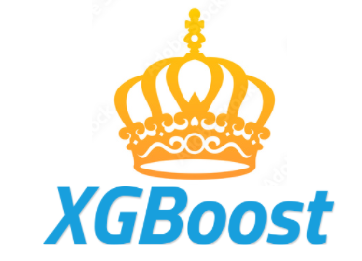